In [112]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling as pp

In [113]:
df = pd.read_csv('titanic passenger list.csv')
df.head()

,pclass,survived,name,sex,age,sibsp,parch,ticket,fare,cabin,embarked,boat,body,home.dest
0,1,1,"Allen, Miss. Elisabeth Walton",female,29.00,0,0,24160,211.3375,B5,S,2,NaN,"St Louis, MO"
1,1,1,"Allison, Master. Hudson Trevor",male,0.92,1,2,113781,151.5500,C22 C26,S,11,NaN,"Montreal, PQ / Chesterville, ON"
2,1,0,"Allison, Miss. Helen Loraine",female,2.00,1,2,113781,151.5500,C22 C26,S,NaN,NaN,"Montreal, PQ / Chesterville, ON"
3,1,0,"Allison, Mr. Hudson Joshua Creighton",male,30.00,1,2,113781,151.5500,C22 C26,S,NaN,135.0,"Montreal, PQ / Chesterville, ON"
4,1,0,"Allison, Mrs. Hudson J C (Bessie Waldo Daniels)",female,25.00,1,2,113781,151.5500,C22 C26,S,NaN,NaN,"Montreal, PQ / Chesterville, ON"


In [114]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1309 entries, 0 to 1308
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   pclass     1309 non-null   int64  
 1   survived   1309 non-null   int64  
 2   name       1309 non-null   object 
 3   sex        1309 non-null   object 
 4   age        1046 non-null   float64
 5   sibsp      1309 non-null   int64  
 6   parch      1309 non-null   int64  
 7   ticket     1309 non-null   object 
 8   fare       1308 non-null   float64
 9   cabin      295 non-null    object 
 10  embarked   1307 non-null   object 
 11  boat       486 non-null    object 
 12  body       121 non-null    float64
 13  home.dest  745 non-null    object 
dtypes: float64(3), int64(4), object(7)
memory usage: 143.3+ KB


In [115]:
# CONVERTING THE pclass AND survived DATATYPE TO OBJECT
df.pclass = df.pclass.astype('object')
df.survived = df.survived.astype('object')

In [4]:
pp.ProfileReport(df)

# MISSING VALUES

Null Count pclass          0
survived        0
name            0
sex             0
age           263
sibsp           0
parch           0
ticket          0
fare            1
cabin        1014
embarked        2
boat          823
body         1188
home.dest     564
dtype: int64


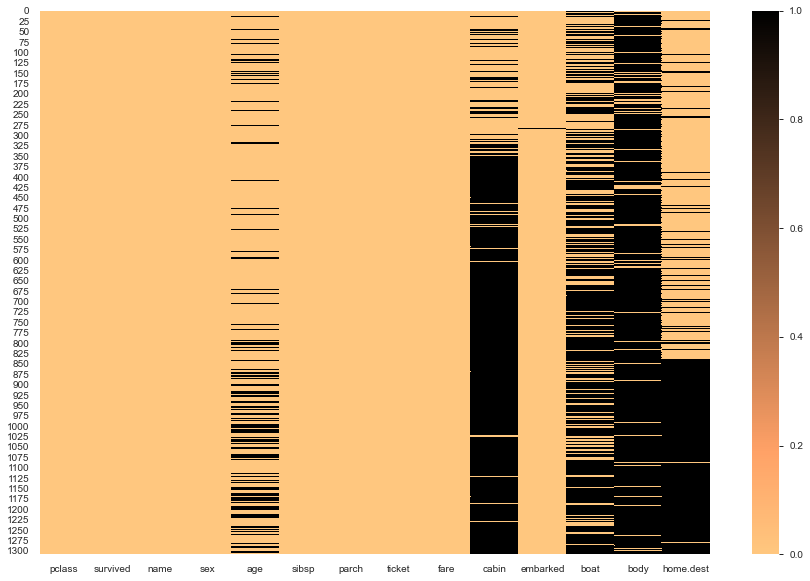

In [7]:
f = plt.figure(figsize = (15,10))
sns.heatmap(df.isnull(),cmap='copper_r')

print('Null Count', df.isnull().sum())

In [116]:
df.drop(columns=['cabin','boat','body','home.dest','name','ticket'],axis=1,inplace=True) #MANY VALUES MISSING

In [117]:
df.age.fillna(df.age.mean(),inplace=True) 
df.fare.fillna(df.fare.mean(),inplace=True)
df.embarked.fillna('S',inplace=True)

df.isnull().sum()

pclass      0
survived    0
sex         0
age         0
sibsp       0
parch       0
fare        0
embarked    0
dtype: int64

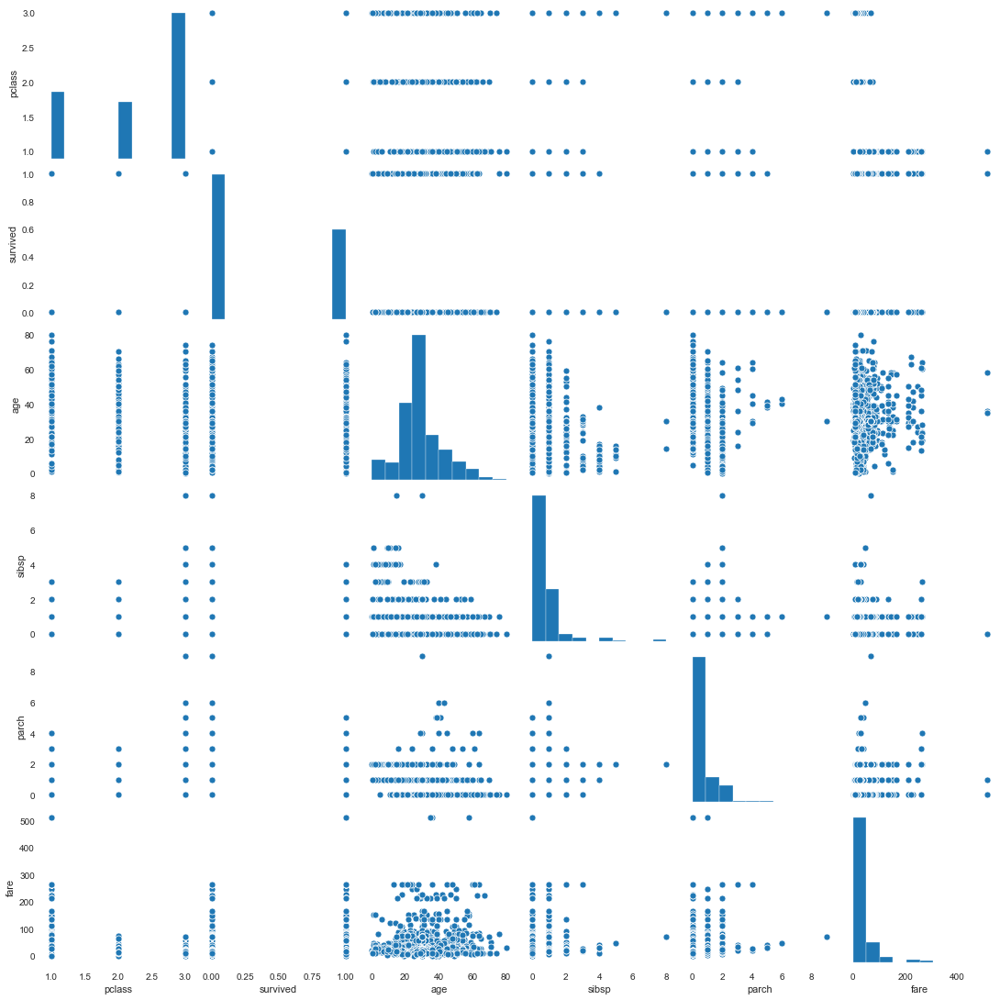

In [10]:
sns.pairplot(df)

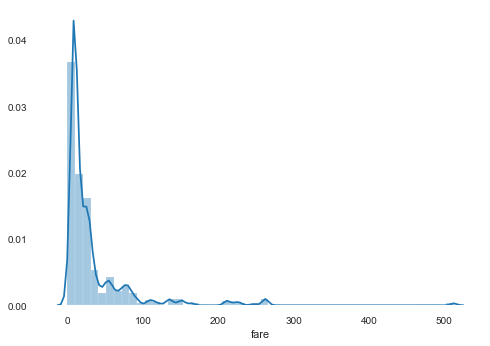

In [13]:
sns.distplot(df.fare)

In [118]:
df.fare = np.log(df.fare+1) #TO REMOVE RIGHT SKEWNESS

In [15]:
df.head()

,pclass,survived,sex,age,sibsp,parch,fare,embarked
0,1,1,female,29.00,0,0,5.358177,S
1,1,1,male,0.92,1,2,5.027492,S
2,1,0,female,2.00,1,2,5.027492,S
3,1,0,male,30.00,1,2,5.027492,S
4,1,0,female,25.00,1,2,5.027492,S


In [119]:
#STANDARDIZATION OF THE AGE VALUES
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

In [120]:
A = df.age.values.reshape(-1,1)
a = mms.fit_transform(A)
a

array([[0.36114243],
       [0.00939496],
       [0.02292371],
       ...,
       [0.32982588],
       [0.33608919],
       [0.36114243]])

In [121]:
df.age = pd.DataFrame(a)
df.head()

,pclass,survived,sex,age,sibsp,parch,fare,embarked
0,1,1,female,0.361142,0,0,5.358177,S
1,1,1,male,0.009395,1,2,5.027492,S
2,1,0,female,0.022924,1,2,5.027492,S
3,1,0,male,0.373669,1,2,5.027492,S
4,1,0,female,0.311036,1,2,5.027492,S


 # GRID SEARCH CV

In [122]:
df.columns,df.dtypes

(Index(['pclass', 'survived', 'sex', 'age', 'sibsp', 'parch', 'fare',
        'embarked'],
       dtype='object'),
 pclass       object
 survived     object
 sex          object
 age         float64
 sibsp         int64
 parch         int64
 fare        float64
 embarked     object
 dtype: object)

In [167]:
# CONVERTING CATEGORICAL TO NUMERICAL

sex_dict = {'male':1, 'female':0}
df['sex'] = df['sex'].replace(sex_dict)

embarked_dict = {'S' : 0, 'C' : 1,'Q' : 2}
df['embarked'] = df['embarked'].replace(embarked_dict)

df.head()

,pclass,survived,sex,age,sibsp,parch,fare,embarked
0,1,1,0,0.361142,0,0,5.358177,0
1,1,1,1,0.009395,1,2,5.027492,0
2,1,0,0,0.022924,1,2,5.027492,0
3,1,0,1,0.373669,1,2,5.027492,0
4,1,0,0,0.311036,1,2,5.027492,0


In [168]:
x=df.drop('survived',axis=1)
y=df['survived']

In [169]:
from sklearn.model_selection import train_test_split as TTT
x_train,x_test,y_train,y_test = TTT(x,y,test_size=0.2)

In [170]:
#CONVERSION OF DATA TYPES TO STRING TO APPLY CATBOOST
titanic = np.where(df.dtypes == 'object')
for i in titanic:
    df.iloc[:,i] = df.iloc[:,i].astype('str')

In [171]:
from catboost import CatBoostClassifier
cbc = CatBoostClassifier()

In [172]:
from sklearn.model_selection import GridSearchCV

In [173]:
parameters = {'iterations' : range(50,500,50),
             'learning_rate' : [0.001,0.1,0.2,0.3,0.5],
             'depth' : [2,3,4,5]}

In [174]:
grid = GridSearchCV(estimator = cbc,param_grid = parameters,cv=5)
grid.fit(x_train,y_train)

0:	learn: 0.6927713	total: 512us	remaining: 25.1ms
1:	learn: 0.6923962	total: 1.12ms	remaining: 26.8ms
2:	learn: 0.6920623	total: 1.69ms	remaining: 26.4ms
3:	learn: 0.6916885	total: 2.26ms	remaining: 26ms
4:	learn: 0.6913371	total: 2.81ms	remaining: 25.3ms
5:	learn: 0.6909646	total: 3.39ms	remaining: 24.9ms
6:	learn: 0.6906633	total: 3.97ms	remaining: 24.4ms
7:	learn: 0.6902921	total: 4.57ms	remaining: 24ms
8:	learn: 0.6899869	total: 5.14ms	remaining: 23.4ms
9:	learn: 0.6896386	total: 5.55ms	remaining: 22.2ms
10:	learn: 0.6892693	total: 6ms	remaining: 21.3ms
11:	learn: 0.6889699	total: 6.6ms	remaining: 20.9ms
12:	learn: 0.6886670	total: 7.15ms	remaining: 20.3ms
13:	learn: 0.6883504	total: 7.73ms	remaining: 19.9ms
14:	learn: 0.6879835	total: 8.24ms	remaining: 19.2ms
15:	learn: 0.6876173	total: 8.68ms	remaining: 18.5ms
16:	learn: 0.6872733	total: 9.16ms	remaining: 17.8ms
17:	learn: 0.6869299	total: 9.63ms	remaining: 17.1ms
18:	learn: 0.6865656	total: 10.1ms	remaining: 16.5ms
19:	learn: 0

1:	learn: 0.6291856	total: 1.35ms	remaining: 32.4ms
2:	learn: 0.6060900	total: 2.01ms	remaining: 31.5ms
3:	learn: 0.5854810	total: 2.47ms	remaining: 28.5ms
4:	learn: 0.5697708	total: 3.08ms	remaining: 27.7ms
5:	learn: 0.5548124	total: 3.54ms	remaining: 26ms
6:	learn: 0.5428907	total: 4.07ms	remaining: 25ms
7:	learn: 0.5317821	total: 4.54ms	remaining: 23.9ms
8:	learn: 0.5231698	total: 4.99ms	remaining: 22.7ms
9:	learn: 0.5152160	total: 5.43ms	remaining: 21.7ms
10:	learn: 0.5079060	total: 5.87ms	remaining: 20.8ms
11:	learn: 0.5044554	total: 6.3ms	remaining: 20ms
12:	learn: 0.4989006	total: 6.76ms	remaining: 19.2ms
13:	learn: 0.4949485	total: 7.2ms	remaining: 18.5ms
14:	learn: 0.4909700	total: 7.63ms	remaining: 17.8ms
15:	learn: 0.4863262	total: 8.12ms	remaining: 17.3ms
16:	learn: 0.4823583	total: 8.61ms	remaining: 16.7ms
17:	learn: 0.4798931	total: 9.17ms	remaining: 16.3ms
18:	learn: 0.4781602	total: 9.72ms	remaining: 15.9ms
19:	learn: 0.4747291	total: 10.2ms	remaining: 15.3ms
20:	learn:

9:	learn: 0.4700452	total: 4.86ms	remaining: 19.4ms
10:	learn: 0.4664473	total: 5.39ms	remaining: 19.1ms
11:	learn: 0.4632561	total: 5.86ms	remaining: 18.6ms
12:	learn: 0.4588402	total: 6.42ms	remaining: 18.3ms
13:	learn: 0.4558443	total: 6.87ms	remaining: 17.7ms
14:	learn: 0.4530474	total: 7.32ms	remaining: 17.1ms
15:	learn: 0.4478710	total: 7.84ms	remaining: 16.7ms
16:	learn: 0.4458050	total: 8.25ms	remaining: 16ms
17:	learn: 0.4423564	total: 8.96ms	remaining: 15.9ms
18:	learn: 0.4411777	total: 9.58ms	remaining: 15.6ms
19:	learn: 0.4393568	total: 10.2ms	remaining: 15.3ms
20:	learn: 0.4382078	total: 10.6ms	remaining: 14.6ms
21:	learn: 0.4368423	total: 11.1ms	remaining: 14.2ms
22:	learn: 0.4360025	total: 11.8ms	remaining: 13.9ms
23:	learn: 0.4344060	total: 12.4ms	remaining: 13.5ms
24:	learn: 0.4337141	total: 12.9ms	remaining: 12.9ms
25:	learn: 0.4326762	total: 13.4ms	remaining: 12.4ms
26:	learn: 0.4314014	total: 13.8ms	remaining: 11.8ms
27:	learn: 0.4299739	total: 14.4ms	remaining: 11.

41:	learn: 0.4032256	total: 33.5ms	remaining: 6.39ms
42:	learn: 0.4024991	total: 34.2ms	remaining: 5.57ms
43:	learn: 0.4021288	total: 34.9ms	remaining: 4.76ms
44:	learn: 0.4017264	total: 35.8ms	remaining: 3.98ms
45:	learn: 0.3965432	total: 36.5ms	remaining: 3.17ms
46:	learn: 0.3944567	total: 37.8ms	remaining: 2.41ms
47:	learn: 0.3943617	total: 38.3ms	remaining: 1.59ms
48:	learn: 0.3938423	total: 40.7ms	remaining: 830us
49:	learn: 0.3936981	total: 41.5ms	remaining: 0us
0:	learn: 0.5975184	total: 856us	remaining: 42ms
1:	learn: 0.5466172	total: 1.64ms	remaining: 39.3ms
2:	learn: 0.5174534	total: 2.18ms	remaining: 34.2ms
3:	learn: 0.4979355	total: 2.92ms	remaining: 33.5ms
4:	learn: 0.4896474	total: 3.35ms	remaining: 30.1ms
5:	learn: 0.4797172	total: 3.73ms	remaining: 27.3ms
6:	learn: 0.4730579	total: 4.1ms	remaining: 25.2ms
7:	learn: 0.4676243	total: 4.48ms	remaining: 23.5ms
8:	learn: 0.4638539	total: 5.39ms	remaining: 24.6ms
9:	learn: 0.4610657	total: 6.31ms	remaining: 25.2ms
10:	learn: 

1:	learn: 0.4955221	total: 980us	remaining: 23.5ms
2:	learn: 0.4724845	total: 1.44ms	remaining: 22.6ms
3:	learn: 0.4601442	total: 1.83ms	remaining: 21.1ms
4:	learn: 0.4523278	total: 2.31ms	remaining: 20.8ms
5:	learn: 0.4492197	total: 3.47ms	remaining: 25.4ms
6:	learn: 0.4417995	total: 3.91ms	remaining: 24ms
7:	learn: 0.4388737	total: 4.29ms	remaining: 22.5ms
8:	learn: 0.4364567	total: 4.67ms	remaining: 21.3ms
9:	learn: 0.4324688	total: 5.05ms	remaining: 20.2ms
10:	learn: 0.4310179	total: 5.42ms	remaining: 19.2ms
11:	learn: 0.4233145	total: 5.8ms	remaining: 18.4ms
12:	learn: 0.4227261	total: 6.21ms	remaining: 17.7ms
13:	learn: 0.4198283	total: 6.64ms	remaining: 17.1ms
14:	learn: 0.4139239	total: 7.07ms	remaining: 16.5ms
15:	learn: 0.4124500	total: 7.6ms	remaining: 16.2ms
16:	learn: 0.4105351	total: 8.12ms	remaining: 15.8ms
17:	learn: 0.4080614	total: 8.64ms	remaining: 15.4ms
18:	learn: 0.4066818	total: 9.02ms	remaining: 14.7ms
19:	learn: 0.4059463	total: 9.44ms	remaining: 14.2ms
20:	lea

1:	learn: 0.6923997	total: 960us	remaining: 47.1ms
2:	learn: 0.6920593	total: 1.34ms	remaining: 43.3ms
3:	learn: 0.6916754	total: 1.81ms	remaining: 43.4ms
4:	learn: 0.6913158	total: 2.29ms	remaining: 43.4ms
5:	learn: 0.6909333	total: 2.67ms	remaining: 41.8ms
6:	learn: 0.6906190	total: 3.03ms	remaining: 40.3ms
7:	learn: 0.6902378	total: 3.42ms	remaining: 39.4ms
8:	learn: 0.6899195	total: 3.78ms	remaining: 38.3ms
9:	learn: 0.6895630	total: 4.14ms	remaining: 37.3ms
10:	learn: 0.6891838	total: 4.49ms	remaining: 36.3ms
11:	learn: 0.6888709	total: 4.84ms	remaining: 35.5ms
12:	learn: 0.6885550	total: 5.3ms	remaining: 35.5ms
13:	learn: 0.6882325	total: 5.67ms	remaining: 34.9ms
14:	learn: 0.6878558	total: 6.03ms	remaining: 34.2ms
15:	learn: 0.6874798	total: 6.39ms	remaining: 33.6ms
16:	learn: 0.6871277	total: 6.76ms	remaining: 33ms
17:	learn: 0.6867903	total: 7.14ms	remaining: 32.5ms
18:	learn: 0.6864162	total: 7.54ms	remaining: 32.1ms
19:	learn: 0.6860428	total: 7.94ms	remaining: 31.8ms
20:	le

10:	learn: 0.6891908	total: 5.05ms	remaining: 40.9ms
11:	learn: 0.6888644	total: 5.52ms	remaining: 40.5ms
12:	learn: 0.6885569	total: 6.1ms	remaining: 40.8ms
13:	learn: 0.6882323	total: 6.6ms	remaining: 40.5ms
14:	learn: 0.6878584	total: 7.01ms	remaining: 39.7ms
15:	learn: 0.6874853	total: 7.51ms	remaining: 39.4ms
16:	learn: 0.6871368	total: 8.19ms	remaining: 40ms
17:	learn: 0.6868230	total: 8.71ms	remaining: 39.7ms
18:	learn: 0.6864518	total: 9.21ms	remaining: 39.3ms
19:	learn: 0.6860813	total: 9.66ms	remaining: 38.6ms
20:	learn: 0.6857114	total: 10.1ms	remaining: 38.2ms
21:	learn: 0.6853862	total: 10.6ms	remaining: 37.5ms
22:	learn: 0.6850698	total: 11.1ms	remaining: 37ms
23:	learn: 0.6847018	total: 11.6ms	remaining: 36.7ms
24:	learn: 0.6843817	total: 12.2ms	remaining: 36.7ms
25:	learn: 0.6840151	total: 12.7ms	remaining: 36.1ms
26:	learn: 0.6837129	total: 13.1ms	remaining: 35.5ms
27:	learn: 0.6834009	total: 13.9ms	remaining: 35.7ms
28:	learn: 0.6831003	total: 14.5ms	remaining: 35.4ms

1:	learn: 0.6291856	total: 1.01ms	remaining: 49.7ms
2:	learn: 0.6060900	total: 1.46ms	remaining: 47.2ms
3:	learn: 0.5854810	total: 1.88ms	remaining: 45.2ms
4:	learn: 0.5697708	total: 2.81ms	remaining: 53.4ms
5:	learn: 0.5548124	total: 3.62ms	remaining: 56.7ms
6:	learn: 0.5428907	total: 4.13ms	remaining: 54.9ms
7:	learn: 0.5317821	total: 4.6ms	remaining: 52.9ms
8:	learn: 0.5231698	total: 5.11ms	remaining: 51.7ms
9:	learn: 0.5152160	total: 5.52ms	remaining: 49.7ms
10:	learn: 0.5079060	total: 5.94ms	remaining: 48.1ms
11:	learn: 0.5044554	total: 6.35ms	remaining: 46.6ms
12:	learn: 0.4989006	total: 6.75ms	remaining: 45.2ms
13:	learn: 0.4949485	total: 7.16ms	remaining: 44ms
14:	learn: 0.4909700	total: 7.56ms	remaining: 42.8ms
15:	learn: 0.4863262	total: 7.96ms	remaining: 41.8ms
16:	learn: 0.4823583	total: 8.4ms	remaining: 41ms
17:	learn: 0.4798931	total: 8.81ms	remaining: 40.1ms
18:	learn: 0.4781602	total: 9.36ms	remaining: 39.9ms
19:	learn: 0.4747291	total: 9.9ms	remaining: 39.6ms
20:	learn

1:	learn: 0.6297718	total: 1.62ms	remaining: 79.6ms
2:	learn: 0.6077226	total: 2.55ms	remaining: 82.4ms
3:	learn: 0.5865265	total: 3.17ms	remaining: 76ms
4:	learn: 0.5696554	total: 3.75ms	remaining: 71.3ms
5:	learn: 0.5561381	total: 4.29ms	remaining: 67.1ms
6:	learn: 0.5449915	total: 4.8ms	remaining: 63.7ms
7:	learn: 0.5330688	total: 5.28ms	remaining: 60.7ms
8:	learn: 0.5259366	total: 5.77ms	remaining: 58.4ms
9:	learn: 0.5175748	total: 6.23ms	remaining: 56.1ms
10:	learn: 0.5096199	total: 6.7ms	remaining: 54.2ms
11:	learn: 0.5028528	total: 7.15ms	remaining: 52.5ms
12:	learn: 0.4974275	total: 7.66ms	remaining: 51.2ms
13:	learn: 0.4946053	total: 8.1ms	remaining: 49.8ms
14:	learn: 0.4911968	total: 8.56ms	remaining: 48.5ms
15:	learn: 0.4871871	total: 9.03ms	remaining: 47.4ms
16:	learn: 0.4842654	total: 9.49ms	remaining: 46.3ms
17:	learn: 0.4814257	total: 9.93ms	remaining: 45.3ms
18:	learn: 0.4791793	total: 10.4ms	remaining: 44.2ms
19:	learn: 0.4768823	total: 10.8ms	remaining: 43.3ms
20:	lea

1:	learn: 0.5812392	total: 1ms	remaining: 49.2ms
2:	learn: 0.5511806	total: 1.44ms	remaining: 46.7ms
3:	learn: 0.5285453	total: 1.92ms	remaining: 46ms
4:	learn: 0.5146297	total: 2.36ms	remaining: 44.8ms
5:	learn: 0.4991402	total: 2.78ms	remaining: 43.5ms
6:	learn: 0.4899088	total: 3.25ms	remaining: 43.2ms
7:	learn: 0.4827664	total: 3.81ms	remaining: 43.9ms
8:	learn: 0.4777216	total: 4.19ms	remaining: 42.4ms
9:	learn: 0.4729536	total: 4.61ms	remaining: 41.4ms
10:	learn: 0.4697298	total: 4.99ms	remaining: 40.4ms
11:	learn: 0.4658581	total: 5.39ms	remaining: 39.5ms
12:	learn: 0.4617615	total: 5.78ms	remaining: 38.7ms
13:	learn: 0.4575746	total: 6.17ms	remaining: 37.9ms
14:	learn: 0.4554298	total: 6.7ms	remaining: 38ms
15:	learn: 0.4524434	total: 7.17ms	remaining: 37.6ms
16:	learn: 0.4509532	total: 7.73ms	remaining: 37.7ms
17:	learn: 0.4481468	total: 8.12ms	remaining: 37ms
18:	learn: 0.4468300	total: 8.64ms	remaining: 36.8ms
19:	learn: 0.4455808	total: 9.18ms	remaining: 36.7ms
20:	learn: 0

0:	learn: 0.6232222	total: 450us	remaining: 44.6ms
1:	learn: 0.5785148	total: 1.12ms	remaining: 55.1ms
2:	learn: 0.5482874	total: 1.6ms	remaining: 51.8ms
3:	learn: 0.5224567	total: 2.14ms	remaining: 51.3ms
4:	learn: 0.5066282	total: 2.68ms	remaining: 51ms
5:	learn: 0.4955971	total: 3.14ms	remaining: 49.2ms
6:	learn: 0.4878630	total: 3.55ms	remaining: 47.2ms
7:	learn: 0.4798246	total: 3.95ms	remaining: 45.4ms
8:	learn: 0.4747080	total: 4.35ms	remaining: 44ms
9:	learn: 0.4700452	total: 4.74ms	remaining: 42.7ms
10:	learn: 0.4664473	total: 5.14ms	remaining: 41.6ms
11:	learn: 0.4632561	total: 5.67ms	remaining: 41.6ms
12:	learn: 0.4588402	total: 6.15ms	remaining: 41.2ms
13:	learn: 0.4558443	total: 6.59ms	remaining: 40.5ms
14:	learn: 0.4530474	total: 7.09ms	remaining: 40.2ms
15:	learn: 0.4478710	total: 7.49ms	remaining: 39.3ms
16:	learn: 0.4458050	total: 7.92ms	remaining: 38.7ms
17:	learn: 0.4423564	total: 8.31ms	remaining: 37.9ms
18:	learn: 0.4411777	total: 8.71ms	remaining: 37.1ms
19:	learn

0:	learn: 0.6237622	total: 479us	remaining: 47.5ms
1:	learn: 0.5795117	total: 903us	remaining: 44.3ms
2:	learn: 0.5504363	total: 1.36ms	remaining: 44.1ms
3:	learn: 0.5247774	total: 1.8ms	remaining: 43.2ms
4:	learn: 0.5107912	total: 2.2ms	remaining: 41.9ms
5:	learn: 0.4962568	total: 2.66ms	remaining: 41.7ms
6:	learn: 0.4868948	total: 3.19ms	remaining: 42.4ms
7:	learn: 0.4792153	total: 3.95ms	remaining: 45.4ms
8:	learn: 0.4748657	total: 4.47ms	remaining: 45.2ms
9:	learn: 0.4702709	total: 4.98ms	remaining: 44.9ms
10:	learn: 0.4661081	total: 5.41ms	remaining: 43.8ms
11:	learn: 0.4626725	total: 5.82ms	remaining: 42.7ms
12:	learn: 0.4589367	total: 6.23ms	remaining: 41.7ms
13:	learn: 0.4543518	total: 6.67ms	remaining: 41ms
14:	learn: 0.4515465	total: 7.08ms	remaining: 40.1ms
15:	learn: 0.4479208	total: 7.54ms	remaining: 39.6ms
16:	learn: 0.4458855	total: 8.01ms	remaining: 39.1ms
17:	learn: 0.4432841	total: 8.46ms	remaining: 38.5ms
18:	learn: 0.4417560	total: 8.91ms	remaining: 38ms
19:	learn: 

0:	learn: 0.5982834	total: 473us	remaining: 46.9ms
1:	learn: 0.5491447	total: 1.03ms	remaining: 50.4ms
2:	learn: 0.5170187	total: 1.51ms	remaining: 49ms
3:	learn: 0.4987084	total: 1.98ms	remaining: 47.6ms
4:	learn: 0.4908147	total: 2.44ms	remaining: 46.3ms
5:	learn: 0.4851257	total: 2.94ms	remaining: 46ms
6:	learn: 0.4745622	total: 3.48ms	remaining: 46.2ms
7:	learn: 0.4696543	total: 4.07ms	remaining: 46.9ms
8:	learn: 0.4642242	total: 4.5ms	remaining: 45.5ms
9:	learn: 0.4611558	total: 4.92ms	remaining: 44.2ms
10:	learn: 0.4576311	total: 5.32ms	remaining: 43ms
11:	learn: 0.4555223	total: 5.73ms	remaining: 42ms
12:	learn: 0.4495720	total: 6.14ms	remaining: 41.1ms
13:	learn: 0.4453469	total: 6.56ms	remaining: 40.3ms
14:	learn: 0.4431630	total: 7.04ms	remaining: 39.9ms
15:	learn: 0.4403261	total: 7.51ms	remaining: 39.5ms
16:	learn: 0.4385724	total: 7.96ms	remaining: 38.8ms
17:	learn: 0.4375885	total: 8.49ms	remaining: 38.7ms
18:	learn: 0.4354219	total: 8.96ms	remaining: 38.2ms
19:	learn: 0.

1:	learn: 0.5466172	total: 1.3ms	remaining: 63.8ms
2:	learn: 0.5174534	total: 1.82ms	remaining: 59ms
3:	learn: 0.4979355	total: 2.3ms	remaining: 55.1ms
4:	learn: 0.4896474	total: 2.75ms	remaining: 52.3ms
5:	learn: 0.4797172	total: 3.18ms	remaining: 49.9ms
6:	learn: 0.4730579	total: 3.63ms	remaining: 48.3ms
7:	learn: 0.4676243	total: 4.04ms	remaining: 46.5ms
8:	learn: 0.4638539	total: 4.45ms	remaining: 45ms
9:	learn: 0.4610657	total: 4.86ms	remaining: 43.8ms
10:	learn: 0.4590124	total: 5.27ms	remaining: 42.7ms
11:	learn: 0.4547474	total: 5.72ms	remaining: 42ms
12:	learn: 0.4535428	total: 6.2ms	remaining: 41.5ms
13:	learn: 0.4508475	total: 6.6ms	remaining: 40.5ms
14:	learn: 0.4500043	total: 6.99ms	remaining: 39.6ms
15:	learn: 0.4476760	total: 7.43ms	remaining: 39ms
16:	learn: 0.4457501	total: 7.83ms	remaining: 38.2ms
17:	learn: 0.4430264	total: 8.25ms	remaining: 37.6ms
18:	learn: 0.4415860	total: 8.64ms	remaining: 36.8ms
19:	learn: 0.4399984	total: 9.04ms	remaining: 36.1ms
20:	learn: 0.4

0:	learn: 0.5488691	total: 716us	remaining: 71ms
1:	learn: 0.5001032	total: 1.19ms	remaining: 58.5ms
2:	learn: 0.4760192	total: 1.73ms	remaining: 55.8ms
3:	learn: 0.4677985	total: 2.15ms	remaining: 51.7ms
4:	learn: 0.4541523	total: 2.8ms	remaining: 53.1ms
5:	learn: 0.4511384	total: 3.21ms	remaining: 50.4ms
6:	learn: 0.4472166	total: 3.61ms	remaining: 47.9ms
7:	learn: 0.4416689	total: 4.04ms	remaining: 46.5ms
8:	learn: 0.4386459	total: 4.44ms	remaining: 44.9ms
9:	learn: 0.4331424	total: 4.83ms	remaining: 43.4ms
10:	learn: 0.4325271	total: 5.22ms	remaining: 42.2ms
11:	learn: 0.4306481	total: 5.66ms	remaining: 41.5ms
12:	learn: 0.4296250	total: 6.07ms	remaining: 40.6ms
13:	learn: 0.4282348	total: 6.45ms	remaining: 39.6ms
14:	learn: 0.4256923	total: 6.84ms	remaining: 38.8ms
15:	learn: 0.4235409	total: 7.24ms	remaining: 38ms
16:	learn: 0.4206905	total: 7.62ms	remaining: 37.2ms
17:	learn: 0.4199635	total: 8.07ms	remaining: 36.7ms
18:	learn: 0.4192366	total: 8.5ms	remaining: 36.2ms
19:	learn:

0:	learn: 0.5449145	total: 661us	remaining: 65.4ms
1:	learn: 0.4955221	total: 1.37ms	remaining: 67ms
2:	learn: 0.4724845	total: 1.86ms	remaining: 60.1ms
3:	learn: 0.4601442	total: 2.3ms	remaining: 55.1ms
4:	learn: 0.4523278	total: 2.73ms	remaining: 51.9ms
5:	learn: 0.4492197	total: 3.14ms	remaining: 49.3ms
6:	learn: 0.4417995	total: 3.56ms	remaining: 47.3ms
7:	learn: 0.4388737	total: 3.95ms	remaining: 45.5ms
8:	learn: 0.4364567	total: 4.4ms	remaining: 44.5ms
9:	learn: 0.4324688	total: 4.83ms	remaining: 43.4ms
10:	learn: 0.4310179	total: 5.26ms	remaining: 42.5ms
11:	learn: 0.4233145	total: 5.74ms	remaining: 42.1ms
12:	learn: 0.4227261	total: 6.26ms	remaining: 41.9ms
13:	learn: 0.4198283	total: 6.73ms	remaining: 41.3ms
14:	learn: 0.4139239	total: 7.17ms	remaining: 40.6ms
15:	learn: 0.4124500	total: 7.58ms	remaining: 39.8ms
16:	learn: 0.4105351	total: 8.03ms	remaining: 39.2ms
17:	learn: 0.4080614	total: 8.57ms	remaining: 39.1ms
18:	learn: 0.4066818	total: 9.13ms	remaining: 38.9ms
19:	lear

0:	learn: 0.5461340	total: 1.29ms	remaining: 128ms
1:	learn: 0.4973537	total: 1.93ms	remaining: 94.5ms
2:	learn: 0.4760817	total: 2.4ms	remaining: 77.7ms
3:	learn: 0.4637089	total: 2.83ms	remaining: 67.9ms
4:	learn: 0.4542122	total: 3.31ms	remaining: 63ms
5:	learn: 0.4481166	total: 3.99ms	remaining: 62.4ms
6:	learn: 0.4402338	total: 4.45ms	remaining: 59.1ms
7:	learn: 0.4366800	total: 4.85ms	remaining: 55.7ms
8:	learn: 0.4349242	total: 5.38ms	remaining: 54.4ms
9:	learn: 0.4312025	total: 5.83ms	remaining: 52.5ms
10:	learn: 0.4282596	total: 6.24ms	remaining: 50.5ms
11:	learn: 0.4254821	total: 6.9ms	remaining: 50.6ms
12:	learn: 0.4233773	total: 8ms	remaining: 53.5ms
13:	learn: 0.4204663	total: 9.41ms	remaining: 57.8ms
14:	learn: 0.4172956	total: 11.4ms	remaining: 64.5ms
15:	learn: 0.4158211	total: 11.9ms	remaining: 62.7ms
16:	learn: 0.4131003	total: 12.6ms	remaining: 61.4ms
17:	learn: 0.4105897	total: 13ms	remaining: 59.2ms
18:	learn: 0.4096136	total: 13.4ms	remaining: 57.2ms
19:	learn: 0.

1:	learn: 0.6924118	total: 958us	remaining: 70.9ms
2:	learn: 0.6920706	total: 1.36ms	remaining: 66.5ms
3:	learn: 0.6917046	total: 1.75ms	remaining: 63.8ms
4:	learn: 0.6913735	total: 2.2ms	remaining: 63.9ms
5:	learn: 0.6910088	total: 2.59ms	remaining: 62.2ms
6:	learn: 0.6906751	total: 2.97ms	remaining: 60.7ms
7:	learn: 0.6903116	total: 3.33ms	remaining: 59.2ms
8:	learn: 0.6900093	total: 3.69ms	remaining: 57.9ms
9:	learn: 0.6896699	total: 4.05ms	remaining: 56.7ms
10:	learn: 0.6893083	total: 4.41ms	remaining: 55.7ms
11:	learn: 0.6890104	total: 4.76ms	remaining: 54.8ms
12:	learn: 0.6887104	total: 5.12ms	remaining: 54ms
13:	learn: 0.6883984	total: 5.48ms	remaining: 53.2ms
14:	learn: 0.6880392	total: 5.82ms	remaining: 52.4ms
15:	learn: 0.6876807	total: 6.18ms	remaining: 51.7ms
16:	learn: 0.6873455	total: 6.66ms	remaining: 52.1ms
17:	learn: 0.6870117	total: 7.17ms	remaining: 52.6ms
18:	learn: 0.6866551	total: 7.71ms	remaining: 53.1ms
19:	learn: 0.6862990	total: 8.25ms	remaining: 53.6ms
20:	le

129:	learn: 0.6517044	total: 52.7ms	remaining: 8.11ms
130:	learn: 0.6514151	total: 53.2ms	remaining: 7.71ms
131:	learn: 0.6511441	total: 53.6ms	remaining: 7.31ms
132:	learn: 0.6508885	total: 54ms	remaining: 6.91ms
133:	learn: 0.6505799	total: 54.5ms	remaining: 6.51ms
134:	learn: 0.6502719	total: 55.1ms	remaining: 6.12ms
135:	learn: 0.6500176	total: 55.5ms	remaining: 5.71ms
136:	learn: 0.6497106	total: 56ms	remaining: 5.31ms
137:	learn: 0.6494577	total: 56.4ms	remaining: 4.9ms
138:	learn: 0.6492125	total: 56.8ms	remaining: 4.5ms
139:	learn: 0.6489652	total: 57.2ms	remaining: 4.08ms
140:	learn: 0.6486989	total: 57.6ms	remaining: 3.68ms
141:	learn: 0.6484425	total: 58ms	remaining: 3.27ms
142:	learn: 0.6481887	total: 58.5ms	remaining: 2.86ms
143:	learn: 0.6478849	total: 59ms	remaining: 2.46ms
144:	learn: 0.6476022	total: 59.4ms	remaining: 2.05ms
145:	learn: 0.6473354	total: 59.8ms	remaining: 1.64ms
146:	learn: 0.6470332	total: 60.2ms	remaining: 1.23ms
147:	learn: 0.6467734	total: 60.6ms	re

43:	learn: 0.6780853	total: 26ms	remaining: 62.6ms
44:	learn: 0.6777302	total: 27.4ms	remaining: 64ms
45:	learn: 0.6774414	total: 28.2ms	remaining: 63.8ms
46:	learn: 0.6770876	total: 28.9ms	remaining: 63.4ms
47:	learn: 0.6767344	total: 29.6ms	remaining: 62.9ms
48:	learn: 0.6763819	total: 30.4ms	remaining: 62.6ms
49:	learn: 0.6760529	total: 31ms	remaining: 62ms
50:	learn: 0.6757479	total: 31.6ms	remaining: 61.4ms
51:	learn: 0.6754493	total: 32.1ms	remaining: 60.6ms
52:	learn: 0.6751419	total: 33.4ms	remaining: 61.1ms
53:	learn: 0.6747922	total: 33.8ms	remaining: 60.1ms
54:	learn: 0.6744873	total: 34.3ms	remaining: 59.3ms
55:	learn: 0.6741859	total: 34.7ms	remaining: 58.3ms
56:	learn: 0.6738860	total: 35.1ms	remaining: 57.3ms
57:	learn: 0.6735814	total: 35.5ms	remaining: 56.3ms
58:	learn: 0.6732346	total: 36.1ms	remaining: 55.7ms
59:	learn: 0.6729480	total: 37.4ms	remaining: 56.1ms
60:	learn: 0.6726579	total: 37.8ms	remaining: 55.2ms
61:	learn: 0.6723561	total: 38.2ms	remaining: 54.2ms
6

144:	learn: 0.4066743	total: 60.1ms	remaining: 2.07ms
145:	learn: 0.4063431	total: 60.5ms	remaining: 1.66ms
146:	learn: 0.4060172	total: 60.9ms	remaining: 1.24ms
147:	learn: 0.4058130	total: 61.3ms	remaining: 828us
148:	learn: 0.4056809	total: 61.9ms	remaining: 415us
149:	learn: 0.4053608	total: 62.3ms	remaining: 0us
0:	learn: 0.6580712	total: 554us	remaining: 82.6ms
1:	learn: 0.6291856	total: 1.11ms	remaining: 82.5ms
2:	learn: 0.6060900	total: 1.81ms	remaining: 88.7ms
3:	learn: 0.5854810	total: 2.2ms	remaining: 80.4ms
4:	learn: 0.5697708	total: 2.6ms	remaining: 75.3ms
5:	learn: 0.5548124	total: 2.99ms	remaining: 71.7ms
6:	learn: 0.5428907	total: 3.38ms	remaining: 69.1ms
7:	learn: 0.5317821	total: 3.78ms	remaining: 67ms
8:	learn: 0.5231698	total: 4.17ms	remaining: 65.4ms
9:	learn: 0.5152160	total: 4.56ms	remaining: 63.9ms
10:	learn: 0.5079060	total: 4.99ms	remaining: 63ms
11:	learn: 0.5044554	total: 5.39ms	remaining: 62ms
12:	learn: 0.4989006	total: 5.79ms	remaining: 61ms
13:	learn: 0.

92:	learn: 0.4149111	total: 40.8ms	remaining: 25ms
93:	learn: 0.4145249	total: 41.2ms	remaining: 24.6ms
94:	learn: 0.4141926	total: 41.6ms	remaining: 24.1ms
95:	learn: 0.4138928	total: 42.1ms	remaining: 23.7ms
96:	learn: 0.4130515	total: 42.6ms	remaining: 23.3ms
97:	learn: 0.4127577	total: 43.2ms	remaining: 22.9ms
98:	learn: 0.4125529	total: 43.6ms	remaining: 22.5ms
99:	learn: 0.4123582	total: 44.1ms	remaining: 22.1ms
100:	learn: 0.4121165	total: 44.6ms	remaining: 21.6ms
101:	learn: 0.4119039	total: 45ms	remaining: 21.2ms
102:	learn: 0.4115727	total: 45.5ms	remaining: 20.8ms
103:	learn: 0.4111134	total: 46ms	remaining: 20.3ms
104:	learn: 0.4108458	total: 46.8ms	remaining: 20.1ms
105:	learn: 0.4102832	total: 47.3ms	remaining: 19.6ms
106:	learn: 0.4100274	total: 47.7ms	remaining: 19.2ms
107:	learn: 0.4098407	total: 48.2ms	remaining: 18.7ms
108:	learn: 0.4098038	total: 48.6ms	remaining: 18.3ms
109:	learn: 0.4097270	total: 49ms	remaining: 17.8ms
110:	learn: 0.4096540	total: 49.5ms	remainin

52:	learn: 0.4333174	total: 22.6ms	remaining: 41.4ms
53:	learn: 0.4326671	total: 23.1ms	remaining: 41ms
54:	learn: 0.4323010	total: 23.5ms	remaining: 40.6ms
55:	learn: 0.4319702	total: 24.2ms	remaining: 40.6ms
56:	learn: 0.4305259	total: 24.9ms	remaining: 40.6ms
57:	learn: 0.4302440	total: 25.5ms	remaining: 40.5ms
58:	learn: 0.4292893	total: 25.9ms	remaining: 40ms
59:	learn: 0.4287685	total: 26.4ms	remaining: 39.6ms
60:	learn: 0.4280322	total: 27ms	remaining: 39.3ms
61:	learn: 0.4273320	total: 27.5ms	remaining: 39.1ms
62:	learn: 0.4265389	total: 28ms	remaining: 38.6ms
63:	learn: 0.4259606	total: 28.4ms	remaining: 38.2ms
64:	learn: 0.4251322	total: 29ms	remaining: 38ms
65:	learn: 0.4242786	total: 29.5ms	remaining: 37.5ms
66:	learn: 0.4235989	total: 29.9ms	remaining: 37ms
67:	learn: 0.4232706	total: 30.4ms	remaining: 36.6ms
68:	learn: 0.4228478	total: 30.8ms	remaining: 36.2ms
69:	learn: 0.4226190	total: 31.3ms	remaining: 35.8ms
70:	learn: 0.4223303	total: 31.9ms	remaining: 35.5ms
71:	lea

1:	learn: 0.5839657	total: 1.04ms	remaining: 77.4ms
2:	learn: 0.5526222	total: 1.45ms	remaining: 71.3ms
3:	learn: 0.5282820	total: 1.85ms	remaining: 67.7ms
4:	learn: 0.5131625	total: 2.27ms	remaining: 65.9ms
5:	learn: 0.5013215	total: 2.74ms	remaining: 65.9ms
6:	learn: 0.4926757	total: 3.22ms	remaining: 65.8ms
7:	learn: 0.4869069	total: 3.65ms	remaining: 64.8ms
8:	learn: 0.4810647	total: 4.14ms	remaining: 64.8ms
9:	learn: 0.4763701	total: 4.69ms	remaining: 65.7ms
10:	learn: 0.4727725	total: 5.27ms	remaining: 66.6ms
11:	learn: 0.4696645	total: 5.84ms	remaining: 67.2ms
12:	learn: 0.4661439	total: 6.4ms	remaining: 67.4ms
13:	learn: 0.4618223	total: 6.95ms	remaining: 67.5ms
14:	learn: 0.4590473	total: 7.35ms	remaining: 66.1ms
15:	learn: 0.4555161	total: 7.74ms	remaining: 64.8ms
16:	learn: 0.4529664	total: 8.16ms	remaining: 63.8ms
17:	learn: 0.4497819	total: 8.59ms	remaining: 63ms
18:	learn: 0.4482227	total: 9ms	remaining: 62.1ms
19:	learn: 0.4466230	total: 9.42ms	remaining: 61.2ms
20:	lear

126:	learn: 0.3766091	total: 52.6ms	remaining: 9.52ms
127:	learn: 0.3762173	total: 53ms	remaining: 9.11ms
128:	learn: 0.3761599	total: 53.4ms	remaining: 8.7ms
129:	learn: 0.3754736	total: 53.9ms	remaining: 8.29ms
130:	learn: 0.3754367	total: 54.3ms	remaining: 7.88ms
131:	learn: 0.3754024	total: 54.8ms	remaining: 7.47ms
132:	learn: 0.3752737	total: 55.4ms	remaining: 7.08ms
133:	learn: 0.3752253	total: 55.8ms	remaining: 6.66ms
134:	learn: 0.3751087	total: 56.2ms	remaining: 6.25ms
135:	learn: 0.3749939	total: 56.6ms	remaining: 5.83ms
136:	learn: 0.3742219	total: 57ms	remaining: 5.41ms
137:	learn: 0.3736161	total: 57.4ms	remaining: 4.99ms
138:	learn: 0.3731383	total: 57.8ms	remaining: 4.57ms
139:	learn: 0.3730506	total: 58.2ms	remaining: 4.16ms
140:	learn: 0.3730189	total: 58.6ms	remaining: 3.74ms
141:	learn: 0.3726333	total: 59ms	remaining: 3.32ms
142:	learn: 0.3726038	total: 59.4ms	remaining: 2.91ms
143:	learn: 0.3723652	total: 59.8ms	remaining: 2.49ms
144:	learn: 0.3723227	total: 60.3ms

65:	learn: 0.4007286	total: 29ms	remaining: 36.9ms
66:	learn: 0.4003284	total: 29.5ms	remaining: 36.6ms
67:	learn: 0.3999727	total: 30.1ms	remaining: 36.2ms
68:	learn: 0.3990624	total: 30.5ms	remaining: 35.8ms
69:	learn: 0.3987290	total: 30.9ms	remaining: 35.4ms
70:	learn: 0.3985904	total: 31.4ms	remaining: 34.9ms
71:	learn: 0.3983718	total: 31.8ms	remaining: 34.5ms
72:	learn: 0.3981516	total: 32.2ms	remaining: 34ms
73:	learn: 0.3978229	total: 32.7ms	remaining: 33.6ms
74:	learn: 0.3970747	total: 33.3ms	remaining: 33.3ms
75:	learn: 0.3966647	total: 33.7ms	remaining: 32.8ms
76:	learn: 0.3963984	total: 34.6ms	remaining: 32.8ms
77:	learn: 0.3953587	total: 35ms	remaining: 32.4ms
78:	learn: 0.3950017	total: 35.6ms	remaining: 32ms
79:	learn: 0.3948755	total: 36ms	remaining: 31.5ms
80:	learn: 0.3947615	total: 36.5ms	remaining: 31.1ms
81:	learn: 0.3945079	total: 36.9ms	remaining: 30.6ms
82:	learn: 0.3938990	total: 37.4ms	remaining: 30.2ms
83:	learn: 0.3936519	total: 37.9ms	remaining: 29.8ms
84:

146:	learn: 0.3677123	total: 65.6ms	remaining: 1.34ms
147:	learn: 0.3676314	total: 66.2ms	remaining: 895us
148:	learn: 0.3675957	total: 66.7ms	remaining: 447us
149:	learn: 0.3671213	total: 67.9ms	remaining: 0us
0:	learn: 0.5982834	total: 628us	remaining: 93.7ms
1:	learn: 0.5491447	total: 1.1ms	remaining: 81.3ms
2:	learn: 0.5170187	total: 1.85ms	remaining: 90.7ms
3:	learn: 0.4987084	total: 2.38ms	remaining: 86.9ms
4:	learn: 0.4908147	total: 2.87ms	remaining: 83.3ms
5:	learn: 0.4851257	total: 3.32ms	remaining: 79.6ms
6:	learn: 0.4745622	total: 3.73ms	remaining: 76.2ms
7:	learn: 0.4696543	total: 4.16ms	remaining: 73.8ms
8:	learn: 0.4642242	total: 4.57ms	remaining: 71.6ms
9:	learn: 0.4611558	total: 4.96ms	remaining: 69.4ms
10:	learn: 0.4576311	total: 5.35ms	remaining: 67.6ms
11:	learn: 0.4555223	total: 5.77ms	remaining: 66.4ms
12:	learn: 0.4495720	total: 6.17ms	remaining: 65ms
13:	learn: 0.4453469	total: 6.56ms	remaining: 63.7ms
14:	learn: 0.4431630	total: 6.98ms	remaining: 62.8ms
15:	lear

41:	learn: 0.4032256	total: 19.1ms	remaining: 49.2ms
42:	learn: 0.4024991	total: 19.7ms	remaining: 48.9ms
43:	learn: 0.4021288	total: 20.2ms	remaining: 48.6ms
44:	learn: 0.4017264	total: 20.7ms	remaining: 48.4ms
45:	learn: 0.3965432	total: 21.2ms	remaining: 47.9ms
46:	learn: 0.3944567	total: 21.8ms	remaining: 47.7ms
47:	learn: 0.3943617	total: 22.2ms	remaining: 47.3ms
48:	learn: 0.3938423	total: 22.7ms	remaining: 46.8ms
49:	learn: 0.3936981	total: 23.1ms	remaining: 46.2ms
50:	learn: 0.3933482	total: 23.5ms	remaining: 45.7ms
51:	learn: 0.3923144	total: 24ms	remaining: 45.1ms
52:	learn: 0.3914966	total: 24.4ms	remaining: 44.6ms
53:	learn: 0.3902285	total: 24.8ms	remaining: 44.1ms
54:	learn: 0.3870134	total: 25.3ms	remaining: 43.6ms
55:	learn: 0.3866965	total: 25.7ms	remaining: 43.2ms
56:	learn: 0.3863525	total: 26.3ms	remaining: 42.8ms
57:	learn: 0.3853263	total: 26.7ms	remaining: 42.3ms
58:	learn: 0.3852021	total: 27.1ms	remaining: 41.8ms
59:	learn: 0.3841657	total: 27.5ms	remaining: 41

139:	learn: 0.3702900	total: 62.1ms	remaining: 4.43ms
140:	learn: 0.3699571	total: 62.6ms	remaining: 4ms
141:	learn: 0.3695535	total: 63ms	remaining: 3.55ms
142:	learn: 0.3682561	total: 63.6ms	remaining: 3.11ms
143:	learn: 0.3682126	total: 64.2ms	remaining: 2.67ms
144:	learn: 0.3673036	total: 64.6ms	remaining: 2.23ms
145:	learn: 0.3670116	total: 65ms	remaining: 1.78ms
146:	learn: 0.3664741	total: 65.4ms	remaining: 1.33ms
147:	learn: 0.3653183	total: 65.8ms	remaining: 888us
148:	learn: 0.3650894	total: 66.2ms	remaining: 444us
149:	learn: 0.3650222	total: 66.6ms	remaining: 0us
0:	learn: 0.5944428	total: 481us	remaining: 71.7ms
1:	learn: 0.5432057	total: 901us	remaining: 66.7ms
2:	learn: 0.5144431	total: 1.4ms	remaining: 68.8ms
3:	learn: 0.4947951	total: 1.79ms	remaining: 65.5ms
4:	learn: 0.4846101	total: 2.22ms	remaining: 64.3ms
5:	learn: 0.4769361	total: 2.61ms	remaining: 62.6ms
6:	learn: 0.4689362	total: 3ms	remaining: 61.3ms
7:	learn: 0.4623890	total: 3.39ms	remaining: 60.1ms
8:	learn

49:	learn: 0.3882221	total: 23.1ms	remaining: 46.2ms
50:	learn: 0.3881623	total: 23.5ms	remaining: 45.7ms
51:	learn: 0.3870133	total: 24ms	remaining: 45.2ms
52:	learn: 0.3860161	total: 24.4ms	remaining: 44.6ms
53:	learn: 0.3845976	total: 24.9ms	remaining: 44.3ms
54:	learn: 0.3803372	total: 25.3ms	remaining: 43.8ms
55:	learn: 0.3792899	total: 25.7ms	remaining: 43.2ms
56:	learn: 0.3791935	total: 26.1ms	remaining: 42.6ms
57:	learn: 0.3787325	total: 26.5ms	remaining: 42.1ms
58:	learn: 0.3785114	total: 27ms	remaining: 41.6ms
59:	learn: 0.3779820	total: 27.4ms	remaining: 41.1ms
60:	learn: 0.3778428	total: 27.8ms	remaining: 40.6ms
61:	learn: 0.3764807	total: 28.4ms	remaining: 40.3ms
62:	learn: 0.3754349	total: 29.7ms	remaining: 41ms
63:	learn: 0.3746364	total: 30.3ms	remaining: 40.7ms
64:	learn: 0.3742991	total: 30.7ms	remaining: 40.2ms
65:	learn: 0.3732775	total: 31.1ms	remaining: 39.6ms
66:	learn: 0.3732198	total: 31.6ms	remaining: 39.1ms
67:	learn: 0.3731153	total: 32.1ms	remaining: 38.8ms

1:	learn: 0.4955221	total: 1.11ms	remaining: 82.3ms
2:	learn: 0.4724845	total: 1.63ms	remaining: 79.8ms
3:	learn: 0.4601442	total: 2.04ms	remaining: 74.6ms
4:	learn: 0.4523278	total: 2.52ms	remaining: 73.1ms
5:	learn: 0.4492197	total: 3.12ms	remaining: 74.9ms
6:	learn: 0.4417995	total: 3.77ms	remaining: 77.1ms
7:	learn: 0.4388737	total: 4.32ms	remaining: 76.7ms
8:	learn: 0.4364567	total: 4.9ms	remaining: 76.7ms
9:	learn: 0.4324688	total: 5.43ms	remaining: 76.1ms
10:	learn: 0.4310179	total: 5.88ms	remaining: 74.3ms
11:	learn: 0.4233145	total: 6.32ms	remaining: 72.6ms
12:	learn: 0.4227261	total: 6.76ms	remaining: 71.2ms
13:	learn: 0.4198283	total: 7.23ms	remaining: 70.3ms
14:	learn: 0.4139239	total: 7.68ms	remaining: 69.1ms
15:	learn: 0.4124500	total: 8.11ms	remaining: 67.9ms
16:	learn: 0.4105351	total: 8.58ms	remaining: 67.1ms
17:	learn: 0.4080614	total: 9.11ms	remaining: 66.8ms
18:	learn: 0.4066818	total: 9.55ms	remaining: 65.8ms
19:	learn: 0.4059463	total: 10.1ms	remaining: 65.5ms
20:

68:	learn: 0.3736162	total: 43.1ms	remaining: 50.6ms
69:	learn: 0.3731549	total: 43.5ms	remaining: 49.7ms
70:	learn: 0.3730048	total: 43.9ms	remaining: 48.9ms
71:	learn: 0.3715517	total: 44.4ms	remaining: 48.1ms
72:	learn: 0.3713912	total: 44.9ms	remaining: 47.4ms
73:	learn: 0.3708653	total: 45.4ms	remaining: 46.6ms
74:	learn: 0.3707767	total: 45.8ms	remaining: 45.8ms
75:	learn: 0.3694656	total: 46.2ms	remaining: 45ms
76:	learn: 0.3692328	total: 46.6ms	remaining: 44.2ms
77:	learn: 0.3691925	total: 47ms	remaining: 43.4ms
78:	learn: 0.3689142	total: 47.4ms	remaining: 42.6ms
79:	learn: 0.3685879	total: 47.8ms	remaining: 41.8ms
80:	learn: 0.3679704	total: 48.2ms	remaining: 41ms
81:	learn: 0.3678820	total: 48.6ms	remaining: 40.3ms
82:	learn: 0.3676480	total: 49ms	remaining: 39.5ms
83:	learn: 0.3675909	total: 49.3ms	remaining: 38.8ms
84:	learn: 0.3667496	total: 49.7ms	remaining: 38ms
85:	learn: 0.3658707	total: 50.2ms	remaining: 37.3ms
86:	learn: 0.3642400	total: 50.6ms	remaining: 36.6ms
87:

7:	learn: 0.6893540	total: 6.17ms	remaining: 148ms
8:	learn: 0.6889816	total: 6.96ms	remaining: 148ms
9:	learn: 0.6884668	total: 7.7ms	remaining: 146ms
10:	learn: 0.6879532	total: 8.45ms	remaining: 145ms
11:	learn: 0.6875730	total: 9.21ms	remaining: 144ms
12:	learn: 0.6872130	total: 9.95ms	remaining: 143ms
13:	learn: 0.6867023	total: 10.7ms	remaining: 142ms
14:	learn: 0.6862025	total: 11.4ms	remaining: 141ms
15:	learn: 0.6856940	total: 12.2ms	remaining: 140ms
16:	learn: 0.6853204	total: 13.1ms	remaining: 141ms
17:	learn: 0.6849006	total: 14.2ms	remaining: 143ms
18:	learn: 0.6845400	total: 15ms	remaining: 143ms
19:	learn: 0.6841767	total: 15.8ms	remaining: 142ms
20:	learn: 0.6836728	total: 16.6ms	remaining: 142ms
21:	learn: 0.6832951	total: 17.4ms	remaining: 141ms
22:	learn: 0.6829238	total: 18.2ms	remaining: 140ms
23:	learn: 0.6825064	total: 19.1ms	remaining: 140ms
24:	learn: 0.6820063	total: 20ms	remaining: 140ms
25:	learn: 0.6815073	total: 20.8ms	remaining: 139ms
26:	learn: 0.6810096

1:	learn: 0.6922595	total: 1.66ms	remaining: 164ms
2:	learn: 0.6918439	total: 2.43ms	remaining: 160ms
3:	learn: 0.6913333	total: 3.23ms	remaining: 158ms
4:	learn: 0.6909757	total: 3.96ms	remaining: 155ms
5:	learn: 0.6906024	total: 4.67ms	remaining: 151ms
6:	learn: 0.6902443	total: 5.42ms	remaining: 149ms
7:	learn: 0.6898890	total: 6.11ms	remaining: 147ms
8:	learn: 0.6895181	total: 6.9ms	remaining: 146ms
9:	learn: 0.6890928	total: 7.6ms	remaining: 144ms
10:	learn: 0.6885883	total: 8.39ms	remaining: 144ms
11:	learn: 0.6882074	total: 9.16ms	remaining: 144ms
12:	learn: 0.6878374	total: 9.92ms	remaining: 143ms
13:	learn: 0.6873357	total: 10.6ms	remaining: 141ms
14:	learn: 0.6869234	total: 11.5ms	remaining: 141ms
15:	learn: 0.6864238	total: 12.3ms	remaining: 141ms
16:	learn: 0.6860090	total: 13ms	remaining: 140ms
17:	learn: 0.6855115	total: 13.9ms	remaining: 140ms
18:	learn: 0.6851077	total: 14.6ms	remaining: 139ms
19:	learn: 0.6846291	total: 15.4ms	remaining: 138ms
20:	learn: 0.6841347	tota

0:	learn: 0.6925910	total: 1.33ms	remaining: 266ms
1:	learn: 0.6921953	total: 2.21ms	remaining: 219ms
2:	learn: 0.6918145	total: 3.03ms	remaining: 199ms
3:	learn: 0.6912459	total: 3.86ms	remaining: 189ms
4:	learn: 0.6908662	total: 4.56ms	remaining: 178ms
5:	learn: 0.6904788	total: 5.27ms	remaining: 170ms
6:	learn: 0.6900486	total: 6.05ms	remaining: 167ms
7:	learn: 0.6896141	total: 6.87ms	remaining: 165ms
8:	learn: 0.6891934	total: 7.6ms	remaining: 161ms
9:	learn: 0.6888094	total: 8.37ms	remaining: 159ms
10:	learn: 0.6882631	total: 9.34ms	remaining: 160ms
11:	learn: 0.6878679	total: 10.1ms	remaining: 158ms
12:	learn: 0.6874791	total: 10.8ms	remaining: 155ms
13:	learn: 0.6869359	total: 11.6ms	remaining: 155ms
14:	learn: 0.6863790	total: 12.4ms	remaining: 153ms
15:	learn: 0.6859708	total: 13.2ms	remaining: 152ms
16:	learn: 0.6854311	total: 13.9ms	remaining: 150ms
17:	learn: 0.6848927	total: 14.7ms	remaining: 148ms
18:	learn: 0.6845156	total: 15.4ms	remaining: 146ms
19:	learn: 0.6841486	to

102:	learn: 0.6503270	total: 77.6ms	remaining: 73ms
103:	learn: 0.6498949	total: 78.5ms	remaining: 72.5ms
104:	learn: 0.6495618	total: 79.3ms	remaining: 71.8ms
105:	learn: 0.6491486	total: 80.3ms	remaining: 71.2ms
106:	learn: 0.6488471	total: 81ms	remaining: 70.4ms
107:	learn: 0.6484356	total: 81.8ms	remaining: 69.7ms
108:	learn: 0.6481267	total: 82.5ms	remaining: 68.9ms
109:	learn: 0.6476997	total: 83.3ms	remaining: 68.2ms
110:	learn: 0.6473966	total: 84.1ms	remaining: 67.5ms
111:	learn: 0.6470364	total: 84.9ms	remaining: 66.7ms
112:	learn: 0.6466289	total: 85.7ms	remaining: 66ms
113:	learn: 0.6462223	total: 86.5ms	remaining: 65.3ms
114:	learn: 0.6459061	total: 87.4ms	remaining: 64.6ms
115:	learn: 0.6454843	total: 88.2ms	remaining: 63.9ms
116:	learn: 0.6450803	total: 89ms	remaining: 63.1ms
117:	learn: 0.6446773	total: 89.8ms	remaining: 62.4ms
118:	learn: 0.6442752	total: 90.7ms	remaining: 61.8ms
119:	learn: 0.6438740	total: 91.5ms	remaining: 61ms
120:	learn: 0.6434738	total: 92.3ms	re

76:	learn: 0.6599706	total: 61.2ms	remaining: 97.8ms
77:	learn: 0.6595158	total: 62.3ms	remaining: 97.5ms
78:	learn: 0.6591991	total: 63.3ms	remaining: 96.9ms
79:	learn: 0.6588417	total: 64.1ms	remaining: 96.2ms
80:	learn: 0.6583890	total: 65ms	remaining: 95.4ms
81:	learn: 0.6579373	total: 65.9ms	remaining: 94.8ms
82:	learn: 0.6575822	total: 66.8ms	remaining: 94.2ms
83:	learn: 0.6572743	total: 67.7ms	remaining: 93.5ms
84:	learn: 0.6568252	total: 68.5ms	remaining: 92.7ms
85:	learn: 0.6565186	total: 69.4ms	remaining: 92ms
86:	learn: 0.6561938	total: 70.3ms	remaining: 91.3ms
87:	learn: 0.6558886	total: 71.2ms	remaining: 90.7ms
88:	learn: 0.6554430	total: 72.1ms	remaining: 89.9ms
89:	learn: 0.6549983	total: 73ms	remaining: 89.2ms
90:	learn: 0.6545543	total: 73.8ms	remaining: 88.5ms
91:	learn: 0.6541119	total: 74.8ms	remaining: 87.8ms
92:	learn: 0.6536700	total: 75.8ms	remaining: 87.2ms
93:	learn: 0.6532297	total: 76.7ms	remaining: 86.5ms
94:	learn: 0.6527898	total: 77.6ms	remaining: 85.8ms

1:	learn: 0.6175117	total: 2.26ms	remaining: 223ms
2:	learn: 0.5915693	total: 3.35ms	remaining: 220ms
3:	learn: 0.5648920	total: 4.26ms	remaining: 209ms
4:	learn: 0.5485853	total: 5.07ms	remaining: 198ms
5:	learn: 0.5370159	total: 5.89ms	remaining: 190ms
6:	learn: 0.5246772	total: 6.7ms	remaining: 185ms
7:	learn: 0.5157247	total: 7.47ms	remaining: 179ms
8:	learn: 0.5096254	total: 8.29ms	remaining: 176ms
9:	learn: 0.4988497	total: 9.13ms	remaining: 174ms
10:	learn: 0.4939124	total: 9.99ms	remaining: 172ms
11:	learn: 0.4888204	total: 10.9ms	remaining: 171ms
12:	learn: 0.4854358	total: 11.8ms	remaining: 170ms
13:	learn: 0.4820046	total: 12.6ms	remaining: 168ms
14:	learn: 0.4795279	total: 13.4ms	remaining: 165ms
15:	learn: 0.4741445	total: 14.2ms	remaining: 163ms
16:	learn: 0.4708864	total: 15.1ms	remaining: 162ms
17:	learn: 0.4660372	total: 15.8ms	remaining: 160ms
18:	learn: 0.4637548	total: 16.7ms	remaining: 159ms
19:	learn: 0.4602338	total: 17.6ms	remaining: 159ms
20:	learn: 0.4573612	t

189:	learn: 0.3725249	total: 160ms	remaining: 8.44ms
190:	learn: 0.3715645	total: 162ms	remaining: 7.61ms
191:	learn: 0.3714135	total: 162ms	remaining: 6.76ms
192:	learn: 0.3712746	total: 163ms	remaining: 5.92ms
193:	learn: 0.3712434	total: 164ms	remaining: 5.08ms
194:	learn: 0.3710686	total: 165ms	remaining: 4.24ms
195:	learn: 0.3708533	total: 166ms	remaining: 3.39ms
196:	learn: 0.3707715	total: 167ms	remaining: 2.54ms
197:	learn: 0.3705689	total: 168ms	remaining: 1.69ms
198:	learn: 0.3703871	total: 168ms	remaining: 846us
199:	learn: 0.3701543	total: 169ms	remaining: 0us
0:	learn: 0.6413859	total: 817us	remaining: 163ms
1:	learn: 0.6122533	total: 1.69ms	remaining: 167ms
2:	learn: 0.5900532	total: 2.49ms	remaining: 164ms
3:	learn: 0.5598024	total: 3.28ms	remaining: 161ms
4:	learn: 0.5463445	total: 4.02ms	remaining: 157ms
5:	learn: 0.5350090	total: 4.75ms	remaining: 153ms
6:	learn: 0.5177986	total: 5.52ms	remaining: 152ms
7:	learn: 0.5076537	total: 6.41ms	remaining: 154ms
8:	learn: 0.50

169:	learn: 0.3609113	total: 141ms	remaining: 24.9ms
170:	learn: 0.3605676	total: 142ms	remaining: 24.1ms
171:	learn: 0.3601919	total: 143ms	remaining: 23.2ms
172:	learn: 0.3600942	total: 144ms	remaining: 22.4ms
173:	learn: 0.3598603	total: 144ms	remaining: 21.6ms
174:	learn: 0.3596059	total: 145ms	remaining: 20.7ms
175:	learn: 0.3589678	total: 146ms	remaining: 19.9ms
176:	learn: 0.3585245	total: 147ms	remaining: 19.1ms
177:	learn: 0.3583393	total: 148ms	remaining: 18.2ms
178:	learn: 0.3578974	total: 148ms	remaining: 17.4ms
179:	learn: 0.3578073	total: 149ms	remaining: 16.6ms
180:	learn: 0.3575680	total: 150ms	remaining: 15.7ms
181:	learn: 0.3572139	total: 151ms	remaining: 14.9ms
182:	learn: 0.3570508	total: 152ms	remaining: 14.1ms
183:	learn: 0.3569418	total: 152ms	remaining: 13.3ms
184:	learn: 0.3566604	total: 153ms	remaining: 12.4ms
185:	learn: 0.3565785	total: 154ms	remaining: 11.6ms
186:	learn: 0.3563404	total: 155ms	remaining: 10.8ms
187:	learn: 0.3561376	total: 156ms	remaining: 

140:	learn: 0.3835592	total: 117ms	remaining: 49.1ms
141:	learn: 0.3833758	total: 118ms	remaining: 48.3ms
142:	learn: 0.3831965	total: 119ms	remaining: 47.5ms
143:	learn: 0.3822221	total: 120ms	remaining: 46.7ms
144:	learn: 0.3818469	total: 121ms	remaining: 45.9ms
145:	learn: 0.3816523	total: 122ms	remaining: 45ms
146:	learn: 0.3812952	total: 123ms	remaining: 44.2ms
147:	learn: 0.3810676	total: 123ms	remaining: 43.3ms
148:	learn: 0.3796065	total: 124ms	remaining: 42.5ms
149:	learn: 0.3794102	total: 125ms	remaining: 41.7ms
150:	learn: 0.3792109	total: 126ms	remaining: 40.8ms
151:	learn: 0.3788935	total: 127ms	remaining: 40ms
152:	learn: 0.3786965	total: 127ms	remaining: 39.1ms
153:	learn: 0.3784937	total: 128ms	remaining: 38.3ms
154:	learn: 0.3782660	total: 129ms	remaining: 37.5ms
155:	learn: 0.3775447	total: 130ms	remaining: 36.6ms
156:	learn: 0.3773133	total: 131ms	remaining: 35.8ms
157:	learn: 0.3770566	total: 132ms	remaining: 35ms
158:	learn: 0.3767941	total: 132ms	remaining: 34.1ms

121:	learn: 0.3801710	total: 101ms	remaining: 64.6ms
122:	learn: 0.3796923	total: 102ms	remaining: 63.7ms
123:	learn: 0.3789760	total: 103ms	remaining: 62.9ms
124:	learn: 0.3787301	total: 103ms	remaining: 62ms
125:	learn: 0.3784718	total: 104ms	remaining: 61.2ms
126:	learn: 0.3776389	total: 105ms	remaining: 60.3ms
127:	learn: 0.3775340	total: 106ms	remaining: 59.5ms
128:	learn: 0.3772043	total: 107ms	remaining: 58.8ms
129:	learn: 0.3767795	total: 108ms	remaining: 58ms
130:	learn: 0.3763060	total: 108ms	remaining: 57.1ms
131:	learn: 0.3757695	total: 109ms	remaining: 56.3ms
132:	learn: 0.3755177	total: 110ms	remaining: 55.5ms
133:	learn: 0.3751004	total: 111ms	remaining: 54.6ms
134:	learn: 0.3748866	total: 112ms	remaining: 53.8ms
135:	learn: 0.3745016	total: 113ms	remaining: 53ms
136:	learn: 0.3744120	total: 113ms	remaining: 52.1ms
137:	learn: 0.3741169	total: 114ms	remaining: 51.3ms
138:	learn: 0.3738055	total: 115ms	remaining: 50.5ms
139:	learn: 0.3729889	total: 116ms	remaining: 49.6ms

95:	learn: 0.3628534	total: 80.9ms	remaining: 87.7ms
96:	learn: 0.3624925	total: 82.1ms	remaining: 87.2ms
97:	learn: 0.3624350	total: 83.2ms	remaining: 86.6ms
98:	learn: 0.3618873	total: 84.2ms	remaining: 85.9ms
99:	learn: 0.3618111	total: 85.1ms	remaining: 85.1ms
100:	learn: 0.3611567	total: 85.9ms	remaining: 84.2ms
101:	learn: 0.3602107	total: 86.7ms	remaining: 83.3ms
102:	learn: 0.3596514	total: 87.6ms	remaining: 82.5ms
103:	learn: 0.3595798	total: 88.4ms	remaining: 81.6ms
104:	learn: 0.3588933	total: 89.2ms	remaining: 80.7ms
105:	learn: 0.3585014	total: 90ms	remaining: 79.8ms
106:	learn: 0.3578283	total: 90.7ms	remaining: 78.9ms
107:	learn: 0.3571646	total: 91.6ms	remaining: 78ms
108:	learn: 0.3560972	total: 92.4ms	remaining: 77.1ms
109:	learn: 0.3554161	total: 93.2ms	remaining: 76.2ms
110:	learn: 0.3550563	total: 94ms	remaining: 75.4ms
111:	learn: 0.3544026	total: 94.8ms	remaining: 74.5ms
112:	learn: 0.3537523	total: 95.6ms	remaining: 73.6ms
113:	learn: 0.3535997	total: 96.4ms	rem

67:	learn: 0.3843831	total: 57.4ms	remaining: 111ms
68:	learn: 0.3836869	total: 58.4ms	remaining: 111ms
69:	learn: 0.3831211	total: 59.3ms	remaining: 110ms
70:	learn: 0.3826886	total: 60.3ms	remaining: 110ms
71:	learn: 0.3826053	total: 61.2ms	remaining: 109ms
72:	learn: 0.3817858	total: 62ms	remaining: 108ms
73:	learn: 0.3815104	total: 62.8ms	remaining: 107ms
74:	learn: 0.3798270	total: 63.6ms	remaining: 106ms
75:	learn: 0.3797598	total: 64.4ms	remaining: 105ms
76:	learn: 0.3795844	total: 65.2ms	remaining: 104ms
77:	learn: 0.3791813	total: 66ms	remaining: 103ms
78:	learn: 0.3789346	total: 66.8ms	remaining: 102ms
79:	learn: 0.3783599	total: 67.6ms	remaining: 101ms
80:	learn: 0.3771732	total: 68.3ms	remaining: 100ms
81:	learn: 0.3768527	total: 69.1ms	remaining: 99.4ms
82:	learn: 0.3767988	total: 70ms	remaining: 98.7ms
83:	learn: 0.3766086	total: 70.8ms	remaining: 97.8ms
84:	learn: 0.3765306	total: 71.6ms	remaining: 96.9ms
85:	learn: 0.3764653	total: 72.5ms	remaining: 96ms
86:	learn: 0.37

36:	learn: 0.4012183	total: 29.2ms	remaining: 129ms
37:	learn: 0.3999675	total: 30ms	remaining: 128ms
38:	learn: 0.3991622	total: 30.9ms	remaining: 128ms
39:	learn: 0.3984007	total: 31.8ms	remaining: 127ms
40:	learn: 0.3966589	total: 32.8ms	remaining: 127ms
41:	learn: 0.3957665	total: 33.5ms	remaining: 126ms
42:	learn: 0.3954481	total: 34.3ms	remaining: 125ms
43:	learn: 0.3945770	total: 35.1ms	remaining: 124ms
44:	learn: 0.3937458	total: 35.9ms	remaining: 124ms
45:	learn: 0.3931557	total: 36.7ms	remaining: 123ms
46:	learn: 0.3918003	total: 37.6ms	remaining: 122ms
47:	learn: 0.3881533	total: 38.5ms	remaining: 122ms
48:	learn: 0.3870545	total: 39.3ms	remaining: 121ms
49:	learn: 0.3866538	total: 40.1ms	remaining: 120ms
50:	learn: 0.3837981	total: 41ms	remaining: 120ms
51:	learn: 0.3828801	total: 41.8ms	remaining: 119ms
52:	learn: 0.3813150	total: 42.6ms	remaining: 118ms
53:	learn: 0.3811248	total: 43.4ms	remaining: 117ms
54:	learn: 0.3794971	total: 44.1ms	remaining: 116ms
55:	learn: 0.378

1:	learn: 0.5480989	total: 1.67ms	remaining: 165ms
2:	learn: 0.5254991	total: 2.47ms	remaining: 162ms
3:	learn: 0.5030059	total: 3.25ms	remaining: 159ms
4:	learn: 0.4960655	total: 4.05ms	remaining: 158ms
5:	learn: 0.4829168	total: 4.83ms	remaining: 156ms
6:	learn: 0.4769977	total: 5.65ms	remaining: 156ms
7:	learn: 0.4694640	total: 6.43ms	remaining: 154ms
8:	learn: 0.4674291	total: 7.16ms	remaining: 152ms
9:	learn: 0.4612926	total: 7.96ms	remaining: 151ms
10:	learn: 0.4568930	total: 8.75ms	remaining: 150ms
11:	learn: 0.4527141	total: 9.55ms	remaining: 150ms
12:	learn: 0.4514470	total: 10.3ms	remaining: 149ms
13:	learn: 0.4490678	total: 11.1ms	remaining: 148ms
14:	learn: 0.4460073	total: 11.9ms	remaining: 147ms
15:	learn: 0.4435085	total: 12.7ms	remaining: 146ms
16:	learn: 0.4397727	total: 13.5ms	remaining: 145ms
17:	learn: 0.4376185	total: 14.2ms	remaining: 144ms
18:	learn: 0.4357968	total: 15ms	remaining: 143ms
19:	learn: 0.4342109	total: 15.8ms	remaining: 142ms
20:	learn: 0.4330930	to

199:	learn: 0.3160081	total: 166ms	remaining: 0us
0:	learn: 0.6009567	total: 763us	remaining: 152ms
1:	learn: 0.5551399	total: 1.54ms	remaining: 152ms
2:	learn: 0.5391134	total: 2.3ms	remaining: 151ms
3:	learn: 0.5055908	total: 3.05ms	remaining: 149ms
4:	learn: 0.4838782	total: 3.87ms	remaining: 151ms
5:	learn: 0.4776552	total: 4.65ms	remaining: 150ms
6:	learn: 0.4660614	total: 5.46ms	remaining: 151ms
7:	learn: 0.4582432	total: 6.43ms	remaining: 154ms
8:	learn: 0.4563137	total: 7.25ms	remaining: 154ms
9:	learn: 0.4500984	total: 8.06ms	remaining: 153ms
10:	learn: 0.4450406	total: 8.93ms	remaining: 153ms
11:	learn: 0.4431839	total: 9.83ms	remaining: 154ms
12:	learn: 0.4378876	total: 10.6ms	remaining: 153ms
13:	learn: 0.4340099	total: 11.4ms	remaining: 152ms
14:	learn: 0.4329330	total: 12.3ms	remaining: 151ms
15:	learn: 0.4305132	total: 13.2ms	remaining: 152ms
16:	learn: 0.4287268	total: 14.1ms	remaining: 152ms
17:	learn: 0.4271105	total: 14.9ms	remaining: 150ms
18:	learn: 0.4264310	total

168:	learn: 0.3209203	total: 139ms	remaining: 25.6ms
169:	learn: 0.3206645	total: 140ms	remaining: 24.8ms
170:	learn: 0.3203923	total: 141ms	remaining: 24ms
171:	learn: 0.3199126	total: 142ms	remaining: 23.1ms
172:	learn: 0.3196132	total: 143ms	remaining: 22.3ms
173:	learn: 0.3193831	total: 144ms	remaining: 21.5ms
174:	learn: 0.3185602	total: 145ms	remaining: 20.7ms
175:	learn: 0.3182333	total: 145ms	remaining: 19.8ms
176:	learn: 0.3179698	total: 146ms	remaining: 19ms
177:	learn: 0.3174745	total: 147ms	remaining: 18.2ms
178:	learn: 0.3173764	total: 148ms	remaining: 17.4ms
179:	learn: 0.3169282	total: 149ms	remaining: 16.5ms
180:	learn: 0.3164926	total: 150ms	remaining: 15.7ms
181:	learn: 0.3161537	total: 150ms	remaining: 14.9ms
182:	learn: 0.3148284	total: 151ms	remaining: 14.1ms
183:	learn: 0.3145709	total: 152ms	remaining: 13.2ms
184:	learn: 0.3142874	total: 153ms	remaining: 12.4ms
185:	learn: 0.3140346	total: 154ms	remaining: 11.6ms
186:	learn: 0.3137185	total: 155ms	remaining: 10.7

0:	learn: 0.5695839	total: 1.94ms	remaining: 386ms
1:	learn: 0.5283722	total: 3.23ms	remaining: 320ms
2:	learn: 0.5128654	total: 4.28ms	remaining: 281ms
3:	learn: 0.4866776	total: 6.85ms	remaining: 336ms
4:	learn: 0.4715241	total: 8.68ms	remaining: 339ms
5:	learn: 0.4658845	total: 9.76ms	remaining: 316ms
6:	learn: 0.4620759	total: 10.9ms	remaining: 300ms
7:	learn: 0.4570308	total: 11.7ms	remaining: 281ms
8:	learn: 0.4548106	total: 12.8ms	remaining: 271ms
9:	learn: 0.4473375	total: 13.8ms	remaining: 262ms
10:	learn: 0.4432701	total: 14.6ms	remaining: 251ms
11:	learn: 0.4410566	total: 15.6ms	remaining: 244ms
12:	learn: 0.4390930	total: 16.6ms	remaining: 239ms
13:	learn: 0.4377357	total: 17.5ms	remaining: 232ms
14:	learn: 0.4359490	total: 19ms	remaining: 235ms
15:	learn: 0.4299284	total: 20.4ms	remaining: 235ms
16:	learn: 0.4294955	total: 21.5ms	remaining: 231ms
17:	learn: 0.4283948	total: 22.3ms	remaining: 226ms
18:	learn: 0.4273872	total: 23.2ms	remaining: 221ms
19:	learn: 0.4257679	tot

0:	learn: 0.5605876	total: 830us	remaining: 165ms
1:	learn: 0.5177710	total: 1.92ms	remaining: 190ms
2:	learn: 0.5014099	total: 2.9ms	remaining: 190ms
3:	learn: 0.4844102	total: 3.87ms	remaining: 190ms
4:	learn: 0.4627252	total: 4.84ms	remaining: 189ms
5:	learn: 0.4603953	total: 5.77ms	remaining: 187ms
6:	learn: 0.4556770	total: 6.79ms	remaining: 187ms
7:	learn: 0.4494848	total: 7.61ms	remaining: 183ms
8:	learn: 0.4474965	total: 8.45ms	remaining: 179ms
9:	learn: 0.4452479	total: 9.26ms	remaining: 176ms
10:	learn: 0.4400544	total: 10.1ms	remaining: 173ms
11:	learn: 0.4391010	total: 10.9ms	remaining: 171ms
12:	learn: 0.4353116	total: 11.7ms	remaining: 168ms
13:	learn: 0.4290378	total: 12.6ms	remaining: 168ms
14:	learn: 0.4277397	total: 13.5ms	remaining: 166ms
15:	learn: 0.4258005	total: 14.3ms	remaining: 165ms
16:	learn: 0.4233226	total: 15.4ms	remaining: 166ms
17:	learn: 0.4213570	total: 16.2ms	remaining: 164ms
18:	learn: 0.4198820	total: 17.1ms	remaining: 163ms
19:	learn: 0.4193202	tot

193:	learn: 0.2768004	total: 168ms	remaining: 5.19ms
194:	learn: 0.2764059	total: 169ms	remaining: 4.33ms
195:	learn: 0.2753886	total: 170ms	remaining: 3.46ms
196:	learn: 0.2745469	total: 171ms	remaining: 2.6ms
197:	learn: 0.2743713	total: 171ms	remaining: 1.73ms
198:	learn: 0.2733657	total: 172ms	remaining: 865us
199:	learn: 0.2731915	total: 173ms	remaining: 0us
0:	learn: 0.5695126	total: 811us	remaining: 162ms
1:	learn: 0.5110636	total: 1.76ms	remaining: 174ms
2:	learn: 0.4939498	total: 2.69ms	remaining: 176ms
3:	learn: 0.4785616	total: 3.52ms	remaining: 173ms
4:	learn: 0.4734270	total: 4.34ms	remaining: 169ms
5:	learn: 0.4705271	total: 5.21ms	remaining: 168ms
6:	learn: 0.4644326	total: 6.07ms	remaining: 167ms
7:	learn: 0.4594863	total: 6.95ms	remaining: 167ms
8:	learn: 0.4573892	total: 7.82ms	remaining: 166ms
9:	learn: 0.4529851	total: 8.7ms	remaining: 165ms
10:	learn: 0.4501319	total: 9.67ms	remaining: 166ms
11:	learn: 0.4473486	total: 10.7ms	remaining: 168ms
12:	learn: 0.4430534	t

0:	learn: 0.5651266	total: 815us	remaining: 162ms
1:	learn: 0.5164831	total: 1.85ms	remaining: 183ms
2:	learn: 0.4991988	total: 2.73ms	remaining: 179ms
3:	learn: 0.4711021	total: 3.65ms	remaining: 179ms
4:	learn: 0.4589163	total: 4.63ms	remaining: 180ms
5:	learn: 0.4536608	total: 5.47ms	remaining: 177ms
6:	learn: 0.4503897	total: 6.28ms	remaining: 173ms
7:	learn: 0.4474919	total: 7.18ms	remaining: 172ms
8:	learn: 0.4410918	total: 8.02ms	remaining: 170ms
9:	learn: 0.4331458	total: 8.93ms	remaining: 170ms
10:	learn: 0.4313907	total: 9.81ms	remaining: 169ms
11:	learn: 0.4271333	total: 10.7ms	remaining: 168ms
12:	learn: 0.4226265	total: 11.6ms	remaining: 166ms
13:	learn: 0.4173725	total: 12.4ms	remaining: 164ms
14:	learn: 0.4168688	total: 13.4ms	remaining: 165ms
15:	learn: 0.4156765	total: 14.4ms	remaining: 166ms
16:	learn: 0.4139900	total: 15.3ms	remaining: 165ms
17:	learn: 0.4111628	total: 16.1ms	remaining: 163ms
18:	learn: 0.4088691	total: 17ms	remaining: 162ms
19:	learn: 0.4050969	tota

187:	learn: 0.2820463	total: 163ms	remaining: 10.4ms
188:	learn: 0.2820239	total: 163ms	remaining: 9.51ms
189:	learn: 0.2818443	total: 164ms	remaining: 8.65ms
190:	learn: 0.2816215	total: 165ms	remaining: 7.79ms
191:	learn: 0.2811937	total: 166ms	remaining: 6.93ms
192:	learn: 0.2805848	total: 167ms	remaining: 6.06ms
193:	learn: 0.2799674	total: 168ms	remaining: 5.19ms
194:	learn: 0.2795219	total: 169ms	remaining: 4.32ms
195:	learn: 0.2791770	total: 169ms	remaining: 3.46ms
196:	learn: 0.2791257	total: 170ms	remaining: 2.59ms
197:	learn: 0.2787462	total: 171ms	remaining: 1.73ms
198:	learn: 0.2785493	total: 172ms	remaining: 862us
199:	learn: 0.2781550	total: 172ms	remaining: 0us
0:	learn: 0.5149798	total: 828us	remaining: 165ms
1:	learn: 0.4792398	total: 1.7ms	remaining: 169ms
2:	learn: 0.4658798	total: 2.56ms	remaining: 168ms
3:	learn: 0.4525697	total: 3.6ms	remaining: 177ms
4:	learn: 0.4452778	total: 4.71ms	remaining: 184ms
5:	learn: 0.4412192	total: 5.7ms	remaining: 184ms
6:	learn: 0.4

0:	learn: 0.5187353	total: 815us	remaining: 162ms
1:	learn: 0.4873725	total: 1.71ms	remaining: 169ms
2:	learn: 0.4710025	total: 2.57ms	remaining: 169ms
3:	learn: 0.4611225	total: 3.5ms	remaining: 171ms
4:	learn: 0.4421542	total: 4.51ms	remaining: 176ms
5:	learn: 0.4376414	total: 5.34ms	remaining: 173ms
6:	learn: 0.4343297	total: 6.25ms	remaining: 172ms
7:	learn: 0.4332002	total: 7.07ms	remaining: 170ms
8:	learn: 0.4323596	total: 8.06ms	remaining: 171ms
9:	learn: 0.4292118	total: 8.88ms	remaining: 169ms
10:	learn: 0.4259527	total: 9.75ms	remaining: 168ms
11:	learn: 0.4203417	total: 10.6ms	remaining: 166ms
12:	learn: 0.4164618	total: 11.4ms	remaining: 164ms
13:	learn: 0.4145120	total: 12.3ms	remaining: 164ms
14:	learn: 0.4141621	total: 13.3ms	remaining: 164ms
15:	learn: 0.4120563	total: 14.2ms	remaining: 163ms
16:	learn: 0.4089285	total: 15.1ms	remaining: 162ms
17:	learn: 0.4065285	total: 16ms	remaining: 161ms
18:	learn: 0.4053494	total: 16.8ms	remaining: 160ms
19:	learn: 0.4014564	total

186:	learn: 0.2441288	total: 161ms	remaining: 11.2ms
187:	learn: 0.2435377	total: 162ms	remaining: 10.3ms
188:	learn: 0.2432069	total: 163ms	remaining: 9.48ms
189:	learn: 0.2425734	total: 164ms	remaining: 8.63ms
190:	learn: 0.2421840	total: 165ms	remaining: 7.77ms
191:	learn: 0.2417823	total: 166ms	remaining: 6.9ms
192:	learn: 0.2411149	total: 166ms	remaining: 6.03ms
193:	learn: 0.2410406	total: 167ms	remaining: 5.18ms
194:	learn: 0.2407898	total: 168ms	remaining: 4.31ms
195:	learn: 0.2406977	total: 169ms	remaining: 3.45ms
196:	learn: 0.2405510	total: 170ms	remaining: 2.59ms
197:	learn: 0.2398948	total: 171ms	remaining: 1.72ms
198:	learn: 0.2389925	total: 171ms	remaining: 861us
199:	learn: 0.2389600	total: 172ms	remaining: 0us
0:	learn: 0.5071517	total: 1.1ms	remaining: 219ms
1:	learn: 0.4772359	total: 2.15ms	remaining: 213ms
2:	learn: 0.4608515	total: 2.99ms	remaining: 196ms
3:	learn: 0.4499391	total: 3.89ms	remaining: 190ms
4:	learn: 0.4420314	total: 4.77ms	remaining: 186ms
5:	learn:

0:	learn: 0.5182369	total: 1.12ms	remaining: 224ms
1:	learn: 0.4754310	total: 2.35ms	remaining: 233ms
2:	learn: 0.4648375	total: 3.26ms	remaining: 214ms
3:	learn: 0.4586404	total: 4.18ms	remaining: 205ms
4:	learn: 0.4522926	total: 5ms	remaining: 195ms
5:	learn: 0.4490036	total: 5.82ms	remaining: 188ms
6:	learn: 0.4363248	total: 6.73ms	remaining: 185ms
7:	learn: 0.4353254	total: 7.56ms	remaining: 181ms
8:	learn: 0.4328143	total: 8.91ms	remaining: 189ms
9:	learn: 0.4300491	total: 9.79ms	remaining: 186ms
10:	learn: 0.4227090	total: 10.7ms	remaining: 183ms
11:	learn: 0.4206993	total: 11.6ms	remaining: 182ms
12:	learn: 0.4183426	total: 12.7ms	remaining: 183ms
13:	learn: 0.4134116	total: 13.9ms	remaining: 184ms
14:	learn: 0.4130404	total: 15.5ms	remaining: 191ms
15:	learn: 0.4102322	total: 16.5ms	remaining: 189ms
16:	learn: 0.4042912	total: 17.3ms	remaining: 187ms
17:	learn: 0.3991800	total: 18.3ms	remaining: 185ms
18:	learn: 0.3968162	total: 19.2ms	remaining: 183ms
19:	learn: 0.3948767	tota

161:	learn: 0.2565799	total: 150ms	remaining: 35.2ms
162:	learn: 0.2565288	total: 151ms	remaining: 34.2ms
163:	learn: 0.2562168	total: 152ms	remaining: 33.3ms
164:	learn: 0.2551863	total: 152ms	remaining: 32.3ms
165:	learn: 0.2544179	total: 154ms	remaining: 31.5ms
166:	learn: 0.2539402	total: 155ms	remaining: 30.6ms
167:	learn: 0.2534066	total: 156ms	remaining: 29.7ms
168:	learn: 0.2528157	total: 157ms	remaining: 28.8ms
169:	learn: 0.2524156	total: 158ms	remaining: 27.8ms
170:	learn: 0.2517585	total: 159ms	remaining: 26.9ms
171:	learn: 0.2510161	total: 159ms	remaining: 25.9ms
172:	learn: 0.2501587	total: 160ms	remaining: 25ms
173:	learn: 0.2496502	total: 161ms	remaining: 24.1ms
174:	learn: 0.2495968	total: 162ms	remaining: 23.1ms
175:	learn: 0.2495351	total: 163ms	remaining: 22.2ms
176:	learn: 0.2489262	total: 163ms	remaining: 21.2ms
177:	learn: 0.2485547	total: 164ms	remaining: 20.3ms
178:	learn: 0.2484970	total: 165ms	remaining: 19.4ms
179:	learn: 0.2472982	total: 166ms	remaining: 18

186:	learn: 0.2351727	total: 162ms	remaining: 11.3ms
187:	learn: 0.2346326	total: 163ms	remaining: 10.4ms
188:	learn: 0.2342777	total: 164ms	remaining: 9.52ms
189:	learn: 0.2336615	total: 164ms	remaining: 8.65ms
190:	learn: 0.2334440	total: 165ms	remaining: 7.79ms
191:	learn: 0.2327437	total: 166ms	remaining: 6.92ms
192:	learn: 0.2324588	total: 167ms	remaining: 6.05ms
193:	learn: 0.2316108	total: 168ms	remaining: 5.18ms
194:	learn: 0.2313730	total: 168ms	remaining: 4.32ms
195:	learn: 0.2311266	total: 169ms	remaining: 3.45ms
196:	learn: 0.2308186	total: 170ms	remaining: 2.59ms
197:	learn: 0.2304167	total: 171ms	remaining: 1.73ms
198:	learn: 0.2300171	total: 172ms	remaining: 863us
199:	learn: 0.2296297	total: 173ms	remaining: 0us
0:	learn: 0.6926228	total: 868us	remaining: 216ms
1:	learn: 0.6922445	total: 1.73ms	remaining: 215ms
2:	learn: 0.6918377	total: 2.51ms	remaining: 206ms
3:	learn: 0.6913173	total: 3.28ms	remaining: 201ms
4:	learn: 0.6907977	total: 4.17ms	remaining: 204ms
5:	learn

242:	learn: 0.6062643	total: 202ms	remaining: 5.8ms
243:	learn: 0.6059389	total: 202ms	remaining: 4.98ms
244:	learn: 0.6056143	total: 203ms	remaining: 4.15ms
245:	learn: 0.6052963	total: 204ms	remaining: 3.32ms
246:	learn: 0.6049732	total: 205ms	remaining: 2.49ms
247:	learn: 0.6046509	total: 206ms	remaining: 1.66ms
248:	learn: 0.6043293	total: 207ms	remaining: 830us
249:	learn: 0.6040972	total: 208ms	remaining: 0us
0:	learn: 0.6926336	total: 909us	remaining: 226ms
1:	learn: 0.6922595	total: 1.79ms	remaining: 223ms
2:	learn: 0.6918439	total: 2.6ms	remaining: 214ms
3:	learn: 0.6913333	total: 3.5ms	remaining: 216ms
4:	learn: 0.6909757	total: 4.29ms	remaining: 210ms
5:	learn: 0.6906024	total: 5.18ms	remaining: 211ms
6:	learn: 0.6902443	total: 6.03ms	remaining: 209ms
7:	learn: 0.6898890	total: 6.81ms	remaining: 206ms
8:	learn: 0.6895181	total: 7.6ms	remaining: 204ms
9:	learn: 0.6890928	total: 8.59ms	remaining: 206ms
10:	learn: 0.6885883	total: 9.52ms	remaining: 207ms
11:	learn: 0.6882074	to

238:	learn: 0.6088135	total: 222ms	remaining: 10.2ms
239:	learn: 0.6084914	total: 223ms	remaining: 9.28ms
240:	learn: 0.6082791	total: 224ms	remaining: 8.36ms
241:	learn: 0.6080480	total: 225ms	remaining: 7.44ms
242:	learn: 0.6077399	total: 226ms	remaining: 6.52ms
243:	learn: 0.6074325	total: 228ms	remaining: 5.6ms
244:	learn: 0.6071136	total: 229ms	remaining: 4.67ms
245:	learn: 0.6068617	total: 234ms	remaining: 3.81ms
246:	learn: 0.6066568	total: 235ms	remaining: 2.86ms
247:	learn: 0.6063397	total: 236ms	remaining: 1.91ms
248:	learn: 0.6060233	total: 238ms	remaining: 953us
249:	learn: 0.6057844	total: 239ms	remaining: 0us
0:	learn: 0.6925910	total: 1.07ms	remaining: 267ms
1:	learn: 0.6921953	total: 1.96ms	remaining: 243ms
2:	learn: 0.6918145	total: 2.92ms	remaining: 240ms
3:	learn: 0.6912459	total: 3.73ms	remaining: 229ms
4:	learn: 0.6908662	total: 4.45ms	remaining: 218ms
5:	learn: 0.6904788	total: 7.07ms	remaining: 287ms
6:	learn: 0.6900486	total: 7.8ms	remaining: 271ms
7:	learn: 0.6

3:	learn: 0.6912254	total: 3.9ms	remaining: 240ms
4:	learn: 0.6906996	total: 12.9ms	remaining: 631ms
5:	learn: 0.6902492	total: 14.1ms	remaining: 575ms
6:	learn: 0.6898816	total: 15.1ms	remaining: 524ms
7:	learn: 0.6895103	total: 16.3ms	remaining: 494ms
8:	learn: 0.6891119	total: 18.8ms	remaining: 503ms
9:	learn: 0.6886089	total: 21.9ms	remaining: 527ms
10:	learn: 0.6882320	total: 23.1ms	remaining: 501ms
11:	learn: 0.6877131	total: 24.5ms	remaining: 486ms
12:	learn: 0.6872133	total: 25.8ms	remaining: 471ms
13:	learn: 0.6867147	total: 27ms	remaining: 454ms
14:	learn: 0.6861992	total: 28.5ms	remaining: 447ms
15:	learn: 0.6857030	total: 29.9ms	remaining: 438ms
16:	learn: 0.6853400	total: 31.1ms	remaining: 426ms
17:	learn: 0.6848277	total: 32.5ms	remaining: 419ms
18:	learn: 0.6843344	total: 33.4ms	remaining: 406ms
19:	learn: 0.6839825	total: 34.3ms	remaining: 394ms
20:	learn: 0.6834912	total: 35.2ms	remaining: 384ms
21:	learn: 0.6830010	total: 36ms	remaining: 373ms
22:	learn: 0.6826387	tot

52:	learn: 0.6698257	total: 41.4ms	remaining: 154ms
53:	learn: 0.6693479	total: 42.2ms	remaining: 153ms
54:	learn: 0.6688712	total: 42.9ms	remaining: 152ms
55:	learn: 0.6685219	total: 43.5ms	remaining: 151ms
56:	learn: 0.6680471	total: 44.2ms	remaining: 150ms
57:	learn: 0.6676880	total: 45ms	remaining: 149ms
58:	learn: 0.6673138	total: 45.7ms	remaining: 148ms
59:	learn: 0.6669798	total: 46.8ms	remaining: 148ms
60:	learn: 0.6665084	total: 47.7ms	remaining: 148ms
61:	learn: 0.6660381	total: 49.2ms	remaining: 149ms
62:	learn: 0.6656989	total: 50ms	remaining: 148ms
63:	learn: 0.6652305	total: 51.5ms	remaining: 150ms
64:	learn: 0.6647632	total: 52.2ms	remaining: 149ms
65:	learn: 0.6644422	total: 52.8ms	remaining: 147ms
66:	learn: 0.6639767	total: 53.5ms	remaining: 146ms
67:	learn: 0.6636477	total: 54.2ms	remaining: 145ms
68:	learn: 0.6631841	total: 54.9ms	remaining: 144ms
69:	learn: 0.6627215	total: 55.5ms	remaining: 143ms
70:	learn: 0.6623984	total: 56.2ms	remaining: 142ms
71:	learn: 0.661

0:	learn: 0.6441957	total: 776us	remaining: 193ms
1:	learn: 0.6162269	total: 1.67ms	remaining: 207ms
2:	learn: 0.5911655	total: 2.79ms	remaining: 230ms
3:	learn: 0.5637531	total: 3.8ms	remaining: 234ms
4:	learn: 0.5483135	total: 4.78ms	remaining: 234ms
5:	learn: 0.5295239	total: 5.64ms	remaining: 230ms
6:	learn: 0.5199850	total: 6.51ms	remaining: 226ms
7:	learn: 0.5074011	total: 7.35ms	remaining: 222ms
8:	learn: 0.5032661	total: 8.22ms	remaining: 220ms
9:	learn: 0.4962980	total: 9.12ms	remaining: 219ms
10:	learn: 0.4906328	total: 9.97ms	remaining: 217ms
11:	learn: 0.4852203	total: 10.8ms	remaining: 215ms
12:	learn: 0.4807039	total: 11.6ms	remaining: 212ms
13:	learn: 0.4773555	total: 12.3ms	remaining: 208ms
14:	learn: 0.4719374	total: 13.1ms	remaining: 205ms
15:	learn: 0.4668588	total: 13.9ms	remaining: 203ms
16:	learn: 0.4655621	total: 14.7ms	remaining: 202ms
17:	learn: 0.4633244	total: 15.6ms	remaining: 201ms
18:	learn: 0.4619944	total: 16.3ms	remaining: 198ms
19:	learn: 0.4595254	tot

173:	learn: 0.3696712	total: 153ms	remaining: 67ms
174:	learn: 0.3693773	total: 154ms	remaining: 66.2ms
175:	learn: 0.3688523	total: 155ms	remaining: 65.3ms
176:	learn: 0.3683862	total: 156ms	remaining: 64.4ms
177:	learn: 0.3681720	total: 157ms	remaining: 63.6ms
178:	learn: 0.3674145	total: 158ms	remaining: 62.7ms
179:	learn: 0.3671219	total: 159ms	remaining: 61.8ms
180:	learn: 0.3669230	total: 160ms	remaining: 61ms
181:	learn: 0.3665647	total: 161ms	remaining: 60.1ms
182:	learn: 0.3661768	total: 162ms	remaining: 59.2ms
183:	learn: 0.3657756	total: 162ms	remaining: 58.3ms
184:	learn: 0.3656937	total: 163ms	remaining: 57.4ms
185:	learn: 0.3656289	total: 164ms	remaining: 56.5ms
186:	learn: 0.3652235	total: 165ms	remaining: 55.6ms
187:	learn: 0.3651424	total: 166ms	remaining: 54.8ms
188:	learn: 0.3649907	total: 167ms	remaining: 53.9ms
189:	learn: 0.3649167	total: 168ms	remaining: 53ms
190:	learn: 0.3648148	total: 169ms	remaining: 52.1ms
191:	learn: 0.3645640	total: 170ms	remaining: 51.2ms

1:	learn: 0.6122533	total: 2.4ms	remaining: 297ms
2:	learn: 0.5900532	total: 3.62ms	remaining: 298ms
3:	learn: 0.5598024	total: 4.55ms	remaining: 280ms
4:	learn: 0.5463445	total: 5.27ms	remaining: 258ms
5:	learn: 0.5350090	total: 5.97ms	remaining: 243ms
6:	learn: 0.5177986	total: 6.71ms	remaining: 233ms
7:	learn: 0.5076537	total: 7.47ms	remaining: 226ms
8:	learn: 0.5047666	total: 8.17ms	remaining: 219ms
9:	learn: 0.4934705	total: 9.08ms	remaining: 218ms
10:	learn: 0.4882973	total: 9.84ms	remaining: 214ms
11:	learn: 0.4826868	total: 10.6ms	remaining: 211ms
12:	learn: 0.4802450	total: 11.3ms	remaining: 207ms
13:	learn: 0.4755799	total: 12.2ms	remaining: 206ms
14:	learn: 0.4714582	total: 13.1ms	remaining: 205ms
15:	learn: 0.4690615	total: 13.8ms	remaining: 202ms
16:	learn: 0.4671979	total: 14.8ms	remaining: 202ms
17:	learn: 0.4647062	total: 15.7ms	remaining: 202ms
18:	learn: 0.4628994	total: 16.5ms	remaining: 201ms
19:	learn: 0.4577946	total: 17.4ms	remaining: 200ms
20:	learn: 0.4564090	t

196:	learn: 0.3540368	total: 166ms	remaining: 44.8ms
197:	learn: 0.3539533	total: 167ms	remaining: 43.9ms
198:	learn: 0.3535427	total: 168ms	remaining: 43.2ms
199:	learn: 0.3534053	total: 169ms	remaining: 42.3ms
200:	learn: 0.3531160	total: 170ms	remaining: 41.5ms
201:	learn: 0.3530145	total: 171ms	remaining: 40.7ms
202:	learn: 0.3529151	total: 172ms	remaining: 39.8ms
203:	learn: 0.3527470	total: 173ms	remaining: 38.9ms
204:	learn: 0.3522096	total: 173ms	remaining: 38.1ms
205:	learn: 0.3519343	total: 174ms	remaining: 37.2ms
206:	learn: 0.3517591	total: 175ms	remaining: 36.4ms
207:	learn: 0.3508999	total: 176ms	remaining: 35.6ms
208:	learn: 0.3506622	total: 177ms	remaining: 34.7ms
209:	learn: 0.3500514	total: 178ms	remaining: 33.9ms
210:	learn: 0.3499193	total: 179ms	remaining: 33.1ms
211:	learn: 0.3498465	total: 180ms	remaining: 32.2ms
212:	learn: 0.3495601	total: 181ms	remaining: 31.4ms
213:	learn: 0.3493310	total: 182ms	remaining: 30.6ms
214:	learn: 0.3492299	total: 183ms	remaining: 

117:	learn: 0.3925569	total: 94.1ms	remaining: 105ms
118:	learn: 0.3922655	total: 95.1ms	remaining: 105ms
119:	learn: 0.3917891	total: 96.2ms	remaining: 104ms
120:	learn: 0.3913491	total: 97.3ms	remaining: 104ms
121:	learn: 0.3910289	total: 98.3ms	remaining: 103ms
122:	learn: 0.3905856	total: 99.5ms	remaining: 103ms
123:	learn: 0.3904927	total: 100ms	remaining: 102ms
124:	learn: 0.3903389	total: 101ms	remaining: 101ms
125:	learn: 0.3901823	total: 102ms	remaining: 101ms
126:	learn: 0.3895473	total: 103ms	remaining: 99.8ms
127:	learn: 0.3894031	total: 104ms	remaining: 99.1ms
128:	learn: 0.3888137	total: 105ms	remaining: 98.4ms
129:	learn: 0.3879581	total: 106ms	remaining: 97.7ms
130:	learn: 0.3874205	total: 107ms	remaining: 96.9ms
131:	learn: 0.3872918	total: 108ms	remaining: 96.2ms
132:	learn: 0.3870761	total: 109ms	remaining: 95.5ms
133:	learn: 0.3867314	total: 109ms	remaining: 94.8ms
134:	learn: 0.3864725	total: 110ms	remaining: 93.9ms
135:	learn: 0.3861515	total: 111ms	remaining: 93.

28:	learn: 0.4366192	total: 22.6ms	remaining: 172ms
29:	learn: 0.4358720	total: 23.6ms	remaining: 173ms
30:	learn: 0.4339553	total: 24.5ms	remaining: 173ms
31:	learn: 0.4323099	total: 25.3ms	remaining: 172ms
32:	learn: 0.4312986	total: 26ms	remaining: 171ms
33:	learn: 0.4302072	total: 26.8ms	remaining: 171ms
34:	learn: 0.4296111	total: 27.6ms	remaining: 170ms
35:	learn: 0.4287651	total: 28.4ms	remaining: 169ms
36:	learn: 0.4266170	total: 29.2ms	remaining: 168ms
37:	learn: 0.4262444	total: 30ms	remaining: 167ms
38:	learn: 0.4255518	total: 30.8ms	remaining: 167ms
39:	learn: 0.4246042	total: 31.7ms	remaining: 166ms
40:	learn: 0.4234877	total: 32.5ms	remaining: 166ms
41:	learn: 0.4229937	total: 33.3ms	remaining: 165ms
42:	learn: 0.4225077	total: 34.1ms	remaining: 164ms
43:	learn: 0.4212792	total: 35ms	remaining: 164ms
44:	learn: 0.4206326	total: 35.9ms	remaining: 163ms
45:	learn: 0.4203896	total: 36.7ms	remaining: 163ms
46:	learn: 0.4198165	total: 37.8ms	remaining: 163ms
47:	learn: 0.41928

229:	learn: 0.3487078	total: 188ms	remaining: 16.3ms
230:	learn: 0.3485005	total: 189ms	remaining: 15.5ms
231:	learn: 0.3483547	total: 190ms	remaining: 14.7ms
232:	learn: 0.3481469	total: 191ms	remaining: 13.9ms
233:	learn: 0.3479681	total: 192ms	remaining: 13.1ms
234:	learn: 0.3479116	total: 193ms	remaining: 12.3ms
235:	learn: 0.3477780	total: 194ms	remaining: 11.5ms
236:	learn: 0.3474541	total: 195ms	remaining: 10.7ms
237:	learn: 0.3472109	total: 196ms	remaining: 9.88ms
238:	learn: 0.3470296	total: 197ms	remaining: 9.06ms
239:	learn: 0.3468961	total: 198ms	remaining: 8.24ms
240:	learn: 0.3463405	total: 199ms	remaining: 7.43ms
241:	learn: 0.3458758	total: 200ms	remaining: 6.61ms
242:	learn: 0.3456343	total: 201ms	remaining: 5.8ms
243:	learn: 0.3454968	total: 202ms	remaining: 4.97ms
244:	learn: 0.3454025	total: 203ms	remaining: 4.15ms
245:	learn: 0.3452864	total: 204ms	remaining: 3.32ms
246:	learn: 0.3451854	total: 205ms	remaining: 2.49ms
247:	learn: 0.3449786	total: 206ms	remaining: 1

141:	learn: 0.3389779	total: 122ms	remaining: 92.4ms
142:	learn: 0.3384041	total: 123ms	remaining: 91.8ms
143:	learn: 0.3374153	total: 123ms	remaining: 90.9ms
144:	learn: 0.3370654	total: 124ms	remaining: 90ms
145:	learn: 0.3368789	total: 125ms	remaining: 89.2ms
146:	learn: 0.3365683	total: 126ms	remaining: 88.2ms
147:	learn: 0.3364452	total: 127ms	remaining: 87.4ms
148:	learn: 0.3362159	total: 128ms	remaining: 86.5ms
149:	learn: 0.3360881	total: 130ms	remaining: 86.4ms
150:	learn: 0.3357128	total: 130ms	remaining: 85.5ms
151:	learn: 0.3354001	total: 131ms	remaining: 84.6ms
152:	learn: 0.3345785	total: 132ms	remaining: 83.6ms
153:	learn: 0.3341744	total: 133ms	remaining: 82.7ms
154:	learn: 0.3335084	total: 134ms	remaining: 81.8ms
155:	learn: 0.3329885	total: 134ms	remaining: 80.9ms
156:	learn: 0.3324972	total: 135ms	remaining: 80.1ms
157:	learn: 0.3320323	total: 136ms	remaining: 79.3ms
158:	learn: 0.3316057	total: 137ms	remaining: 78.3ms
159:	learn: 0.3315640	total: 138ms	remaining: 77

214:	learn: 0.3139062	total: 178ms	remaining: 28.9ms
215:	learn: 0.3132530	total: 178ms	remaining: 28.1ms
216:	learn: 0.3128050	total: 180ms	remaining: 27.3ms
217:	learn: 0.3127728	total: 181ms	remaining: 26.5ms
218:	learn: 0.3122905	total: 181ms	remaining: 25.7ms
219:	learn: 0.3114810	total: 182ms	remaining: 24.9ms
220:	learn: 0.3113654	total: 183ms	remaining: 24ms
221:	learn: 0.3110821	total: 184ms	remaining: 23.2ms
222:	learn: 0.3107206	total: 185ms	remaining: 22.4ms
223:	learn: 0.3105830	total: 186ms	remaining: 21.6ms
224:	learn: 0.3099891	total: 187ms	remaining: 20.8ms
225:	learn: 0.3099373	total: 188ms	remaining: 19.9ms
226:	learn: 0.3096748	total: 189ms	remaining: 19.1ms
227:	learn: 0.3095246	total: 190ms	remaining: 18.3ms
228:	learn: 0.3094896	total: 191ms	remaining: 17.5ms
229:	learn: 0.3092109	total: 191ms	remaining: 16.6ms
230:	learn: 0.3091022	total: 193ms	remaining: 15.8ms
231:	learn: 0.3086823	total: 193ms	remaining: 15ms
232:	learn: 0.3084605	total: 194ms	remaining: 14.2

122:	learn: 0.3353689	total: 107ms	remaining: 110ms
123:	learn: 0.3345140	total: 108ms	remaining: 109ms
124:	learn: 0.3338241	total: 109ms	remaining: 109ms
125:	learn: 0.3335512	total: 110ms	remaining: 108ms
126:	learn: 0.3331856	total: 110ms	remaining: 107ms
127:	learn: 0.3330840	total: 111ms	remaining: 106ms
128:	learn: 0.3326553	total: 112ms	remaining: 105ms
129:	learn: 0.3321956	total: 113ms	remaining: 104ms
130:	learn: 0.3321020	total: 114ms	remaining: 103ms
131:	learn: 0.3317425	total: 115ms	remaining: 102ms
132:	learn: 0.3313362	total: 115ms	remaining: 101ms
133:	learn: 0.3309842	total: 116ms	remaining: 101ms
134:	learn: 0.3306928	total: 117ms	remaining: 99.6ms
135:	learn: 0.3304775	total: 118ms	remaining: 98.6ms
136:	learn: 0.3298322	total: 119ms	remaining: 97.8ms
137:	learn: 0.3297806	total: 120ms	remaining: 97ms
138:	learn: 0.3295036	total: 121ms	remaining: 96.2ms
139:	learn: 0.3288860	total: 121ms	remaining: 95.4ms
140:	learn: 0.3285041	total: 122ms	remaining: 94.7ms
141:	le

31:	learn: 0.4210089	total: 26.5ms	remaining: 181ms
32:	learn: 0.4198268	total: 27.4ms	remaining: 180ms
33:	learn: 0.4145187	total: 28.4ms	remaining: 180ms
34:	learn: 0.4124334	total: 29.3ms	remaining: 180ms
35:	learn: 0.4116325	total: 30.1ms	remaining: 179ms
36:	learn: 0.4106147	total: 30.8ms	remaining: 177ms
37:	learn: 0.4098905	total: 31.6ms	remaining: 176ms
38:	learn: 0.4089576	total: 32.4ms	remaining: 175ms
39:	learn: 0.4079439	total: 33.1ms	remaining: 174ms
40:	learn: 0.4069613	total: 33.9ms	remaining: 173ms
41:	learn: 0.4060915	total: 34.8ms	remaining: 172ms
42:	learn: 0.4039935	total: 35.5ms	remaining: 171ms
43:	learn: 0.4032457	total: 36.2ms	remaining: 170ms
44:	learn: 0.4026832	total: 37ms	remaining: 169ms
45:	learn: 0.4020623	total: 37.8ms	remaining: 168ms
46:	learn: 0.4010590	total: 38.7ms	remaining: 167ms
47:	learn: 0.4005114	total: 39.7ms	remaining: 167ms
48:	learn: 0.3976748	total: 40.6ms	remaining: 166ms
49:	learn: 0.3958190	total: 41.5ms	remaining: 166ms
50:	learn: 0.3

224:	learn: 0.3067666	total: 191ms	remaining: 21.2ms
225:	learn: 0.3064254	total: 192ms	remaining: 20.3ms
226:	learn: 0.3062325	total: 193ms	remaining: 19.5ms
227:	learn: 0.3060584	total: 194ms	remaining: 18.7ms
228:	learn: 0.3059664	total: 195ms	remaining: 17.8ms
229:	learn: 0.3056312	total: 196ms	remaining: 17ms
230:	learn: 0.3053779	total: 196ms	remaining: 16.2ms
231:	learn: 0.3048939	total: 197ms	remaining: 15.3ms
232:	learn: 0.3044787	total: 198ms	remaining: 14.5ms
233:	learn: 0.3044007	total: 199ms	remaining: 13.6ms
234:	learn: 0.3043753	total: 200ms	remaining: 12.8ms
235:	learn: 0.3040644	total: 201ms	remaining: 11.9ms
236:	learn: 0.3039598	total: 202ms	remaining: 11.1ms
237:	learn: 0.3036819	total: 203ms	remaining: 10.2ms
238:	learn: 0.3035511	total: 204ms	remaining: 9.4ms
239:	learn: 0.3033494	total: 205ms	remaining: 8.56ms
240:	learn: 0.3016158	total: 206ms	remaining: 7.71ms
241:	learn: 0.3005930	total: 207ms	remaining: 6.86ms
242:	learn: 0.3002231	total: 208ms	remaining: 6ms

240:	learn: 0.2917485	total: 250ms	remaining: 9.33ms
241:	learn: 0.2913948	total: 251ms	remaining: 8.28ms
242:	learn: 0.2911991	total: 252ms	remaining: 7.25ms
243:	learn: 0.2909683	total: 252ms	remaining: 6.2ms
244:	learn: 0.2908291	total: 253ms	remaining: 5.17ms
245:	learn: 0.2905862	total: 254ms	remaining: 4.13ms
246:	learn: 0.2902755	total: 255ms	remaining: 3.1ms
247:	learn: 0.2901384	total: 256ms	remaining: 2.06ms
248:	learn: 0.2899043	total: 257ms	remaining: 1.03ms
249:	learn: 0.2897310	total: 258ms	remaining: 0us
0:	learn: 0.5669361	total: 789us	remaining: 197ms
1:	learn: 0.5254820	total: 1.69ms	remaining: 210ms
2:	learn: 0.5090576	total: 2.5ms	remaining: 206ms
3:	learn: 0.4872736	total: 3.28ms	remaining: 202ms
4:	learn: 0.4782681	total: 4.04ms	remaining: 198ms
5:	learn: 0.4648727	total: 5.34ms	remaining: 217ms
6:	learn: 0.4553560	total: 6.21ms	remaining: 216ms
7:	learn: 0.4524602	total: 7.03ms	remaining: 213ms
8:	learn: 0.4506898	total: 7.85ms	remaining: 210ms
9:	learn: 0.443142

49:	learn: 0.3880264	total: 42.3ms	remaining: 169ms
50:	learn: 0.3876391	total: 43.4ms	remaining: 169ms
51:	learn: 0.3858780	total: 44.4ms	remaining: 169ms
52:	learn: 0.3845165	total: 45.3ms	remaining: 168ms
53:	learn: 0.3841940	total: 46.2ms	remaining: 168ms
54:	learn: 0.3836475	total: 47.1ms	remaining: 167ms
55:	learn: 0.3819655	total: 48.1ms	remaining: 167ms
56:	learn: 0.3811059	total: 48.8ms	remaining: 165ms
57:	learn: 0.3785012	total: 49.7ms	remaining: 164ms
58:	learn: 0.3775011	total: 50.5ms	remaining: 163ms
59:	learn: 0.3766212	total: 51.3ms	remaining: 163ms
60:	learn: 0.3761761	total: 52.2ms	remaining: 162ms
61:	learn: 0.3757428	total: 52.9ms	remaining: 160ms
62:	learn: 0.3745423	total: 53.7ms	remaining: 159ms
63:	learn: 0.3739652	total: 54.5ms	remaining: 158ms
64:	learn: 0.3717102	total: 55.3ms	remaining: 157ms
65:	learn: 0.3685929	total: 56.2ms	remaining: 157ms
66:	learn: 0.3676727	total: 57.2ms	remaining: 156ms
67:	learn: 0.3671539	total: 58.1ms	remaining: 155ms
68:	learn: 0

108:	learn: 0.3196915	total: 86.4ms	remaining: 112ms
109:	learn: 0.3192264	total: 87.1ms	remaining: 111ms
110:	learn: 0.3187518	total: 88ms	remaining: 110ms
111:	learn: 0.3183983	total: 88.9ms	remaining: 110ms
112:	learn: 0.3177925	total: 89.7ms	remaining: 109ms
113:	learn: 0.3173309	total: 90.5ms	remaining: 108ms
114:	learn: 0.3163663	total: 91.3ms	remaining: 107ms
115:	learn: 0.3141016	total: 92.2ms	remaining: 106ms
116:	learn: 0.3137108	total: 93ms	remaining: 106ms
117:	learn: 0.3133358	total: 93.8ms	remaining: 105ms
118:	learn: 0.3117502	total: 94.6ms	remaining: 104ms
119:	learn: 0.3105157	total: 95.3ms	remaining: 103ms
120:	learn: 0.3099658	total: 96.1ms	remaining: 102ms
121:	learn: 0.3094296	total: 97ms	remaining: 102ms
122:	learn: 0.3089014	total: 97.9ms	remaining: 101ms
123:	learn: 0.3084705	total: 98.7ms	remaining: 100ms
124:	learn: 0.3082327	total: 99.5ms	remaining: 99.5ms
125:	learn: 0.3074388	total: 100ms	remaining: 98.8ms
126:	learn: 0.3069824	total: 101ms	remaining: 98ms


32:	learn: 0.3982403	total: 26.3ms	remaining: 173ms
33:	learn: 0.3971472	total: 27.1ms	remaining: 172ms
34:	learn: 0.3950400	total: 28ms	remaining: 172ms
35:	learn: 0.3943237	total: 29ms	remaining: 172ms
36:	learn: 0.3916080	total: 29.9ms	remaining: 172ms
37:	learn: 0.3899772	total: 30.7ms	remaining: 171ms
38:	learn: 0.3894466	total: 31.6ms	remaining: 171ms
39:	learn: 0.3881534	total: 32.3ms	remaining: 170ms
40:	learn: 0.3867827	total: 33.2ms	remaining: 169ms
41:	learn: 0.3844824	total: 34.2ms	remaining: 169ms
42:	learn: 0.3822187	total: 35ms	remaining: 169ms
43:	learn: 0.3814061	total: 35.8ms	remaining: 168ms
44:	learn: 0.3804870	total: 36.6ms	remaining: 167ms
45:	learn: 0.3798559	total: 37.5ms	remaining: 166ms
46:	learn: 0.3790770	total: 38.3ms	remaining: 166ms
47:	learn: 0.3783839	total: 39.2ms	remaining: 165ms
48:	learn: 0.3776235	total: 40ms	remaining: 164ms
49:	learn: 0.3766551	total: 40.8ms	remaining: 163ms
50:	learn: 0.3756590	total: 41.6ms	remaining: 162ms
51:	learn: 0.3730831

225:	learn: 0.2746847	total: 189ms	remaining: 20.1ms
226:	learn: 0.2745468	total: 190ms	remaining: 19.3ms
227:	learn: 0.2743104	total: 191ms	remaining: 18.5ms
228:	learn: 0.2741399	total: 192ms	remaining: 17.6ms
229:	learn: 0.2739078	total: 193ms	remaining: 16.8ms
230:	learn: 0.2735011	total: 194ms	remaining: 16ms
231:	learn: 0.2729928	total: 195ms	remaining: 15.1ms
232:	learn: 0.2727302	total: 196ms	remaining: 14.3ms
233:	learn: 0.2726843	total: 197ms	remaining: 13.5ms
234:	learn: 0.2724140	total: 198ms	remaining: 12.6ms
235:	learn: 0.2720203	total: 199ms	remaining: 11.8ms
236:	learn: 0.2718711	total: 200ms	remaining: 10.9ms
237:	learn: 0.2717844	total: 200ms	remaining: 10.1ms
238:	learn: 0.2713916	total: 201ms	remaining: 9.27ms
239:	learn: 0.2706274	total: 202ms	remaining: 8.42ms
240:	learn: 0.2705121	total: 203ms	remaining: 7.58ms
241:	learn: 0.2703404	total: 204ms	remaining: 6.74ms
242:	learn: 0.2696900	total: 205ms	remaining: 5.91ms
243:	learn: 0.2692737	total: 206ms	remaining: 5.

141:	learn: 0.3010258	total: 118ms	remaining: 90ms
142:	learn: 0.3007362	total: 119ms	remaining: 89.2ms
143:	learn: 0.3003863	total: 120ms	remaining: 88.5ms
144:	learn: 0.3000657	total: 121ms	remaining: 87.6ms
145:	learn: 0.2998986	total: 122ms	remaining: 86.9ms
146:	learn: 0.2989117	total: 123ms	remaining: 86.2ms
147:	learn: 0.2984723	total: 124ms	remaining: 85.5ms
148:	learn: 0.2982710	total: 125ms	remaining: 84.7ms
149:	learn: 0.2971849	total: 126ms	remaining: 84ms
150:	learn: 0.2966001	total: 127ms	remaining: 83.3ms
151:	learn: 0.2964842	total: 128ms	remaining: 82.5ms
152:	learn: 0.2961035	total: 129ms	remaining: 81.8ms
153:	learn: 0.2957584	total: 130ms	remaining: 81.1ms
154:	learn: 0.2955354	total: 131ms	remaining: 80.3ms
155:	learn: 0.2949083	total: 132ms	remaining: 79.6ms
156:	learn: 0.2944972	total: 133ms	remaining: 78.7ms
157:	learn: 0.2938357	total: 134ms	remaining: 78ms
158:	learn: 0.2937663	total: 135ms	remaining: 77.2ms
159:	learn: 0.2934964	total: 136ms	remaining: 76.4ms

64:	learn: 0.3319786	total: 53.7ms	remaining: 153ms
65:	learn: 0.3309771	total: 54.6ms	remaining: 152ms
66:	learn: 0.3300139	total: 55.5ms	remaining: 152ms
67:	learn: 0.3276966	total: 56.5ms	remaining: 151ms
68:	learn: 0.3271545	total: 57.4ms	remaining: 151ms
69:	learn: 0.3262124	total: 58.4ms	remaining: 150ms
70:	learn: 0.3257445	total: 59.3ms	remaining: 150ms
71:	learn: 0.3250992	total: 60.3ms	remaining: 149ms
72:	learn: 0.3241605	total: 61.2ms	remaining: 148ms
73:	learn: 0.3230546	total: 62.2ms	remaining: 148ms
74:	learn: 0.3221529	total: 63.2ms	remaining: 148ms
75:	learn: 0.3207304	total: 64.3ms	remaining: 147ms
76:	learn: 0.3195753	total: 65.5ms	remaining: 147ms
77:	learn: 0.3188251	total: 66.7ms	remaining: 147ms
78:	learn: 0.3180928	total: 67.6ms	remaining: 146ms
79:	learn: 0.3179582	total: 68.5ms	remaining: 146ms
80:	learn: 0.3162141	total: 69.4ms	remaining: 145ms
81:	learn: 0.3160665	total: 70.4ms	remaining: 144ms
82:	learn: 0.3159032	total: 71.3ms	remaining: 144ms
83:	learn: 0

0:	learn: 0.5187353	total: 850us	remaining: 212ms
1:	learn: 0.4873725	total: 1.91ms	remaining: 237ms
2:	learn: 0.4710025	total: 2.73ms	remaining: 224ms
3:	learn: 0.4611225	total: 3.48ms	remaining: 214ms
4:	learn: 0.4421542	total: 4.21ms	remaining: 206ms
5:	learn: 0.4376414	total: 4.97ms	remaining: 202ms
6:	learn: 0.4343297	total: 5.77ms	remaining: 200ms
7:	learn: 0.4332002	total: 6.78ms	remaining: 205ms
8:	learn: 0.4323596	total: 8.02ms	remaining: 215ms
9:	learn: 0.4292118	total: 8.9ms	remaining: 214ms
10:	learn: 0.4259527	total: 9.82ms	remaining: 213ms
11:	learn: 0.4203417	total: 10.6ms	remaining: 210ms
12:	learn: 0.4164618	total: 11.4ms	remaining: 207ms
13:	learn: 0.4145120	total: 12.3ms	remaining: 207ms
14:	learn: 0.4141621	total: 13.1ms	remaining: 206ms
15:	learn: 0.4120563	total: 14.1ms	remaining: 206ms
16:	learn: 0.4089285	total: 15ms	remaining: 205ms
17:	learn: 0.4065285	total: 16.1ms	remaining: 208ms
18:	learn: 0.4053494	total: 16.9ms	remaining: 205ms
19:	learn: 0.4014564	total

179:	learn: 0.2474289	total: 148ms	remaining: 57.7ms
180:	learn: 0.2464797	total: 149ms	remaining: 56.9ms
181:	learn: 0.2461901	total: 150ms	remaining: 56.1ms
182:	learn: 0.2457445	total: 151ms	remaining: 55.2ms
183:	learn: 0.2452788	total: 152ms	remaining: 54.4ms
184:	learn: 0.2449222	total: 152ms	remaining: 53.5ms
185:	learn: 0.2445154	total: 153ms	remaining: 52.7ms
186:	learn: 0.2441288	total: 154ms	remaining: 51.9ms
187:	learn: 0.2435377	total: 155ms	remaining: 51.1ms
188:	learn: 0.2432069	total: 156ms	remaining: 50.3ms
189:	learn: 0.2425734	total: 157ms	remaining: 49.5ms
190:	learn: 0.2421840	total: 158ms	remaining: 48.7ms
191:	learn: 0.2417823	total: 158ms	remaining: 47.8ms
192:	learn: 0.2411149	total: 159ms	remaining: 47ms
193:	learn: 0.2410406	total: 160ms	remaining: 46.2ms
194:	learn: 0.2407898	total: 161ms	remaining: 45.4ms
195:	learn: 0.2406977	total: 162ms	remaining: 44.5ms
196:	learn: 0.2405510	total: 162ms	remaining: 43.7ms
197:	learn: 0.2398948	total: 163ms	remaining: 42

96:	learn: 0.2866403	total: 77ms	remaining: 122ms
97:	learn: 0.2858362	total: 78ms	remaining: 121ms
98:	learn: 0.2851542	total: 79.1ms	remaining: 121ms
99:	learn: 0.2831321	total: 80.1ms	remaining: 120ms
100:	learn: 0.2826836	total: 80.9ms	remaining: 119ms
101:	learn: 0.2821615	total: 81.9ms	remaining: 119ms
102:	learn: 0.2807006	total: 82.8ms	remaining: 118ms
103:	learn: 0.2803423	total: 83.8ms	remaining: 118ms
104:	learn: 0.2801802	total: 84.8ms	remaining: 117ms
105:	learn: 0.2800314	total: 85.8ms	remaining: 117ms
106:	learn: 0.2791208	total: 86.7ms	remaining: 116ms
107:	learn: 0.2786455	total: 87.6ms	remaining: 115ms
108:	learn: 0.2783765	total: 88.6ms	remaining: 115ms
109:	learn: 0.2764847	total: 89.6ms	remaining: 114ms
110:	learn: 0.2752628	total: 90.5ms	remaining: 113ms
111:	learn: 0.2742249	total: 91.2ms	remaining: 112ms
112:	learn: 0.2736525	total: 92ms	remaining: 111ms
113:	learn: 0.2728325	total: 92.7ms	remaining: 111ms
114:	learn: 0.2726940	total: 93.6ms	remaining: 110ms
115

17:	learn: 0.3991800	total: 14.2ms	remaining: 183ms
18:	learn: 0.3968162	total: 15.2ms	remaining: 184ms
19:	learn: 0.3948767	total: 16ms	remaining: 184ms
20:	learn: 0.3927115	total: 16.9ms	remaining: 184ms
21:	learn: 0.3909687	total: 17.6ms	remaining: 183ms
22:	learn: 0.3886629	total: 18.4ms	remaining: 182ms
23:	learn: 0.3884077	total: 19.2ms	remaining: 181ms
24:	learn: 0.3871617	total: 20ms	remaining: 180ms
25:	learn: 0.3859921	total: 20.9ms	remaining: 180ms
26:	learn: 0.3856341	total: 21.7ms	remaining: 179ms
27:	learn: 0.3842732	total: 22.4ms	remaining: 178ms
28:	learn: 0.3833035	total: 23.3ms	remaining: 177ms
29:	learn: 0.3821247	total: 24ms	remaining: 176ms
30:	learn: 0.3817347	total: 24.9ms	remaining: 176ms
31:	learn: 0.3741691	total: 25.7ms	remaining: 175ms
32:	learn: 0.3732487	total: 26.6ms	remaining: 175ms
33:	learn: 0.3698842	total: 27.4ms	remaining: 174ms
34:	learn: 0.3677680	total: 28.1ms	remaining: 173ms
35:	learn: 0.3673166	total: 28.9ms	remaining: 172ms
36:	learn: 0.36527

216:	learn: 0.2330341	total: 177ms	remaining: 27ms
217:	learn: 0.2327514	total: 178ms	remaining: 26.1ms
218:	learn: 0.2323965	total: 179ms	remaining: 25.4ms
219:	learn: 0.2321997	total: 180ms	remaining: 24.5ms
220:	learn: 0.2317998	total: 181ms	remaining: 23.7ms
221:	learn: 0.2316287	total: 182ms	remaining: 22.9ms
222:	learn: 0.2309590	total: 183ms	remaining: 22.1ms
223:	learn: 0.2303852	total: 183ms	remaining: 21.3ms
224:	learn: 0.2300385	total: 184ms	remaining: 20.5ms
225:	learn: 0.2290713	total: 185ms	remaining: 19.6ms
226:	learn: 0.2287943	total: 186ms	remaining: 18.8ms
227:	learn: 0.2282349	total: 187ms	remaining: 18.1ms
228:	learn: 0.2280306	total: 188ms	remaining: 17.3ms
229:	learn: 0.2276296	total: 189ms	remaining: 16.5ms
230:	learn: 0.2272423	total: 190ms	remaining: 15.7ms
231:	learn: 0.2271116	total: 191ms	remaining: 14.8ms
232:	learn: 0.2265412	total: 192ms	remaining: 14ms
233:	learn: 0.2263185	total: 193ms	remaining: 13.2ms
234:	learn: 0.2260184	total: 194ms	remaining: 12.4

130:	learn: 0.2653450	total: 108ms	remaining: 98.1ms
131:	learn: 0.2647151	total: 109ms	remaining: 97.4ms
132:	learn: 0.2643814	total: 110ms	remaining: 96.6ms
133:	learn: 0.2635664	total: 111ms	remaining: 96ms
134:	learn: 0.2631263	total: 112ms	remaining: 95.4ms
135:	learn: 0.2629466	total: 113ms	remaining: 94.8ms
136:	learn: 0.2612645	total: 114ms	remaining: 94.1ms
137:	learn: 0.2609369	total: 115ms	remaining: 93.3ms
138:	learn: 0.2606142	total: 116ms	remaining: 92.6ms
139:	learn: 0.2596599	total: 117ms	remaining: 91.9ms
140:	learn: 0.2589238	total: 118ms	remaining: 91.2ms
141:	learn: 0.2586511	total: 119ms	remaining: 90.5ms
142:	learn: 0.2581629	total: 120ms	remaining: 89.7ms
143:	learn: 0.2578896	total: 121ms	remaining: 89.1ms
144:	learn: 0.2574407	total: 122ms	remaining: 88.4ms
145:	learn: 0.2568244	total: 123ms	remaining: 87.5ms
146:	learn: 0.2562605	total: 124ms	remaining: 86.7ms
147:	learn: 0.2561248	total: 125ms	remaining: 85.9ms
148:	learn: 0.2556654	total: 125ms	remaining: 85

55:	learn: 0.6685452	total: 45.5ms	remaining: 198ms
56:	learn: 0.6680772	total: 46.3ms	remaining: 197ms
57:	learn: 0.6676104	total: 47.1ms	remaining: 197ms
58:	learn: 0.6672471	total: 47.9ms	remaining: 196ms
59:	learn: 0.6669012	total: 48.8ms	remaining: 195ms
60:	learn: 0.6665761	total: 49.7ms	remaining: 195ms
61:	learn: 0.6662543	total: 50.6ms	remaining: 194ms
62:	learn: 0.6657916	total: 51.4ms	remaining: 193ms
63:	learn: 0.6654523	total: 52.2ms	remaining: 193ms
64:	learn: 0.6650765	total: 53.1ms	remaining: 192ms
65:	learn: 0.6646165	total: 54ms	remaining: 191ms
66:	learn: 0.6642374	total: 54.9ms	remaining: 191ms
67:	learn: 0.6639184	total: 55.9ms	remaining: 191ms
68:	learn: 0.6634690	total: 56.8ms	remaining: 190ms
69:	learn: 0.6631164	total: 57.9ms	remaining: 190ms
70:	learn: 0.6628056	total: 58.8ms	remaining: 190ms
71:	learn: 0.6623507	total: 59.8ms	remaining: 189ms
72:	learn: 0.6618968	total: 60.9ms	remaining: 189ms
73:	learn: 0.6615498	total: 61.9ms	remaining: 189ms
74:	learn: 0.6

254:	learn: 0.6027892	total: 208ms	remaining: 36.7ms
255:	learn: 0.6024719	total: 209ms	remaining: 35.9ms
256:	learn: 0.6021608	total: 210ms	remaining: 35.1ms
257:	learn: 0.6018450	total: 211ms	remaining: 34.3ms
258:	learn: 0.6016255	total: 212ms	remaining: 33.5ms
259:	learn: 0.6013109	total: 213ms	remaining: 32.7ms
260:	learn: 0.6011035	total: 214ms	remaining: 31.9ms
261:	learn: 0.6008903	total: 214ms	remaining: 31.1ms
262:	learn: 0.6006490	total: 215ms	remaining: 30.3ms
263:	learn: 0.6004141	total: 216ms	remaining: 29.5ms
264:	learn: 0.6001022	total: 217ms	remaining: 28.7ms
265:	learn: 0.5997964	total: 218ms	remaining: 27.9ms
266:	learn: 0.5994914	total: 219ms	remaining: 27ms
267:	learn: 0.5992873	total: 220ms	remaining: 26.2ms
268:	learn: 0.5989780	total: 221ms	remaining: 25.4ms
269:	learn: 0.5986749	total: 222ms	remaining: 24.6ms
270:	learn: 0.5983725	total: 222ms	remaining: 23.8ms
271:	learn: 0.5980654	total: 223ms	remaining: 23ms
272:	learn: 0.5977589	total: 224ms	remaining: 22.1

113:	learn: 0.6477904	total: 92.7ms	remaining: 151ms
114:	learn: 0.6474584	total: 93.7ms	remaining: 151ms
115:	learn: 0.6471811	total: 94.6ms	remaining: 150ms
116:	learn: 0.6468462	total: 95.6ms	remaining: 150ms
117:	learn: 0.6465071	total: 96.5ms	remaining: 149ms
118:	learn: 0.6460991	total: 97.3ms	remaining: 148ms
119:	learn: 0.6457981	total: 98.2ms	remaining: 147ms
120:	learn: 0.6453918	total: 101ms	remaining: 149ms
121:	learn: 0.6449865	total: 102ms	remaining: 148ms
122:	learn: 0.6445821	total: 103ms	remaining: 148ms
123:	learn: 0.6442643	total: 104ms	remaining: 147ms
124:	learn: 0.6439666	total: 104ms	remaining: 146ms
125:	learn: 0.6436385	total: 105ms	remaining: 145ms
126:	learn: 0.6433107	total: 106ms	remaining: 145ms
127:	learn: 0.6429101	total: 107ms	remaining: 144ms
128:	learn: 0.6426392	total: 108ms	remaining: 143ms
129:	learn: 0.6423446	total: 109ms	remaining: 143ms
130:	learn: 0.6420187	total: 110ms	remaining: 142ms
131:	learn: 0.6416354	total: 111ms	remaining: 141ms
132:	

283:	learn: 0.5965984	total: 240ms	remaining: 13.5ms
284:	learn: 0.5963156	total: 241ms	remaining: 12.7ms
285:	learn: 0.5960222	total: 242ms	remaining: 11.9ms
286:	learn: 0.5958211	total: 243ms	remaining: 11ms
287:	learn: 0.5955289	total: 244ms	remaining: 10.2ms
288:	learn: 0.5952374	total: 245ms	remaining: 9.31ms
289:	learn: 0.5949466	total: 245ms	remaining: 8.46ms
290:	learn: 0.5946674	total: 246ms	remaining: 7.62ms
291:	learn: 0.5943780	total: 247ms	remaining: 6.77ms
292:	learn: 0.5940892	total: 248ms	remaining: 5.92ms
293:	learn: 0.5938600	total: 249ms	remaining: 5.08ms
294:	learn: 0.5936387	total: 250ms	remaining: 4.23ms
295:	learn: 0.5933516	total: 250ms	remaining: 3.38ms
296:	learn: 0.5930652	total: 251ms	remaining: 2.54ms
297:	learn: 0.5928595	total: 252ms	remaining: 1.69ms
298:	learn: 0.5925743	total: 253ms	remaining: 845us
299:	learn: 0.5922897	total: 254ms	remaining: 0us
0:	learn: 0.6925910	total: 917us	remaining: 274ms
1:	learn: 0.6921953	total: 1.69ms	remaining: 252ms
2:	l

144:	learn: 0.6326323	total: 117ms	remaining: 125ms
145:	learn: 0.6323537	total: 118ms	remaining: 124ms
146:	learn: 0.6320730	total: 119ms	remaining: 124ms
147:	learn: 0.6316464	total: 120ms	remaining: 123ms
148:	learn: 0.6312210	total: 121ms	remaining: 123ms
149:	learn: 0.6308105	total: 122ms	remaining: 122ms
150:	learn: 0.6303872	total: 123ms	remaining: 121ms
151:	learn: 0.6301131	total: 124ms	remaining: 121ms
152:	learn: 0.6297051	total: 125ms	remaining: 120ms
153:	learn: 0.6294037	total: 126ms	remaining: 119ms
154:	learn: 0.6290900	total: 127ms	remaining: 119ms
155:	learn: 0.6287909	total: 128ms	remaining: 118ms
156:	learn: 0.6284983	total: 129ms	remaining: 117ms
157:	learn: 0.6282222	total: 130ms	remaining: 117ms
158:	learn: 0.6278050	total: 131ms	remaining: 116ms
159:	learn: 0.6273890	total: 132ms	remaining: 115ms
160:	learn: 0.6270929	total: 132ms	remaining: 114ms
161:	learn: 0.6266919	total: 133ms	remaining: 114ms
162:	learn: 0.6262786	total: 134ms	remaining: 113ms
163:	learn: 

18:	learn: 0.6843344	total: 15.4ms	remaining: 228ms
19:	learn: 0.6839825	total: 16.4ms	remaining: 229ms
20:	learn: 0.6834912	total: 17.4ms	remaining: 232ms
21:	learn: 0.6830010	total: 18.4ms	remaining: 232ms
22:	learn: 0.6826387	total: 19.3ms	remaining: 232ms
23:	learn: 0.6822437	total: 20.2ms	remaining: 232ms
24:	learn: 0.6817564	total: 21.1ms	remaining: 232ms
25:	learn: 0.6812702	total: 22ms	remaining: 231ms
26:	learn: 0.6807851	total: 22.9ms	remaining: 231ms
27:	learn: 0.6803012	total: 23.9ms	remaining: 232ms
28:	learn: 0.6798184	total: 24.9ms	remaining: 233ms
29:	learn: 0.6793367	total: 25.8ms	remaining: 232ms
30:	learn: 0.6788380	total: 26.6ms	remaining: 231ms
31:	learn: 0.6783585	total: 27.4ms	remaining: 230ms
32:	learn: 0.6778802	total: 28.5ms	remaining: 231ms
33:	learn: 0.6775395	total: 29.5ms	remaining: 231ms
34:	learn: 0.6770631	total: 30.4ms	remaining: 230ms
35:	learn: 0.6767129	total: 31.3ms	remaining: 230ms
36:	learn: 0.6762201	total: 32.3ms	remaining: 229ms
37:	learn: 0.6

216:	learn: 0.6124004	total: 180ms	remaining: 69ms
217:	learn: 0.6121401	total: 181ms	remaining: 68.2ms
218:	learn: 0.6119054	total: 182ms	remaining: 67.5ms
219:	learn: 0.6115782	total: 183ms	remaining: 66.7ms
220:	learn: 0.6113574	total: 184ms	remaining: 65.9ms
221:	learn: 0.6110314	total: 185ms	remaining: 65ms
222:	learn: 0.6107988	total: 186ms	remaining: 64.2ms
223:	learn: 0.6105794	total: 187ms	remaining: 63.3ms
224:	learn: 0.6103606	total: 188ms	remaining: 62.5ms
225:	learn: 0.6101294	total: 188ms	remaining: 61.7ms
226:	learn: 0.6098949	total: 189ms	remaining: 60.9ms
227:	learn: 0.6095563	total: 190ms	remaining: 60.1ms
228:	learn: 0.6093019	total: 191ms	remaining: 59.3ms
229:	learn: 0.6089806	total: 192ms	remaining: 58.5ms
230:	learn: 0.6086600	total: 193ms	remaining: 57.7ms
231:	learn: 0.6083401	total: 194ms	remaining: 56.9ms
232:	learn: 0.6080211	total: 195ms	remaining: 56.1ms
233:	learn: 0.6077700	total: 196ms	remaining: 55.2ms
234:	learn: 0.6074522	total: 197ms	remaining: 54.4

264:	learn: 0.5976641	total: 212ms	remaining: 28ms
265:	learn: 0.5973520	total: 213ms	remaining: 27.2ms
266:	learn: 0.5970393	total: 214ms	remaining: 26.4ms
267:	learn: 0.5968317	total: 215ms	remaining: 25.7ms
268:	learn: 0.5965215	total: 216ms	remaining: 24.9ms
269:	learn: 0.5962107	total: 216ms	remaining: 24ms
270:	learn: 0.5959693	total: 217ms	remaining: 23.2ms
271:	learn: 0.5957285	total: 218ms	remaining: 22.4ms
272:	learn: 0.5954208	total: 219ms	remaining: 21.6ms
273:	learn: 0.5952185	total: 219ms	remaining: 20.8ms
274:	learn: 0.5949108	total: 220ms	remaining: 20ms
275:	learn: 0.5946050	total: 221ms	remaining: 19.2ms
276:	learn: 0.5942998	total: 222ms	remaining: 18.4ms
277:	learn: 0.5940867	total: 222ms	remaining: 17.6ms
278:	learn: 0.5938485	total: 223ms	remaining: 16.8ms
279:	learn: 0.5936384	total: 224ms	remaining: 16ms
280:	learn: 0.5933355	total: 225ms	remaining: 15.2ms
281:	learn: 0.5930332	total: 226ms	remaining: 14.4ms
282:	learn: 0.5928063	total: 227ms	remaining: 13.6ms
2

130:	learn: 0.3843421	total: 108ms	remaining: 139ms
131:	learn: 0.3839613	total: 109ms	remaining: 138ms
132:	learn: 0.3837742	total: 110ms	remaining: 138ms
133:	learn: 0.3832995	total: 111ms	remaining: 137ms
134:	learn: 0.3830291	total: 112ms	remaining: 136ms
135:	learn: 0.3824584	total: 112ms	remaining: 136ms
136:	learn: 0.3818336	total: 113ms	remaining: 135ms
137:	learn: 0.3810807	total: 114ms	remaining: 134ms
138:	learn: 0.3808041	total: 115ms	remaining: 133ms
139:	learn: 0.3803256	total: 116ms	remaining: 133ms
140:	learn: 0.3801541	total: 117ms	remaining: 132ms
141:	learn: 0.3799828	total: 118ms	remaining: 131ms
142:	learn: 0.3794219	total: 118ms	remaining: 130ms
143:	learn: 0.3790172	total: 119ms	remaining: 129ms
144:	learn: 0.3785691	total: 120ms	remaining: 128ms
145:	learn: 0.3784045	total: 121ms	remaining: 128ms
146:	learn: 0.3782415	total: 122ms	remaining: 127ms
147:	learn: 0.3782108	total: 123ms	remaining: 127ms
148:	learn: 0.3777978	total: 124ms	remaining: 126ms
149:	learn: 

1:	learn: 0.6175117	total: 2.02ms	remaining: 301ms
2:	learn: 0.5915693	total: 2.89ms	remaining: 286ms
3:	learn: 0.5648920	total: 3.93ms	remaining: 291ms
4:	learn: 0.5485853	total: 4.95ms	remaining: 292ms
5:	learn: 0.5370159	total: 5.83ms	remaining: 285ms
6:	learn: 0.5246772	total: 6.72ms	remaining: 281ms
7:	learn: 0.5157247	total: 7.68ms	remaining: 280ms
8:	learn: 0.5096254	total: 8.55ms	remaining: 277ms
9:	learn: 0.4988497	total: 9.42ms	remaining: 273ms
10:	learn: 0.4939124	total: 10.5ms	remaining: 275ms
11:	learn: 0.4888204	total: 11.4ms	remaining: 272ms
12:	learn: 0.4854358	total: 12.3ms	remaining: 271ms
13:	learn: 0.4820046	total: 13.1ms	remaining: 268ms
14:	learn: 0.4795279	total: 13.9ms	remaining: 264ms
15:	learn: 0.4741445	total: 14.7ms	remaining: 261ms
16:	learn: 0.4708864	total: 15.6ms	remaining: 259ms
17:	learn: 0.4660372	total: 16.3ms	remaining: 256ms
18:	learn: 0.4637548	total: 17.2ms	remaining: 255ms
19:	learn: 0.4602338	total: 18.1ms	remaining: 253ms
20:	learn: 0.4573612	

195:	learn: 0.3708533	total: 167ms	remaining: 88.6ms
196:	learn: 0.3707715	total: 168ms	remaining: 87.8ms
197:	learn: 0.3705689	total: 169ms	remaining: 87ms
198:	learn: 0.3703871	total: 170ms	remaining: 86.2ms
199:	learn: 0.3701543	total: 171ms	remaining: 85.4ms
200:	learn: 0.3701138	total: 172ms	remaining: 84.6ms
201:	learn: 0.3698755	total: 173ms	remaining: 83.8ms
202:	learn: 0.3695890	total: 174ms	remaining: 82.9ms
203:	learn: 0.3688944	total: 174ms	remaining: 82.1ms
204:	learn: 0.3686999	total: 175ms	remaining: 81.3ms
205:	learn: 0.3682244	total: 176ms	remaining: 80.4ms
206:	learn: 0.3680559	total: 177ms	remaining: 79.6ms
207:	learn: 0.3680197	total: 178ms	remaining: 78.8ms
208:	learn: 0.3679294	total: 179ms	remaining: 78ms
209:	learn: 0.3677457	total: 180ms	remaining: 77.2ms
210:	learn: 0.3671051	total: 181ms	remaining: 76.4ms
211:	learn: 0.3668189	total: 182ms	remaining: 75.5ms
212:	learn: 0.3665788	total: 183ms	remaining: 74.7ms
213:	learn: 0.3665069	total: 184ms	remaining: 73.9

70:	learn: 0.4055471	total: 58.7ms	remaining: 189ms
71:	learn: 0.4047481	total: 59.8ms	remaining: 189ms
72:	learn: 0.4042792	total: 61ms	remaining: 190ms
73:	learn: 0.4026192	total: 61.9ms	remaining: 189ms
74:	learn: 0.4020316	total: 62.7ms	remaining: 188ms
75:	learn: 0.4007160	total: 63.5ms	remaining: 187ms
76:	learn: 0.3999908	total: 64.3ms	remaining: 186ms
77:	learn: 0.3991358	total: 65.1ms	remaining: 185ms
78:	learn: 0.3982888	total: 66ms	remaining: 185ms
79:	learn: 0.3976804	total: 66.8ms	remaining: 184ms
80:	learn: 0.3972097	total: 67.5ms	remaining: 182ms
81:	learn: 0.3958385	total: 68.3ms	remaining: 182ms
82:	learn: 0.3954815	total: 69.1ms	remaining: 181ms
83:	learn: 0.3948257	total: 69.9ms	remaining: 180ms
84:	learn: 0.3944656	total: 70.6ms	remaining: 179ms
85:	learn: 0.3941042	total: 71.4ms	remaining: 178ms
86:	learn: 0.3937176	total: 72.2ms	remaining: 177ms
87:	learn: 0.3933687	total: 73.1ms	remaining: 176ms
88:	learn: 0.3930413	total: 73.9ms	remaining: 175ms
89:	learn: 0.392

264:	learn: 0.3356769	total: 223ms	remaining: 29.5ms
265:	learn: 0.3355994	total: 224ms	remaining: 28.7ms
266:	learn: 0.3353322	total: 226ms	remaining: 27.9ms
267:	learn: 0.3351189	total: 227ms	remaining: 27ms
268:	learn: 0.3349407	total: 227ms	remaining: 26.2ms
269:	learn: 0.3347199	total: 228ms	remaining: 25.4ms
270:	learn: 0.3343767	total: 229ms	remaining: 24.5ms
271:	learn: 0.3343112	total: 230ms	remaining: 23.7ms
272:	learn: 0.3340683	total: 231ms	remaining: 22.9ms
273:	learn: 0.3338865	total: 232ms	remaining: 22ms
274:	learn: 0.3338308	total: 233ms	remaining: 21.2ms
275:	learn: 0.3334965	total: 234ms	remaining: 20.3ms
276:	learn: 0.3330651	total: 234ms	remaining: 19.5ms
277:	learn: 0.3327927	total: 235ms	remaining: 18.6ms
278:	learn: 0.3326419	total: 236ms	remaining: 17.8ms
279:	learn: 0.3324761	total: 237ms	remaining: 16.9ms
280:	learn: 0.3324077	total: 238ms	remaining: 16.1ms
281:	learn: 0.3322188	total: 239ms	remaining: 15.2ms
282:	learn: 0.3320687	total: 239ms	remaining: 14.4

133:	learn: 0.3867314	total: 109ms	remaining: 135ms
134:	learn: 0.3864725	total: 110ms	remaining: 135ms
135:	learn: 0.3861515	total: 111ms	remaining: 134ms
136:	learn: 0.3859306	total: 112ms	remaining: 134ms
137:	learn: 0.3854918	total: 113ms	remaining: 133ms
138:	learn: 0.3852334	total: 114ms	remaining: 132ms
139:	learn: 0.3845130	total: 115ms	remaining: 132ms
140:	learn: 0.3835592	total: 116ms	remaining: 131ms
141:	learn: 0.3833758	total: 117ms	remaining: 131ms
142:	learn: 0.3831965	total: 118ms	remaining: 130ms
143:	learn: 0.3822221	total: 119ms	remaining: 129ms
144:	learn: 0.3818469	total: 120ms	remaining: 129ms
145:	learn: 0.3816523	total: 121ms	remaining: 128ms
146:	learn: 0.3812952	total: 122ms	remaining: 127ms
147:	learn: 0.3810676	total: 123ms	remaining: 127ms
148:	learn: 0.3796065	total: 124ms	remaining: 126ms
149:	learn: 0.3794102	total: 125ms	remaining: 125ms
150:	learn: 0.3792109	total: 126ms	remaining: 124ms
151:	learn: 0.3788935	total: 127ms	remaining: 124ms
152:	learn: 

4:	learn: 0.5379376	total: 4.6ms	remaining: 272ms
5:	learn: 0.5261534	total: 5.48ms	remaining: 269ms
6:	learn: 0.5106939	total: 6.68ms	remaining: 279ms
7:	learn: 0.4993724	total: 7.43ms	remaining: 271ms
8:	learn: 0.4948608	total: 8.14ms	remaining: 263ms
9:	learn: 0.4877207	total: 8.86ms	remaining: 257ms
10:	learn: 0.4814647	total: 9.65ms	remaining: 254ms
11:	learn: 0.4785317	total: 10.6ms	remaining: 255ms
12:	learn: 0.4738693	total: 11.4ms	remaining: 252ms
13:	learn: 0.4708408	total: 12.3ms	remaining: 251ms
14:	learn: 0.4674624	total: 13.2ms	remaining: 250ms
15:	learn: 0.4640910	total: 14ms	remaining: 249ms
16:	learn: 0.4610483	total: 14.9ms	remaining: 248ms
17:	learn: 0.4573601	total: 15.8ms	remaining: 247ms
18:	learn: 0.4556451	total: 16.6ms	remaining: 246ms
19:	learn: 0.4541913	total: 17.6ms	remaining: 246ms
20:	learn: 0.4523447	total: 18.5ms	remaining: 246ms
21:	learn: 0.4496170	total: 19.3ms	remaining: 244ms
22:	learn: 0.4469491	total: 20.3ms	remaining: 245ms
23:	learn: 0.4452079	

201:	learn: 0.3550973	total: 169ms	remaining: 82.1ms
202:	learn: 0.3550044	total: 170ms	remaining: 81.3ms
203:	learn: 0.3548267	total: 171ms	remaining: 80.6ms
204:	learn: 0.3545450	total: 172ms	remaining: 79.9ms
205:	learn: 0.3543288	total: 173ms	remaining: 79.1ms
206:	learn: 0.3541108	total: 174ms	remaining: 78.3ms
207:	learn: 0.3538805	total: 175ms	remaining: 77.5ms
208:	learn: 0.3538039	total: 176ms	remaining: 76.7ms
209:	learn: 0.3537336	total: 177ms	remaining: 75.8ms
210:	learn: 0.3534816	total: 178ms	remaining: 75ms
211:	learn: 0.3533584	total: 179ms	remaining: 74.2ms
212:	learn: 0.3532051	total: 180ms	remaining: 73.3ms
213:	learn: 0.3530866	total: 180ms	remaining: 72.5ms
214:	learn: 0.3523634	total: 181ms	remaining: 71.7ms
215:	learn: 0.3520973	total: 182ms	remaining: 70.9ms
216:	learn: 0.3518882	total: 183ms	remaining: 70ms
217:	learn: 0.3514163	total: 184ms	remaining: 69.2ms
218:	learn: 0.3511269	total: 185ms	remaining: 68.4ms
219:	learn: 0.3510364	total: 186ms	remaining: 67.6

75:	learn: 0.3756731	total: 62.6ms	remaining: 185ms
76:	learn: 0.3751180	total: 63.7ms	remaining: 184ms
77:	learn: 0.3749063	total: 64.7ms	remaining: 184ms
78:	learn: 0.3742294	total: 65.7ms	remaining: 184ms
79:	learn: 0.3738413	total: 66.6ms	remaining: 183ms
80:	learn: 0.3733736	total: 67.5ms	remaining: 182ms
81:	learn: 0.3722114	total: 68.3ms	remaining: 182ms
82:	learn: 0.3710823	total: 69.2ms	remaining: 181ms
83:	learn: 0.3708832	total: 70.2ms	remaining: 180ms
84:	learn: 0.3698208	total: 71.1ms	remaining: 180ms
85:	learn: 0.3694504	total: 71.8ms	remaining: 179ms
86:	learn: 0.3684959	total: 72.6ms	remaining: 178ms
87:	learn: 0.3679262	total: 73.3ms	remaining: 177ms
88:	learn: 0.3671506	total: 74.1ms	remaining: 176ms
89:	learn: 0.3669656	total: 75ms	remaining: 175ms
90:	learn: 0.3667025	total: 75.8ms	remaining: 174ms
91:	learn: 0.3666073	total: 76.7ms	remaining: 173ms
92:	learn: 0.3646672	total: 77.5ms	remaining: 173ms
93:	learn: 0.3642049	total: 78.4ms	remaining: 172ms
94:	learn: 0.3

272:	learn: 0.2955514	total: 227ms	remaining: 22.5ms
273:	learn: 0.2952947	total: 228ms	remaining: 21.6ms
274:	learn: 0.2950435	total: 229ms	remaining: 20.8ms
275:	learn: 0.2947483	total: 230ms	remaining: 20ms
276:	learn: 0.2945550	total: 230ms	remaining: 19.1ms
277:	learn: 0.2944680	total: 231ms	remaining: 18.3ms
278:	learn: 0.2943899	total: 232ms	remaining: 17.5ms
279:	learn: 0.2940397	total: 233ms	remaining: 16.6ms
280:	learn: 0.2938201	total: 234ms	remaining: 15.8ms
281:	learn: 0.2937516	total: 235ms	remaining: 15ms
282:	learn: 0.2934824	total: 236ms	remaining: 14.2ms
283:	learn: 0.2933181	total: 237ms	remaining: 13.3ms
284:	learn: 0.2928633	total: 238ms	remaining: 12.5ms
285:	learn: 0.2926559	total: 239ms	remaining: 11.7ms
286:	learn: 0.2923503	total: 240ms	remaining: 10.9ms
287:	learn: 0.2913435	total: 240ms	remaining: 10ms
288:	learn: 0.2912273	total: 241ms	remaining: 9.19ms
289:	learn: 0.2910572	total: 242ms	remaining: 8.36ms
290:	learn: 0.2907460	total: 243ms	remaining: 7.52ms

141:	learn: 0.3419065	total: 116ms	remaining: 129ms
142:	learn: 0.3415052	total: 117ms	remaining: 128ms
143:	learn: 0.3409746	total: 118ms	remaining: 127ms
144:	learn: 0.3404075	total: 118ms	remaining: 127ms
145:	learn: 0.3396670	total: 119ms	remaining: 126ms
146:	learn: 0.3395097	total: 120ms	remaining: 125ms
147:	learn: 0.3391598	total: 121ms	remaining: 124ms
148:	learn: 0.3387644	total: 122ms	remaining: 124ms
149:	learn: 0.3385060	total: 123ms	remaining: 123ms
150:	learn: 0.3381063	total: 123ms	remaining: 122ms
151:	learn: 0.3379634	total: 124ms	remaining: 121ms
152:	learn: 0.3377193	total: 125ms	remaining: 120ms
153:	learn: 0.3368472	total: 126ms	remaining: 119ms
154:	learn: 0.3361002	total: 127ms	remaining: 118ms
155:	learn: 0.3358088	total: 128ms	remaining: 118ms
156:	learn: 0.3355245	total: 128ms	remaining: 117ms
157:	learn: 0.3354801	total: 129ms	remaining: 116ms
158:	learn: 0.3350083	total: 130ms	remaining: 115ms
159:	learn: 0.3346395	total: 131ms	remaining: 115ms
160:	learn: 

8:	learn: 0.4476927	total: 7.44ms	remaining: 241ms
9:	learn: 0.4453647	total: 8.65ms	remaining: 251ms
10:	learn: 0.4432522	total: 9.48ms	remaining: 249ms
11:	learn: 0.4399130	total: 10.2ms	remaining: 245ms
12:	learn: 0.4359233	total: 11ms	remaining: 242ms
13:	learn: 0.4326414	total: 11.8ms	remaining: 241ms
14:	learn: 0.4317676	total: 12.6ms	remaining: 239ms
15:	learn: 0.4291526	total: 13.3ms	remaining: 236ms
16:	learn: 0.4280764	total: 14.1ms	remaining: 235ms
17:	learn: 0.4252435	total: 14.9ms	remaining: 233ms
18:	learn: 0.4231659	total: 15.7ms	remaining: 232ms
19:	learn: 0.4223696	total: 16.5ms	remaining: 231ms
20:	learn: 0.4210291	total: 17.3ms	remaining: 230ms
21:	learn: 0.4206197	total: 18ms	remaining: 227ms
22:	learn: 0.4197963	total: 18.8ms	remaining: 226ms
23:	learn: 0.4185970	total: 19.6ms	remaining: 226ms
24:	learn: 0.4175816	total: 20.4ms	remaining: 224ms
25:	learn: 0.4147301	total: 21.1ms	remaining: 223ms
26:	learn: 0.4142342	total: 22ms	remaining: 222ms
27:	learn: 0.4136994

180:	learn: 0.3107289	total: 160ms	remaining: 105ms
181:	learn: 0.3098193	total: 162ms	remaining: 105ms
182:	learn: 0.3095424	total: 163ms	remaining: 104ms
183:	learn: 0.3091120	total: 164ms	remaining: 103ms
184:	learn: 0.3088554	total: 164ms	remaining: 102ms
185:	learn: 0.3083912	total: 166ms	remaining: 102ms
186:	learn: 0.3082878	total: 167ms	remaining: 101ms
187:	learn: 0.3078298	total: 168ms	remaining: 99.8ms
188:	learn: 0.3076397	total: 169ms	remaining: 99ms
189:	learn: 0.3075823	total: 170ms	remaining: 98.2ms
190:	learn: 0.3071949	total: 171ms	remaining: 97.6ms
191:	learn: 0.3066336	total: 172ms	remaining: 97ms
192:	learn: 0.3062899	total: 173ms	remaining: 96.2ms
193:	learn: 0.3059655	total: 175ms	remaining: 95.4ms
194:	learn: 0.3057215	total: 176ms	remaining: 94.5ms
195:	learn: 0.3054788	total: 177ms	remaining: 93.7ms
196:	learn: 0.3052077	total: 178ms	remaining: 92.9ms
197:	learn: 0.3047105	total: 179ms	remaining: 92.1ms
198:	learn: 0.3042663	total: 180ms	remaining: 91.2ms
199:

38:	learn: 0.4089576	total: 29.9ms	remaining: 200ms
39:	learn: 0.4079439	total: 30.9ms	remaining: 201ms
40:	learn: 0.4069613	total: 31.8ms	remaining: 201ms
41:	learn: 0.4060915	total: 32.6ms	remaining: 200ms
42:	learn: 0.4039935	total: 33.4ms	remaining: 199ms
43:	learn: 0.4032457	total: 34.1ms	remaining: 198ms
44:	learn: 0.4026832	total: 34.9ms	remaining: 198ms
45:	learn: 0.4020623	total: 35.6ms	remaining: 197ms
46:	learn: 0.4010590	total: 36.4ms	remaining: 196ms
47:	learn: 0.4005114	total: 37.3ms	remaining: 196ms
48:	learn: 0.3976748	total: 38.2ms	remaining: 195ms
49:	learn: 0.3958190	total: 39ms	remaining: 195ms
50:	learn: 0.3949597	total: 39.8ms	remaining: 194ms
51:	learn: 0.3934954	total: 40.6ms	remaining: 193ms
52:	learn: 0.3928996	total: 41.4ms	remaining: 193ms
53:	learn: 0.3922242	total: 42.3ms	remaining: 193ms
54:	learn: 0.3917533	total: 43.1ms	remaining: 192ms
55:	learn: 0.3900779	total: 43.9ms	remaining: 191ms
56:	learn: 0.3893780	total: 44.7ms	remaining: 191ms
57:	learn: 0.3

233:	learn: 0.3044007	total: 190ms	remaining: 53.7ms
234:	learn: 0.3043753	total: 191ms	remaining: 53ms
235:	learn: 0.3040644	total: 193ms	remaining: 52.2ms
236:	learn: 0.3039598	total: 194ms	remaining: 51.5ms
237:	learn: 0.3036819	total: 195ms	remaining: 50.7ms
238:	learn: 0.3035511	total: 196ms	remaining: 49.9ms
239:	learn: 0.3033494	total: 196ms	remaining: 49.1ms
240:	learn: 0.3016158	total: 197ms	remaining: 48.3ms
241:	learn: 0.3005930	total: 198ms	remaining: 47.5ms
242:	learn: 0.3002231	total: 199ms	remaining: 46.7ms
243:	learn: 0.2995845	total: 200ms	remaining: 45.9ms
244:	learn: 0.2994363	total: 201ms	remaining: 45.1ms
245:	learn: 0.2989392	total: 202ms	remaining: 44.4ms
246:	learn: 0.2988281	total: 203ms	remaining: 43.6ms
247:	learn: 0.2985818	total: 204ms	remaining: 42.8ms
248:	learn: 0.2983684	total: 205ms	remaining: 42ms
249:	learn: 0.2979767	total: 206ms	remaining: 41.2ms
250:	learn: 0.2978113	total: 207ms	remaining: 40.4ms
251:	learn: 0.2973412	total: 208ms	remaining: 39.6

104:	learn: 0.3496750	total: 87.1ms	remaining: 162ms
105:	learn: 0.3492900	total: 87.9ms	remaining: 161ms
106:	learn: 0.3488326	total: 88.8ms	remaining: 160ms
107:	learn: 0.3483878	total: 89.8ms	remaining: 160ms
108:	learn: 0.3481540	total: 90.8ms	remaining: 159ms
109:	learn: 0.3476160	total: 91.7ms	remaining: 158ms
110:	learn: 0.3474830	total: 92.6ms	remaining: 158ms
111:	learn: 0.3468771	total: 93.5ms	remaining: 157ms
112:	learn: 0.3459273	total: 94.4ms	remaining: 156ms
113:	learn: 0.3454903	total: 95.1ms	remaining: 155ms
114:	learn: 0.3452007	total: 95.9ms	remaining: 154ms
115:	learn: 0.3448684	total: 96.6ms	remaining: 153ms
116:	learn: 0.3442643	total: 97.4ms	remaining: 152ms
117:	learn: 0.3437451	total: 98.2ms	remaining: 151ms
118:	learn: 0.3433256	total: 99.1ms	remaining: 151ms
119:	learn: 0.3428598	total: 100ms	remaining: 150ms
120:	learn: 0.3422586	total: 101ms	remaining: 150ms
121:	learn: 0.3416803	total: 102ms	remaining: 149ms
122:	learn: 0.3413170	total: 103ms	remaining: 149

0:	learn: 0.5669361	total: 808us	remaining: 242ms
1:	learn: 0.5254820	total: 1.84ms	remaining: 274ms
2:	learn: 0.5090576	total: 2.65ms	remaining: 263ms
3:	learn: 0.4872736	total: 3.5ms	remaining: 259ms
4:	learn: 0.4782681	total: 4.6ms	remaining: 271ms
5:	learn: 0.4648727	total: 5.95ms	remaining: 291ms
6:	learn: 0.4553560	total: 6.77ms	remaining: 283ms
7:	learn: 0.4524602	total: 7.53ms	remaining: 275ms
8:	learn: 0.4506898	total: 8.34ms	remaining: 270ms
9:	learn: 0.4431423	total: 9.11ms	remaining: 264ms
10:	learn: 0.4396370	total: 10.2ms	remaining: 267ms
11:	learn: 0.4361680	total: 11ms	remaining: 263ms
12:	learn: 0.4332963	total: 11.9ms	remaining: 262ms
13:	learn: 0.4321402	total: 12.6ms	remaining: 258ms
14:	learn: 0.4310857	total: 13.4ms	remaining: 254ms
15:	learn: 0.4289392	total: 14.2ms	remaining: 252ms
16:	learn: 0.4242335	total: 15ms	remaining: 250ms
17:	learn: 0.4233162	total: 15.8ms	remaining: 247ms
18:	learn: 0.4229170	total: 16.6ms	remaining: 245ms
19:	learn: 0.4222985	total: 1

194:	learn: 0.2857379	total: 163ms	remaining: 87.7ms
195:	learn: 0.2852797	total: 164ms	remaining: 86.9ms
196:	learn: 0.2851574	total: 165ms	remaining: 86.2ms
197:	learn: 0.2847724	total: 166ms	remaining: 85.4ms
198:	learn: 0.2847083	total: 167ms	remaining: 84.6ms
199:	learn: 0.2841573	total: 168ms	remaining: 83.8ms
200:	learn: 0.2839326	total: 169ms	remaining: 83ms
201:	learn: 0.2836162	total: 169ms	remaining: 82.2ms
202:	learn: 0.2835713	total: 170ms	remaining: 81.4ms
203:	learn: 0.2830898	total: 171ms	remaining: 80.6ms
204:	learn: 0.2826975	total: 172ms	remaining: 79.8ms
205:	learn: 0.2821861	total: 173ms	remaining: 79.1ms
206:	learn: 0.2816139	total: 174ms	remaining: 78.2ms
207:	learn: 0.2814573	total: 175ms	remaining: 77.5ms
208:	learn: 0.2810015	total: 176ms	remaining: 76.7ms
209:	learn: 0.2807441	total: 177ms	remaining: 76ms
210:	learn: 0.2806106	total: 178ms	remaining: 75.2ms
211:	learn: 0.2802304	total: 179ms	remaining: 74.3ms
212:	learn: 0.2797244	total: 180ms	remaining: 73.4

56:	learn: 0.3811059	total: 49.4ms	remaining: 210ms
57:	learn: 0.3785012	total: 50.4ms	remaining: 210ms
58:	learn: 0.3775011	total: 51.5ms	remaining: 210ms
59:	learn: 0.3766212	total: 52.4ms	remaining: 210ms
60:	learn: 0.3761761	total: 53.4ms	remaining: 209ms
61:	learn: 0.3757428	total: 54.3ms	remaining: 208ms
62:	learn: 0.3745423	total: 55.1ms	remaining: 207ms
63:	learn: 0.3739652	total: 55.9ms	remaining: 206ms
64:	learn: 0.3717102	total: 56.8ms	remaining: 205ms
65:	learn: 0.3685929	total: 57.7ms	remaining: 205ms
66:	learn: 0.3676727	total: 58.7ms	remaining: 204ms
67:	learn: 0.3671539	total: 59.7ms	remaining: 204ms
68:	learn: 0.3666440	total: 60.6ms	remaining: 203ms
69:	learn: 0.3656865	total: 61.6ms	remaining: 202ms
70:	learn: 0.3652570	total: 62.5ms	remaining: 202ms
71:	learn: 0.3646253	total: 63.5ms	remaining: 201ms
72:	learn: 0.3617267	total: 64.4ms	remaining: 200ms
73:	learn: 0.3588950	total: 65.3ms	remaining: 200ms
74:	learn: 0.3583458	total: 66.2ms	remaining: 199ms
75:	learn: 0

253:	learn: 0.2700184	total: 216ms	remaining: 39.2ms
254:	learn: 0.2698439	total: 217ms	remaining: 38.4ms
255:	learn: 0.2698220	total: 219ms	remaining: 37.6ms
256:	learn: 0.2694487	total: 220ms	remaining: 36.7ms
257:	learn: 0.2690337	total: 221ms	remaining: 35.9ms
258:	learn: 0.2687067	total: 221ms	remaining: 35ms
259:	learn: 0.2683310	total: 222ms	remaining: 34.2ms
260:	learn: 0.2680012	total: 223ms	remaining: 33.4ms
261:	learn: 0.2676772	total: 224ms	remaining: 32.5ms
262:	learn: 0.2674992	total: 225ms	remaining: 31.6ms
263:	learn: 0.2674092	total: 226ms	remaining: 30.8ms
264:	learn: 0.2670082	total: 226ms	remaining: 29.9ms
265:	learn: 0.2667554	total: 227ms	remaining: 29ms
266:	learn: 0.2662171	total: 228ms	remaining: 28.2ms
267:	learn: 0.2661630	total: 229ms	remaining: 27.3ms
268:	learn: 0.2657439	total: 230ms	remaining: 26.5ms
269:	learn: 0.2655822	total: 231ms	remaining: 25.7ms
270:	learn: 0.2652430	total: 232ms	remaining: 24.8ms
271:	learn: 0.2652239	total: 233ms	remaining: 24ms

128:	learn: 0.3061231	total: 107ms	remaining: 142ms
129:	learn: 0.3055556	total: 108ms	remaining: 141ms
130:	learn: 0.3054118	total: 109ms	remaining: 141ms
131:	learn: 0.3050368	total: 110ms	remaining: 140ms
132:	learn: 0.3035221	total: 110ms	remaining: 139ms
133:	learn: 0.3032303	total: 111ms	remaining: 138ms
134:	learn: 0.3028185	total: 112ms	remaining: 137ms
135:	learn: 0.3024524	total: 113ms	remaining: 136ms
136:	learn: 0.3013554	total: 114ms	remaining: 136ms
137:	learn: 0.3001966	total: 115ms	remaining: 135ms
138:	learn: 0.3000874	total: 116ms	remaining: 134ms
139:	learn: 0.2998439	total: 116ms	remaining: 133ms
140:	learn: 0.2990970	total: 117ms	remaining: 132ms
141:	learn: 0.2986952	total: 118ms	remaining: 131ms
142:	learn: 0.2972036	total: 119ms	remaining: 131ms
143:	learn: 0.2963743	total: 120ms	remaining: 130ms
144:	learn: 0.2960176	total: 121ms	remaining: 129ms
145:	learn: 0.2955007	total: 122ms	remaining: 128ms
146:	learn: 0.2948883	total: 123ms	remaining: 128ms
147:	learn: 

4:	learn: 0.4734270	total: 4.69ms	remaining: 277ms
5:	learn: 0.4705271	total: 5.68ms	remaining: 278ms
6:	learn: 0.4644326	total: 6.67ms	remaining: 279ms
7:	learn: 0.4594863	total: 7.47ms	remaining: 273ms
8:	learn: 0.4573892	total: 8.28ms	remaining: 268ms
9:	learn: 0.4529851	total: 9.31ms	remaining: 270ms
10:	learn: 0.4501319	total: 10.3ms	remaining: 270ms
11:	learn: 0.4473486	total: 11.2ms	remaining: 270ms
12:	learn: 0.4430534	total: 12.2ms	remaining: 270ms
13:	learn: 0.4387772	total: 13.2ms	remaining: 270ms
14:	learn: 0.4367831	total: 14.4ms	remaining: 274ms
15:	learn: 0.4320959	total: 15.4ms	remaining: 273ms
16:	learn: 0.4289040	total: 16.4ms	remaining: 272ms
17:	learn: 0.4267574	total: 17.4ms	remaining: 273ms
18:	learn: 0.4250327	total: 18.4ms	remaining: 272ms
19:	learn: 0.4244465	total: 19.4ms	remaining: 272ms
20:	learn: 0.4237770	total: 20.4ms	remaining: 271ms
21:	learn: 0.4229328	total: 21.5ms	remaining: 271ms
22:	learn: 0.4208947	total: 22.5ms	remaining: 271ms
23:	learn: 0.41951

194:	learn: 0.2860438	total: 167ms	remaining: 89.8ms
195:	learn: 0.2857156	total: 168ms	remaining: 89.1ms
196:	learn: 0.2850731	total: 169ms	remaining: 88.3ms
197:	learn: 0.2848024	total: 170ms	remaining: 87.5ms
198:	learn: 0.2843802	total: 171ms	remaining: 86.6ms
199:	learn: 0.2841147	total: 171ms	remaining: 85.7ms
200:	learn: 0.2837092	total: 172ms	remaining: 84.8ms
201:	learn: 0.2836424	total: 173ms	remaining: 83.9ms
202:	learn: 0.2830087	total: 174ms	remaining: 83.1ms
203:	learn: 0.2825660	total: 175ms	remaining: 82.2ms
204:	learn: 0.2821614	total: 176ms	remaining: 81.4ms
205:	learn: 0.2820852	total: 176ms	remaining: 80.5ms
206:	learn: 0.2818395	total: 177ms	remaining: 79.7ms
207:	learn: 0.2811470	total: 178ms	remaining: 78.8ms
208:	learn: 0.2806112	total: 179ms	remaining: 77.9ms
209:	learn: 0.2794200	total: 180ms	remaining: 77.1ms
210:	learn: 0.2792940	total: 181ms	remaining: 76.2ms
211:	learn: 0.2784597	total: 182ms	remaining: 75.3ms
212:	learn: 0.2782128	total: 182ms	remaining: 

59:	learn: 0.3622715	total: 49.9ms	remaining: 199ms
60:	learn: 0.3616785	total: 51ms	remaining: 200ms
61:	learn: 0.3606154	total: 52.1ms	remaining: 200ms
62:	learn: 0.3602097	total: 53ms	remaining: 199ms
63:	learn: 0.3594261	total: 53.9ms	remaining: 199ms
64:	learn: 0.3587908	total: 54.8ms	remaining: 198ms
65:	learn: 0.3579515	total: 55.6ms	remaining: 197ms
66:	learn: 0.3576361	total: 56.6ms	remaining: 197ms
67:	learn: 0.3562462	total: 57.4ms	remaining: 196ms
68:	learn: 0.3547376	total: 58.3ms	remaining: 195ms
69:	learn: 0.3536257	total: 59.2ms	remaining: 194ms
70:	learn: 0.3521826	total: 60.1ms	remaining: 194ms
71:	learn: 0.3516533	total: 61.1ms	remaining: 193ms
72:	learn: 0.3514302	total: 62.1ms	remaining: 193ms
73:	learn: 0.3505157	total: 63.1ms	remaining: 193ms
74:	learn: 0.3493979	total: 64.2ms	remaining: 193ms
75:	learn: 0.3487017	total: 65.2ms	remaining: 192ms
76:	learn: 0.3479802	total: 66.2ms	remaining: 192ms
77:	learn: 0.3471955	total: 67.2ms	remaining: 191ms
78:	learn: 0.346

250:	learn: 0.2601626	total: 211ms	remaining: 41.2ms
251:	learn: 0.2599398	total: 212ms	remaining: 40.4ms
252:	learn: 0.2596814	total: 213ms	remaining: 39.6ms
253:	learn: 0.2595232	total: 214ms	remaining: 38.8ms
254:	learn: 0.2592580	total: 215ms	remaining: 38ms
255:	learn: 0.2588837	total: 216ms	remaining: 37.2ms
256:	learn: 0.2587212	total: 217ms	remaining: 36.3ms
257:	learn: 0.2585452	total: 218ms	remaining: 35.5ms
258:	learn: 0.2582944	total: 219ms	remaining: 34.7ms
259:	learn: 0.2581787	total: 220ms	remaining: 33.9ms
260:	learn: 0.2579589	total: 221ms	remaining: 33ms
261:	learn: 0.2577252	total: 222ms	remaining: 32.2ms
262:	learn: 0.2572209	total: 223ms	remaining: 31.3ms
263:	learn: 0.2569913	total: 224ms	remaining: 30.5ms
264:	learn: 0.2566380	total: 225ms	remaining: 29.7ms
265:	learn: 0.2563793	total: 226ms	remaining: 28.8ms
266:	learn: 0.2561375	total: 227ms	remaining: 28ms
267:	learn: 0.2555565	total: 227ms	remaining: 27.2ms
268:	learn: 0.2553741	total: 228ms	remaining: 26.3ms

121:	learn: 0.2815068	total: 98.6ms	remaining: 144ms
122:	learn: 0.2808119	total: 99.7ms	remaining: 143ms
123:	learn: 0.2802115	total: 101ms	remaining: 143ms
124:	learn: 0.2800103	total: 102ms	remaining: 143ms
125:	learn: 0.2798322	total: 103ms	remaining: 142ms
126:	learn: 0.2795235	total: 104ms	remaining: 141ms
127:	learn: 0.2792079	total: 104ms	remaining: 140ms
128:	learn: 0.2788819	total: 105ms	remaining: 139ms
129:	learn: 0.2765910	total: 106ms	remaining: 138ms
130:	learn: 0.2757872	total: 107ms	remaining: 138ms
131:	learn: 0.2757619	total: 107ms	remaining: 137ms
132:	learn: 0.2752459	total: 108ms	remaining: 136ms
133:	learn: 0.2751230	total: 109ms	remaining: 135ms
134:	learn: 0.2740288	total: 110ms	remaining: 135ms
135:	learn: 0.2735372	total: 111ms	remaining: 134ms
136:	learn: 0.2733345	total: 112ms	remaining: 133ms
137:	learn: 0.2728984	total: 113ms	remaining: 132ms
138:	learn: 0.2728474	total: 114ms	remaining: 131ms
139:	learn: 0.2727271	total: 114ms	remaining: 131ms
140:	learn

1:	learn: 0.4873725	total: 2.09ms	remaining: 311ms
2:	learn: 0.4710025	total: 2.95ms	remaining: 292ms
3:	learn: 0.4611225	total: 3.93ms	remaining: 291ms
4:	learn: 0.4421542	total: 4.79ms	remaining: 283ms
5:	learn: 0.4376414	total: 5.59ms	remaining: 274ms
6:	learn: 0.4343297	total: 6.38ms	remaining: 267ms
7:	learn: 0.4332002	total: 7.17ms	remaining: 262ms
8:	learn: 0.4323596	total: 7.97ms	remaining: 258ms
9:	learn: 0.4292118	total: 8.7ms	remaining: 252ms
10:	learn: 0.4259527	total: 9.5ms	remaining: 250ms
11:	learn: 0.4203417	total: 10.3ms	remaining: 248ms
12:	learn: 0.4164618	total: 11.1ms	remaining: 245ms
13:	learn: 0.4145120	total: 11.9ms	remaining: 244ms
14:	learn: 0.4141621	total: 12.8ms	remaining: 242ms
15:	learn: 0.4120563	total: 13.8ms	remaining: 245ms
16:	learn: 0.4089285	total: 14.6ms	remaining: 243ms
17:	learn: 0.4065285	total: 15.4ms	remaining: 241ms
18:	learn: 0.4053494	total: 16.2ms	remaining: 240ms
19:	learn: 0.4014564	total: 17ms	remaining: 238ms
20:	learn: 0.4007848	tota

192:	learn: 0.2411149	total: 160ms	remaining: 88.7ms
193:	learn: 0.2410406	total: 161ms	remaining: 88.1ms
194:	learn: 0.2407898	total: 162ms	remaining: 87.4ms
195:	learn: 0.2406977	total: 163ms	remaining: 86.7ms
196:	learn: 0.2405510	total: 164ms	remaining: 85.8ms
197:	learn: 0.2398948	total: 165ms	remaining: 85ms
198:	learn: 0.2389925	total: 166ms	remaining: 84.1ms
199:	learn: 0.2389600	total: 166ms	remaining: 83.2ms
200:	learn: 0.2388225	total: 167ms	remaining: 82.4ms
201:	learn: 0.2383943	total: 168ms	remaining: 81.7ms
202:	learn: 0.2378228	total: 169ms	remaining: 80.9ms
203:	learn: 0.2377717	total: 170ms	remaining: 80.2ms
204:	learn: 0.2374310	total: 171ms	remaining: 79.4ms
205:	learn: 0.2373658	total: 172ms	remaining: 78.6ms
206:	learn: 0.2369360	total: 173ms	remaining: 77.9ms
207:	learn: 0.2365185	total: 174ms	remaining: 77ms
208:	learn: 0.2361851	total: 175ms	remaining: 76.2ms
209:	learn: 0.2359254	total: 176ms	remaining: 75.3ms
210:	learn: 0.2354052	total: 177ms	remaining: 74.5

63:	learn: 0.3182596	total: 53ms	remaining: 195ms
64:	learn: 0.3181933	total: 54ms	remaining: 195ms
65:	learn: 0.3177534	total: 55.3ms	remaining: 196ms
66:	learn: 0.3166280	total: 56.3ms	remaining: 196ms
67:	learn: 0.3164858	total: 57.4ms	remaining: 196ms
68:	learn: 0.3156209	total: 58.2ms	remaining: 195ms
69:	learn: 0.3153125	total: 59ms	remaining: 194ms
70:	learn: 0.3150397	total: 59.8ms	remaining: 193ms
71:	learn: 0.3138257	total: 60.6ms	remaining: 192ms
72:	learn: 0.3131307	total: 61.4ms	remaining: 191ms
73:	learn: 0.3120161	total: 62.2ms	remaining: 190ms
74:	learn: 0.3109657	total: 63ms	remaining: 189ms
75:	learn: 0.3100484	total: 63.9ms	remaining: 188ms
76:	learn: 0.3083878	total: 64.8ms	remaining: 188ms
77:	learn: 0.3062074	total: 65.6ms	remaining: 187ms
78:	learn: 0.3051622	total: 66.6ms	remaining: 186ms
79:	learn: 0.3045841	total: 67.6ms	remaining: 186ms
80:	learn: 0.3036874	total: 68.6ms	remaining: 186ms
81:	learn: 0.3018791	total: 69.6ms	remaining: 185ms
82:	learn: 0.2981003

259:	learn: 0.2049004	total: 219ms	remaining: 33.7ms
260:	learn: 0.2048515	total: 220ms	remaining: 32.8ms
261:	learn: 0.2043645	total: 221ms	remaining: 32ms
262:	learn: 0.2039734	total: 222ms	remaining: 31.2ms
263:	learn: 0.2037982	total: 223ms	remaining: 30.3ms
264:	learn: 0.2032919	total: 223ms	remaining: 29.5ms
265:	learn: 0.2030688	total: 224ms	remaining: 28.7ms
266:	learn: 0.2029357	total: 225ms	remaining: 27.8ms
267:	learn: 0.2022922	total: 226ms	remaining: 27ms
268:	learn: 0.2020432	total: 227ms	remaining: 26.1ms
269:	learn: 0.2016011	total: 228ms	remaining: 25.3ms
270:	learn: 0.2012785	total: 229ms	remaining: 24.5ms
271:	learn: 0.2009270	total: 229ms	remaining: 23.6ms
272:	learn: 0.2007502	total: 230ms	remaining: 22.8ms
273:	learn: 0.2004520	total: 231ms	remaining: 21.9ms
274:	learn: 0.2002687	total: 232ms	remaining: 21.1ms
275:	learn: 0.1998795	total: 233ms	remaining: 20.2ms
276:	learn: 0.1997416	total: 233ms	remaining: 19.4ms
277:	learn: 0.1996884	total: 234ms	remaining: 18.5

128:	learn: 0.2752886	total: 108ms	remaining: 143ms
129:	learn: 0.2744331	total: 109ms	remaining: 142ms
130:	learn: 0.2743413	total: 110ms	remaining: 142ms
131:	learn: 0.2737105	total: 111ms	remaining: 141ms
132:	learn: 0.2733848	total: 112ms	remaining: 140ms
133:	learn: 0.2726233	total: 113ms	remaining: 140ms
134:	learn: 0.2714683	total: 114ms	remaining: 139ms
135:	learn: 0.2709734	total: 114ms	remaining: 138ms
136:	learn: 0.2704457	total: 115ms	remaining: 137ms
137:	learn: 0.2703802	total: 116ms	remaining: 136ms
138:	learn: 0.2696954	total: 117ms	remaining: 135ms
139:	learn: 0.2689863	total: 118ms	remaining: 134ms
140:	learn: 0.2677841	total: 118ms	remaining: 133ms
141:	learn: 0.2674653	total: 119ms	remaining: 133ms
142:	learn: 0.2668228	total: 120ms	remaining: 132ms
143:	learn: 0.2652862	total: 121ms	remaining: 131ms
144:	learn: 0.2644359	total: 122ms	remaining: 130ms
145:	learn: 0.2643133	total: 123ms	remaining: 129ms
146:	learn: 0.2638867	total: 123ms	remaining: 128ms
147:	learn: 

297:	learn: 0.2084951	total: 256ms	remaining: 1.72ms
298:	learn: 0.2082291	total: 257ms	remaining: 858us
299:	learn: 0.2081733	total: 258ms	remaining: 0us
0:	learn: 0.5122232	total: 784us	remaining: 235ms
1:	learn: 0.4747770	total: 1.58ms	remaining: 236ms
2:	learn: 0.4576699	total: 2.33ms	remaining: 231ms
3:	learn: 0.4511657	total: 3.09ms	remaining: 229ms
4:	learn: 0.4425595	total: 3.82ms	remaining: 226ms
5:	learn: 0.4375908	total: 4.68ms	remaining: 229ms
6:	learn: 0.4347590	total: 5.42ms	remaining: 227ms
7:	learn: 0.4308301	total: 6.17ms	remaining: 225ms
8:	learn: 0.4273895	total: 6.97ms	remaining: 225ms
9:	learn: 0.4247361	total: 7.75ms	remaining: 225ms
10:	learn: 0.4200318	total: 9.12ms	remaining: 240ms
11:	learn: 0.4160795	total: 9.95ms	remaining: 239ms
12:	learn: 0.4073060	total: 10.7ms	remaining: 236ms
13:	learn: 0.4052579	total: 11.4ms	remaining: 233ms
14:	learn: 0.4028012	total: 12.1ms	remaining: 231ms
15:	learn: 0.4002388	total: 12.9ms	remaining: 228ms
16:	learn: 0.3982521	tot

168:	learn: 0.2440686	total: 135ms	remaining: 104ms
169:	learn: 0.2438183	total: 136ms	remaining: 104ms
170:	learn: 0.2432033	total: 137ms	remaining: 103ms
171:	learn: 0.2425745	total: 137ms	remaining: 102ms
172:	learn: 0.2422468	total: 138ms	remaining: 101ms
173:	learn: 0.2413353	total: 139ms	remaining: 101ms
174:	learn: 0.2410482	total: 140ms	remaining: 99.7ms
175:	learn: 0.2402577	total: 140ms	remaining: 98.9ms
176:	learn: 0.2396931	total: 141ms	remaining: 98.1ms
177:	learn: 0.2394660	total: 142ms	remaining: 97.3ms
178:	learn: 0.2384144	total: 143ms	remaining: 96.5ms
179:	learn: 0.2379640	total: 144ms	remaining: 95.8ms
180:	learn: 0.2374209	total: 144ms	remaining: 95ms
181:	learn: 0.2366366	total: 145ms	remaining: 94.2ms
182:	learn: 0.2362470	total: 146ms	remaining: 93.5ms
183:	learn: 0.2358854	total: 147ms	remaining: 92.7ms
184:	learn: 0.2357651	total: 148ms	remaining: 91.9ms
185:	learn: 0.2355162	total: 149ms	remaining: 91.2ms
186:	learn: 0.2351727	total: 150ms	remaining: 90.4ms
1

42:	learn: 0.6735588	total: 32ms	remaining: 228ms
43:	learn: 0.6731976	total: 32.7ms	remaining: 228ms
44:	learn: 0.6728624	total: 33.6ms	remaining: 228ms
45:	learn: 0.6723847	total: 34.4ms	remaining: 227ms
46:	learn: 0.6720081	total: 35ms	remaining: 226ms
47:	learn: 0.6716760	total: 35.8ms	remaining: 225ms
48:	learn: 0.6713414	total: 36.5ms	remaining: 224ms
49:	learn: 0.6708671	total: 37.2ms	remaining: 223ms
50:	learn: 0.6703939	total: 37.9ms	remaining: 222ms
51:	learn: 0.6700598	total: 38.6ms	remaining: 221ms
52:	learn: 0.6697201	total: 39.3ms	remaining: 220ms
53:	learn: 0.6693555	total: 40ms	remaining: 219ms
54:	learn: 0.6690059	total: 40.9ms	remaining: 219ms
55:	learn: 0.6685452	total: 41.6ms	remaining: 219ms
56:	learn: 0.6680772	total: 42.4ms	remaining: 218ms
57:	learn: 0.6676104	total: 43.2ms	remaining: 217ms
58:	learn: 0.6672471	total: 43.9ms	remaining: 217ms
59:	learn: 0.6669012	total: 44.6ms	remaining: 216ms
60:	learn: 0.6665761	total: 45.4ms	remaining: 215ms
61:	learn: 0.66625

217:	learn: 0.6136497	total: 180ms	remaining: 109ms
218:	learn: 0.6134096	total: 181ms	remaining: 108ms
219:	learn: 0.6131839	total: 182ms	remaining: 107ms
220:	learn: 0.6128487	total: 182ms	remaining: 107ms
221:	learn: 0.6125081	total: 183ms	remaining: 106ms
222:	learn: 0.6121683	total: 184ms	remaining: 105ms
223:	learn: 0.6119309	total: 185ms	remaining: 104ms
224:	learn: 0.6116701	total: 185ms	remaining: 103ms
225:	learn: 0.6113384	total: 186ms	remaining: 102ms
226:	learn: 0.6110013	total: 187ms	remaining: 101ms
227:	learn: 0.6106711	total: 188ms	remaining: 101ms
228:	learn: 0.6104492	total: 189ms	remaining: 99.7ms
229:	learn: 0.6101203	total: 190ms	remaining: 98.9ms
230:	learn: 0.6098674	total: 190ms	remaining: 98.1ms
231:	learn: 0.6096454	total: 192ms	remaining: 97.4ms
232:	learn: 0.6093121	total: 192ms	remaining: 96.6ms
233:	learn: 0.6090536	total: 193ms	remaining: 95.7ms
234:	learn: 0.6087217	total: 194ms	remaining: 94.8ms
235:	learn: 0.6084823	total: 195ms	remaining: 94ms
236:	l

35:	learn: 0.6776243	total: 28.3ms	remaining: 247ms
36:	learn: 0.6772757	total: 29ms	remaining: 245ms
37:	learn: 0.6768143	total: 30.1ms	remaining: 247ms
38:	learn: 0.6764563	total: 30.9ms	remaining: 246ms
39:	learn: 0.6760733	total: 31.6ms	remaining: 245ms
40:	learn: 0.6757438	total: 32.4ms	remaining: 244ms
41:	learn: 0.6754101	total: 33.2ms	remaining: 243ms
42:	learn: 0.6749529	total: 34ms	remaining: 243ms
43:	learn: 0.6746096	total: 34.8ms	remaining: 242ms
44:	learn: 0.6741381	total: 35.6ms	remaining: 241ms
45:	learn: 0.6737963	total: 36.3ms	remaining: 240ms
46:	learn: 0.6733266	total: 37.1ms	remaining: 239ms
47:	learn: 0.6729588	total: 37.9ms	remaining: 239ms
48:	learn: 0.6726131	total: 38.7ms	remaining: 238ms
49:	learn: 0.6721622	total: 39.5ms	remaining: 237ms
50:	learn: 0.6717125	total: 40.4ms	remaining: 237ms
51:	learn: 0.6712475	total: 41.2ms	remaining: 236ms
52:	learn: 0.6707836	total: 42.1ms	remaining: 236ms
53:	learn: 0.6703209	total: 42.9ms	remaining: 235ms
54:	learn: 0.669

232:	learn: 0.6106166	total: 188ms	remaining: 94.6ms
233:	learn: 0.6102905	total: 189ms	remaining: 93.8ms
234:	learn: 0.6100309	total: 190ms	remaining: 93.1ms
235:	learn: 0.6097719	total: 191ms	remaining: 92.3ms
236:	learn: 0.6094476	total: 192ms	remaining: 91.5ms
237:	learn: 0.6091363	total: 193ms	remaining: 90.7ms
238:	learn: 0.6088135	total: 193ms	remaining: 89.8ms
239:	learn: 0.6084914	total: 194ms	remaining: 89ms
240:	learn: 0.6082791	total: 195ms	remaining: 88.2ms
241:	learn: 0.6080480	total: 196ms	remaining: 87.4ms
242:	learn: 0.6077399	total: 197ms	remaining: 86.5ms
243:	learn: 0.6074325	total: 197ms	remaining: 85.7ms
244:	learn: 0.6071136	total: 198ms	remaining: 84.9ms
245:	learn: 0.6068617	total: 199ms	remaining: 84.1ms
246:	learn: 0.6066568	total: 200ms	remaining: 83.3ms
247:	learn: 0.6063397	total: 201ms	remaining: 82.5ms
248:	learn: 0.6060233	total: 202ms	remaining: 81.8ms
249:	learn: 0.6057844	total: 202ms	remaining: 81ms
250:	learn: 0.6054693	total: 203ms	remaining: 80.1

54:	learn: 0.6679020	total: 43ms	remaining: 231ms
55:	learn: 0.6674051	total: 43.9ms	remaining: 231ms
56:	learn: 0.6670603	total: 44.8ms	remaining: 230ms
57:	learn: 0.6665501	total: 45.7ms	remaining: 230ms
58:	learn: 0.6660413	total: 46.8ms	remaining: 231ms
59:	learn: 0.6655487	total: 47.7ms	remaining: 231ms
60:	learn: 0.6652155	total: 48.6ms	remaining: 230ms
61:	learn: 0.6647249	total: 49.5ms	remaining: 230ms
62:	learn: 0.6643932	total: 50.3ms	remaining: 229ms
63:	learn: 0.6640347	total: 51.1ms	remaining: 228ms
64:	learn: 0.6635468	total: 52ms	remaining: 228ms
65:	learn: 0.6632113	total: 52.9ms	remaining: 228ms
66:	learn: 0.6627103	total: 53.7ms	remaining: 227ms
67:	learn: 0.6623751	total: 54.6ms	remaining: 226ms
68:	learn: 0.6618911	total: 55.3ms	remaining: 225ms
69:	learn: 0.6614083	total: 56.1ms	remaining: 224ms
70:	learn: 0.6609266	total: 56.9ms	remaining: 224ms
71:	learn: 0.6604462	total: 57.7ms	remaining: 223ms
72:	learn: 0.6599669	total: 58.5ms	remaining: 222ms
73:	learn: 0.659

251:	learn: 0.5984465	total: 198ms	remaining: 77ms
252:	learn: 0.5981128	total: 199ms	remaining: 76.3ms
253:	learn: 0.5977799	total: 200ms	remaining: 75.5ms
254:	learn: 0.5975610	total: 201ms	remaining: 74.7ms
255:	learn: 0.5972294	total: 201ms	remaining: 73.9ms
256:	learn: 0.5969881	total: 202ms	remaining: 73.1ms
257:	learn: 0.5967380	total: 203ms	remaining: 72.3ms
258:	learn: 0.5965039	total: 204ms	remaining: 71.6ms
259:	learn: 0.5962904	total: 205ms	remaining: 70.8ms
260:	learn: 0.5959617	total: 205ms	remaining: 70.1ms
261:	learn: 0.5957538	total: 206ms	remaining: 69.3ms
262:	learn: 0.5955401	total: 207ms	remaining: 68.5ms
263:	learn: 0.5952973	total: 208ms	remaining: 67.8ms
264:	learn: 0.5950662	total: 209ms	remaining: 67ms
265:	learn: 0.5948207	total: 210ms	remaining: 66.2ms
266:	learn: 0.5944954	total: 210ms	remaining: 65.4ms
267:	learn: 0.5941596	total: 211ms	remaining: 64.6ms
268:	learn: 0.5938248	total: 212ms	remaining: 63.8ms
269:	learn: 0.5935018	total: 213ms	remaining: 63ms

76:	learn: 0.6599971	total: 63.8ms	remaining: 226ms
77:	learn: 0.6595603	total: 64.9ms	remaining: 226ms
78:	learn: 0.6592480	total: 66ms	remaining: 226ms
79:	learn: 0.6589295	total: 67ms	remaining: 226ms
80:	learn: 0.6584952	total: 68ms	remaining: 226ms
81:	learn: 0.6581806	total: 69ms	remaining: 225ms
82:	learn: 0.6577303	total: 70ms	remaining: 225ms
83:	learn: 0.6574130	total: 70.9ms	remaining: 224ms
84:	learn: 0.6569821	total: 71.9ms	remaining: 224ms
85:	learn: 0.6566528	total: 72.8ms	remaining: 223ms
86:	learn: 0.6562986	total: 73.9ms	remaining: 223ms
87:	learn: 0.6559812	total: 74.8ms	remaining: 223ms
88:	learn: 0.6556757	total: 75.8ms	remaining: 222ms
89:	learn: 0.6553641	total: 76.8ms	remaining: 222ms
90:	learn: 0.6549203	total: 77.9ms	remaining: 222ms
91:	learn: 0.6545709	total: 78.9ms	remaining: 221ms
92:	learn: 0.6541291	total: 80.1ms	remaining: 221ms
93:	learn: 0.6537056	total: 81.1ms	remaining: 221ms
94:	learn: 0.6532659	total: 81.8ms	remaining: 220ms
95:	learn: 0.6529414	t

273:	learn: 0.5967696	total: 227ms	remaining: 62.8ms
274:	learn: 0.5965705	total: 228ms	remaining: 62ms
275:	learn: 0.5963684	total: 229ms	remaining: 61.3ms
276:	learn: 0.5961668	total: 229ms	remaining: 60.5ms
277:	learn: 0.5959552	total: 230ms	remaining: 59.7ms
278:	learn: 0.5957583	total: 231ms	remaining: 58.9ms
279:	learn: 0.5954682	total: 232ms	remaining: 58ms
280:	learn: 0.5952661	total: 233ms	remaining: 57.2ms
281:	learn: 0.5949771	total: 234ms	remaining: 56.3ms
282:	learn: 0.5946887	total: 234ms	remaining: 55.5ms
283:	learn: 0.5944880	total: 235ms	remaining: 54.7ms
284:	learn: 0.5942620	total: 236ms	remaining: 53.8ms
285:	learn: 0.5939752	total: 237ms	remaining: 53ms
286:	learn: 0.5936892	total: 238ms	remaining: 52.2ms
287:	learn: 0.5934038	total: 238ms	remaining: 51.3ms
288:	learn: 0.5932152	total: 239ms	remaining: 50.5ms
289:	learn: 0.5929149	total: 240ms	remaining: 49.7ms
290:	learn: 0.5926312	total: 241ms	remaining: 48.9ms
291:	learn: 0.5924440	total: 242ms	remaining: 48.1ms

95:	learn: 0.6524898	total: 76.4ms	remaining: 202ms
96:	learn: 0.6521637	total: 77.5ms	remaining: 202ms
97:	learn: 0.6518642	total: 78.4ms	remaining: 202ms
98:	learn: 0.6514278	total: 79.2ms	remaining: 201ms
99:	learn: 0.6511311	total: 79.9ms	remaining: 200ms
100:	learn: 0.6508167	total: 80.9ms	remaining: 199ms
101:	learn: 0.6503823	total: 81.9ms	remaining: 199ms
102:	learn: 0.6500161	total: 82.8ms	remaining: 199ms
103:	learn: 0.6495836	total: 83.9ms	remaining: 198ms
104:	learn: 0.6491527	total: 84.6ms	remaining: 197ms
105:	learn: 0.6487222	total: 85.5ms	remaining: 197ms
106:	learn: 0.6483844	total: 86.6ms	remaining: 197ms
107:	learn: 0.6479556	total: 87.6ms	remaining: 196ms
108:	learn: 0.6475278	total: 88.6ms	remaining: 196ms
109:	learn: 0.6471010	total: 89.6ms	remaining: 195ms
110:	learn: 0.6466752	total: 90.6ms	remaining: 195ms
111:	learn: 0.6463388	total: 91.6ms	remaining: 195ms
112:	learn: 0.6459149	total: 92.6ms	remaining: 194ms
113:	learn: 0.6454919	total: 93.5ms	remaining: 194m

287:	learn: 0.5916542	total: 242ms	remaining: 52ms
288:	learn: 0.5913557	total: 243ms	remaining: 51.2ms
289:	learn: 0.5911480	total: 244ms	remaining: 50.4ms
290:	learn: 0.5909577	total: 245ms	remaining: 49.6ms
291:	learn: 0.5907325	total: 246ms	remaining: 48.8ms
292:	learn: 0.5905215	total: 246ms	remaining: 47.9ms
293:	learn: 0.5902970	total: 247ms	remaining: 47.1ms
294:	learn: 0.5900845	total: 248ms	remaining: 46.3ms
295:	learn: 0.5897895	total: 249ms	remaining: 45.5ms
296:	learn: 0.5894952	total: 250ms	remaining: 44.7ms
297:	learn: 0.5892729	total: 251ms	remaining: 43.8ms
298:	learn: 0.5889798	total: 252ms	remaining: 43ms
299:	learn: 0.5886857	total: 253ms	remaining: 42.1ms
300:	learn: 0.5884850	total: 254ms	remaining: 41.3ms
301:	learn: 0.5882756	total: 255ms	remaining: 40.5ms
302:	learn: 0.5879848	total: 255ms	remaining: 39.6ms
303:	learn: 0.5876930	total: 256ms	remaining: 38.8ms
304:	learn: 0.5874035	total: 257ms	remaining: 37.9ms
305:	learn: 0.5871147	total: 258ms	remaining: 37.1

109:	learn: 0.3922527	total: 89.8ms	remaining: 196ms
110:	learn: 0.3916070	total: 90.7ms	remaining: 195ms
111:	learn: 0.3906088	total: 91.8ms	remaining: 195ms
112:	learn: 0.3902131	total: 92.7ms	remaining: 194ms
113:	learn: 0.3898682	total: 93.5ms	remaining: 194ms
114:	learn: 0.3891295	total: 94.3ms	remaining: 193ms
115:	learn: 0.3887785	total: 95.1ms	remaining: 192ms
116:	learn: 0.3884055	total: 95.8ms	remaining: 191ms
117:	learn: 0.3882582	total: 96.7ms	remaining: 190ms
118:	learn: 0.3879857	total: 97.6ms	remaining: 189ms
119:	learn: 0.3877422	total: 98.5ms	remaining: 189ms
120:	learn: 0.3874542	total: 99.3ms	remaining: 188ms
121:	learn: 0.3871847	total: 100ms	remaining: 187ms
122:	learn: 0.3869782	total: 101ms	remaining: 187ms
123:	learn: 0.3864431	total: 102ms	remaining: 186ms
124:	learn: 0.3859585	total: 103ms	remaining: 186ms
125:	learn: 0.3853840	total: 104ms	remaining: 185ms
126:	learn: 0.3852073	total: 105ms	remaining: 185ms
127:	learn: 0.3849883	total: 106ms	remaining: 184ms


303:	learn: 0.3380903	total: 249ms	remaining: 37.7ms
304:	learn: 0.3378843	total: 250ms	remaining: 36.8ms
305:	learn: 0.3375977	total: 251ms	remaining: 36ms
306:	learn: 0.3375173	total: 251ms	remaining: 35.2ms
307:	learn: 0.3372922	total: 252ms	remaining: 34.4ms
308:	learn: 0.3369556	total: 253ms	remaining: 33.6ms
309:	learn: 0.3368210	total: 254ms	remaining: 32.8ms
310:	learn: 0.3366406	total: 255ms	remaining: 31.9ms
311:	learn: 0.3364838	total: 256ms	remaining: 31.1ms
312:	learn: 0.3362294	total: 256ms	remaining: 30.3ms
313:	learn: 0.3361023	total: 257ms	remaining: 29.5ms
314:	learn: 0.3357513	total: 258ms	remaining: 28.7ms
315:	learn: 0.3352172	total: 259ms	remaining: 27.9ms
316:	learn: 0.3347738	total: 260ms	remaining: 27.1ms
317:	learn: 0.3345665	total: 261ms	remaining: 26.3ms
318:	learn: 0.3343058	total: 262ms	remaining: 25.5ms
319:	learn: 0.3342448	total: 263ms	remaining: 24.6ms
320:	learn: 0.3340833	total: 264ms	remaining: 23.8ms
321:	learn: 0.3339215	total: 264ms	remaining: 23

121:	learn: 0.3946608	total: 98ms	remaining: 183ms
122:	learn: 0.3943993	total: 98.8ms	remaining: 182ms
123:	learn: 0.3942338	total: 99.7ms	remaining: 182ms
124:	learn: 0.3941685	total: 101ms	remaining: 181ms
125:	learn: 0.3936174	total: 102ms	remaining: 181ms
126:	learn: 0.3932762	total: 103ms	remaining: 180ms
127:	learn: 0.3926801	total: 104ms	remaining: 180ms
128:	learn: 0.3922904	total: 105ms	remaining: 179ms
129:	learn: 0.3922297	total: 105ms	remaining: 178ms
130:	learn: 0.3920044	total: 106ms	remaining: 178ms
131:	learn: 0.3916033	total: 107ms	remaining: 177ms
132:	learn: 0.3912976	total: 108ms	remaining: 177ms
133:	learn: 0.3911270	total: 109ms	remaining: 176ms
134:	learn: 0.3908015	total: 110ms	remaining: 176ms
135:	learn: 0.3906913	total: 111ms	remaining: 175ms
136:	learn: 0.3901062	total: 112ms	remaining: 175ms
137:	learn: 0.3895200	total: 113ms	remaining: 174ms
138:	learn: 0.3891425	total: 114ms	remaining: 173ms
139:	learn: 0.3890872	total: 115ms	remaining: 173ms
140:	learn:

304:	learn: 0.3426464	total: 249ms	remaining: 36.8ms
305:	learn: 0.3419688	total: 250ms	remaining: 36ms
306:	learn: 0.3417388	total: 251ms	remaining: 35.1ms
307:	learn: 0.3416591	total: 252ms	remaining: 34.3ms
308:	learn: 0.3412067	total: 252ms	remaining: 33.5ms
309:	learn: 0.3411931	total: 253ms	remaining: 32.7ms
310:	learn: 0.3410880	total: 254ms	remaining: 31.8ms
311:	learn: 0.3407634	total: 255ms	remaining: 31ms
312:	learn: 0.3406636	total: 256ms	remaining: 30.2ms
313:	learn: 0.3402760	total: 256ms	remaining: 29.4ms
314:	learn: 0.3401120	total: 257ms	remaining: 28.6ms
315:	learn: 0.3397865	total: 258ms	remaining: 27.7ms
316:	learn: 0.3395912	total: 258ms	remaining: 26.9ms
317:	learn: 0.3395410	total: 259ms	remaining: 26.1ms
318:	learn: 0.3394538	total: 260ms	remaining: 25.3ms
319:	learn: 0.3390742	total: 261ms	remaining: 24.4ms
320:	learn: 0.3388892	total: 261ms	remaining: 23.6ms
321:	learn: 0.3385833	total: 262ms	remaining: 22.8ms
322:	learn: 0.3385631	total: 263ms	remaining: 22ms

129:	learn: 0.3749284	total: 101ms	remaining: 171ms
130:	learn: 0.3744539	total: 102ms	remaining: 171ms
131:	learn: 0.3742408	total: 103ms	remaining: 170ms
132:	learn: 0.3734631	total: 104ms	remaining: 170ms
133:	learn: 0.3733340	total: 105ms	remaining: 169ms
134:	learn: 0.3729075	total: 106ms	remaining: 169ms
135:	learn: 0.3726526	total: 107ms	remaining: 168ms
136:	learn: 0.3723571	total: 108ms	remaining: 168ms
137:	learn: 0.3720150	total: 109ms	remaining: 167ms
138:	learn: 0.3716620	total: 110ms	remaining: 166ms
139:	learn: 0.3713791	total: 110ms	remaining: 166ms
140:	learn: 0.3708737	total: 112ms	remaining: 165ms
141:	learn: 0.3705323	total: 112ms	remaining: 165ms
142:	learn: 0.3703410	total: 113ms	remaining: 164ms
143:	learn: 0.3700026	total: 114ms	remaining: 164ms
144:	learn: 0.3696858	total: 115ms	remaining: 163ms
145:	learn: 0.3690961	total: 116ms	remaining: 162ms
146:	learn: 0.3688673	total: 117ms	remaining: 161ms
147:	learn: 0.3683777	total: 118ms	remaining: 161ms
148:	learn: 

319:	learn: 0.3224163	total: 256ms	remaining: 24ms
320:	learn: 0.3222097	total: 257ms	remaining: 23.2ms
321:	learn: 0.3219756	total: 258ms	remaining: 22.4ms
322:	learn: 0.3218193	total: 259ms	remaining: 21.6ms
323:	learn: 0.3216251	total: 260ms	remaining: 20.8ms
324:	learn: 0.3214757	total: 261ms	remaining: 20ms
325:	learn: 0.3209650	total: 261ms	remaining: 19.2ms
326:	learn: 0.3208372	total: 262ms	remaining: 18.4ms
327:	learn: 0.3206506	total: 263ms	remaining: 17.6ms
328:	learn: 0.3205022	total: 264ms	remaining: 16.8ms
329:	learn: 0.3203272	total: 264ms	remaining: 16ms
330:	learn: 0.3201867	total: 265ms	remaining: 15.2ms
331:	learn: 0.3201782	total: 266ms	remaining: 14.4ms
332:	learn: 0.3199884	total: 267ms	remaining: 13.6ms
333:	learn: 0.3198008	total: 268ms	remaining: 12.8ms
334:	learn: 0.3195550	total: 269ms	remaining: 12ms
335:	learn: 0.3193873	total: 269ms	remaining: 11.2ms
336:	learn: 0.3192077	total: 270ms	remaining: 10.4ms
337:	learn: 0.3190302	total: 271ms	remaining: 9.62ms
3

137:	learn: 0.3854918	total: 111ms	remaining: 171ms
138:	learn: 0.3852334	total: 112ms	remaining: 171ms
139:	learn: 0.3845130	total: 113ms	remaining: 170ms
140:	learn: 0.3835592	total: 114ms	remaining: 169ms
141:	learn: 0.3833758	total: 115ms	remaining: 169ms
142:	learn: 0.3831965	total: 116ms	remaining: 168ms
143:	learn: 0.3822221	total: 117ms	remaining: 167ms
144:	learn: 0.3818469	total: 118ms	remaining: 167ms
145:	learn: 0.3816523	total: 119ms	remaining: 166ms
146:	learn: 0.3812952	total: 121ms	remaining: 167ms
147:	learn: 0.3810676	total: 127ms	remaining: 174ms
148:	learn: 0.3796065	total: 128ms	remaining: 173ms
149:	learn: 0.3794102	total: 129ms	remaining: 172ms
150:	learn: 0.3792109	total: 130ms	remaining: 171ms
151:	learn: 0.3788935	total: 131ms	remaining: 171ms
152:	learn: 0.3786965	total: 132ms	remaining: 170ms
153:	learn: 0.3784937	total: 133ms	remaining: 169ms
154:	learn: 0.3782660	total: 135ms	remaining: 170ms
155:	learn: 0.3775447	total: 136ms	remaining: 169ms
156:	learn: 

302:	learn: 0.3367305	total: 263ms	remaining: 40.8ms
303:	learn: 0.3365575	total: 264ms	remaining: 39.9ms
304:	learn: 0.3362648	total: 264ms	remaining: 39ms
305:	learn: 0.3361354	total: 265ms	remaining: 38.2ms
306:	learn: 0.3358698	total: 266ms	remaining: 37.3ms
307:	learn: 0.3357359	total: 267ms	remaining: 36.4ms
308:	learn: 0.3354944	total: 268ms	remaining: 35.6ms
309:	learn: 0.3350844	total: 269ms	remaining: 34.7ms
310:	learn: 0.3349735	total: 270ms	remaining: 33.8ms
311:	learn: 0.3349084	total: 271ms	remaining: 32.9ms
312:	learn: 0.3348470	total: 271ms	remaining: 32.1ms
313:	learn: 0.3345837	total: 272ms	remaining: 31.2ms
314:	learn: 0.3342556	total: 273ms	remaining: 30.3ms
315:	learn: 0.3340770	total: 274ms	remaining: 29.5ms
316:	learn: 0.3338881	total: 275ms	remaining: 28.6ms
317:	learn: 0.3336772	total: 276ms	remaining: 27.7ms
318:	learn: 0.3333434	total: 276ms	remaining: 26.9ms
319:	learn: 0.3330635	total: 277ms	remaining: 26ms
320:	learn: 0.3323957	total: 278ms	remaining: 25.1

292:	learn: 0.3346757	total: 248ms	remaining: 48.3ms
293:	learn: 0.3344022	total: 249ms	remaining: 47.5ms
294:	learn: 0.3342592	total: 250ms	remaining: 46.6ms
295:	learn: 0.3341136	total: 251ms	remaining: 45.8ms
296:	learn: 0.3338753	total: 252ms	remaining: 44.9ms
297:	learn: 0.3336957	total: 252ms	remaining: 44ms
298:	learn: 0.3333814	total: 253ms	remaining: 43.2ms
299:	learn: 0.3330606	total: 254ms	remaining: 42.3ms
300:	learn: 0.3328751	total: 255ms	remaining: 41.5ms
301:	learn: 0.3327375	total: 256ms	remaining: 40.6ms
302:	learn: 0.3324126	total: 256ms	remaining: 39.8ms
303:	learn: 0.3322255	total: 257ms	remaining: 39ms
304:	learn: 0.3320746	total: 258ms	remaining: 38.1ms
305:	learn: 0.3318377	total: 259ms	remaining: 37.3ms
306:	learn: 0.3316495	total: 260ms	remaining: 36.4ms
307:	learn: 0.3315105	total: 261ms	remaining: 35.6ms
308:	learn: 0.3314602	total: 262ms	remaining: 34.7ms
309:	learn: 0.3313382	total: 263ms	remaining: 33.9ms
310:	learn: 0.3310629	total: 264ms	remaining: 33.1

287:	learn: 0.2913435	total: 242ms	remaining: 52.1ms
288:	learn: 0.2912273	total: 243ms	remaining: 51.3ms
289:	learn: 0.2910572	total: 244ms	remaining: 50.5ms
290:	learn: 0.2907460	total: 245ms	remaining: 49.7ms
291:	learn: 0.2904234	total: 246ms	remaining: 48.9ms
292:	learn: 0.2900470	total: 247ms	remaining: 48.1ms
293:	learn: 0.2890331	total: 248ms	remaining: 47.2ms
294:	learn: 0.2886884	total: 249ms	remaining: 46.4ms
295:	learn: 0.2883954	total: 250ms	remaining: 45.5ms
296:	learn: 0.2883734	total: 250ms	remaining: 44.7ms
297:	learn: 0.2879187	total: 251ms	remaining: 43.8ms
298:	learn: 0.2877434	total: 252ms	remaining: 43ms
299:	learn: 0.2875643	total: 253ms	remaining: 42.1ms
300:	learn: 0.2875066	total: 253ms	remaining: 41.3ms
301:	learn: 0.2874121	total: 254ms	remaining: 40.4ms
302:	learn: 0.2873333	total: 255ms	remaining: 39.6ms
303:	learn: 0.2870731	total: 256ms	remaining: 38.7ms
304:	learn: 0.2869667	total: 257ms	remaining: 37.9ms
305:	learn: 0.2866110	total: 258ms	remaining: 37

109:	learn: 0.3629230	total: 89.6ms	remaining: 196ms
110:	learn: 0.3627751	total: 90.7ms	remaining: 195ms
111:	learn: 0.3623003	total: 91.6ms	remaining: 195ms
112:	learn: 0.3622620	total: 92.9ms	remaining: 195ms
113:	learn: 0.3616633	total: 94ms	remaining: 195ms
114:	learn: 0.3611950	total: 94.9ms	remaining: 194ms
115:	learn: 0.3606605	total: 95.9ms	remaining: 193ms
116:	learn: 0.3594296	total: 96.8ms	remaining: 193ms
117:	learn: 0.3590571	total: 97.9ms	remaining: 192ms
118:	learn: 0.3583392	total: 98.8ms	remaining: 192ms
119:	learn: 0.3573019	total: 99.7ms	remaining: 191ms
120:	learn: 0.3564673	total: 101ms	remaining: 191ms
121:	learn: 0.3559533	total: 102ms	remaining: 190ms
122:	learn: 0.3552903	total: 103ms	remaining: 189ms
123:	learn: 0.3550351	total: 103ms	remaining: 189ms
124:	learn: 0.3546740	total: 104ms	remaining: 188ms
125:	learn: 0.3545165	total: 105ms	remaining: 187ms
126:	learn: 0.3538145	total: 106ms	remaining: 187ms
127:	learn: 0.3533292	total: 107ms	remaining: 186ms
128

299:	learn: 0.2894085	total: 254ms	remaining: 42.3ms
300:	learn: 0.2893136	total: 255ms	remaining: 41.5ms
301:	learn: 0.2887285	total: 256ms	remaining: 40.6ms
302:	learn: 0.2884597	total: 257ms	remaining: 39.8ms
303:	learn: 0.2875980	total: 258ms	remaining: 39ms
304:	learn: 0.2872839	total: 258ms	remaining: 38.1ms
305:	learn: 0.2872069	total: 259ms	remaining: 37.3ms
306:	learn: 0.2869748	total: 260ms	remaining: 36.5ms
307:	learn: 0.2866668	total: 261ms	remaining: 35.6ms
308:	learn: 0.2863287	total: 262ms	remaining: 34.8ms
309:	learn: 0.2862484	total: 263ms	remaining: 34ms
310:	learn: 0.2859109	total: 264ms	remaining: 33.2ms
311:	learn: 0.2857370	total: 265ms	remaining: 32.3ms
312:	learn: 0.2855540	total: 266ms	remaining: 31.5ms
313:	learn: 0.2852894	total: 268ms	remaining: 30.7ms
314:	learn: 0.2850475	total: 269ms	remaining: 29.9ms
315:	learn: 0.2848790	total: 270ms	remaining: 29ms
316:	learn: 0.2846902	total: 271ms	remaining: 28.2ms
317:	learn: 0.2846219	total: 272ms	remaining: 27.4ms

289:	learn: 0.2780485	total: 244ms	remaining: 50.5ms
290:	learn: 0.2773945	total: 245ms	remaining: 49.7ms
291:	learn: 0.2772192	total: 246ms	remaining: 48.9ms
292:	learn: 0.2768176	total: 247ms	remaining: 48.1ms
293:	learn: 0.2767559	total: 248ms	remaining: 47.3ms
294:	learn: 0.2766867	total: 249ms	remaining: 46.5ms
295:	learn: 0.2763864	total: 250ms	remaining: 45.6ms
296:	learn: 0.2759371	total: 251ms	remaining: 44.8ms
297:	learn: 0.2757433	total: 252ms	remaining: 44ms
298:	learn: 0.2756228	total: 253ms	remaining: 43.1ms
299:	learn: 0.2753334	total: 254ms	remaining: 42.3ms
300:	learn: 0.2751377	total: 255ms	remaining: 41.4ms
301:	learn: 0.2749625	total: 255ms	remaining: 40.6ms
302:	learn: 0.2747491	total: 256ms	remaining: 39.7ms
303:	learn: 0.2746828	total: 257ms	remaining: 38.9ms
304:	learn: 0.2745613	total: 258ms	remaining: 38.1ms
305:	learn: 0.2743204	total: 259ms	remaining: 37.2ms
306:	learn: 0.2741356	total: 260ms	remaining: 36.4ms
307:	learn: 0.2734676	total: 261ms	remaining: 35

113:	learn: 0.3505216	total: 92ms	remaining: 191ms
114:	learn: 0.3500037	total: 92.9ms	remaining: 190ms
115:	learn: 0.3491729	total: 93.9ms	remaining: 189ms
116:	learn: 0.3482825	total: 94.9ms	remaining: 189ms
117:	learn: 0.3476037	total: 95.9ms	remaining: 189ms
118:	learn: 0.3455652	total: 96.9ms	remaining: 188ms
119:	learn: 0.3450121	total: 97.8ms	remaining: 188ms
120:	learn: 0.3444003	total: 98.9ms	remaining: 187ms
121:	learn: 0.3441988	total: 100ms	remaining: 187ms
122:	learn: 0.3439510	total: 101ms	remaining: 186ms
123:	learn: 0.3436688	total: 102ms	remaining: 186ms
124:	learn: 0.3432972	total: 103ms	remaining: 185ms
125:	learn: 0.3422505	total: 104ms	remaining: 185ms
126:	learn: 0.3417676	total: 105ms	remaining: 184ms
127:	learn: 0.3414966	total: 106ms	remaining: 184ms
128:	learn: 0.3409224	total: 107ms	remaining: 183ms
129:	learn: 0.3404903	total: 108ms	remaining: 183ms
130:	learn: 0.3399615	total: 109ms	remaining: 182ms
131:	learn: 0.3394826	total: 110ms	remaining: 181ms
132:	l

297:	learn: 0.2841507	total: 255ms	remaining: 44.5ms
298:	learn: 0.2840430	total: 256ms	remaining: 43.7ms
299:	learn: 0.2838670	total: 257ms	remaining: 42.9ms
300:	learn: 0.2837401	total: 258ms	remaining: 42ms
301:	learn: 0.2836965	total: 259ms	remaining: 41.2ms
302:	learn: 0.2836362	total: 260ms	remaining: 40.4ms
303:	learn: 0.2830922	total: 261ms	remaining: 39.5ms
304:	learn: 0.2827814	total: 262ms	remaining: 38.7ms
305:	learn: 0.2825736	total: 263ms	remaining: 37.9ms
306:	learn: 0.2824291	total: 264ms	remaining: 37ms
307:	learn: 0.2822702	total: 265ms	remaining: 36.2ms
308:	learn: 0.2820212	total: 266ms	remaining: 35.3ms
309:	learn: 0.2816841	total: 267ms	remaining: 34.5ms
310:	learn: 0.2815697	total: 268ms	remaining: 33.6ms
311:	learn: 0.2814510	total: 269ms	remaining: 32.8ms
312:	learn: 0.2808258	total: 270ms	remaining: 31.9ms
313:	learn: 0.2805864	total: 271ms	remaining: 31ms
314:	learn: 0.2804962	total: 272ms	remaining: 30.2ms
315:	learn: 0.2799876	total: 272ms	remaining: 29.3ms

109:	learn: 0.3476160	total: 90.5ms	remaining: 197ms
110:	learn: 0.3474830	total: 91.4ms	remaining: 197ms
111:	learn: 0.3468771	total: 92.8ms	remaining: 197ms
112:	learn: 0.3459273	total: 93.9ms	remaining: 197ms
113:	learn: 0.3454903	total: 94.9ms	remaining: 197ms
114:	learn: 0.3452007	total: 95.8ms	remaining: 196ms
115:	learn: 0.3448684	total: 96.7ms	remaining: 195ms
116:	learn: 0.3442643	total: 97.5ms	remaining: 194ms
117:	learn: 0.3437451	total: 98.3ms	remaining: 193ms
118:	learn: 0.3433256	total: 99.1ms	remaining: 192ms
119:	learn: 0.3428598	total: 100ms	remaining: 192ms
120:	learn: 0.3422586	total: 101ms	remaining: 191ms
121:	learn: 0.3416803	total: 102ms	remaining: 190ms
122:	learn: 0.3413170	total: 102ms	remaining: 189ms
123:	learn: 0.3410114	total: 103ms	remaining: 188ms
124:	learn: 0.3399705	total: 104ms	remaining: 187ms
125:	learn: 0.3387167	total: 105ms	remaining: 187ms
126:	learn: 0.3384807	total: 106ms	remaining: 186ms
127:	learn: 0.3375931	total: 106ms	remaining: 185ms
12

306:	learn: 0.2752620	total: 256ms	remaining: 35.8ms
307:	learn: 0.2751255	total: 257ms	remaining: 35ms
308:	learn: 0.2747305	total: 258ms	remaining: 34.2ms
309:	learn: 0.2744877	total: 259ms	remaining: 33.4ms
310:	learn: 0.2741946	total: 260ms	remaining: 32.5ms
311:	learn: 0.2741160	total: 261ms	remaining: 31.7ms
312:	learn: 0.2736902	total: 262ms	remaining: 30.9ms
313:	learn: 0.2735644	total: 262ms	remaining: 30.1ms
314:	learn: 0.2734004	total: 263ms	remaining: 29.3ms
315:	learn: 0.2731194	total: 264ms	remaining: 28.4ms
316:	learn: 0.2729478	total: 265ms	remaining: 27.6ms
317:	learn: 0.2727112	total: 266ms	remaining: 26.7ms
318:	learn: 0.2724580	total: 267ms	remaining: 25.9ms
319:	learn: 0.2722500	total: 267ms	remaining: 25.1ms
320:	learn: 0.2720583	total: 268ms	remaining: 24.2ms
321:	learn: 0.2719240	total: 269ms	remaining: 23.4ms
322:	learn: 0.2715682	total: 270ms	remaining: 22.6ms
323:	learn: 0.2711914	total: 271ms	remaining: 21.7ms
324:	learn: 0.2708713	total: 272ms	remaining: 20

126:	learn: 0.3217721	total: 104ms	remaining: 183ms
127:	learn: 0.3212353	total: 105ms	remaining: 182ms
128:	learn: 0.3208250	total: 106ms	remaining: 182ms
129:	learn: 0.3202815	total: 107ms	remaining: 182ms
130:	learn: 0.3202168	total: 108ms	remaining: 181ms
131:	learn: 0.3196707	total: 109ms	remaining: 180ms
132:	learn: 0.3192381	total: 110ms	remaining: 179ms
133:	learn: 0.3187047	total: 111ms	remaining: 178ms
134:	learn: 0.3180366	total: 111ms	remaining: 178ms
135:	learn: 0.3160862	total: 112ms	remaining: 177ms
136:	learn: 0.3156672	total: 113ms	remaining: 176ms
137:	learn: 0.3152795	total: 114ms	remaining: 175ms
138:	learn: 0.3152215	total: 115ms	remaining: 174ms
139:	learn: 0.3145569	total: 116ms	remaining: 174ms
140:	learn: 0.3141614	total: 116ms	remaining: 173ms
141:	learn: 0.3137436	total: 117ms	remaining: 172ms
142:	learn: 0.3137110	total: 118ms	remaining: 171ms
143:	learn: 0.3133353	total: 119ms	remaining: 171ms
144:	learn: 0.3133122	total: 120ms	remaining: 170ms
145:	learn: 

322:	learn: 0.2496693	total: 268ms	remaining: 22.4ms
323:	learn: 0.2488832	total: 269ms	remaining: 21.6ms
324:	learn: 0.2488214	total: 270ms	remaining: 20.8ms
325:	learn: 0.2486678	total: 271ms	remaining: 20ms
326:	learn: 0.2486505	total: 272ms	remaining: 19.1ms
327:	learn: 0.2485714	total: 273ms	remaining: 18.3ms
328:	learn: 0.2485507	total: 274ms	remaining: 17.5ms
329:	learn: 0.2484117	total: 275ms	remaining: 16.6ms
330:	learn: 0.2480062	total: 276ms	remaining: 15.8ms
331:	learn: 0.2477857	total: 276ms	remaining: 15ms
332:	learn: 0.2475061	total: 277ms	remaining: 14.2ms
333:	learn: 0.2473252	total: 278ms	remaining: 13.3ms
334:	learn: 0.2470436	total: 279ms	remaining: 12.5ms
335:	learn: 0.2468267	total: 280ms	remaining: 11.7ms
336:	learn: 0.2467658	total: 281ms	remaining: 10.8ms
337:	learn: 0.2465253	total: 282ms	remaining: 10ms
338:	learn: 0.2465019	total: 283ms	remaining: 9.19ms
339:	learn: 0.2461986	total: 284ms	remaining: 8.36ms
340:	learn: 0.2461775	total: 285ms	remaining: 7.53ms

141:	learn: 0.3123870	total: 117ms	remaining: 171ms
142:	learn: 0.3119860	total: 118ms	remaining: 170ms
143:	learn: 0.3108013	total: 119ms	remaining: 170ms
144:	learn: 0.3105218	total: 120ms	remaining: 170ms
145:	learn: 0.3104750	total: 121ms	remaining: 169ms
146:	learn: 0.3092197	total: 122ms	remaining: 168ms
147:	learn: 0.3088785	total: 123ms	remaining: 168ms
148:	learn: 0.3087313	total: 124ms	remaining: 167ms
149:	learn: 0.3080409	total: 125ms	remaining: 166ms
150:	learn: 0.3078425	total: 126ms	remaining: 166ms
151:	learn: 0.3076340	total: 127ms	remaining: 165ms
152:	learn: 0.3069729	total: 128ms	remaining: 165ms
153:	learn: 0.3060343	total: 129ms	remaining: 164ms
154:	learn: 0.3044733	total: 130ms	remaining: 164ms
155:	learn: 0.3042918	total: 131ms	remaining: 163ms
156:	learn: 0.3038317	total: 132ms	remaining: 162ms
157:	learn: 0.3031774	total: 133ms	remaining: 162ms
158:	learn: 0.3025419	total: 134ms	remaining: 161ms
159:	learn: 0.3019641	total: 135ms	remaining: 160ms
160:	learn: 

333:	learn: 0.2472048	total: 281ms	remaining: 13.5ms
334:	learn: 0.2468810	total: 282ms	remaining: 12.6ms
335:	learn: 0.2465421	total: 283ms	remaining: 11.8ms
336:	learn: 0.2463641	total: 284ms	remaining: 10.9ms
337:	learn: 0.2461327	total: 285ms	remaining: 10.1ms
338:	learn: 0.2457068	total: 286ms	remaining: 9.27ms
339:	learn: 0.2455112	total: 287ms	remaining: 8.43ms
340:	learn: 0.2452772	total: 288ms	remaining: 7.59ms
341:	learn: 0.2449910	total: 288ms	remaining: 6.75ms
342:	learn: 0.2448605	total: 289ms	remaining: 5.9ms
343:	learn: 0.2446045	total: 290ms	remaining: 5.06ms
344:	learn: 0.2444767	total: 291ms	remaining: 4.22ms
345:	learn: 0.2442292	total: 292ms	remaining: 3.37ms
346:	learn: 0.2438918	total: 293ms	remaining: 2.53ms
347:	learn: 0.2435024	total: 294ms	remaining: 1.69ms
348:	learn: 0.2431784	total: 294ms	remaining: 843us
349:	learn: 0.2431354	total: 295ms	remaining: 0us
0:	learn: 0.5605876	total: 804us	remaining: 281ms
1:	learn: 0.5177710	total: 1.68ms	remaining: 293ms
2:	

152:	learn: 0.2929555	total: 126ms	remaining: 162ms
153:	learn: 0.2922691	total: 127ms	remaining: 161ms
154:	learn: 0.2918221	total: 128ms	remaining: 161ms
155:	learn: 0.2914666	total: 129ms	remaining: 160ms
156:	learn: 0.2914045	total: 129ms	remaining: 159ms
157:	learn: 0.2909783	total: 130ms	remaining: 158ms
158:	learn: 0.2905789	total: 131ms	remaining: 158ms
159:	learn: 0.2900513	total: 132ms	remaining: 157ms
160:	learn: 0.2897500	total: 133ms	remaining: 156ms
161:	learn: 0.2892457	total: 134ms	remaining: 156ms
162:	learn: 0.2884929	total: 135ms	remaining: 155ms
163:	learn: 0.2879366	total: 136ms	remaining: 154ms
164:	learn: 0.2875844	total: 137ms	remaining: 153ms
165:	learn: 0.2870546	total: 138ms	remaining: 153ms
166:	learn: 0.2867394	total: 139ms	remaining: 152ms
167:	learn: 0.2864962	total: 140ms	remaining: 151ms
168:	learn: 0.2861206	total: 141ms	remaining: 151ms
169:	learn: 0.2856674	total: 142ms	remaining: 150ms
170:	learn: 0.2851617	total: 143ms	remaining: 150ms
171:	learn: 

322:	learn: 0.2330643	total: 284ms	remaining: 23.7ms
323:	learn: 0.2326448	total: 285ms	remaining: 22.9ms
324:	learn: 0.2323665	total: 286ms	remaining: 22ms
325:	learn: 0.2321872	total: 287ms	remaining: 21.1ms
326:	learn: 0.2320090	total: 288ms	remaining: 20.2ms
327:	learn: 0.2319757	total: 289ms	remaining: 19.4ms
328:	learn: 0.2318204	total: 290ms	remaining: 18.5ms
329:	learn: 0.2316426	total: 290ms	remaining: 17.6ms
330:	learn: 0.2316001	total: 291ms	remaining: 16.7ms
331:	learn: 0.2315723	total: 292ms	remaining: 15.8ms
332:	learn: 0.2314053	total: 293ms	remaining: 14.9ms
333:	learn: 0.2313853	total: 294ms	remaining: 14.1ms
334:	learn: 0.2310400	total: 295ms	remaining: 13.2ms
335:	learn: 0.2308497	total: 296ms	remaining: 12.3ms
336:	learn: 0.2306241	total: 297ms	remaining: 11.5ms
337:	learn: 0.2303276	total: 298ms	remaining: 10.6ms
338:	learn: 0.2302761	total: 299ms	remaining: 9.7ms
339:	learn: 0.2297500	total: 300ms	remaining: 8.81ms
340:	learn: 0.2296448	total: 301ms	remaining: 7.9

138:	learn: 0.3108745	total: 106ms	remaining: 161ms
139:	learn: 0.3101269	total: 107ms	remaining: 160ms
140:	learn: 0.3091634	total: 108ms	remaining: 160ms
141:	learn: 0.3090929	total: 109ms	remaining: 159ms
142:	learn: 0.3089248	total: 110ms	remaining: 159ms
143:	learn: 0.3085809	total: 110ms	remaining: 158ms
144:	learn: 0.3075121	total: 111ms	remaining: 157ms
145:	learn: 0.3074175	total: 112ms	remaining: 157ms
146:	learn: 0.3061428	total: 113ms	remaining: 156ms
147:	learn: 0.3055936	total: 114ms	remaining: 155ms
148:	learn: 0.3053627	total: 115ms	remaining: 155ms
149:	learn: 0.3047345	total: 116ms	remaining: 154ms
150:	learn: 0.3043944	total: 116ms	remaining: 153ms
151:	learn: 0.3039887	total: 117ms	remaining: 152ms
152:	learn: 0.3032850	total: 118ms	remaining: 152ms
153:	learn: 0.3028053	total: 119ms	remaining: 151ms
154:	learn: 0.3023156	total: 119ms	remaining: 150ms
155:	learn: 0.3018288	total: 120ms	remaining: 149ms
156:	learn: 0.3014447	total: 121ms	remaining: 149ms
157:	learn: 

332:	learn: 0.2452744	total: 261ms	remaining: 13.3ms
333:	learn: 0.2451276	total: 262ms	remaining: 12.5ms
334:	learn: 0.2448840	total: 263ms	remaining: 11.8ms
335:	learn: 0.2446217	total: 264ms	remaining: 11ms
336:	learn: 0.2443913	total: 264ms	remaining: 10.2ms
337:	learn: 0.2441144	total: 265ms	remaining: 9.42ms
338:	learn: 0.2439803	total: 266ms	remaining: 8.63ms
339:	learn: 0.2439486	total: 267ms	remaining: 7.85ms
340:	learn: 0.2437566	total: 268ms	remaining: 7.07ms
341:	learn: 0.2436707	total: 269ms	remaining: 6.28ms
342:	learn: 0.2434547	total: 269ms	remaining: 5.5ms
343:	learn: 0.2432689	total: 270ms	remaining: 4.71ms
344:	learn: 0.2427615	total: 271ms	remaining: 3.93ms
345:	learn: 0.2426375	total: 272ms	remaining: 3.14ms
346:	learn: 0.2425883	total: 272ms	remaining: 2.35ms
347:	learn: 0.2420349	total: 273ms	remaining: 1.57ms
348:	learn: 0.2417922	total: 274ms	remaining: 784us
349:	learn: 0.2414808	total: 275ms	remaining: 0us
0:	learn: 0.5651266	total: 777us	remaining: 272ms
1:	

315:	learn: 0.2415868	total: 265ms	remaining: 28.5ms
316:	learn: 0.2414178	total: 266ms	remaining: 27.7ms
317:	learn: 0.2412741	total: 267ms	remaining: 26.9ms
318:	learn: 0.2406618	total: 268ms	remaining: 26.1ms
319:	learn: 0.2402637	total: 269ms	remaining: 25.2ms
320:	learn: 0.2399719	total: 270ms	remaining: 24.4ms
321:	learn: 0.2394770	total: 271ms	remaining: 23.5ms
322:	learn: 0.2394581	total: 271ms	remaining: 22.7ms
323:	learn: 0.2392589	total: 272ms	remaining: 21.8ms
324:	learn: 0.2391861	total: 273ms	remaining: 21ms
325:	learn: 0.2391015	total: 274ms	remaining: 20.1ms
326:	learn: 0.2387600	total: 274ms	remaining: 19.3ms
327:	learn: 0.2383354	total: 275ms	remaining: 18.5ms
328:	learn: 0.2381614	total: 276ms	remaining: 17.6ms
329:	learn: 0.2380699	total: 277ms	remaining: 16.8ms
330:	learn: 0.2380514	total: 278ms	remaining: 15.9ms
331:	learn: 0.2377214	total: 279ms	remaining: 15.1ms
332:	learn: 0.2375252	total: 279ms	remaining: 14.3ms
333:	learn: 0.2369260	total: 280ms	remaining: 13

134:	learn: 0.2740288	total: 108ms	remaining: 173ms
135:	learn: 0.2735372	total: 109ms	remaining: 172ms
136:	learn: 0.2733345	total: 110ms	remaining: 171ms
137:	learn: 0.2728984	total: 111ms	remaining: 170ms
138:	learn: 0.2728474	total: 112ms	remaining: 170ms
139:	learn: 0.2727271	total: 113ms	remaining: 169ms
140:	learn: 0.2723526	total: 114ms	remaining: 168ms
141:	learn: 0.2716214	total: 114ms	remaining: 167ms
142:	learn: 0.2712711	total: 115ms	remaining: 167ms
143:	learn: 0.2708947	total: 116ms	remaining: 166ms
144:	learn: 0.2707543	total: 117ms	remaining: 165ms
145:	learn: 0.2694634	total: 118ms	remaining: 165ms
146:	learn: 0.2693050	total: 119ms	remaining: 164ms
147:	learn: 0.2686883	total: 120ms	remaining: 163ms
148:	learn: 0.2686008	total: 120ms	remaining: 162ms
149:	learn: 0.2677898	total: 121ms	remaining: 161ms
150:	learn: 0.2671994	total: 122ms	remaining: 161ms
151:	learn: 0.2667769	total: 123ms	remaining: 160ms
152:	learn: 0.2660748	total: 123ms	remaining: 159ms
153:	learn: 

328:	learn: 0.2034891	total: 264ms	remaining: 16.9ms
329:	learn: 0.2032576	total: 265ms	remaining: 16.1ms
330:	learn: 0.2027697	total: 266ms	remaining: 15.3ms
331:	learn: 0.2024915	total: 267ms	remaining: 14.5ms
332:	learn: 0.2023006	total: 268ms	remaining: 13.7ms
333:	learn: 0.2020310	total: 269ms	remaining: 12.9ms
334:	learn: 0.2018212	total: 270ms	remaining: 12.1ms
335:	learn: 0.2017667	total: 271ms	remaining: 11.3ms
336:	learn: 0.2014716	total: 272ms	remaining: 10.5ms
337:	learn: 0.2011215	total: 272ms	remaining: 9.67ms
338:	learn: 0.2008864	total: 273ms	remaining: 8.87ms
339:	learn: 0.2007395	total: 274ms	remaining: 8.06ms
340:	learn: 0.2007104	total: 275ms	remaining: 7.25ms
341:	learn: 0.2004821	total: 276ms	remaining: 6.45ms
342:	learn: 0.2001458	total: 277ms	remaining: 5.64ms
343:	learn: 0.1999408	total: 277ms	remaining: 4.84ms
344:	learn: 0.1997192	total: 278ms	remaining: 4.03ms
345:	learn: 0.1996680	total: 279ms	remaining: 3.23ms
346:	learn: 0.1996152	total: 280ms	remaining: 

147:	learn: 0.2635121	total: 122ms	remaining: 166ms
148:	learn: 0.2632042	total: 123ms	remaining: 166ms
149:	learn: 0.2627081	total: 124ms	remaining: 165ms
150:	learn: 0.2618994	total: 125ms	remaining: 165ms
151:	learn: 0.2616495	total: 126ms	remaining: 164ms
152:	learn: 0.2613217	total: 127ms	remaining: 164ms
153:	learn: 0.2611945	total: 128ms	remaining: 163ms
154:	learn: 0.2603873	total: 129ms	remaining: 162ms
155:	learn: 0.2594045	total: 130ms	remaining: 161ms
156:	learn: 0.2590025	total: 131ms	remaining: 161ms
157:	learn: 0.2588186	total: 132ms	remaining: 160ms
158:	learn: 0.2587124	total: 133ms	remaining: 159ms
159:	learn: 0.2580157	total: 134ms	remaining: 159ms
160:	learn: 0.2573565	total: 134ms	remaining: 158ms
161:	learn: 0.2564581	total: 135ms	remaining: 157ms
162:	learn: 0.2557462	total: 136ms	remaining: 157ms
163:	learn: 0.2550232	total: 137ms	remaining: 156ms
164:	learn: 0.2542145	total: 139ms	remaining: 155ms
165:	learn: 0.2533577	total: 140ms	remaining: 155ms
166:	learn: 

327:	learn: 0.2006679	total: 283ms	remaining: 19ms
328:	learn: 0.2001977	total: 284ms	remaining: 18.1ms
329:	learn: 0.1999751	total: 285ms	remaining: 17.2ms
330:	learn: 0.1997483	total: 285ms	remaining: 16.4ms
331:	learn: 0.1996043	total: 286ms	remaining: 15.5ms
332:	learn: 0.1990682	total: 287ms	remaining: 14.7ms
333:	learn: 0.1987840	total: 288ms	remaining: 13.8ms
334:	learn: 0.1985621	total: 289ms	remaining: 12.9ms
335:	learn: 0.1979901	total: 290ms	remaining: 12.1ms
336:	learn: 0.1978161	total: 291ms	remaining: 11.2ms
337:	learn: 0.1976176	total: 291ms	remaining: 10.3ms
338:	learn: 0.1975890	total: 292ms	remaining: 9.48ms
339:	learn: 0.1973425	total: 293ms	remaining: 8.62ms
340:	learn: 0.1970410	total: 294ms	remaining: 7.76ms
341:	learn: 0.1968242	total: 295ms	remaining: 6.9ms
342:	learn: 0.1967996	total: 296ms	remaining: 6.04ms
343:	learn: 0.1965996	total: 297ms	remaining: 5.18ms
344:	learn: 0.1964615	total: 298ms	remaining: 4.32ms
345:	learn: 0.1963605	total: 299ms	remaining: 3.4

150:	learn: 0.2490007	total: 117ms	remaining: 154ms
151:	learn: 0.2489594	total: 118ms	remaining: 153ms
152:	learn: 0.2488988	total: 119ms	remaining: 153ms
153:	learn: 0.2487345	total: 119ms	remaining: 152ms
154:	learn: 0.2484160	total: 120ms	remaining: 151ms
155:	learn: 0.2483715	total: 121ms	remaining: 151ms
156:	learn: 0.2479490	total: 122ms	remaining: 150ms
157:	learn: 0.2466028	total: 123ms	remaining: 149ms
158:	learn: 0.2460684	total: 124ms	remaining: 148ms
159:	learn: 0.2457249	total: 124ms	remaining: 147ms
160:	learn: 0.2453385	total: 125ms	remaining: 147ms
161:	learn: 0.2444032	total: 126ms	remaining: 146ms
162:	learn: 0.2431152	total: 127ms	remaining: 145ms
163:	learn: 0.2423456	total: 128ms	remaining: 145ms
164:	learn: 0.2417163	total: 128ms	remaining: 144ms
165:	learn: 0.2414664	total: 129ms	remaining: 143ms
166:	learn: 0.2410982	total: 130ms	remaining: 142ms
167:	learn: 0.2404630	total: 131ms	remaining: 142ms
168:	learn: 0.2397183	total: 132ms	remaining: 141ms
169:	learn: 

339:	learn: 0.1851607	total: 270ms	remaining: 7.94ms
340:	learn: 0.1850167	total: 271ms	remaining: 7.14ms
341:	learn: 0.1846422	total: 271ms	remaining: 6.35ms
342:	learn: 0.1844207	total: 272ms	remaining: 5.55ms
343:	learn: 0.1839819	total: 273ms	remaining: 4.76ms
344:	learn: 0.1836685	total: 274ms	remaining: 3.96ms
345:	learn: 0.1832618	total: 274ms	remaining: 3.17ms
346:	learn: 0.1829239	total: 275ms	remaining: 2.38ms
347:	learn: 0.1827936	total: 276ms	remaining: 1.58ms
348:	learn: 0.1824682	total: 277ms	remaining: 792us
349:	learn: 0.1823598	total: 277ms	remaining: 0us
0:	learn: 0.5182369	total: 772us	remaining: 270ms
1:	learn: 0.4754310	total: 1.51ms	remaining: 263ms
2:	learn: 0.4648375	total: 2.36ms	remaining: 273ms
3:	learn: 0.4586404	total: 3.32ms	remaining: 287ms
4:	learn: 0.4522926	total: 4.01ms	remaining: 277ms
5:	learn: 0.4490036	total: 4.7ms	remaining: 269ms
6:	learn: 0.4363248	total: 5.43ms	remaining: 266ms
7:	learn: 0.4353254	total: 6.15ms	remaining: 263ms
8:	learn: 0.432

163:	learn: 0.2562168	total: 127ms	remaining: 144ms
164:	learn: 0.2551863	total: 128ms	remaining: 143ms
165:	learn: 0.2544179	total: 128ms	remaining: 142ms
166:	learn: 0.2539402	total: 129ms	remaining: 142ms
167:	learn: 0.2534066	total: 130ms	remaining: 141ms
168:	learn: 0.2528157	total: 131ms	remaining: 140ms
169:	learn: 0.2524156	total: 132ms	remaining: 139ms
170:	learn: 0.2517585	total: 132ms	remaining: 139ms
171:	learn: 0.2510161	total: 133ms	remaining: 138ms
172:	learn: 0.2501587	total: 134ms	remaining: 137ms
173:	learn: 0.2496502	total: 135ms	remaining: 136ms
174:	learn: 0.2495968	total: 136ms	remaining: 136ms
175:	learn: 0.2495351	total: 137ms	remaining: 135ms
176:	learn: 0.2489262	total: 137ms	remaining: 134ms
177:	learn: 0.2485547	total: 138ms	remaining: 133ms
178:	learn: 0.2484970	total: 139ms	remaining: 133ms
179:	learn: 0.2472982	total: 140ms	remaining: 132ms
180:	learn: 0.2469190	total: 141ms	remaining: 131ms
181:	learn: 0.2461023	total: 142ms	remaining: 131ms
182:	learn: 

1:	learn: 0.4747770	total: 1.86ms	remaining: 324ms
2:	learn: 0.4576699	total: 2.72ms	remaining: 315ms
3:	learn: 0.4511657	total: 3.57ms	remaining: 309ms
4:	learn: 0.4425595	total: 4.32ms	remaining: 298ms
5:	learn: 0.4375908	total: 5.08ms	remaining: 291ms
6:	learn: 0.4347590	total: 5.84ms	remaining: 286ms
7:	learn: 0.4308301	total: 6.61ms	remaining: 283ms
8:	learn: 0.4273895	total: 7.37ms	remaining: 279ms
9:	learn: 0.4247361	total: 8.13ms	remaining: 277ms
10:	learn: 0.4200318	total: 8.9ms	remaining: 274ms
11:	learn: 0.4160795	total: 9.84ms	remaining: 277ms
12:	learn: 0.4073060	total: 10.6ms	remaining: 275ms
13:	learn: 0.4052579	total: 11.3ms	remaining: 272ms
14:	learn: 0.4028012	total: 12.1ms	remaining: 270ms
15:	learn: 0.4002388	total: 12.9ms	remaining: 269ms
16:	learn: 0.3982521	total: 13.7ms	remaining: 268ms
17:	learn: 0.3961639	total: 14.5ms	remaining: 268ms
18:	learn: 0.3924101	total: 15.5ms	remaining: 270ms
19:	learn: 0.3886405	total: 16.4ms	remaining: 271ms
20:	learn: 0.3874436	t

190:	learn: 0.2334440	total: 152ms	remaining: 126ms
191:	learn: 0.2327437	total: 153ms	remaining: 126ms
192:	learn: 0.2324588	total: 154ms	remaining: 125ms
193:	learn: 0.2316108	total: 154ms	remaining: 124ms
194:	learn: 0.2313730	total: 155ms	remaining: 123ms
195:	learn: 0.2311266	total: 156ms	remaining: 122ms
196:	learn: 0.2308186	total: 157ms	remaining: 122ms
197:	learn: 0.2304167	total: 157ms	remaining: 121ms
198:	learn: 0.2300171	total: 158ms	remaining: 120ms
199:	learn: 0.2296297	total: 159ms	remaining: 119ms
200:	learn: 0.2294187	total: 160ms	remaining: 119ms
201:	learn: 0.2291895	total: 161ms	remaining: 118ms
202:	learn: 0.2288283	total: 162ms	remaining: 117ms
203:	learn: 0.2283997	total: 163ms	remaining: 116ms
204:	learn: 0.2279955	total: 163ms	remaining: 115ms
205:	learn: 0.2274600	total: 164ms	remaining: 115ms
206:	learn: 0.2268876	total: 165ms	remaining: 114ms
207:	learn: 0.2261927	total: 166ms	remaining: 113ms
208:	learn: 0.2259832	total: 166ms	remaining: 112ms
209:	learn: 

3:	learn: 0.6913173	total: 3ms	remaining: 297ms
4:	learn: 0.6907977	total: 3.69ms	remaining: 292ms
5:	learn: 0.6902787	total: 4.46ms	remaining: 293ms
6:	learn: 0.6898708	total: 5.2ms	remaining: 292ms
7:	learn: 0.6893540	total: 5.9ms	remaining: 289ms
8:	learn: 0.6889816	total: 6.62ms	remaining: 288ms
9:	learn: 0.6884668	total: 7.3ms	remaining: 285ms
10:	learn: 0.6879532	total: 7.98ms	remaining: 282ms
11:	learn: 0.6875730	total: 8.69ms	remaining: 281ms
12:	learn: 0.6872130	total: 9.41ms	remaining: 280ms
13:	learn: 0.6867023	total: 10.1ms	remaining: 279ms
14:	learn: 0.6862025	total: 10.9ms	remaining: 279ms
15:	learn: 0.6856940	total: 11.6ms	remaining: 277ms
16:	learn: 0.6853204	total: 12.3ms	remaining: 277ms
17:	learn: 0.6849006	total: 13ms	remaining: 276ms
18:	learn: 0.6845400	total: 13.7ms	remaining: 275ms
19:	learn: 0.6841767	total: 14.4ms	remaining: 274ms
20:	learn: 0.6836728	total: 15.1ms	remaining: 273ms
21:	learn: 0.6832951	total: 15.8ms	remaining: 272ms
22:	learn: 0.6829238	total:

210:	learn: 0.6157813	total: 162ms	remaining: 145ms
211:	learn: 0.6154340	total: 163ms	remaining: 144ms
212:	learn: 0.6151713	total: 164ms	remaining: 144ms
213:	learn: 0.6149478	total: 165ms	remaining: 143ms
214:	learn: 0.6146756	total: 165ms	remaining: 142ms
215:	learn: 0.6143308	total: 166ms	remaining: 142ms
216:	learn: 0.6139868	total: 167ms	remaining: 141ms
217:	learn: 0.6136497	total: 168ms	remaining: 140ms
218:	learn: 0.6134096	total: 169ms	remaining: 139ms
219:	learn: 0.6131839	total: 170ms	remaining: 139ms
220:	learn: 0.6128487	total: 170ms	remaining: 138ms
221:	learn: 0.6125081	total: 171ms	remaining: 137ms
222:	learn: 0.6121683	total: 172ms	remaining: 137ms
223:	learn: 0.6119309	total: 173ms	remaining: 136ms
224:	learn: 0.6116701	total: 174ms	remaining: 135ms
225:	learn: 0.6113384	total: 175ms	remaining: 135ms
226:	learn: 0.6110013	total: 176ms	remaining: 134ms
227:	learn: 0.6106711	total: 177ms	remaining: 133ms
228:	learn: 0.6104492	total: 178ms	remaining: 133ms
229:	learn: 

1:	learn: 0.6922595	total: 1.6ms	remaining: 319ms
2:	learn: 0.6918439	total: 2.29ms	remaining: 303ms
3:	learn: 0.6913333	total: 3.2ms	remaining: 317ms
4:	learn: 0.6909757	total: 3.9ms	remaining: 308ms
5:	learn: 0.6906024	total: 4.61ms	remaining: 303ms
6:	learn: 0.6902443	total: 5.33ms	remaining: 300ms
7:	learn: 0.6898890	total: 6.05ms	remaining: 296ms
8:	learn: 0.6895181	total: 6.71ms	remaining: 292ms
9:	learn: 0.6890928	total: 7.39ms	remaining: 288ms
10:	learn: 0.6885883	total: 8.1ms	remaining: 286ms
11:	learn: 0.6882074	total: 8.81ms	remaining: 285ms
12:	learn: 0.6878374	total: 9.53ms	remaining: 284ms
13:	learn: 0.6873357	total: 10.2ms	remaining: 282ms
14:	learn: 0.6869234	total: 10.9ms	remaining: 281ms
15:	learn: 0.6864238	total: 11.7ms	remaining: 281ms
16:	learn: 0.6860090	total: 12.5ms	remaining: 282ms
17:	learn: 0.6855115	total: 13.3ms	remaining: 282ms
18:	learn: 0.6851077	total: 14ms	remaining: 280ms
19:	learn: 0.6846291	total: 14.7ms	remaining: 280ms
20:	learn: 0.6841347	total:

205:	learn: 0.6181836	total: 153ms	remaining: 144ms
206:	learn: 0.6178401	total: 154ms	remaining: 144ms
207:	learn: 0.6175678	total: 155ms	remaining: 143ms
208:	learn: 0.6172923	total: 156ms	remaining: 142ms
209:	learn: 0.6170273	total: 156ms	remaining: 142ms
210:	learn: 0.6167569	total: 157ms	remaining: 141ms
211:	learn: 0.6165190	total: 158ms	remaining: 140ms
212:	learn: 0.6162496	total: 159ms	remaining: 139ms
213:	learn: 0.6159797	total: 159ms	remaining: 138ms
214:	learn: 0.6156411	total: 160ms	remaining: 138ms
215:	learn: 0.6154165	total: 161ms	remaining: 137ms
216:	learn: 0.6151803	total: 162ms	remaining: 136ms
217:	learn: 0.6148435	total: 162ms	remaining: 136ms
218:	learn: 0.6145204	total: 163ms	remaining: 135ms
219:	learn: 0.6141851	total: 164ms	remaining: 134ms
220:	learn: 0.6138507	total: 165ms	remaining: 134ms
221:	learn: 0.6135170	total: 166ms	remaining: 133ms
222:	learn: 0.6131968	total: 167ms	remaining: 133ms
223:	learn: 0.6129789	total: 168ms	remaining: 132ms
224:	learn: 

397:	learn: 0.5713498	total: 308ms	remaining: 1.54ms
398:	learn: 0.5711703	total: 308ms	remaining: 772us
399:	learn: 0.5709335	total: 309ms	remaining: 0us
0:	learn: 0.6925910	total: 830us	remaining: 331ms
1:	learn: 0.6921953	total: 1.57ms	remaining: 312ms
2:	learn: 0.6918145	total: 2.3ms	remaining: 304ms
3:	learn: 0.6912459	total: 3.02ms	remaining: 299ms
4:	learn: 0.6908662	total: 3.85ms	remaining: 304ms
5:	learn: 0.6904788	total: 4.75ms	remaining: 312ms
6:	learn: 0.6900486	total: 5.55ms	remaining: 311ms
7:	learn: 0.6896141	total: 6.26ms	remaining: 307ms
8:	learn: 0.6891934	total: 6.99ms	remaining: 304ms
9:	learn: 0.6888094	total: 7.67ms	remaining: 299ms
10:	learn: 0.6882631	total: 8.38ms	remaining: 296ms
11:	learn: 0.6878679	total: 9.14ms	remaining: 296ms
12:	learn: 0.6874791	total: 9.89ms	remaining: 294ms
13:	learn: 0.6869359	total: 10.8ms	remaining: 298ms
14:	learn: 0.6863790	total: 11.7ms	remaining: 300ms
15:	learn: 0.6859708	total: 12.4ms	remaining: 298ms
16:	learn: 0.6854311	tota

343:	learn: 0.5747275	total: 276ms	remaining: 45ms
344:	learn: 0.5745217	total: 277ms	remaining: 44.2ms
345:	learn: 0.5743411	total: 279ms	remaining: 43.5ms
346:	learn: 0.5740639	total: 280ms	remaining: 42.7ms
347:	learn: 0.5738879	total: 281ms	remaining: 41.9ms
348:	learn: 0.5736117	total: 282ms	remaining: 41.2ms
349:	learn: 0.5734193	total: 283ms	remaining: 40.4ms
350:	learn: 0.5731443	total: 284ms	remaining: 39.6ms
351:	learn: 0.5729762	total: 285ms	remaining: 38.8ms
352:	learn: 0.5728016	total: 286ms	remaining: 38ms
353:	learn: 0.5725280	total: 286ms	remaining: 37.2ms
354:	learn: 0.5722551	total: 287ms	remaining: 36.4ms
355:	learn: 0.5719829	total: 288ms	remaining: 35.6ms
356:	learn: 0.5717783	total: 289ms	remaining: 34.8ms
357:	learn: 0.5716025	total: 290ms	remaining: 34ms
358:	learn: 0.5714105	total: 291ms	remaining: 33.3ms
359:	learn: 0.5712380	total: 292ms	remaining: 32.5ms
360:	learn: 0.5710618	total: 293ms	remaining: 31.7ms
361:	learn: 0.5707924	total: 294ms	remaining: 30.9ms

107:	learn: 0.6484356	total: 86.6ms	remaining: 234ms
108:	learn: 0.6481267	total: 87.5ms	remaining: 234ms
109:	learn: 0.6476997	total: 88.3ms	remaining: 233ms
110:	learn: 0.6473966	total: 89ms	remaining: 232ms
111:	learn: 0.6470364	total: 89.7ms	remaining: 231ms
112:	learn: 0.6466289	total: 90.5ms	remaining: 230ms
113:	learn: 0.6462223	total: 91.2ms	remaining: 229ms
114:	learn: 0.6459061	total: 92ms	remaining: 228ms
115:	learn: 0.6454843	total: 92.8ms	remaining: 227ms
116:	learn: 0.6450803	total: 93.5ms	remaining: 226ms
117:	learn: 0.6446773	total: 94.3ms	remaining: 225ms
118:	learn: 0.6442752	total: 95.1ms	remaining: 225ms
119:	learn: 0.6438740	total: 95.8ms	remaining: 224ms
120:	learn: 0.6434738	total: 96.6ms	remaining: 223ms
121:	learn: 0.6430576	total: 97.4ms	remaining: 222ms
122:	learn: 0.6427396	total: 98.2ms	remaining: 221ms
123:	learn: 0.6424285	total: 98.9ms	remaining: 220ms
124:	learn: 0.6420316	total: 99.7ms	remaining: 219ms
125:	learn: 0.6416188	total: 100ms	remaining: 218m

305:	learn: 0.5890183	total: 234ms	remaining: 72ms
306:	learn: 0.5887435	total: 235ms	remaining: 71.2ms
307:	learn: 0.5885602	total: 236ms	remaining: 70.5ms
308:	learn: 0.5883678	total: 237ms	remaining: 69.7ms
309:	learn: 0.5881615	total: 238ms	remaining: 69ms
310:	learn: 0.5879823	total: 238ms	remaining: 68.2ms
311:	learn: 0.5877453	total: 239ms	remaining: 67.5ms
312:	learn: 0.5875105	total: 240ms	remaining: 66.8ms
313:	learn: 0.5872963	total: 241ms	remaining: 66.1ms
314:	learn: 0.5870098	total: 242ms	remaining: 65.3ms
315:	learn: 0.5867395	total: 243ms	remaining: 64.6ms
316:	learn: 0.5865588	total: 244ms	remaining: 63.8ms
317:	learn: 0.5863494	total: 244ms	remaining: 63ms
318:	learn: 0.5861385	total: 245ms	remaining: 62.2ms
319:	learn: 0.5858701	total: 246ms	remaining: 61.5ms
320:	learn: 0.5856771	total: 247ms	remaining: 60.7ms
321:	learn: 0.5854900	total: 247ms	remaining: 59.9ms
322:	learn: 0.5852805	total: 248ms	remaining: 59.2ms
323:	learn: 0.5850515	total: 249ms	remaining: 58.4ms

73:	learn: 0.6611246	total: 56.2ms	remaining: 248ms
74:	learn: 0.6606668	total: 57ms	remaining: 247ms
75:	learn: 0.6603429	total: 58ms	remaining: 247ms
76:	learn: 0.6599706	total: 59ms	remaining: 248ms
77:	learn: 0.6595158	total: 59.9ms	remaining: 247ms
78:	learn: 0.6591991	total: 60.8ms	remaining: 247ms
79:	learn: 0.6588417	total: 61.7ms	remaining: 247ms
80:	learn: 0.6583890	total: 62.6ms	remaining: 246ms
81:	learn: 0.6579373	total: 63.5ms	remaining: 246ms
82:	learn: 0.6575822	total: 64.4ms	remaining: 246ms
83:	learn: 0.6572743	total: 65.2ms	remaining: 245ms
84:	learn: 0.6568252	total: 66.1ms	remaining: 245ms
85:	learn: 0.6565186	total: 66.8ms	remaining: 244ms
86:	learn: 0.6561938	total: 67.5ms	remaining: 243ms
87:	learn: 0.6558886	total: 68.3ms	remaining: 242ms
88:	learn: 0.6554430	total: 69.1ms	remaining: 241ms
89:	learn: 0.6549983	total: 69.9ms	remaining: 241ms
90:	learn: 0.6545543	total: 70.6ms	remaining: 240ms
91:	learn: 0.6541119	total: 71.4ms	remaining: 239ms
92:	learn: 0.65367

271:	learn: 0.5957285	total: 212ms	remaining: 99.6ms
272:	learn: 0.5954208	total: 212ms	remaining: 98.8ms
273:	learn: 0.5952185	total: 213ms	remaining: 98.1ms
274:	learn: 0.5949108	total: 214ms	remaining: 97.4ms
275:	learn: 0.5946050	total: 215ms	remaining: 96.6ms
276:	learn: 0.5942998	total: 216ms	remaining: 95.8ms
277:	learn: 0.5940867	total: 217ms	remaining: 95ms
278:	learn: 0.5938485	total: 217ms	remaining: 94.3ms
279:	learn: 0.5936384	total: 218ms	remaining: 93.5ms
280:	learn: 0.5933355	total: 219ms	remaining: 92.7ms
281:	learn: 0.5930332	total: 220ms	remaining: 91.9ms
282:	learn: 0.5928063	total: 220ms	remaining: 91.1ms
283:	learn: 0.5926129	total: 221ms	remaining: 90.3ms
284:	learn: 0.5923843	total: 222ms	remaining: 89.5ms
285:	learn: 0.5921494	total: 223ms	remaining: 88.8ms
286:	learn: 0.5919534	total: 224ms	remaining: 88.1ms
287:	learn: 0.5916542	total: 225ms	remaining: 87.5ms
288:	learn: 0.5913557	total: 226ms	remaining: 86.7ms
289:	learn: 0.5911480	total: 226ms	remaining: 85

41:	learn: 0.4309455	total: 32.9ms	remaining: 280ms
42:	learn: 0.4304446	total: 33.7ms	remaining: 279ms
43:	learn: 0.4298631	total: 34.4ms	remaining: 279ms
44:	learn: 0.4291833	total: 35.2ms	remaining: 278ms
45:	learn: 0.4277407	total: 36ms	remaining: 277ms
46:	learn: 0.4270878	total: 36.9ms	remaining: 277ms
47:	learn: 0.4262513	total: 37.6ms	remaining: 276ms
48:	learn: 0.4258705	total: 38.3ms	remaining: 275ms
49:	learn: 0.4254221	total: 39.1ms	remaining: 274ms
50:	learn: 0.4252492	total: 40ms	remaining: 274ms
51:	learn: 0.4241359	total: 40.8ms	remaining: 273ms
52:	learn: 0.4234816	total: 41.8ms	remaining: 274ms
53:	learn: 0.4228174	total: 42.8ms	remaining: 274ms
54:	learn: 0.4223121	total: 43.7ms	remaining: 274ms
55:	learn: 0.4220709	total: 44.5ms	remaining: 274ms
56:	learn: 0.4216810	total: 45.4ms	remaining: 273ms
57:	learn: 0.4207093	total: 46.5ms	remaining: 274ms
58:	learn: 0.4198501	total: 47.3ms	remaining: 274ms
59:	learn: 0.4190053	total: 48.4ms	remaining: 274ms
60:	learn: 0.418

235:	learn: 0.3531993	total: 186ms	remaining: 129ms
236:	learn: 0.3529352	total: 187ms	remaining: 129ms
237:	learn: 0.3526711	total: 188ms	remaining: 128ms
238:	learn: 0.3524632	total: 189ms	remaining: 127ms
239:	learn: 0.3521825	total: 190ms	remaining: 126ms
240:	learn: 0.3520230	total: 190ms	remaining: 126ms
241:	learn: 0.3518097	total: 191ms	remaining: 125ms
242:	learn: 0.3516248	total: 192ms	remaining: 124ms
243:	learn: 0.3512416	total: 193ms	remaining: 123ms
244:	learn: 0.3509197	total: 194ms	remaining: 123ms
245:	learn: 0.3506882	total: 195ms	remaining: 122ms
246:	learn: 0.3505922	total: 195ms	remaining: 121ms
247:	learn: 0.3504173	total: 196ms	remaining: 120ms
248:	learn: 0.3501096	total: 197ms	remaining: 119ms
249:	learn: 0.3498607	total: 198ms	remaining: 119ms
250:	learn: 0.3496078	total: 198ms	remaining: 118ms
251:	learn: 0.3493075	total: 199ms	remaining: 117ms
252:	learn: 0.3491292	total: 200ms	remaining: 116ms
253:	learn: 0.3487368	total: 201ms	remaining: 115ms
254:	learn: 

7:	learn: 0.5157247	total: 6.21ms	remaining: 304ms
8:	learn: 0.5096254	total: 7.14ms	remaining: 310ms
9:	learn: 0.4988497	total: 8.19ms	remaining: 319ms
10:	learn: 0.4939124	total: 9.45ms	remaining: 334ms
11:	learn: 0.4888204	total: 10.4ms	remaining: 335ms
12:	learn: 0.4854358	total: 11.3ms	remaining: 336ms
13:	learn: 0.4820046	total: 12.2ms	remaining: 337ms
14:	learn: 0.4795279	total: 13.1ms	remaining: 337ms
15:	learn: 0.4741445	total: 14ms	remaining: 337ms
16:	learn: 0.4708864	total: 15ms	remaining: 338ms
17:	learn: 0.4660372	total: 15.9ms	remaining: 337ms
18:	learn: 0.4637548	total: 16.8ms	remaining: 337ms
19:	learn: 0.4602338	total: 17.8ms	remaining: 338ms
20:	learn: 0.4573612	total: 18.7ms	remaining: 338ms
21:	learn: 0.4539815	total: 19.6ms	remaining: 337ms
22:	learn: 0.4531188	total: 20.5ms	remaining: 336ms
23:	learn: 0.4517521	total: 21.4ms	remaining: 335ms
24:	learn: 0.4493296	total: 22.3ms	remaining: 334ms
25:	learn: 0.4472464	total: 23.1ms	remaining: 332ms
26:	learn: 0.446136

199:	learn: 0.3701543	total: 172ms	remaining: 172ms
200:	learn: 0.3701138	total: 173ms	remaining: 171ms
201:	learn: 0.3698755	total: 174ms	remaining: 170ms
202:	learn: 0.3695890	total: 175ms	remaining: 169ms
203:	learn: 0.3688944	total: 175ms	remaining: 168ms
204:	learn: 0.3686999	total: 176ms	remaining: 168ms
205:	learn: 0.3682244	total: 177ms	remaining: 167ms
206:	learn: 0.3680559	total: 178ms	remaining: 166ms
207:	learn: 0.3680197	total: 178ms	remaining: 165ms
208:	learn: 0.3679294	total: 179ms	remaining: 164ms
209:	learn: 0.3677457	total: 180ms	remaining: 163ms
210:	learn: 0.3671051	total: 181ms	remaining: 162ms
211:	learn: 0.3668189	total: 182ms	remaining: 161ms
212:	learn: 0.3665788	total: 183ms	remaining: 160ms
213:	learn: 0.3665069	total: 183ms	remaining: 159ms
214:	learn: 0.3659872	total: 184ms	remaining: 159ms
215:	learn: 0.3657496	total: 185ms	remaining: 158ms
216:	learn: 0.3657162	total: 186ms	remaining: 157ms
217:	learn: 0.3656855	total: 187ms	remaining: 156ms
218:	learn: 

385:	learn: 0.3248313	total: 328ms	remaining: 11.9ms
386:	learn: 0.3246065	total: 329ms	remaining: 11.1ms
387:	learn: 0.3243778	total: 330ms	remaining: 10.2ms
388:	learn: 0.3242628	total: 331ms	remaining: 9.35ms
389:	learn: 0.3240647	total: 331ms	remaining: 8.5ms
390:	learn: 0.3239556	total: 332ms	remaining: 7.65ms
391:	learn: 0.3236405	total: 333ms	remaining: 6.79ms
392:	learn: 0.3234899	total: 334ms	remaining: 5.94ms
393:	learn: 0.3233623	total: 335ms	remaining: 5.09ms
394:	learn: 0.3232312	total: 335ms	remaining: 4.24ms
395:	learn: 0.3227577	total: 336ms	remaining: 3.39ms
396:	learn: 0.3225653	total: 337ms	remaining: 2.54ms
397:	learn: 0.3223640	total: 338ms	remaining: 1.7ms
398:	learn: 0.3221167	total: 338ms	remaining: 848us
399:	learn: 0.3219192	total: 339ms	remaining: 0us
0:	learn: 0.6413859	total: 823us	remaining: 329ms
1:	learn: 0.6122533	total: 1.72ms	remaining: 343ms
2:	learn: 0.5900532	total: 2.67ms	remaining: 354ms
3:	learn: 0.5598024	total: 3.64ms	remaining: 360ms
4:	learn

148:	learn: 0.3681047	total: 121ms	remaining: 203ms
149:	learn: 0.3670690	total: 121ms	remaining: 202ms
150:	learn: 0.3666157	total: 122ms	remaining: 202ms
151:	learn: 0.3663285	total: 123ms	remaining: 201ms
152:	learn: 0.3660722	total: 124ms	remaining: 200ms
153:	learn: 0.3656941	total: 125ms	remaining: 199ms
154:	learn: 0.3653413	total: 125ms	remaining: 198ms
155:	learn: 0.3652286	total: 126ms	remaining: 197ms
156:	learn: 0.3649220	total: 127ms	remaining: 197ms
157:	learn: 0.3648308	total: 128ms	remaining: 196ms
158:	learn: 0.3647534	total: 129ms	remaining: 195ms
159:	learn: 0.3643981	total: 130ms	remaining: 195ms
160:	learn: 0.3640261	total: 130ms	remaining: 194ms
161:	learn: 0.3638362	total: 131ms	remaining: 193ms
162:	learn: 0.3637576	total: 132ms	remaining: 192ms
163:	learn: 0.3635236	total: 133ms	remaining: 191ms
164:	learn: 0.3631100	total: 134ms	remaining: 190ms
165:	learn: 0.3628130	total: 134ms	remaining: 189ms
166:	learn: 0.3625761	total: 135ms	remaining: 189ms
167:	learn: 

342:	learn: 0.3181574	total: 276ms	remaining: 45.9ms
343:	learn: 0.3179973	total: 277ms	remaining: 45.2ms
344:	learn: 0.3179568	total: 278ms	remaining: 44.4ms
345:	learn: 0.3177707	total: 279ms	remaining: 43.6ms
346:	learn: 0.3175855	total: 280ms	remaining: 42.8ms
347:	learn: 0.3174512	total: 281ms	remaining: 42ms
348:	learn: 0.3173957	total: 282ms	remaining: 41.2ms
349:	learn: 0.3171277	total: 283ms	remaining: 40.4ms
350:	learn: 0.3168379	total: 283ms	remaining: 39.6ms
351:	learn: 0.3167143	total: 284ms	remaining: 38.7ms
352:	learn: 0.3164133	total: 285ms	remaining: 37.9ms
353:	learn: 0.3163025	total: 286ms	remaining: 37.1ms
354:	learn: 0.3161110	total: 287ms	remaining: 36.3ms
355:	learn: 0.3159479	total: 287ms	remaining: 35.5ms
356:	learn: 0.3159097	total: 288ms	remaining: 34.7ms
357:	learn: 0.3157598	total: 289ms	remaining: 33.9ms
358:	learn: 0.3156514	total: 290ms	remaining: 33.1ms
359:	learn: 0.3156080	total: 291ms	remaining: 32.3ms
360:	learn: 0.3153469	total: 291ms	remaining: 31

114:	learn: 0.3935810	total: 95.1ms	remaining: 236ms
115:	learn: 0.3932265	total: 96.1ms	remaining: 235ms
116:	learn: 0.3929167	total: 97.2ms	remaining: 235ms
117:	learn: 0.3925569	total: 98ms	remaining: 234ms
118:	learn: 0.3922655	total: 99ms	remaining: 234ms
119:	learn: 0.3917891	total: 99.9ms	remaining: 233ms
120:	learn: 0.3913491	total: 101ms	remaining: 232ms
121:	learn: 0.3910289	total: 102ms	remaining: 231ms
122:	learn: 0.3905856	total: 102ms	remaining: 231ms
123:	learn: 0.3904927	total: 103ms	remaining: 230ms
124:	learn: 0.3903389	total: 104ms	remaining: 229ms
125:	learn: 0.3901823	total: 105ms	remaining: 228ms
126:	learn: 0.3895473	total: 106ms	remaining: 227ms
127:	learn: 0.3894031	total: 107ms	remaining: 227ms
128:	learn: 0.3888137	total: 108ms	remaining: 226ms
129:	learn: 0.3879581	total: 108ms	remaining: 225ms
130:	learn: 0.3874205	total: 109ms	remaining: 225ms
131:	learn: 0.3872918	total: 110ms	remaining: 224ms
132:	learn: 0.3870761	total: 111ms	remaining: 223ms
133:	learn

303:	learn: 0.3365575	total: 260ms	remaining: 82ms
304:	learn: 0.3362648	total: 261ms	remaining: 81.2ms
305:	learn: 0.3361354	total: 262ms	remaining: 80.4ms
306:	learn: 0.3358698	total: 263ms	remaining: 79.6ms
307:	learn: 0.3357359	total: 264ms	remaining: 78.8ms
308:	learn: 0.3354944	total: 265ms	remaining: 78ms
309:	learn: 0.3350844	total: 266ms	remaining: 77.2ms
310:	learn: 0.3349735	total: 267ms	remaining: 76.3ms
311:	learn: 0.3349084	total: 267ms	remaining: 75.4ms
312:	learn: 0.3348470	total: 268ms	remaining: 74.6ms
313:	learn: 0.3345837	total: 269ms	remaining: 73.8ms
314:	learn: 0.3342556	total: 270ms	remaining: 73ms
315:	learn: 0.3340770	total: 271ms	remaining: 72.1ms
316:	learn: 0.3338881	total: 272ms	remaining: 71.2ms
317:	learn: 0.3336772	total: 273ms	remaining: 70.3ms
318:	learn: 0.3333434	total: 273ms	remaining: 69.4ms
319:	learn: 0.3330635	total: 274ms	remaining: 68.6ms
320:	learn: 0.3323957	total: 275ms	remaining: 67.7ms
321:	learn: 0.3323028	total: 276ms	remaining: 66.9ms

69:	learn: 0.4073736	total: 53.3ms	remaining: 251ms
70:	learn: 0.4067360	total: 54.1ms	remaining: 251ms
71:	learn: 0.4062785	total: 55ms	remaining: 251ms
72:	learn: 0.4050481	total: 55.8ms	remaining: 250ms
73:	learn: 0.4046997	total: 56.6ms	remaining: 249ms
74:	learn: 0.4035598	total: 57.4ms	remaining: 249ms
75:	learn: 0.4028820	total: 58.2ms	remaining: 248ms
76:	learn: 0.4020050	total: 59ms	remaining: 247ms
77:	learn: 0.4011346	total: 59.8ms	remaining: 247ms
78:	learn: 0.4007965	total: 60.6ms	remaining: 246ms
79:	learn: 0.3997164	total: 61.4ms	remaining: 246ms
80:	learn: 0.3994321	total: 62.2ms	remaining: 245ms
81:	learn: 0.3987623	total: 63ms	remaining: 244ms
82:	learn: 0.3979808	total: 63.8ms	remaining: 244ms
83:	learn: 0.3977421	total: 64.6ms	remaining: 243ms
84:	learn: 0.3972563	total: 65.4ms	remaining: 242ms
85:	learn: 0.3967406	total: 66.2ms	remaining: 242ms
86:	learn: 0.3960379	total: 67.1ms	remaining: 241ms
87:	learn: 0.3956896	total: 68ms	remaining: 241ms
88:	learn: 0.3952491

262:	learn: 0.3413394	total: 209ms	remaining: 109ms
263:	learn: 0.3411393	total: 210ms	remaining: 108ms
264:	learn: 0.3410098	total: 210ms	remaining: 107ms
265:	learn: 0.3406572	total: 211ms	remaining: 106ms
266:	learn: 0.3402110	total: 212ms	remaining: 106ms
267:	learn: 0.3399517	total: 213ms	remaining: 105ms
268:	learn: 0.3397686	total: 214ms	remaining: 104ms
269:	learn: 0.3396752	total: 215ms	remaining: 103ms
270:	learn: 0.3393574	total: 216ms	remaining: 103ms
271:	learn: 0.3391345	total: 216ms	remaining: 102ms
272:	learn: 0.3390913	total: 217ms	remaining: 101ms
273:	learn: 0.3389695	total: 218ms	remaining: 100ms
274:	learn: 0.3386759	total: 219ms	remaining: 99.5ms
275:	learn: 0.3383508	total: 220ms	remaining: 98.7ms
276:	learn: 0.3381910	total: 220ms	remaining: 97.9ms
277:	learn: 0.3378307	total: 221ms	remaining: 97.1ms
278:	learn: 0.3375417	total: 222ms	remaining: 96.3ms
279:	learn: 0.3373462	total: 223ms	remaining: 95.5ms
280:	learn: 0.3372205	total: 224ms	remaining: 94.7ms
281:	

34:	learn: 0.4164394	total: 26.8ms	remaining: 280ms
35:	learn: 0.4153649	total: 27.6ms	remaining: 279ms
36:	learn: 0.4145089	total: 28.5ms	remaining: 280ms
37:	learn: 0.4133227	total: 29.4ms	remaining: 280ms
38:	learn: 0.4096209	total: 30.3ms	remaining: 281ms
39:	learn: 0.4090141	total: 31.2ms	remaining: 281ms
40:	learn: 0.4080387	total: 32.1ms	remaining: 281ms
41:	learn: 0.4067774	total: 33.1ms	remaining: 282ms
42:	learn: 0.4047277	total: 33.9ms	remaining: 282ms
43:	learn: 0.4035742	total: 34.8ms	remaining: 282ms
44:	learn: 0.4025734	total: 35.8ms	remaining: 282ms
45:	learn: 0.4016494	total: 36.7ms	remaining: 282ms
46:	learn: 0.4010559	total: 37.5ms	remaining: 282ms
47:	learn: 0.4005117	total: 38.4ms	remaining: 281ms
48:	learn: 0.3999408	total: 39.1ms	remaining: 280ms
49:	learn: 0.3988315	total: 39.9ms	remaining: 279ms
50:	learn: 0.3965555	total: 40.9ms	remaining: 280ms
51:	learn: 0.3953279	total: 41.8ms	remaining: 280ms
52:	learn: 0.3941227	total: 42.7ms	remaining: 280ms
53:	learn: 0

229:	learn: 0.3074885	total: 184ms	remaining: 136ms
230:	learn: 0.3072776	total: 184ms	remaining: 135ms
231:	learn: 0.3069241	total: 185ms	remaining: 134ms
232:	learn: 0.3068902	total: 186ms	remaining: 134ms
233:	learn: 0.3066780	total: 189ms	remaining: 134ms
234:	learn: 0.3065174	total: 190ms	remaining: 134ms
235:	learn: 0.3064454	total: 191ms	remaining: 133ms
236:	learn: 0.3059770	total: 192ms	remaining: 132ms
237:	learn: 0.3056074	total: 193ms	remaining: 132ms
238:	learn: 0.3054236	total: 194ms	remaining: 131ms
239:	learn: 0.3051705	total: 195ms	remaining: 130ms
240:	learn: 0.3050178	total: 196ms	remaining: 129ms
241:	learn: 0.3047870	total: 197ms	remaining: 128ms
242:	learn: 0.3044946	total: 198ms	remaining: 128ms
243:	learn: 0.3040979	total: 198ms	remaining: 127ms
244:	learn: 0.3039743	total: 200ms	remaining: 127ms
245:	learn: 0.3038445	total: 201ms	remaining: 126ms
246:	learn: 0.3035863	total: 202ms	remaining: 125ms
247:	learn: 0.3033639	total: 205ms	remaining: 125ms
248:	learn: 

389:	learn: 0.2676916	total: 334ms	remaining: 8.57ms
390:	learn: 0.2674713	total: 335ms	remaining: 7.71ms
391:	learn: 0.2672428	total: 336ms	remaining: 6.85ms
392:	learn: 0.2670592	total: 337ms	remaining: 6ms
393:	learn: 0.2669328	total: 338ms	remaining: 5.14ms
394:	learn: 0.2667323	total: 339ms	remaining: 4.28ms
395:	learn: 0.2665412	total: 339ms	remaining: 3.43ms
396:	learn: 0.2665253	total: 340ms	remaining: 2.57ms
397:	learn: 0.2662812	total: 341ms	remaining: 1.71ms
398:	learn: 0.2662777	total: 342ms	remaining: 857us
399:	learn: 0.2660396	total: 343ms	remaining: 0us
0:	learn: 0.6041037	total: 1.02ms	remaining: 408ms
1:	learn: 0.5644333	total: 2.28ms	remaining: 453ms
2:	learn: 0.5327194	total: 3.09ms	remaining: 408ms
3:	learn: 0.5059985	total: 3.86ms	remaining: 382ms
4:	learn: 0.4924648	total: 4.72ms	remaining: 373ms
5:	learn: 0.4840320	total: 5.5ms	remaining: 361ms
6:	learn: 0.4739645	total: 6.31ms	remaining: 354ms
7:	learn: 0.4679593	total: 7.19ms	remaining: 352ms
8:	learn: 0.46284

155:	learn: 0.3358088	total: 128ms	remaining: 200ms
156:	learn: 0.3355245	total: 129ms	remaining: 200ms
157:	learn: 0.3354801	total: 130ms	remaining: 199ms
158:	learn: 0.3350083	total: 131ms	remaining: 198ms
159:	learn: 0.3346395	total: 132ms	remaining: 198ms
160:	learn: 0.3341913	total: 132ms	remaining: 197ms
161:	learn: 0.3338290	total: 133ms	remaining: 196ms
162:	learn: 0.3331679	total: 134ms	remaining: 195ms
163:	learn: 0.3329234	total: 135ms	remaining: 194ms
164:	learn: 0.3326288	total: 136ms	remaining: 193ms
165:	learn: 0.3321159	total: 136ms	remaining: 192ms
166:	learn: 0.3313988	total: 137ms	remaining: 191ms
167:	learn: 0.3312117	total: 138ms	remaining: 190ms
168:	learn: 0.3305287	total: 139ms	remaining: 190ms
169:	learn: 0.3302368	total: 139ms	remaining: 189ms
170:	learn: 0.3298169	total: 140ms	remaining: 188ms
171:	learn: 0.3289630	total: 141ms	remaining: 187ms
172:	learn: 0.3285981	total: 142ms	remaining: 186ms
173:	learn: 0.3279286	total: 143ms	remaining: 185ms
174:	learn: 

345:	learn: 0.2789924	total: 291ms	remaining: 45.4ms
346:	learn: 0.2788226	total: 292ms	remaining: 44.6ms
347:	learn: 0.2785307	total: 293ms	remaining: 43.8ms
348:	learn: 0.2782867	total: 294ms	remaining: 43ms
349:	learn: 0.2778969	total: 295ms	remaining: 42.1ms
350:	learn: 0.2777486	total: 296ms	remaining: 41.3ms
351:	learn: 0.2774847	total: 297ms	remaining: 40.4ms
352:	learn: 0.2770417	total: 297ms	remaining: 39.6ms
353:	learn: 0.2769761	total: 298ms	remaining: 38.7ms
354:	learn: 0.2768674	total: 299ms	remaining: 37.9ms
355:	learn: 0.2765130	total: 300ms	remaining: 37.1ms
356:	learn: 0.2761811	total: 301ms	remaining: 36.2ms
357:	learn: 0.2758507	total: 302ms	remaining: 35.4ms
358:	learn: 0.2757921	total: 303ms	remaining: 34.5ms
359:	learn: 0.2756033	total: 303ms	remaining: 33.7ms
360:	learn: 0.2753887	total: 304ms	remaining: 32.9ms
361:	learn: 0.2752353	total: 305ms	remaining: 32ms
362:	learn: 0.2748659	total: 306ms	remaining: 31.2ms
363:	learn: 0.2748509	total: 307ms	remaining: 30.4

107:	learn: 0.3431472	total: 88.8ms	remaining: 240ms
108:	learn: 0.3427383	total: 89.9ms	remaining: 240ms
109:	learn: 0.3423348	total: 90.9ms	remaining: 240ms
110:	learn: 0.3420777	total: 91.9ms	remaining: 239ms
111:	learn: 0.3417627	total: 92.8ms	remaining: 239ms
112:	learn: 0.3409043	total: 93.6ms	remaining: 238ms
113:	learn: 0.3405618	total: 94.4ms	remaining: 237ms
114:	learn: 0.3404160	total: 95.2ms	remaining: 236ms
115:	learn: 0.3383121	total: 96.1ms	remaining: 235ms
116:	learn: 0.3381671	total: 96.9ms	remaining: 234ms
117:	learn: 0.3377555	total: 98.1ms	remaining: 234ms
118:	learn: 0.3371817	total: 98.9ms	remaining: 234ms
119:	learn: 0.3367641	total: 99.9ms	remaining: 233ms
120:	learn: 0.3362396	total: 101ms	remaining: 232ms
121:	learn: 0.3358067	total: 102ms	remaining: 232ms
122:	learn: 0.3353689	total: 103ms	remaining: 231ms
123:	learn: 0.3345140	total: 103ms	remaining: 230ms
124:	learn: 0.3338241	total: 104ms	remaining: 230ms
125:	learn: 0.3335512	total: 105ms	remaining: 229ms

302:	learn: 0.2747491	total: 254ms	remaining: 81.4ms
303:	learn: 0.2746828	total: 255ms	remaining: 80.6ms
304:	learn: 0.2745613	total: 256ms	remaining: 79.9ms
305:	learn: 0.2743204	total: 257ms	remaining: 79.1ms
306:	learn: 0.2741356	total: 258ms	remaining: 78.3ms
307:	learn: 0.2734676	total: 259ms	remaining: 77.5ms
308:	learn: 0.2732301	total: 260ms	remaining: 76.7ms
309:	learn: 0.2727099	total: 261ms	remaining: 75.9ms
310:	learn: 0.2724228	total: 262ms	remaining: 75ms
311:	learn: 0.2723251	total: 263ms	remaining: 74.2ms
312:	learn: 0.2721700	total: 264ms	remaining: 73.3ms
313:	learn: 0.2719198	total: 265ms	remaining: 72.5ms
314:	learn: 0.2717429	total: 265ms	remaining: 71.6ms
315:	learn: 0.2715501	total: 266ms	remaining: 70.8ms
316:	learn: 0.2713449	total: 267ms	remaining: 69.9ms
317:	learn: 0.2711035	total: 268ms	remaining: 69.1ms
318:	learn: 0.2709471	total: 269ms	remaining: 68.2ms
319:	learn: 0.2707507	total: 270ms	remaining: 67.4ms
320:	learn: 0.2706935	total: 270ms	remaining: 66

70:	learn: 0.3770240	total: 58ms	remaining: 269ms
71:	learn: 0.3765639	total: 58.9ms	remaining: 268ms
72:	learn: 0.3760941	total: 59.9ms	remaining: 268ms
73:	learn: 0.3758038	total: 60.8ms	remaining: 268ms
74:	learn: 0.3744422	total: 61.7ms	remaining: 267ms
75:	learn: 0.3738327	total: 62.6ms	remaining: 267ms
76:	learn: 0.3732879	total: 63.4ms	remaining: 266ms
77:	learn: 0.3719153	total: 64.3ms	remaining: 266ms
78:	learn: 0.3714749	total: 65.2ms	remaining: 265ms
79:	learn: 0.3704045	total: 66ms	remaining: 264ms
80:	learn: 0.3691097	total: 67ms	remaining: 264ms
81:	learn: 0.3686877	total: 67.9ms	remaining: 263ms
82:	learn: 0.3681239	total: 68.7ms	remaining: 263ms
83:	learn: 0.3677472	total: 69.6ms	remaining: 262ms
84:	learn: 0.3673896	total: 70.4ms	remaining: 261ms
85:	learn: 0.3670236	total: 71.1ms	remaining: 260ms
86:	learn: 0.3666056	total: 71.9ms	remaining: 259ms
87:	learn: 0.3658919	total: 72.7ms	remaining: 258ms
88:	learn: 0.3651636	total: 73.5ms	remaining: 257ms
89:	learn: 0.36489

267:	learn: 0.2940524	total: 224ms	remaining: 110ms
268:	learn: 0.2938634	total: 225ms	remaining: 109ms
269:	learn: 0.2935022	total: 226ms	remaining: 109ms
270:	learn: 0.2934738	total: 227ms	remaining: 108ms
271:	learn: 0.2930896	total: 228ms	remaining: 107ms
272:	learn: 0.2929627	total: 228ms	remaining: 106ms
273:	learn: 0.2921443	total: 229ms	remaining: 105ms
274:	learn: 0.2916631	total: 230ms	remaining: 105ms
275:	learn: 0.2906129	total: 231ms	remaining: 104ms
276:	learn: 0.2901883	total: 232ms	remaining: 103ms
277:	learn: 0.2899849	total: 233ms	remaining: 102ms
278:	learn: 0.2892233	total: 233ms	remaining: 101ms
279:	learn: 0.2891320	total: 234ms	remaining: 100ms
280:	learn: 0.2890497	total: 235ms	remaining: 99.5ms
281:	learn: 0.2888687	total: 236ms	remaining: 98.7ms
282:	learn: 0.2884778	total: 237ms	remaining: 97.8ms
283:	learn: 0.2883949	total: 238ms	remaining: 97.1ms
284:	learn: 0.2883341	total: 239ms	remaining: 96.2ms
285:	learn: 0.2881826	total: 239ms	remaining: 95.4ms
286:	l

40:	learn: 0.3955810	total: 33.7ms	remaining: 295ms
41:	learn: 0.3943029	total: 34.8ms	remaining: 297ms
42:	learn: 0.3921395	total: 36ms	remaining: 299ms
43:	learn: 0.3917233	total: 36.9ms	remaining: 299ms
44:	learn: 0.3910931	total: 37.8ms	remaining: 298ms
45:	learn: 0.3890263	total: 38.7ms	remaining: 298ms
46:	learn: 0.3886085	total: 39.6ms	remaining: 297ms
47:	learn: 0.3872537	total: 40.5ms	remaining: 297ms
48:	learn: 0.3868564	total: 41.3ms	remaining: 296ms
49:	learn: 0.3859084	total: 42.1ms	remaining: 295ms
50:	learn: 0.3854838	total: 43ms	remaining: 294ms
51:	learn: 0.3851899	total: 44.1ms	remaining: 295ms
52:	learn: 0.3843756	total: 45ms	remaining: 295ms
53:	learn: 0.3834846	total: 45.9ms	remaining: 294ms
54:	learn: 0.3828413	total: 46.8ms	remaining: 294ms
55:	learn: 0.3820473	total: 47.7ms	remaining: 293ms
56:	learn: 0.3814008	total: 48.6ms	remaining: 292ms
57:	learn: 0.3802414	total: 49.5ms	remaining: 292ms
58:	learn: 0.3795909	total: 50.4ms	remaining: 291ms
59:	learn: 0.37897

234:	learn: 0.2943910	total: 198ms	remaining: 139ms
235:	learn: 0.2939361	total: 199ms	remaining: 139ms
236:	learn: 0.2934182	total: 201ms	remaining: 138ms
237:	learn: 0.2928898	total: 202ms	remaining: 137ms
238:	learn: 0.2926381	total: 203ms	remaining: 136ms
239:	learn: 0.2922043	total: 204ms	remaining: 136ms
240:	learn: 0.2917485	total: 205ms	remaining: 135ms
241:	learn: 0.2913948	total: 206ms	remaining: 134ms
242:	learn: 0.2911991	total: 207ms	remaining: 134ms
243:	learn: 0.2909683	total: 208ms	remaining: 133ms
244:	learn: 0.2908291	total: 209ms	remaining: 132ms
245:	learn: 0.2905862	total: 210ms	remaining: 131ms
246:	learn: 0.2902755	total: 211ms	remaining: 131ms
247:	learn: 0.2901384	total: 212ms	remaining: 130ms
248:	learn: 0.2899043	total: 213ms	remaining: 129ms
249:	learn: 0.2897310	total: 214ms	remaining: 128ms
250:	learn: 0.2893943	total: 215ms	remaining: 128ms
251:	learn: 0.2889343	total: 216ms	remaining: 127ms
252:	learn: 0.2886884	total: 217ms	remaining: 126ms
253:	learn: 

1:	learn: 0.5254820	total: 1.62ms	remaining: 322ms
2:	learn: 0.5090576	total: 2.62ms	remaining: 346ms
3:	learn: 0.4872736	total: 3.55ms	remaining: 352ms
4:	learn: 0.4782681	total: 4.5ms	remaining: 356ms
5:	learn: 0.4648727	total: 5.5ms	remaining: 361ms
6:	learn: 0.4553560	total: 6.41ms	remaining: 360ms
7:	learn: 0.4524602	total: 7.28ms	remaining: 357ms
8:	learn: 0.4506898	total: 8.14ms	remaining: 354ms
9:	learn: 0.4431423	total: 8.99ms	remaining: 351ms
10:	learn: 0.4396370	total: 9.81ms	remaining: 347ms
11:	learn: 0.4361680	total: 10.6ms	remaining: 343ms
12:	learn: 0.4332963	total: 11.5ms	remaining: 341ms
13:	learn: 0.4321402	total: 12.2ms	remaining: 337ms
14:	learn: 0.4310857	total: 13ms	remaining: 335ms
15:	learn: 0.4289392	total: 13.9ms	remaining: 333ms
16:	learn: 0.4242335	total: 14.8ms	remaining: 334ms
17:	learn: 0.4233162	total: 15.6ms	remaining: 332ms
18:	learn: 0.4229170	total: 16.5ms	remaining: 331ms
19:	learn: 0.4222985	total: 17.5ms	remaining: 332ms
20:	learn: 0.4204118	tota

188:	learn: 0.2879877	total: 159ms	remaining: 178ms
189:	learn: 0.2877236	total: 160ms	remaining: 177ms
190:	learn: 0.2872742	total: 161ms	remaining: 176ms
191:	learn: 0.2868591	total: 162ms	remaining: 176ms
192:	learn: 0.2864264	total: 163ms	remaining: 175ms
193:	learn: 0.2860511	total: 164ms	remaining: 174ms
194:	learn: 0.2857379	total: 165ms	remaining: 173ms
195:	learn: 0.2852797	total: 166ms	remaining: 172ms
196:	learn: 0.2851574	total: 167ms	remaining: 172ms
197:	learn: 0.2847724	total: 167ms	remaining: 171ms
198:	learn: 0.2847083	total: 168ms	remaining: 170ms
199:	learn: 0.2841573	total: 169ms	remaining: 169ms
200:	learn: 0.2839326	total: 170ms	remaining: 168ms
201:	learn: 0.2836162	total: 171ms	remaining: 167ms
202:	learn: 0.2835713	total: 172ms	remaining: 166ms
203:	learn: 0.2830898	total: 172ms	remaining: 166ms
204:	learn: 0.2826975	total: 173ms	remaining: 165ms
205:	learn: 0.2821861	total: 174ms	remaining: 164ms
206:	learn: 0.2816139	total: 175ms	remaining: 163ms
207:	learn: 

379:	learn: 0.2374226	total: 316ms	remaining: 16.6ms
380:	learn: 0.2370636	total: 317ms	remaining: 15.8ms
381:	learn: 0.2368807	total: 318ms	remaining: 15ms
382:	learn: 0.2368504	total: 319ms	remaining: 14.1ms
383:	learn: 0.2367385	total: 319ms	remaining: 13.3ms
384:	learn: 0.2364812	total: 320ms	remaining: 12.5ms
385:	learn: 0.2362794	total: 321ms	remaining: 11.6ms
386:	learn: 0.2360477	total: 322ms	remaining: 10.8ms
387:	learn: 0.2360422	total: 322ms	remaining: 9.97ms
388:	learn: 0.2358856	total: 323ms	remaining: 9.14ms
389:	learn: 0.2358711	total: 324ms	remaining: 8.3ms
390:	learn: 0.2355976	total: 325ms	remaining: 7.47ms
391:	learn: 0.2354460	total: 326ms	remaining: 6.64ms
392:	learn: 0.2352932	total: 326ms	remaining: 5.81ms
393:	learn: 0.2351338	total: 327ms	remaining: 4.98ms
394:	learn: 0.2349679	total: 328ms	remaining: 4.15ms
395:	learn: 0.2347428	total: 329ms	remaining: 3.32ms
396:	learn: 0.2347294	total: 330ms	remaining: 2.49ms
397:	learn: 0.2344975	total: 331ms	remaining: 1.6

154:	learn: 0.3044733	total: 124ms	remaining: 196ms
155:	learn: 0.3042918	total: 125ms	remaining: 195ms
156:	learn: 0.3038317	total: 126ms	remaining: 195ms
157:	learn: 0.3031774	total: 127ms	remaining: 195ms
158:	learn: 0.3025419	total: 128ms	remaining: 194ms
159:	learn: 0.3019641	total: 129ms	remaining: 193ms
160:	learn: 0.3010850	total: 130ms	remaining: 193ms
161:	learn: 0.3004858	total: 131ms	remaining: 192ms
162:	learn: 0.2999859	total: 132ms	remaining: 192ms
163:	learn: 0.2995500	total: 133ms	remaining: 191ms
164:	learn: 0.2984977	total: 133ms	remaining: 190ms
165:	learn: 0.2979919	total: 134ms	remaining: 189ms
166:	learn: 0.2976554	total: 135ms	remaining: 189ms
167:	learn: 0.2974650	total: 136ms	remaining: 188ms
168:	learn: 0.2966677	total: 137ms	remaining: 187ms
169:	learn: 0.2961731	total: 138ms	remaining: 187ms
170:	learn: 0.2960728	total: 139ms	remaining: 186ms
171:	learn: 0.2957715	total: 140ms	remaining: 185ms
172:	learn: 0.2952474	total: 141ms	remaining: 184ms
173:	learn: 

349:	learn: 0.2431354	total: 290ms	remaining: 41.5ms
350:	learn: 0.2428321	total: 291ms	remaining: 40.6ms
351:	learn: 0.2425137	total: 292ms	remaining: 39.8ms
352:	learn: 0.2425023	total: 293ms	remaining: 39ms
353:	learn: 0.2424557	total: 294ms	remaining: 38.2ms
354:	learn: 0.2421436	total: 295ms	remaining: 37.4ms
355:	learn: 0.2416907	total: 296ms	remaining: 36.6ms
356:	learn: 0.2415334	total: 297ms	remaining: 35.8ms
357:	learn: 0.2409183	total: 298ms	remaining: 35ms
358:	learn: 0.2407635	total: 299ms	remaining: 34.1ms
359:	learn: 0.2406347	total: 300ms	remaining: 33.3ms
360:	learn: 0.2402251	total: 301ms	remaining: 32.5ms
361:	learn: 0.2401830	total: 302ms	remaining: 31.7ms
362:	learn: 0.2400496	total: 302ms	remaining: 30.8ms
363:	learn: 0.2398729	total: 303ms	remaining: 30ms
364:	learn: 0.2397278	total: 304ms	remaining: 29.2ms
365:	learn: 0.2394584	total: 305ms	remaining: 28.3ms
366:	learn: 0.2393249	total: 306ms	remaining: 27.5ms
367:	learn: 0.2391046	total: 307ms	remaining: 26.7ms

123:	learn: 0.3084705	total: 103ms	remaining: 230ms
124:	learn: 0.3082327	total: 104ms	remaining: 229ms
125:	learn: 0.3074388	total: 105ms	remaining: 229ms
126:	learn: 0.3069824	total: 106ms	remaining: 228ms
127:	learn: 0.3067323	total: 107ms	remaining: 227ms
128:	learn: 0.3061231	total: 108ms	remaining: 227ms
129:	learn: 0.3055556	total: 109ms	remaining: 226ms
130:	learn: 0.3054118	total: 110ms	remaining: 226ms
131:	learn: 0.3050368	total: 111ms	remaining: 225ms
132:	learn: 0.3035221	total: 112ms	remaining: 224ms
133:	learn: 0.3032303	total: 113ms	remaining: 224ms
134:	learn: 0.3028185	total: 114ms	remaining: 223ms
135:	learn: 0.3024524	total: 114ms	remaining: 222ms
136:	learn: 0.3013554	total: 115ms	remaining: 222ms
137:	learn: 0.3001966	total: 117ms	remaining: 221ms
138:	learn: 0.3000874	total: 118ms	remaining: 221ms
139:	learn: 0.2998439	total: 118ms	remaining: 220ms
140:	learn: 0.2990970	total: 119ms	remaining: 219ms
141:	learn: 0.2986952	total: 120ms	remaining: 219ms
142:	learn: 

319:	learn: 0.2338702	total: 271ms	remaining: 67.6ms
320:	learn: 0.2337878	total: 272ms	remaining: 66.8ms
321:	learn: 0.2334517	total: 273ms	remaining: 66.1ms
322:	learn: 0.2330643	total: 274ms	remaining: 65.3ms
323:	learn: 0.2326448	total: 275ms	remaining: 64.4ms
324:	learn: 0.2323665	total: 276ms	remaining: 63.6ms
325:	learn: 0.2321872	total: 277ms	remaining: 62.8ms
326:	learn: 0.2320090	total: 278ms	remaining: 62ms
327:	learn: 0.2319757	total: 279ms	remaining: 61.2ms
328:	learn: 0.2318204	total: 280ms	remaining: 60.4ms
329:	learn: 0.2316426	total: 281ms	remaining: 59.6ms
330:	learn: 0.2316001	total: 282ms	remaining: 58.8ms
331:	learn: 0.2315723	total: 283ms	remaining: 57.9ms
332:	learn: 0.2314053	total: 284ms	remaining: 57.1ms
333:	learn: 0.2313853	total: 285ms	remaining: 56.3ms
334:	learn: 0.2310400	total: 286ms	remaining: 55.5ms
335:	learn: 0.2308497	total: 287ms	remaining: 54.7ms
336:	learn: 0.2306241	total: 288ms	remaining: 53.8ms
337:	learn: 0.2303276	total: 289ms	remaining: 53

91:	learn: 0.3359952	total: 75.3ms	remaining: 252ms
92:	learn: 0.3357923	total: 76.3ms	remaining: 252ms
93:	learn: 0.3355540	total: 77.5ms	remaining: 252ms
94:	learn: 0.3351683	total: 78.6ms	remaining: 252ms
95:	learn: 0.3349136	total: 79.5ms	remaining: 252ms
96:	learn: 0.3342504	total: 80.4ms	remaining: 251ms
97:	learn: 0.3331145	total: 81.5ms	remaining: 251ms
98:	learn: 0.3325479	total: 82.4ms	remaining: 251ms
99:	learn: 0.3316093	total: 83.2ms	remaining: 250ms
100:	learn: 0.3312371	total: 84.1ms	remaining: 249ms
101:	learn: 0.3307452	total: 84.9ms	remaining: 248ms
102:	learn: 0.3306057	total: 85.8ms	remaining: 247ms
103:	learn: 0.3304891	total: 86.7ms	remaining: 247ms
104:	learn: 0.3297778	total: 87.6ms	remaining: 246ms
105:	learn: 0.3294327	total: 88.4ms	remaining: 245ms
106:	learn: 0.3290036	total: 89.1ms	remaining: 244ms
107:	learn: 0.3285081	total: 90ms	remaining: 243ms
108:	learn: 0.3280036	total: 90.8ms	remaining: 242ms
109:	learn: 0.3272085	total: 91.8ms	remaining: 242ms
110:

283:	learn: 0.2573552	total: 241ms	remaining: 98.5ms
284:	learn: 0.2572214	total: 242ms	remaining: 97.7ms
285:	learn: 0.2568386	total: 243ms	remaining: 97ms
286:	learn: 0.2568059	total: 244ms	remaining: 96.2ms
287:	learn: 0.2567652	total: 245ms	remaining: 95.4ms
288:	learn: 0.2564766	total: 246ms	remaining: 94.6ms
289:	learn: 0.2563182	total: 247ms	remaining: 93.7ms
290:	learn: 0.2562608	total: 248ms	remaining: 92.9ms
291:	learn: 0.2562014	total: 249ms	remaining: 92.1ms
292:	learn: 0.2560292	total: 250ms	remaining: 91.3ms
293:	learn: 0.2557790	total: 251ms	remaining: 90.5ms
294:	learn: 0.2553135	total: 252ms	remaining: 89.7ms
295:	learn: 0.2550374	total: 253ms	remaining: 88.9ms
296:	learn: 0.2547688	total: 254ms	remaining: 88.1ms
297:	learn: 0.2546977	total: 255ms	remaining: 87.2ms
298:	learn: 0.2543330	total: 256ms	remaining: 86.4ms
299:	learn: 0.2540558	total: 257ms	remaining: 85.5ms
300:	learn: 0.2537174	total: 258ms	remaining: 84.7ms
301:	learn: 0.2531878	total: 259ms	remaining: 83

197:	learn: 0.2787462	total: 182ms	remaining: 185ms
198:	learn: 0.2785493	total: 182ms	remaining: 184ms
199:	learn: 0.2781550	total: 183ms	remaining: 183ms
200:	learn: 0.2778141	total: 184ms	remaining: 182ms
201:	learn: 0.2771736	total: 185ms	remaining: 181ms
202:	learn: 0.2766551	total: 186ms	remaining: 180ms
203:	learn: 0.2759923	total: 187ms	remaining: 179ms
204:	learn: 0.2756266	total: 187ms	remaining: 178ms
205:	learn: 0.2754238	total: 188ms	remaining: 177ms
206:	learn: 0.2749075	total: 189ms	remaining: 176ms
207:	learn: 0.2746051	total: 190ms	remaining: 176ms
208:	learn: 0.2738145	total: 191ms	remaining: 175ms
209:	learn: 0.2731483	total: 192ms	remaining: 174ms
210:	learn: 0.2728240	total: 193ms	remaining: 173ms
211:	learn: 0.2723278	total: 194ms	remaining: 172ms
212:	learn: 0.2719968	total: 195ms	remaining: 171ms
213:	learn: 0.2716113	total: 195ms	remaining: 170ms
214:	learn: 0.2713742	total: 196ms	remaining: 169ms
215:	learn: 0.2712334	total: 197ms	remaining: 168ms
216:	learn: 

388:	learn: 0.2251935	total: 338ms	remaining: 9.55ms
389:	learn: 0.2249669	total: 339ms	remaining: 8.68ms
390:	learn: 0.2246548	total: 340ms	remaining: 7.82ms
391:	learn: 0.2243714	total: 340ms	remaining: 6.95ms
392:	learn: 0.2241005	total: 341ms	remaining: 6.08ms
393:	learn: 0.2238768	total: 342ms	remaining: 5.21ms
394:	learn: 0.2236253	total: 343ms	remaining: 4.34ms
395:	learn: 0.2233187	total: 344ms	remaining: 3.47ms
396:	learn: 0.2229930	total: 345ms	remaining: 2.6ms
397:	learn: 0.2227664	total: 345ms	remaining: 1.74ms
398:	learn: 0.2224702	total: 346ms	remaining: 867us
399:	learn: 0.2222271	total: 347ms	remaining: 0us
0:	learn: 0.5149798	total: 1.14ms	remaining: 454ms
1:	learn: 0.4792398	total: 1.88ms	remaining: 373ms
2:	learn: 0.4658798	total: 2.63ms	remaining: 348ms
3:	learn: 0.4525697	total: 3.4ms	remaining: 337ms
4:	learn: 0.4452778	total: 4.15ms	remaining: 328ms
5:	learn: 0.4412192	total: 4.9ms	remaining: 322ms
6:	learn: 0.4384094	total: 5.66ms	remaining: 318ms
7:	learn: 0.43

151:	learn: 0.2667769	total: 123ms	remaining: 200ms
152:	learn: 0.2660748	total: 124ms	remaining: 200ms
153:	learn: 0.2653102	total: 125ms	remaining: 199ms
154:	learn: 0.2649108	total: 126ms	remaining: 198ms
155:	learn: 0.2645454	total: 126ms	remaining: 198ms
156:	learn: 0.2639307	total: 127ms	remaining: 197ms
157:	learn: 0.2638310	total: 128ms	remaining: 196ms
158:	learn: 0.2636909	total: 129ms	remaining: 195ms
159:	learn: 0.2630946	total: 129ms	remaining: 194ms
160:	learn: 0.2627909	total: 130ms	remaining: 193ms
161:	learn: 0.2619740	total: 131ms	remaining: 192ms
162:	learn: 0.2612013	total: 132ms	remaining: 191ms
163:	learn: 0.2610936	total: 132ms	remaining: 191ms
164:	learn: 0.2609371	total: 133ms	remaining: 190ms
165:	learn: 0.2598649	total: 134ms	remaining: 189ms
166:	learn: 0.2592750	total: 135ms	remaining: 188ms
167:	learn: 0.2587072	total: 136ms	remaining: 187ms
168:	learn: 0.2580618	total: 136ms	remaining: 186ms
169:	learn: 0.2575367	total: 137ms	remaining: 186ms
170:	learn: 

346:	learn: 0.1996152	total: 279ms	remaining: 42.6ms
347:	learn: 0.1993996	total: 280ms	remaining: 41.8ms
348:	learn: 0.1992577	total: 281ms	remaining: 41ms
349:	learn: 0.1991557	total: 281ms	remaining: 40.2ms
350:	learn: 0.1989805	total: 282ms	remaining: 39.4ms
351:	learn: 0.1988225	total: 283ms	remaining: 38.6ms
352:	learn: 0.1987220	total: 284ms	remaining: 37.8ms
353:	learn: 0.1986880	total: 285ms	remaining: 37ms
354:	learn: 0.1984541	total: 285ms	remaining: 36.2ms
355:	learn: 0.1981121	total: 286ms	remaining: 35.4ms
356:	learn: 0.1978918	total: 287ms	remaining: 34.6ms
357:	learn: 0.1977542	total: 288ms	remaining: 33.8ms
358:	learn: 0.1976592	total: 288ms	remaining: 32.9ms
359:	learn: 0.1975310	total: 289ms	remaining: 32.1ms
360:	learn: 0.1971894	total: 290ms	remaining: 31.3ms
361:	learn: 0.1968599	total: 291ms	remaining: 30.5ms
362:	learn: 0.1964539	total: 292ms	remaining: 29.7ms
363:	learn: 0.1961261	total: 292ms	remaining: 28.9ms
364:	learn: 0.1959035	total: 293ms	remaining: 28.1

108:	learn: 0.2919475	total: 87.1ms	remaining: 233ms
109:	learn: 0.2914114	total: 88.1ms	remaining: 232ms
110:	learn: 0.2906394	total: 89ms	remaining: 232ms
111:	learn: 0.2900214	total: 89.9ms	remaining: 231ms
112:	learn: 0.2896268	total: 90.7ms	remaining: 230ms
113:	learn: 0.2878847	total: 91.5ms	remaining: 229ms
114:	learn: 0.2865034	total: 92.3ms	remaining: 229ms
115:	learn: 0.2855285	total: 93ms	remaining: 228ms
116:	learn: 0.2844926	total: 93.8ms	remaining: 227ms
117:	learn: 0.2837608	total: 94.6ms	remaining: 226ms
118:	learn: 0.2823072	total: 95.3ms	remaining: 225ms
119:	learn: 0.2820045	total: 96.1ms	remaining: 224ms
120:	learn: 0.2816600	total: 97ms	remaining: 224ms
121:	learn: 0.2813211	total: 97.8ms	remaining: 223ms
122:	learn: 0.2803425	total: 98.6ms	remaining: 222ms
123:	learn: 0.2801122	total: 99.4ms	remaining: 221ms
124:	learn: 0.2798807	total: 100ms	remaining: 220ms
125:	learn: 0.2792788	total: 101ms	remaining: 220ms
126:	learn: 0.2787008	total: 102ms	remaining: 219ms
12

298:	learn: 0.2083663	total: 243ms	remaining: 82.1ms
299:	learn: 0.2081990	total: 244ms	remaining: 81.3ms
300:	learn: 0.2080176	total: 245ms	remaining: 80.5ms
301:	learn: 0.2078964	total: 246ms	remaining: 79.7ms
302:	learn: 0.2076213	total: 246ms	remaining: 78.9ms
303:	learn: 0.2072058	total: 247ms	remaining: 78ms
304:	learn: 0.2070664	total: 248ms	remaining: 77.2ms
305:	learn: 0.2067055	total: 249ms	remaining: 76.4ms
306:	learn: 0.2065546	total: 250ms	remaining: 75.6ms
307:	learn: 0.2063432	total: 250ms	remaining: 74.8ms
308:	learn: 0.2061152	total: 251ms	remaining: 74ms
309:	learn: 0.2059166	total: 252ms	remaining: 73.1ms
310:	learn: 0.2057350	total: 253ms	remaining: 72.3ms
311:	learn: 0.2054230	total: 253ms	remaining: 71.5ms
312:	learn: 0.2049375	total: 254ms	remaining: 70.7ms
313:	learn: 0.2047654	total: 255ms	remaining: 69.8ms
314:	learn: 0.2044649	total: 256ms	remaining: 69ms
315:	learn: 0.2040030	total: 257ms	remaining: 68.2ms
316:	learn: 0.2034865	total: 257ms	remaining: 67.4ms

69:	learn: 0.3153125	total: 56ms	remaining: 264ms
70:	learn: 0.3150397	total: 56.9ms	remaining: 264ms
71:	learn: 0.3138257	total: 58ms	remaining: 264ms
72:	learn: 0.3131307	total: 58.8ms	remaining: 264ms
73:	learn: 0.3120161	total: 59.6ms	remaining: 263ms
74:	learn: 0.3109657	total: 60.4ms	remaining: 262ms
75:	learn: 0.3100484	total: 61.2ms	remaining: 261ms
76:	learn: 0.3083878	total: 62.1ms	remaining: 260ms
77:	learn: 0.3062074	total: 62.9ms	remaining: 259ms
78:	learn: 0.3051622	total: 63.7ms	remaining: 259ms
79:	learn: 0.3045841	total: 64.5ms	remaining: 258ms
80:	learn: 0.3036874	total: 65.4ms	remaining: 257ms
81:	learn: 0.3018791	total: 66.2ms	remaining: 257ms
82:	learn: 0.2981003	total: 67ms	remaining: 256ms
83:	learn: 0.2974644	total: 67.7ms	remaining: 255ms
84:	learn: 0.2965320	total: 68.5ms	remaining: 254ms
85:	learn: 0.2954088	total: 69.3ms	remaining: 253ms
86:	learn: 0.2932877	total: 70.1ms	remaining: 252ms
87:	learn: 0.2931849	total: 71.1ms	remaining: 252ms
88:	learn: 0.29178

262:	learn: 0.2039734	total: 211ms	remaining: 110ms
263:	learn: 0.2037982	total: 212ms	remaining: 109ms
264:	learn: 0.2032919	total: 213ms	remaining: 108ms
265:	learn: 0.2030688	total: 214ms	remaining: 108ms
266:	learn: 0.2029357	total: 214ms	remaining: 107ms
267:	learn: 0.2022922	total: 215ms	remaining: 106ms
268:	learn: 0.2020432	total: 216ms	remaining: 105ms
269:	learn: 0.2016011	total: 217ms	remaining: 105ms
270:	learn: 0.2012785	total: 218ms	remaining: 104ms
271:	learn: 0.2009270	total: 219ms	remaining: 103ms
272:	learn: 0.2007502	total: 220ms	remaining: 102ms
273:	learn: 0.2004520	total: 221ms	remaining: 101ms
274:	learn: 0.2002687	total: 222ms	remaining: 101ms
275:	learn: 0.1998795	total: 223ms	remaining: 100ms
276:	learn: 0.1997416	total: 223ms	remaining: 99.2ms
277:	learn: 0.1996884	total: 224ms	remaining: 98.4ms
278:	learn: 0.1993999	total: 225ms	remaining: 97.6ms
279:	learn: 0.1993589	total: 226ms	remaining: 96.8ms
280:	learn: 0.1992408	total: 227ms	remaining: 95.9ms
281:	le

185:	learn: 0.2444470	total: 143ms	remaining: 165ms
186:	learn: 0.2438405	total: 144ms	remaining: 164ms
187:	learn: 0.2438124	total: 145ms	remaining: 163ms
188:	learn: 0.2434188	total: 146ms	remaining: 163ms
189:	learn: 0.2431498	total: 146ms	remaining: 162ms
190:	learn: 0.2428979	total: 147ms	remaining: 161ms
191:	learn: 0.2423661	total: 148ms	remaining: 160ms
192:	learn: 0.2420096	total: 149ms	remaining: 160ms
193:	learn: 0.2415612	total: 150ms	remaining: 159ms
194:	learn: 0.2410463	total: 151ms	remaining: 158ms
195:	learn: 0.2401920	total: 151ms	remaining: 157ms
196:	learn: 0.2401264	total: 152ms	remaining: 157ms
197:	learn: 0.2401224	total: 153ms	remaining: 156ms
198:	learn: 0.2398849	total: 154ms	remaining: 155ms
199:	learn: 0.2395547	total: 155ms	remaining: 155ms
200:	learn: 0.2391714	total: 155ms	remaining: 154ms
201:	learn: 0.2388842	total: 156ms	remaining: 153ms
202:	learn: 0.2384711	total: 157ms	remaining: 152ms
203:	learn: 0.2383796	total: 158ms	remaining: 151ms
204:	learn: 

386:	learn: 0.1890755	total: 298ms	remaining: 10ms
387:	learn: 0.1889917	total: 299ms	remaining: 9.24ms
388:	learn: 0.1886647	total: 300ms	remaining: 8.47ms
389:	learn: 0.1886166	total: 300ms	remaining: 7.7ms
390:	learn: 0.1885100	total: 301ms	remaining: 6.93ms
391:	learn: 0.1882336	total: 302ms	remaining: 6.16ms
392:	learn: 0.1881730	total: 303ms	remaining: 5.39ms
393:	learn: 0.1879294	total: 303ms	remaining: 4.62ms
394:	learn: 0.1876984	total: 304ms	remaining: 3.85ms
395:	learn: 0.1874463	total: 305ms	remaining: 3.08ms
396:	learn: 0.1872978	total: 305ms	remaining: 2.31ms
397:	learn: 0.1872907	total: 306ms	remaining: 1.54ms
398:	learn: 0.1870367	total: 307ms	remaining: 768us
399:	learn: 0.1865845	total: 308ms	remaining: 0us
0:	learn: 0.5122232	total: 762us	remaining: 304ms
1:	learn: 0.4747770	total: 1.5ms	remaining: 298ms
2:	learn: 0.4576699	total: 2.21ms	remaining: 292ms
3:	learn: 0.4511657	total: 2.94ms	remaining: 291ms
4:	learn: 0.4425595	total: 3.63ms	remaining: 287ms
5:	learn: 0.

160:	learn: 0.2487918	total: 122ms	remaining: 182ms
161:	learn: 0.2486320	total: 123ms	remaining: 181ms
162:	learn: 0.2475643	total: 124ms	remaining: 180ms
163:	learn: 0.2466109	total: 125ms	remaining: 179ms
164:	learn: 0.2460630	total: 126ms	remaining: 179ms
165:	learn: 0.2454438	total: 126ms	remaining: 178ms
166:	learn: 0.2446998	total: 127ms	remaining: 177ms
167:	learn: 0.2444236	total: 128ms	remaining: 177ms
168:	learn: 0.2440686	total: 129ms	remaining: 176ms
169:	learn: 0.2438183	total: 129ms	remaining: 175ms
170:	learn: 0.2432033	total: 130ms	remaining: 174ms
171:	learn: 0.2425745	total: 131ms	remaining: 173ms
172:	learn: 0.2422468	total: 132ms	remaining: 173ms
173:	learn: 0.2413353	total: 132ms	remaining: 172ms
174:	learn: 0.2410482	total: 133ms	remaining: 171ms
175:	learn: 0.2402577	total: 134ms	remaining: 170ms
176:	learn: 0.2396931	total: 134ms	remaining: 169ms
177:	learn: 0.2394660	total: 135ms	remaining: 169ms
178:	learn: 0.2384144	total: 136ms	remaining: 168ms
179:	learn: 

354:	learn: 0.1838603	total: 273ms	remaining: 34.6ms
355:	learn: 0.1837821	total: 274ms	remaining: 33.9ms
356:	learn: 0.1836719	total: 275ms	remaining: 33.1ms
357:	learn: 0.1834984	total: 275ms	remaining: 32.3ms
358:	learn: 0.1833615	total: 276ms	remaining: 31.5ms
359:	learn: 0.1831672	total: 277ms	remaining: 30.8ms
360:	learn: 0.1828402	total: 278ms	remaining: 30ms
361:	learn: 0.1827207	total: 278ms	remaining: 29.2ms
362:	learn: 0.1823748	total: 279ms	remaining: 28.5ms
363:	learn: 0.1823486	total: 280ms	remaining: 27.7ms
364:	learn: 0.1821627	total: 281ms	remaining: 26.9ms
365:	learn: 0.1820168	total: 281ms	remaining: 26.1ms
366:	learn: 0.1818485	total: 283ms	remaining: 25.4ms
367:	learn: 0.1817359	total: 283ms	remaining: 24.7ms
368:	learn: 0.1814780	total: 284ms	remaining: 23.9ms
369:	learn: 0.1812692	total: 285ms	remaining: 23.1ms
370:	learn: 0.1810804	total: 286ms	remaining: 22.3ms
371:	learn: 0.1807844	total: 287ms	remaining: 21.6ms
372:	learn: 0.1806406	total: 287ms	remaining: 20

112:	learn: 0.6469442	total: 91.3ms	remaining: 272ms
113:	learn: 0.6466399	total: 92.2ms	remaining: 272ms
114:	learn: 0.6462220	total: 93.1ms	remaining: 271ms
115:	learn: 0.6458051	total: 94ms	remaining: 271ms
116:	learn: 0.6455256	total: 94.7ms	remaining: 270ms
117:	learn: 0.6451856	total: 95.6ms	remaining: 269ms
118:	learn: 0.6449058	total: 96.6ms	remaining: 269ms
119:	learn: 0.6445995	total: 97.5ms	remaining: 268ms
120:	learn: 0.6441933	total: 98.4ms	remaining: 268ms
121:	learn: 0.6437810	total: 99.2ms	remaining: 267ms
122:	learn: 0.6435053	total: 100ms	remaining: 266ms
123:	learn: 0.6432075	total: 101ms	remaining: 265ms
124:	learn: 0.6427975	total: 102ms	remaining: 264ms
125:	learn: 0.6425242	total: 102ms	remaining: 263ms
126:	learn: 0.6422510	total: 103ms	remaining: 262ms
127:	learn: 0.6418432	total: 104ms	remaining: 262ms
128:	learn: 0.6414363	total: 105ms	remaining: 261ms
129:	learn: 0.6411655	total: 106ms	remaining: 260ms
130:	learn: 0.6407603	total: 106ms	remaining: 259ms
131:

311:	learn: 0.5877085	total: 256ms	remaining: 113ms
312:	learn: 0.5875247	total: 257ms	remaining: 113ms
313:	learn: 0.5873090	total: 258ms	remaining: 112ms
314:	learn: 0.5870324	total: 259ms	remaining: 111ms
315:	learn: 0.5868423	total: 260ms	remaining: 110ms
316:	learn: 0.5866670	total: 261ms	remaining: 109ms
317:	learn: 0.5864661	total: 261ms	remaining: 109ms
318:	learn: 0.5861861	total: 262ms	remaining: 108ms
319:	learn: 0.5859067	total: 263ms	remaining: 107ms
320:	learn: 0.5856280	total: 264ms	remaining: 106ms
321:	learn: 0.5853551	total: 265ms	remaining: 105ms
322:	learn: 0.5850777	total: 265ms	remaining: 104ms
323:	learn: 0.5848583	total: 266ms	remaining: 104ms
324:	learn: 0.5846396	total: 267ms	remaining: 103ms
325:	learn: 0.5844421	total: 268ms	remaining: 102ms
326:	learn: 0.5842661	total: 269ms	remaining: 101ms
327:	learn: 0.5839965	total: 269ms	remaining: 100ms
328:	learn: 0.5838002	total: 270ms	remaining: 99.4ms
329:	learn: 0.5836235	total: 271ms	remaining: 98.6ms
330:	learn

26:	learn: 0.6815921	total: 22ms	remaining: 345ms
27:	learn: 0.6811047	total: 22.9ms	remaining: 346ms
28:	learn: 0.6806349	total: 23.9ms	remaining: 348ms
29:	learn: 0.6801497	total: 25ms	remaining: 350ms
30:	learn: 0.6796656	total: 26ms	remaining: 351ms
31:	learn: 0.6791827	total: 26.9ms	remaining: 351ms
32:	learn: 0.6787009	total: 27.9ms	remaining: 352ms
33:	learn: 0.6783663	total: 28.7ms	remaining: 351ms
34:	learn: 0.6779736	total: 29.7ms	remaining: 352ms
35:	learn: 0.6776243	total: 30.6ms	remaining: 352ms
36:	learn: 0.6772757	total: 31.6ms	remaining: 353ms
37:	learn: 0.6768143	total: 32.6ms	remaining: 353ms
38:	learn: 0.6764563	total: 33.6ms	remaining: 354ms
39:	learn: 0.6760733	total: 34.5ms	remaining: 353ms
40:	learn: 0.6757438	total: 35.6ms	remaining: 355ms
41:	learn: 0.6754101	total: 36.6ms	remaining: 356ms
42:	learn: 0.6749529	total: 37.8ms	remaining: 357ms
43:	learn: 0.6746096	total: 38.7ms	remaining: 357ms
44:	learn: 0.6741381	total: 39.7ms	remaining: 357ms
45:	learn: 0.67379

225:	learn: 0.6125482	total: 184ms	remaining: 183ms
226:	learn: 0.6123186	total: 185ms	remaining: 182ms
227:	learn: 0.6120995	total: 186ms	remaining: 181ms
228:	learn: 0.6118282	total: 187ms	remaining: 180ms
229:	learn: 0.6115998	total: 188ms	remaining: 180ms
230:	learn: 0.6112713	total: 188ms	remaining: 179ms
231:	learn: 0.6109435	total: 189ms	remaining: 178ms
232:	learn: 0.6106166	total: 190ms	remaining: 177ms
233:	learn: 0.6102905	total: 191ms	remaining: 176ms
234:	learn: 0.6100309	total: 191ms	remaining: 175ms
235:	learn: 0.6097719	total: 192ms	remaining: 174ms
236:	learn: 0.6094476	total: 193ms	remaining: 174ms
237:	learn: 0.6091363	total: 194ms	remaining: 173ms
238:	learn: 0.6088135	total: 195ms	remaining: 172ms
239:	learn: 0.6084914	total: 195ms	remaining: 171ms
240:	learn: 0.6082791	total: 196ms	remaining: 170ms
241:	learn: 0.6080480	total: 197ms	remaining: 169ms
242:	learn: 0.6077399	total: 198ms	remaining: 168ms
243:	learn: 0.6074325	total: 198ms	remaining: 167ms
244:	learn: 

427:	learn: 0.5653391	total: 339ms	remaining: 17.4ms
428:	learn: 0.5652008	total: 340ms	remaining: 16.6ms
429:	learn: 0.5651276	total: 341ms	remaining: 15.8ms
430:	learn: 0.5649041	total: 342ms	remaining: 15.1ms
431:	learn: 0.5647707	total: 342ms	remaining: 14.3ms
432:	learn: 0.5646236	total: 343ms	remaining: 13.5ms
433:	learn: 0.5644859	total: 344ms	remaining: 12.7ms
434:	learn: 0.5642639	total: 345ms	remaining: 11.9ms
435:	learn: 0.5640518	total: 346ms	remaining: 11.1ms
436:	learn: 0.5638780	total: 347ms	remaining: 10.3ms
437:	learn: 0.5637237	total: 348ms	remaining: 9.53ms
438:	learn: 0.5635034	total: 348ms	remaining: 8.73ms
439:	learn: 0.5632837	total: 349ms	remaining: 7.94ms
440:	learn: 0.5630645	total: 350ms	remaining: 7.14ms
441:	learn: 0.5628458	total: 351ms	remaining: 6.35ms
442:	learn: 0.5626770	total: 352ms	remaining: 5.56ms
443:	learn: 0.5625094	total: 353ms	remaining: 4.76ms
444:	learn: 0.5623412	total: 353ms	remaining: 3.97ms
445:	learn: 0.5621760	total: 354ms	remaining: 

313:	learn: 0.5819012	total: 263ms	remaining: 114ms
314:	learn: 0.5815961	total: 264ms	remaining: 113ms
315:	learn: 0.5814057	total: 265ms	remaining: 112ms
316:	learn: 0.5812190	total: 266ms	remaining: 112ms
317:	learn: 0.5809258	total: 267ms	remaining: 111ms
318:	learn: 0.5806334	total: 268ms	remaining: 110ms
319:	learn: 0.5803416	total: 268ms	remaining: 109ms
320:	learn: 0.5800506	total: 269ms	remaining: 108ms
321:	learn: 0.5798464	total: 270ms	remaining: 107ms
322:	learn: 0.5795565	total: 271ms	remaining: 106ms
323:	learn: 0.5792674	total: 271ms	remaining: 106ms
324:	learn: 0.5790543	total: 272ms	remaining: 105ms
325:	learn: 0.5788681	total: 273ms	remaining: 104ms
326:	learn: 0.5786603	total: 274ms	remaining: 103ms
327:	learn: 0.5783731	total: 274ms	remaining: 102ms
328:	learn: 0.5781916	total: 275ms	remaining: 101ms
329:	learn: 0.5780074	total: 276ms	remaining: 100ms
330:	learn: 0.5777218	total: 277ms	remaining: 99.6ms
331:	learn: 0.5774370	total: 278ms	remaining: 98.8ms
332:	learn

37:	learn: 0.6757467	total: 29.3ms	remaining: 318ms
38:	learn: 0.6752562	total: 30.1ms	remaining: 317ms
39:	learn: 0.6748999	total: 31.2ms	remaining: 320ms
40:	learn: 0.6745242	total: 32ms	remaining: 320ms
41:	learn: 0.6741429	total: 32.8ms	remaining: 319ms
42:	learn: 0.6737418	total: 33.6ms	remaining: 318ms
43:	learn: 0.6732560	total: 34.3ms	remaining: 317ms
44:	learn: 0.6729055	total: 35.1ms	remaining: 316ms
45:	learn: 0.6724393	total: 35.9ms	remaining: 316ms
46:	learn: 0.6720560	total: 36.8ms	remaining: 315ms
47:	learn: 0.6717151	total: 37.7ms	remaining: 316ms
48:	learn: 0.6713720	total: 38.5ms	remaining: 315ms
49:	learn: 0.6709093	total: 39.2ms	remaining: 314ms
50:	learn: 0.6705688	total: 40ms	remaining: 313ms
51:	learn: 0.6701080	total: 40.8ms	remaining: 312ms
52:	learn: 0.6697435	total: 41.6ms	remaining: 312ms
53:	learn: 0.6693802	total: 42.3ms	remaining: 311ms
54:	learn: 0.6689220	total: 43.2ms	remaining: 310ms
55:	learn: 0.6684471	total: 44ms	remaining: 310ms
56:	learn: 0.66799

233:	learn: 0.6077700	total: 185ms	remaining: 171ms
234:	learn: 0.6074522	total: 186ms	remaining: 170ms
235:	learn: 0.6071352	total: 187ms	remaining: 170ms
236:	learn: 0.6068028	total: 188ms	remaining: 169ms
237:	learn: 0.6064873	total: 189ms	remaining: 169ms
238:	learn: 0.6061725	total: 190ms	remaining: 168ms
239:	learn: 0.6058585	total: 191ms	remaining: 167ms
240:	learn: 0.6056477	total: 192ms	remaining: 167ms
241:	learn: 0.6053349	total: 193ms	remaining: 166ms
242:	learn: 0.6050228	total: 194ms	remaining: 165ms
243:	learn: 0.6046953	total: 195ms	remaining: 164ms
244:	learn: 0.6043847	total: 195ms	remaining: 163ms
245:	learn: 0.6041679	total: 196ms	remaining: 163ms
246:	learn: 0.6039476	total: 197ms	remaining: 162ms
247:	learn: 0.6037091	total: 198ms	remaining: 161ms
248:	learn: 0.6034860	total: 199ms	remaining: 161ms
249:	learn: 0.6031781	total: 200ms	remaining: 160ms
250:	learn: 0.6028710	total: 201ms	remaining: 159ms
251:	learn: 0.6026243	total: 201ms	remaining: 158ms
252:	learn: 

434:	learn: 0.5627102	total: 352ms	remaining: 12.1ms
435:	learn: 0.5625257	total: 353ms	remaining: 11.3ms
436:	learn: 0.5623590	total: 354ms	remaining: 10.5ms
437:	learn: 0.5622136	total: 355ms	remaining: 9.72ms
438:	learn: 0.5619849	total: 356ms	remaining: 8.92ms
439:	learn: 0.5617567	total: 357ms	remaining: 8.11ms
440:	learn: 0.5616124	total: 358ms	remaining: 7.3ms
441:	learn: 0.5614684	total: 359ms	remaining: 6.49ms
442:	learn: 0.5613041	total: 360ms	remaining: 5.68ms
443:	learn: 0.5611607	total: 361ms	remaining: 4.88ms
444:	learn: 0.5609975	total: 362ms	remaining: 4.06ms
445:	learn: 0.5608568	total: 363ms	remaining: 3.25ms
446:	learn: 0.5606445	total: 364ms	remaining: 2.44ms
447:	learn: 0.5604194	total: 365ms	remaining: 1.63ms
448:	learn: 0.5602719	total: 366ms	remaining: 814us
449:	learn: 0.5601304	total: 367ms	remaining: 0us
0:	learn: 0.6926162	total: 860us	remaining: 387ms
1:	learn: 0.6921950	total: 1.73ms	remaining: 388ms
2:	learn: 0.6917845	total: 2.84ms	remaining: 424ms
3:	le

144:	learn: 0.6342631	total: 125ms	remaining: 264ms
145:	learn: 0.6338670	total: 126ms	remaining: 263ms
146:	learn: 0.6335862	total: 127ms	remaining: 262ms
147:	learn: 0.6331912	total: 128ms	remaining: 261ms
148:	learn: 0.6327975	total: 129ms	remaining: 261ms
149:	learn: 0.6324047	total: 130ms	remaining: 260ms
150:	learn: 0.6320129	total: 131ms	remaining: 259ms
151:	learn: 0.6316220	total: 132ms	remaining: 258ms
152:	learn: 0.6312321	total: 133ms	remaining: 258ms
153:	learn: 0.6308431	total: 134ms	remaining: 257ms
154:	learn: 0.6305719	total: 135ms	remaining: 256ms
155:	learn: 0.6301844	total: 136ms	remaining: 255ms
156:	learn: 0.6299206	total: 136ms	remaining: 254ms
157:	learn: 0.6296432	total: 137ms	remaining: 253ms
158:	learn: 0.6292579	total: 138ms	remaining: 252ms
159:	learn: 0.6290000	total: 139ms	remaining: 252ms
160:	learn: 0.6286981	total: 140ms	remaining: 251ms
161:	learn: 0.6283969	total: 141ms	remaining: 250ms
162:	learn: 0.6280764	total: 142ms	remaining: 249ms
163:	learn: 

345:	learn: 0.5773800	total: 289ms	remaining: 86.8ms
346:	learn: 0.5771965	total: 290ms	remaining: 86ms
347:	learn: 0.5770300	total: 291ms	remaining: 85.2ms
348:	learn: 0.5768313	total: 291ms	remaining: 84.3ms
349:	learn: 0.5765669	total: 292ms	remaining: 83.6ms
350:	learn: 0.5763685	total: 293ms	remaining: 82.7ms
351:	learn: 0.5761663	total: 294ms	remaining: 81.8ms
352:	learn: 0.5759014	total: 295ms	remaining: 81ms
353:	learn: 0.5756372	total: 296ms	remaining: 80.2ms
354:	learn: 0.5754382	total: 297ms	remaining: 79.4ms
355:	learn: 0.5751751	total: 298ms	remaining: 78.7ms
356:	learn: 0.5749833	total: 299ms	remaining: 77.9ms
357:	learn: 0.5747796	total: 300ms	remaining: 77.1ms
358:	learn: 0.5745198	total: 301ms	remaining: 76.3ms
359:	learn: 0.5743242	total: 302ms	remaining: 75.5ms
360:	learn: 0.5741225	total: 303ms	remaining: 74.7ms
361:	learn: 0.5738641	total: 304ms	remaining: 73.9ms
362:	learn: 0.5736063	total: 305ms	remaining: 73.1ms
363:	learn: 0.5734051	total: 306ms	remaining: 72.3

55:	learn: 0.4220709	total: 44.5ms	remaining: 313ms
56:	learn: 0.4216810	total: 45.3ms	remaining: 313ms
57:	learn: 0.4207093	total: 46.3ms	remaining: 313ms
58:	learn: 0.4198501	total: 47.2ms	remaining: 313ms
59:	learn: 0.4190053	total: 48.1ms	remaining: 313ms
60:	learn: 0.4181138	total: 49.1ms	remaining: 313ms
61:	learn: 0.4173296	total: 50ms	remaining: 313ms
62:	learn: 0.4169633	total: 50.8ms	remaining: 312ms
63:	learn: 0.4157703	total: 51.6ms	remaining: 311ms
64:	learn: 0.4152557	total: 52.3ms	remaining: 310ms
65:	learn: 0.4148972	total: 53.2ms	remaining: 309ms
66:	learn: 0.4139776	total: 54ms	remaining: 309ms
67:	learn: 0.4137442	total: 54.7ms	remaining: 307ms
68:	learn: 0.4132572	total: 55.5ms	remaining: 306ms
69:	learn: 0.4130765	total: 56.2ms	remaining: 305ms
70:	learn: 0.4125299	total: 57.2ms	remaining: 305ms
71:	learn: 0.4121176	total: 58ms	remaining: 304ms
72:	learn: 0.4115167	total: 58.7ms	remaining: 303ms
73:	learn: 0.4107015	total: 59.4ms	remaining: 302ms
74:	learn: 0.40998

252:	learn: 0.3491292	total: 201ms	remaining: 157ms
253:	learn: 0.3487368	total: 202ms	remaining: 156ms
254:	learn: 0.3486725	total: 203ms	remaining: 155ms
255:	learn: 0.3484470	total: 204ms	remaining: 154ms
256:	learn: 0.3482301	total: 204ms	remaining: 154ms
257:	learn: 0.3479717	total: 205ms	remaining: 153ms
258:	learn: 0.3476971	total: 206ms	remaining: 152ms
259:	learn: 0.3475581	total: 207ms	remaining: 151ms
260:	learn: 0.3475266	total: 208ms	remaining: 150ms
261:	learn: 0.3471649	total: 208ms	remaining: 149ms
262:	learn: 0.3468063	total: 209ms	remaining: 149ms
263:	learn: 0.3467273	total: 210ms	remaining: 148ms
264:	learn: 0.3466765	total: 211ms	remaining: 147ms
265:	learn: 0.3463920	total: 212ms	remaining: 146ms
266:	learn: 0.3461126	total: 212ms	remaining: 146ms
267:	learn: 0.3458894	total: 213ms	remaining: 145ms
268:	learn: 0.3458269	total: 214ms	remaining: 144ms
269:	learn: 0.3456971	total: 215ms	remaining: 143ms
270:	learn: 0.3455472	total: 216ms	remaining: 142ms
271:	learn: 

448:	learn: 0.3070690	total: 362ms	remaining: 807us
449:	learn: 0.3069631	total: 363ms	remaining: 0us
0:	learn: 0.6452113	total: 814us	remaining: 366ms
1:	learn: 0.6175117	total: 1.71ms	remaining: 382ms
2:	learn: 0.5915693	total: 2.45ms	remaining: 366ms
3:	learn: 0.5648920	total: 3.28ms	remaining: 366ms
4:	learn: 0.5485853	total: 4.12ms	remaining: 367ms
5:	learn: 0.5370159	total: 5.03ms	remaining: 372ms
6:	learn: 0.5246772	total: 5.84ms	remaining: 370ms
7:	learn: 0.5157247	total: 6.93ms	remaining: 383ms
8:	learn: 0.5096254	total: 8.02ms	remaining: 393ms
9:	learn: 0.4988497	total: 8.78ms	remaining: 386ms
10:	learn: 0.4939124	total: 9.54ms	remaining: 381ms
11:	learn: 0.4888204	total: 10.3ms	remaining: 377ms
12:	learn: 0.4854358	total: 11.2ms	remaining: 375ms
13:	learn: 0.4820046	total: 11.9ms	remaining: 371ms
14:	learn: 0.4795279	total: 12.7ms	remaining: 368ms
15:	learn: 0.4741445	total: 13.5ms	remaining: 365ms
16:	learn: 0.4708864	total: 14.3ms	remaining: 364ms
17:	learn: 0.4660372	tota

172:	learn: 0.3781438	total: 140ms	remaining: 225ms
173:	learn: 0.3780962	total: 141ms	remaining: 224ms
174:	learn: 0.3780528	total: 142ms	remaining: 223ms
175:	learn: 0.3777960	total: 143ms	remaining: 222ms
176:	learn: 0.3771456	total: 144ms	remaining: 222ms
177:	learn: 0.3767317	total: 144ms	remaining: 221ms
178:	learn: 0.3766132	total: 145ms	remaining: 220ms
179:	learn: 0.3754351	total: 146ms	remaining: 219ms
180:	learn: 0.3752933	total: 147ms	remaining: 218ms
181:	learn: 0.3751018	total: 148ms	remaining: 218ms
182:	learn: 0.3746043	total: 149ms	remaining: 217ms
183:	learn: 0.3741381	total: 150ms	remaining: 216ms
184:	learn: 0.3739049	total: 150ms	remaining: 216ms
185:	learn: 0.3736461	total: 151ms	remaining: 215ms
186:	learn: 0.3736009	total: 152ms	remaining: 214ms
187:	learn: 0.3732885	total: 153ms	remaining: 213ms
188:	learn: 0.3727531	total: 154ms	remaining: 212ms
189:	learn: 0.3725249	total: 154ms	remaining: 211ms
190:	learn: 0.3715645	total: 155ms	remaining: 211ms
191:	learn: 

368:	learn: 0.3281696	total: 297ms	remaining: 65.3ms
369:	learn: 0.3280115	total: 298ms	remaining: 64.5ms
370:	learn: 0.3279444	total: 299ms	remaining: 63.8ms
371:	learn: 0.3277185	total: 300ms	remaining: 63ms
372:	learn: 0.3273777	total: 301ms	remaining: 62.2ms
373:	learn: 0.3271040	total: 302ms	remaining: 61.4ms
374:	learn: 0.3269069	total: 303ms	remaining: 60.6ms
375:	learn: 0.3266611	total: 304ms	remaining: 59.8ms
376:	learn: 0.3265815	total: 305ms	remaining: 59ms
377:	learn: 0.3263383	total: 305ms	remaining: 58.2ms
378:	learn: 0.3262923	total: 306ms	remaining: 57.4ms
379:	learn: 0.3259414	total: 307ms	remaining: 56.6ms
380:	learn: 0.3255804	total: 308ms	remaining: 55.8ms
381:	learn: 0.3254718	total: 309ms	remaining: 54.9ms
382:	learn: 0.3252251	total: 309ms	remaining: 54.1ms
383:	learn: 0.3249892	total: 310ms	remaining: 53.3ms
384:	learn: 0.3249633	total: 311ms	remaining: 52.5ms
385:	learn: 0.3248313	total: 312ms	remaining: 51.7ms
386:	learn: 0.3246065	total: 313ms	remaining: 50.9

86:	learn: 0.3937176	total: 67.5ms	remaining: 282ms
87:	learn: 0.3933687	total: 68.4ms	remaining: 282ms
88:	learn: 0.3930413	total: 69.5ms	remaining: 282ms
89:	learn: 0.3928831	total: 70.5ms	remaining: 282ms
90:	learn: 0.3925174	total: 71.2ms	remaining: 281ms
91:	learn: 0.3921851	total: 72ms	remaining: 280ms
92:	learn: 0.3920066	total: 72.8ms	remaining: 279ms
93:	learn: 0.3916068	total: 73.6ms	remaining: 279ms
94:	learn: 0.3911764	total: 74.4ms	remaining: 278ms
95:	learn: 0.3907413	total: 75.2ms	remaining: 277ms
96:	learn: 0.3903744	total: 75.9ms	remaining: 276ms
97:	learn: 0.3899597	total: 76.7ms	remaining: 276ms
98:	learn: 0.3898050	total: 77.5ms	remaining: 275ms
99:	learn: 0.3890338	total: 78.4ms	remaining: 274ms
100:	learn: 0.3885487	total: 79.2ms	remaining: 274ms
101:	learn: 0.3881898	total: 80.1ms	remaining: 273ms
102:	learn: 0.3879540	total: 80.9ms	remaining: 273ms
103:	learn: 0.3874966	total: 81.8ms	remaining: 272ms
104:	learn: 0.3871933	total: 82.6ms	remaining: 271ms
105:	lear

280:	learn: 0.3324077	total: 224ms	remaining: 135ms
281:	learn: 0.3322188	total: 225ms	remaining: 134ms
282:	learn: 0.3320687	total: 226ms	remaining: 133ms
283:	learn: 0.3318917	total: 227ms	remaining: 132ms
284:	learn: 0.3317034	total: 228ms	remaining: 132ms
285:	learn: 0.3313789	total: 228ms	remaining: 131ms
286:	learn: 0.3309355	total: 229ms	remaining: 130ms
287:	learn: 0.3305592	total: 230ms	remaining: 130ms
288:	learn: 0.3304170	total: 231ms	remaining: 129ms
289:	learn: 0.3303207	total: 232ms	remaining: 128ms
290:	learn: 0.3299572	total: 233ms	remaining: 127ms
291:	learn: 0.3298163	total: 234ms	remaining: 127ms
292:	learn: 0.3296111	total: 235ms	remaining: 126ms
293:	learn: 0.3292771	total: 236ms	remaining: 125ms
294:	learn: 0.3291795	total: 237ms	remaining: 124ms
295:	learn: 0.3290285	total: 237ms	remaining: 123ms
296:	learn: 0.3283341	total: 238ms	remaining: 123ms
297:	learn: 0.3279341	total: 239ms	remaining: 122ms
298:	learn: 0.3277023	total: 240ms	remaining: 121ms
299:	learn: 

1:	learn: 0.6061313	total: 1.97ms	remaining: 441ms
2:	learn: 0.5849640	total: 2.82ms	remaining: 421ms
3:	learn: 0.5602821	total: 3.75ms	remaining: 418ms
4:	learn: 0.5400750	total: 4.63ms	remaining: 412ms
5:	learn: 0.5271052	total: 5.46ms	remaining: 404ms
6:	learn: 0.5145470	total: 6.27ms	remaining: 397ms
7:	learn: 0.5096120	total: 7ms	remaining: 387ms
8:	learn: 0.5031759	total: 7.84ms	remaining: 384ms
9:	learn: 0.4975984	total: 8.55ms	remaining: 376ms
10:	learn: 0.4927143	total: 9.27ms	remaining: 370ms
11:	learn: 0.4902949	total: 10ms	remaining: 367ms
12:	learn: 0.4846868	total: 11ms	remaining: 368ms
13:	learn: 0.4811060	total: 11.8ms	remaining: 368ms
14:	learn: 0.4766242	total: 12.7ms	remaining: 367ms
15:	learn: 0.4718213	total: 13.5ms	remaining: 365ms
16:	learn: 0.4700513	total: 14.3ms	remaining: 364ms
17:	learn: 0.4661801	total: 15.1ms	remaining: 362ms
18:	learn: 0.4630172	total: 16ms	remaining: 362ms
19:	learn: 0.4617299	total: 16.9ms	remaining: 363ms
20:	learn: 0.4606818	total: 17

197:	learn: 0.3662990	total: 159ms	remaining: 202ms
198:	learn: 0.3660903	total: 160ms	remaining: 201ms
199:	learn: 0.3655041	total: 161ms	remaining: 201ms
200:	learn: 0.3648846	total: 162ms	remaining: 200ms
201:	learn: 0.3646386	total: 162ms	remaining: 199ms
202:	learn: 0.3645092	total: 163ms	remaining: 199ms
203:	learn: 0.3639426	total: 164ms	remaining: 198ms
204:	learn: 0.3637083	total: 165ms	remaining: 198ms
205:	learn: 0.3635963	total: 166ms	remaining: 197ms
206:	learn: 0.3634365	total: 167ms	remaining: 196ms
207:	learn: 0.3633255	total: 168ms	remaining: 195ms
208:	learn: 0.3630751	total: 169ms	remaining: 194ms
209:	learn: 0.3627111	total: 169ms	remaining: 194ms
210:	learn: 0.3625672	total: 170ms	remaining: 193ms
211:	learn: 0.3624612	total: 171ms	remaining: 192ms
212:	learn: 0.3618249	total: 172ms	remaining: 191ms
213:	learn: 0.3615738	total: 173ms	remaining: 191ms
214:	learn: 0.3609584	total: 174ms	remaining: 190ms
215:	learn: 0.3604998	total: 174ms	remaining: 189ms
216:	learn: 

392:	learn: 0.3200172	total: 316ms	remaining: 45.9ms
393:	learn: 0.3199427	total: 317ms	remaining: 45.1ms
394:	learn: 0.3197851	total: 318ms	remaining: 44.3ms
395:	learn: 0.3196882	total: 319ms	remaining: 43.5ms
396:	learn: 0.3196064	total: 320ms	remaining: 42.7ms
397:	learn: 0.3194078	total: 321ms	remaining: 41.9ms
398:	learn: 0.3193601	total: 322ms	remaining: 41.1ms
399:	learn: 0.3191712	total: 322ms	remaining: 40.3ms
400:	learn: 0.3190794	total: 323ms	remaining: 39.5ms
401:	learn: 0.3189191	total: 324ms	remaining: 38.7ms
402:	learn: 0.3186824	total: 325ms	remaining: 37.9ms
403:	learn: 0.3184117	total: 326ms	remaining: 37.1ms
404:	learn: 0.3182605	total: 326ms	remaining: 36.3ms
405:	learn: 0.3179881	total: 327ms	remaining: 35.5ms
406:	learn: 0.3178855	total: 328ms	remaining: 34.7ms
407:	learn: 0.3178287	total: 329ms	remaining: 33.9ms
408:	learn: 0.3174933	total: 330ms	remaining: 33.1ms
409:	learn: 0.3173565	total: 331ms	remaining: 32.3ms
410:	learn: 0.3171807	total: 332ms	remaining: 

108:	learn: 0.3853216	total: 83.8ms	remaining: 262ms
109:	learn: 0.3851564	total: 84.8ms	remaining: 262ms
110:	learn: 0.3847295	total: 85.7ms	remaining: 262ms
111:	learn: 0.3842699	total: 86.4ms	remaining: 261ms
112:	learn: 0.3838747	total: 87.2ms	remaining: 260ms
113:	learn: 0.3832731	total: 88ms	remaining: 259ms
114:	learn: 0.3829454	total: 88.8ms	remaining: 259ms
115:	learn: 0.3825450	total: 89.5ms	remaining: 258ms
116:	learn: 0.3824061	total: 90.5ms	remaining: 257ms
117:	learn: 0.3820050	total: 91.3ms	remaining: 257ms
118:	learn: 0.3811218	total: 92.3ms	remaining: 257ms
119:	learn: 0.3807911	total: 93.2ms	remaining: 256ms
120:	learn: 0.3804252	total: 94.1ms	remaining: 256ms
121:	learn: 0.3801710	total: 95ms	remaining: 256ms
122:	learn: 0.3796923	total: 95.9ms	remaining: 255ms
123:	learn: 0.3789760	total: 96.8ms	remaining: 254ms
124:	learn: 0.3787301	total: 97.5ms	remaining: 254ms
125:	learn: 0.3784718	total: 98.3ms	remaining: 253ms
126:	learn: 0.3776389	total: 99.2ms	remaining: 252

303:	learn: 0.3322255	total: 243ms	remaining: 117ms
304:	learn: 0.3320746	total: 244ms	remaining: 116ms
305:	learn: 0.3318377	total: 245ms	remaining: 115ms
306:	learn: 0.3316495	total: 246ms	remaining: 115ms
307:	learn: 0.3315105	total: 247ms	remaining: 114ms
308:	learn: 0.3314602	total: 248ms	remaining: 113ms
309:	learn: 0.3313382	total: 249ms	remaining: 112ms
310:	learn: 0.3310629	total: 249ms	remaining: 111ms
311:	learn: 0.3308335	total: 250ms	remaining: 111ms
312:	learn: 0.3305732	total: 251ms	remaining: 110ms
313:	learn: 0.3302644	total: 252ms	remaining: 109ms
314:	learn: 0.3299805	total: 253ms	remaining: 108ms
315:	learn: 0.3297519	total: 254ms	remaining: 108ms
316:	learn: 0.3294378	total: 255ms	remaining: 107ms
317:	learn: 0.3291925	total: 256ms	remaining: 106ms
318:	learn: 0.3287201	total: 256ms	remaining: 105ms
319:	learn: 0.3280357	total: 257ms	remaining: 105ms
320:	learn: 0.3278370	total: 258ms	remaining: 104ms
321:	learn: 0.3277872	total: 259ms	remaining: 103ms
322:	learn: 

184:	learn: 0.3219486	total: 160ms	remaining: 229ms
185:	learn: 0.3214055	total: 161ms	remaining: 228ms
186:	learn: 0.3209878	total: 162ms	remaining: 228ms
187:	learn: 0.3205265	total: 163ms	remaining: 227ms
188:	learn: 0.3202590	total: 164ms	remaining: 226ms
189:	learn: 0.3198964	total: 165ms	remaining: 226ms
190:	learn: 0.3195234	total: 166ms	remaining: 225ms
191:	learn: 0.3191894	total: 167ms	remaining: 225ms
192:	learn: 0.3189078	total: 168ms	remaining: 224ms
193:	learn: 0.3188542	total: 169ms	remaining: 223ms
194:	learn: 0.3184501	total: 170ms	remaining: 222ms
195:	learn: 0.3179300	total: 171ms	remaining: 221ms
196:	learn: 0.3177508	total: 171ms	remaining: 220ms
197:	learn: 0.3175096	total: 172ms	remaining: 219ms
198:	learn: 0.3171545	total: 173ms	remaining: 219ms
199:	learn: 0.3168197	total: 174ms	remaining: 218ms
200:	learn: 0.3164710	total: 175ms	remaining: 217ms
201:	learn: 0.3159938	total: 176ms	remaining: 216ms
202:	learn: 0.3158372	total: 177ms	remaining: 215ms
203:	learn: 

375:	learn: 0.2713148	total: 325ms	remaining: 63.9ms
376:	learn: 0.2702997	total: 326ms	remaining: 63.1ms
377:	learn: 0.2701114	total: 327ms	remaining: 62.2ms
378:	learn: 0.2700088	total: 328ms	remaining: 61.4ms
379:	learn: 0.2697062	total: 329ms	remaining: 60.5ms
380:	learn: 0.2695195	total: 329ms	remaining: 59.6ms
381:	learn: 0.2693130	total: 330ms	remaining: 58.8ms
382:	learn: 0.2689840	total: 331ms	remaining: 58ms
383:	learn: 0.2687608	total: 332ms	remaining: 57.1ms
384:	learn: 0.2687428	total: 333ms	remaining: 56.3ms
385:	learn: 0.2686702	total: 334ms	remaining: 55.4ms
386:	learn: 0.2684398	total: 335ms	remaining: 54.6ms
387:	learn: 0.2682786	total: 336ms	remaining: 53.8ms
388:	learn: 0.2679183	total: 337ms	remaining: 52.9ms
389:	learn: 0.2676916	total: 338ms	remaining: 52ms
390:	learn: 0.2674713	total: 339ms	remaining: 51.1ms
391:	learn: 0.2672428	total: 340ms	remaining: 50.2ms
392:	learn: 0.2670592	total: 340ms	remaining: 49.4ms
393:	learn: 0.2669328	total: 341ms	remaining: 48.5

99:	learn: 0.3679379	total: 81.4ms	remaining: 285ms
100:	learn: 0.3674353	total: 82.3ms	remaining: 284ms
101:	learn: 0.3671401	total: 83.2ms	remaining: 284ms
102:	learn: 0.3665089	total: 84.3ms	remaining: 284ms
103:	learn: 0.3663951	total: 85.2ms	remaining: 283ms
104:	learn: 0.3653579	total: 86.1ms	remaining: 283ms
105:	learn: 0.3650091	total: 86.9ms	remaining: 282ms
106:	learn: 0.3640340	total: 87.8ms	remaining: 281ms
107:	learn: 0.3635935	total: 88.7ms	remaining: 281ms
108:	learn: 0.3631379	total: 89.6ms	remaining: 280ms
109:	learn: 0.3629230	total: 90.7ms	remaining: 280ms
110:	learn: 0.3627751	total: 91.6ms	remaining: 280ms
111:	learn: 0.3623003	total: 92.5ms	remaining: 279ms
112:	learn: 0.3622620	total: 93.6ms	remaining: 279ms
113:	learn: 0.3616633	total: 94.7ms	remaining: 279ms
114:	learn: 0.3611950	total: 95.6ms	remaining: 279ms
115:	learn: 0.3606605	total: 96.6ms	remaining: 278ms
116:	learn: 0.3594296	total: 97.6ms	remaining: 278ms
117:	learn: 0.3590571	total: 98.8ms	remaining: 

287:	learn: 0.2922782	total: 242ms	remaining: 136ms
288:	learn: 0.2919471	total: 243ms	remaining: 135ms
289:	learn: 0.2918895	total: 244ms	remaining: 135ms
290:	learn: 0.2915541	total: 245ms	remaining: 134ms
291:	learn: 0.2913986	total: 246ms	remaining: 133ms
292:	learn: 0.2912634	total: 247ms	remaining: 132ms
293:	learn: 0.2910498	total: 248ms	remaining: 131ms
294:	learn: 0.2908157	total: 249ms	remaining: 131ms
295:	learn: 0.2906133	total: 249ms	remaining: 130ms
296:	learn: 0.2903377	total: 250ms	remaining: 129ms
297:	learn: 0.2901846	total: 251ms	remaining: 128ms
298:	learn: 0.2898195	total: 252ms	remaining: 127ms
299:	learn: 0.2894085	total: 252ms	remaining: 126ms
300:	learn: 0.2893136	total: 253ms	remaining: 125ms
301:	learn: 0.2887285	total: 254ms	remaining: 125ms
302:	learn: 0.2884597	total: 255ms	remaining: 124ms
303:	learn: 0.2875980	total: 256ms	remaining: 123ms
304:	learn: 0.2872839	total: 257ms	remaining: 122ms
305:	learn: 0.2872069	total: 258ms	remaining: 121ms
306:	learn: 

2:	learn: 0.5257650	total: 2.47ms	remaining: 368ms
3:	learn: 0.4966812	total: 3.26ms	remaining: 364ms
4:	learn: 0.4799248	total: 4.31ms	remaining: 384ms
5:	learn: 0.4738097	total: 5.14ms	remaining: 380ms
6:	learn: 0.4607311	total: 5.98ms	remaining: 378ms
7:	learn: 0.4515194	total: 6.81ms	remaining: 376ms
8:	learn: 0.4476927	total: 7.64ms	remaining: 374ms
9:	learn: 0.4453647	total: 8.72ms	remaining: 384ms
10:	learn: 0.4432522	total: 9.62ms	remaining: 384ms
11:	learn: 0.4399130	total: 10.5ms	remaining: 383ms
12:	learn: 0.4359233	total: 11.4ms	remaining: 384ms
13:	learn: 0.4326414	total: 12.3ms	remaining: 382ms
14:	learn: 0.4317676	total: 13.1ms	remaining: 379ms
15:	learn: 0.4291526	total: 13.8ms	remaining: 375ms
16:	learn: 0.4280764	total: 14.7ms	remaining: 375ms
17:	learn: 0.4252435	total: 15.5ms	remaining: 372ms
18:	learn: 0.4231659	total: 16.4ms	remaining: 372ms
19:	learn: 0.4223696	total: 17.3ms	remaining: 372ms
20:	learn: 0.4210291	total: 18.1ms	remaining: 370ms
21:	learn: 0.4206197

195:	learn: 0.3054788	total: 158ms	remaining: 205ms
196:	learn: 0.3052077	total: 159ms	remaining: 205ms
197:	learn: 0.3047105	total: 160ms	remaining: 204ms
198:	learn: 0.3042663	total: 161ms	remaining: 203ms
199:	learn: 0.3040388	total: 162ms	remaining: 202ms
200:	learn: 0.3037274	total: 163ms	remaining: 202ms
201:	learn: 0.3035098	total: 164ms	remaining: 201ms
202:	learn: 0.3031259	total: 165ms	remaining: 200ms
203:	learn: 0.3028033	total: 165ms	remaining: 200ms
204:	learn: 0.3027475	total: 166ms	remaining: 199ms
205:	learn: 0.3024329	total: 167ms	remaining: 198ms
206:	learn: 0.3021539	total: 168ms	remaining: 198ms
207:	learn: 0.3016652	total: 169ms	remaining: 197ms
208:	learn: 0.3016186	total: 170ms	remaining: 196ms
209:	learn: 0.3013543	total: 171ms	remaining: 195ms
210:	learn: 0.3000861	total: 172ms	remaining: 195ms
211:	learn: 0.2997656	total: 173ms	remaining: 194ms
212:	learn: 0.2993987	total: 174ms	remaining: 193ms
213:	learn: 0.2989858	total: 175ms	remaining: 193ms
214:	learn: 

388:	learn: 0.2550952	total: 315ms	remaining: 49.5ms
389:	learn: 0.2547696	total: 316ms	remaining: 48.7ms
390:	learn: 0.2546396	total: 317ms	remaining: 47.9ms
391:	learn: 0.2544464	total: 318ms	remaining: 47.1ms
392:	learn: 0.2540900	total: 319ms	remaining: 46.2ms
393:	learn: 0.2533367	total: 320ms	remaining: 45.4ms
394:	learn: 0.2532514	total: 320ms	remaining: 44.6ms
395:	learn: 0.2531052	total: 321ms	remaining: 43.8ms
396:	learn: 0.2529536	total: 322ms	remaining: 43ms
397:	learn: 0.2528708	total: 323ms	remaining: 42.2ms
398:	learn: 0.2526299	total: 323ms	remaining: 41.3ms
399:	learn: 0.2523534	total: 324ms	remaining: 40.5ms
400:	learn: 0.2521864	total: 325ms	remaining: 39.7ms
401:	learn: 0.2520708	total: 326ms	remaining: 38.9ms
402:	learn: 0.2518975	total: 327ms	remaining: 38.1ms
403:	learn: 0.2517313	total: 328ms	remaining: 37.3ms
404:	learn: 0.2514923	total: 328ms	remaining: 36.5ms
405:	learn: 0.2514247	total: 329ms	remaining: 35.7ms
406:	learn: 0.2513797	total: 330ms	remaining: 34

109:	learn: 0.3531508	total: 86.6ms	remaining: 268ms
110:	learn: 0.3523190	total: 87.6ms	remaining: 267ms
111:	learn: 0.3519503	total: 88.6ms	remaining: 267ms
112:	learn: 0.3512488	total: 89.4ms	remaining: 267ms
113:	learn: 0.3505216	total: 90.2ms	remaining: 266ms
114:	learn: 0.3500037	total: 90.9ms	remaining: 265ms
115:	learn: 0.3491729	total: 91.9ms	remaining: 265ms
116:	learn: 0.3482825	total: 92.7ms	remaining: 264ms
117:	learn: 0.3476037	total: 93.5ms	remaining: 263ms
118:	learn: 0.3455652	total: 94.2ms	remaining: 262ms
119:	learn: 0.3450121	total: 95ms	remaining: 261ms
120:	learn: 0.3444003	total: 95.7ms	remaining: 260ms
121:	learn: 0.3441988	total: 96.5ms	remaining: 259ms
122:	learn: 0.3439510	total: 97.3ms	remaining: 259ms
123:	learn: 0.3436688	total: 98ms	remaining: 258ms
124:	learn: 0.3432972	total: 98.8ms	remaining: 257ms
125:	learn: 0.3422505	total: 99.6ms	remaining: 256ms
126:	learn: 0.3417676	total: 100ms	remaining: 256ms
127:	learn: 0.3414966	total: 101ms	remaining: 255ms

301:	learn: 0.2836965	total: 242ms	remaining: 119ms
302:	learn: 0.2836362	total: 243ms	remaining: 118ms
303:	learn: 0.2830922	total: 244ms	remaining: 117ms
304:	learn: 0.2827814	total: 245ms	remaining: 116ms
305:	learn: 0.2825736	total: 246ms	remaining: 116ms
306:	learn: 0.2824291	total: 246ms	remaining: 115ms
307:	learn: 0.2822702	total: 247ms	remaining: 114ms
308:	learn: 0.2820212	total: 248ms	remaining: 113ms
309:	learn: 0.2816841	total: 249ms	remaining: 112ms
310:	learn: 0.2815697	total: 250ms	remaining: 112ms
311:	learn: 0.2814510	total: 250ms	remaining: 111ms
312:	learn: 0.2808258	total: 251ms	remaining: 110ms
313:	learn: 0.2805864	total: 252ms	remaining: 109ms
314:	learn: 0.2804962	total: 253ms	remaining: 108ms
315:	learn: 0.2799876	total: 254ms	remaining: 108ms
316:	learn: 0.2799510	total: 255ms	remaining: 107ms
317:	learn: 0.2798519	total: 255ms	remaining: 106ms
318:	learn: 0.2797165	total: 256ms	remaining: 105ms
319:	learn: 0.2793956	total: 257ms	remaining: 104ms
320:	learn: 

15:	learn: 0.4305132	total: 12.8ms	remaining: 346ms
16:	learn: 0.4287268	total: 13.6ms	remaining: 345ms
17:	learn: 0.4271105	total: 14.3ms	remaining: 344ms
18:	learn: 0.4264310	total: 15.1ms	remaining: 342ms
19:	learn: 0.4253861	total: 15.9ms	remaining: 342ms
20:	learn: 0.4235075	total: 16.8ms	remaining: 344ms
21:	learn: 0.4204768	total: 17.7ms	remaining: 344ms
22:	learn: 0.4192597	total: 18.6ms	remaining: 345ms
23:	learn: 0.4174587	total: 19.4ms	remaining: 345ms
24:	learn: 0.4167245	total: 20.3ms	remaining: 346ms
25:	learn: 0.4151298	total: 21.2ms	remaining: 346ms
26:	learn: 0.4145167	total: 22.1ms	remaining: 346ms
27:	learn: 0.4131291	total: 22.8ms	remaining: 344ms
28:	learn: 0.4127907	total: 23.6ms	remaining: 343ms
29:	learn: 0.4115945	total: 24.8ms	remaining: 347ms
30:	learn: 0.4110118	total: 25.5ms	remaining: 345ms
31:	learn: 0.4100746	total: 26.3ms	remaining: 344ms
32:	learn: 0.4083750	total: 27.1ms	remaining: 342ms
33:	learn: 0.4064819	total: 27.9ms	remaining: 341ms
34:	learn: 0

208:	learn: 0.3053149	total: 169ms	remaining: 195ms
209:	learn: 0.3049258	total: 170ms	remaining: 194ms
210:	learn: 0.3046914	total: 171ms	remaining: 193ms
211:	learn: 0.3045200	total: 172ms	remaining: 193ms
212:	learn: 0.3042896	total: 172ms	remaining: 192ms
213:	learn: 0.3039522	total: 173ms	remaining: 191ms
214:	learn: 0.3035645	total: 174ms	remaining: 190ms
215:	learn: 0.3034699	total: 175ms	remaining: 189ms
216:	learn: 0.3030717	total: 175ms	remaining: 188ms
217:	learn: 0.3019717	total: 176ms	remaining: 188ms
218:	learn: 0.3015349	total: 177ms	remaining: 187ms
219:	learn: 0.3012708	total: 178ms	remaining: 186ms
220:	learn: 0.3004767	total: 179ms	remaining: 185ms
221:	learn: 0.2995421	total: 179ms	remaining: 184ms
222:	learn: 0.2992206	total: 180ms	remaining: 184ms
223:	learn: 0.2988369	total: 181ms	remaining: 183ms
224:	learn: 0.2986549	total: 182ms	remaining: 182ms
225:	learn: 0.2981672	total: 183ms	remaining: 181ms
226:	learn: 0.2978357	total: 183ms	remaining: 180ms
227:	learn: 

402:	learn: 0.2541467	total: 324ms	remaining: 37.8ms
403:	learn: 0.2539894	total: 325ms	remaining: 37ms
404:	learn: 0.2538590	total: 326ms	remaining: 36.2ms
405:	learn: 0.2536415	total: 327ms	remaining: 35.4ms
406:	learn: 0.2535034	total: 328ms	remaining: 34.6ms
407:	learn: 0.2533650	total: 329ms	remaining: 33.9ms
408:	learn: 0.2531440	total: 330ms	remaining: 33.1ms
409:	learn: 0.2529970	total: 331ms	remaining: 32.3ms
410:	learn: 0.2526674	total: 332ms	remaining: 31.5ms
411:	learn: 0.2526287	total: 333ms	remaining: 30.7ms
412:	learn: 0.2524175	total: 333ms	remaining: 29.9ms
413:	learn: 0.2522281	total: 334ms	remaining: 29.1ms
414:	learn: 0.2516169	total: 335ms	remaining: 28.3ms
415:	learn: 0.2514422	total: 336ms	remaining: 27.5ms
416:	learn: 0.2513353	total: 337ms	remaining: 26.6ms
417:	learn: 0.2511385	total: 338ms	remaining: 25.8ms
418:	learn: 0.2509364	total: 338ms	remaining: 25ms
419:	learn: 0.2506502	total: 339ms	remaining: 24.2ms
420:	learn: 0.2506405	total: 340ms	remaining: 23.4

117:	learn: 0.3264507	total: 92.1ms	remaining: 259ms
118:	learn: 0.3257569	total: 92.9ms	remaining: 258ms
119:	learn: 0.3251063	total: 93.9ms	remaining: 258ms
120:	learn: 0.3244227	total: 94.8ms	remaining: 258ms
121:	learn: 0.3236044	total: 95.7ms	remaining: 257ms
122:	learn: 0.3231500	total: 96.6ms	remaining: 257ms
123:	learn: 0.3225558	total: 97.4ms	remaining: 256ms
124:	learn: 0.3220269	total: 98.4ms	remaining: 256ms
125:	learn: 0.3219755	total: 99.2ms	remaining: 255ms
126:	learn: 0.3217721	total: 100ms	remaining: 255ms
127:	learn: 0.3212353	total: 101ms	remaining: 254ms
128:	learn: 0.3208250	total: 102ms	remaining: 254ms
129:	learn: 0.3202815	total: 103ms	remaining: 253ms
130:	learn: 0.3202168	total: 104ms	remaining: 252ms
131:	learn: 0.3196707	total: 105ms	remaining: 252ms
132:	learn: 0.3192381	total: 105ms	remaining: 251ms
133:	learn: 0.3187047	total: 106ms	remaining: 251ms
134:	learn: 0.3180366	total: 107ms	remaining: 250ms
135:	learn: 0.3160862	total: 108ms	remaining: 249ms
136

312:	learn: 0.2522691	total: 251ms	remaining: 110ms
313:	learn: 0.2518672	total: 252ms	remaining: 109ms
314:	learn: 0.2514694	total: 253ms	remaining: 108ms
315:	learn: 0.2512619	total: 254ms	remaining: 108ms
316:	learn: 0.2512337	total: 255ms	remaining: 107ms
317:	learn: 0.2509156	total: 256ms	remaining: 106ms
318:	learn: 0.2508813	total: 257ms	remaining: 105ms
319:	learn: 0.2508224	total: 258ms	remaining: 105ms
320:	learn: 0.2504853	total: 259ms	remaining: 104ms
321:	learn: 0.2498968	total: 260ms	remaining: 103ms
322:	learn: 0.2496693	total: 261ms	remaining: 102ms
323:	learn: 0.2488832	total: 261ms	remaining: 102ms
324:	learn: 0.2488214	total: 262ms	remaining: 101ms
325:	learn: 0.2486678	total: 263ms	remaining: 100ms
326:	learn: 0.2486505	total: 264ms	remaining: 99.4ms
327:	learn: 0.2485714	total: 265ms	remaining: 98.7ms
328:	learn: 0.2485507	total: 266ms	remaining: 97.9ms
329:	learn: 0.2484117	total: 267ms	remaining: 97.2ms
330:	learn: 0.2480062	total: 268ms	remaining: 96.4ms
331:	le

26:	learn: 0.4169670	total: 22.7ms	remaining: 355ms
27:	learn: 0.4161089	total: 23.5ms	remaining: 355ms
28:	learn: 0.4153767	total: 24.3ms	remaining: 353ms
29:	learn: 0.4136198	total: 25.1ms	remaining: 351ms
30:	learn: 0.4133751	total: 26.1ms	remaining: 353ms
31:	learn: 0.4115964	total: 26.9ms	remaining: 352ms
32:	learn: 0.4097721	total: 27.7ms	remaining: 350ms
33:	learn: 0.4074707	total: 28.5ms	remaining: 349ms
34:	learn: 0.4058582	total: 29.2ms	remaining: 347ms
35:	learn: 0.4032762	total: 30ms	remaining: 345ms
36:	learn: 0.4025396	total: 30.8ms	remaining: 344ms
37:	learn: 0.4016077	total: 31.6ms	remaining: 342ms
38:	learn: 0.3995319	total: 32.3ms	remaining: 340ms
39:	learn: 0.3989965	total: 33ms	remaining: 338ms
40:	learn: 0.3978247	total: 33.7ms	remaining: 337ms
41:	learn: 0.3971005	total: 34.5ms	remaining: 335ms
42:	learn: 0.3959661	total: 35.4ms	remaining: 335ms
43:	learn: 0.3957809	total: 36.1ms	remaining: 333ms
44:	learn: 0.3935201	total: 36.9ms	remaining: 332ms
45:	learn: 0.392

226:	learn: 0.2772568	total: 173ms	remaining: 170ms
227:	learn: 0.2769945	total: 174ms	remaining: 170ms
228:	learn: 0.2767043	total: 175ms	remaining: 169ms
229:	learn: 0.2764812	total: 176ms	remaining: 168ms
230:	learn: 0.2763375	total: 177ms	remaining: 167ms
231:	learn: 0.2761159	total: 177ms	remaining: 167ms
232:	learn: 0.2759087	total: 178ms	remaining: 166ms
233:	learn: 0.2755519	total: 179ms	remaining: 165ms
234:	learn: 0.2752279	total: 180ms	remaining: 164ms
235:	learn: 0.2749406	total: 180ms	remaining: 164ms
236:	learn: 0.2749097	total: 181ms	remaining: 163ms
237:	learn: 0.2745704	total: 182ms	remaining: 162ms
238:	learn: 0.2740460	total: 183ms	remaining: 161ms
239:	learn: 0.2736027	total: 184ms	remaining: 161ms
240:	learn: 0.2733816	total: 184ms	remaining: 160ms
241:	learn: 0.2731315	total: 185ms	remaining: 159ms
242:	learn: 0.2728823	total: 186ms	remaining: 158ms
243:	learn: 0.2727085	total: 187ms	remaining: 158ms
244:	learn: 0.2724711	total: 188ms	remaining: 157ms
245:	learn: 

424:	learn: 0.2264919	total: 333ms	remaining: 19.6ms
425:	learn: 0.2261649	total: 334ms	remaining: 18.8ms
426:	learn: 0.2260251	total: 336ms	remaining: 18.1ms
427:	learn: 0.2258805	total: 337ms	remaining: 17.3ms
428:	learn: 0.2257401	total: 338ms	remaining: 16.5ms
429:	learn: 0.2255161	total: 339ms	remaining: 15.8ms
430:	learn: 0.2253648	total: 340ms	remaining: 15ms
431:	learn: 0.2252773	total: 341ms	remaining: 14.2ms
432:	learn: 0.2251657	total: 342ms	remaining: 13.4ms
433:	learn: 0.2248646	total: 343ms	remaining: 12.6ms
434:	learn: 0.2248529	total: 344ms	remaining: 11.9ms
435:	learn: 0.2246376	total: 345ms	remaining: 11.1ms
436:	learn: 0.2245223	total: 346ms	remaining: 10.3ms
437:	learn: 0.2244971	total: 347ms	remaining: 9.5ms
438:	learn: 0.2243217	total: 348ms	remaining: 8.72ms
439:	learn: 0.2239366	total: 349ms	remaining: 7.93ms
440:	learn: 0.2238263	total: 350ms	remaining: 7.14ms
441:	learn: 0.2237247	total: 351ms	remaining: 6.35ms
442:	learn: 0.2234656	total: 352ms	remaining: 5.5

139:	learn: 0.2998439	total: 118ms	remaining: 261ms
140:	learn: 0.2990970	total: 119ms	remaining: 260ms
141:	learn: 0.2986952	total: 120ms	remaining: 260ms
142:	learn: 0.2972036	total: 121ms	remaining: 259ms
143:	learn: 0.2963743	total: 122ms	remaining: 259ms
144:	learn: 0.2960176	total: 123ms	remaining: 258ms
145:	learn: 0.2955007	total: 123ms	remaining: 257ms
146:	learn: 0.2948883	total: 124ms	remaining: 256ms
147:	learn: 0.2947826	total: 125ms	remaining: 255ms
148:	learn: 0.2944447	total: 126ms	remaining: 254ms
149:	learn: 0.2936274	total: 128ms	remaining: 255ms
150:	learn: 0.2935479	total: 128ms	remaining: 254ms
151:	learn: 0.2933946	total: 129ms	remaining: 253ms
152:	learn: 0.2929555	total: 130ms	remaining: 253ms
153:	learn: 0.2922691	total: 131ms	remaining: 252ms
154:	learn: 0.2918221	total: 132ms	remaining: 252ms
155:	learn: 0.2914666	total: 133ms	remaining: 251ms
156:	learn: 0.2914045	total: 137ms	remaining: 256ms
157:	learn: 0.2909783	total: 138ms	remaining: 255ms
158:	learn: 

1:	learn: 0.5110636	total: 1.74ms	remaining: 390ms
2:	learn: 0.4939498	total: 2.71ms	remaining: 404ms
3:	learn: 0.4785616	total: 3.67ms	remaining: 409ms
4:	learn: 0.4734270	total: 4.44ms	remaining: 395ms
5:	learn: 0.4705271	total: 5.17ms	remaining: 382ms
6:	learn: 0.4644326	total: 5.96ms	remaining: 377ms
7:	learn: 0.4594863	total: 6.74ms	remaining: 372ms
8:	learn: 0.4573892	total: 7.51ms	remaining: 368ms
9:	learn: 0.4529851	total: 8.34ms	remaining: 367ms
10:	learn: 0.4501319	total: 9.21ms	remaining: 367ms
11:	learn: 0.4473486	total: 9.96ms	remaining: 364ms
12:	learn: 0.4430534	total: 10.9ms	remaining: 366ms
13:	learn: 0.4387772	total: 11.7ms	remaining: 363ms
14:	learn: 0.4367831	total: 12.5ms	remaining: 362ms
15:	learn: 0.4320959	total: 13.3ms	remaining: 362ms
16:	learn: 0.4289040	total: 14.2ms	remaining: 361ms
17:	learn: 0.4267574	total: 15ms	remaining: 359ms
18:	learn: 0.4250327	total: 15.7ms	remaining: 356ms
19:	learn: 0.4244465	total: 16.5ms	remaining: 354ms
20:	learn: 0.4237770	to

184:	learn: 0.2888936	total: 148ms	remaining: 213ms
185:	learn: 0.2885135	total: 149ms	remaining: 212ms
186:	learn: 0.2882537	total: 150ms	remaining: 211ms
187:	learn: 0.2878344	total: 151ms	remaining: 211ms
188:	learn: 0.2877607	total: 152ms	remaining: 210ms
189:	learn: 0.2874369	total: 153ms	remaining: 209ms
190:	learn: 0.2871276	total: 153ms	remaining: 208ms
191:	learn: 0.2870269	total: 154ms	remaining: 207ms
192:	learn: 0.2864027	total: 155ms	remaining: 207ms
193:	learn: 0.2861123	total: 156ms	remaining: 206ms
194:	learn: 0.2860438	total: 157ms	remaining: 205ms
195:	learn: 0.2857156	total: 158ms	remaining: 205ms
196:	learn: 0.2850731	total: 159ms	remaining: 204ms
197:	learn: 0.2848024	total: 160ms	remaining: 203ms
198:	learn: 0.2843802	total: 161ms	remaining: 203ms
199:	learn: 0.2841147	total: 162ms	remaining: 202ms
200:	learn: 0.2837092	total: 163ms	remaining: 201ms
201:	learn: 0.2836424	total: 164ms	remaining: 201ms
202:	learn: 0.2830087	total: 165ms	remaining: 200ms
203:	learn: 

376:	learn: 0.2368087	total: 305ms	remaining: 59ms
377:	learn: 0.2365915	total: 306ms	remaining: 58.2ms
378:	learn: 0.2361830	total: 307ms	remaining: 57.4ms
379:	learn: 0.2361345	total: 307ms	remaining: 56.6ms
380:	learn: 0.2357008	total: 308ms	remaining: 55.8ms
381:	learn: 0.2354966	total: 309ms	remaining: 55ms
382:	learn: 0.2353012	total: 310ms	remaining: 54.2ms
383:	learn: 0.2351149	total: 311ms	remaining: 53.4ms
384:	learn: 0.2348081	total: 312ms	remaining: 52.6ms
385:	learn: 0.2346956	total: 312ms	remaining: 51.8ms
386:	learn: 0.2344179	total: 313ms	remaining: 51ms
387:	learn: 0.2340862	total: 314ms	remaining: 50.2ms
388:	learn: 0.2338291	total: 315ms	remaining: 49.4ms
389:	learn: 0.2336394	total: 316ms	remaining: 48.5ms
390:	learn: 0.2333461	total: 316ms	remaining: 47.7ms
391:	learn: 0.2332858	total: 317ms	remaining: 46.9ms
392:	learn: 0.2332051	total: 318ms	remaining: 46.1ms
393:	learn: 0.2331014	total: 319ms	remaining: 45.3ms
394:	learn: 0.2329884	total: 320ms	remaining: 44.5ms

89:	learn: 0.3370528	total: 73.8ms	remaining: 295ms
90:	learn: 0.3366740	total: 74.7ms	remaining: 295ms
91:	learn: 0.3348633	total: 75.7ms	remaining: 294ms
92:	learn: 0.3342862	total: 76.5ms	remaining: 294ms
93:	learn: 0.3329644	total: 77.3ms	remaining: 293ms
94:	learn: 0.3324799	total: 78ms	remaining: 291ms
95:	learn: 0.3316588	total: 78.8ms	remaining: 291ms
96:	learn: 0.3311929	total: 79.6ms	remaining: 290ms
97:	learn: 0.3302665	total: 80.4ms	remaining: 289ms
98:	learn: 0.3292833	total: 81.2ms	remaining: 288ms
99:	learn: 0.3285308	total: 82.2ms	remaining: 288ms
100:	learn: 0.3279059	total: 83ms	remaining: 287ms
101:	learn: 0.3277514	total: 83.8ms	remaining: 286ms
102:	learn: 0.3257853	total: 84.6ms	remaining: 285ms
103:	learn: 0.3251716	total: 85.4ms	remaining: 284ms
104:	learn: 0.3245486	total: 86.3ms	remaining: 284ms
105:	learn: 0.3238127	total: 87ms	remaining: 282ms
106:	learn: 0.3232317	total: 87.9ms	remaining: 282ms
107:	learn: 0.3229715	total: 88.6ms	remaining: 281ms
108:	learn

284:	learn: 0.2506514	total: 229ms	remaining: 132ms
285:	learn: 0.2502320	total: 230ms	remaining: 132ms
286:	learn: 0.2499525	total: 231ms	remaining: 131ms
287:	learn: 0.2498038	total: 232ms	remaining: 130ms
288:	learn: 0.2495844	total: 233ms	remaining: 130ms
289:	learn: 0.2490769	total: 234ms	remaining: 129ms
290:	learn: 0.2489210	total: 234ms	remaining: 128ms
291:	learn: 0.2487748	total: 235ms	remaining: 127ms
292:	learn: 0.2484268	total: 236ms	remaining: 126ms
293:	learn: 0.2478977	total: 237ms	remaining: 126ms
294:	learn: 0.2475897	total: 237ms	remaining: 125ms
295:	learn: 0.2472574	total: 238ms	remaining: 124ms
296:	learn: 0.2468190	total: 239ms	remaining: 123ms
297:	learn: 0.2465950	total: 240ms	remaining: 122ms
298:	learn: 0.2463018	total: 241ms	remaining: 122ms
299:	learn: 0.2461930	total: 241ms	remaining: 121ms
300:	learn: 0.2457872	total: 242ms	remaining: 120ms
301:	learn: 0.2455920	total: 243ms	remaining: 119ms
302:	learn: 0.2453779	total: 244ms	remaining: 118ms
303:	learn: 

1:	learn: 0.4792398	total: 1.73ms	remaining: 387ms
2:	learn: 0.4658798	total: 2.63ms	remaining: 392ms
3:	learn: 0.4525697	total: 3.55ms	remaining: 396ms
4:	learn: 0.4452778	total: 4.39ms	remaining: 391ms
5:	learn: 0.4412192	total: 5.18ms	remaining: 383ms
6:	learn: 0.4384094	total: 5.94ms	remaining: 376ms
7:	learn: 0.4364035	total: 6.66ms	remaining: 368ms
8:	learn: 0.4348601	total: 7.47ms	remaining: 366ms
9:	learn: 0.4305376	total: 8.26ms	remaining: 363ms
10:	learn: 0.4301238	total: 9.04ms	remaining: 361ms
11:	learn: 0.4290112	total: 9.84ms	remaining: 359ms
12:	learn: 0.4264950	total: 10.6ms	remaining: 357ms
13:	learn: 0.4245426	total: 11.4ms	remaining: 356ms
14:	learn: 0.4201048	total: 12.2ms	remaining: 354ms
15:	learn: 0.4176423	total: 13ms	remaining: 352ms
16:	learn: 0.4157786	total: 13.8ms	remaining: 351ms
17:	learn: 0.4099159	total: 14.6ms	remaining: 351ms
18:	learn: 0.4029371	total: 15.6ms	remaining: 354ms
19:	learn: 0.4002962	total: 16.4ms	remaining: 352ms
20:	learn: 0.3985117	to

191:	learn: 0.2506274	total: 157ms	remaining: 211ms
192:	learn: 0.2503546	total: 158ms	remaining: 210ms
193:	learn: 0.2499107	total: 158ms	remaining: 209ms
194:	learn: 0.2498836	total: 159ms	remaining: 208ms
195:	learn: 0.2493985	total: 160ms	remaining: 207ms
196:	learn: 0.2486726	total: 161ms	remaining: 206ms
197:	learn: 0.2482886	total: 162ms	remaining: 206ms
198:	learn: 0.2478841	total: 162ms	remaining: 205ms
199:	learn: 0.2478227	total: 163ms	remaining: 204ms
200:	learn: 0.2474629	total: 164ms	remaining: 203ms
201:	learn: 0.2472753	total: 165ms	remaining: 202ms
202:	learn: 0.2468839	total: 165ms	remaining: 201ms
203:	learn: 0.2465012	total: 166ms	remaining: 200ms
204:	learn: 0.2455809	total: 167ms	remaining: 199ms
205:	learn: 0.2451834	total: 168ms	remaining: 199ms
206:	learn: 0.2445677	total: 169ms	remaining: 198ms
207:	learn: 0.2440703	total: 170ms	remaining: 197ms
208:	learn: 0.2436588	total: 171ms	remaining: 197ms
209:	learn: 0.2427435	total: 172ms	remaining: 196ms
210:	learn: 

382:	learn: 0.1924028	total: 313ms	remaining: 54.7ms
383:	learn: 0.1922994	total: 314ms	remaining: 53.9ms
384:	learn: 0.1921359	total: 315ms	remaining: 53.1ms
385:	learn: 0.1921263	total: 315ms	remaining: 52.3ms
386:	learn: 0.1919700	total: 316ms	remaining: 51.5ms
387:	learn: 0.1918402	total: 317ms	remaining: 50.7ms
388:	learn: 0.1916909	total: 318ms	remaining: 49.9ms
389:	learn: 0.1913927	total: 319ms	remaining: 49ms
390:	learn: 0.1912230	total: 319ms	remaining: 48.2ms
391:	learn: 0.1911019	total: 320ms	remaining: 47.4ms
392:	learn: 0.1906132	total: 321ms	remaining: 46.6ms
393:	learn: 0.1904775	total: 322ms	remaining: 45.8ms
394:	learn: 0.1903092	total: 323ms	remaining: 44.9ms
395:	learn: 0.1900445	total: 324ms	remaining: 44.1ms
396:	learn: 0.1898992	total: 324ms	remaining: 43.3ms
397:	learn: 0.1895892	total: 325ms	remaining: 42.5ms
398:	learn: 0.1894469	total: 326ms	remaining: 41.7ms
399:	learn: 0.1892778	total: 327ms	remaining: 40.8ms
400:	learn: 0.1892559	total: 328ms	remaining: 40

105:	learn: 0.2934036	total: 86.7ms	remaining: 281ms
106:	learn: 0.2931147	total: 87.7ms	remaining: 281ms
107:	learn: 0.2927161	total: 88.7ms	remaining: 281ms
108:	learn: 0.2919475	total: 89.5ms	remaining: 280ms
109:	learn: 0.2914114	total: 90.2ms	remaining: 279ms
110:	learn: 0.2906394	total: 91.1ms	remaining: 278ms
111:	learn: 0.2900214	total: 92.1ms	remaining: 278ms
112:	learn: 0.2896268	total: 93ms	remaining: 277ms
113:	learn: 0.2878847	total: 93.9ms	remaining: 277ms
114:	learn: 0.2865034	total: 94.8ms	remaining: 276ms
115:	learn: 0.2855285	total: 95.7ms	remaining: 276ms
116:	learn: 0.2844926	total: 96.6ms	remaining: 275ms
117:	learn: 0.2837608	total: 97.5ms	remaining: 274ms
118:	learn: 0.2823072	total: 98.4ms	remaining: 274ms
119:	learn: 0.2820045	total: 99.3ms	remaining: 273ms
120:	learn: 0.2816600	total: 100ms	remaining: 272ms
121:	learn: 0.2813211	total: 101ms	remaining: 272ms
122:	learn: 0.2803425	total: 102ms	remaining: 271ms
123:	learn: 0.2801122	total: 103ms	remaining: 270ms

291:	learn: 0.2104860	total: 246ms	remaining: 133ms
292:	learn: 0.2100160	total: 247ms	remaining: 132ms
293:	learn: 0.2097243	total: 248ms	remaining: 132ms
294:	learn: 0.2093710	total: 249ms	remaining: 131ms
295:	learn: 0.2091822	total: 250ms	remaining: 130ms
296:	learn: 0.2090938	total: 251ms	remaining: 129ms
297:	learn: 0.2084968	total: 251ms	remaining: 128ms
298:	learn: 0.2083663	total: 252ms	remaining: 127ms
299:	learn: 0.2081990	total: 253ms	remaining: 126ms
300:	learn: 0.2080176	total: 254ms	remaining: 126ms
301:	learn: 0.2078964	total: 254ms	remaining: 125ms
302:	learn: 0.2076213	total: 255ms	remaining: 124ms
303:	learn: 0.2072058	total: 256ms	remaining: 123ms
304:	learn: 0.2070664	total: 257ms	remaining: 122ms
305:	learn: 0.2067055	total: 258ms	remaining: 121ms
306:	learn: 0.2065546	total: 258ms	remaining: 120ms
307:	learn: 0.2063432	total: 259ms	remaining: 119ms
308:	learn: 0.2061152	total: 260ms	remaining: 119ms
309:	learn: 0.2059166	total: 261ms	remaining: 118ms
310:	learn: 

5:	learn: 0.4390858	total: 5.18ms	remaining: 384ms
6:	learn: 0.4359093	total: 6.06ms	remaining: 383ms
7:	learn: 0.4313259	total: 7.1ms	remaining: 392ms
8:	learn: 0.4304920	total: 8.12ms	remaining: 398ms
9:	learn: 0.4226907	total: 9.14ms	remaining: 402ms
10:	learn: 0.4206551	total: 10.2ms	remaining: 406ms
11:	learn: 0.4178702	total: 11.3ms	remaining: 413ms
12:	learn: 0.4139076	total: 12.3ms	remaining: 412ms
13:	learn: 0.4113515	total: 13.2ms	remaining: 412ms
14:	learn: 0.4060693	total: 14.2ms	remaining: 412ms
15:	learn: 0.4034459	total: 15.2ms	remaining: 412ms
16:	learn: 0.3985652	total: 16ms	remaining: 408ms
17:	learn: 0.3976127	total: 17.3ms	remaining: 415ms
18:	learn: 0.3936090	total: 18.2ms	remaining: 412ms
19:	learn: 0.3922539	total: 19.1ms	remaining: 410ms
20:	learn: 0.3912097	total: 19.9ms	remaining: 407ms
21:	learn: 0.3876186	total: 20.8ms	remaining: 405ms
22:	learn: 0.3870080	total: 21.6ms	remaining: 401ms
23:	learn: 0.3839644	total: 22.4ms	remaining: 397ms
24:	learn: 0.3818984

198:	learn: 0.2252421	total: 163ms	remaining: 205ms
199:	learn: 0.2244974	total: 164ms	remaining: 205ms
200:	learn: 0.2241314	total: 165ms	remaining: 204ms
201:	learn: 0.2240979	total: 166ms	remaining: 204ms
202:	learn: 0.2238003	total: 167ms	remaining: 203ms
203:	learn: 0.2236427	total: 168ms	remaining: 202ms
204:	learn: 0.2231909	total: 168ms	remaining: 201ms
205:	learn: 0.2230107	total: 169ms	remaining: 200ms
206:	learn: 0.2226418	total: 170ms	remaining: 200ms
207:	learn: 0.2223982	total: 171ms	remaining: 199ms
208:	learn: 0.2220519	total: 172ms	remaining: 198ms
209:	learn: 0.2220066	total: 173ms	remaining: 197ms
210:	learn: 0.2217559	total: 173ms	remaining: 196ms
211:	learn: 0.2217077	total: 174ms	remaining: 196ms
212:	learn: 0.2213491	total: 175ms	remaining: 195ms
213:	learn: 0.2208871	total: 176ms	remaining: 194ms
214:	learn: 0.2203988	total: 177ms	remaining: 193ms
215:	learn: 0.2197264	total: 178ms	remaining: 192ms
216:	learn: 0.2189271	total: 178ms	remaining: 191ms
217:	learn: 

393:	learn: 0.1714628	total: 320ms	remaining: 45.5ms
394:	learn: 0.1712936	total: 321ms	remaining: 44.7ms
395:	learn: 0.1711495	total: 322ms	remaining: 43.9ms
396:	learn: 0.1710155	total: 323ms	remaining: 43.1ms
397:	learn: 0.1708605	total: 323ms	remaining: 42.2ms
398:	learn: 0.1706870	total: 324ms	remaining: 41.5ms
399:	learn: 0.1705709	total: 325ms	remaining: 40.6ms
400:	learn: 0.1703138	total: 326ms	remaining: 39.8ms
401:	learn: 0.1700951	total: 327ms	remaining: 39ms
402:	learn: 0.1699700	total: 328ms	remaining: 38.2ms
403:	learn: 0.1698207	total: 328ms	remaining: 37.4ms
404:	learn: 0.1696432	total: 329ms	remaining: 36.6ms
405:	learn: 0.1694748	total: 330ms	remaining: 35.7ms
406:	learn: 0.1692476	total: 331ms	remaining: 34.9ms
407:	learn: 0.1691664	total: 331ms	remaining: 34.1ms
408:	learn: 0.1690858	total: 332ms	remaining: 33.3ms
409:	learn: 0.1688678	total: 333ms	remaining: 32.5ms
410:	learn: 0.1686656	total: 334ms	remaining: 31.7ms
411:	learn: 0.1683677	total: 335ms	remaining: 30

114:	learn: 0.2838220	total: 90.7ms	remaining: 264ms
115:	learn: 0.2835708	total: 91.7ms	remaining: 264ms
116:	learn: 0.2833339	total: 92.7ms	remaining: 264ms
117:	learn: 0.2830791	total: 93.6ms	remaining: 263ms
118:	learn: 0.2822511	total: 94.4ms	remaining: 263ms
119:	learn: 0.2809614	total: 95.4ms	remaining: 262ms
120:	learn: 0.2800951	total: 96.3ms	remaining: 262ms
121:	learn: 0.2793345	total: 97.2ms	remaining: 261ms
122:	learn: 0.2788022	total: 98.1ms	remaining: 261ms
123:	learn: 0.2777147	total: 99ms	remaining: 260ms
124:	learn: 0.2771180	total: 100ms	remaining: 260ms
125:	learn: 0.2768656	total: 101ms	remaining: 259ms
126:	learn: 0.2764473	total: 102ms	remaining: 258ms
127:	learn: 0.2757351	total: 102ms	remaining: 257ms
128:	learn: 0.2752886	total: 103ms	remaining: 257ms
129:	learn: 0.2744331	total: 104ms	remaining: 256ms
130:	learn: 0.2743413	total: 105ms	remaining: 255ms
131:	learn: 0.2737105	total: 106ms	remaining: 255ms
132:	learn: 0.2733848	total: 107ms	remaining: 254ms
133:

307:	learn: 0.2056928	total: 247ms	remaining: 114ms
308:	learn: 0.2053465	total: 247ms	remaining: 113ms
309:	learn: 0.2053149	total: 248ms	remaining: 112ms
310:	learn: 0.2049712	total: 249ms	remaining: 111ms
311:	learn: 0.2045784	total: 250ms	remaining: 111ms
312:	learn: 0.2043879	total: 251ms	remaining: 110ms
313:	learn: 0.2040661	total: 251ms	remaining: 109ms
314:	learn: 0.2039210	total: 252ms	remaining: 108ms
315:	learn: 0.2036008	total: 253ms	remaining: 107ms
316:	learn: 0.2033245	total: 254ms	remaining: 106ms
317:	learn: 0.2030502	total: 255ms	remaining: 106ms
318:	learn: 0.2026862	total: 255ms	remaining: 105ms
319:	learn: 0.2024641	total: 256ms	remaining: 104ms
320:	learn: 0.2024421	total: 257ms	remaining: 103ms
321:	learn: 0.2021280	total: 258ms	remaining: 103ms
322:	learn: 0.2018771	total: 259ms	remaining: 102ms
323:	learn: 0.2016687	total: 260ms	remaining: 101ms
324:	learn: 0.2013863	total: 261ms	remaining: 100ms
325:	learn: 0.2011895	total: 262ms	remaining: 99.6ms
326:	learn:

20:	learn: 0.3874436	total: 16.7ms	remaining: 342ms
21:	learn: 0.3857549	total: 17.6ms	remaining: 342ms
22:	learn: 0.3846614	total: 18.7ms	remaining: 347ms
23:	learn: 0.3826614	total: 19.4ms	remaining: 345ms
24:	learn: 0.3794819	total: 20.2ms	remaining: 343ms
25:	learn: 0.3763138	total: 20.9ms	remaining: 341ms
26:	learn: 0.3748437	total: 21.7ms	remaining: 339ms
27:	learn: 0.3740807	total: 22.4ms	remaining: 338ms
28:	learn: 0.3716657	total: 23.5ms	remaining: 341ms
29:	learn: 0.3699690	total: 24.4ms	remaining: 342ms
30:	learn: 0.3673731	total: 25.3ms	remaining: 343ms
31:	learn: 0.3650638	total: 26.3ms	remaining: 344ms
32:	learn: 0.3620317	total: 27.3ms	remaining: 345ms
33:	learn: 0.3605974	total: 28.2ms	remaining: 345ms
34:	learn: 0.3592192	total: 29.1ms	remaining: 345ms
35:	learn: 0.3574643	total: 30.1ms	remaining: 346ms
36:	learn: 0.3554317	total: 30.9ms	remaining: 345ms
37:	learn: 0.3544497	total: 31.7ms	remaining: 343ms
38:	learn: 0.3527729	total: 32.4ms	remaining: 342ms
39:	learn: 0

212:	learn: 0.2241326	total: 174ms	remaining: 194ms
213:	learn: 0.2240888	total: 175ms	remaining: 193ms
214:	learn: 0.2235741	total: 176ms	remaining: 192ms
215:	learn: 0.2234830	total: 177ms	remaining: 191ms
216:	learn: 0.2230072	total: 177ms	remaining: 191ms
217:	learn: 0.2228645	total: 178ms	remaining: 190ms
218:	learn: 0.2226728	total: 179ms	remaining: 189ms
219:	learn: 0.2223790	total: 180ms	remaining: 188ms
220:	learn: 0.2222851	total: 181ms	remaining: 188ms
221:	learn: 0.2220228	total: 182ms	remaining: 187ms
222:	learn: 0.2215659	total: 183ms	remaining: 186ms
223:	learn: 0.2209072	total: 184ms	remaining: 186ms
224:	learn: 0.2204364	total: 185ms	remaining: 185ms
225:	learn: 0.2204122	total: 186ms	remaining: 184ms
226:	learn: 0.2202129	total: 187ms	remaining: 184ms
227:	learn: 0.2201127	total: 188ms	remaining: 183ms
228:	learn: 0.2200059	total: 189ms	remaining: 183ms
229:	learn: 0.2196120	total: 190ms	remaining: 182ms
230:	learn: 0.2192867	total: 191ms	remaining: 181ms
231:	learn: 

373:	learn: 0.1805445	total: 335ms	remaining: 68.1ms
374:	learn: 0.1803504	total: 336ms	remaining: 67.2ms
375:	learn: 0.1800626	total: 337ms	remaining: 66.4ms
376:	learn: 0.1798491	total: 338ms	remaining: 65.5ms
377:	learn: 0.1796325	total: 339ms	remaining: 64.6ms
378:	learn: 0.1792609	total: 340ms	remaining: 63.7ms
379:	learn: 0.1790407	total: 341ms	remaining: 62.8ms
380:	learn: 0.1788457	total: 342ms	remaining: 61.9ms
381:	learn: 0.1786399	total: 343ms	remaining: 61ms
382:	learn: 0.1784360	total: 344ms	remaining: 60.1ms
383:	learn: 0.1783168	total: 345ms	remaining: 59.2ms
384:	learn: 0.1781573	total: 346ms	remaining: 58.4ms
385:	learn: 0.1781333	total: 348ms	remaining: 57.7ms
386:	learn: 0.1779464	total: 349ms	remaining: 56.8ms
387:	learn: 0.1775361	total: 350ms	remaining: 55.9ms
388:	learn: 0.1772666	total: 351ms	remaining: 55ms
389:	learn: 0.1768316	total: 352ms	remaining: 54.2ms
390:	learn: 0.1765965	total: 353ms	remaining: 53.3ms
391:	learn: 0.1764130	total: 354ms	remaining: 52.4

1:	learn: 0.6924107	total: 1.52ms	remaining: 36.4ms
2:	learn: 0.6920272	total: 2.09ms	remaining: 32.7ms
3:	learn: 0.6916520	total: 2.62ms	remaining: 30.1ms
4:	learn: 0.6912776	total: 3.26ms	remaining: 29.4ms
5:	learn: 0.6908980	total: 3.83ms	remaining: 28.1ms
6:	learn: 0.6905191	total: 4.36ms	remaining: 26.8ms
7:	learn: 0.6901378	total: 4.93ms	remaining: 25.9ms
8:	learn: 0.6897841	total: 5.44ms	remaining: 24.8ms
9:	learn: 0.6894311	total: 5.96ms	remaining: 23.9ms
10:	learn: 0.6890353	total: 6.48ms	remaining: 23ms
11:	learn: 0.6887146	total: 6.99ms	remaining: 22.1ms
12:	learn: 0.6883454	total: 7.5ms	remaining: 21.4ms
13:	learn: 0.6879736	total: 8.12ms	remaining: 20.9ms
14:	learn: 0.6876040	total: 8.72ms	remaining: 20.3ms
15:	learn: 0.6872366	total: 9.28ms	remaining: 19.7ms
16:	learn: 0.6868882	total: 9.84ms	remaining: 19.1ms
17:	learn: 0.6864970	total: 10.4ms	remaining: 18.5ms
18:	learn: 0.6861304	total: 11ms	remaining: 17.9ms
19:	learn: 0.6857627	total: 11.6ms	remaining: 17.3ms
20:	lea

1:	learn: 0.6285000	total: 1.55ms	remaining: 37.2ms
2:	learn: 0.6020145	total: 2.1ms	remaining: 32.9ms
3:	learn: 0.5800875	total: 2.76ms	remaining: 31.7ms
4:	learn: 0.5615644	total: 3.44ms	remaining: 31ms
5:	learn: 0.5447149	total: 4.18ms	remaining: 30.7ms
6:	learn: 0.5345884	total: 4.79ms	remaining: 29.4ms
7:	learn: 0.5241607	total: 5.4ms	remaining: 28.4ms
8:	learn: 0.5145802	total: 6.01ms	remaining: 27.4ms
9:	learn: 0.5052691	total: 6.65ms	remaining: 26.6ms
10:	learn: 0.5002354	total: 7.18ms	remaining: 25.5ms
11:	learn: 0.4936282	total: 7.85ms	remaining: 24.8ms
12:	learn: 0.4862783	total: 8.67ms	remaining: 24.7ms
13:	learn: 0.4805464	total: 9.41ms	remaining: 24.2ms
14:	learn: 0.4769466	total: 10.1ms	remaining: 23.6ms
15:	learn: 0.4718511	total: 10.9ms	remaining: 23.1ms
16:	learn: 0.4682723	total: 11.6ms	remaining: 22.5ms
17:	learn: 0.4651472	total: 12.3ms	remaining: 21.9ms
18:	learn: 0.4604577	total: 13ms	remaining: 21.2ms
19:	learn: 0.4576032	total: 13.6ms	remaining: 20.4ms
20:	lear

0:	learn: 0.5901377	total: 597us	remaining: 29.3ms
1:	learn: 0.5441948	total: 1.49ms	remaining: 35.9ms
2:	learn: 0.5057618	total: 2.21ms	remaining: 34.7ms
3:	learn: 0.4853042	total: 2.77ms	remaining: 31.8ms
4:	learn: 0.4704835	total: 3.49ms	remaining: 31.4ms
5:	learn: 0.4597559	total: 4.18ms	remaining: 30.7ms
6:	learn: 0.4526551	total: 4.76ms	remaining: 29.3ms
7:	learn: 0.4459414	total: 5.34ms	remaining: 28.1ms
8:	learn: 0.4445950	total: 5.97ms	remaining: 27.2ms
9:	learn: 0.4412001	total: 6.72ms	remaining: 26.9ms
10:	learn: 0.4394276	total: 7.32ms	remaining: 25.9ms
11:	learn: 0.4365535	total: 7.91ms	remaining: 25ms
12:	learn: 0.4341956	total: 8.47ms	remaining: 24.1ms
13:	learn: 0.4301415	total: 9ms	remaining: 23.2ms
14:	learn: 0.4285107	total: 9.53ms	remaining: 22.2ms
15:	learn: 0.4273894	total: 10.1ms	remaining: 21.4ms
16:	learn: 0.4268294	total: 10.6ms	remaining: 20.7ms
17:	learn: 0.4253911	total: 11.2ms	remaining: 19.9ms
18:	learn: 0.4241516	total: 11.8ms	remaining: 19.3ms
19:	learn

1:	learn: 0.4931469	total: 1.52ms	remaining: 36.4ms
2:	learn: 0.4625786	total: 2.18ms	remaining: 34.1ms
3:	learn: 0.4489428	total: 2.81ms	remaining: 32.3ms
4:	learn: 0.4383142	total: 3.53ms	remaining: 31.8ms
5:	learn: 0.4332825	total: 4.08ms	remaining: 29.9ms
6:	learn: 0.4294283	total: 4.64ms	remaining: 28.5ms
7:	learn: 0.4253425	total: 5.38ms	remaining: 28.2ms
8:	learn: 0.4198699	total: 5.94ms	remaining: 27.1ms
9:	learn: 0.4184992	total: 6.64ms	remaining: 26.6ms
10:	learn: 0.4170412	total: 7.19ms	remaining: 25.5ms
11:	learn: 0.4163652	total: 7.72ms	remaining: 24.4ms
12:	learn: 0.4137643	total: 8.25ms	remaining: 23.5ms
13:	learn: 0.4118963	total: 8.9ms	remaining: 22.9ms
14:	learn: 0.4110076	total: 9.6ms	remaining: 22.4ms
15:	learn: 0.4097741	total: 10.2ms	remaining: 21.6ms
16:	learn: 0.4092336	total: 10.8ms	remaining: 20.9ms
17:	learn: 0.4078276	total: 11.3ms	remaining: 20.2ms
18:	learn: 0.4070183	total: 11.9ms	remaining: 19.4ms
19:	learn: 0.4066825	total: 12.5ms	remaining: 18.7ms
20:	

36:	learn: 0.6804508	total: 20ms	remaining: 34.1ms
37:	learn: 0.6801683	total: 20.6ms	remaining: 33.7ms
38:	learn: 0.6798441	total: 21.3ms	remaining: 33.4ms
39:	learn: 0.6795053	total: 22.1ms	remaining: 33.1ms
40:	learn: 0.6791869	total: 22.8ms	remaining: 32.9ms
41:	learn: 0.6788766	total: 23.6ms	remaining: 32.5ms
42:	learn: 0.6785082	total: 24.3ms	remaining: 32.2ms
43:	learn: 0.6781809	total: 24.9ms	remaining: 31.7ms
44:	learn: 0.6778395	total: 25.5ms	remaining: 31.2ms
45:	learn: 0.6775040	total: 26.1ms	remaining: 30.6ms
46:	learn: 0.6771654	total: 26.7ms	remaining: 30.1ms
47:	learn: 0.6768819	total: 27.3ms	remaining: 29.6ms
48:	learn: 0.6765162	total: 27.9ms	remaining: 29.1ms
49:	learn: 0.6761737	total: 28.4ms	remaining: 28.4ms
50:	learn: 0.6758995	total: 28.9ms	remaining: 27.8ms
51:	learn: 0.6756168	total: 29.4ms	remaining: 27.1ms
52:	learn: 0.6752810	total: 29.9ms	remaining: 26.5ms
53:	learn: 0.6749484	total: 30.3ms	remaining: 25.8ms
54:	learn: 0.6746762	total: 30.8ms	remaining: 25

21:	learn: 0.6856947	total: 10.3ms	remaining: 36.4ms
22:	learn: 0.6853384	total: 10.8ms	remaining: 36ms
23:	learn: 0.6849600	total: 11.3ms	remaining: 35.8ms
24:	learn: 0.6846105	total: 11.9ms	remaining: 35.6ms
25:	learn: 0.6842852	total: 12.4ms	remaining: 35.2ms
26:	learn: 0.6839329	total: 12.9ms	remaining: 34.8ms
27:	learn: 0.6835802	total: 13.4ms	remaining: 34.4ms
28:	learn: 0.6832382	total: 13.9ms	remaining: 34ms
29:	learn: 0.6829431	total: 14.3ms	remaining: 33.3ms
30:	learn: 0.6825954	total: 14.8ms	remaining: 32.9ms
31:	learn: 0.6822492	total: 15.2ms	remaining: 32.4ms
32:	learn: 0.6818996	total: 15.7ms	remaining: 31.9ms
33:	learn: 0.6815689	total: 16.2ms	remaining: 31.5ms
34:	learn: 0.6812197	total: 16.7ms	remaining: 31ms
35:	learn: 0.6808657	total: 17.1ms	remaining: 30.5ms
36:	learn: 0.6805177	total: 17.6ms	remaining: 30ms
37:	learn: 0.6802105	total: 18.1ms	remaining: 29.6ms
38:	learn: 0.6798793	total: 18.6ms	remaining: 29.1ms
39:	learn: 0.6795350	total: 19.1ms	remaining: 28.6ms
4

13:	learn: 0.4827977	total: 7.56ms	remaining: 46.4ms
14:	learn: 0.4766111	total: 8.07ms	remaining: 45.7ms
15:	learn: 0.4718239	total: 8.64ms	remaining: 45.3ms
16:	learn: 0.4679359	total: 9.25ms	remaining: 45.1ms
17:	learn: 0.4651150	total: 9.86ms	remaining: 44.9ms
18:	learn: 0.4631614	total: 10.4ms	remaining: 44.4ms
19:	learn: 0.4601907	total: 10.9ms	remaining: 43.8ms
20:	learn: 0.4564212	total: 11.5ms	remaining: 43.2ms
21:	learn: 0.4538548	total: 12ms	remaining: 42.5ms
22:	learn: 0.4517788	total: 12.5ms	remaining: 41.9ms
23:	learn: 0.4498193	total: 13.2ms	remaining: 41.7ms
24:	learn: 0.4485595	total: 13.7ms	remaining: 41.1ms
25:	learn: 0.4461233	total: 14.2ms	remaining: 40.4ms
26:	learn: 0.4447255	total: 14.7ms	remaining: 39.7ms
27:	learn: 0.4426287	total: 15.2ms	remaining: 39ms
28:	learn: 0.4413777	total: 15.6ms	remaining: 38.3ms
29:	learn: 0.4397833	total: 16.1ms	remaining: 37.6ms
30:	learn: 0.4391977	total: 16.6ms	remaining: 37ms
31:	learn: 0.4382355	total: 17.1ms	remaining: 36.3ms

1:	learn: 0.6275131	total: 1.11ms	remaining: 54.5ms
2:	learn: 0.6010542	total: 1.64ms	remaining: 53ms
3:	learn: 0.5798403	total: 2.17ms	remaining: 52ms
4:	learn: 0.5595145	total: 2.83ms	remaining: 53.7ms
5:	learn: 0.5459335	total: 3.34ms	remaining: 52.4ms
6:	learn: 0.5356717	total: 3.77ms	remaining: 50.1ms
7:	learn: 0.5256222	total: 4.27ms	remaining: 49.1ms
8:	learn: 0.5157743	total: 4.76ms	remaining: 48.2ms
9:	learn: 0.5072406	total: 5.25ms	remaining: 47.3ms
10:	learn: 0.4985840	total: 5.77ms	remaining: 46.7ms
11:	learn: 0.4901608	total: 6.26ms	remaining: 45.9ms
12:	learn: 0.4863076	total: 6.74ms	remaining: 45.1ms
13:	learn: 0.4796190	total: 7.23ms	remaining: 44.4ms
14:	learn: 0.4736937	total: 7.68ms	remaining: 43.5ms
15:	learn: 0.4693355	total: 8.17ms	remaining: 42.9ms
16:	learn: 0.4663242	total: 8.66ms	remaining: 42.3ms
17:	learn: 0.4636264	total: 9.14ms	remaining: 41.6ms
18:	learn: 0.4605530	total: 9.63ms	remaining: 41.1ms
19:	learn: 0.4575465	total: 10.1ms	remaining: 40.5ms
20:	le

1:	learn: 0.6285000	total: 1.58ms	remaining: 77.3ms
2:	learn: 0.6020145	total: 2.23ms	remaining: 72.1ms
3:	learn: 0.5800875	total: 2.88ms	remaining: 69.2ms
4:	learn: 0.5615644	total: 3.52ms	remaining: 66.8ms
5:	learn: 0.5447149	total: 4.38ms	remaining: 68.7ms
6:	learn: 0.5345884	total: 4.99ms	remaining: 66.2ms
7:	learn: 0.5241607	total: 5.66ms	remaining: 65.1ms
8:	learn: 0.5145802	total: 6.33ms	remaining: 64ms
9:	learn: 0.5052691	total: 6.95ms	remaining: 62.6ms
10:	learn: 0.5002354	total: 7.51ms	remaining: 60.8ms
11:	learn: 0.4936282	total: 8.12ms	remaining: 59.5ms
12:	learn: 0.4862783	total: 8.75ms	remaining: 58.6ms
13:	learn: 0.4805464	total: 9.38ms	remaining: 57.6ms
14:	learn: 0.4769466	total: 10ms	remaining: 56.8ms
15:	learn: 0.4718511	total: 10.7ms	remaining: 56ms
16:	learn: 0.4682723	total: 11.3ms	remaining: 55ms
17:	learn: 0.4651472	total: 11.9ms	remaining: 54.1ms
18:	learn: 0.4604577	total: 12.5ms	remaining: 53.3ms
19:	learn: 0.4576032	total: 13.1ms	remaining: 52.5ms
20:	learn:

1:	learn: 0.5802269	total: 1.54ms	remaining: 75.6ms
2:	learn: 0.5448821	total: 2.09ms	remaining: 67.6ms
3:	learn: 0.5194504	total: 2.68ms	remaining: 64.4ms
4:	learn: 0.4995691	total: 3.32ms	remaining: 63.1ms
5:	learn: 0.4848832	total: 3.96ms	remaining: 62.1ms
6:	learn: 0.4744373	total: 4.58ms	remaining: 60.8ms
7:	learn: 0.4653790	total: 5.16ms	remaining: 59.4ms
8:	learn: 0.4610651	total: 5.77ms	remaining: 58.3ms
9:	learn: 0.4561664	total: 6.35ms	remaining: 57.1ms
10:	learn: 0.4509157	total: 6.84ms	remaining: 55.4ms
11:	learn: 0.4489060	total: 7.42ms	remaining: 54.4ms
12:	learn: 0.4456362	total: 7.99ms	remaining: 53.4ms
13:	learn: 0.4417900	total: 8.57ms	remaining: 52.6ms
14:	learn: 0.4390052	total: 9.1ms	remaining: 51.5ms
15:	learn: 0.4366477	total: 9.73ms	remaining: 51.1ms
16:	learn: 0.4356894	total: 10.3ms	remaining: 50.3ms
17:	learn: 0.4345290	total: 10.9ms	remaining: 49.6ms
18:	learn: 0.4328924	total: 11.6ms	remaining: 49.4ms
19:	learn: 0.4321871	total: 12.2ms	remaining: 48.7ms
20:

1:	learn: 0.5805961	total: 1.43ms	remaining: 70.2ms
2:	learn: 0.5450279	total: 1.98ms	remaining: 64.1ms
3:	learn: 0.5183363	total: 2.57ms	remaining: 61.8ms
4:	learn: 0.4995220	total: 3.33ms	remaining: 63.3ms
5:	learn: 0.4864640	total: 3.99ms	remaining: 62.5ms
6:	learn: 0.4770564	total: 4.57ms	remaining: 60.8ms
7:	learn: 0.4679366	total: 5.16ms	remaining: 59.3ms
8:	learn: 0.4627735	total: 5.79ms	remaining: 58.5ms
9:	learn: 0.4584883	total: 6.32ms	remaining: 56.9ms
10:	learn: 0.4551467	total: 6.81ms	remaining: 55.1ms
11:	learn: 0.4526950	total: 7.29ms	remaining: 53.5ms
12:	learn: 0.4505931	total: 7.84ms	remaining: 52.5ms
13:	learn: 0.4468563	total: 8.33ms	remaining: 51.2ms
14:	learn: 0.4446307	total: 8.82ms	remaining: 50ms
15:	learn: 0.4427095	total: 9.31ms	remaining: 48.9ms
16:	learn: 0.4411071	total: 9.79ms	remaining: 47.8ms
17:	learn: 0.4390092	total: 10.3ms	remaining: 47ms
18:	learn: 0.4371352	total: 10.8ms	remaining: 46.3ms
19:	learn: 0.4352467	total: 11.4ms	remaining: 45.5ms
20:	le

1:	learn: 0.5441948	total: 1.14ms	remaining: 55.8ms
2:	learn: 0.5057618	total: 1.76ms	remaining: 57ms
3:	learn: 0.4853042	total: 2.37ms	remaining: 56.8ms
4:	learn: 0.4704835	total: 3.17ms	remaining: 60.1ms
5:	learn: 0.4597559	total: 3.77ms	remaining: 59.1ms
6:	learn: 0.4526551	total: 4.36ms	remaining: 57.9ms
7:	learn: 0.4459414	total: 4.99ms	remaining: 57.4ms
8:	learn: 0.4445950	total: 5.71ms	remaining: 57.8ms
9:	learn: 0.4412001	total: 6.44ms	remaining: 58ms
10:	learn: 0.4394276	total: 7.16ms	remaining: 57.9ms
11:	learn: 0.4365535	total: 7.9ms	remaining: 57.9ms
12:	learn: 0.4341956	total: 8.61ms	remaining: 57.6ms
13:	learn: 0.4301415	total: 9.33ms	remaining: 57.3ms
14:	learn: 0.4285107	total: 9.96ms	remaining: 56.5ms
15:	learn: 0.4273894	total: 10.4ms	remaining: 54.8ms
16:	learn: 0.4268294	total: 11ms	remaining: 53.6ms
17:	learn: 0.4253911	total: 11.7ms	remaining: 53.2ms
18:	learn: 0.4241516	total: 12.4ms	remaining: 52.9ms
19:	learn: 0.4235053	total: 13.1ms	remaining: 52.5ms
20:	learn

1:	learn: 0.5404203	total: 1.87ms	remaining: 91.8ms
2:	learn: 0.5022830	total: 2.54ms	remaining: 82ms
3:	learn: 0.4815655	total: 3.63ms	remaining: 87.2ms
4:	learn: 0.4631634	total: 4.38ms	remaining: 83.3ms
5:	learn: 0.4516832	total: 6.7ms	remaining: 105ms
6:	learn: 0.4446765	total: 9.32ms	remaining: 124ms
7:	learn: 0.4402202	total: 10.2ms	remaining: 118ms
8:	learn: 0.4359302	total: 11.5ms	remaining: 117ms
9:	learn: 0.4323323	total: 12ms	remaining: 108ms
10:	learn: 0.4302343	total: 12.6ms	remaining: 102ms
11:	learn: 0.4280875	total: 13.3ms	remaining: 97.5ms
12:	learn: 0.4249795	total: 13.8ms	remaining: 92.5ms
13:	learn: 0.4206992	total: 14.5ms	remaining: 89.1ms
14:	learn: 0.4186344	total: 15.2ms	remaining: 86.4ms
15:	learn: 0.4170969	total: 15.7ms	remaining: 82.6ms
16:	learn: 0.4143562	total: 16.3ms	remaining: 79.6ms
17:	learn: 0.4121341	total: 17.6ms	remaining: 80.2ms
18:	learn: 0.4091315	total: 18.2ms	remaining: 77.5ms
19:	learn: 0.4081184	total: 18.7ms	remaining: 75ms
20:	learn: 0.40

87:	learn: 0.3572876	total: 43.9ms	remaining: 5.99ms
88:	learn: 0.3560289	total: 44.6ms	remaining: 5.51ms
89:	learn: 0.3548174	total: 45.2ms	remaining: 5.03ms
90:	learn: 0.3541105	total: 46ms	remaining: 4.55ms
91:	learn: 0.3533045	total: 46.6ms	remaining: 4.05ms
92:	learn: 0.3527503	total: 47.2ms	remaining: 3.55ms
93:	learn: 0.3519120	total: 47.8ms	remaining: 3.05ms
94:	learn: 0.3511500	total: 48.5ms	remaining: 2.55ms
95:	learn: 0.3510361	total: 49.1ms	remaining: 2.05ms
96:	learn: 0.3508355	total: 49.7ms	remaining: 1.54ms
97:	learn: 0.3501494	total: 50.3ms	remaining: 1.03ms
98:	learn: 0.3493969	total: 50.8ms	remaining: 513us
99:	learn: 0.3493604	total: 51.4ms	remaining: 0us
0:	learn: 0.5890789	total: 539us	remaining: 53.4ms
1:	learn: 0.5402711	total: 1.09ms	remaining: 53.5ms
2:	learn: 0.5019815	total: 1.85ms	remaining: 59.9ms
3:	learn: 0.4814057	total: 2.64ms	remaining: 63.3ms
4:	learn: 0.4637104	total: 3.12ms	remaining: 59.4ms
5:	learn: 0.4529017	total: 3.62ms	remaining: 56.7ms
6:	lea

78:	learn: 0.3471467	total: 39ms	remaining: 10.4ms
79:	learn: 0.3458871	total: 39.7ms	remaining: 9.92ms
80:	learn: 0.3454184	total: 40.3ms	remaining: 9.46ms
81:	learn: 0.3449408	total: 41ms	remaining: 8.99ms
82:	learn: 0.3442740	total: 41.5ms	remaining: 8.5ms
83:	learn: 0.3439004	total: 42ms	remaining: 8.01ms
84:	learn: 0.3423631	total: 42.5ms	remaining: 7.5ms
85:	learn: 0.3418602	total: 43ms	remaining: 7ms
86:	learn: 0.3408190	total: 43.5ms	remaining: 6.5ms
87:	learn: 0.3401682	total: 43.9ms	remaining: 5.99ms
88:	learn: 0.3401527	total: 44.4ms	remaining: 5.49ms
89:	learn: 0.3385800	total: 45ms	remaining: 5ms
90:	learn: 0.3377789	total: 45.5ms	remaining: 4.5ms
91:	learn: 0.3371181	total: 46ms	remaining: 4ms
92:	learn: 0.3363609	total: 46.6ms	remaining: 3.51ms
93:	learn: 0.3346159	total: 47.1ms	remaining: 3.01ms
94:	learn: 0.3330912	total: 47.6ms	remaining: 2.51ms
95:	learn: 0.3321394	total: 48.3ms	remaining: 2.01ms
96:	learn: 0.3300505	total: 48.8ms	remaining: 1.51ms
97:	learn: 0.32847

57:	learn: 0.3295202	total: 28.4ms	remaining: 20.6ms
58:	learn: 0.3288056	total: 28.9ms	remaining: 20.1ms
59:	learn: 0.3269791	total: 29.4ms	remaining: 19.6ms
60:	learn: 0.3263957	total: 30.1ms	remaining: 19.2ms
61:	learn: 0.3236213	total: 30.6ms	remaining: 18.8ms
62:	learn: 0.3233397	total: 31.2ms	remaining: 18.3ms
63:	learn: 0.3229446	total: 31.7ms	remaining: 17.8ms
64:	learn: 0.3227561	total: 32.2ms	remaining: 17.3ms
65:	learn: 0.3226864	total: 32.7ms	remaining: 16.9ms
66:	learn: 0.3226043	total: 33.3ms	remaining: 16.4ms
67:	learn: 0.3224000	total: 33.9ms	remaining: 16ms
68:	learn: 0.3221793	total: 34.5ms	remaining: 15.5ms
69:	learn: 0.3203068	total: 35.2ms	remaining: 15.1ms
70:	learn: 0.3196401	total: 35.8ms	remaining: 14.6ms
71:	learn: 0.3193727	total: 37ms	remaining: 14.4ms
72:	learn: 0.3187404	total: 38.5ms	remaining: 14.2ms
73:	learn: 0.3186689	total: 39.1ms	remaining: 13.7ms
74:	learn: 0.3184075	total: 39.7ms	remaining: 13.2ms
75:	learn: 0.3172600	total: 40.2ms	remaining: 12.7

29:	learn: 0.3767705	total: 13.4ms	remaining: 31.2ms
30:	learn: 0.3754048	total: 13.8ms	remaining: 30.7ms
31:	learn: 0.3727528	total: 14.3ms	remaining: 30.4ms
32:	learn: 0.3700546	total: 14.8ms	remaining: 30.1ms
33:	learn: 0.3680720	total: 15.3ms	remaining: 29.7ms
34:	learn: 0.3658100	total: 15.8ms	remaining: 29.3ms
35:	learn: 0.3654087	total: 16.2ms	remaining: 28.8ms
36:	learn: 0.3644581	total: 16.7ms	remaining: 28.4ms
37:	learn: 0.3638731	total: 17.1ms	remaining: 27.9ms
38:	learn: 0.3632044	total: 17.6ms	remaining: 27.5ms
39:	learn: 0.3597932	total: 18ms	remaining: 27ms
40:	learn: 0.3590121	total: 18.5ms	remaining: 26.6ms
41:	learn: 0.3588384	total: 18.9ms	remaining: 26.1ms
42:	learn: 0.3584380	total: 19.3ms	remaining: 25.6ms
43:	learn: 0.3574015	total: 19.8ms	remaining: 25.2ms
44:	learn: 0.3567990	total: 20.3ms	remaining: 24.8ms
45:	learn: 0.3560600	total: 20.7ms	remaining: 24.3ms
46:	learn: 0.3541771	total: 21.2ms	remaining: 23.9ms
47:	learn: 0.3539802	total: 21.6ms	remaining: 23.4

1:	learn: 0.6924142	total: 1.21ms	remaining: 89.8ms
2:	learn: 0.6920425	total: 1.73ms	remaining: 84.8ms
3:	learn: 0.6916917	total: 2.3ms	remaining: 83.8ms
4:	learn: 0.6913018	total: 2.88ms	remaining: 83.5ms
5:	learn: 0.6909675	total: 3.45ms	remaining: 82.9ms
6:	learn: 0.6906640	total: 3.92ms	remaining: 80ms
7:	learn: 0.6903357	total: 4.53ms	remaining: 80.4ms
8:	learn: 0.6900071	total: 5.05ms	remaining: 79.1ms
9:	learn: 0.6897053	total: 5.48ms	remaining: 76.7ms
10:	learn: 0.6893470	total: 5.99ms	remaining: 75.7ms
11:	learn: 0.6889877	total: 6.44ms	remaining: 74.1ms
12:	learn: 0.6886365	total: 6.94ms	remaining: 73.1ms
13:	learn: 0.6882534	total: 7.42ms	remaining: 72.1ms
14:	learn: 0.6879277	total: 7.91ms	remaining: 71.2ms
15:	learn: 0.6875606	total: 8.53ms	remaining: 71.4ms
16:	learn: 0.6872198	total: 9.02ms	remaining: 70.6ms
17:	learn: 0.6868834	total: 9.53ms	remaining: 69.9ms
18:	learn: 0.6865524	total: 10ms	remaining: 69.1ms
19:	learn: 0.6862562	total: 10.4ms	remaining: 67.9ms
20:	lea

87:	learn: 0.6632869	total: 42.9ms	remaining: 30.2ms
88:	learn: 0.6629571	total: 43.4ms	remaining: 29.7ms
89:	learn: 0.6626545	total: 43.9ms	remaining: 29.3ms
90:	learn: 0.6623242	total: 44.5ms	remaining: 28.8ms
91:	learn: 0.6620017	total: 45ms	remaining: 28.4ms
92:	learn: 0.6617057	total: 45.5ms	remaining: 27.9ms
93:	learn: 0.6614351	total: 46ms	remaining: 27.4ms
94:	learn: 0.6611101	total: 46.5ms	remaining: 26.9ms
95:	learn: 0.6607933	total: 46.9ms	remaining: 26.4ms
96:	learn: 0.6604724	total: 47.4ms	remaining: 25.9ms
97:	learn: 0.6601572	total: 47.9ms	remaining: 25.4ms
98:	learn: 0.6598652	total: 48.4ms	remaining: 24.9ms
99:	learn: 0.6595431	total: 48.8ms	remaining: 24.4ms
100:	learn: 0.6592189	total: 49.3ms	remaining: 23.9ms
101:	learn: 0.6588977	total: 49.8ms	remaining: 23.4ms
102:	learn: 0.6585735	total: 50.4ms	remaining: 23ms
103:	learn: 0.6582788	total: 50.9ms	remaining: 22.5ms
104:	learn: 0.6579544	total: 51.4ms	remaining: 22ms
105:	learn: 0.6576569	total: 51.9ms	remaining: 21

1:	learn: 0.6924107	total: 1.24ms	remaining: 91.7ms
2:	learn: 0.6920272	total: 1.85ms	remaining: 90.5ms
3:	learn: 0.6916520	total: 2.52ms	remaining: 91.8ms
4:	learn: 0.6912776	total: 3.15ms	remaining: 91.5ms
5:	learn: 0.6908980	total: 3.72ms	remaining: 89.3ms
6:	learn: 0.6905191	total: 4.25ms	remaining: 86.8ms
7:	learn: 0.6901378	total: 4.76ms	remaining: 84.6ms
8:	learn: 0.6897841	total: 5.31ms	remaining: 83.2ms
9:	learn: 0.6894311	total: 5.87ms	remaining: 82.2ms
10:	learn: 0.6890353	total: 6.38ms	remaining: 80.6ms
11:	learn: 0.6887146	total: 6.88ms	remaining: 79.1ms
12:	learn: 0.6883454	total: 7.39ms	remaining: 77.9ms
13:	learn: 0.6879736	total: 7.9ms	remaining: 76.7ms
14:	learn: 0.6876040	total: 8.4ms	remaining: 75.6ms
15:	learn: 0.6872366	total: 8.89ms	remaining: 74.5ms
16:	learn: 0.6868882	total: 9.4ms	remaining: 73.5ms
17:	learn: 0.6864970	total: 9.9ms	remaining: 72.6ms
18:	learn: 0.6861304	total: 10.4ms	remaining: 71.8ms
19:	learn: 0.6857627	total: 10.9ms	remaining: 71.2ms
20:	le

82:	learn: 0.4071670	total: 41.9ms	remaining: 33.8ms
83:	learn: 0.4068826	total: 42.4ms	remaining: 33.3ms
84:	learn: 0.4067983	total: 43ms	remaining: 32.9ms
85:	learn: 0.4062512	total: 43.7ms	remaining: 32.5ms
86:	learn: 0.4056605	total: 44.3ms	remaining: 32.1ms
87:	learn: 0.4055338	total: 45ms	remaining: 31.7ms
88:	learn: 0.4053796	total: 45.5ms	remaining: 31.2ms
89:	learn: 0.4051135	total: 46ms	remaining: 30.7ms
90:	learn: 0.4046790	total: 46.5ms	remaining: 30.1ms
91:	learn: 0.4042761	total: 47ms	remaining: 29.7ms
92:	learn: 0.4034002	total: 47.5ms	remaining: 29.1ms
93:	learn: 0.4027780	total: 48ms	remaining: 28.6ms
94:	learn: 0.4026098	total: 48.5ms	remaining: 28.1ms
95:	learn: 0.4025493	total: 48.9ms	remaining: 27.5ms
96:	learn: 0.4019532	total: 49.4ms	remaining: 27ms
97:	learn: 0.4015388	total: 49.9ms	remaining: 26.5ms
98:	learn: 0.4014776	total: 50.4ms	remaining: 25.9ms
99:	learn: 0.4009212	total: 50.8ms	remaining: 25.4ms
100:	learn: 0.4008556	total: 51.3ms	remaining: 24.9ms
101:

1:	learn: 0.6275131	total: 1.65ms	remaining: 122ms
2:	learn: 0.6010542	total: 2.31ms	remaining: 113ms
3:	learn: 0.5798403	total: 3.07ms	remaining: 112ms
4:	learn: 0.5595145	total: 3.92ms	remaining: 114ms
5:	learn: 0.5459335	total: 4.61ms	remaining: 111ms
6:	learn: 0.5356717	total: 5.2ms	remaining: 106ms
7:	learn: 0.5256222	total: 5.85ms	remaining: 104ms
8:	learn: 0.5157743	total: 6.49ms	remaining: 102ms
9:	learn: 0.5072406	total: 7.06ms	remaining: 98.8ms
10:	learn: 0.4985840	total: 7.61ms	remaining: 96.2ms
11:	learn: 0.4901608	total: 8.13ms	remaining: 93.5ms
12:	learn: 0.4863076	total: 8.64ms	remaining: 91ms
13:	learn: 0.4796190	total: 9.3ms	remaining: 90.3ms
14:	learn: 0.4736937	total: 9.88ms	remaining: 89ms
15:	learn: 0.4693355	total: 10.4ms	remaining: 87.5ms
16:	learn: 0.4663242	total: 11ms	remaining: 86.3ms
17:	learn: 0.4636264	total: 11.6ms	remaining: 85.2ms
18:	learn: 0.4605530	total: 12.2ms	remaining: 84.2ms
19:	learn: 0.4575465	total: 12.8ms	remaining: 83.2ms
20:	learn: 0.45451

94:	learn: 0.4052635	total: 47.7ms	remaining: 27.6ms
95:	learn: 0.4048653	total: 48.2ms	remaining: 27.1ms
96:	learn: 0.4041156	total: 48.7ms	remaining: 26.6ms
97:	learn: 0.4035934	total: 49.4ms	remaining: 26.2ms
98:	learn: 0.4033215	total: 50ms	remaining: 25.8ms
99:	learn: 0.4030134	total: 50.5ms	remaining: 25.3ms
100:	learn: 0.4028557	total: 51ms	remaining: 24.7ms
101:	learn: 0.4022938	total: 51.5ms	remaining: 24.2ms
102:	learn: 0.4021280	total: 52ms	remaining: 23.7ms
103:	learn: 0.4019398	total: 52.5ms	remaining: 23.2ms
104:	learn: 0.4015899	total: 53ms	remaining: 22.7ms
105:	learn: 0.4008472	total: 53.5ms	remaining: 22.2ms
106:	learn: 0.4007244	total: 54ms	remaining: 21.7ms
107:	learn: 0.4002356	total: 54.6ms	remaining: 21.2ms
108:	learn: 0.3998860	total: 55.1ms	remaining: 20.7ms
109:	learn: 0.3997123	total: 55.6ms	remaining: 20.2ms
110:	learn: 0.3994887	total: 56.1ms	remaining: 19.7ms
111:	learn: 0.3992628	total: 56.5ms	remaining: 19.2ms
112:	learn: 0.3991536	total: 57ms	remaining:

17:	learn: 0.4336227	total: 9.04ms	remaining: 66.3ms
18:	learn: 0.4322815	total: 9.58ms	remaining: 66ms
19:	learn: 0.4311108	total: 10.1ms	remaining: 65.9ms
20:	learn: 0.4305761	total: 10.7ms	remaining: 65.7ms
21:	learn: 0.4286682	total: 11.2ms	remaining: 65.2ms
22:	learn: 0.4269248	total: 11.8ms	remaining: 65ms
23:	learn: 0.4258532	total: 12.3ms	remaining: 64.5ms
24:	learn: 0.4243550	total: 12.8ms	remaining: 64.1ms
25:	learn: 0.4221539	total: 13.3ms	remaining: 63.5ms
26:	learn: 0.4214266	total: 13.8ms	remaining: 62.8ms
27:	learn: 0.4199548	total: 14.3ms	remaining: 62.2ms
28:	learn: 0.4187724	total: 14.8ms	remaining: 61.6ms
29:	learn: 0.4184340	total: 15.2ms	remaining: 61ms
30:	learn: 0.4181089	total: 15.7ms	remaining: 60.4ms
31:	learn: 0.4164710	total: 16.2ms	remaining: 59.8ms
32:	learn: 0.4146954	total: 16.7ms	remaining: 59.2ms
33:	learn: 0.4140257	total: 17.2ms	remaining: 58.7ms
34:	learn: 0.4130107	total: 17.7ms	remaining: 58ms
35:	learn: 0.4120524	total: 18.1ms	remaining: 57.4ms
3

114:	learn: 0.3814366	total: 61.1ms	remaining: 18.6ms
115:	learn: 0.3803957	total: 61.7ms	remaining: 18.1ms
116:	learn: 0.3796599	total: 62.3ms	remaining: 17.6ms
117:	learn: 0.3788910	total: 63ms	remaining: 17.1ms
118:	learn: 0.3787459	total: 63.5ms	remaining: 16.5ms
119:	learn: 0.3778085	total: 64ms	remaining: 16ms
120:	learn: 0.3776850	total: 64.5ms	remaining: 15.5ms
121:	learn: 0.3769903	total: 65ms	remaining: 14.9ms
122:	learn: 0.3766757	total: 65.6ms	remaining: 14.4ms
123:	learn: 0.3765807	total: 66.2ms	remaining: 13.9ms
124:	learn: 0.3761827	total: 66.7ms	remaining: 13.3ms
125:	learn: 0.3761295	total: 67.2ms	remaining: 12.8ms
126:	learn: 0.3748814	total: 67.7ms	remaining: 12.3ms
127:	learn: 0.3746029	total: 68.2ms	remaining: 11.7ms
128:	learn: 0.3734992	total: 68.7ms	remaining: 11.2ms
129:	learn: 0.3731922	total: 69.3ms	remaining: 10.7ms
130:	learn: 0.3730935	total: 69.8ms	remaining: 10.1ms
131:	learn: 0.3730698	total: 70.3ms	remaining: 9.58ms
132:	learn: 0.3730360	total: 70.8ms	

23:	learn: 0.4299185	total: 12.4ms	remaining: 65.2ms
24:	learn: 0.4289054	total: 12.9ms	remaining: 64.5ms
25:	learn: 0.4281069	total: 13.4ms	remaining: 64ms
26:	learn: 0.4271634	total: 14ms	remaining: 63.7ms
27:	learn: 0.4262354	total: 14.8ms	remaining: 64.5ms
28:	learn: 0.4253174	total: 15.3ms	remaining: 64ms
29:	learn: 0.4242750	total: 15.8ms	remaining: 63.3ms
30:	learn: 0.4232453	total: 16.3ms	remaining: 62.6ms
31:	learn: 0.4226792	total: 16.8ms	remaining: 61.9ms
32:	learn: 0.4210497	total: 17.3ms	remaining: 61.2ms
33:	learn: 0.4207076	total: 17.7ms	remaining: 60.5ms
34:	learn: 0.4195196	total: 18.2ms	remaining: 59.9ms
35:	learn: 0.4184396	total: 18.7ms	remaining: 59.3ms
36:	learn: 0.4165574	total: 19.2ms	remaining: 58.6ms
37:	learn: 0.4157583	total: 19.7ms	remaining: 58ms
38:	learn: 0.4153974	total: 20.2ms	remaining: 57.4ms
39:	learn: 0.4150623	total: 20.8ms	remaining: 57.2ms
40:	learn: 0.4142164	total: 21.3ms	remaining: 56.6ms
41:	learn: 0.4136078	total: 21.8ms	remaining: 56ms
42:

117:	learn: 0.3563999	total: 58.8ms	remaining: 16ms
118:	learn: 0.3563694	total: 59.4ms	remaining: 15.5ms
119:	learn: 0.3561703	total: 60.1ms	remaining: 15ms
120:	learn: 0.3554082	total: 60.7ms	remaining: 14.5ms
121:	learn: 0.3549014	total: 61.4ms	remaining: 14.1ms
122:	learn: 0.3546920	total: 62ms	remaining: 13.6ms
123:	learn: 0.3545184	total: 62.6ms	remaining: 13.1ms
124:	learn: 0.3535902	total: 63.1ms	remaining: 12.6ms
125:	learn: 0.3532772	total: 63.6ms	remaining: 12.1ms
126:	learn: 0.3525013	total: 64.3ms	remaining: 11.6ms
127:	learn: 0.3523155	total: 64.8ms	remaining: 11.1ms
128:	learn: 0.3521792	total: 65.4ms	remaining: 10.6ms
129:	learn: 0.3519395	total: 65.9ms	remaining: 10.1ms
130:	learn: 0.3513048	total: 66.4ms	remaining: 9.63ms
131:	learn: 0.3509407	total: 67ms	remaining: 9.14ms
132:	learn: 0.3506814	total: 67.5ms	remaining: 8.63ms
133:	learn: 0.3502029	total: 68ms	remaining: 8.12ms
134:	learn: 0.3499245	total: 68.5ms	remaining: 7.61ms
135:	learn: 0.3497517	total: 69ms	rema

1:	learn: 0.5438118	total: 1.22ms	remaining: 90ms
2:	learn: 0.5069175	total: 1.84ms	remaining: 90.4ms
3:	learn: 0.4864709	total: 2.41ms	remaining: 88.1ms
4:	learn: 0.4695586	total: 3.12ms	remaining: 90.4ms
5:	learn: 0.4592272	total: 3.65ms	remaining: 87.6ms
6:	learn: 0.4519690	total: 4.16ms	remaining: 85.1ms
7:	learn: 0.4470242	total: 4.66ms	remaining: 82.7ms
8:	learn: 0.4448808	total: 5.17ms	remaining: 81.1ms
9:	learn: 0.4415797	total: 5.65ms	remaining: 79.2ms
10:	learn: 0.4405199	total: 6.12ms	remaining: 77.4ms
11:	learn: 0.4380189	total: 6.59ms	remaining: 75.8ms
12:	learn: 0.4337999	total: 7.06ms	remaining: 74.4ms
13:	learn: 0.4289712	total: 7.66ms	remaining: 74.4ms
14:	learn: 0.4271965	total: 8.16ms	remaining: 73.5ms
15:	learn: 0.4254405	total: 8.65ms	remaining: 72.5ms
16:	learn: 0.4246952	total: 9.18ms	remaining: 71.9ms
17:	learn: 0.4219886	total: 9.74ms	remaining: 71.4ms
18:	learn: 0.4202112	total: 10.3ms	remaining: 70.9ms
19:	learn: 0.4191090	total: 10.8ms	remaining: 70.3ms
20:	

91:	learn: 0.3383393	total: 46.3ms	remaining: 29.2ms
92:	learn: 0.3374872	total: 46.8ms	remaining: 28.7ms
93:	learn: 0.3355743	total: 47.4ms	remaining: 28.2ms
94:	learn: 0.3349297	total: 47.9ms	remaining: 27.8ms
95:	learn: 0.3348764	total: 48.5ms	remaining: 27.3ms
96:	learn: 0.3347669	total: 49ms	remaining: 26.8ms
97:	learn: 0.3340993	total: 49.5ms	remaining: 26.3ms
98:	learn: 0.3327290	total: 50ms	remaining: 25.8ms
99:	learn: 0.3325668	total: 50.5ms	remaining: 25.2ms
100:	learn: 0.3325149	total: 51ms	remaining: 24.7ms
101:	learn: 0.3319331	total: 51.5ms	remaining: 24.2ms
102:	learn: 0.3312329	total: 52ms	remaining: 23.7ms
103:	learn: 0.3309219	total: 52.5ms	remaining: 23.2ms
104:	learn: 0.3304339	total: 53ms	remaining: 22.7ms
105:	learn: 0.3303807	total: 53.5ms	remaining: 22.2ms
106:	learn: 0.3291041	total: 54ms	remaining: 21.7ms
107:	learn: 0.3283942	total: 54.4ms	remaining: 21.2ms
108:	learn: 0.3283559	total: 54.9ms	remaining: 20.7ms
109:	learn: 0.3282768	total: 55.4ms	remaining: 20

5:	learn: 0.4529017	total: 3.2ms	remaining: 76.9ms
6:	learn: 0.4451349	total: 3.69ms	remaining: 75.3ms
7:	learn: 0.4402945	total: 4.25ms	remaining: 75.3ms
8:	learn: 0.4369647	total: 4.99ms	remaining: 78.2ms
9:	learn: 0.4334401	total: 5.57ms	remaining: 78ms
10:	learn: 0.4315581	total: 6.11ms	remaining: 77.2ms
11:	learn: 0.4290775	total: 6.63ms	remaining: 76.2ms
12:	learn: 0.4252759	total: 7.14ms	remaining: 75.3ms
13:	learn: 0.4217515	total: 7.66ms	remaining: 74.4ms
14:	learn: 0.4187966	total: 8.2ms	remaining: 73.8ms
15:	learn: 0.4176034	total: 8.75ms	remaining: 73.3ms
16:	learn: 0.4153572	total: 9.48ms	remaining: 74.2ms
17:	learn: 0.4142117	total: 10.2ms	remaining: 74.5ms
18:	learn: 0.4115202	total: 10.8ms	remaining: 74.4ms
19:	learn: 0.4106168	total: 11.4ms	remaining: 74.1ms
20:	learn: 0.4088704	total: 11.9ms	remaining: 73.3ms
21:	learn: 0.4082003	total: 12.5ms	remaining: 73ms
22:	learn: 0.4073494	total: 13.1ms	remaining: 72.2ms
23:	learn: 0.4059500	total: 13.6ms	remaining: 71.5ms
24:	

84:	learn: 0.3423631	total: 42.8ms	remaining: 32.7ms
85:	learn: 0.3418602	total: 43.3ms	remaining: 32.2ms
86:	learn: 0.3408190	total: 43.9ms	remaining: 31.8ms
87:	learn: 0.3401682	total: 44.5ms	remaining: 31.3ms
88:	learn: 0.3401527	total: 45ms	remaining: 30.8ms
89:	learn: 0.3385800	total: 45.6ms	remaining: 30.4ms
90:	learn: 0.3377789	total: 46.1ms	remaining: 29.9ms
91:	learn: 0.3371181	total: 46.6ms	remaining: 29.4ms
92:	learn: 0.3363609	total: 47.1ms	remaining: 28.8ms
93:	learn: 0.3346159	total: 47.6ms	remaining: 28.3ms
94:	learn: 0.3330912	total: 48.2ms	remaining: 27.9ms
95:	learn: 0.3321394	total: 48.7ms	remaining: 27.4ms
96:	learn: 0.3300505	total: 49.2ms	remaining: 26.9ms
97:	learn: 0.3284728	total: 49.7ms	remaining: 26.4ms
98:	learn: 0.3276699	total: 50.2ms	remaining: 25.9ms
99:	learn: 0.3270226	total: 50.7ms	remaining: 25.3ms
100:	learn: 0.3268851	total: 51.2ms	remaining: 24.9ms
101:	learn: 0.3261381	total: 51.7ms	remaining: 24.3ms
102:	learn: 0.3254185	total: 52.2ms	remaining:

0:	learn: 0.5352619	total: 1.03ms	remaining: 154ms
1:	learn: 0.4923740	total: 1.72ms	remaining: 127ms
2:	learn: 0.4602947	total: 2.3ms	remaining: 113ms
3:	learn: 0.4488495	total: 2.88ms	remaining: 105ms
4:	learn: 0.4354853	total: 3.49ms	remaining: 101ms
5:	learn: 0.4287377	total: 3.97ms	remaining: 95.3ms
6:	learn: 0.4246708	total: 4.49ms	remaining: 91.7ms
7:	learn: 0.4210507	total: 5.14ms	remaining: 91.3ms
8:	learn: 0.4192180	total: 6.24ms	remaining: 97.8ms
9:	learn: 0.4162914	total: 7.46ms	remaining: 104ms
10:	learn: 0.4134277	total: 8ms	remaining: 101ms
11:	learn: 0.4112853	total: 8.5ms	remaining: 97.8ms
12:	learn: 0.4078865	total: 9ms	remaining: 94.8ms
13:	learn: 0.4033625	total: 9.5ms	remaining: 92.3ms
14:	learn: 0.4006716	total: 10ms	remaining: 90.1ms
15:	learn: 0.3981485	total: 10.5ms	remaining: 87.9ms
16:	learn: 0.3959135	total: 11ms	remaining: 86ms
17:	learn: 0.3897026	total: 11.5ms	remaining: 84.3ms
18:	learn: 0.3869611	total: 12ms	remaining: 82.6ms
19:	learn: 0.3854216	total:

93:	learn: 0.3179303	total: 47.5ms	remaining: 28.3ms
94:	learn: 0.3173544	total: 48ms	remaining: 27.8ms
95:	learn: 0.3171929	total: 48.5ms	remaining: 27.3ms
96:	learn: 0.3170113	total: 49.1ms	remaining: 26.9ms
97:	learn: 0.3166018	total: 49.8ms	remaining: 26.4ms
98:	learn: 0.3164902	total: 50.4ms	remaining: 26ms
99:	learn: 0.3164274	total: 51ms	remaining: 25.5ms
100:	learn: 0.3163696	total: 51.7ms	remaining: 25.1ms
101:	learn: 0.3161092	total: 52.2ms	remaining: 24.6ms
102:	learn: 0.3159315	total: 52.7ms	remaining: 24ms
103:	learn: 0.3149177	total: 53.2ms	remaining: 23.5ms
104:	learn: 0.3144093	total: 53.7ms	remaining: 23ms
105:	learn: 0.3143523	total: 54.2ms	remaining: 22.5ms
106:	learn: 0.3137886	total: 54.7ms	remaining: 22ms
107:	learn: 0.3133733	total: 55.3ms	remaining: 21.5ms
108:	learn: 0.3127090	total: 55.8ms	remaining: 21ms
109:	learn: 0.3119660	total: 56.3ms	remaining: 20.5ms
110:	learn: 0.3117771	total: 56.8ms	remaining: 20ms
111:	learn: 0.3117287	total: 57.3ms	remaining: 19.5

10:	learn: 0.6874813	total: 9.33ms	remaining: 160ms
11:	learn: 0.6869093	total: 10.2ms	remaining: 159ms
12:	learn: 0.6865236	total: 11.1ms	remaining: 160ms
13:	learn: 0.6860076	total: 12.1ms	remaining: 160ms
14:	learn: 0.6855071	total: 12.9ms	remaining: 159ms
15:	learn: 0.6849403	total: 13.8ms	remaining: 158ms
16:	learn: 0.6845588	total: 14.6ms	remaining: 157ms
17:	learn: 0.6840341	total: 15.4ms	remaining: 156ms
18:	learn: 0.6836357	total: 16.3ms	remaining: 155ms
19:	learn: 0.6831298	total: 17.1ms	remaining: 154ms
20:	learn: 0.6826980	total: 18.1ms	remaining: 154ms
21:	learn: 0.6821703	total: 19.1ms	remaining: 154ms
22:	learn: 0.6816649	total: 19.9ms	remaining: 153ms
23:	learn: 0.6812243	total: 20.9ms	remaining: 153ms
24:	learn: 0.6808326	total: 21.8ms	remaining: 152ms
25:	learn: 0.6803213	total: 22.6ms	remaining: 151ms
26:	learn: 0.6798343	total: 23.5ms	remaining: 150ms
27:	learn: 0.6793251	total: 24.3ms	remaining: 149ms
28:	learn: 0.6787947	total: 25.1ms	remaining: 148ms
29:	learn: 0

120:	learn: 0.6394129	total: 102ms	remaining: 66.7ms
121:	learn: 0.6390820	total: 103ms	remaining: 66ms
122:	learn: 0.6386446	total: 104ms	remaining: 65.3ms
123:	learn: 0.6383289	total: 105ms	remaining: 64.6ms
124:	learn: 0.6380598	total: 106ms	remaining: 63.7ms
125:	learn: 0.6376521	total: 107ms	remaining: 62.9ms
126:	learn: 0.6372254	total: 108ms	remaining: 62ms
127:	learn: 0.6368892	total: 109ms	remaining: 61.2ms
128:	learn: 0.6364518	total: 110ms	remaining: 60.3ms
129:	learn: 0.6360643	total: 110ms	remaining: 59.5ms
130:	learn: 0.6356690	total: 111ms	remaining: 58.6ms
131:	learn: 0.6352367	total: 112ms	remaining: 57.8ms
132:	learn: 0.6348497	total: 113ms	remaining: 56.9ms
133:	learn: 0.6345431	total: 114ms	remaining: 56.1ms
134:	learn: 0.6341491	total: 115ms	remaining: 55.3ms
135:	learn: 0.6338232	total: 116ms	remaining: 54.5ms
136:	learn: 0.6334262	total: 117ms	remaining: 53.7ms
137:	learn: 0.6331166	total: 118ms	remaining: 52.8ms
138:	learn: 0.6328065	total: 118ms	remaining: 52ms

77:	learn: 0.6543930	total: 68.3ms	remaining: 107ms
78:	learn: 0.6540755	total: 69.2ms	remaining: 106ms
79:	learn: 0.6537233	total: 70.3ms	remaining: 105ms
80:	learn: 0.6532017	total: 71.3ms	remaining: 105ms
81:	learn: 0.6527374	total: 72.2ms	remaining: 104ms
82:	learn: 0.6522317	total: 73.2ms	remaining: 103ms
83:	learn: 0.6518961	total: 74.2ms	remaining: 102ms
84:	learn: 0.6514223	total: 75.2ms	remaining: 102ms
85:	learn: 0.6509621	total: 76.2ms	remaining: 101ms
86:	learn: 0.6505044	total: 77.2ms	remaining: 100ms
87:	learn: 0.6500098	total: 78ms	remaining: 99.3ms
88:	learn: 0.6496998	total: 78.8ms	remaining: 98.3ms
89:	learn: 0.6492902	total: 79.7ms	remaining: 97.4ms
90:	learn: 0.6488202	total: 80.7ms	remaining: 96.6ms
91:	learn: 0.6483590	total: 81.5ms	remaining: 95.7ms
92:	learn: 0.6478901	total: 82.4ms	remaining: 94.9ms
93:	learn: 0.6474062	total: 83.3ms	remaining: 94ms
94:	learn: 0.6469373	total: 84.2ms	remaining: 93.1ms
95:	learn: 0.6464864	total: 85.1ms	remaining: 92.2ms
96:	lea

1:	learn: 0.6920351	total: 1.85ms	remaining: 183ms
2:	learn: 0.6914626	total: 2.67ms	remaining: 175ms
3:	learn: 0.6910046	total: 3.71ms	remaining: 182ms
4:	learn: 0.6904532	total: 4.6ms	remaining: 179ms
5:	learn: 0.6898758	total: 5.44ms	remaining: 176ms
6:	learn: 0.6893520	total: 6.24ms	remaining: 172ms
7:	learn: 0.6888151	total: 7.15ms	remaining: 172ms
8:	learn: 0.6882723	total: 8.12ms	remaining: 172ms
9:	learn: 0.6877049	total: 8.97ms	remaining: 170ms
10:	learn: 0.6872138	total: 9.81ms	remaining: 169ms
11:	learn: 0.6868101	total: 10.7ms	remaining: 167ms
12:	learn: 0.6862653	total: 11.5ms	remaining: 165ms
13:	learn: 0.6857495	total: 12.3ms	remaining: 164ms
14:	learn: 0.6852027	total: 13.2ms	remaining: 163ms
15:	learn: 0.6846382	total: 14.1ms	remaining: 162ms
16:	learn: 0.6841564	total: 15.2ms	remaining: 163ms
17:	learn: 0.6837809	total: 16.1ms	remaining: 163ms
18:	learn: 0.6833039	total: 17ms	remaining: 162ms
19:	learn: 0.6827881	total: 17.8ms	remaining: 161ms
20:	learn: 0.6823728	tot

172:	learn: 0.6168364	total: 151ms	remaining: 23.5ms
173:	learn: 0.6164314	total: 152ms	remaining: 22.7ms
174:	learn: 0.6160195	total: 153ms	remaining: 21.8ms
175:	learn: 0.6156706	total: 154ms	remaining: 20.9ms
176:	learn: 0.6152743	total: 154ms	remaining: 20.1ms
177:	learn: 0.6149035	total: 155ms	remaining: 19.2ms
178:	learn: 0.6146102	total: 156ms	remaining: 18.3ms
179:	learn: 0.6143463	total: 157ms	remaining: 17.5ms
180:	learn: 0.6139439	total: 158ms	remaining: 16.6ms
181:	learn: 0.6136541	total: 159ms	remaining: 15.8ms
182:	learn: 0.6132939	total: 160ms	remaining: 14.9ms
183:	learn: 0.6129049	total: 161ms	remaining: 14ms
184:	learn: 0.6125148	total: 162ms	remaining: 13.2ms
185:	learn: 0.6122452	total: 163ms	remaining: 12.3ms
186:	learn: 0.6118818	total: 164ms	remaining: 11.4ms
187:	learn: 0.6116428	total: 165ms	remaining: 10.5ms
188:	learn: 0.6113944	total: 166ms	remaining: 9.66ms
189:	learn: 0.6110180	total: 167ms	remaining: 8.78ms
190:	learn: 0.6106244	total: 168ms	remaining: 7.

72:	learn: 0.3905543	total: 66ms	remaining: 115ms
73:	learn: 0.3896955	total: 67.2ms	remaining: 114ms
74:	learn: 0.3889492	total: 68.3ms	remaining: 114ms
75:	learn: 0.3881867	total: 69.3ms	remaining: 113ms
76:	learn: 0.3879178	total: 70.3ms	remaining: 112ms
77:	learn: 0.3871945	total: 71.3ms	remaining: 112ms
78:	learn: 0.3860949	total: 72.3ms	remaining: 111ms
79:	learn: 0.3850894	total: 73.3ms	remaining: 110ms
80:	learn: 0.3850417	total: 74.2ms	remaining: 109ms
81:	learn: 0.3846428	total: 75.1ms	remaining: 108ms
82:	learn: 0.3835044	total: 76ms	remaining: 107ms
83:	learn: 0.3830908	total: 76.9ms	remaining: 106ms
84:	learn: 0.3827709	total: 77.8ms	remaining: 105ms
85:	learn: 0.3824409	total: 78.8ms	remaining: 104ms
86:	learn: 0.3822580	total: 79.9ms	remaining: 104ms
87:	learn: 0.3818137	total: 81.1ms	remaining: 103ms
88:	learn: 0.3813579	total: 82.2ms	remaining: 103ms
89:	learn: 0.3801547	total: 83.2ms	remaining: 102ms
90:	learn: 0.3796428	total: 84.2ms	remaining: 101ms
91:	learn: 0.378

193:	learn: 0.3004275	total: 181ms	remaining: 5.61ms
194:	learn: 0.2998969	total: 182ms	remaining: 4.68ms
195:	learn: 0.2993604	total: 184ms	remaining: 3.75ms
196:	learn: 0.2992938	total: 185ms	remaining: 2.81ms
197:	learn: 0.2987818	total: 185ms	remaining: 1.87ms
198:	learn: 0.2985025	total: 186ms	remaining: 936us
199:	learn: 0.2984404	total: 187ms	remaining: 0us
0:	learn: 0.6407219	total: 934us	remaining: 186ms
1:	learn: 0.6016552	total: 1.94ms	remaining: 192ms
2:	learn: 0.5790811	total: 2.95ms	remaining: 194ms
3:	learn: 0.5542929	total: 3.97ms	remaining: 194ms
4:	learn: 0.5329806	total: 5.02ms	remaining: 196ms
5:	learn: 0.5201586	total: 6ms	remaining: 194ms
6:	learn: 0.5069498	total: 6.98ms	remaining: 193ms
7:	learn: 0.4957338	total: 7.88ms	remaining: 189ms
8:	learn: 0.4875432	total: 8.85ms	remaining: 188ms
9:	learn: 0.4813010	total: 9.81ms	remaining: 186ms
10:	learn: 0.4755604	total: 10.8ms	remaining: 185ms
11:	learn: 0.4714542	total: 11.7ms	remaining: 183ms
12:	learn: 0.4656934	to

98:	learn: 0.3568373	total: 90ms	remaining: 91.8ms
99:	learn: 0.3564373	total: 91.1ms	remaining: 91.1ms
100:	learn: 0.3557407	total: 92.4ms	remaining: 90.6ms
101:	learn: 0.3555182	total: 93.5ms	remaining: 89.9ms
102:	learn: 0.3542985	total: 94.6ms	remaining: 89.1ms
103:	learn: 0.3539714	total: 95.8ms	remaining: 88.4ms
104:	learn: 0.3536667	total: 96.9ms	remaining: 87.7ms
105:	learn: 0.3531893	total: 97.9ms	remaining: 86.8ms
106:	learn: 0.3528663	total: 98.8ms	remaining: 85.9ms
107:	learn: 0.3520659	total: 99.7ms	remaining: 84.9ms
108:	learn: 0.3514178	total: 101ms	remaining: 84ms
109:	learn: 0.3508419	total: 102ms	remaining: 83.2ms
110:	learn: 0.3504431	total: 103ms	remaining: 82.2ms
111:	learn: 0.3499999	total: 103ms	remaining: 81.3ms
112:	learn: 0.3495612	total: 104ms	remaining: 80.4ms
113:	learn: 0.3484453	total: 105ms	remaining: 79.6ms
114:	learn: 0.3481140	total: 106ms	remaining: 78.7ms
115:	learn: 0.3475377	total: 107ms	remaining: 77.7ms
116:	learn: 0.3472514	total: 108ms	remaini

1:	learn: 0.5498233	total: 2.29ms	remaining: 227ms
2:	learn: 0.5050750	total: 3.56ms	remaining: 234ms
3:	learn: 0.4828916	total: 4.63ms	remaining: 227ms
4:	learn: 0.4688931	total: 5.66ms	remaining: 221ms
5:	learn: 0.4624903	total: 6.61ms	remaining: 214ms
6:	learn: 0.4568738	total: 7.56ms	remaining: 208ms
7:	learn: 0.4462947	total: 8.52ms	remaining: 205ms
8:	learn: 0.4417691	total: 9.51ms	remaining: 202ms
9:	learn: 0.4378941	total: 10.5ms	remaining: 199ms
10:	learn: 0.4362344	total: 11.4ms	remaining: 196ms
11:	learn: 0.4336016	total: 12.3ms	remaining: 192ms
12:	learn: 0.4315468	total: 13.2ms	remaining: 189ms
13:	learn: 0.4291693	total: 14ms	remaining: 186ms
14:	learn: 0.4273034	total: 14.9ms	remaining: 183ms
15:	learn: 0.4243707	total: 15.8ms	remaining: 181ms
16:	learn: 0.4230405	total: 16.7ms	remaining: 180ms
17:	learn: 0.4224024	total: 17.6ms	remaining: 178ms
18:	learn: 0.4209463	total: 18.6ms	remaining: 177ms
19:	learn: 0.4193300	total: 19.5ms	remaining: 176ms
20:	learn: 0.4182688	to

173:	learn: 0.2790820	total: 164ms	remaining: 24.5ms
174:	learn: 0.2786539	total: 165ms	remaining: 23.6ms
175:	learn: 0.2778443	total: 166ms	remaining: 22.7ms
176:	learn: 0.2774101	total: 167ms	remaining: 21.7ms
177:	learn: 0.2767580	total: 168ms	remaining: 20.7ms
178:	learn: 0.2761804	total: 169ms	remaining: 19.8ms
179:	learn: 0.2756778	total: 170ms	remaining: 18.8ms
180:	learn: 0.2751664	total: 170ms	remaining: 17.9ms
181:	learn: 0.2743801	total: 171ms	remaining: 16.9ms
182:	learn: 0.2736121	total: 172ms	remaining: 16ms
183:	learn: 0.2732355	total: 173ms	remaining: 15ms
184:	learn: 0.2732060	total: 174ms	remaining: 14.1ms
185:	learn: 0.2727221	total: 175ms	remaining: 13.2ms
186:	learn: 0.2721468	total: 176ms	remaining: 12.2ms
187:	learn: 0.2718323	total: 177ms	remaining: 11.3ms
188:	learn: 0.2712699	total: 178ms	remaining: 10.3ms
189:	learn: 0.2707290	total: 179ms	remaining: 9.41ms
190:	learn: 0.2701136	total: 180ms	remaining: 8.49ms
191:	learn: 0.2700096	total: 181ms	remaining: 7.55

50:	learn: 0.3732043	total: 60.5ms	remaining: 177ms
51:	learn: 0.3723513	total: 61.5ms	remaining: 175ms
52:	learn: 0.3712162	total: 62.7ms	remaining: 174ms
53:	learn: 0.3690143	total: 63.7ms	remaining: 172ms
54:	learn: 0.3674932	total: 64.7ms	remaining: 171ms
55:	learn: 0.3666963	total: 65.6ms	remaining: 169ms
56:	learn: 0.3646411	total: 66.5ms	remaining: 167ms
57:	learn: 0.3629106	total: 67.3ms	remaining: 165ms
58:	learn: 0.3611324	total: 68.5ms	remaining: 164ms
59:	learn: 0.3603967	total: 69.5ms	remaining: 162ms
60:	learn: 0.3596514	total: 70.3ms	remaining: 160ms
61:	learn: 0.3581828	total: 71.1ms	remaining: 158ms
62:	learn: 0.3570426	total: 72ms	remaining: 157ms
63:	learn: 0.3558168	total: 72.9ms	remaining: 155ms
64:	learn: 0.3547118	total: 73.8ms	remaining: 153ms
65:	learn: 0.3532170	total: 74.6ms	remaining: 152ms
66:	learn: 0.3525614	total: 75.5ms	remaining: 150ms
67:	learn: 0.3519492	total: 76.4ms	remaining: 148ms
68:	learn: 0.3507881	total: 77.4ms	remaining: 147ms
69:	learn: 0.3

179:	learn: 0.2496853	total: 162ms	remaining: 18ms
180:	learn: 0.2491467	total: 163ms	remaining: 17.1ms
181:	learn: 0.2487418	total: 164ms	remaining: 16.2ms
182:	learn: 0.2484498	total: 165ms	remaining: 15.3ms
183:	learn: 0.2480484	total: 166ms	remaining: 14.4ms
184:	learn: 0.2478387	total: 167ms	remaining: 13.5ms
185:	learn: 0.2470575	total: 168ms	remaining: 12.6ms
186:	learn: 0.2458219	total: 168ms	remaining: 11.7ms
187:	learn: 0.2455435	total: 169ms	remaining: 10.8ms
188:	learn: 0.2454304	total: 170ms	remaining: 9.91ms
189:	learn: 0.2450326	total: 171ms	remaining: 9.01ms
190:	learn: 0.2446717	total: 172ms	remaining: 8.11ms
191:	learn: 0.2442735	total: 173ms	remaining: 7.21ms
192:	learn: 0.2440374	total: 174ms	remaining: 6.31ms
193:	learn: 0.2435393	total: 175ms	remaining: 5.41ms
194:	learn: 0.2431540	total: 176ms	remaining: 4.52ms
195:	learn: 0.2424456	total: 177ms	remaining: 3.62ms
196:	learn: 0.2421378	total: 178ms	remaining: 2.71ms
197:	learn: 0.2419679	total: 179ms	remaining: 1.

62:	learn: 0.3203733	total: 57.2ms	remaining: 124ms
63:	learn: 0.3194431	total: 58.4ms	remaining: 124ms
64:	learn: 0.3187637	total: 59.4ms	remaining: 123ms
65:	learn: 0.3182095	total: 60.5ms	remaining: 123ms
66:	learn: 0.3162690	total: 61.6ms	remaining: 122ms
67:	learn: 0.3159015	total: 62.7ms	remaining: 122ms
68:	learn: 0.3150326	total: 63.8ms	remaining: 121ms
69:	learn: 0.3141413	total: 65ms	remaining: 121ms
70:	learn: 0.3128701	total: 66.1ms	remaining: 120ms
71:	learn: 0.3125380	total: 67ms	remaining: 119ms
72:	learn: 0.3101442	total: 68.1ms	remaining: 119ms
73:	learn: 0.3091257	total: 69.1ms	remaining: 118ms
74:	learn: 0.3074202	total: 70.2ms	remaining: 117ms
75:	learn: 0.3071003	total: 71.3ms	remaining: 116ms
76:	learn: 0.3067796	total: 72.5ms	remaining: 116ms
77:	learn: 0.3057001	total: 73.5ms	remaining: 115ms
78:	learn: 0.3050567	total: 74.6ms	remaining: 114ms
79:	learn: 0.3030614	total: 75.6ms	remaining: 113ms
80:	learn: 0.3014738	total: 76.7ms	remaining: 113ms
81:	learn: 0.301

178:	learn: 0.2069621	total: 169ms	remaining: 19.8ms
179:	learn: 0.2063827	total: 170ms	remaining: 18.9ms
180:	learn: 0.2061483	total: 171ms	remaining: 18ms
181:	learn: 0.2054670	total: 172ms	remaining: 17ms
182:	learn: 0.2053321	total: 173ms	remaining: 16.1ms
183:	learn: 0.2052577	total: 174ms	remaining: 15.2ms
184:	learn: 0.2049156	total: 175ms	remaining: 14.2ms
185:	learn: 0.2047097	total: 177ms	remaining: 13.3ms
186:	learn: 0.2042647	total: 178ms	remaining: 12.3ms
187:	learn: 0.2037028	total: 178ms	remaining: 11.4ms
188:	learn: 0.2030046	total: 180ms	remaining: 10.4ms
189:	learn: 0.2023268	total: 180ms	remaining: 9.5ms
190:	learn: 0.2017613	total: 181ms	remaining: 8.55ms
191:	learn: 0.2007627	total: 182ms	remaining: 7.6ms
192:	learn: 0.2007327	total: 184ms	remaining: 6.66ms
193:	learn: 0.2000650	total: 184ms	remaining: 5.71ms
194:	learn: 0.1998409	total: 185ms	remaining: 4.76ms
195:	learn: 0.1993203	total: 187ms	remaining: 3.81ms
196:	learn: 0.1988877	total: 188ms	remaining: 2.86ms

86:	learn: 0.2793613	total: 79ms	remaining: 103ms
87:	learn: 0.2776219	total: 80ms	remaining: 102ms
88:	learn: 0.2759318	total: 81.1ms	remaining: 101ms
89:	learn: 0.2757773	total: 82.1ms	remaining: 100ms
90:	learn: 0.2749273	total: 83.1ms	remaining: 99.6ms
91:	learn: 0.2738450	total: 84.1ms	remaining: 98.7ms
92:	learn: 0.2718875	total: 85.1ms	remaining: 97.9ms
93:	learn: 0.2704877	total: 86.2ms	remaining: 97.2ms
94:	learn: 0.2690888	total: 87.2ms	remaining: 96.3ms
95:	learn: 0.2679789	total: 88.1ms	remaining: 95.4ms
96:	learn: 0.2676135	total: 89ms	remaining: 94.5ms
97:	learn: 0.2672359	total: 89.9ms	remaining: 93.6ms
98:	learn: 0.2669635	total: 90.8ms	remaining: 92.6ms
99:	learn: 0.2662280	total: 91.7ms	remaining: 91.7ms
100:	learn: 0.2649151	total: 92.6ms	remaining: 90.7ms
101:	learn: 0.2636471	total: 93.5ms	remaining: 89.8ms
102:	learn: 0.2622518	total: 94.4ms	remaining: 88.9ms
103:	learn: 0.2607021	total: 95.4ms	remaining: 88.1ms
104:	learn: 0.2605172	total: 96.4ms	remaining: 87.3m

42:	learn: 0.2957499	total: 39.5ms	remaining: 144ms
43:	learn: 0.2937533	total: 40.5ms	remaining: 144ms
44:	learn: 0.2916602	total: 41.8ms	remaining: 144ms
45:	learn: 0.2898600	total: 43.1ms	remaining: 144ms
46:	learn: 0.2877874	total: 44.3ms	remaining: 144ms
47:	learn: 0.2864366	total: 45.4ms	remaining: 144ms
48:	learn: 0.2853839	total: 46.6ms	remaining: 143ms
49:	learn: 0.2841599	total: 47.5ms	remaining: 143ms
50:	learn: 0.2823181	total: 48.5ms	remaining: 142ms
51:	learn: 0.2818633	total: 49.5ms	remaining: 141ms
52:	learn: 0.2798963	total: 50.6ms	remaining: 140ms
53:	learn: 0.2791277	total: 51.6ms	remaining: 140ms
54:	learn: 0.2759211	total: 52.7ms	remaining: 139ms
55:	learn: 0.2742941	total: 53.6ms	remaining: 138ms
56:	learn: 0.2731194	total: 54.4ms	remaining: 137ms
57:	learn: 0.2720127	total: 55.4ms	remaining: 136ms
58:	learn: 0.2697862	total: 56.4ms	remaining: 135ms
59:	learn: 0.2696596	total: 57.5ms	remaining: 134ms
60:	learn: 0.2696019	total: 58.8ms	remaining: 134ms
61:	learn: 0

1:	learn: 0.4623060	total: 2.2ms	remaining: 218ms
2:	learn: 0.4497977	total: 3.33ms	remaining: 219ms
3:	learn: 0.4287643	total: 4.49ms	remaining: 220ms
4:	learn: 0.4214270	total: 5.59ms	remaining: 218ms
5:	learn: 0.4155368	total: 6.68ms	remaining: 216ms
6:	learn: 0.4125296	total: 7.89ms	remaining: 218ms
7:	learn: 0.4102330	total: 8.94ms	remaining: 214ms
8:	learn: 0.4078249	total: 10ms	remaining: 213ms
9:	learn: 0.4066645	total: 11.3ms	remaining: 215ms
10:	learn: 0.4038384	total: 12.4ms	remaining: 213ms
11:	learn: 0.4018234	total: 13.4ms	remaining: 210ms
12:	learn: 0.3964681	total: 14.5ms	remaining: 208ms
13:	learn: 0.3876013	total: 15.5ms	remaining: 206ms
14:	learn: 0.3854715	total: 16.5ms	remaining: 204ms
15:	learn: 0.3825929	total: 17.6ms	remaining: 202ms
16:	learn: 0.3793613	total: 18.6ms	remaining: 200ms
17:	learn: 0.3774289	total: 19.6ms	remaining: 198ms
18:	learn: 0.3751918	total: 20.8ms	remaining: 198ms
19:	learn: 0.3741749	total: 22.1ms	remaining: 199ms
20:	learn: 0.3669715	tot

162:	learn: 0.1797181	total: 158ms	remaining: 35.9ms
163:	learn: 0.1795179	total: 159ms	remaining: 35ms
164:	learn: 0.1789233	total: 160ms	remaining: 34ms
165:	learn: 0.1787025	total: 161ms	remaining: 33ms
166:	learn: 0.1779367	total: 162ms	remaining: 32ms
167:	learn: 0.1774530	total: 163ms	remaining: 31ms
168:	learn: 0.1771065	total: 164ms	remaining: 30.1ms
169:	learn: 0.1767915	total: 165ms	remaining: 29.2ms
170:	learn: 0.1760698	total: 166ms	remaining: 28.2ms
171:	learn: 0.1755482	total: 167ms	remaining: 27.2ms
172:	learn: 0.1750248	total: 168ms	remaining: 26.2ms
173:	learn: 0.1746523	total: 169ms	remaining: 25.3ms
174:	learn: 0.1743849	total: 170ms	remaining: 24.3ms
175:	learn: 0.1737870	total: 171ms	remaining: 23.3ms
176:	learn: 0.1729249	total: 172ms	remaining: 22.4ms
177:	learn: 0.1723219	total: 173ms	remaining: 21.4ms
178:	learn: 0.1717083	total: 174ms	remaining: 20.4ms
179:	learn: 0.1711528	total: 175ms	remaining: 19.4ms
180:	learn: 0.1711331	total: 176ms	remaining: 18.5ms
181

60:	learn: 0.2718204	total: 55.5ms	remaining: 126ms
61:	learn: 0.2702779	total: 56.7ms	remaining: 126ms
62:	learn: 0.2694428	total: 57.8ms	remaining: 126ms
63:	learn: 0.2684441	total: 58.7ms	remaining: 125ms
64:	learn: 0.2683236	total: 60.2ms	remaining: 125ms
65:	learn: 0.2657717	total: 61.4ms	remaining: 125ms
66:	learn: 0.2646648	total: 62.5ms	remaining: 124ms
67:	learn: 0.2628390	total: 63.6ms	remaining: 123ms
68:	learn: 0.2614898	total: 64.4ms	remaining: 122ms
69:	learn: 0.2593538	total: 65.3ms	remaining: 121ms
70:	learn: 0.2576691	total: 66.3ms	remaining: 120ms
71:	learn: 0.2558609	total: 67.3ms	remaining: 120ms
72:	learn: 0.2540531	total: 68.2ms	remaining: 119ms
73:	learn: 0.2531534	total: 69.2ms	remaining: 118ms
74:	learn: 0.2517067	total: 70.2ms	remaining: 117ms
75:	learn: 0.2509835	total: 71.2ms	remaining: 116ms
76:	learn: 0.2498807	total: 72.4ms	remaining: 116ms
77:	learn: 0.2472001	total: 73.5ms	remaining: 115ms
78:	learn: 0.2466013	total: 74.4ms	remaining: 114ms
79:	learn: 0

193:	learn: 0.1528205	total: 183ms	remaining: 5.65ms
194:	learn: 0.1527429	total: 184ms	remaining: 4.71ms
195:	learn: 0.1519490	total: 185ms	remaining: 3.77ms
196:	learn: 0.1511195	total: 186ms	remaining: 2.83ms
197:	learn: 0.1504507	total: 187ms	remaining: 1.89ms
198:	learn: 0.1495917	total: 188ms	remaining: 943us
199:	learn: 0.1492660	total: 189ms	remaining: 0us
0:	learn: 0.6925667	total: 964us	remaining: 240ms
1:	learn: 0.6920411	total: 2ms	remaining: 248ms
2:	learn: 0.6914302	total: 3ms	remaining: 247ms
3:	learn: 0.6909088	total: 3.97ms	remaining: 244ms
4:	learn: 0.6903758	total: 4.93ms	remaining: 242ms
5:	learn: 0.6899421	total: 5.86ms	remaining: 238ms
6:	learn: 0.6894157	total: 6.89ms	remaining: 239ms
7:	learn: 0.6889017	total: 8.01ms	remaining: 242ms
8:	learn: 0.6884306	total: 9.15ms	remaining: 245ms
9:	learn: 0.6879139	total: 10.5ms	remaining: 251ms
10:	learn: 0.6874813	total: 11.9ms	remaining: 258ms
11:	learn: 0.6869093	total: 12.8ms	remaining: 255ms
12:	learn: 0.6865236	total

53:	learn: 0.6672187	total: 48.5ms	remaining: 176ms
54:	learn: 0.6667210	total: 49.6ms	remaining: 176ms
55:	learn: 0.6662156	total: 50.8ms	remaining: 176ms
56:	learn: 0.6658365	total: 52ms	remaining: 176ms
57:	learn: 0.6653768	total: 53.2ms	remaining: 176ms
58:	learn: 0.6648603	total: 54.1ms	remaining: 175ms
59:	learn: 0.6645465	total: 55ms	remaining: 174ms
60:	learn: 0.6642334	total: 55.7ms	remaining: 173ms
61:	learn: 0.6638102	total: 56.8ms	remaining: 172ms
62:	learn: 0.6633623	total: 57.8ms	remaining: 172ms
63:	learn: 0.6628500	total: 58.8ms	remaining: 171ms
64:	learn: 0.6623725	total: 59.8ms	remaining: 170ms
65:	learn: 0.6618864	total: 60.8ms	remaining: 169ms
66:	learn: 0.6614427	total: 61.9ms	remaining: 169ms
67:	learn: 0.6610002	total: 62.9ms	remaining: 168ms
68:	learn: 0.6606087	total: 63.9ms	remaining: 168ms
69:	learn: 0.6601821	total: 64.8ms	remaining: 167ms
70:	learn: 0.6598143	total: 65.8ms	remaining: 166ms
71:	learn: 0.6593247	total: 66.7ms	remaining: 165ms
72:	learn: 0.658

230:	learn: 0.6013132	total: 213ms	remaining: 17.5ms
231:	learn: 0.6009564	total: 214ms	remaining: 16.6ms
232:	learn: 0.6006706	total: 216ms	remaining: 15.7ms
233:	learn: 0.6004178	total: 217ms	remaining: 14.8ms
234:	learn: 0.6000520	total: 217ms	remaining: 13.9ms
235:	learn: 0.5997947	total: 218ms	remaining: 13ms
236:	learn: 0.5994714	total: 219ms	remaining: 12ms
237:	learn: 0.5991834	total: 220ms	remaining: 11.1ms
238:	learn: 0.5988775	total: 221ms	remaining: 10.2ms
239:	learn: 0.5986097	total: 222ms	remaining: 9.25ms
240:	learn: 0.5982618	total: 223ms	remaining: 8.33ms
241:	learn: 0.5980578	total: 224ms	remaining: 7.4ms
242:	learn: 0.5978174	total: 225ms	remaining: 6.47ms
243:	learn: 0.5975148	total: 226ms	remaining: 5.55ms
244:	learn: 0.5971693	total: 227ms	remaining: 4.63ms
245:	learn: 0.5969074	total: 228ms	remaining: 3.7ms
246:	learn: 0.5965473	total: 229ms	remaining: 2.78ms
247:	learn: 0.5963016	total: 230ms	remaining: 1.85ms
248:	learn: 0.5959432	total: 231ms	remaining: 928us


14:	learn: 0.6855653	total: 13.8ms	remaining: 217ms
15:	learn: 0.6850180	total: 14.8ms	remaining: 216ms
16:	learn: 0.6845782	total: 15.7ms	remaining: 215ms
17:	learn: 0.6840344	total: 16.7ms	remaining: 216ms
18:	learn: 0.6836573	total: 17.7ms	remaining: 215ms
19:	learn: 0.6831289	total: 18.7ms	remaining: 215ms
20:	learn: 0.6826340	total: 19.7ms	remaining: 214ms
21:	learn: 0.6821965	total: 21ms	remaining: 218ms
22:	learn: 0.6817922	total: 22.1ms	remaining: 218ms
23:	learn: 0.6812800	total: 23ms	remaining: 217ms
24:	learn: 0.6809325	total: 23.9ms	remaining: 215ms
25:	learn: 0.6804105	total: 24.8ms	remaining: 214ms
26:	learn: 0.6800229	total: 25.8ms	remaining: 213ms
27:	learn: 0.6795305	total: 26.7ms	remaining: 212ms
28:	learn: 0.6791206	total: 27.9ms	remaining: 212ms
29:	learn: 0.6786202	total: 29.1ms	remaining: 213ms
30:	learn: 0.6781233	total: 30.2ms	remaining: 213ms
31:	learn: 0.6776273	total: 31.3ms	remaining: 213ms
32:	learn: 0.6771129	total: 32.4ms	remaining: 213ms
33:	learn: 0.676

190:	learn: 0.6150740	total: 176ms	remaining: 54.3ms
191:	learn: 0.6146934	total: 177ms	remaining: 53.5ms
192:	learn: 0.6143240	total: 178ms	remaining: 52.7ms
193:	learn: 0.6139678	total: 179ms	remaining: 51.7ms
194:	learn: 0.6136988	total: 180ms	remaining: 50.8ms
195:	learn: 0.6133530	total: 181ms	remaining: 49.9ms
196:	learn: 0.6130122	total: 182ms	remaining: 49ms
197:	learn: 0.6126772	total: 183ms	remaining: 48ms
198:	learn: 0.6123401	total: 184ms	remaining: 47.1ms
199:	learn: 0.6119762	total: 185ms	remaining: 46.2ms
200:	learn: 0.6116320	total: 186ms	remaining: 45.3ms
201:	learn: 0.6112973	total: 187ms	remaining: 44.4ms
202:	learn: 0.6109551	total: 188ms	remaining: 43.5ms
203:	learn: 0.6105761	total: 189ms	remaining: 42.5ms
204:	learn: 0.6102885	total: 190ms	remaining: 41.6ms
205:	learn: 0.6099271	total: 191ms	remaining: 40.7ms
206:	learn: 0.6097015	total: 192ms	remaining: 39.8ms
207:	learn: 0.6093646	total: 192ms	remaining: 38.9ms
208:	learn: 0.6090203	total: 193ms	remaining: 37.9

1:	learn: 0.6005893	total: 2.18ms	remaining: 270ms
2:	learn: 0.5780468	total: 3.32ms	remaining: 273ms
3:	learn: 0.5562529	total: 4.52ms	remaining: 278ms
4:	learn: 0.5321300	total: 5.56ms	remaining: 273ms
5:	learn: 0.5186020	total: 6.52ms	remaining: 265ms
6:	learn: 0.4999241	total: 7.46ms	remaining: 259ms
7:	learn: 0.4888613	total: 8.54ms	remaining: 258ms
8:	learn: 0.4788565	total: 9.53ms	remaining: 255ms
9:	learn: 0.4736940	total: 10.5ms	remaining: 252ms
10:	learn: 0.4684735	total: 11.5ms	remaining: 249ms
11:	learn: 0.4634938	total: 12.4ms	remaining: 247ms
12:	learn: 0.4586377	total: 13.4ms	remaining: 244ms
13:	learn: 0.4553646	total: 14.3ms	remaining: 241ms
14:	learn: 0.4522642	total: 15.3ms	remaining: 240ms
15:	learn: 0.4487501	total: 16.5ms	remaining: 241ms
16:	learn: 0.4447816	total: 17.6ms	remaining: 241ms
17:	learn: 0.4413529	total: 18.7ms	remaining: 241ms
18:	learn: 0.4388720	total: 19.7ms	remaining: 240ms
19:	learn: 0.4370733	total: 20.8ms	remaining: 239ms
20:	learn: 0.4343305	

169:	learn: 0.3349310	total: 161ms	remaining: 75.7ms
170:	learn: 0.3344854	total: 162ms	remaining: 74.7ms
171:	learn: 0.3339791	total: 163ms	remaining: 73.8ms
172:	learn: 0.3337757	total: 164ms	remaining: 72.8ms
173:	learn: 0.3334230	total: 164ms	remaining: 71.8ms
174:	learn: 0.3328415	total: 165ms	remaining: 70.9ms
175:	learn: 0.3320985	total: 166ms	remaining: 69.9ms
176:	learn: 0.3316675	total: 167ms	remaining: 69ms
177:	learn: 0.3316243	total: 168ms	remaining: 68.1ms
178:	learn: 0.3312798	total: 169ms	remaining: 67.1ms
179:	learn: 0.3308503	total: 170ms	remaining: 66.2ms
180:	learn: 0.3304873	total: 171ms	remaining: 65.2ms
181:	learn: 0.3299043	total: 172ms	remaining: 64.3ms
182:	learn: 0.3298519	total: 173ms	remaining: 63.4ms
183:	learn: 0.3291370	total: 174ms	remaining: 62.4ms
184:	learn: 0.3283923	total: 175ms	remaining: 61.4ms
185:	learn: 0.3278856	total: 176ms	remaining: 60.5ms
186:	learn: 0.3273411	total: 177ms	remaining: 59.5ms
187:	learn: 0.3267131	total: 178ms	remaining: 58

77:	learn: 0.3871945	total: 66.4ms	remaining: 146ms
78:	learn: 0.3860949	total: 67.5ms	remaining: 146ms
79:	learn: 0.3850894	total: 68.5ms	remaining: 146ms
80:	learn: 0.3850417	total: 69.8ms	remaining: 146ms
81:	learn: 0.3846428	total: 71ms	remaining: 145ms
82:	learn: 0.3835044	total: 71.9ms	remaining: 145ms
83:	learn: 0.3830908	total: 72.8ms	remaining: 144ms
84:	learn: 0.3827709	total: 73.7ms	remaining: 143ms
85:	learn: 0.3824409	total: 74.6ms	remaining: 142ms
86:	learn: 0.3822580	total: 75.6ms	remaining: 142ms
87:	learn: 0.3818137	total: 76.4ms	remaining: 141ms
88:	learn: 0.3813579	total: 77.3ms	remaining: 140ms
89:	learn: 0.3801547	total: 78.2ms	remaining: 139ms
90:	learn: 0.3796428	total: 79.2ms	remaining: 138ms
91:	learn: 0.3787964	total: 80.1ms	remaining: 138ms
92:	learn: 0.3786070	total: 81ms	remaining: 137ms
93:	learn: 0.3776377	total: 82ms	remaining: 136ms
94:	learn: 0.3768720	total: 83ms	remaining: 135ms
95:	learn: 0.3765035	total: 83.9ms	remaining: 135ms
96:	learn: 0.3763417

248:	learn: 0.3029118	total: 222ms	remaining: 891us
249:	learn: 0.3028817	total: 223ms	remaining: 0us
0:	learn: 0.6364371	total: 982us	remaining: 245ms
1:	learn: 0.6059591	total: 1.85ms	remaining: 229ms
2:	learn: 0.5697579	total: 2.73ms	remaining: 225ms
3:	learn: 0.5429448	total: 3.68ms	remaining: 226ms
4:	learn: 0.5200670	total: 4.56ms	remaining: 224ms
5:	learn: 0.5080770	total: 5.57ms	remaining: 227ms
6:	learn: 0.4944690	total: 6.47ms	remaining: 225ms
7:	learn: 0.4834353	total: 7.51ms	remaining: 227ms
8:	learn: 0.4763970	total: 8.63ms	remaining: 231ms
9:	learn: 0.4694205	total: 9.73ms	remaining: 234ms
10:	learn: 0.4619140	total: 10.7ms	remaining: 232ms
11:	learn: 0.4583575	total: 11.6ms	remaining: 229ms
12:	learn: 0.4523750	total: 12.4ms	remaining: 226ms
13:	learn: 0.4460010	total: 13.2ms	remaining: 223ms
14:	learn: 0.4434073	total: 14.1ms	remaining: 221ms
15:	learn: 0.4408777	total: 14.9ms	remaining: 218ms
16:	learn: 0.4391468	total: 15.9ms	remaining: 218ms
17:	learn: 0.4363173	tota

57:	learn: 0.4005705	total: 51.7ms	remaining: 171ms
58:	learn: 0.3999918	total: 52.8ms	remaining: 171ms
59:	learn: 0.3986166	total: 53.9ms	remaining: 171ms
60:	learn: 0.3980240	total: 55ms	remaining: 170ms
61:	learn: 0.3974736	total: 56ms	remaining: 170ms
62:	learn: 0.3971329	total: 57ms	remaining: 169ms
63:	learn: 0.3962410	total: 58ms	remaining: 168ms
64:	learn: 0.3953763	total: 59.5ms	remaining: 169ms
65:	learn: 0.3947204	total: 60.6ms	remaining: 169ms
66:	learn: 0.3942880	total: 61.5ms	remaining: 168ms
67:	learn: 0.3933992	total: 62.5ms	remaining: 167ms
68:	learn: 0.3928963	total: 63.4ms	remaining: 166ms
69:	learn: 0.3918612	total: 64.4ms	remaining: 166ms
70:	learn: 0.3915173	total: 65.5ms	remaining: 165ms
71:	learn: 0.3908490	total: 66.6ms	remaining: 165ms
72:	learn: 0.3905214	total: 67.7ms	remaining: 164ms
73:	learn: 0.3894669	total: 68.9ms	remaining: 164ms
74:	learn: 0.3888987	total: 70.1ms	remaining: 163ms
75:	learn: 0.3883793	total: 71.1ms	remaining: 163ms
76:	learn: 0.3876426

225:	learn: 0.3012517	total: 216ms	remaining: 23ms
226:	learn: 0.3008634	total: 217ms	remaining: 22ms
227:	learn: 0.3005433	total: 219ms	remaining: 21.1ms
228:	learn: 0.3001192	total: 220ms	remaining: 20.1ms
229:	learn: 0.2999346	total: 221ms	remaining: 19.2ms
230:	learn: 0.2996146	total: 222ms	remaining: 18.2ms
231:	learn: 0.2990599	total: 223ms	remaining: 17.3ms
232:	learn: 0.2986912	total: 224ms	remaining: 16.3ms
233:	learn: 0.2982826	total: 225ms	remaining: 15.4ms
234:	learn: 0.2981036	total: 225ms	remaining: 14.4ms
235:	learn: 0.2976789	total: 226ms	remaining: 13.4ms
236:	learn: 0.2973434	total: 227ms	remaining: 12.5ms
237:	learn: 0.2968397	total: 228ms	remaining: 11.5ms
238:	learn: 0.2965392	total: 229ms	remaining: 10.5ms
239:	learn: 0.2959567	total: 230ms	remaining: 9.58ms
240:	learn: 0.2955062	total: 231ms	remaining: 8.62ms
241:	learn: 0.2952085	total: 232ms	remaining: 7.67ms
242:	learn: 0.2949131	total: 233ms	remaining: 6.72ms
243:	learn: 0.2948504	total: 234ms	remaining: 5.76

27:	learn: 0.4000961	total: 26.3ms	remaining: 208ms
28:	learn: 0.3990847	total: 27.4ms	remaining: 209ms
29:	learn: 0.3981287	total: 28.5ms	remaining: 209ms
30:	learn: 0.3959827	total: 29.5ms	remaining: 208ms
31:	learn: 0.3944628	total: 30.6ms	remaining: 208ms
32:	learn: 0.3923369	total: 31.6ms	remaining: 208ms
33:	learn: 0.3911638	total: 32.7ms	remaining: 208ms
34:	learn: 0.3898596	total: 33.7ms	remaining: 207ms
35:	learn: 0.3886708	total: 34.7ms	remaining: 207ms
36:	learn: 0.3875672	total: 35.7ms	remaining: 206ms
37:	learn: 0.3868074	total: 36.9ms	remaining: 206ms
38:	learn: 0.3864522	total: 38ms	remaining: 206ms
39:	learn: 0.3839920	total: 39.2ms	remaining: 206ms
40:	learn: 0.3819523	total: 40.3ms	remaining: 206ms
41:	learn: 0.3796764	total: 41.5ms	remaining: 205ms
42:	learn: 0.3781052	total: 42.5ms	remaining: 205ms
43:	learn: 0.3770125	total: 43.6ms	remaining: 204ms
44:	learn: 0.3754680	total: 44.7ms	remaining: 204ms
45:	learn: 0.3724317	total: 45.8ms	remaining: 203ms
46:	learn: 0.3

204:	learn: 0.2547809	total: 194ms	remaining: 42.5ms
205:	learn: 0.2542434	total: 195ms	remaining: 41.6ms
206:	learn: 0.2532562	total: 196ms	remaining: 40.7ms
207:	learn: 0.2529309	total: 197ms	remaining: 39.8ms
208:	learn: 0.2528185	total: 198ms	remaining: 38.9ms
209:	learn: 0.2517932	total: 199ms	remaining: 37.9ms
210:	learn: 0.2514726	total: 200ms	remaining: 37ms
211:	learn: 0.2500107	total: 201ms	remaining: 36.1ms
212:	learn: 0.2499645	total: 202ms	remaining: 35.2ms
213:	learn: 0.2493822	total: 204ms	remaining: 34.2ms
214:	learn: 0.2488794	total: 205ms	remaining: 33.3ms
215:	learn: 0.2486947	total: 206ms	remaining: 32.4ms
216:	learn: 0.2481633	total: 207ms	remaining: 31.4ms
217:	learn: 0.2474311	total: 207ms	remaining: 30.5ms
218:	learn: 0.2470179	total: 208ms	remaining: 29.5ms
219:	learn: 0.2465211	total: 209ms	remaining: 28.6ms
220:	learn: 0.2460641	total: 210ms	remaining: 27.6ms
221:	learn: 0.2458971	total: 212ms	remaining: 26.7ms
222:	learn: 0.2455961	total: 213ms	remaining: 25

14:	learn: 0.4137099	total: 13ms	remaining: 204ms
15:	learn: 0.4111794	total: 14.1ms	remaining: 206ms
16:	learn: 0.4085792	total: 15.2ms	remaining: 208ms
17:	learn: 0.4066090	total: 16.3ms	remaining: 210ms
18:	learn: 0.4050322	total: 17.2ms	remaining: 209ms
19:	learn: 0.4042931	total: 18.2ms	remaining: 209ms
20:	learn: 0.4028487	total: 19.1ms	remaining: 208ms
21:	learn: 0.4018146	total: 20ms	remaining: 208ms
22:	learn: 0.4007251	total: 20.9ms	remaining: 207ms
23:	learn: 0.3980386	total: 21.9ms	remaining: 206ms
24:	learn: 0.3971924	total: 22.8ms	remaining: 205ms
25:	learn: 0.3965273	total: 23.7ms	remaining: 204ms
26:	learn: 0.3952279	total: 24.5ms	remaining: 202ms
27:	learn: 0.3917467	total: 25.5ms	remaining: 202ms
28:	learn: 0.3909597	total: 26.4ms	remaining: 201ms
29:	learn: 0.3898470	total: 27.4ms	remaining: 201ms
30:	learn: 0.3867690	total: 28.4ms	remaining: 201ms
31:	learn: 0.3859459	total: 29.4ms	remaining: 200ms
32:	learn: 0.3853517	total: 30.4ms	remaining: 200ms
33:	learn: 0.383

191:	learn: 0.2411564	total: 173ms	remaining: 52.2ms
192:	learn: 0.2401710	total: 174ms	remaining: 51.3ms
193:	learn: 0.2399528	total: 175ms	remaining: 50.4ms
194:	learn: 0.2395476	total: 176ms	remaining: 49.6ms
195:	learn: 0.2385467	total: 177ms	remaining: 48.7ms
196:	learn: 0.2378947	total: 178ms	remaining: 47.8ms
197:	learn: 0.2373874	total: 179ms	remaining: 46.9ms
198:	learn: 0.2368859	total: 180ms	remaining: 46ms
199:	learn: 0.2367111	total: 180ms	remaining: 45.1ms
200:	learn: 0.2356463	total: 181ms	remaining: 44.2ms
201:	learn: 0.2348228	total: 183ms	remaining: 43.4ms
202:	learn: 0.2340174	total: 184ms	remaining: 42.5ms
203:	learn: 0.2339894	total: 185ms	remaining: 41.7ms
204:	learn: 0.2334979	total: 186ms	remaining: 40.8ms
205:	learn: 0.2331668	total: 187ms	remaining: 39.9ms
206:	learn: 0.2328642	total: 188ms	remaining: 39ms
207:	learn: 0.2321452	total: 189ms	remaining: 38.1ms
208:	learn: 0.2312894	total: 190ms	remaining: 37.2ms
209:	learn: 0.2306487	total: 191ms	remaining: 36.3

1:	learn: 0.5366678	total: 2.32ms	remaining: 287ms
2:	learn: 0.5095646	total: 3.43ms	remaining: 282ms
3:	learn: 0.4855214	total: 4.51ms	remaining: 277ms
4:	learn: 0.4662405	total: 5.48ms	remaining: 269ms
5:	learn: 0.4599893	total: 6.42ms	remaining: 261ms
6:	learn: 0.4500916	total: 8.61ms	remaining: 299ms
7:	learn: 0.4417880	total: 9.74ms	remaining: 295ms
8:	learn: 0.4347930	total: 10.7ms	remaining: 288ms
9:	learn: 0.4319123	total: 12.9ms	remaining: 309ms
10:	learn: 0.4263654	total: 14.1ms	remaining: 306ms
11:	learn: 0.4240732	total: 15.1ms	remaining: 300ms
12:	learn: 0.4200431	total: 16.1ms	remaining: 293ms
13:	learn: 0.4158533	total: 17.4ms	remaining: 293ms
14:	learn: 0.4138990	total: 18.7ms	remaining: 293ms
15:	learn: 0.4118107	total: 19.7ms	remaining: 288ms
16:	learn: 0.4099821	total: 21.5ms	remaining: 295ms
17:	learn: 0.4095579	total: 22.7ms	remaining: 293ms
18:	learn: 0.4079900	total: 24.3ms	remaining: 296ms
19:	learn: 0.4075891	total: 25.4ms	remaining: 292ms
20:	learn: 0.4056684	

46:	learn: 0.3368604	total: 40.2ms	remaining: 174ms
47:	learn: 0.3351453	total: 41.3ms	remaining: 174ms
48:	learn: 0.3334511	total: 42.4ms	remaining: 174ms
49:	learn: 0.3325742	total: 43.3ms	remaining: 173ms
50:	learn: 0.3315409	total: 44.3ms	remaining: 173ms
51:	learn: 0.3292080	total: 45.3ms	remaining: 172ms
52:	learn: 0.3276734	total: 46.2ms	remaining: 172ms
53:	learn: 0.3271037	total: 47.1ms	remaining: 171ms
54:	learn: 0.3257029	total: 48ms	remaining: 170ms
55:	learn: 0.3248849	total: 48.9ms	remaining: 169ms
56:	learn: 0.3238503	total: 50ms	remaining: 169ms
57:	learn: 0.3237932	total: 50.9ms	remaining: 168ms
58:	learn: 0.3233774	total: 51.8ms	remaining: 168ms
59:	learn: 0.3217804	total: 52.6ms	remaining: 167ms
60:	learn: 0.3197549	total: 53.5ms	remaining: 166ms
61:	learn: 0.3172157	total: 54.5ms	remaining: 165ms
62:	learn: 0.3150143	total: 55.7ms	remaining: 165ms
63:	learn: 0.3137843	total: 56.7ms	remaining: 165ms
64:	learn: 0.3134593	total: 57.7ms	remaining: 164ms
65:	learn: 0.312

218:	learn: 0.2063194	total: 198ms	remaining: 28ms
219:	learn: 0.2058099	total: 199ms	remaining: 27.1ms
220:	learn: 0.2055042	total: 200ms	remaining: 26.3ms
221:	learn: 0.2051253	total: 201ms	remaining: 25.4ms
222:	learn: 0.2045329	total: 202ms	remaining: 24.4ms
223:	learn: 0.2042658	total: 203ms	remaining: 23.6ms
224:	learn: 0.2037312	total: 204ms	remaining: 22.7ms
225:	learn: 0.2032404	total: 205ms	remaining: 21.8ms
226:	learn: 0.2030017	total: 206ms	remaining: 20.9ms
227:	learn: 0.2025231	total: 207ms	remaining: 20ms
228:	learn: 0.2022777	total: 208ms	remaining: 19.1ms
229:	learn: 0.2018579	total: 209ms	remaining: 18.2ms
230:	learn: 0.2014861	total: 210ms	remaining: 17.2ms
231:	learn: 0.2012862	total: 211ms	remaining: 16.3ms
232:	learn: 0.2003936	total: 212ms	remaining: 15.4ms
233:	learn: 0.2001434	total: 212ms	remaining: 14.5ms
234:	learn: 0.1990701	total: 213ms	remaining: 13.6ms
235:	learn: 0.1989825	total: 214ms	remaining: 12.7ms
236:	learn: 0.1985748	total: 215ms	remaining: 11.8

21:	learn: 0.3800857	total: 20.2ms	remaining: 210ms
22:	learn: 0.3761173	total: 21.4ms	remaining: 211ms
23:	learn: 0.3744327	total: 22.6ms	remaining: 213ms
24:	learn: 0.3712715	total: 23.7ms	remaining: 214ms
25:	learn: 0.3696655	total: 24.8ms	remaining: 214ms
26:	learn: 0.3671021	total: 25.7ms	remaining: 213ms
27:	learn: 0.3639709	total: 26.7ms	remaining: 212ms
28:	learn: 0.3622407	total: 27.5ms	remaining: 210ms
29:	learn: 0.3602961	total: 28.5ms	remaining: 209ms
30:	learn: 0.3596594	total: 29.3ms	remaining: 207ms
31:	learn: 0.3586836	total: 30.3ms	remaining: 206ms
32:	learn: 0.3572852	total: 31.2ms	remaining: 205ms
33:	learn: 0.3517785	total: 32.1ms	remaining: 204ms
34:	learn: 0.3491488	total: 33ms	remaining: 203ms
35:	learn: 0.3481250	total: 33.9ms	remaining: 202ms
36:	learn: 0.3457866	total: 35.1ms	remaining: 202ms
37:	learn: 0.3437212	total: 36.1ms	remaining: 201ms
38:	learn: 0.3416943	total: 37ms	remaining: 200ms
39:	learn: 0.3378143	total: 37.9ms	remaining: 199ms
40:	learn: 0.336

199:	learn: 0.1974069	total: 187ms	remaining: 46.7ms
200:	learn: 0.1969355	total: 188ms	remaining: 45.8ms
201:	learn: 0.1964915	total: 189ms	remaining: 45ms
202:	learn: 0.1958945	total: 190ms	remaining: 44.1ms
203:	learn: 0.1956267	total: 191ms	remaining: 43.1ms
204:	learn: 0.1956096	total: 192ms	remaining: 42.1ms
205:	learn: 0.1953307	total: 193ms	remaining: 41.2ms
206:	learn: 0.1949492	total: 194ms	remaining: 40.2ms
207:	learn: 0.1949376	total: 195ms	remaining: 39.3ms
208:	learn: 0.1944019	total: 195ms	remaining: 38.4ms
209:	learn: 0.1937615	total: 197ms	remaining: 37.4ms
210:	learn: 0.1936436	total: 198ms	remaining: 36.5ms
211:	learn: 0.1931593	total: 199ms	remaining: 35.6ms
212:	learn: 0.1925391	total: 200ms	remaining: 34.7ms
213:	learn: 0.1925231	total: 201ms	remaining: 33.8ms
214:	learn: 0.1914034	total: 202ms	remaining: 32.8ms
215:	learn: 0.1911121	total: 203ms	remaining: 31.9ms
216:	learn: 0.1904797	total: 204ms	remaining: 31ms
217:	learn: 0.1888906	total: 205ms	remaining: 30.1

4:	learn: 0.4530361	total: 4.69ms	remaining: 230ms
5:	learn: 0.4348060	total: 5.73ms	remaining: 233ms
6:	learn: 0.4292327	total: 6.8ms	remaining: 236ms
7:	learn: 0.4227918	total: 7.77ms	remaining: 235ms
8:	learn: 0.4170156	total: 8.66ms	remaining: 232ms
9:	learn: 0.4133164	total: 9.63ms	remaining: 231ms
10:	learn: 0.4112103	total: 10.5ms	remaining: 227ms
11:	learn: 0.4069051	total: 11.3ms	remaining: 224ms
12:	learn: 0.4047675	total: 12.1ms	remaining: 221ms
13:	learn: 0.4015945	total: 13ms	remaining: 219ms
14:	learn: 0.4012233	total: 13.8ms	remaining: 216ms
15:	learn: 0.3996919	total: 14.6ms	remaining: 214ms
16:	learn: 0.3977425	total: 15.5ms	remaining: 212ms
17:	learn: 0.3934907	total: 16.3ms	remaining: 210ms
18:	learn: 0.3922207	total: 17.2ms	remaining: 209ms
19:	learn: 0.3891268	total: 18.1ms	remaining: 209ms
20:	learn: 0.3860369	total: 19.2ms	remaining: 209ms
21:	learn: 0.3835384	total: 20.2ms	remaining: 209ms
22:	learn: 0.3828426	total: 21.2ms	remaining: 209ms
23:	learn: 0.3814215	

179:	learn: 0.2114787	total: 170ms	remaining: 66.2ms
180:	learn: 0.2108783	total: 171ms	remaining: 65.3ms
181:	learn: 0.2103995	total: 173ms	remaining: 64.5ms
182:	learn: 0.2099154	total: 174ms	remaining: 63.5ms
183:	learn: 0.2096671	total: 175ms	remaining: 62.6ms
184:	learn: 0.2089687	total: 176ms	remaining: 61.7ms
185:	learn: 0.2083922	total: 176ms	remaining: 60.7ms
186:	learn: 0.2081308	total: 177ms	remaining: 59.8ms
187:	learn: 0.2073174	total: 179ms	remaining: 58.9ms
188:	learn: 0.2066391	total: 180ms	remaining: 58ms
189:	learn: 0.2061240	total: 181ms	remaining: 57.1ms
190:	learn: 0.2051804	total: 182ms	remaining: 56.1ms
191:	learn: 0.2044326	total: 183ms	remaining: 55.3ms
192:	learn: 0.2041043	total: 184ms	remaining: 54.3ms
193:	learn: 0.2039417	total: 185ms	remaining: 53.4ms
194:	learn: 0.2029672	total: 186ms	remaining: 52.5ms
195:	learn: 0.2024386	total: 187ms	remaining: 51.6ms
196:	learn: 0.2019602	total: 188ms	remaining: 50.6ms
197:	learn: 0.2013648	total: 189ms	remaining: 49

1:	learn: 0.4623060	total: 2.23ms	remaining: 277ms
2:	learn: 0.4497977	total: 3.29ms	remaining: 271ms
3:	learn: 0.4287643	total: 4.49ms	remaining: 276ms
4:	learn: 0.4214270	total: 5.43ms	remaining: 266ms
5:	learn: 0.4155368	total: 6.38ms	remaining: 259ms
6:	learn: 0.4125296	total: 7.63ms	remaining: 265ms
7:	learn: 0.4102330	total: 8.58ms	remaining: 260ms
8:	learn: 0.4078249	total: 9.56ms	remaining: 256ms
9:	learn: 0.4066645	total: 10.5ms	remaining: 251ms
10:	learn: 0.4038384	total: 11.3ms	remaining: 247ms
11:	learn: 0.4018234	total: 12.2ms	remaining: 243ms
12:	learn: 0.3964681	total: 13.1ms	remaining: 239ms
13:	learn: 0.3876013	total: 14ms	remaining: 235ms
14:	learn: 0.3854715	total: 14.8ms	remaining: 232ms
15:	learn: 0.3825929	total: 15.8ms	remaining: 231ms
16:	learn: 0.3793613	total: 16.8ms	remaining: 230ms
17:	learn: 0.3774289	total: 17.7ms	remaining: 228ms
18:	learn: 0.3751918	total: 18.6ms	remaining: 226ms
19:	learn: 0.3741749	total: 19.5ms	remaining: 224ms
20:	learn: 0.3669715	to

177:	learn: 0.1723219	total: 167ms	remaining: 67.5ms
178:	learn: 0.1717083	total: 168ms	remaining: 66.7ms
179:	learn: 0.1711528	total: 169ms	remaining: 65.8ms
180:	learn: 0.1711331	total: 171ms	remaining: 65ms
181:	learn: 0.1706052	total: 172ms	remaining: 64.2ms
182:	learn: 0.1701568	total: 173ms	remaining: 63.3ms
183:	learn: 0.1685948	total: 174ms	remaining: 62.4ms
184:	learn: 0.1679555	total: 175ms	remaining: 61.4ms
185:	learn: 0.1677365	total: 176ms	remaining: 60.5ms
186:	learn: 0.1675515	total: 177ms	remaining: 59.5ms
187:	learn: 0.1674845	total: 178ms	remaining: 58.6ms
188:	learn: 0.1674556	total: 179ms	remaining: 57.7ms
189:	learn: 0.1673373	total: 180ms	remaining: 56.7ms
190:	learn: 0.1669713	total: 181ms	remaining: 55.8ms
191:	learn: 0.1664288	total: 182ms	remaining: 54.9ms
192:	learn: 0.1655060	total: 183ms	remaining: 53.9ms
193:	learn: 0.1648599	total: 184ms	remaining: 53.1ms
194:	learn: 0.1644679	total: 185ms	remaining: 52.2ms
195:	learn: 0.1641545	total: 186ms	remaining: 51

1:	learn: 0.4575179	total: 2.22ms	remaining: 275ms
2:	learn: 0.4473305	total: 3.15ms	remaining: 259ms
3:	learn: 0.4384924	total: 4.18ms	remaining: 257ms
4:	learn: 0.4333730	total: 5.15ms	remaining: 253ms
5:	learn: 0.4300821	total: 6.12ms	remaining: 249ms
6:	learn: 0.4232290	total: 7.22ms	remaining: 251ms
7:	learn: 0.4170615	total: 8.37ms	remaining: 253ms
8:	learn: 0.4148303	total: 9.48ms	remaining: 254ms
9:	learn: 0.4098362	total: 10.5ms	remaining: 253ms
10:	learn: 0.4051288	total: 11.6ms	remaining: 252ms
11:	learn: 0.4009451	total: 13ms	remaining: 257ms
12:	learn: 0.3989499	total: 14.1ms	remaining: 257ms
13:	learn: 0.3890464	total: 15.2ms	remaining: 256ms
14:	learn: 0.3857189	total: 16.1ms	remaining: 253ms
15:	learn: 0.3821248	total: 17.2ms	remaining: 252ms
16:	learn: 0.3801302	total: 18.4ms	remaining: 252ms
17:	learn: 0.3769749	total: 19.5ms	remaining: 251ms
18:	learn: 0.3720345	total: 20.6ms	remaining: 250ms
19:	learn: 0.3681020	total: 21.7ms	remaining: 249ms
20:	learn: 0.3653918	to

174:	learn: 0.1747039	total: 168ms	remaining: 71.9ms
175:	learn: 0.1737246	total: 169ms	remaining: 71ms
176:	learn: 0.1730531	total: 170ms	remaining: 70.2ms
177:	learn: 0.1722433	total: 171ms	remaining: 69.3ms
178:	learn: 0.1716393	total: 172ms	remaining: 68.3ms
179:	learn: 0.1710654	total: 173ms	remaining: 67.3ms
180:	learn: 0.1705449	total: 174ms	remaining: 66.4ms
181:	learn: 0.1694842	total: 175ms	remaining: 65.4ms
182:	learn: 0.1690474	total: 176ms	remaining: 64.5ms
183:	learn: 0.1680726	total: 177ms	remaining: 63.5ms
184:	learn: 0.1677396	total: 178ms	remaining: 62.6ms
185:	learn: 0.1675137	total: 179ms	remaining: 61.7ms
186:	learn: 0.1671598	total: 180ms	remaining: 60.7ms
187:	learn: 0.1670894	total: 181ms	remaining: 59.8ms
188:	learn: 0.1658587	total: 182ms	remaining: 58.8ms
189:	learn: 0.1652339	total: 183ms	remaining: 57.9ms
190:	learn: 0.1646112	total: 184ms	remaining: 56.9ms
191:	learn: 0.1634090	total: 185ms	remaining: 56ms
192:	learn: 0.1629621	total: 186ms	remaining: 55ms

248:	learn: 0.1312413	total: 232ms	remaining: 932us
249:	learn: 0.1311465	total: 233ms	remaining: 0us
0:	learn: 0.6925667	total: 946us	remaining: 283ms
1:	learn: 0.6920411	total: 2.02ms	remaining: 301ms
2:	learn: 0.6914302	total: 2.98ms	remaining: 295ms
3:	learn: 0.6909088	total: 3.89ms	remaining: 288ms
4:	learn: 0.6903758	total: 4.79ms	remaining: 283ms
5:	learn: 0.6899421	total: 5.71ms	remaining: 280ms
6:	learn: 0.6894157	total: 6.6ms	remaining: 276ms
7:	learn: 0.6889017	total: 7.49ms	remaining: 273ms
8:	learn: 0.6884306	total: 8.37ms	remaining: 271ms
9:	learn: 0.6879139	total: 9.51ms	remaining: 276ms
10:	learn: 0.6874813	total: 10.5ms	remaining: 276ms
11:	learn: 0.6869093	total: 11.5ms	remaining: 275ms
12:	learn: 0.6865236	total: 12.5ms	remaining: 275ms
13:	learn: 0.6860076	total: 13.4ms	remaining: 274ms
14:	learn: 0.6855071	total: 14.4ms	remaining: 274ms
15:	learn: 0.6849403	total: 15.4ms	remaining: 273ms
16:	learn: 0.6845588	total: 16.3ms	remaining: 271ms
17:	learn: 0.6840341	total

158:	learn: 0.6241325	total: 146ms	remaining: 130ms
159:	learn: 0.6237596	total: 147ms	remaining: 129ms
160:	learn: 0.6234168	total: 148ms	remaining: 128ms
161:	learn: 0.6230093	total: 149ms	remaining: 127ms
162:	learn: 0.6226017	total: 150ms	remaining: 126ms
163:	learn: 0.6222072	total: 151ms	remaining: 125ms
164:	learn: 0.6218103	total: 152ms	remaining: 125ms
165:	learn: 0.6214504	total: 153ms	remaining: 124ms
166:	learn: 0.6210289	total: 154ms	remaining: 123ms
167:	learn: 0.6206698	total: 155ms	remaining: 122ms
168:	learn: 0.6202829	total: 156ms	remaining: 121ms
169:	learn: 0.6199762	total: 157ms	remaining: 120ms
170:	learn: 0.6195901	total: 159ms	remaining: 120ms
171:	learn: 0.6192165	total: 160ms	remaining: 119ms
172:	learn: 0.6188406	total: 161ms	remaining: 118ms
173:	learn: 0.6184653	total: 162ms	remaining: 117ms
174:	learn: 0.6181143	total: 163ms	remaining: 117ms
175:	learn: 0.6177231	total: 164ms	remaining: 116ms
176:	learn: 0.6174547	total: 165ms	remaining: 115ms
177:	learn: 

175:	learn: 0.6196981	total: 157ms	remaining: 110ms
176:	learn: 0.6193054	total: 158ms	remaining: 110ms
177:	learn: 0.6189140	total: 159ms	remaining: 109ms
178:	learn: 0.6185488	total: 159ms	remaining: 108ms
179:	learn: 0.6182238	total: 160ms	remaining: 107ms
180:	learn: 0.6178193	total: 161ms	remaining: 106ms
181:	learn: 0.6174125	total: 162ms	remaining: 105ms
182:	learn: 0.6170619	total: 163ms	remaining: 104ms
183:	learn: 0.6167172	total: 164ms	remaining: 103ms
184:	learn: 0.6163847	total: 165ms	remaining: 103ms
185:	learn: 0.6160393	total: 166ms	remaining: 102ms
186:	learn: 0.6156628	total: 167ms	remaining: 101ms
187:	learn: 0.6152643	total: 168ms	remaining: 100ms
188:	learn: 0.6149000	total: 169ms	remaining: 99.2ms
189:	learn: 0.6145691	total: 170ms	remaining: 98.3ms
190:	learn: 0.6142293	total: 171ms	remaining: 97.5ms
191:	learn: 0.6138672	total: 172ms	remaining: 96.7ms
192:	learn: 0.6134932	total: 173ms	remaining: 95.8ms
193:	learn: 0.6131500	total: 174ms	remaining: 95ms
194:	lea

171:	learn: 0.6162196	total: 180ms	remaining: 134ms
172:	learn: 0.6158077	total: 181ms	remaining: 133ms
173:	learn: 0.6154264	total: 182ms	remaining: 131ms
174:	learn: 0.6151685	total: 183ms	remaining: 130ms
175:	learn: 0.6147713	total: 183ms	remaining: 129ms
176:	learn: 0.6144838	total: 184ms	remaining: 128ms
177:	learn: 0.6140962	total: 185ms	remaining: 127ms
178:	learn: 0.6136978	total: 186ms	remaining: 126ms
179:	learn: 0.6134258	total: 187ms	remaining: 125ms
180:	learn: 0.6130991	total: 188ms	remaining: 123ms
181:	learn: 0.6126735	total: 189ms	remaining: 122ms
182:	learn: 0.6122560	total: 190ms	remaining: 121ms
183:	learn: 0.6118477	total: 190ms	remaining: 120ms
184:	learn: 0.6114775	total: 191ms	remaining: 119ms
185:	learn: 0.6110964	total: 192ms	remaining: 118ms
186:	learn: 0.6106649	total: 193ms	remaining: 117ms
187:	learn: 0.6102988	total: 194ms	remaining: 116ms
188:	learn: 0.6099335	total: 195ms	remaining: 114ms
189:	learn: 0.6095691	total: 196ms	remaining: 113ms
190:	learn: 

205:	learn: 0.6099271	total: 180ms	remaining: 82ms
206:	learn: 0.6097015	total: 181ms	remaining: 81.1ms
207:	learn: 0.6093646	total: 181ms	remaining: 80.3ms
208:	learn: 0.6090203	total: 182ms	remaining: 79.4ms
209:	learn: 0.6087925	total: 183ms	remaining: 78.6ms
210:	learn: 0.6084138	total: 184ms	remaining: 77.8ms
211:	learn: 0.6080407	total: 186ms	remaining: 77.1ms
212:	learn: 0.6076769	total: 187ms	remaining: 76.4ms
213:	learn: 0.6073410	total: 188ms	remaining: 75.5ms
214:	learn: 0.6071078	total: 189ms	remaining: 74.7ms
215:	learn: 0.6068658	total: 190ms	remaining: 73.8ms
216:	learn: 0.6064891	total: 191ms	remaining: 72.9ms
217:	learn: 0.6061439	total: 192ms	remaining: 72ms
218:	learn: 0.6058130	total: 192ms	remaining: 71.2ms
219:	learn: 0.6055943	total: 193ms	remaining: 70.3ms
220:	learn: 0.6053049	total: 194ms	remaining: 69.4ms
221:	learn: 0.6049650	total: 195ms	remaining: 68.5ms
222:	learn: 0.6046087	total: 196ms	remaining: 67.7ms
223:	learn: 0.6043410	total: 197ms	remaining: 66.8

241:	learn: 0.5939839	total: 216ms	remaining: 51.8ms
242:	learn: 0.5937492	total: 217ms	remaining: 51ms
243:	learn: 0.5934793	total: 218ms	remaining: 50.1ms
244:	learn: 0.5931236	total: 219ms	remaining: 49.2ms
245:	learn: 0.5928031	total: 220ms	remaining: 48.3ms
246:	learn: 0.5925771	total: 221ms	remaining: 47.4ms
247:	learn: 0.5922211	total: 222ms	remaining: 46.5ms
248:	learn: 0.5918672	total: 223ms	remaining: 45.6ms
249:	learn: 0.5916610	total: 223ms	remaining: 44.7ms
250:	learn: 0.5913292	total: 224ms	remaining: 43.8ms
251:	learn: 0.5910377	total: 225ms	remaining: 42.9ms
252:	learn: 0.5907838	total: 226ms	remaining: 42ms
253:	learn: 0.5904773	total: 227ms	remaining: 41.1ms
254:	learn: 0.5902280	total: 228ms	remaining: 40.2ms
255:	learn: 0.5898784	total: 229ms	remaining: 39.3ms
256:	learn: 0.5896755	total: 230ms	remaining: 38.4ms
257:	learn: 0.5893221	total: 231ms	remaining: 37.5ms
258:	learn: 0.5891201	total: 232ms	remaining: 36.6ms
259:	learn: 0.5888987	total: 233ms	remaining: 35.8

99:	learn: 0.3713994	total: 85.9ms	remaining: 172ms
100:	learn: 0.3709384	total: 87ms	remaining: 171ms
101:	learn: 0.3705178	total: 87.9ms	remaining: 171ms
102:	learn: 0.3697814	total: 88.9ms	remaining: 170ms
103:	learn: 0.3692516	total: 89.8ms	remaining: 169ms
104:	learn: 0.3687034	total: 90.6ms	remaining: 168ms
105:	learn: 0.3679437	total: 91.5ms	remaining: 168ms
106:	learn: 0.3677427	total: 92.4ms	remaining: 167ms
107:	learn: 0.3670844	total: 93.3ms	remaining: 166ms
108:	learn: 0.3661293	total: 94.5ms	remaining: 166ms
109:	learn: 0.3657482	total: 95.5ms	remaining: 165ms
110:	learn: 0.3654477	total: 96.5ms	remaining: 164ms
111:	learn: 0.3639218	total: 97.5ms	remaining: 164ms
112:	learn: 0.3637595	total: 98.5ms	remaining: 163ms
113:	learn: 0.3630006	total: 99.5ms	remaining: 162ms
114:	learn: 0.3626636	total: 100ms	remaining: 161ms
115:	learn: 0.3611427	total: 101ms	remaining: 160ms
116:	learn: 0.3606946	total: 102ms	remaining: 160ms
117:	learn: 0.3602090	total: 103ms	remaining: 159ms


275:	learn: 0.2935528	total: 244ms	remaining: 21.2ms
276:	learn: 0.2934250	total: 245ms	remaining: 20.4ms
277:	learn: 0.2931342	total: 247ms	remaining: 19.5ms
278:	learn: 0.2922540	total: 248ms	remaining: 18.6ms
279:	learn: 0.2918802	total: 249ms	remaining: 17.8ms
280:	learn: 0.2917356	total: 250ms	remaining: 16.9ms
281:	learn: 0.2915184	total: 251ms	remaining: 16ms
282:	learn: 0.2910157	total: 252ms	remaining: 15.1ms
283:	learn: 0.2905973	total: 253ms	remaining: 14.3ms
284:	learn: 0.2902650	total: 254ms	remaining: 13.4ms
285:	learn: 0.2896999	total: 255ms	remaining: 12.5ms
286:	learn: 0.2893359	total: 256ms	remaining: 11.6ms
287:	learn: 0.2890471	total: 257ms	remaining: 10.7ms
288:	learn: 0.2885837	total: 258ms	remaining: 9.84ms
289:	learn: 0.2881742	total: 260ms	remaining: 8.95ms
290:	learn: 0.2873735	total: 261ms	remaining: 8.07ms
291:	learn: 0.2873639	total: 262ms	remaining: 7.18ms
292:	learn: 0.2870603	total: 263ms	remaining: 6.29ms
293:	learn: 0.2869706	total: 264ms	remaining: 5.

0:	learn: 0.6364371	total: 932us	remaining: 279ms
1:	learn: 0.6059591	total: 1.78ms	remaining: 266ms
2:	learn: 0.5697579	total: 2.66ms	remaining: 264ms
3:	learn: 0.5429448	total: 3.54ms	remaining: 262ms
4:	learn: 0.5200670	total: 4.42ms	remaining: 261ms
5:	learn: 0.5080770	total: 5.28ms	remaining: 259ms
6:	learn: 0.4944690	total: 6.15ms	remaining: 257ms
7:	learn: 0.4834353	total: 6.99ms	remaining: 255ms
8:	learn: 0.4763970	total: 7.84ms	remaining: 254ms
9:	learn: 0.4694205	total: 8.7ms	remaining: 252ms
10:	learn: 0.4619140	total: 9.61ms	remaining: 253ms
11:	learn: 0.4583575	total: 10.5ms	remaining: 251ms
12:	learn: 0.4523750	total: 11.3ms	remaining: 249ms
13:	learn: 0.4460010	total: 12.2ms	remaining: 250ms
14:	learn: 0.4434073	total: 13.1ms	remaining: 249ms
15:	learn: 0.4408777	total: 14ms	remaining: 248ms
16:	learn: 0.4391468	total: 14.9ms	remaining: 248ms
17:	learn: 0.4363173	total: 15.8ms	remaining: 248ms
18:	learn: 0.4348743	total: 16.8ms	remaining: 248ms
19:	learn: 0.4333917	total

158:	learn: 0.3180536	total: 142ms	remaining: 126ms
159:	learn: 0.3173928	total: 143ms	remaining: 125ms
160:	learn: 0.3164995	total: 144ms	remaining: 124ms
161:	learn: 0.3163199	total: 145ms	remaining: 123ms
162:	learn: 0.3157549	total: 146ms	remaining: 122ms
163:	learn: 0.3152508	total: 146ms	remaining: 121ms
164:	learn: 0.3147518	total: 147ms	remaining: 121ms
165:	learn: 0.3145459	total: 148ms	remaining: 120ms
166:	learn: 0.3140930	total: 149ms	remaining: 119ms
167:	learn: 0.3135212	total: 150ms	remaining: 118ms
168:	learn: 0.3125888	total: 151ms	remaining: 117ms
169:	learn: 0.3122422	total: 152ms	remaining: 116ms
170:	learn: 0.3117899	total: 153ms	remaining: 115ms
171:	learn: 0.3116950	total: 154ms	remaining: 114ms
172:	learn: 0.3113732	total: 155ms	remaining: 114ms
173:	learn: 0.3108276	total: 156ms	remaining: 113ms
174:	learn: 0.3105690	total: 157ms	remaining: 112ms
175:	learn: 0.3096020	total: 157ms	remaining: 111ms
176:	learn: 0.3092583	total: 158ms	remaining: 110ms
177:	learn: 

15:	learn: 0.4547381	total: 13.5ms	remaining: 239ms
16:	learn: 0.4524435	total: 14.6ms	remaining: 243ms
17:	learn: 0.4498719	total: 15.6ms	remaining: 244ms
18:	learn: 0.4477558	total: 16.6ms	remaining: 245ms
19:	learn: 0.4458554	total: 17.6ms	remaining: 247ms
20:	learn: 0.4430226	total: 18.6ms	remaining: 247ms
21:	learn: 0.4411085	total: 19.4ms	remaining: 245ms
22:	learn: 0.4395131	total: 20.3ms	remaining: 244ms
23:	learn: 0.4384566	total: 21.1ms	remaining: 242ms
24:	learn: 0.4368208	total: 21.9ms	remaining: 241ms
25:	learn: 0.4358159	total: 22.8ms	remaining: 240ms
26:	learn: 0.4334295	total: 23.6ms	remaining: 239ms
27:	learn: 0.4319441	total: 24.5ms	remaining: 238ms
28:	learn: 0.4296931	total: 25.3ms	remaining: 237ms
29:	learn: 0.4283656	total: 26.1ms	remaining: 235ms
30:	learn: 0.4263836	total: 27ms	remaining: 234ms
31:	learn: 0.4254119	total: 27.8ms	remaining: 233ms
32:	learn: 0.4242814	total: 28.9ms	remaining: 234ms
33:	learn: 0.4236034	total: 29.8ms	remaining: 233ms
34:	learn: 0.4

193:	learn: 0.3136093	total: 172ms	remaining: 94ms
194:	learn: 0.3130467	total: 173ms	remaining: 93.2ms
195:	learn: 0.3125707	total: 174ms	remaining: 92.5ms
196:	learn: 0.3124809	total: 176ms	remaining: 91.8ms
197:	learn: 0.3122382	total: 177ms	remaining: 91ms
198:	learn: 0.3115537	total: 177ms	remaining: 90.1ms
199:	learn: 0.3113590	total: 178ms	remaining: 89.2ms
200:	learn: 0.3111320	total: 179ms	remaining: 88.3ms
201:	learn: 0.3105960	total: 180ms	remaining: 87.4ms
202:	learn: 0.3103707	total: 181ms	remaining: 86.5ms
203:	learn: 0.3097673	total: 182ms	remaining: 85.7ms
204:	learn: 0.3095316	total: 183ms	remaining: 84.8ms
205:	learn: 0.3092043	total: 184ms	remaining: 83.9ms
206:	learn: 0.3086945	total: 185ms	remaining: 83ms
207:	learn: 0.3086479	total: 186ms	remaining: 82.1ms
208:	learn: 0.3080170	total: 186ms	remaining: 81.2ms
209:	learn: 0.3071802	total: 187ms	remaining: 80.3ms
210:	learn: 0.3069815	total: 188ms	remaining: 79.4ms
211:	learn: 0.3065082	total: 189ms	remaining: 78.5ms

223:	learn: 0.2992366	total: 200ms	remaining: 67.9ms
224:	learn: 0.2987511	total: 201ms	remaining: 67ms
225:	learn: 0.2985325	total: 202ms	remaining: 66.2ms
226:	learn: 0.2984984	total: 203ms	remaining: 65.4ms
227:	learn: 0.2983279	total: 204ms	remaining: 64.5ms
228:	learn: 0.2980405	total: 205ms	remaining: 63.6ms
229:	learn: 0.2977773	total: 206ms	remaining: 62.7ms
230:	learn: 0.2973762	total: 207ms	remaining: 61.8ms
231:	learn: 0.2968499	total: 208ms	remaining: 60.9ms
232:	learn: 0.2962698	total: 209ms	remaining: 60.1ms
233:	learn: 0.2958957	total: 210ms	remaining: 59.2ms
234:	learn: 0.2953355	total: 211ms	remaining: 58.2ms
235:	learn: 0.2948025	total: 211ms	remaining: 57.3ms
236:	learn: 0.2944182	total: 212ms	remaining: 56.4ms
237:	learn: 0.2940908	total: 213ms	remaining: 55.6ms
238:	learn: 0.2938004	total: 214ms	remaining: 54.7ms
239:	learn: 0.2932709	total: 215ms	remaining: 53.8ms
240:	learn: 0.2927279	total: 216ms	remaining: 52.9ms
241:	learn: 0.2922890	total: 217ms	remaining: 52

253:	learn: 0.2338067	total: 232ms	remaining: 41.9ms
254:	learn: 0.2334917	total: 232ms	remaining: 41ms
255:	learn: 0.2334648	total: 233ms	remaining: 40.1ms
256:	learn: 0.2325516	total: 234ms	remaining: 39.2ms
257:	learn: 0.2324654	total: 235ms	remaining: 38.3ms
258:	learn: 0.2315737	total: 236ms	remaining: 37.4ms
259:	learn: 0.2311150	total: 237ms	remaining: 36.5ms
260:	learn: 0.2309492	total: 238ms	remaining: 35.5ms
261:	learn: 0.2305041	total: 239ms	remaining: 34.6ms
262:	learn: 0.2299831	total: 240ms	remaining: 33.7ms
263:	learn: 0.2297745	total: 241ms	remaining: 32.8ms
264:	learn: 0.2293590	total: 242ms	remaining: 31.9ms
265:	learn: 0.2289870	total: 242ms	remaining: 31ms
266:	learn: 0.2285439	total: 243ms	remaining: 30.1ms
267:	learn: 0.2283337	total: 244ms	remaining: 29.2ms
268:	learn: 0.2280462	total: 245ms	remaining: 28.3ms
269:	learn: 0.2270374	total: 246ms	remaining: 27.3ms
270:	learn: 0.2270040	total: 247ms	remaining: 26.4ms
271:	learn: 0.2269322	total: 248ms	remaining: 25.5

262:	learn: 0.2358034	total: 237ms	remaining: 33.4ms
263:	learn: 0.2357440	total: 239ms	remaining: 32.5ms
264:	learn: 0.2353558	total: 240ms	remaining: 31.7ms
265:	learn: 0.2353343	total: 241ms	remaining: 30.8ms
266:	learn: 0.2351896	total: 242ms	remaining: 29.9ms
267:	learn: 0.2350606	total: 243ms	remaining: 29ms
268:	learn: 0.2348601	total: 244ms	remaining: 28.1ms
269:	learn: 0.2346553	total: 245ms	remaining: 27.2ms
270:	learn: 0.2343982	total: 246ms	remaining: 26.3ms
271:	learn: 0.2341542	total: 247ms	remaining: 25.4ms
272:	learn: 0.2338064	total: 248ms	remaining: 24.5ms
273:	learn: 0.2334273	total: 249ms	remaining: 23.6ms
274:	learn: 0.2333572	total: 250ms	remaining: 22.7ms
275:	learn: 0.2324505	total: 251ms	remaining: 21.8ms
276:	learn: 0.2324083	total: 252ms	remaining: 20.9ms
277:	learn: 0.2319908	total: 253ms	remaining: 20ms
278:	learn: 0.2313273	total: 254ms	remaining: 19.1ms
279:	learn: 0.2310425	total: 255ms	remaining: 18.2ms
280:	learn: 0.2309726	total: 256ms	remaining: 17.3

244:	learn: 0.2159648	total: 255ms	remaining: 57.3ms
245:	learn: 0.2151010	total: 256ms	remaining: 56.3ms
246:	learn: 0.2147519	total: 257ms	remaining: 55.2ms
247:	learn: 0.2146066	total: 259ms	remaining: 54.2ms
248:	learn: 0.2143172	total: 260ms	remaining: 53.2ms
249:	learn: 0.2138112	total: 261ms	remaining: 52.1ms
250:	learn: 0.2134279	total: 262ms	remaining: 51.1ms
251:	learn: 0.2127981	total: 263ms	remaining: 50ms
252:	learn: 0.2122353	total: 263ms	remaining: 48.9ms
253:	learn: 0.2121552	total: 264ms	remaining: 47.9ms
254:	learn: 0.2118991	total: 265ms	remaining: 46.8ms
255:	learn: 0.2116232	total: 266ms	remaining: 45.7ms
256:	learn: 0.2111134	total: 267ms	remaining: 44.7ms
257:	learn: 0.2106951	total: 268ms	remaining: 43.6ms
258:	learn: 0.2100529	total: 269ms	remaining: 42.5ms
259:	learn: 0.2094430	total: 270ms	remaining: 41.5ms
260:	learn: 0.2091209	total: 271ms	remaining: 40.5ms
261:	learn: 0.2087006	total: 272ms	remaining: 39.4ms
262:	learn: 0.2086557	total: 273ms	remaining: 38

268:	learn: 0.2254523	total: 247ms	remaining: 28.5ms
269:	learn: 0.2254230	total: 248ms	remaining: 27.6ms
270:	learn: 0.2249759	total: 249ms	remaining: 26.7ms
271:	learn: 0.2247351	total: 250ms	remaining: 25.8ms
272:	learn: 0.2246433	total: 251ms	remaining: 24.8ms
273:	learn: 0.2242866	total: 252ms	remaining: 23.9ms
274:	learn: 0.2238154	total: 253ms	remaining: 23ms
275:	learn: 0.2235238	total: 254ms	remaining: 22.1ms
276:	learn: 0.2234308	total: 255ms	remaining: 21.1ms
277:	learn: 0.2231143	total: 256ms	remaining: 20.2ms
278:	learn: 0.2227481	total: 256ms	remaining: 19.3ms
279:	learn: 0.2226976	total: 257ms	remaining: 18.4ms
280:	learn: 0.2224708	total: 258ms	remaining: 17.5ms
281:	learn: 0.2223144	total: 259ms	remaining: 16.6ms
282:	learn: 0.2221094	total: 260ms	remaining: 15.6ms
283:	learn: 0.2215856	total: 261ms	remaining: 14.7ms
284:	learn: 0.2211913	total: 262ms	remaining: 13.8ms
285:	learn: 0.2211406	total: 263ms	remaining: 12.9ms
286:	learn: 0.2211071	total: 264ms	remaining: 11

291:	learn: 0.2044458	total: 262ms	remaining: 7.17ms
292:	learn: 0.2040183	total: 263ms	remaining: 6.28ms
293:	learn: 0.2036336	total: 264ms	remaining: 5.38ms
294:	learn: 0.2032496	total: 265ms	remaining: 4.49ms
295:	learn: 0.2028523	total: 266ms	remaining: 3.59ms
296:	learn: 0.2025357	total: 267ms	remaining: 2.69ms
297:	learn: 0.2021725	total: 268ms	remaining: 1.8ms
298:	learn: 0.2020869	total: 269ms	remaining: 898us
299:	learn: 0.2011804	total: 270ms	remaining: 0us
0:	learn: 0.5537163	total: 982us	remaining: 294ms
1:	learn: 0.5082048	total: 2.02ms	remaining: 300ms
2:	learn: 0.4751008	total: 2.91ms	remaining: 288ms
3:	learn: 0.4543438	total: 3.81ms	remaining: 282ms
4:	learn: 0.4495354	total: 4.6ms	remaining: 271ms
5:	learn: 0.4363558	total: 5.46ms	remaining: 268ms
6:	learn: 0.4301370	total: 6.35ms	remaining: 266ms
7:	learn: 0.4271604	total: 7.21ms	remaining: 263ms
8:	learn: 0.4226314	total: 8.11ms	remaining: 262ms
9:	learn: 0.4192970	total: 8.95ms	remaining: 260ms
10:	learn: 0.4170660

1:	learn: 0.5086075	total: 2.22ms	remaining: 331ms
2:	learn: 0.4869468	total: 3.25ms	remaining: 321ms
3:	learn: 0.4664846	total: 4.22ms	remaining: 312ms
4:	learn: 0.4583396	total: 5.04ms	remaining: 297ms
5:	learn: 0.4414871	total: 5.88ms	remaining: 288ms
6:	learn: 0.4362230	total: 6.72ms	remaining: 281ms
7:	learn: 0.4318655	total: 7.58ms	remaining: 277ms
8:	learn: 0.4284630	total: 8.42ms	remaining: 272ms
9:	learn: 0.4261284	total: 9.28ms	remaining: 269ms
10:	learn: 0.4246382	total: 10.1ms	remaining: 267ms
11:	learn: 0.4225609	total: 11ms	remaining: 264ms
12:	learn: 0.4185630	total: 11.9ms	remaining: 262ms
13:	learn: 0.4145598	total: 12.7ms	remaining: 260ms
14:	learn: 0.4143899	total: 13.6ms	remaining: 258ms
15:	learn: 0.4082050	total: 14.5ms	remaining: 257ms
16:	learn: 0.4070552	total: 15.4ms	remaining: 256ms
17:	learn: 0.4047162	total: 16.5ms	remaining: 258ms
18:	learn: 0.4041129	total: 17.4ms	remaining: 257ms
19:	learn: 0.4018774	total: 18.3ms	remaining: 256ms
20:	learn: 0.4014238	to

166:	learn: 0.2323977	total: 159ms	remaining: 126ms
167:	learn: 0.2322935	total: 160ms	remaining: 126ms
168:	learn: 0.2316515	total: 161ms	remaining: 125ms
169:	learn: 0.2306552	total: 162ms	remaining: 124ms
170:	learn: 0.2302688	total: 163ms	remaining: 123ms
171:	learn: 0.2298530	total: 164ms	remaining: 122ms
172:	learn: 0.2297946	total: 165ms	remaining: 121ms
173:	learn: 0.2294048	total: 166ms	remaining: 120ms
174:	learn: 0.2287954	total: 167ms	remaining: 119ms
175:	learn: 0.2282074	total: 167ms	remaining: 118ms
176:	learn: 0.2276344	total: 168ms	remaining: 117ms
177:	learn: 0.2270410	total: 169ms	remaining: 116ms
178:	learn: 0.2270377	total: 170ms	remaining: 115ms
179:	learn: 0.2266014	total: 171ms	remaining: 114ms
180:	learn: 0.2259728	total: 172ms	remaining: 113ms
181:	learn: 0.2256612	total: 173ms	remaining: 112ms
182:	learn: 0.2253878	total: 173ms	remaining: 111ms
183:	learn: 0.2247313	total: 174ms	remaining: 110ms
184:	learn: 0.2241421	total: 175ms	remaining: 109ms
185:	learn: 

198:	learn: 0.1974241	total: 182ms	remaining: 92.1ms
199:	learn: 0.1974069	total: 183ms	remaining: 91.3ms
200:	learn: 0.1969355	total: 184ms	remaining: 90.6ms
201:	learn: 0.1964915	total: 185ms	remaining: 89.7ms
202:	learn: 0.1958945	total: 186ms	remaining: 88.8ms
203:	learn: 0.1956267	total: 187ms	remaining: 88ms
204:	learn: 0.1956096	total: 188ms	remaining: 87.2ms
205:	learn: 0.1953307	total: 189ms	remaining: 86.3ms
206:	learn: 0.1949492	total: 190ms	remaining: 85.5ms
207:	learn: 0.1949376	total: 191ms	remaining: 84.7ms
208:	learn: 0.1944019	total: 193ms	remaining: 83.8ms
209:	learn: 0.1937615	total: 194ms	remaining: 83ms
210:	learn: 0.1936436	total: 195ms	remaining: 82.2ms
211:	learn: 0.1931593	total: 196ms	remaining: 81.3ms
212:	learn: 0.1925391	total: 197ms	remaining: 80.5ms
213:	learn: 0.1925231	total: 198ms	remaining: 79.6ms
214:	learn: 0.1914034	total: 199ms	remaining: 78.8ms
215:	learn: 0.1911121	total: 200ms	remaining: 77.9ms
216:	learn: 0.1904797	total: 201ms	remaining: 77.1

222:	learn: 0.2029411	total: 200ms	remaining: 69.1ms
223:	learn: 0.2025220	total: 201ms	remaining: 68.2ms
224:	learn: 0.2023722	total: 202ms	remaining: 67.3ms
225:	learn: 0.2017236	total: 203ms	remaining: 66.5ms
226:	learn: 0.2013206	total: 204ms	remaining: 65.6ms
227:	learn: 0.2007976	total: 205ms	remaining: 64.7ms
228:	learn: 0.2002016	total: 206ms	remaining: 63.8ms
229:	learn: 0.1998940	total: 207ms	remaining: 62.9ms
230:	learn: 0.1996489	total: 208ms	remaining: 62ms
231:	learn: 0.1994510	total: 209ms	remaining: 61.1ms
232:	learn: 0.1991605	total: 209ms	remaining: 60.2ms
233:	learn: 0.1990507	total: 210ms	remaining: 59.3ms
234:	learn: 0.1985822	total: 211ms	remaining: 58.4ms
235:	learn: 0.1980789	total: 212ms	remaining: 57.5ms
236:	learn: 0.1978479	total: 213ms	remaining: 56.6ms
237:	learn: 0.1975413	total: 214ms	remaining: 55.7ms
238:	learn: 0.1969521	total: 215ms	remaining: 54.8ms
239:	learn: 0.1960096	total: 216ms	remaining: 53.9ms
240:	learn: 0.1956940	total: 217ms	remaining: 53

254:	learn: 0.1753983	total: 225ms	remaining: 39.8ms
255:	learn: 0.1751048	total: 226ms	remaining: 38.9ms
256:	learn: 0.1743987	total: 227ms	remaining: 38ms
257:	learn: 0.1741199	total: 228ms	remaining: 37.1ms
258:	learn: 0.1734495	total: 229ms	remaining: 36.3ms
259:	learn: 0.1730221	total: 230ms	remaining: 35.4ms
260:	learn: 0.1726751	total: 231ms	remaining: 34.5ms
261:	learn: 0.1724151	total: 232ms	remaining: 33.6ms
262:	learn: 0.1723965	total: 233ms	remaining: 32.7ms
263:	learn: 0.1720428	total: 233ms	remaining: 31.8ms
264:	learn: 0.1717362	total: 234ms	remaining: 30.9ms
265:	learn: 0.1715390	total: 235ms	remaining: 30ms
266:	learn: 0.1712781	total: 236ms	remaining: 29.2ms
267:	learn: 0.1710359	total: 237ms	remaining: 28.3ms
268:	learn: 0.1703900	total: 238ms	remaining: 27.4ms
269:	learn: 0.1702568	total: 239ms	remaining: 26.5ms
270:	learn: 0.1699867	total: 240ms	remaining: 25.7ms
271:	learn: 0.1698061	total: 241ms	remaining: 24.8ms
272:	learn: 0.1693261	total: 242ms	remaining: 23.9

276:	learn: 0.1331986	total: 255ms	remaining: 21.2ms
277:	learn: 0.1330007	total: 257ms	remaining: 20.3ms
278:	learn: 0.1328404	total: 258ms	remaining: 19.4ms
279:	learn: 0.1324237	total: 259ms	remaining: 18.5ms
280:	learn: 0.1322767	total: 261ms	remaining: 17.6ms
281:	learn: 0.1320856	total: 262ms	remaining: 16.7ms
282:	learn: 0.1317683	total: 263ms	remaining: 15.8ms
283:	learn: 0.1313337	total: 268ms	remaining: 15.1ms
284:	learn: 0.1308433	total: 273ms	remaining: 14.4ms
285:	learn: 0.1307257	total: 274ms	remaining: 13.4ms
286:	learn: 0.1300013	total: 276ms	remaining: 12.5ms
287:	learn: 0.1297019	total: 277ms	remaining: 11.5ms
288:	learn: 0.1293376	total: 278ms	remaining: 10.6ms
289:	learn: 0.1292173	total: 280ms	remaining: 9.64ms
290:	learn: 0.1290861	total: 281ms	remaining: 8.69ms
291:	learn: 0.1285591	total: 282ms	remaining: 7.72ms
292:	learn: 0.1284595	total: 283ms	remaining: 6.76ms
293:	learn: 0.1282836	total: 284ms	remaining: 5.79ms
294:	learn: 0.1280566	total: 285ms	remaining: 

208:	learn: 0.1589560	total: 195ms	remaining: 85.1ms
209:	learn: 0.1586402	total: 196ms	remaining: 84.2ms
210:	learn: 0.1577607	total: 197ms	remaining: 83.3ms
211:	learn: 0.1571315	total: 198ms	remaining: 82.3ms
212:	learn: 0.1571174	total: 199ms	remaining: 81.3ms
213:	learn: 0.1568801	total: 200ms	remaining: 80.4ms
214:	learn: 0.1565754	total: 201ms	remaining: 79.5ms
215:	learn: 0.1562753	total: 202ms	remaining: 78.5ms
216:	learn: 0.1557350	total: 203ms	remaining: 77.6ms
217:	learn: 0.1544066	total: 204ms	remaining: 76.6ms
218:	learn: 0.1538757	total: 205ms	remaining: 75.7ms
219:	learn: 0.1533678	total: 206ms	remaining: 74.7ms
220:	learn: 0.1530667	total: 207ms	remaining: 73.9ms
221:	learn: 0.1527807	total: 208ms	remaining: 73ms
222:	learn: 0.1526031	total: 209ms	remaining: 72.1ms
223:	learn: 0.1523570	total: 210ms	remaining: 71.2ms
224:	learn: 0.1519815	total: 211ms	remaining: 70.3ms
225:	learn: 0.1518476	total: 212ms	remaining: 69.4ms
226:	learn: 0.1516060	total: 213ms	remaining: 68

164:	learn: 0.1626174	total: 161ms	remaining: 131ms
165:	learn: 0.1621800	total: 162ms	remaining: 131ms
166:	learn: 0.1615784	total: 163ms	remaining: 130ms
167:	learn: 0.1607638	total: 164ms	remaining: 129ms
168:	learn: 0.1599795	total: 165ms	remaining: 128ms
169:	learn: 0.1594505	total: 166ms	remaining: 127ms
170:	learn: 0.1589467	total: 168ms	remaining: 126ms
171:	learn: 0.1587138	total: 169ms	remaining: 125ms
172:	learn: 0.1577971	total: 170ms	remaining: 125ms
173:	learn: 0.1573347	total: 171ms	remaining: 124ms
174:	learn: 0.1550913	total: 172ms	remaining: 123ms
175:	learn: 0.1547658	total: 173ms	remaining: 122ms
176:	learn: 0.1542103	total: 174ms	remaining: 121ms
177:	learn: 0.1535901	total: 175ms	remaining: 120ms
178:	learn: 0.1523559	total: 176ms	remaining: 119ms
179:	learn: 0.1518824	total: 177ms	remaining: 118ms
180:	learn: 0.1512813	total: 178ms	remaining: 117ms
181:	learn: 0.1509830	total: 179ms	remaining: 116ms
182:	learn: 0.1508206	total: 180ms	remaining: 115ms
183:	learn: 

169:	learn: 0.1759832	total: 159ms	remaining: 121ms
170:	learn: 0.1754725	total: 160ms	remaining: 121ms
171:	learn: 0.1754155	total: 161ms	remaining: 120ms
172:	learn: 0.1750921	total: 162ms	remaining: 119ms
173:	learn: 0.1748081	total: 163ms	remaining: 118ms
174:	learn: 0.1747039	total: 164ms	remaining: 117ms
175:	learn: 0.1737246	total: 165ms	remaining: 116ms
176:	learn: 0.1730531	total: 166ms	remaining: 116ms
177:	learn: 0.1722433	total: 167ms	remaining: 115ms
178:	learn: 0.1716393	total: 168ms	remaining: 114ms
179:	learn: 0.1710654	total: 169ms	remaining: 113ms
180:	learn: 0.1705449	total: 170ms	remaining: 112ms
181:	learn: 0.1694842	total: 171ms	remaining: 111ms
182:	learn: 0.1690474	total: 172ms	remaining: 110ms
183:	learn: 0.1680726	total: 173ms	remaining: 109ms
184:	learn: 0.1677396	total: 174ms	remaining: 108ms
185:	learn: 0.1675137	total: 175ms	remaining: 107ms
186:	learn: 0.1671598	total: 176ms	remaining: 106ms
187:	learn: 0.1670894	total: 177ms	remaining: 105ms
188:	learn: 

179:	learn: 0.1599272	total: 166ms	remaining: 111ms
180:	learn: 0.1591573	total: 167ms	remaining: 110ms
181:	learn: 0.1588815	total: 168ms	remaining: 109ms
182:	learn: 0.1585519	total: 169ms	remaining: 108ms
183:	learn: 0.1577731	total: 170ms	remaining: 107ms
184:	learn: 0.1570470	total: 171ms	remaining: 107ms
185:	learn: 0.1568962	total: 173ms	remaining: 106ms
186:	learn: 0.1565039	total: 174ms	remaining: 105ms
187:	learn: 0.1563395	total: 175ms	remaining: 104ms
188:	learn: 0.1561517	total: 176ms	remaining: 103ms
189:	learn: 0.1557299	total: 177ms	remaining: 102ms
190:	learn: 0.1552588	total: 178ms	remaining: 101ms
191:	learn: 0.1541088	total: 179ms	remaining: 100ms
192:	learn: 0.1534318	total: 180ms	remaining: 99.6ms
193:	learn: 0.1528205	total: 181ms	remaining: 98.7ms
194:	learn: 0.1527429	total: 182ms	remaining: 97.8ms
195:	learn: 0.1519490	total: 183ms	remaining: 96.9ms
196:	learn: 0.1511195	total: 184ms	remaining: 96ms
197:	learn: 0.1504507	total: 185ms	remaining: 95.1ms
198:	lea

211:	learn: 0.6061335	total: 189ms	remaining: 123ms
212:	learn: 0.6057972	total: 190ms	remaining: 122ms
213:	learn: 0.6054988	total: 191ms	remaining: 122ms
214:	learn: 0.6051410	total: 192ms	remaining: 121ms
215:	learn: 0.6048317	total: 193ms	remaining: 120ms
216:	learn: 0.6045903	total: 194ms	remaining: 119ms
217:	learn: 0.6043365	total: 195ms	remaining: 118ms
218:	learn: 0.6040134	total: 196ms	remaining: 117ms
219:	learn: 0.6036648	total: 197ms	remaining: 117ms
220:	learn: 0.6033952	total: 198ms	remaining: 116ms
221:	learn: 0.6030148	total: 199ms	remaining: 115ms
222:	learn: 0.6026430	total: 200ms	remaining: 114ms
223:	learn: 0.6023205	total: 201ms	remaining: 113ms
224:	learn: 0.6019829	total: 202ms	remaining: 112ms
225:	learn: 0.6016964	total: 203ms	remaining: 111ms
226:	learn: 0.6013205	total: 204ms	remaining: 111ms
227:	learn: 0.6010625	total: 205ms	remaining: 110ms
228:	learn: 0.6007183	total: 206ms	remaining: 109ms
229:	learn: 0.6003998	total: 207ms	remaining: 108ms
230:	learn: 

192:	learn: 0.6134932	total: 177ms	remaining: 144ms
193:	learn: 0.6131500	total: 178ms	remaining: 143ms
194:	learn: 0.6128134	total: 180ms	remaining: 143ms
195:	learn: 0.6124487	total: 181ms	remaining: 142ms
196:	learn: 0.6121141	total: 182ms	remaining: 141ms
197:	learn: 0.6117830	total: 183ms	remaining: 140ms
198:	learn: 0.6114536	total: 184ms	remaining: 140ms
199:	learn: 0.6110979	total: 185ms	remaining: 139ms
200:	learn: 0.6107537	total: 186ms	remaining: 138ms
201:	learn: 0.6104228	total: 187ms	remaining: 137ms
202:	learn: 0.6100637	total: 188ms	remaining: 136ms
203:	learn: 0.6097424	total: 189ms	remaining: 135ms
204:	learn: 0.6093851	total: 190ms	remaining: 134ms
205:	learn: 0.6091417	total: 191ms	remaining: 134ms
206:	learn: 0.6088804	total: 192ms	remaining: 132ms
207:	learn: 0.6085251	total: 193ms	remaining: 132ms
208:	learn: 0.6082859	total: 194ms	remaining: 131ms
209:	learn: 0.6079654	total: 195ms	remaining: 130ms
210:	learn: 0.6076362	total: 195ms	remaining: 129ms
211:	learn: 

1:	learn: 0.6919800	total: 2.11ms	remaining: 368ms
2:	learn: 0.6913858	total: 3.08ms	remaining: 357ms
3:	learn: 0.6908329	total: 4.18ms	remaining: 362ms
4:	learn: 0.6902614	total: 5.37ms	remaining: 371ms
5:	learn: 0.6896707	total: 6.29ms	remaining: 361ms
6:	learn: 0.6891225	total: 7.3ms	remaining: 358ms
7:	learn: 0.6885562	total: 8.19ms	remaining: 350ms
8:	learn: 0.6879960	total: 9.08ms	remaining: 344ms
9:	learn: 0.6874469	total: 9.99ms	remaining: 340ms
10:	learn: 0.6870016	total: 11ms	remaining: 340ms
11:	learn: 0.6864366	total: 12ms	remaining: 339ms
12:	learn: 0.6858700	total: 13ms	remaining: 336ms
13:	learn: 0.6853307	total: 13.9ms	remaining: 334ms
14:	learn: 0.6847648	total: 14.9ms	remaining: 334ms
15:	learn: 0.6841851	total: 15.9ms	remaining: 333ms
16:	learn: 0.6837621	total: 16.9ms	remaining: 332ms
17:	learn: 0.6833810	total: 17.8ms	remaining: 329ms
18:	learn: 0.6829119	total: 18.7ms	remaining: 326ms
19:	learn: 0.6823715	total: 19.6ms	remaining: 324ms
20:	learn: 0.6819382	total: 

176:	learn: 0.6144838	total: 165ms	remaining: 161ms
177:	learn: 0.6140962	total: 166ms	remaining: 160ms
178:	learn: 0.6136978	total: 167ms	remaining: 159ms
179:	learn: 0.6134258	total: 168ms	remaining: 159ms
180:	learn: 0.6130991	total: 169ms	remaining: 158ms
181:	learn: 0.6126735	total: 170ms	remaining: 157ms
182:	learn: 0.6122560	total: 171ms	remaining: 156ms
183:	learn: 0.6118477	total: 171ms	remaining: 155ms
184:	learn: 0.6114775	total: 172ms	remaining: 154ms
185:	learn: 0.6110964	total: 173ms	remaining: 153ms
186:	learn: 0.6106649	total: 174ms	remaining: 152ms
187:	learn: 0.6102988	total: 175ms	remaining: 151ms
188:	learn: 0.6099335	total: 176ms	remaining: 150ms
189:	learn: 0.6095691	total: 177ms	remaining: 149ms
190:	learn: 0.6091745	total: 178ms	remaining: 148ms
191:	learn: 0.6088570	total: 179ms	remaining: 147ms
192:	learn: 0.6084933	total: 180ms	remaining: 146ms
193:	learn: 0.6080849	total: 181ms	remaining: 145ms
194:	learn: 0.6078154	total: 182ms	remaining: 145ms
195:	learn: 

1:	learn: 0.6920587	total: 2.33ms	remaining: 406ms
2:	learn: 0.6916708	total: 3.51ms	remaining: 406ms
3:	learn: 0.6911613	total: 4.49ms	remaining: 389ms
4:	learn: 0.6906200	total: 5.47ms	remaining: 377ms
5:	learn: 0.6901480	total: 6.39ms	remaining: 367ms
6:	learn: 0.6896182	total: 7.22ms	remaining: 354ms
7:	learn: 0.6891017	total: 8.05ms	remaining: 344ms
8:	learn: 0.6885801	total: 8.89ms	remaining: 337ms
9:	learn: 0.6880770	total: 9.73ms	remaining: 331ms
10:	learn: 0.6876184	total: 10.6ms	remaining: 326ms
11:	learn: 0.6870985	total: 11.5ms	remaining: 323ms
12:	learn: 0.6865768	total: 12.3ms	remaining: 318ms
13:	learn: 0.6860793	total: 13.1ms	remaining: 315ms
14:	learn: 0.6855653	total: 14ms	remaining: 313ms
15:	learn: 0.6850180	total: 15ms	remaining: 313ms
16:	learn: 0.6845782	total: 15.9ms	remaining: 311ms
17:	learn: 0.6840344	total: 16.7ms	remaining: 308ms
18:	learn: 0.6836573	total: 17.8ms	remaining: 310ms
19:	learn: 0.6831289	total: 18.7ms	remaining: 309ms
20:	learn: 0.6826340	tota

179:	learn: 0.6187706	total: 157ms	remaining: 148ms
180:	learn: 0.6184000	total: 158ms	remaining: 148ms
181:	learn: 0.6180066	total: 159ms	remaining: 147ms
182:	learn: 0.6177677	total: 160ms	remaining: 146ms
183:	learn: 0.6173809	total: 161ms	remaining: 145ms
184:	learn: 0.6170134	total: 162ms	remaining: 144ms
185:	learn: 0.6167084	total: 163ms	remaining: 143ms
186:	learn: 0.6163251	total: 163ms	remaining: 142ms
187:	learn: 0.6159667	total: 164ms	remaining: 142ms
188:	learn: 0.6156802	total: 165ms	remaining: 141ms
189:	learn: 0.6154453	total: 166ms	remaining: 140ms
190:	learn: 0.6150740	total: 167ms	remaining: 139ms
191:	learn: 0.6146934	total: 168ms	remaining: 139ms
192:	learn: 0.6143240	total: 169ms	remaining: 138ms
193:	learn: 0.6139678	total: 170ms	remaining: 137ms
194:	learn: 0.6136988	total: 171ms	remaining: 136ms
195:	learn: 0.6133530	total: 172ms	remaining: 135ms
196:	learn: 0.6130122	total: 173ms	remaining: 135ms
197:	learn: 0.6126772	total: 174ms	remaining: 134ms
198:	learn: 

1:	learn: 0.6920351	total: 2.22ms	remaining: 387ms
2:	learn: 0.6914626	total: 3.27ms	remaining: 378ms
3:	learn: 0.6910046	total: 4.36ms	remaining: 377ms
4:	learn: 0.6904532	total: 5.32ms	remaining: 367ms
5:	learn: 0.6898758	total: 6.26ms	remaining: 359ms
6:	learn: 0.6893520	total: 7.11ms	remaining: 348ms
7:	learn: 0.6888151	total: 7.97ms	remaining: 341ms
8:	learn: 0.6882723	total: 8.85ms	remaining: 335ms
9:	learn: 0.6877049	total: 9.73ms	remaining: 331ms
10:	learn: 0.6872138	total: 10.6ms	remaining: 328ms
11:	learn: 0.6868101	total: 11.6ms	remaining: 327ms
12:	learn: 0.6862653	total: 12.4ms	remaining: 323ms
13:	learn: 0.6857495	total: 13.3ms	remaining: 319ms
14:	learn: 0.6852027	total: 14.2ms	remaining: 317ms
15:	learn: 0.6846382	total: 15.1ms	remaining: 314ms
16:	learn: 0.6841564	total: 16ms	remaining: 313ms
17:	learn: 0.6837809	total: 16.9ms	remaining: 312ms
18:	learn: 0.6833039	total: 17.9ms	remaining: 312ms
19:	learn: 0.6827881	total: 18.9ms	remaining: 312ms
20:	learn: 0.6823728	to

334:	learn: 0.5683416	total: 316ms	remaining: 14.1ms
335:	learn: 0.5680546	total: 317ms	remaining: 13.2ms
336:	learn: 0.5678869	total: 318ms	remaining: 12.3ms
337:	learn: 0.5676748	total: 319ms	remaining: 11.3ms
338:	learn: 0.5673883	total: 319ms	remaining: 10.4ms
339:	learn: 0.5670860	total: 320ms	remaining: 9.42ms
340:	learn: 0.5668090	total: 321ms	remaining: 8.48ms
341:	learn: 0.5666338	total: 322ms	remaining: 7.54ms
342:	learn: 0.5663786	total: 323ms	remaining: 6.6ms
343:	learn: 0.5660998	total: 324ms	remaining: 5.66ms
344:	learn: 0.5658113	total: 325ms	remaining: 4.71ms
345:	learn: 0.5656044	total: 326ms	remaining: 3.77ms
346:	learn: 0.5653152	total: 327ms	remaining: 2.83ms
347:	learn: 0.5650820	total: 328ms	remaining: 1.89ms
348:	learn: 0.5648009	total: 329ms	remaining: 943us
349:	learn: 0.5645220	total: 330ms	remaining: 0us
0:	learn: 0.6389944	total: 923us	remaining: 322ms
1:	learn: 0.6005893	total: 1.85ms	remaining: 322ms
2:	learn: 0.5780468	total: 2.69ms	remaining: 312ms
3:	le

305:	learn: 0.2839494	total: 275ms	remaining: 39.6ms
306:	learn: 0.2837556	total: 276ms	remaining: 38.7ms
307:	learn: 0.2833787	total: 277ms	remaining: 37.8ms
308:	learn: 0.2827791	total: 278ms	remaining: 36.9ms
309:	learn: 0.2822989	total: 279ms	remaining: 36.1ms
310:	learn: 0.2817581	total: 280ms	remaining: 35.2ms
311:	learn: 0.2815489	total: 281ms	remaining: 34.3ms
312:	learn: 0.2813151	total: 282ms	remaining: 33.4ms
313:	learn: 0.2811324	total: 283ms	remaining: 32.5ms
314:	learn: 0.2809197	total: 284ms	remaining: 31.5ms
315:	learn: 0.2805832	total: 285ms	remaining: 30.6ms
316:	learn: 0.2802391	total: 286ms	remaining: 29.7ms
317:	learn: 0.2796074	total: 287ms	remaining: 28.8ms
318:	learn: 0.2794360	total: 287ms	remaining: 27.9ms
319:	learn: 0.2791929	total: 288ms	remaining: 27ms
320:	learn: 0.2787669	total: 289ms	remaining: 26.1ms
321:	learn: 0.2786984	total: 290ms	remaining: 25.3ms
322:	learn: 0.2784274	total: 291ms	remaining: 24.3ms
323:	learn: 0.2780833	total: 292ms	remaining: 23

113:	learn: 0.3667994	total: 101ms	remaining: 209ms
114:	learn: 0.3665961	total: 102ms	remaining: 208ms
115:	learn: 0.3660225	total: 103ms	remaining: 208ms
116:	learn: 0.3655712	total: 104ms	remaining: 207ms
117:	learn: 0.3653616	total: 105ms	remaining: 206ms
118:	learn: 0.3644032	total: 106ms	remaining: 205ms
119:	learn: 0.3637681	total: 107ms	remaining: 204ms
120:	learn: 0.3635563	total: 107ms	remaining: 203ms
121:	learn: 0.3630950	total: 108ms	remaining: 202ms
122:	learn: 0.3622095	total: 109ms	remaining: 202ms
123:	learn: 0.3618395	total: 111ms	remaining: 202ms
124:	learn: 0.3613260	total: 112ms	remaining: 202ms
125:	learn: 0.3598595	total: 113ms	remaining: 201ms
126:	learn: 0.3598237	total: 114ms	remaining: 201ms
127:	learn: 0.3596225	total: 115ms	remaining: 200ms
128:	learn: 0.3594528	total: 116ms	remaining: 199ms
129:	learn: 0.3578533	total: 117ms	remaining: 199ms
130:	learn: 0.3573346	total: 119ms	remaining: 198ms
131:	learn: 0.3571761	total: 119ms	remaining: 197ms
132:	learn: 

286:	learn: 0.2928373	total: 260ms	remaining: 57ms
287:	learn: 0.2926280	total: 261ms	remaining: 56.2ms
288:	learn: 0.2922204	total: 262ms	remaining: 55.3ms
289:	learn: 0.2918830	total: 263ms	remaining: 54.4ms
290:	learn: 0.2917596	total: 264ms	remaining: 53.5ms
291:	learn: 0.2912098	total: 265ms	remaining: 52.6ms
292:	learn: 0.2909903	total: 266ms	remaining: 51.7ms
293:	learn: 0.2908379	total: 267ms	remaining: 50.8ms
294:	learn: 0.2906419	total: 268ms	remaining: 49.9ms
295:	learn: 0.2904029	total: 269ms	remaining: 49ms
296:	learn: 0.2903921	total: 269ms	remaining: 48.1ms
297:	learn: 0.2900419	total: 270ms	remaining: 47.2ms
298:	learn: 0.2897469	total: 271ms	remaining: 46.3ms
299:	learn: 0.2893547	total: 272ms	remaining: 45.3ms
300:	learn: 0.2891016	total: 273ms	remaining: 44.4ms
301:	learn: 0.2886935	total: 274ms	remaining: 43.5ms
302:	learn: 0.2880786	total: 275ms	remaining: 42.6ms
303:	learn: 0.2875392	total: 276ms	remaining: 41.7ms
304:	learn: 0.2873787	total: 277ms	remaining: 40.8

262:	learn: 0.2772308	total: 233ms	remaining: 77.2ms
263:	learn: 0.2766684	total: 234ms	remaining: 76.3ms
264:	learn: 0.2763621	total: 235ms	remaining: 75.4ms
265:	learn: 0.2761858	total: 236ms	remaining: 74.6ms
266:	learn: 0.2758793	total: 237ms	remaining: 73.7ms
267:	learn: 0.2754317	total: 238ms	remaining: 72.9ms
268:	learn: 0.2751731	total: 239ms	remaining: 72ms
269:	learn: 0.2750466	total: 240ms	remaining: 71.1ms
270:	learn: 0.2747937	total: 241ms	remaining: 70.2ms
271:	learn: 0.2745844	total: 242ms	remaining: 69.3ms
272:	learn: 0.2738667	total: 243ms	remaining: 68.4ms
273:	learn: 0.2735278	total: 244ms	remaining: 67.6ms
274:	learn: 0.2733639	total: 244ms	remaining: 66.7ms
275:	learn: 0.2731089	total: 245ms	remaining: 65.8ms
276:	learn: 0.2727740	total: 246ms	remaining: 64.9ms
277:	learn: 0.2722576	total: 247ms	remaining: 64ms
278:	learn: 0.2718596	total: 248ms	remaining: 63.2ms
279:	learn: 0.2716987	total: 249ms	remaining: 62.3ms
280:	learn: 0.2713603	total: 250ms	remaining: 61.4

69:	learn: 0.3918612	total: 61.1ms	remaining: 244ms
70:	learn: 0.3915173	total: 62.2ms	remaining: 244ms
71:	learn: 0.3908490	total: 63.2ms	remaining: 244ms
72:	learn: 0.3905214	total: 64.1ms	remaining: 243ms
73:	learn: 0.3894669	total: 64.9ms	remaining: 242ms
74:	learn: 0.3888987	total: 66ms	remaining: 242ms
75:	learn: 0.3883793	total: 67ms	remaining: 242ms
76:	learn: 0.3876426	total: 68ms	remaining: 241ms
77:	learn: 0.3867510	total: 69ms	remaining: 241ms
78:	learn: 0.3849622	total: 70ms	remaining: 240ms
79:	learn: 0.3840367	total: 70.9ms	remaining: 239ms
80:	learn: 0.3830996	total: 71.8ms	remaining: 238ms
81:	learn: 0.3824687	total: 72.6ms	remaining: 237ms
82:	learn: 0.3811317	total: 73.5ms	remaining: 236ms
83:	learn: 0.3802174	total: 74.4ms	remaining: 236ms
84:	learn: 0.3793773	total: 75.3ms	remaining: 235ms
85:	learn: 0.3788188	total: 76.2ms	remaining: 234ms
86:	learn: 0.3774001	total: 77.1ms	remaining: 233ms
87:	learn: 0.3768421	total: 78ms	remaining: 232ms
88:	learn: 0.3761491	tot

245:	learn: 0.2936321	total: 218ms	remaining: 92.2ms
246:	learn: 0.2933043	total: 219ms	remaining: 91.3ms
247:	learn: 0.2930988	total: 220ms	remaining: 90.6ms
248:	learn: 0.2929669	total: 221ms	remaining: 89.7ms
249:	learn: 0.2928465	total: 222ms	remaining: 88.8ms
250:	learn: 0.2923796	total: 223ms	remaining: 87.9ms
251:	learn: 0.2920959	total: 224ms	remaining: 87.1ms
252:	learn: 0.2920482	total: 225ms	remaining: 86.2ms
253:	learn: 0.2917073	total: 226ms	remaining: 85.3ms
254:	learn: 0.2915745	total: 227ms	remaining: 84.4ms
255:	learn: 0.2910274	total: 227ms	remaining: 83.5ms
256:	learn: 0.2906298	total: 228ms	remaining: 82.6ms
257:	learn: 0.2903280	total: 229ms	remaining: 81.8ms
258:	learn: 0.2900870	total: 230ms	remaining: 80.9ms
259:	learn: 0.2897770	total: 231ms	remaining: 80ms
260:	learn: 0.2892224	total: 232ms	remaining: 79.1ms
261:	learn: 0.2888580	total: 233ms	remaining: 78.2ms
262:	learn: 0.2886667	total: 234ms	remaining: 77.3ms
263:	learn: 0.2882470	total: 235ms	remaining: 76

223:	learn: 0.2992366	total: 203ms	remaining: 114ms
224:	learn: 0.2987511	total: 204ms	remaining: 113ms
225:	learn: 0.2985325	total: 205ms	remaining: 113ms
226:	learn: 0.2984984	total: 206ms	remaining: 112ms
227:	learn: 0.2983279	total: 207ms	remaining: 111ms
228:	learn: 0.2980405	total: 208ms	remaining: 110ms
229:	learn: 0.2977773	total: 209ms	remaining: 109ms
230:	learn: 0.2973762	total: 210ms	remaining: 108ms
231:	learn: 0.2968499	total: 211ms	remaining: 107ms
232:	learn: 0.2962698	total: 212ms	remaining: 106ms
233:	learn: 0.2958957	total: 212ms	remaining: 105ms
234:	learn: 0.2953355	total: 213ms	remaining: 104ms
235:	learn: 0.2948025	total: 214ms	remaining: 103ms
236:	learn: 0.2944182	total: 215ms	remaining: 103ms
237:	learn: 0.2940908	total: 216ms	remaining: 102ms
238:	learn: 0.2938004	total: 217ms	remaining: 101ms
239:	learn: 0.2932709	total: 218ms	remaining: 100ms
240:	learn: 0.2927279	total: 219ms	remaining: 99.2ms
241:	learn: 0.2922890	total: 220ms	remaining: 98.3ms
242:	learn

205:	learn: 0.2542434	total: 184ms	remaining: 128ms
206:	learn: 0.2532562	total: 185ms	remaining: 128ms
207:	learn: 0.2529309	total: 186ms	remaining: 127ms
208:	learn: 0.2528185	total: 187ms	remaining: 126ms
209:	learn: 0.2517932	total: 188ms	remaining: 125ms
210:	learn: 0.2514726	total: 188ms	remaining: 124ms
211:	learn: 0.2500107	total: 189ms	remaining: 123ms
212:	learn: 0.2499645	total: 190ms	remaining: 123ms
213:	learn: 0.2493822	total: 191ms	remaining: 122ms
214:	learn: 0.2488794	total: 193ms	remaining: 121ms
215:	learn: 0.2486947	total: 194ms	remaining: 120ms
216:	learn: 0.2481633	total: 195ms	remaining: 119ms
217:	learn: 0.2474311	total: 195ms	remaining: 118ms
218:	learn: 0.2470179	total: 196ms	remaining: 117ms
219:	learn: 0.2465211	total: 197ms	remaining: 117ms
220:	learn: 0.2460641	total: 198ms	remaining: 116ms
221:	learn: 0.2458971	total: 199ms	remaining: 115ms
222:	learn: 0.2455961	total: 200ms	remaining: 114ms
223:	learn: 0.2448589	total: 201ms	remaining: 113ms
224:	learn: 

175:	learn: 0.2778443	total: 161ms	remaining: 159ms
176:	learn: 0.2774101	total: 162ms	remaining: 158ms
177:	learn: 0.2767580	total: 163ms	remaining: 158ms
178:	learn: 0.2761804	total: 164ms	remaining: 157ms
179:	learn: 0.2756778	total: 165ms	remaining: 156ms
180:	learn: 0.2751664	total: 166ms	remaining: 155ms
181:	learn: 0.2743801	total: 167ms	remaining: 154ms
182:	learn: 0.2736121	total: 168ms	remaining: 153ms
183:	learn: 0.2732355	total: 169ms	remaining: 153ms
184:	learn: 0.2732060	total: 170ms	remaining: 152ms
185:	learn: 0.2727221	total: 171ms	remaining: 151ms
186:	learn: 0.2721468	total: 172ms	remaining: 150ms
187:	learn: 0.2718323	total: 173ms	remaining: 149ms
188:	learn: 0.2712699	total: 174ms	remaining: 148ms
189:	learn: 0.2707290	total: 175ms	remaining: 147ms
190:	learn: 0.2701136	total: 176ms	remaining: 146ms
191:	learn: 0.2700096	total: 177ms	remaining: 145ms
192:	learn: 0.2692640	total: 178ms	remaining: 144ms
193:	learn: 0.2682142	total: 178ms	remaining: 143ms
194:	learn: 

348:	learn: 0.2071396	total: 321ms	remaining: 919us
349:	learn: 0.2069959	total: 322ms	remaining: 0us
0:	learn: 0.5881600	total: 934us	remaining: 326ms
1:	learn: 0.5447106	total: 1.84ms	remaining: 321ms
2:	learn: 0.5042644	total: 2.86ms	remaining: 331ms
3:	learn: 0.4824358	total: 3.8ms	remaining: 329ms
4:	learn: 0.4619584	total: 4.73ms	remaining: 326ms
5:	learn: 0.4555546	total: 5.62ms	remaining: 322ms
6:	learn: 0.4466395	total: 6.58ms	remaining: 323ms
7:	learn: 0.4405481	total: 7.49ms	remaining: 320ms
8:	learn: 0.4370283	total: 8.41ms	remaining: 319ms
9:	learn: 0.4333616	total: 9.41ms	remaining: 320ms
10:	learn: 0.4261072	total: 10.3ms	remaining: 317ms
11:	learn: 0.4248879	total: 11.2ms	remaining: 315ms
12:	learn: 0.4206588	total: 12.1ms	remaining: 313ms
13:	learn: 0.4154791	total: 12.9ms	remaining: 310ms
14:	learn: 0.4137099	total: 13.8ms	remaining: 309ms
15:	learn: 0.4111794	total: 14.7ms	remaining: 308ms
16:	learn: 0.4085792	total: 15.6ms	remaining: 306ms
17:	learn: 0.4066090	total

331:	learn: 0.1859579	total: 295ms	remaining: 16ms
332:	learn: 0.1857554	total: 296ms	remaining: 15.1ms
333:	learn: 0.1855543	total: 298ms	remaining: 14.3ms
334:	learn: 0.1853444	total: 299ms	remaining: 13.4ms
335:	learn: 0.1850756	total: 300ms	remaining: 12.5ms
336:	learn: 0.1850294	total: 301ms	remaining: 11.6ms
337:	learn: 0.1847475	total: 302ms	remaining: 10.7ms
338:	learn: 0.1844922	total: 303ms	remaining: 9.83ms
339:	learn: 0.1843041	total: 304ms	remaining: 8.93ms
340:	learn: 0.1841888	total: 305ms	remaining: 8.04ms
341:	learn: 0.1839836	total: 305ms	remaining: 7.14ms
342:	learn: 0.1837087	total: 306ms	remaining: 6.25ms
343:	learn: 0.1834650	total: 307ms	remaining: 5.36ms
344:	learn: 0.1832292	total: 308ms	remaining: 4.46ms
345:	learn: 0.1829912	total: 309ms	remaining: 3.57ms
346:	learn: 0.1825884	total: 310ms	remaining: 2.68ms
347:	learn: 0.1822152	total: 311ms	remaining: 1.79ms
348:	learn: 0.1820406	total: 312ms	remaining: 893us
349:	learn: 0.1817155	total: 313ms	remaining: 0us

286:	learn: 0.2211071	total: 270ms	remaining: 59.2ms
287:	learn: 0.2208677	total: 271ms	remaining: 58.3ms
288:	learn: 0.2207104	total: 272ms	remaining: 57.4ms
289:	learn: 0.2206852	total: 273ms	remaining: 56.5ms
290:	learn: 0.2206456	total: 274ms	remaining: 55.6ms
291:	learn: 0.2204304	total: 275ms	remaining: 54.7ms
292:	learn: 0.2198569	total: 276ms	remaining: 53.7ms
293:	learn: 0.2193828	total: 277ms	remaining: 52.8ms
294:	learn: 0.2192498	total: 278ms	remaining: 51.9ms
295:	learn: 0.2189842	total: 279ms	remaining: 50.9ms
296:	learn: 0.2188521	total: 280ms	remaining: 50ms
297:	learn: 0.2188302	total: 281ms	remaining: 49.1ms
298:	learn: 0.2186872	total: 282ms	remaining: 48.1ms
299:	learn: 0.2186192	total: 283ms	remaining: 47.2ms
300:	learn: 0.2184554	total: 284ms	remaining: 46.3ms
301:	learn: 0.2179259	total: 285ms	remaining: 45.3ms
302:	learn: 0.2176799	total: 286ms	remaining: 44.4ms
303:	learn: 0.2173337	total: 287ms	remaining: 43.5ms
304:	learn: 0.2171043	total: 288ms	remaining: 42

259:	learn: 0.2163859	total: 241ms	remaining: 83.6ms
260:	learn: 0.2159302	total: 242ms	remaining: 82.7ms
261:	learn: 0.2157701	total: 244ms	remaining: 81.8ms
262:	learn: 0.2155216	total: 245ms	remaining: 80.9ms
263:	learn: 0.2153431	total: 246ms	remaining: 80ms
264:	learn: 0.2151377	total: 247ms	remaining: 79.1ms
265:	learn: 0.2148853	total: 248ms	remaining: 78.2ms
266:	learn: 0.2144475	total: 249ms	remaining: 77.3ms
267:	learn: 0.2137429	total: 249ms	remaining: 76.3ms
268:	learn: 0.2128445	total: 250ms	remaining: 75.4ms
269:	learn: 0.2124643	total: 251ms	remaining: 74.4ms
270:	learn: 0.2119663	total: 252ms	remaining: 73.5ms
271:	learn: 0.2117653	total: 253ms	remaining: 72.5ms
272:	learn: 0.2109106	total: 254ms	remaining: 71.6ms
273:	learn: 0.2104539	total: 255ms	remaining: 70.6ms
274:	learn: 0.2099204	total: 256ms	remaining: 69.7ms
275:	learn: 0.2096569	total: 256ms	remaining: 68.8ms
276:	learn: 0.2092389	total: 257ms	remaining: 67.8ms
277:	learn: 0.2088961	total: 258ms	remaining: 66

229:	learn: 0.2018579	total: 219ms	remaining: 114ms
230:	learn: 0.2014861	total: 220ms	remaining: 113ms
231:	learn: 0.2012862	total: 221ms	remaining: 113ms
232:	learn: 0.2003936	total: 222ms	remaining: 112ms
233:	learn: 0.2001434	total: 223ms	remaining: 111ms
234:	learn: 0.1990701	total: 225ms	remaining: 110ms
235:	learn: 0.1989825	total: 225ms	remaining: 109ms
236:	learn: 0.1985748	total: 227ms	remaining: 108ms
237:	learn: 0.1983914	total: 228ms	remaining: 107ms
238:	learn: 0.1981809	total: 229ms	remaining: 106ms
239:	learn: 0.1979884	total: 230ms	remaining: 105ms
240:	learn: 0.1977862	total: 231ms	remaining: 104ms
241:	learn: 0.1974342	total: 232ms	remaining: 103ms
242:	learn: 0.1957023	total: 233ms	remaining: 103ms
243:	learn: 0.1954153	total: 234ms	remaining: 102ms
244:	learn: 0.1951698	total: 235ms	remaining: 101ms
245:	learn: 0.1946916	total: 236ms	remaining: 99.7ms
246:	learn: 0.1944853	total: 237ms	remaining: 98.7ms
247:	learn: 0.1937879	total: 238ms	remaining: 97.8ms
248:	lear

210:	learn: 0.2119489	total: 188ms	remaining: 124ms
211:	learn: 0.2116646	total: 189ms	remaining: 123ms
212:	learn: 0.2111540	total: 190ms	remaining: 122ms
213:	learn: 0.2107242	total: 191ms	remaining: 121ms
214:	learn: 0.2102634	total: 192ms	remaining: 120ms
215:	learn: 0.2100787	total: 193ms	remaining: 120ms
216:	learn: 0.2094085	total: 194ms	remaining: 119ms
217:	learn: 0.2090757	total: 194ms	remaining: 118ms
218:	learn: 0.2079791	total: 195ms	remaining: 117ms
219:	learn: 0.2077317	total: 196ms	remaining: 116ms
220:	learn: 0.2073818	total: 197ms	remaining: 115ms
221:	learn: 0.2069730	total: 198ms	remaining: 114ms
222:	learn: 0.2068948	total: 199ms	remaining: 113ms
223:	learn: 0.2068167	total: 200ms	remaining: 112ms
224:	learn: 0.2066058	total: 201ms	remaining: 111ms
225:	learn: 0.2065167	total: 201ms	remaining: 111ms
226:	learn: 0.2061582	total: 202ms	remaining: 110ms
227:	learn: 0.2058808	total: 203ms	remaining: 109ms
228:	learn: 0.2053431	total: 204ms	remaining: 108ms
229:	learn: 

180:	learn: 0.2061483	total: 169ms	remaining: 158ms
181:	learn: 0.2054670	total: 170ms	remaining: 157ms
182:	learn: 0.2053321	total: 171ms	remaining: 156ms
183:	learn: 0.2052577	total: 172ms	remaining: 155ms
184:	learn: 0.2049156	total: 173ms	remaining: 154ms
185:	learn: 0.2047097	total: 174ms	remaining: 153ms
186:	learn: 0.2042647	total: 175ms	remaining: 152ms
187:	learn: 0.2037028	total: 175ms	remaining: 151ms
188:	learn: 0.2030046	total: 176ms	remaining: 150ms
189:	learn: 0.2023268	total: 177ms	remaining: 149ms
190:	learn: 0.2017613	total: 178ms	remaining: 148ms
191:	learn: 0.2007627	total: 179ms	remaining: 147ms
192:	learn: 0.2007327	total: 180ms	remaining: 147ms
193:	learn: 0.2000650	total: 181ms	remaining: 146ms
194:	learn: 0.1998409	total: 182ms	remaining: 145ms
195:	learn: 0.1993203	total: 183ms	remaining: 144ms
196:	learn: 0.1988877	total: 184ms	remaining: 143ms
197:	learn: 0.1981437	total: 185ms	remaining: 142ms
198:	learn: 0.1974241	total: 186ms	remaining: 141ms
199:	learn: 

0:	learn: 0.5578893	total: 916us	remaining: 320ms
1:	learn: 0.5117213	total: 1.83ms	remaining: 318ms
2:	learn: 0.4719806	total: 2.89ms	remaining: 334ms
3:	learn: 0.4551407	total: 3.92ms	remaining: 339ms
4:	learn: 0.4499208	total: 4.85ms	remaining: 335ms
5:	learn: 0.4434674	total: 5.9ms	remaining: 338ms
6:	learn: 0.4376318	total: 6.91ms	remaining: 339ms
7:	learn: 0.4361409	total: 7.63ms	remaining: 326ms
8:	learn: 0.4295470	total: 8.52ms	remaining: 323ms
9:	learn: 0.4276822	total: 9.62ms	remaining: 327ms
10:	learn: 0.4249292	total: 10.7ms	remaining: 330ms
11:	learn: 0.4218652	total: 11.8ms	remaining: 332ms
12:	learn: 0.4199864	total: 12.9ms	remaining: 334ms
13:	learn: 0.4179022	total: 13.9ms	remaining: 334ms
14:	learn: 0.4161742	total: 14.9ms	remaining: 333ms
15:	learn: 0.4099188	total: 15.8ms	remaining: 330ms
16:	learn: 0.4070982	total: 16.7ms	remaining: 327ms
17:	learn: 0.4061257	total: 17.5ms	remaining: 323ms
18:	learn: 0.4040689	total: 18.4ms	remaining: 320ms
19:	learn: 0.4029319	tot

166:	learn: 0.2275539	total: 150ms	remaining: 165ms
167:	learn: 0.2269498	total: 151ms	remaining: 164ms
168:	learn: 0.2267203	total: 152ms	remaining: 163ms
169:	learn: 0.2264754	total: 153ms	remaining: 162ms
170:	learn: 0.2263821	total: 154ms	remaining: 162ms
171:	learn: 0.2258303	total: 155ms	remaining: 161ms
172:	learn: 0.2248927	total: 156ms	remaining: 160ms
173:	learn: 0.2245574	total: 157ms	remaining: 159ms
174:	learn: 0.2242824	total: 158ms	remaining: 158ms
175:	learn: 0.2239664	total: 159ms	remaining: 157ms
176:	learn: 0.2236769	total: 160ms	remaining: 156ms
177:	learn: 0.2223872	total: 161ms	remaining: 156ms
178:	learn: 0.2222702	total: 162ms	remaining: 155ms
179:	learn: 0.2219043	total: 163ms	remaining: 154ms
180:	learn: 0.2212408	total: 164ms	remaining: 153ms
181:	learn: 0.2206622	total: 164ms	remaining: 152ms
182:	learn: 0.2200642	total: 165ms	remaining: 151ms
183:	learn: 0.2199908	total: 166ms	remaining: 150ms
184:	learn: 0.2195052	total: 169ms	remaining: 150ms
185:	learn: 

340:	learn: 0.1612186	total: 313ms	remaining: 8.25ms
341:	learn: 0.1608204	total: 314ms	remaining: 7.33ms
342:	learn: 0.1606701	total: 315ms	remaining: 6.42ms
343:	learn: 0.1606485	total: 316ms	remaining: 5.51ms
344:	learn: 0.1606217	total: 317ms	remaining: 4.59ms
345:	learn: 0.1601993	total: 318ms	remaining: 3.68ms
346:	learn: 0.1599347	total: 319ms	remaining: 2.76ms
347:	learn: 0.1594502	total: 320ms	remaining: 1.84ms
348:	learn: 0.1593089	total: 321ms	remaining: 920us
349:	learn: 0.1590491	total: 322ms	remaining: 0us
0:	learn: 0.5534594	total: 916us	remaining: 320ms
1:	learn: 0.5044837	total: 1.96ms	remaining: 342ms
2:	learn: 0.4820436	total: 3.03ms	remaining: 350ms
3:	learn: 0.4621172	total: 3.94ms	remaining: 341ms
4:	learn: 0.4530361	total: 4.73ms	remaining: 327ms
5:	learn: 0.4348060	total: 5.62ms	remaining: 322ms
6:	learn: 0.4292327	total: 6.46ms	remaining: 316ms
7:	learn: 0.4227918	total: 7.51ms	remaining: 321ms
8:	learn: 0.4170156	total: 8.51ms	remaining: 323ms
9:	learn: 0.4133

314:	learn: 0.1537642	total: 299ms	remaining: 33.2ms
315:	learn: 0.1534538	total: 300ms	remaining: 32.2ms
316:	learn: 0.1526745	total: 301ms	remaining: 31.3ms
317:	learn: 0.1524549	total: 302ms	remaining: 30.4ms
318:	learn: 0.1523436	total: 303ms	remaining: 29.4ms
319:	learn: 0.1522481	total: 304ms	remaining: 28.5ms
320:	learn: 0.1519290	total: 305ms	remaining: 27.6ms
321:	learn: 0.1518222	total: 306ms	remaining: 26.6ms
322:	learn: 0.1514967	total: 307ms	remaining: 25.7ms
323:	learn: 0.1509207	total: 308ms	remaining: 24.7ms
324:	learn: 0.1507103	total: 309ms	remaining: 23.8ms
325:	learn: 0.1502852	total: 310ms	remaining: 22.9ms
326:	learn: 0.1495320	total: 312ms	remaining: 21.9ms
327:	learn: 0.1492778	total: 313ms	remaining: 21ms
328:	learn: 0.1489963	total: 314ms	remaining: 20ms
329:	learn: 0.1486735	total: 315ms	remaining: 19.1ms
330:	learn: 0.1485614	total: 316ms	remaining: 18.1ms
331:	learn: 0.1481609	total: 317ms	remaining: 17.2ms
332:	learn: 0.1479988	total: 318ms	remaining: 16.3

287:	learn: 0.1297019	total: 268ms	remaining: 57.7ms
288:	learn: 0.1293376	total: 269ms	remaining: 56.8ms
289:	learn: 0.1292173	total: 270ms	remaining: 55.9ms
290:	learn: 0.1290861	total: 271ms	remaining: 55ms
291:	learn: 0.1285591	total: 272ms	remaining: 54.1ms
292:	learn: 0.1284595	total: 273ms	remaining: 53.2ms
293:	learn: 0.1282836	total: 274ms	remaining: 52.3ms
294:	learn: 0.1280566	total: 275ms	remaining: 51.3ms
295:	learn: 0.1278859	total: 276ms	remaining: 50.4ms
296:	learn: 0.1277356	total: 277ms	remaining: 49.5ms
297:	learn: 0.1271880	total: 278ms	remaining: 48.6ms
298:	learn: 0.1270941	total: 279ms	remaining: 47.7ms
299:	learn: 0.1269022	total: 281ms	remaining: 46.8ms
300:	learn: 0.1267619	total: 282ms	remaining: 45.9ms
301:	learn: 0.1265622	total: 283ms	remaining: 44.9ms
302:	learn: 0.1263538	total: 284ms	remaining: 44ms
303:	learn: 0.1261771	total: 285ms	remaining: 43.1ms
304:	learn: 0.1256761	total: 286ms	remaining: 42.2ms
305:	learn: 0.1254781	total: 287ms	remaining: 41.3

262:	learn: 0.1403561	total: 248ms	remaining: 81.9ms
263:	learn: 0.1400235	total: 249ms	remaining: 81ms
264:	learn: 0.1398775	total: 250ms	remaining: 80.1ms
265:	learn: 0.1396531	total: 251ms	remaining: 79.1ms
266:	learn: 0.1391886	total: 251ms	remaining: 78.1ms
267:	learn: 0.1389618	total: 252ms	remaining: 77.3ms
268:	learn: 0.1382587	total: 253ms	remaining: 76.3ms
269:	learn: 0.1379064	total: 254ms	remaining: 75.3ms
270:	learn: 0.1377278	total: 255ms	remaining: 74.4ms
271:	learn: 0.1376050	total: 256ms	remaining: 73.5ms
272:	learn: 0.1374244	total: 257ms	remaining: 72.5ms
273:	learn: 0.1369518	total: 258ms	remaining: 71.6ms
274:	learn: 0.1369049	total: 259ms	remaining: 70.7ms
275:	learn: 0.1365449	total: 260ms	remaining: 69.7ms
276:	learn: 0.1362278	total: 261ms	remaining: 68.8ms
277:	learn: 0.1361028	total: 262ms	remaining: 67.8ms
278:	learn: 0.1354778	total: 263ms	remaining: 66.9ms
279:	learn: 0.1353021	total: 264ms	remaining: 65.9ms
280:	learn: 0.1350681	total: 266ms	remaining: 65

200:	learn: 0.1434973	total: 189ms	remaining: 140ms
201:	learn: 0.1430798	total: 190ms	remaining: 140ms
202:	learn: 0.1425920	total: 191ms	remaining: 139ms
203:	learn: 0.1420832	total: 192ms	remaining: 138ms
204:	learn: 0.1416281	total: 193ms	remaining: 137ms
205:	learn: 0.1413788	total: 194ms	remaining: 136ms
206:	learn: 0.1411740	total: 195ms	remaining: 135ms
207:	learn: 0.1403877	total: 196ms	remaining: 134ms
208:	learn: 0.1400573	total: 197ms	remaining: 133ms
209:	learn: 0.1394409	total: 198ms	remaining: 132ms
210:	learn: 0.1390410	total: 199ms	remaining: 131ms
211:	learn: 0.1385226	total: 200ms	remaining: 130ms
212:	learn: 0.1380657	total: 201ms	remaining: 129ms
213:	learn: 0.1380087	total: 201ms	remaining: 128ms
214:	learn: 0.1379855	total: 202ms	remaining: 127ms
215:	learn: 0.1376677	total: 203ms	remaining: 126ms
216:	learn: 0.1371951	total: 205ms	remaining: 125ms
217:	learn: 0.1366091	total: 205ms	remaining: 124ms
218:	learn: 0.1360250	total: 206ms	remaining: 123ms
219:	learn: 

174:	learn: 0.1747039	total: 162ms	remaining: 162ms
175:	learn: 0.1737246	total: 163ms	remaining: 161ms
176:	learn: 0.1730531	total: 164ms	remaining: 160ms
177:	learn: 0.1722433	total: 165ms	remaining: 159ms
178:	learn: 0.1716393	total: 166ms	remaining: 158ms
179:	learn: 0.1710654	total: 167ms	remaining: 157ms
180:	learn: 0.1705449	total: 167ms	remaining: 156ms
181:	learn: 0.1694842	total: 168ms	remaining: 155ms
182:	learn: 0.1690474	total: 169ms	remaining: 155ms
183:	learn: 0.1680726	total: 170ms	remaining: 154ms
184:	learn: 0.1677396	total: 171ms	remaining: 153ms
185:	learn: 0.1675137	total: 172ms	remaining: 152ms
186:	learn: 0.1671598	total: 173ms	remaining: 151ms
187:	learn: 0.1670894	total: 174ms	remaining: 150ms
188:	learn: 0.1658587	total: 175ms	remaining: 149ms
189:	learn: 0.1652339	total: 176ms	remaining: 148ms
190:	learn: 0.1646112	total: 176ms	remaining: 147ms
191:	learn: 0.1634090	total: 178ms	remaining: 146ms
192:	learn: 0.1629621	total: 179ms	remaining: 145ms
193:	learn: 

349:	learn: 0.1149755	total: 319ms	remaining: 0us
0:	learn: 0.4959211	total: 934us	remaining: 326ms
1:	learn: 0.4524209	total: 1.82ms	remaining: 317ms
2:	learn: 0.4387276	total: 2.73ms	remaining: 316ms
3:	learn: 0.4222321	total: 3.76ms	remaining: 325ms
4:	learn: 0.4180129	total: 4.75ms	remaining: 328ms
5:	learn: 0.4120502	total: 5.61ms	remaining: 322ms
6:	learn: 0.4080671	total: 6.49ms	remaining: 318ms
7:	learn: 0.4055451	total: 7.46ms	remaining: 319ms
8:	learn: 0.4028665	total: 8.43ms	remaining: 319ms
9:	learn: 0.4000436	total: 9.44ms	remaining: 321ms
10:	learn: 0.3934408	total: 10.4ms	remaining: 321ms
11:	learn: 0.3924196	total: 11.3ms	remaining: 318ms
12:	learn: 0.3861859	total: 12.3ms	remaining: 319ms
13:	learn: 0.3840335	total: 13.2ms	remaining: 316ms
14:	learn: 0.3805035	total: 14ms	remaining: 313ms
15:	learn: 0.3799610	total: 15ms	remaining: 313ms
16:	learn: 0.3764874	total: 16.3ms	remaining: 319ms
17:	learn: 0.3744847	total: 17.2ms	remaining: 317ms
18:	learn: 0.3668280	total: 1

325:	learn: 0.1102049	total: 295ms	remaining: 21.7ms
326:	learn: 0.1101980	total: 296ms	remaining: 20.8ms
327:	learn: 0.1100071	total: 297ms	remaining: 19.9ms
328:	learn: 0.1098857	total: 299ms	remaining: 19.1ms
329:	learn: 0.1096011	total: 299ms	remaining: 18.1ms
330:	learn: 0.1093227	total: 300ms	remaining: 17.2ms
331:	learn: 0.1091643	total: 301ms	remaining: 16.3ms
332:	learn: 0.1089758	total: 302ms	remaining: 15.4ms
333:	learn: 0.1086463	total: 303ms	remaining: 14.5ms
334:	learn: 0.1082685	total: 304ms	remaining: 13.6ms
335:	learn: 0.1080081	total: 305ms	remaining: 12.7ms
336:	learn: 0.1077702	total: 306ms	remaining: 11.8ms
337:	learn: 0.1075531	total: 307ms	remaining: 10.9ms
338:	learn: 0.1071947	total: 308ms	remaining: 9.99ms
339:	learn: 0.1070719	total: 309ms	remaining: 9.08ms
340:	learn: 0.1068965	total: 310ms	remaining: 8.17ms
341:	learn: 0.1067732	total: 311ms	remaining: 7.27ms
342:	learn: 0.1062358	total: 312ms	remaining: 6.36ms
343:	learn: 0.1060620	total: 312ms	remaining: 

309:	learn: 0.5773823	total: 275ms	remaining: 79.7ms
310:	learn: 0.5772079	total: 275ms	remaining: 78.8ms
311:	learn: 0.5769975	total: 277ms	remaining: 78ms
312:	learn: 0.5766627	total: 278ms	remaining: 77.2ms
313:	learn: 0.5764830	total: 279ms	remaining: 76.3ms
314:	learn: 0.5762227	total: 279ms	remaining: 75.4ms
315:	learn: 0.5759239	total: 280ms	remaining: 74.5ms
316:	learn: 0.5756252	total: 281ms	remaining: 73.6ms
317:	learn: 0.5753079	total: 282ms	remaining: 72.7ms
318:	learn: 0.5750471	total: 283ms	remaining: 71.8ms
319:	learn: 0.5748764	total: 284ms	remaining: 70.9ms
320:	learn: 0.5745687	total: 284ms	remaining: 70ms
321:	learn: 0.5743016	total: 285ms	remaining: 69.1ms
322:	learn: 0.5741117	total: 286ms	remaining: 68.2ms
323:	learn: 0.5737916	total: 287ms	remaining: 67.3ms
324:	learn: 0.5735941	total: 288ms	remaining: 66.5ms
325:	learn: 0.5732921	total: 289ms	remaining: 65.6ms
326:	learn: 0.5731071	total: 290ms	remaining: 64.7ms
327:	learn: 0.5729230	total: 291ms	remaining: 63.8

239:	learn: 0.5986097	total: 212ms	remaining: 141ms
240:	learn: 0.5982618	total: 213ms	remaining: 140ms
241:	learn: 0.5980578	total: 213ms	remaining: 139ms
242:	learn: 0.5978174	total: 214ms	remaining: 139ms
243:	learn: 0.5975148	total: 215ms	remaining: 138ms
244:	learn: 0.5971693	total: 216ms	remaining: 137ms
245:	learn: 0.5969074	total: 217ms	remaining: 136ms
246:	learn: 0.5965473	total: 218ms	remaining: 135ms
247:	learn: 0.5963016	total: 219ms	remaining: 134ms
248:	learn: 0.5959432	total: 220ms	remaining: 133ms
249:	learn: 0.5957025	total: 221ms	remaining: 133ms
250:	learn: 0.5954822	total: 222ms	remaining: 132ms
251:	learn: 0.5952497	total: 223ms	remaining: 131ms
252:	learn: 0.5949979	total: 224ms	remaining: 130ms
253:	learn: 0.5947272	total: 225ms	remaining: 129ms
254:	learn: 0.5944145	total: 226ms	remaining: 128ms
255:	learn: 0.5940955	total: 227ms	remaining: 128ms
256:	learn: 0.5938285	total: 228ms	remaining: 127ms
257:	learn: 0.5935725	total: 229ms	remaining: 126ms
258:	learn: 

1:	learn: 0.6919800	total: 2.01ms	remaining: 400ms
2:	learn: 0.6913858	total: 2.88ms	remaining: 381ms
3:	learn: 0.6908329	total: 3.76ms	remaining: 372ms
4:	learn: 0.6902614	total: 4.74ms	remaining: 374ms
5:	learn: 0.6896707	total: 5.59ms	remaining: 367ms
6:	learn: 0.6891225	total: 6.47ms	remaining: 363ms
7:	learn: 0.6885562	total: 7.31ms	remaining: 358ms
8:	learn: 0.6879960	total: 8.15ms	remaining: 354ms
9:	learn: 0.6874469	total: 9.01ms	remaining: 351ms
10:	learn: 0.6870016	total: 9.85ms	remaining: 348ms
11:	learn: 0.6864366	total: 10.7ms	remaining: 345ms
12:	learn: 0.6858700	total: 11.5ms	remaining: 343ms
13:	learn: 0.6853307	total: 12.3ms	remaining: 340ms
14:	learn: 0.6847648	total: 13.2ms	remaining: 338ms
15:	learn: 0.6841851	total: 14ms	remaining: 336ms
16:	learn: 0.6837621	total: 14.8ms	remaining: 334ms
17:	learn: 0.6833810	total: 15.7ms	remaining: 333ms
18:	learn: 0.6829119	total: 16.5ms	remaining: 331ms
19:	learn: 0.6823715	total: 17.3ms	remaining: 330ms
20:	learn: 0.6819382	to

179:	learn: 0.6134258	total: 155ms	remaining: 190ms
180:	learn: 0.6130991	total: 156ms	remaining: 189ms
181:	learn: 0.6126735	total: 157ms	remaining: 188ms
182:	learn: 0.6122560	total: 158ms	remaining: 188ms
183:	learn: 0.6118477	total: 159ms	remaining: 187ms
184:	learn: 0.6114775	total: 160ms	remaining: 186ms
185:	learn: 0.6110964	total: 161ms	remaining: 185ms
186:	learn: 0.6106649	total: 162ms	remaining: 184ms
187:	learn: 0.6102988	total: 162ms	remaining: 183ms
188:	learn: 0.6099335	total: 163ms	remaining: 182ms
189:	learn: 0.6095691	total: 164ms	remaining: 181ms
190:	learn: 0.6091745	total: 165ms	remaining: 181ms
191:	learn: 0.6088570	total: 166ms	remaining: 180ms
192:	learn: 0.6084933	total: 167ms	remaining: 179ms
193:	learn: 0.6080849	total: 168ms	remaining: 178ms
194:	learn: 0.6078154	total: 169ms	remaining: 177ms
195:	learn: 0.6074972	total: 169ms	remaining: 176ms
196:	learn: 0.6070914	total: 170ms	remaining: 175ms
197:	learn: 0.6067335	total: 171ms	remaining: 175ms
198:	learn: 

359:	learn: 0.5595030	total: 313ms	remaining: 34.7ms
360:	learn: 0.5593256	total: 314ms	remaining: 33.9ms
361:	learn: 0.5591455	total: 315ms	remaining: 33ms
362:	learn: 0.5589856	total: 315ms	remaining: 32.2ms
363:	learn: 0.5588164	total: 316ms	remaining: 31.3ms
364:	learn: 0.5585794	total: 317ms	remaining: 30.4ms
365:	learn: 0.5583275	total: 318ms	remaining: 29.6ms
366:	learn: 0.5580433	total: 319ms	remaining: 28.7ms
367:	learn: 0.5578299	total: 320ms	remaining: 27.9ms
368:	learn: 0.5575385	total: 321ms	remaining: 27ms
369:	learn: 0.5572562	total: 322ms	remaining: 26.1ms
370:	learn: 0.5569560	total: 323ms	remaining: 25.2ms
371:	learn: 0.5567093	total: 324ms	remaining: 24.4ms
372:	learn: 0.5565027	total: 325ms	remaining: 23.5ms
373:	learn: 0.5562547	total: 326ms	remaining: 22.6ms
374:	learn: 0.5560993	total: 327ms	remaining: 21.8ms
375:	learn: 0.5558206	total: 328ms	remaining: 20.9ms
376:	learn: 0.5555355	total: 329ms	remaining: 20ms
377:	learn: 0.5553812	total: 329ms	remaining: 19.2ms

289:	learn: 0.5850291	total: 262ms	remaining: 99.3ms
290:	learn: 0.5847376	total: 263ms	remaining: 98.5ms
291:	learn: 0.5844482	total: 264ms	remaining: 97.6ms
292:	learn: 0.5842040	total: 265ms	remaining: 96.8ms
293:	learn: 0.5838850	total: 266ms	remaining: 96ms
294:	learn: 0.5835831	total: 267ms	remaining: 95.1ms
295:	learn: 0.5833058	total: 268ms	remaining: 94.2ms
296:	learn: 0.5830320	total: 269ms	remaining: 93.3ms
297:	learn: 0.5828000	total: 270ms	remaining: 92.5ms
298:	learn: 0.5825100	total: 271ms	remaining: 91.6ms
299:	learn: 0.5821933	total: 272ms	remaining: 90.7ms
300:	learn: 0.5819586	total: 273ms	remaining: 89.8ms
301:	learn: 0.5817496	total: 274ms	remaining: 89ms
302:	learn: 0.5814730	total: 275ms	remaining: 88.1ms
303:	learn: 0.5812032	total: 276ms	remaining: 87.2ms
304:	learn: 0.5809132	total: 277ms	remaining: 86.4ms
305:	learn: 0.5805968	total: 279ms	remaining: 85.6ms
306:	learn: 0.5802985	total: 280ms	remaining: 84.7ms
307:	learn: 0.5800141	total: 280ms	remaining: 83.8

219:	learn: 0.6011109	total: 205ms	remaining: 167ms
220:	learn: 0.6007305	total: 206ms	remaining: 167ms
221:	learn: 0.6003845	total: 207ms	remaining: 166ms
222:	learn: 0.6000583	total: 208ms	remaining: 165ms
223:	learn: 0.5997309	total: 209ms	remaining: 164ms
224:	learn: 0.5994840	total: 210ms	remaining: 163ms
225:	learn: 0.5991275	total: 211ms	remaining: 162ms
226:	learn: 0.5987944	total: 212ms	remaining: 161ms
227:	learn: 0.5985507	total: 213ms	remaining: 161ms
228:	learn: 0.5982034	total: 214ms	remaining: 160ms
229:	learn: 0.5978409	total: 215ms	remaining: 159ms
230:	learn: 0.5975915	total: 216ms	remaining: 158ms
231:	learn: 0.5972549	total: 217ms	remaining: 157ms
232:	learn: 0.5969010	total: 219ms	remaining: 157ms
233:	learn: 0.5965801	total: 220ms	remaining: 156ms
234:	learn: 0.5962592	total: 221ms	remaining: 155ms
235:	learn: 0.5958904	total: 222ms	remaining: 154ms
236:	learn: 0.5955438	total: 223ms	remaining: 153ms
237:	learn: 0.5951782	total: 224ms	remaining: 152ms
238:	learn: 

125:	learn: 0.3548118	total: 109ms	remaining: 236ms
126:	learn: 0.3541537	total: 110ms	remaining: 235ms
127:	learn: 0.3539219	total: 110ms	remaining: 235ms
128:	learn: 0.3532806	total: 111ms	remaining: 234ms
129:	learn: 0.3528024	total: 112ms	remaining: 233ms
130:	learn: 0.3523742	total: 113ms	remaining: 232ms
131:	learn: 0.3521611	total: 114ms	remaining: 231ms
132:	learn: 0.3519253	total: 115ms	remaining: 231ms
133:	learn: 0.3514890	total: 116ms	remaining: 230ms
134:	learn: 0.3510045	total: 117ms	remaining: 229ms
135:	learn: 0.3505460	total: 118ms	remaining: 228ms
136:	learn: 0.3494020	total: 118ms	remaining: 227ms
137:	learn: 0.3493703	total: 119ms	remaining: 226ms
138:	learn: 0.3486930	total: 120ms	remaining: 226ms
139:	learn: 0.3483001	total: 121ms	remaining: 225ms
140:	learn: 0.3477839	total: 122ms	remaining: 224ms
141:	learn: 0.3474069	total: 123ms	remaining: 223ms
142:	learn: 0.3469239	total: 124ms	remaining: 222ms
143:	learn: 0.3466255	total: 125ms	remaining: 221ms
144:	learn: 

300:	learn: 0.2853747	total: 266ms	remaining: 87.4ms
301:	learn: 0.2847965	total: 267ms	remaining: 86.6ms
302:	learn: 0.2847232	total: 268ms	remaining: 85.7ms
303:	learn: 0.2844021	total: 269ms	remaining: 84.9ms
304:	learn: 0.2840757	total: 270ms	remaining: 84ms
305:	learn: 0.2839494	total: 271ms	remaining: 83.1ms
306:	learn: 0.2837556	total: 272ms	remaining: 82.3ms
307:	learn: 0.2833787	total: 273ms	remaining: 81.4ms
308:	learn: 0.2827791	total: 274ms	remaining: 80.6ms
309:	learn: 0.2822989	total: 275ms	remaining: 79.7ms
310:	learn: 0.2817581	total: 275ms	remaining: 78.8ms
311:	learn: 0.2815489	total: 276ms	remaining: 77.9ms
312:	learn: 0.2813151	total: 277ms	remaining: 77ms
313:	learn: 0.2811324	total: 278ms	remaining: 76.1ms
314:	learn: 0.2809197	total: 279ms	remaining: 75.2ms
315:	learn: 0.2805832	total: 280ms	remaining: 74.3ms
316:	learn: 0.2802391	total: 281ms	remaining: 73.4ms
317:	learn: 0.2796074	total: 281ms	remaining: 72.6ms
318:	learn: 0.2794360	total: 282ms	remaining: 71.7

227:	learn: 0.3109142	total: 211ms	remaining: 159ms
228:	learn: 0.3101815	total: 212ms	remaining: 158ms
229:	learn: 0.3098025	total: 213ms	remaining: 157ms
230:	learn: 0.3093633	total: 214ms	remaining: 156ms
231:	learn: 0.3089826	total: 215ms	remaining: 156ms
232:	learn: 0.3086388	total: 216ms	remaining: 155ms
233:	learn: 0.3080292	total: 217ms	remaining: 154ms
234:	learn: 0.3079913	total: 218ms	remaining: 153ms
235:	learn: 0.3079573	total: 219ms	remaining: 152ms
236:	learn: 0.3073436	total: 220ms	remaining: 151ms
237:	learn: 0.3071110	total: 221ms	remaining: 150ms
238:	learn: 0.3070236	total: 222ms	remaining: 150ms
239:	learn: 0.3065406	total: 223ms	remaining: 149ms
240:	learn: 0.3058464	total: 224ms	remaining: 148ms
241:	learn: 0.3052951	total: 225ms	remaining: 147ms
242:	learn: 0.3048536	total: 226ms	remaining: 146ms
243:	learn: 0.3045975	total: 228ms	remaining: 146ms
244:	learn: 0.3045201	total: 229ms	remaining: 145ms
245:	learn: 0.3041131	total: 230ms	remaining: 144ms
246:	learn: 

395:	learn: 0.2631103	total: 364ms	remaining: 3.68ms
396:	learn: 0.2629723	total: 365ms	remaining: 2.76ms
397:	learn: 0.2628991	total: 366ms	remaining: 1.84ms
398:	learn: 0.2626292	total: 367ms	remaining: 920us
399:	learn: 0.2622539	total: 368ms	remaining: 0us
0:	learn: 0.6364371	total: 990us	remaining: 395ms
1:	learn: 0.6059591	total: 1.88ms	remaining: 374ms
2:	learn: 0.5697579	total: 2.77ms	remaining: 366ms
3:	learn: 0.5429448	total: 3.63ms	remaining: 360ms
4:	learn: 0.5200670	total: 4.56ms	remaining: 360ms
5:	learn: 0.5080770	total: 5.43ms	remaining: 356ms
6:	learn: 0.4944690	total: 6.3ms	remaining: 354ms
7:	learn: 0.4834353	total: 7.17ms	remaining: 352ms
8:	learn: 0.4763970	total: 8.06ms	remaining: 350ms
9:	learn: 0.4694205	total: 8.98ms	remaining: 350ms
10:	learn: 0.4619140	total: 9.92ms	remaining: 351ms
11:	learn: 0.4583575	total: 10.9ms	remaining: 354ms
12:	learn: 0.4523750	total: 11.8ms	remaining: 350ms
13:	learn: 0.4460010	total: 12.6ms	remaining: 347ms
14:	learn: 0.4434073	to

328:	learn: 0.2575595	total: 288ms	remaining: 62.2ms
329:	learn: 0.2573819	total: 289ms	remaining: 61.3ms
330:	learn: 0.2571808	total: 290ms	remaining: 60.5ms
331:	learn: 0.2570787	total: 291ms	remaining: 59.6ms
332:	learn: 0.2567967	total: 292ms	remaining: 58.8ms
333:	learn: 0.2565712	total: 293ms	remaining: 57.9ms
334:	learn: 0.2561310	total: 294ms	remaining: 57ms
335:	learn: 0.2559388	total: 295ms	remaining: 56.1ms
336:	learn: 0.2557068	total: 296ms	remaining: 55.2ms
337:	learn: 0.2555157	total: 296ms	remaining: 54.4ms
338:	learn: 0.2553337	total: 297ms	remaining: 53.5ms
339:	learn: 0.2552924	total: 298ms	remaining: 52.6ms
340:	learn: 0.2550183	total: 299ms	remaining: 51.7ms
341:	learn: 0.2546134	total: 300ms	remaining: 50.8ms
342:	learn: 0.2541976	total: 301ms	remaining: 50ms
343:	learn: 0.2539498	total: 302ms	remaining: 49.1ms
344:	learn: 0.2537510	total: 303ms	remaining: 48.3ms
345:	learn: 0.2532386	total: 304ms	remaining: 47.4ms
346:	learn: 0.2531433	total: 305ms	remaining: 46.5

252:	learn: 0.2920482	total: 225ms	remaining: 131ms
253:	learn: 0.2917073	total: 226ms	remaining: 130ms
254:	learn: 0.2915745	total: 227ms	remaining: 129ms
255:	learn: 0.2910274	total: 228ms	remaining: 128ms
256:	learn: 0.2906298	total: 229ms	remaining: 127ms
257:	learn: 0.2903280	total: 229ms	remaining: 126ms
258:	learn: 0.2900870	total: 230ms	remaining: 125ms
259:	learn: 0.2897770	total: 231ms	remaining: 124ms
260:	learn: 0.2892224	total: 232ms	remaining: 124ms
261:	learn: 0.2888580	total: 233ms	remaining: 123ms
262:	learn: 0.2886667	total: 234ms	remaining: 122ms
263:	learn: 0.2882470	total: 234ms	remaining: 121ms
264:	learn: 0.2879048	total: 235ms	remaining: 120ms
265:	learn: 0.2876001	total: 236ms	remaining: 119ms
266:	learn: 0.2873451	total: 237ms	remaining: 118ms
267:	learn: 0.2870519	total: 238ms	remaining: 117ms
268:	learn: 0.2867431	total: 239ms	remaining: 116ms
269:	learn: 0.2864343	total: 239ms	remaining: 115ms
270:	learn: 0.2863450	total: 240ms	remaining: 114ms
271:	learn: 

10:	learn: 0.4601061	total: 10.7ms	remaining: 377ms
11:	learn: 0.4565228	total: 11.8ms	remaining: 380ms
12:	learn: 0.4507695	total: 12.9ms	remaining: 384ms
13:	learn: 0.4449578	total: 13.8ms	remaining: 382ms
14:	learn: 0.4429845	total: 14.8ms	remaining: 380ms
15:	learn: 0.4399770	total: 15.7ms	remaining: 376ms
16:	learn: 0.4368655	total: 16.6ms	remaining: 374ms
17:	learn: 0.4340757	total: 17.5ms	remaining: 371ms
18:	learn: 0.4323455	total: 18.4ms	remaining: 369ms
19:	learn: 0.4294583	total: 19.4ms	remaining: 369ms
20:	learn: 0.4272287	total: 20.3ms	remaining: 367ms
21:	learn: 0.4252045	total: 21.2ms	remaining: 365ms
22:	learn: 0.4238714	total: 22.3ms	remaining: 365ms
23:	learn: 0.4223459	total: 23.3ms	remaining: 366ms
24:	learn: 0.4210622	total: 24.4ms	remaining: 367ms
25:	learn: 0.4190986	total: 25.5ms	remaining: 367ms
26:	learn: 0.4173259	total: 26.6ms	remaining: 367ms
27:	learn: 0.4156920	total: 27.8ms	remaining: 370ms
28:	learn: 0.4144175	total: 29ms	remaining: 371ms
29:	learn: 0.4

174:	learn: 0.3172177	total: 171ms	remaining: 220ms
175:	learn: 0.3169637	total: 172ms	remaining: 219ms
176:	learn: 0.3167665	total: 173ms	remaining: 218ms
177:	learn: 0.3162026	total: 174ms	remaining: 217ms
178:	learn: 0.3154745	total: 175ms	remaining: 216ms
179:	learn: 0.3153046	total: 176ms	remaining: 215ms
180:	learn: 0.3148845	total: 177ms	remaining: 214ms
181:	learn: 0.3143107	total: 178ms	remaining: 213ms
182:	learn: 0.3141127	total: 179ms	remaining: 212ms
183:	learn: 0.3137467	total: 179ms	remaining: 211ms
184:	learn: 0.3132257	total: 180ms	remaining: 209ms
185:	learn: 0.3128451	total: 181ms	remaining: 208ms
186:	learn: 0.3125362	total: 182ms	remaining: 207ms
187:	learn: 0.3119902	total: 183ms	remaining: 206ms
188:	learn: 0.3116954	total: 184ms	remaining: 205ms
189:	learn: 0.3112423	total: 185ms	remaining: 204ms
190:	learn: 0.3109218	total: 186ms	remaining: 204ms
191:	learn: 0.3107722	total: 187ms	remaining: 202ms
192:	learn: 0.3102971	total: 188ms	remaining: 202ms
193:	learn: 

348:	learn: 0.2548535	total: 326ms	remaining: 47.6ms
349:	learn: 0.2546865	total: 327ms	remaining: 46.7ms
350:	learn: 0.2543666	total: 328ms	remaining: 45.7ms
351:	learn: 0.2541549	total: 329ms	remaining: 44.8ms
352:	learn: 0.2539780	total: 329ms	remaining: 43.9ms
353:	learn: 0.2537939	total: 330ms	remaining: 42.9ms
354:	learn: 0.2534428	total: 331ms	remaining: 42ms
355:	learn: 0.2529562	total: 333ms	remaining: 41.1ms
356:	learn: 0.2524938	total: 334ms	remaining: 40.2ms
357:	learn: 0.2521562	total: 335ms	remaining: 39.3ms
358:	learn: 0.2520391	total: 336ms	remaining: 38.4ms
359:	learn: 0.2517217	total: 337ms	remaining: 37.4ms
360:	learn: 0.2513563	total: 338ms	remaining: 36.5ms
361:	learn: 0.2512335	total: 339ms	remaining: 35.6ms
362:	learn: 0.2510451	total: 340ms	remaining: 34.6ms
363:	learn: 0.2508873	total: 341ms	remaining: 33.7ms
364:	learn: 0.2506509	total: 342ms	remaining: 32.8ms
365:	learn: 0.2505342	total: 343ms	remaining: 31.9ms
366:	learn: 0.2500496	total: 344ms	remaining: 30

271:	learn: 0.2269322	total: 243ms	remaining: 114ms
272:	learn: 0.2266361	total: 244ms	remaining: 113ms
273:	learn: 0.2262824	total: 245ms	remaining: 113ms
274:	learn: 0.2261448	total: 246ms	remaining: 112ms
275:	learn: 0.2260074	total: 247ms	remaining: 111ms
276:	learn: 0.2257540	total: 248ms	remaining: 110ms
277:	learn: 0.2252381	total: 249ms	remaining: 109ms
278:	learn: 0.2251554	total: 250ms	remaining: 108ms
279:	learn: 0.2247079	total: 251ms	remaining: 108ms
280:	learn: 0.2242316	total: 252ms	remaining: 107ms
281:	learn: 0.2237961	total: 253ms	remaining: 106ms
282:	learn: 0.2235558	total: 254ms	remaining: 105ms
283:	learn: 0.2235107	total: 255ms	remaining: 104ms
284:	learn: 0.2233367	total: 256ms	remaining: 103ms
285:	learn: 0.2231150	total: 257ms	remaining: 102ms
286:	learn: 0.2229310	total: 258ms	remaining: 101ms
287:	learn: 0.2226766	total: 259ms	remaining: 101ms
288:	learn: 0.2225414	total: 260ms	remaining: 99.7ms
289:	learn: 0.2222088	total: 261ms	remaining: 98.8ms
290:	learn

197:	learn: 0.2664144	total: 188ms	remaining: 191ms
198:	learn: 0.2663978	total: 189ms	remaining: 191ms
199:	learn: 0.2657848	total: 190ms	remaining: 190ms
200:	learn: 0.2648715	total: 191ms	remaining: 189ms
201:	learn: 0.2644375	total: 192ms	remaining: 188ms
202:	learn: 0.2639582	total: 193ms	remaining: 188ms
203:	learn: 0.2637292	total: 194ms	remaining: 187ms
204:	learn: 0.2632680	total: 195ms	remaining: 185ms
205:	learn: 0.2629860	total: 196ms	remaining: 184ms
206:	learn: 0.2619850	total: 197ms	remaining: 183ms
207:	learn: 0.2614244	total: 198ms	remaining: 183ms
208:	learn: 0.2611478	total: 199ms	remaining: 182ms
209:	learn: 0.2608871	total: 200ms	remaining: 181ms
210:	learn: 0.2606115	total: 201ms	remaining: 180ms
211:	learn: 0.2602046	total: 202ms	remaining: 179ms
212:	learn: 0.2599123	total: 203ms	remaining: 178ms
213:	learn: 0.2596797	total: 204ms	remaining: 177ms
214:	learn: 0.2590184	total: 205ms	remaining: 177ms
215:	learn: 0.2586027	total: 206ms	remaining: 176ms
216:	learn: 

368:	learn: 0.2014226	total: 347ms	remaining: 29.2ms
369:	learn: 0.2010670	total: 349ms	remaining: 28.3ms
370:	learn: 0.2007313	total: 350ms	remaining: 27.3ms
371:	learn: 0.1998130	total: 351ms	remaining: 26.4ms
372:	learn: 0.1995309	total: 352ms	remaining: 25.5ms
373:	learn: 0.1993917	total: 353ms	remaining: 24.5ms
374:	learn: 0.1993253	total: 354ms	remaining: 23.6ms
375:	learn: 0.1987489	total: 355ms	remaining: 22.6ms
376:	learn: 0.1983268	total: 355ms	remaining: 21.7ms
377:	learn: 0.1981616	total: 356ms	remaining: 20.7ms
378:	learn: 0.1976245	total: 357ms	remaining: 19.8ms
379:	learn: 0.1973174	total: 358ms	remaining: 18.8ms
380:	learn: 0.1971341	total: 359ms	remaining: 17.9ms
381:	learn: 0.1968869	total: 360ms	remaining: 17ms
382:	learn: 0.1962944	total: 361ms	remaining: 16ms
383:	learn: 0.1953789	total: 362ms	remaining: 15.1ms
384:	learn: 0.1951798	total: 363ms	remaining: 14.1ms
385:	learn: 0.1948838	total: 363ms	remaining: 13.2ms
386:	learn: 0.1944986	total: 364ms	remaining: 12.2

275:	learn: 0.2041734	total: 253ms	remaining: 113ms
276:	learn: 0.2035968	total: 253ms	remaining: 113ms
277:	learn: 0.2032004	total: 254ms	remaining: 112ms
278:	learn: 0.2029356	total: 255ms	remaining: 111ms
279:	learn: 0.2025427	total: 256ms	remaining: 110ms
280:	learn: 0.2021052	total: 257ms	remaining: 109ms
281:	learn: 0.2020715	total: 258ms	remaining: 108ms
282:	learn: 0.2019191	total: 259ms	remaining: 107ms
283:	learn: 0.2015691	total: 260ms	remaining: 106ms
284:	learn: 0.2015018	total: 260ms	remaining: 105ms
285:	learn: 0.2014672	total: 261ms	remaining: 104ms
286:	learn: 0.2011654	total: 262ms	remaining: 103ms
287:	learn: 0.2007573	total: 263ms	remaining: 102ms
288:	learn: 0.2000800	total: 264ms	remaining: 101ms
289:	learn: 0.1998039	total: 265ms	remaining: 100ms
290:	learn: 0.1996694	total: 266ms	remaining: 99.5ms
291:	learn: 0.1987864	total: 266ms	remaining: 98.5ms
292:	learn: 0.1981378	total: 267ms	remaining: 97.6ms
293:	learn: 0.1978059	total: 268ms	remaining: 96.7ms
294:	lea

36:	learn: 0.3917385	total: 34.6ms	remaining: 339ms
37:	learn: 0.3906940	total: 35.8ms	remaining: 341ms
38:	learn: 0.3891546	total: 37.9ms	remaining: 351ms
39:	learn: 0.3883585	total: 38.9ms	remaining: 350ms
40:	learn: 0.3854595	total: 39.8ms	remaining: 349ms
41:	learn: 0.3836214	total: 40.7ms	remaining: 347ms
42:	learn: 0.3826102	total: 41.6ms	remaining: 346ms
43:	learn: 0.3820536	total: 42.6ms	remaining: 345ms
44:	learn: 0.3797117	total: 43.6ms	remaining: 344ms
45:	learn: 0.3783924	total: 44.5ms	remaining: 343ms
46:	learn: 0.3769561	total: 45.5ms	remaining: 342ms
47:	learn: 0.3766701	total: 46.5ms	remaining: 341ms
48:	learn: 0.3752036	total: 47.4ms	remaining: 339ms
49:	learn: 0.3745534	total: 48.3ms	remaining: 338ms
50:	learn: 0.3732043	total: 49.3ms	remaining: 337ms
51:	learn: 0.3723513	total: 50.3ms	remaining: 337ms
52:	learn: 0.3712162	total: 51.3ms	remaining: 336ms
53:	learn: 0.3690143	total: 52.4ms	remaining: 336ms
54:	learn: 0.3674932	total: 53.4ms	remaining: 335ms
55:	learn: 0

204:	learn: 0.2505338	total: 198ms	remaining: 189ms
205:	learn: 0.2497798	total: 199ms	remaining: 188ms
206:	learn: 0.2494698	total: 201ms	remaining: 187ms
207:	learn: 0.2490446	total: 202ms	remaining: 186ms
208:	learn: 0.2484685	total: 203ms	remaining: 185ms
209:	learn: 0.2479434	total: 204ms	remaining: 184ms
210:	learn: 0.2471196	total: 205ms	remaining: 183ms
211:	learn: 0.2466710	total: 206ms	remaining: 182ms
212:	learn: 0.2461549	total: 206ms	remaining: 181ms
213:	learn: 0.2459096	total: 207ms	remaining: 180ms
214:	learn: 0.2455164	total: 208ms	remaining: 179ms
215:	learn: 0.2449634	total: 209ms	remaining: 178ms
216:	learn: 0.2445299	total: 210ms	remaining: 177ms
217:	learn: 0.2442039	total: 211ms	remaining: 176ms
218:	learn: 0.2440209	total: 212ms	remaining: 176ms
219:	learn: 0.2438537	total: 214ms	remaining: 175ms
220:	learn: 0.2434988	total: 215ms	remaining: 174ms
221:	learn: 0.2432153	total: 216ms	remaining: 173ms
222:	learn: 0.2429055	total: 217ms	remaining: 172ms
223:	learn: 

374:	learn: 0.1967604	total: 352ms	remaining: 23.5ms
375:	learn: 0.1963070	total: 353ms	remaining: 22.5ms
376:	learn: 0.1959497	total: 354ms	remaining: 21.6ms
377:	learn: 0.1959041	total: 355ms	remaining: 20.7ms
378:	learn: 0.1958323	total: 356ms	remaining: 19.7ms
379:	learn: 0.1957615	total: 357ms	remaining: 18.8ms
380:	learn: 0.1955822	total: 357ms	remaining: 17.8ms
381:	learn: 0.1955132	total: 358ms	remaining: 16.9ms
382:	learn: 0.1952454	total: 359ms	remaining: 15.9ms
383:	learn: 0.1948707	total: 360ms	remaining: 15ms
384:	learn: 0.1945106	total: 361ms	remaining: 14.1ms
385:	learn: 0.1944901	total: 362ms	remaining: 13.1ms
386:	learn: 0.1942621	total: 363ms	remaining: 12.2ms
387:	learn: 0.1942452	total: 364ms	remaining: 11.3ms
388:	learn: 0.1940529	total: 365ms	remaining: 10.3ms
389:	learn: 0.1937880	total: 366ms	remaining: 9.39ms
390:	learn: 0.1936888	total: 367ms	remaining: 8.45ms
391:	learn: 0.1933477	total: 368ms	remaining: 7.51ms
392:	learn: 0.1932396	total: 369ms	remaining: 6.

296:	learn: 0.2025357	total: 267ms	remaining: 92.7ms
297:	learn: 0.2021725	total: 268ms	remaining: 91.8ms
298:	learn: 0.2020869	total: 269ms	remaining: 91ms
299:	learn: 0.2011804	total: 270ms	remaining: 90.1ms
300:	learn: 0.2007902	total: 271ms	remaining: 89.2ms
301:	learn: 0.2004935	total: 272ms	remaining: 88.4ms
302:	learn: 0.2001800	total: 273ms	remaining: 87.5ms
303:	learn: 0.1998412	total: 274ms	remaining: 86.6ms
304:	learn: 0.1996994	total: 275ms	remaining: 85.7ms
305:	learn: 0.1992800	total: 276ms	remaining: 84.9ms
306:	learn: 0.1989712	total: 277ms	remaining: 84ms
307:	learn: 0.1982565	total: 278ms	remaining: 83.1ms
308:	learn: 0.1975600	total: 279ms	remaining: 82.1ms
309:	learn: 0.1973667	total: 280ms	remaining: 81.2ms
310:	learn: 0.1971923	total: 281ms	remaining: 80.3ms
311:	learn: 0.1970464	total: 282ms	remaining: 79.4ms
312:	learn: 0.1966802	total: 282ms	remaining: 78.5ms
313:	learn: 0.1962935	total: 283ms	remaining: 77.6ms
314:	learn: 0.1960207	total: 284ms	remaining: 76.7

214:	learn: 0.2074438	total: 202ms	remaining: 174ms
215:	learn: 0.2072917	total: 203ms	remaining: 173ms
216:	learn: 0.2069923	total: 205ms	remaining: 172ms
217:	learn: 0.2067025	total: 206ms	remaining: 172ms
218:	learn: 0.2063194	total: 207ms	remaining: 171ms
219:	learn: 0.2058099	total: 208ms	remaining: 170ms
220:	learn: 0.2055042	total: 208ms	remaining: 169ms
221:	learn: 0.2051253	total: 209ms	remaining: 168ms
222:	learn: 0.2045329	total: 210ms	remaining: 167ms
223:	learn: 0.2042658	total: 211ms	remaining: 166ms
224:	learn: 0.2037312	total: 212ms	remaining: 165ms
225:	learn: 0.2032404	total: 214ms	remaining: 164ms
226:	learn: 0.2030017	total: 214ms	remaining: 163ms
227:	learn: 0.2025231	total: 215ms	remaining: 162ms
228:	learn: 0.2022777	total: 216ms	remaining: 161ms
229:	learn: 0.2018579	total: 217ms	remaining: 160ms
230:	learn: 0.2014861	total: 218ms	remaining: 160ms
231:	learn: 0.2012862	total: 219ms	remaining: 159ms
232:	learn: 0.2003936	total: 220ms	remaining: 158ms
233:	learn: 

390:	learn: 0.1508740	total: 357ms	remaining: 8.21ms
391:	learn: 0.1507292	total: 358ms	remaining: 7.3ms
392:	learn: 0.1504907	total: 359ms	remaining: 6.39ms
393:	learn: 0.1502997	total: 360ms	remaining: 5.48ms
394:	learn: 0.1502948	total: 361ms	remaining: 4.56ms
395:	learn: 0.1501660	total: 362ms	remaining: 3.65ms
396:	learn: 0.1500366	total: 362ms	remaining: 2.74ms
397:	learn: 0.1498858	total: 363ms	remaining: 1.83ms
398:	learn: 0.1497210	total: 364ms	remaining: 913us
399:	learn: 0.1496239	total: 365ms	remaining: 0us
0:	learn: 0.5548392	total: 936us	remaining: 374ms
1:	learn: 0.5086075	total: 1.83ms	remaining: 364ms
2:	learn: 0.4869468	total: 2.7ms	remaining: 358ms
3:	learn: 0.4664846	total: 3.59ms	remaining: 356ms
4:	learn: 0.4583396	total: 4.33ms	remaining: 342ms
5:	learn: 0.4414871	total: 5.18ms	remaining: 340ms
6:	learn: 0.4362230	total: 6.09ms	remaining: 342ms
7:	learn: 0.4318655	total: 7.1ms	remaining: 348ms
8:	learn: 0.4284630	total: 8.03ms	remaining: 349ms
9:	learn: 0.4261284

316:	learn: 0.1733841	total: 288ms	remaining: 75.4ms
317:	learn: 0.1731613	total: 289ms	remaining: 74.5ms
318:	learn: 0.1729771	total: 290ms	remaining: 73.6ms
319:	learn: 0.1724804	total: 291ms	remaining: 72.8ms
320:	learn: 0.1724189	total: 292ms	remaining: 71.9ms
321:	learn: 0.1721436	total: 293ms	remaining: 71ms
322:	learn: 0.1719055	total: 294ms	remaining: 70.2ms
323:	learn: 0.1717448	total: 295ms	remaining: 69.3ms
324:	learn: 0.1716371	total: 297ms	remaining: 68.4ms
325:	learn: 0.1710882	total: 298ms	remaining: 67.6ms
326:	learn: 0.1707080	total: 299ms	remaining: 66.7ms
327:	learn: 0.1705013	total: 300ms	remaining: 65.8ms
328:	learn: 0.1701575	total: 301ms	remaining: 64.9ms
329:	learn: 0.1700207	total: 302ms	remaining: 64ms
330:	learn: 0.1697850	total: 303ms	remaining: 63.1ms
331:	learn: 0.1695185	total: 304ms	remaining: 62.2ms
332:	learn: 0.1691478	total: 305ms	remaining: 61.3ms
333:	learn: 0.1688476	total: 306ms	remaining: 60.4ms
334:	learn: 0.1683927	total: 307ms	remaining: 59.5

234:	learn: 0.1809583	total: 213ms	remaining: 150ms
235:	learn: 0.1805815	total: 214ms	remaining: 149ms
236:	learn: 0.1791190	total: 215ms	remaining: 148ms
237:	learn: 0.1786650	total: 216ms	remaining: 147ms
238:	learn: 0.1783332	total: 217ms	remaining: 146ms
239:	learn: 0.1777181	total: 218ms	remaining: 145ms
240:	learn: 0.1771435	total: 218ms	remaining: 144ms
241:	learn: 0.1767082	total: 219ms	remaining: 143ms
242:	learn: 0.1764115	total: 220ms	remaining: 142ms
243:	learn: 0.1756069	total: 221ms	remaining: 141ms
244:	learn: 0.1753714	total: 222ms	remaining: 140ms
245:	learn: 0.1751635	total: 223ms	remaining: 139ms
246:	learn: 0.1747271	total: 224ms	remaining: 138ms
247:	learn: 0.1745920	total: 224ms	remaining: 137ms
248:	learn: 0.1739976	total: 225ms	remaining: 137ms
249:	learn: 0.1733420	total: 226ms	remaining: 136ms
250:	learn: 0.1728861	total: 227ms	remaining: 135ms
251:	learn: 0.1724964	total: 228ms	remaining: 134ms
252:	learn: 0.1720495	total: 229ms	remaining: 133ms
253:	learn: 

0:	learn: 0.5578893	total: 922us	remaining: 368ms
1:	learn: 0.5117213	total: 2.1ms	remaining: 417ms
2:	learn: 0.4719806	total: 3.3ms	remaining: 437ms
3:	learn: 0.4551407	total: 4.37ms	remaining: 432ms
4:	learn: 0.4499208	total: 5.11ms	remaining: 403ms
5:	learn: 0.4434674	total: 6ms	remaining: 394ms
6:	learn: 0.4376318	total: 6.83ms	remaining: 383ms
7:	learn: 0.4361409	total: 7.58ms	remaining: 372ms
8:	learn: 0.4295470	total: 8.46ms	remaining: 367ms
9:	learn: 0.4276822	total: 9.3ms	remaining: 363ms
10:	learn: 0.4249292	total: 10.2ms	remaining: 360ms
11:	learn: 0.4218652	total: 11.1ms	remaining: 359ms
12:	learn: 0.4199864	total: 12.2ms	remaining: 362ms
13:	learn: 0.4179022	total: 13.2ms	remaining: 364ms
14:	learn: 0.4161742	total: 14.2ms	remaining: 365ms
15:	learn: 0.4099188	total: 15.3ms	remaining: 368ms
16:	learn: 0.4070982	total: 16.4ms	remaining: 369ms
17:	learn: 0.4061257	total: 17.4ms	remaining: 370ms
18:	learn: 0.4040689	total: 18.5ms	remaining: 371ms
19:	learn: 0.4029319	total: 1

177:	learn: 0.2223872	total: 168ms	remaining: 210ms
178:	learn: 0.2222702	total: 169ms	remaining: 209ms
179:	learn: 0.2219043	total: 170ms	remaining: 208ms
180:	learn: 0.2212408	total: 171ms	remaining: 207ms
181:	learn: 0.2206622	total: 172ms	remaining: 206ms
182:	learn: 0.2200642	total: 173ms	remaining: 205ms
183:	learn: 0.2199908	total: 174ms	remaining: 205ms
184:	learn: 0.2195052	total: 175ms	remaining: 204ms
185:	learn: 0.2194598	total: 176ms	remaining: 203ms
186:	learn: 0.2182385	total: 177ms	remaining: 202ms
187:	learn: 0.2178227	total: 178ms	remaining: 201ms
188:	learn: 0.2170551	total: 179ms	remaining: 200ms
189:	learn: 0.2161352	total: 181ms	remaining: 200ms
190:	learn: 0.2157816	total: 182ms	remaining: 199ms
191:	learn: 0.2153328	total: 183ms	remaining: 198ms
192:	learn: 0.2153066	total: 184ms	remaining: 197ms
193:	learn: 0.2149372	total: 185ms	remaining: 196ms
194:	learn: 0.2146590	total: 186ms	remaining: 195ms
195:	learn: 0.2142991	total: 187ms	remaining: 195ms
196:	learn: 

347:	learn: 0.1594502	total: 329ms	remaining: 49.2ms
348:	learn: 0.1593089	total: 330ms	remaining: 48.3ms
349:	learn: 0.1590491	total: 332ms	remaining: 47.4ms
350:	learn: 0.1588135	total: 333ms	remaining: 46.4ms
351:	learn: 0.1587065	total: 334ms	remaining: 45.5ms
352:	learn: 0.1585286	total: 335ms	remaining: 44.6ms
353:	learn: 0.1583559	total: 336ms	remaining: 43.6ms
354:	learn: 0.1581743	total: 337ms	remaining: 42.7ms
355:	learn: 0.1579356	total: 338ms	remaining: 41.7ms
356:	learn: 0.1576915	total: 338ms	remaining: 40.8ms
357:	learn: 0.1571565	total: 339ms	remaining: 39.8ms
358:	learn: 0.1568530	total: 340ms	remaining: 38.9ms
359:	learn: 0.1564627	total: 341ms	remaining: 37.9ms
360:	learn: 0.1557034	total: 342ms	remaining: 36.9ms
361:	learn: 0.1555317	total: 343ms	remaining: 36ms
362:	learn: 0.1553293	total: 344ms	remaining: 35ms
363:	learn: 0.1550396	total: 345ms	remaining: 34.1ms
364:	learn: 0.1548863	total: 346ms	remaining: 33.1ms
365:	learn: 0.1546426	total: 347ms	remaining: 32.2

275:	learn: 0.1685102	total: 248ms	remaining: 111ms
276:	learn: 0.1683655	total: 249ms	remaining: 111ms
277:	learn: 0.1676886	total: 250ms	remaining: 110ms
278:	learn: 0.1675383	total: 251ms	remaining: 109ms
279:	learn: 0.1665885	total: 252ms	remaining: 108ms
280:	learn: 0.1665369	total: 253ms	remaining: 107ms
281:	learn: 0.1663208	total: 254ms	remaining: 106ms
282:	learn: 0.1657058	total: 255ms	remaining: 105ms
283:	learn: 0.1653628	total: 256ms	remaining: 104ms
284:	learn: 0.1652415	total: 257ms	remaining: 104ms
285:	learn: 0.1650754	total: 258ms	remaining: 103ms
286:	learn: 0.1646973	total: 259ms	remaining: 102ms
287:	learn: 0.1641217	total: 259ms	remaining: 101ms
288:	learn: 0.1639042	total: 260ms	remaining: 100ms
289:	learn: 0.1638025	total: 261ms	remaining: 99.1ms
290:	learn: 0.1635694	total: 262ms	remaining: 98.2ms
291:	learn: 0.1634282	total: 263ms	remaining: 97.3ms
292:	learn: 0.1629325	total: 264ms	remaining: 96.4ms
293:	learn: 0.1623693	total: 265ms	remaining: 95.5ms
294:	le

174:	learn: 0.1699541	total: 172ms	remaining: 222ms
175:	learn: 0.1698397	total: 173ms	remaining: 221ms
176:	learn: 0.1695115	total: 174ms	remaining: 220ms
177:	learn: 0.1692911	total: 175ms	remaining: 219ms
178:	learn: 0.1691849	total: 176ms	remaining: 218ms
179:	learn: 0.1686581	total: 177ms	remaining: 216ms
180:	learn: 0.1682665	total: 178ms	remaining: 215ms
181:	learn: 0.1679154	total: 179ms	remaining: 214ms
182:	learn: 0.1678981	total: 180ms	remaining: 213ms
183:	learn: 0.1678668	total: 181ms	remaining: 212ms
184:	learn: 0.1672340	total: 182ms	remaining: 211ms
185:	learn: 0.1671219	total: 182ms	remaining: 210ms
186:	learn: 0.1670548	total: 183ms	remaining: 209ms
187:	learn: 0.1666342	total: 184ms	remaining: 208ms
188:	learn: 0.1661749	total: 185ms	remaining: 207ms
189:	learn: 0.1652162	total: 186ms	remaining: 205ms
190:	learn: 0.1643863	total: 187ms	remaining: 204ms
191:	learn: 0.1639464	total: 188ms	remaining: 203ms
192:	learn: 0.1635871	total: 189ms	remaining: 202ms
193:	learn: 

348:	learn: 0.1141454	total: 329ms	remaining: 48ms
349:	learn: 0.1139432	total: 330ms	remaining: 47.1ms
350:	learn: 0.1136580	total: 331ms	remaining: 46.2ms
351:	learn: 0.1135485	total: 332ms	remaining: 45.2ms
352:	learn: 0.1135115	total: 332ms	remaining: 44.3ms
353:	learn: 0.1134667	total: 333ms	remaining: 43.3ms
354:	learn: 0.1133925	total: 334ms	remaining: 42.3ms
355:	learn: 0.1131806	total: 335ms	remaining: 41.4ms
356:	learn: 0.1130172	total: 336ms	remaining: 40.4ms
357:	learn: 0.1127227	total: 337ms	remaining: 39.5ms
358:	learn: 0.1126134	total: 338ms	remaining: 38.5ms
359:	learn: 0.1121238	total: 339ms	remaining: 37.6ms
360:	learn: 0.1118498	total: 340ms	remaining: 36.7ms
361:	learn: 0.1117201	total: 341ms	remaining: 35.8ms
362:	learn: 0.1116534	total: 342ms	remaining: 34.8ms
363:	learn: 0.1115681	total: 343ms	remaining: 33.9ms
364:	learn: 0.1112086	total: 344ms	remaining: 32.9ms
365:	learn: 0.1109960	total: 345ms	remaining: 32ms
366:	learn: 0.1108682	total: 346ms	remaining: 31.1

267:	learn: 0.1389618	total: 253ms	remaining: 125ms
268:	learn: 0.1382587	total: 254ms	remaining: 124ms
269:	learn: 0.1379064	total: 255ms	remaining: 123ms
270:	learn: 0.1377278	total: 256ms	remaining: 122ms
271:	learn: 0.1376050	total: 257ms	remaining: 121ms
272:	learn: 0.1374244	total: 258ms	remaining: 120ms
273:	learn: 0.1369518	total: 259ms	remaining: 119ms
274:	learn: 0.1369049	total: 260ms	remaining: 118ms
275:	learn: 0.1365449	total: 261ms	remaining: 117ms
276:	learn: 0.1362278	total: 261ms	remaining: 116ms
277:	learn: 0.1361028	total: 262ms	remaining: 115ms
278:	learn: 0.1354778	total: 263ms	remaining: 114ms
279:	learn: 0.1353021	total: 264ms	remaining: 113ms
280:	learn: 0.1350681	total: 265ms	remaining: 112ms
281:	learn: 0.1348841	total: 266ms	remaining: 111ms
282:	learn: 0.1347077	total: 267ms	remaining: 110ms
283:	learn: 0.1345669	total: 268ms	remaining: 109ms
284:	learn: 0.1343213	total: 269ms	remaining: 108ms
285:	learn: 0.1341481	total: 270ms	remaining: 107ms
286:	learn: 

191:	learn: 0.1482358	total: 173ms	remaining: 188ms
192:	learn: 0.1480648	total: 174ms	remaining: 187ms
193:	learn: 0.1478859	total: 175ms	remaining: 186ms
194:	learn: 0.1470663	total: 176ms	remaining: 185ms
195:	learn: 0.1461057	total: 177ms	remaining: 184ms
196:	learn: 0.1453194	total: 178ms	remaining: 184ms
197:	learn: 0.1451824	total: 179ms	remaining: 183ms
198:	learn: 0.1443503	total: 180ms	remaining: 182ms
199:	learn: 0.1439605	total: 181ms	remaining: 181ms
200:	learn: 0.1434973	total: 182ms	remaining: 180ms
201:	learn: 0.1430798	total: 183ms	remaining: 179ms
202:	learn: 0.1425920	total: 183ms	remaining: 178ms
203:	learn: 0.1420832	total: 184ms	remaining: 177ms
204:	learn: 0.1416281	total: 185ms	remaining: 176ms
205:	learn: 0.1413788	total: 186ms	remaining: 175ms
206:	learn: 0.1411740	total: 187ms	remaining: 175ms
207:	learn: 0.1403877	total: 189ms	remaining: 174ms
208:	learn: 0.1400573	total: 190ms	remaining: 173ms
209:	learn: 0.1394409	total: 191ms	remaining: 173ms
210:	learn: 

365:	learn: 0.0980026	total: 331ms	remaining: 30.8ms
366:	learn: 0.0976584	total: 332ms	remaining: 29.9ms
367:	learn: 0.0975288	total: 333ms	remaining: 29ms
368:	learn: 0.0972975	total: 334ms	remaining: 28.1ms
369:	learn: 0.0972388	total: 335ms	remaining: 27.2ms
370:	learn: 0.0970522	total: 336ms	remaining: 26.3ms
371:	learn: 0.0967973	total: 337ms	remaining: 25.4ms
372:	learn: 0.0967048	total: 338ms	remaining: 24.5ms
373:	learn: 0.0962787	total: 339ms	remaining: 23.6ms
374:	learn: 0.0960845	total: 340ms	remaining: 22.7ms
375:	learn: 0.0959397	total: 341ms	remaining: 21.8ms
376:	learn: 0.0958675	total: 342ms	remaining: 20.9ms
377:	learn: 0.0957855	total: 343ms	remaining: 19.9ms
378:	learn: 0.0957454	total: 344ms	remaining: 19ms
379:	learn: 0.0957111	total: 345ms	remaining: 18.1ms
380:	learn: 0.0955795	total: 345ms	remaining: 17.2ms
381:	learn: 0.0953667	total: 347ms	remaining: 16.3ms
382:	learn: 0.0953013	total: 347ms	remaining: 15.4ms
383:	learn: 0.0952466	total: 348ms	remaining: 14.5

295:	learn: 0.1279022	total: 264ms	remaining: 92.9ms
296:	learn: 0.1275015	total: 265ms	remaining: 92ms
297:	learn: 0.1272451	total: 266ms	remaining: 91.2ms
298:	learn: 0.1270987	total: 267ms	remaining: 90.3ms
299:	learn: 0.1268834	total: 268ms	remaining: 89.4ms
300:	learn: 0.1267901	total: 269ms	remaining: 88.5ms
301:	learn: 0.1266561	total: 270ms	remaining: 87.6ms
302:	learn: 0.1262124	total: 271ms	remaining: 86.7ms
303:	learn: 0.1260486	total: 272ms	remaining: 85.8ms
304:	learn: 0.1255838	total: 273ms	remaining: 84.9ms
305:	learn: 0.1253658	total: 273ms	remaining: 84ms
306:	learn: 0.1249914	total: 274ms	remaining: 83.1ms
307:	learn: 0.1245277	total: 275ms	remaining: 82.2ms
308:	learn: 0.1241261	total: 276ms	remaining: 81.3ms
309:	learn: 0.1235210	total: 277ms	remaining: 80.4ms
310:	learn: 0.1234612	total: 278ms	remaining: 79.5ms
311:	learn: 0.1231036	total: 279ms	remaining: 78.6ms
312:	learn: 0.1229015	total: 279ms	remaining: 77.7ms
313:	learn: 0.1227097	total: 280ms	remaining: 76.8

212:	learn: 0.1439554	total: 204ms	remaining: 179ms
213:	learn: 0.1434385	total: 205ms	remaining: 179ms
214:	learn: 0.1432484	total: 206ms	remaining: 178ms
215:	learn: 0.1422079	total: 208ms	remaining: 177ms
216:	learn: 0.1417338	total: 209ms	remaining: 176ms
217:	learn: 0.1415206	total: 210ms	remaining: 175ms
218:	learn: 0.1414335	total: 211ms	remaining: 174ms
219:	learn: 0.1407397	total: 212ms	remaining: 173ms
220:	learn: 0.1400354	total: 213ms	remaining: 172ms
221:	learn: 0.1393456	total: 214ms	remaining: 172ms
222:	learn: 0.1391745	total: 215ms	remaining: 171ms
223:	learn: 0.1386616	total: 216ms	remaining: 170ms
224:	learn: 0.1384343	total: 217ms	remaining: 169ms
225:	learn: 0.1382953	total: 218ms	remaining: 168ms
226:	learn: 0.1379239	total: 219ms	remaining: 167ms
227:	learn: 0.1374230	total: 220ms	remaining: 166ms
228:	learn: 0.1370018	total: 221ms	remaining: 165ms
229:	learn: 0.1368247	total: 222ms	remaining: 164ms
230:	learn: 0.1364699	total: 223ms	remaining: 163ms
231:	learn: 

385:	learn: 0.0996921	total: 364ms	remaining: 13.2ms
386:	learn: 0.0996035	total: 365ms	remaining: 12.2ms
387:	learn: 0.0992027	total: 366ms	remaining: 11.3ms
388:	learn: 0.0990759	total: 366ms	remaining: 10.4ms
389:	learn: 0.0988797	total: 368ms	remaining: 9.42ms
390:	learn: 0.0986873	total: 369ms	remaining: 8.48ms
391:	learn: 0.0986070	total: 370ms	remaining: 7.54ms
392:	learn: 0.0984909	total: 371ms	remaining: 6.6ms
393:	learn: 0.0984250	total: 372ms	remaining: 5.66ms
394:	learn: 0.0982459	total: 372ms	remaining: 4.71ms
395:	learn: 0.0980283	total: 373ms	remaining: 3.77ms
396:	learn: 0.0976921	total: 374ms	remaining: 2.83ms
397:	learn: 0.0975581	total: 375ms	remaining: 1.88ms
398:	learn: 0.0973583	total: 376ms	remaining: 942us
399:	learn: 0.0972999	total: 377ms	remaining: 0us
0:	learn: 0.6925667	total: 904us	remaining: 406ms
1:	learn: 0.6920411	total: 1.78ms	remaining: 398ms
2:	learn: 0.6914302	total: 2.72ms	remaining: 406ms
3:	learn: 0.6909088	total: 3.64ms	remaining: 406ms
4:	lear

143:	learn: 0.6295107	total: 124ms	remaining: 264ms
144:	learn: 0.6290889	total: 125ms	remaining: 263ms
145:	learn: 0.6287137	total: 126ms	remaining: 262ms
146:	learn: 0.6284035	total: 127ms	remaining: 262ms
147:	learn: 0.6280698	total: 128ms	remaining: 261ms
148:	learn: 0.6276826	total: 129ms	remaining: 260ms
149:	learn: 0.6272795	total: 130ms	remaining: 259ms
150:	learn: 0.6268861	total: 130ms	remaining: 258ms
151:	learn: 0.6266100	total: 131ms	remaining: 257ms
152:	learn: 0.6262283	total: 132ms	remaining: 257ms
153:	learn: 0.6258528	total: 133ms	remaining: 256ms
154:	learn: 0.6254830	total: 134ms	remaining: 255ms
155:	learn: 0.6251159	total: 135ms	remaining: 254ms
156:	learn: 0.6247493	total: 136ms	remaining: 253ms
157:	learn: 0.6244743	total: 136ms	remaining: 252ms
158:	learn: 0.6241325	total: 137ms	remaining: 251ms
159:	learn: 0.6237596	total: 138ms	remaining: 250ms
160:	learn: 0.6234168	total: 139ms	remaining: 250ms
161:	learn: 0.6230093	total: 140ms	remaining: 249ms
162:	learn: 

322:	learn: 0.5741117	total: 281ms	remaining: 110ms
323:	learn: 0.5737916	total: 282ms	remaining: 110ms
324:	learn: 0.5735941	total: 283ms	remaining: 109ms
325:	learn: 0.5732921	total: 284ms	remaining: 108ms
326:	learn: 0.5731071	total: 285ms	remaining: 107ms
327:	learn: 0.5729230	total: 286ms	remaining: 106ms
328:	learn: 0.5726596	total: 287ms	remaining: 105ms
329:	learn: 0.5724929	total: 288ms	remaining: 105ms
330:	learn: 0.5722382	total: 288ms	remaining: 104ms
331:	learn: 0.5720392	total: 289ms	remaining: 103ms
332:	learn: 0.5717632	total: 290ms	remaining: 102ms
333:	learn: 0.5714879	total: 291ms	remaining: 101ms
334:	learn: 0.5712090	total: 292ms	remaining: 100ms
335:	learn: 0.5709528	total: 294ms	remaining: 99.6ms
336:	learn: 0.5706461	total: 294ms	remaining: 98.7ms
337:	learn: 0.5703253	total: 295ms	remaining: 97.9ms
338:	learn: 0.5700503	total: 296ms	remaining: 97ms
339:	learn: 0.5698499	total: 297ms	remaining: 96.1ms
340:	learn: 0.5695969	total: 298ms	remaining: 95.3ms
341:	lea

184:	learn: 0.6163847	total: 164ms	remaining: 235ms
185:	learn: 0.6160393	total: 165ms	remaining: 235ms
186:	learn: 0.6156628	total: 167ms	remaining: 234ms
187:	learn: 0.6152643	total: 168ms	remaining: 234ms
188:	learn: 0.6149000	total: 169ms	remaining: 233ms
189:	learn: 0.6145691	total: 170ms	remaining: 232ms
190:	learn: 0.6142293	total: 171ms	remaining: 232ms
191:	learn: 0.6138672	total: 172ms	remaining: 231ms
192:	learn: 0.6134932	total: 173ms	remaining: 230ms
193:	learn: 0.6131500	total: 174ms	remaining: 230ms
194:	learn: 0.6128134	total: 175ms	remaining: 229ms
195:	learn: 0.6124487	total: 176ms	remaining: 228ms
196:	learn: 0.6121141	total: 177ms	remaining: 228ms
197:	learn: 0.6117830	total: 178ms	remaining: 227ms
198:	learn: 0.6114536	total: 179ms	remaining: 226ms
199:	learn: 0.6110979	total: 180ms	remaining: 225ms
200:	learn: 0.6107537	total: 181ms	remaining: 225ms
201:	learn: 0.6104228	total: 182ms	remaining: 224ms
202:	learn: 0.6100637	total: 183ms	remaining: 223ms
203:	learn: 

362:	learn: 0.5664947	total: 324ms	remaining: 77.8ms
363:	learn: 0.5662587	total: 325ms	remaining: 76.9ms
364:	learn: 0.5660229	total: 327ms	remaining: 76.1ms
365:	learn: 0.5657409	total: 328ms	remaining: 75.2ms
366:	learn: 0.5654745	total: 328ms	remaining: 74.3ms
367:	learn: 0.5652810	total: 329ms	remaining: 73.4ms
368:	learn: 0.5650224	total: 330ms	remaining: 72.5ms
369:	learn: 0.5647837	total: 331ms	remaining: 71.6ms
370:	learn: 0.5645517	total: 332ms	remaining: 70.6ms
371:	learn: 0.5642828	total: 333ms	remaining: 69.7ms
372:	learn: 0.5641150	total: 334ms	remaining: 68.8ms
373:	learn: 0.5638655	total: 334ms	remaining: 67.9ms
374:	learn: 0.5636365	total: 335ms	remaining: 67ms
375:	learn: 0.5633529	total: 336ms	remaining: 66.2ms
376:	learn: 0.5630828	total: 337ms	remaining: 65.3ms
377:	learn: 0.5628291	total: 338ms	remaining: 64.4ms
378:	learn: 0.5626504	total: 339ms	remaining: 63.6ms
379:	learn: 0.5624621	total: 340ms	remaining: 62.7ms
380:	learn: 0.5622280	total: 342ms	remaining: 61

223:	learn: 0.5982948	total: 212ms	remaining: 214ms
224:	learn: 0.5979913	total: 213ms	remaining: 213ms
225:	learn: 0.5976408	total: 215ms	remaining: 213ms
226:	learn: 0.5973719	total: 217ms	remaining: 213ms
227:	learn: 0.5970049	total: 218ms	remaining: 213ms
228:	learn: 0.5966081	total: 220ms	remaining: 212ms
229:	learn: 0.5962536	total: 222ms	remaining: 212ms
230:	learn: 0.5958913	total: 223ms	remaining: 211ms
231:	learn: 0.5954974	total: 224ms	remaining: 210ms
232:	learn: 0.5951283	total: 225ms	remaining: 209ms
233:	learn: 0.5948864	total: 225ms	remaining: 208ms
234:	learn: 0.5945259	total: 226ms	remaining: 207ms
235:	learn: 0.5942626	total: 227ms	remaining: 206ms
236:	learn: 0.5939233	total: 228ms	remaining: 205ms
237:	learn: 0.5936398	total: 229ms	remaining: 204ms
238:	learn: 0.5933124	total: 230ms	remaining: 203ms
239:	learn: 0.5929458	total: 231ms	remaining: 202ms
240:	learn: 0.5926042	total: 232ms	remaining: 201ms
241:	learn: 0.5923509	total: 233ms	remaining: 201ms
242:	learn: 

393:	learn: 0.5518044	total: 366ms	remaining: 52ms
394:	learn: 0.5516354	total: 366ms	remaining: 51ms
395:	learn: 0.5513675	total: 367ms	remaining: 50.1ms
396:	learn: 0.5511249	total: 368ms	remaining: 49.2ms
397:	learn: 0.5508798	total: 369ms	remaining: 48.2ms
398:	learn: 0.5507080	total: 370ms	remaining: 47.3ms
399:	learn: 0.5504307	total: 371ms	remaining: 46.4ms
400:	learn: 0.5501824	total: 372ms	remaining: 45.5ms
401:	learn: 0.5499491	total: 373ms	remaining: 44.5ms
402:	learn: 0.5496877	total: 374ms	remaining: 43.6ms
403:	learn: 0.5494538	total: 375ms	remaining: 42.6ms
404:	learn: 0.5491862	total: 375ms	remaining: 41.7ms
405:	learn: 0.5489485	total: 376ms	remaining: 40.8ms
406:	learn: 0.5486899	total: 377ms	remaining: 39.9ms
407:	learn: 0.5484888	total: 378ms	remaining: 38.9ms
408:	learn: 0.5482235	total: 379ms	remaining: 38ms
409:	learn: 0.5480602	total: 380ms	remaining: 37.1ms
410:	learn: 0.5479089	total: 381ms	remaining: 36.1ms
411:	learn: 0.5477558	total: 382ms	remaining: 35.2ms

277:	learn: 0.5882903	total: 239ms	remaining: 148ms
278:	learn: 0.5879814	total: 240ms	remaining: 147ms
279:	learn: 0.5877195	total: 241ms	remaining: 146ms
280:	learn: 0.5874040	total: 242ms	remaining: 146ms
281:	learn: 0.5871099	total: 243ms	remaining: 145ms
282:	learn: 0.5868181	total: 244ms	remaining: 144ms
283:	learn: 0.5865846	total: 245ms	remaining: 143ms
284:	learn: 0.5863002	total: 245ms	remaining: 142ms
285:	learn: 0.5859885	total: 246ms	remaining: 141ms
286:	learn: 0.5857865	total: 247ms	remaining: 141ms
287:	learn: 0.5856006	total: 248ms	remaining: 140ms
288:	learn: 0.5853147	total: 249ms	remaining: 139ms
289:	learn: 0.5850291	total: 250ms	remaining: 138ms
290:	learn: 0.5847376	total: 251ms	remaining: 137ms
291:	learn: 0.5844482	total: 252ms	remaining: 137ms
292:	learn: 0.5842040	total: 253ms	remaining: 136ms
293:	learn: 0.5838850	total: 254ms	remaining: 135ms
294:	learn: 0.5835831	total: 255ms	remaining: 134ms
295:	learn: 0.5833058	total: 256ms	remaining: 133ms
296:	learn: 

1:	learn: 0.6920351	total: 2.36ms	remaining: 528ms
2:	learn: 0.6914626	total: 3.42ms	remaining: 509ms
3:	learn: 0.6910046	total: 4.34ms	remaining: 484ms
4:	learn: 0.6904532	total: 5.23ms	remaining: 465ms
5:	learn: 0.6898758	total: 6.08ms	remaining: 450ms
6:	learn: 0.6893520	total: 6.92ms	remaining: 438ms
7:	learn: 0.6888151	total: 7.8ms	remaining: 431ms
8:	learn: 0.6882723	total: 8.68ms	remaining: 425ms
9:	learn: 0.6877049	total: 9.73ms	remaining: 428ms
10:	learn: 0.6872138	total: 10.8ms	remaining: 430ms
11:	learn: 0.6868101	total: 11.7ms	remaining: 428ms
12:	learn: 0.6862653	total: 12.7ms	remaining: 425ms
13:	learn: 0.6857495	total: 13.6ms	remaining: 422ms
14:	learn: 0.6852027	total: 14.5ms	remaining: 420ms
15:	learn: 0.6846382	total: 15.4ms	remaining: 419ms
16:	learn: 0.6841564	total: 16.4ms	remaining: 418ms
17:	learn: 0.6837809	total: 17.4ms	remaining: 418ms
18:	learn: 0.6833039	total: 18.3ms	remaining: 415ms
19:	learn: 0.6827881	total: 19.3ms	remaining: 415ms
20:	learn: 0.6823728	t

175:	learn: 0.6156706	total: 160ms	remaining: 249ms
176:	learn: 0.6152743	total: 161ms	remaining: 249ms
177:	learn: 0.6149035	total: 162ms	remaining: 248ms
178:	learn: 0.6146102	total: 163ms	remaining: 247ms
179:	learn: 0.6143463	total: 164ms	remaining: 246ms
180:	learn: 0.6139439	total: 165ms	remaining: 245ms
181:	learn: 0.6136541	total: 165ms	remaining: 244ms
182:	learn: 0.6132939	total: 167ms	remaining: 243ms
183:	learn: 0.6129049	total: 167ms	remaining: 242ms
184:	learn: 0.6125148	total: 168ms	remaining: 241ms
185:	learn: 0.6122452	total: 169ms	remaining: 240ms
186:	learn: 0.6118818	total: 170ms	remaining: 239ms
187:	learn: 0.6116428	total: 171ms	remaining: 238ms
188:	learn: 0.6113944	total: 172ms	remaining: 238ms
189:	learn: 0.6110180	total: 173ms	remaining: 237ms
190:	learn: 0.6106244	total: 174ms	remaining: 236ms
191:	learn: 0.6103444	total: 175ms	remaining: 235ms
192:	learn: 0.6099471	total: 176ms	remaining: 235ms
193:	learn: 0.6095999	total: 177ms	remaining: 234ms
194:	learn: 

349:	learn: 0.5645220	total: 316ms	remaining: 90.2ms
350:	learn: 0.5642483	total: 317ms	remaining: 89.3ms
351:	learn: 0.5640485	total: 318ms	remaining: 88.4ms
352:	learn: 0.5638013	total: 319ms	remaining: 87.6ms
353:	learn: 0.5635454	total: 320ms	remaining: 86.7ms
354:	learn: 0.5632582	total: 320ms	remaining: 85.8ms
355:	learn: 0.5629829	total: 321ms	remaining: 84.8ms
356:	learn: 0.5627860	total: 322ms	remaining: 83.9ms
357:	learn: 0.5625121	total: 323ms	remaining: 83ms
358:	learn: 0.5623529	total: 324ms	remaining: 82ms
359:	learn: 0.5620675	total: 324ms	remaining: 81.1ms
360:	learn: 0.5617828	total: 325ms	remaining: 80.2ms
361:	learn: 0.5615152	total: 326ms	remaining: 79.3ms
362:	learn: 0.5612739	total: 327ms	remaining: 78.4ms
363:	learn: 0.5610076	total: 328ms	remaining: 77.5ms
364:	learn: 0.5608112	total: 329ms	remaining: 76.6ms
365:	learn: 0.5605561	total: 330ms	remaining: 75.8ms
366:	learn: 0.5602910	total: 331ms	remaining: 74.9ms
367:	learn: 0.5600142	total: 332ms	remaining: 74ms

56:	learn: 0.4015262	total: 49.1ms	remaining: 338ms
57:	learn: 0.4006776	total: 50.1ms	remaining: 339ms
58:	learn: 0.3998812	total: 51.3ms	remaining: 340ms
59:	learn: 0.3986449	total: 52.4ms	remaining: 340ms
60:	learn: 0.3979268	total: 53.4ms	remaining: 341ms
61:	learn: 0.3974596	total: 54.4ms	remaining: 341ms
62:	learn: 0.3970858	total: 55.4ms	remaining: 340ms
63:	learn: 0.3963908	total: 56.4ms	remaining: 340ms
64:	learn: 0.3960224	total: 57.3ms	remaining: 340ms
65:	learn: 0.3955768	total: 58.3ms	remaining: 339ms
66:	learn: 0.3950637	total: 59.2ms	remaining: 339ms
67:	learn: 0.3945092	total: 60.1ms	remaining: 338ms
68:	learn: 0.3939193	total: 61ms	remaining: 337ms
69:	learn: 0.3929246	total: 61.9ms	remaining: 336ms
70:	learn: 0.3926399	total: 62.9ms	remaining: 336ms
71:	learn: 0.3918883	total: 63.8ms	remaining: 335ms
72:	learn: 0.3905422	total: 64.8ms	remaining: 335ms
73:	learn: 0.3902181	total: 65.8ms	remaining: 334ms
74:	learn: 0.3892395	total: 66.8ms	remaining: 334ms
75:	learn: 0.3

231:	learn: 0.3080015	total: 207ms	remaining: 195ms
232:	learn: 0.3073818	total: 209ms	remaining: 194ms
233:	learn: 0.3071990	total: 210ms	remaining: 193ms
234:	learn: 0.3069346	total: 211ms	remaining: 193ms
235:	learn: 0.3066377	total: 211ms	remaining: 192ms
236:	learn: 0.3064734	total: 212ms	remaining: 191ms
237:	learn: 0.3058701	total: 213ms	remaining: 190ms
238:	learn: 0.3055375	total: 214ms	remaining: 189ms
239:	learn: 0.3054958	total: 215ms	remaining: 188ms
240:	learn: 0.3050467	total: 216ms	remaining: 187ms
241:	learn: 0.3046019	total: 217ms	remaining: 187ms
242:	learn: 0.3039990	total: 218ms	remaining: 186ms
243:	learn: 0.3037589	total: 219ms	remaining: 185ms
244:	learn: 0.3034417	total: 220ms	remaining: 184ms
245:	learn: 0.3026329	total: 221ms	remaining: 183ms
246:	learn: 0.3018764	total: 222ms	remaining: 182ms
247:	learn: 0.3016485	total: 223ms	remaining: 181ms
248:	learn: 0.3010725	total: 224ms	remaining: 181ms
249:	learn: 0.3006906	total: 225ms	remaining: 180ms
250:	learn: 

86:	learn: 0.3822580	total: 76.7ms	remaining: 320ms
87:	learn: 0.3818137	total: 77.7ms	remaining: 320ms
88:	learn: 0.3813579	total: 78.6ms	remaining: 319ms
89:	learn: 0.3801547	total: 79.6ms	remaining: 318ms
90:	learn: 0.3796428	total: 80.4ms	remaining: 317ms
91:	learn: 0.3787964	total: 81.4ms	remaining: 317ms
92:	learn: 0.3786070	total: 82.5ms	remaining: 317ms
93:	learn: 0.3776377	total: 83.6ms	remaining: 317ms
94:	learn: 0.3768720	total: 84.6ms	remaining: 316ms
95:	learn: 0.3765035	total: 85.7ms	remaining: 316ms
96:	learn: 0.3763417	total: 86.8ms	remaining: 316ms
97:	learn: 0.3759355	total: 87.9ms	remaining: 316ms
98:	learn: 0.3750568	total: 89ms	remaining: 315ms
99:	learn: 0.3749125	total: 90.1ms	remaining: 315ms
100:	learn: 0.3743706	total: 91ms	remaining: 314ms
101:	learn: 0.3738120	total: 91.9ms	remaining: 313ms
102:	learn: 0.3730582	total: 92.8ms	remaining: 313ms
103:	learn: 0.3721833	total: 93.7ms	remaining: 312ms
104:	learn: 0.3715320	total: 94.7ms	remaining: 311ms
105:	learn:

257:	learn: 0.3016571	total: 235ms	remaining: 175ms
258:	learn: 0.3013014	total: 236ms	remaining: 174ms
259:	learn: 0.3007598	total: 237ms	remaining: 173ms
260:	learn: 0.3006578	total: 238ms	remaining: 172ms
261:	learn: 0.3002531	total: 239ms	remaining: 171ms
262:	learn: 0.3000999	total: 240ms	remaining: 170ms
263:	learn: 0.3000196	total: 241ms	remaining: 169ms
264:	learn: 0.2997659	total: 241ms	remaining: 169ms
265:	learn: 0.2993972	total: 242ms	remaining: 168ms
266:	learn: 0.2990884	total: 243ms	remaining: 167ms
267:	learn: 0.2988111	total: 244ms	remaining: 166ms
268:	learn: 0.2987084	total: 245ms	remaining: 165ms
269:	learn: 0.2981142	total: 246ms	remaining: 164ms
270:	learn: 0.2977806	total: 247ms	remaining: 163ms
271:	learn: 0.2974235	total: 248ms	remaining: 162ms
272:	learn: 0.2969713	total: 249ms	remaining: 161ms
273:	learn: 0.2964521	total: 249ms	remaining: 160ms
274:	learn: 0.2960154	total: 250ms	remaining: 159ms
275:	learn: 0.2955891	total: 251ms	remaining: 158ms
276:	learn: 

436:	learn: 0.2525759	total: 397ms	remaining: 11.8ms
437:	learn: 0.2523480	total: 398ms	remaining: 10.9ms
438:	learn: 0.2522178	total: 399ms	remaining: 9.99ms
439:	learn: 0.2521989	total: 400ms	remaining: 9.09ms
440:	learn: 0.2520583	total: 401ms	remaining: 8.18ms
441:	learn: 0.2516960	total: 402ms	remaining: 7.28ms
442:	learn: 0.2515654	total: 403ms	remaining: 6.37ms
443:	learn: 0.2515191	total: 404ms	remaining: 5.46ms
444:	learn: 0.2512248	total: 405ms	remaining: 4.55ms
445:	learn: 0.2509157	total: 406ms	remaining: 3.64ms
446:	learn: 0.2507009	total: 408ms	remaining: 2.73ms
447:	learn: 0.2505521	total: 409ms	remaining: 1.82ms
448:	learn: 0.2503362	total: 410ms	remaining: 912us
449:	learn: 0.2501914	total: 411ms	remaining: 0us
0:	learn: 0.6364371	total: 956us	remaining: 430ms
1:	learn: 0.6059591	total: 1.98ms	remaining: 444ms
2:	learn: 0.5697579	total: 2.96ms	remaining: 442ms
3:	learn: 0.5429448	total: 3.94ms	remaining: 440ms
4:	learn: 0.5200670	total: 4.93ms	remaining: 439ms
5:	learn

313:	learn: 0.2624181	total: 290ms	remaining: 126ms
314:	learn: 0.2620040	total: 291ms	remaining: 125ms
315:	learn: 0.2619889	total: 292ms	remaining: 124ms
316:	learn: 0.2617274	total: 293ms	remaining: 123ms
317:	learn: 0.2614302	total: 294ms	remaining: 122ms
318:	learn: 0.2609531	total: 295ms	remaining: 121ms
319:	learn: 0.2601708	total: 296ms	remaining: 120ms
320:	learn: 0.2595997	total: 296ms	remaining: 119ms
321:	learn: 0.2594719	total: 297ms	remaining: 118ms
322:	learn: 0.2591428	total: 298ms	remaining: 117ms
323:	learn: 0.2589480	total: 299ms	remaining: 116ms
324:	learn: 0.2586160	total: 300ms	remaining: 115ms
325:	learn: 0.2584208	total: 301ms	remaining: 114ms
326:	learn: 0.2580971	total: 302ms	remaining: 113ms
327:	learn: 0.2577211	total: 303ms	remaining: 113ms
328:	learn: 0.2575595	total: 304ms	remaining: 112ms
329:	learn: 0.2573819	total: 305ms	remaining: 111ms
330:	learn: 0.2571808	total: 306ms	remaining: 110ms
331:	learn: 0.2570787	total: 307ms	remaining: 109ms
332:	learn: 

190:	learn: 0.3151880	total: 171ms	remaining: 232ms
191:	learn: 0.3146979	total: 172ms	remaining: 231ms
192:	learn: 0.3139210	total: 173ms	remaining: 231ms
193:	learn: 0.3136093	total: 174ms	remaining: 230ms
194:	learn: 0.3130467	total: 175ms	remaining: 229ms
195:	learn: 0.3125707	total: 176ms	remaining: 228ms
196:	learn: 0.3124809	total: 177ms	remaining: 228ms
197:	learn: 0.3122382	total: 178ms	remaining: 227ms
198:	learn: 0.3115537	total: 179ms	remaining: 226ms
199:	learn: 0.3113590	total: 180ms	remaining: 225ms
200:	learn: 0.3111320	total: 181ms	remaining: 224ms
201:	learn: 0.3105960	total: 182ms	remaining: 223ms
202:	learn: 0.3103707	total: 183ms	remaining: 223ms
203:	learn: 0.3097673	total: 184ms	remaining: 222ms
204:	learn: 0.3095316	total: 185ms	remaining: 221ms
205:	learn: 0.3092043	total: 186ms	remaining: 220ms
206:	learn: 0.3086945	total: 187ms	remaining: 220ms
207:	learn: 0.3086479	total: 188ms	remaining: 219ms
208:	learn: 0.3080170	total: 189ms	remaining: 218ms
209:	learn: 

366:	learn: 0.2602358	total: 330ms	remaining: 74.6ms
367:	learn: 0.2600963	total: 331ms	remaining: 73.7ms
368:	learn: 0.2600611	total: 332ms	remaining: 72.8ms
369:	learn: 0.2598224	total: 333ms	remaining: 71.9ms
370:	learn: 0.2593081	total: 334ms	remaining: 71ms
371:	learn: 0.2590019	total: 335ms	remaining: 70.2ms
372:	learn: 0.2589152	total: 336ms	remaining: 69.3ms
373:	learn: 0.2585683	total: 336ms	remaining: 68.4ms
374:	learn: 0.2584433	total: 337ms	remaining: 67.5ms
375:	learn: 0.2582999	total: 338ms	remaining: 66.5ms
376:	learn: 0.2580682	total: 339ms	remaining: 65.6ms
377:	learn: 0.2578390	total: 340ms	remaining: 64.8ms
378:	learn: 0.2574170	total: 341ms	remaining: 63.9ms
379:	learn: 0.2572509	total: 342ms	remaining: 63ms
380:	learn: 0.2569095	total: 343ms	remaining: 62.1ms
381:	learn: 0.2567393	total: 344ms	remaining: 61.2ms
382:	learn: 0.2563111	total: 345ms	remaining: 60.3ms
383:	learn: 0.2560619	total: 346ms	remaining: 59.4ms
384:	learn: 0.2559054	total: 347ms	remaining: 58.5

221:	learn: 0.3002627	total: 208ms	remaining: 214ms
222:	learn: 0.2996454	total: 209ms	remaining: 213ms
223:	learn: 0.2992366	total: 210ms	remaining: 212ms
224:	learn: 0.2987511	total: 211ms	remaining: 211ms
225:	learn: 0.2985325	total: 212ms	remaining: 210ms
226:	learn: 0.2984984	total: 213ms	remaining: 209ms
227:	learn: 0.2983279	total: 213ms	remaining: 208ms
228:	learn: 0.2980405	total: 214ms	remaining: 207ms
229:	learn: 0.2977773	total: 215ms	remaining: 206ms
230:	learn: 0.2973762	total: 216ms	remaining: 205ms
231:	learn: 0.2968499	total: 217ms	remaining: 204ms
232:	learn: 0.2962698	total: 217ms	remaining: 202ms
233:	learn: 0.2958957	total: 218ms	remaining: 201ms
234:	learn: 0.2953355	total: 219ms	remaining: 200ms
235:	learn: 0.2948025	total: 220ms	remaining: 199ms
236:	learn: 0.2944182	total: 221ms	remaining: 198ms
237:	learn: 0.2940908	total: 222ms	remaining: 197ms
238:	learn: 0.2938004	total: 223ms	remaining: 196ms
239:	learn: 0.2932709	total: 223ms	remaining: 195ms
240:	learn: 

405:	learn: 0.2412206	total: 364ms	remaining: 39.5ms
406:	learn: 0.2410008	total: 365ms	remaining: 38.6ms
407:	learn: 0.2406036	total: 366ms	remaining: 37.7ms
408:	learn: 0.2402594	total: 368ms	remaining: 36.8ms
409:	learn: 0.2400111	total: 369ms	remaining: 36ms
410:	learn: 0.2397295	total: 370ms	remaining: 35.1ms
411:	learn: 0.2395183	total: 371ms	remaining: 34.2ms
412:	learn: 0.2393442	total: 372ms	remaining: 33.3ms
413:	learn: 0.2391709	total: 373ms	remaining: 32.4ms
414:	learn: 0.2390590	total: 374ms	remaining: 31.5ms
415:	learn: 0.2388606	total: 375ms	remaining: 30.6ms
416:	learn: 0.2385457	total: 376ms	remaining: 29.7ms
417:	learn: 0.2380052	total: 377ms	remaining: 28.8ms
418:	learn: 0.2376633	total: 378ms	remaining: 27.9ms
419:	learn: 0.2373726	total: 379ms	remaining: 27.1ms
420:	learn: 0.2371496	total: 380ms	remaining: 26.1ms
421:	learn: 0.2367966	total: 380ms	remaining: 25.2ms
422:	learn: 0.2366064	total: 381ms	remaining: 24.3ms
423:	learn: 0.2363058	total: 382ms	remaining: 23

265:	learn: 0.2289870	total: 243ms	remaining: 168ms
266:	learn: 0.2285439	total: 244ms	remaining: 167ms
267:	learn: 0.2283337	total: 245ms	remaining: 166ms
268:	learn: 0.2280462	total: 246ms	remaining: 166ms
269:	learn: 0.2270374	total: 247ms	remaining: 165ms
270:	learn: 0.2270040	total: 248ms	remaining: 164ms
271:	learn: 0.2269322	total: 249ms	remaining: 163ms
272:	learn: 0.2266361	total: 250ms	remaining: 162ms
273:	learn: 0.2262824	total: 251ms	remaining: 161ms
274:	learn: 0.2261448	total: 252ms	remaining: 160ms
275:	learn: 0.2260074	total: 253ms	remaining: 159ms
276:	learn: 0.2257540	total: 254ms	remaining: 158ms
277:	learn: 0.2252381	total: 254ms	remaining: 157ms
278:	learn: 0.2251554	total: 255ms	remaining: 156ms
279:	learn: 0.2247079	total: 256ms	remaining: 156ms
280:	learn: 0.2242316	total: 257ms	remaining: 155ms
281:	learn: 0.2237961	total: 258ms	remaining: 154ms
282:	learn: 0.2235558	total: 259ms	remaining: 153ms
283:	learn: 0.2235107	total: 260ms	remaining: 152ms
284:	learn: 

439:	learn: 0.1841087	total: 402ms	remaining: 9.13ms
440:	learn: 0.1839239	total: 403ms	remaining: 8.22ms
441:	learn: 0.1835479	total: 404ms	remaining: 7.31ms
442:	learn: 0.1834534	total: 405ms	remaining: 6.4ms
443:	learn: 0.1832975	total: 406ms	remaining: 5.48ms
444:	learn: 0.1832336	total: 407ms	remaining: 4.57ms
445:	learn: 0.1831755	total: 408ms	remaining: 3.66ms
446:	learn: 0.1830776	total: 409ms	remaining: 2.74ms
447:	learn: 0.1829670	total: 410ms	remaining: 1.83ms
448:	learn: 0.1828557	total: 411ms	remaining: 914us
449:	learn: 0.1823755	total: 412ms	remaining: 0us
0:	learn: 0.5934068	total: 1.06ms	remaining: 475ms
1:	learn: 0.5498233	total: 2.19ms	remaining: 491ms
2:	learn: 0.5050750	total: 3.37ms	remaining: 502ms
3:	learn: 0.4828916	total: 4.41ms	remaining: 492ms
4:	learn: 0.4688931	total: 5.48ms	remaining: 488ms
5:	learn: 0.4624903	total: 6.43ms	remaining: 476ms
6:	learn: 0.4568738	total: 7.38ms	remaining: 467ms
7:	learn: 0.4462947	total: 8.43ms	remaining: 466ms
8:	learn: 0.44

315:	learn: 0.2166950	total: 283ms	remaining: 120ms
316:	learn: 0.2164266	total: 284ms	remaining: 119ms
317:	learn: 0.2160457	total: 284ms	remaining: 118ms
318:	learn: 0.2159122	total: 285ms	remaining: 117ms
319:	learn: 0.2157780	total: 286ms	remaining: 116ms
320:	learn: 0.2154037	total: 287ms	remaining: 115ms
321:	learn: 0.2152025	total: 288ms	remaining: 114ms
322:	learn: 0.2150176	total: 289ms	remaining: 114ms
323:	learn: 0.2145511	total: 290ms	remaining: 113ms
324:	learn: 0.2143586	total: 291ms	remaining: 112ms
325:	learn: 0.2140584	total: 292ms	remaining: 111ms
326:	learn: 0.2136237	total: 293ms	remaining: 110ms
327:	learn: 0.2130942	total: 293ms	remaining: 109ms
328:	learn: 0.2128657	total: 294ms	remaining: 108ms
329:	learn: 0.2123129	total: 295ms	remaining: 107ms
330:	learn: 0.2121678	total: 296ms	remaining: 106ms
331:	learn: 0.2116030	total: 297ms	remaining: 106ms
332:	learn: 0.2113569	total: 298ms	remaining: 105ms
333:	learn: 0.2111032	total: 299ms	remaining: 104ms
334:	learn: 

192:	learn: 0.2401710	total: 185ms	remaining: 246ms
193:	learn: 0.2399528	total: 186ms	remaining: 245ms
194:	learn: 0.2395476	total: 187ms	remaining: 244ms
195:	learn: 0.2385467	total: 188ms	remaining: 244ms
196:	learn: 0.2378947	total: 189ms	remaining: 243ms
197:	learn: 0.2373874	total: 190ms	remaining: 242ms
198:	learn: 0.2368859	total: 191ms	remaining: 241ms
199:	learn: 0.2367111	total: 192ms	remaining: 240ms
200:	learn: 0.2356463	total: 193ms	remaining: 239ms
201:	learn: 0.2348228	total: 193ms	remaining: 237ms
202:	learn: 0.2340174	total: 194ms	remaining: 236ms
203:	learn: 0.2339894	total: 195ms	remaining: 235ms
204:	learn: 0.2334979	total: 196ms	remaining: 234ms
205:	learn: 0.2331668	total: 197ms	remaining: 233ms
206:	learn: 0.2328642	total: 198ms	remaining: 232ms
207:	learn: 0.2321452	total: 199ms	remaining: 231ms
208:	learn: 0.2312894	total: 200ms	remaining: 230ms
209:	learn: 0.2306487	total: 200ms	remaining: 229ms
210:	learn: 0.2301391	total: 201ms	remaining: 228ms
211:	learn: 

361:	learn: 0.1791971	total: 346ms	remaining: 84.2ms
362:	learn: 0.1790130	total: 347ms	remaining: 83.2ms
363:	learn: 0.1786905	total: 348ms	remaining: 82.3ms
364:	learn: 0.1783314	total: 349ms	remaining: 81.3ms
365:	learn: 0.1778811	total: 350ms	remaining: 80.4ms
366:	learn: 0.1776319	total: 351ms	remaining: 79.4ms
367:	learn: 0.1773461	total: 352ms	remaining: 78.5ms
368:	learn: 0.1771977	total: 353ms	remaining: 77.5ms
369:	learn: 0.1768685	total: 354ms	remaining: 76.6ms
370:	learn: 0.1765554	total: 355ms	remaining: 75.6ms
371:	learn: 0.1763091	total: 357ms	remaining: 75ms
372:	learn: 0.1761961	total: 359ms	remaining: 74ms
373:	learn: 0.1758375	total: 360ms	remaining: 73.1ms
374:	learn: 0.1754639	total: 361ms	remaining: 72.1ms
375:	learn: 0.1750678	total: 362ms	remaining: 71.2ms
376:	learn: 0.1748842	total: 363ms	remaining: 70.2ms
377:	learn: 0.1746803	total: 364ms	remaining: 69.3ms
378:	learn: 0.1742398	total: 365ms	remaining: 68.3ms
379:	learn: 0.1741733	total: 366ms	remaining: 67.4

237:	learn: 0.2379674	total: 214ms	remaining: 191ms
238:	learn: 0.2359507	total: 215ms	remaining: 190ms
239:	learn: 0.2355456	total: 216ms	remaining: 189ms
240:	learn: 0.2351051	total: 217ms	remaining: 188ms
241:	learn: 0.2346088	total: 218ms	remaining: 187ms
242:	learn: 0.2341210	total: 219ms	remaining: 186ms
243:	learn: 0.2336264	total: 220ms	remaining: 186ms
244:	learn: 0.2330556	total: 221ms	remaining: 185ms
245:	learn: 0.2327575	total: 222ms	remaining: 184ms
246:	learn: 0.2327344	total: 223ms	remaining: 183ms
247:	learn: 0.2325317	total: 224ms	remaining: 182ms
248:	learn: 0.2324928	total: 225ms	remaining: 181ms
249:	learn: 0.2324730	total: 226ms	remaining: 181ms
250:	learn: 0.2321469	total: 227ms	remaining: 180ms
251:	learn: 0.2318549	total: 228ms	remaining: 179ms
252:	learn: 0.2314124	total: 229ms	remaining: 178ms
253:	learn: 0.2313950	total: 230ms	remaining: 177ms
254:	learn: 0.2312430	total: 230ms	remaining: 176ms
255:	learn: 0.2305596	total: 232ms	remaining: 175ms
256:	learn: 

412:	learn: 0.1885096	total: 371ms	remaining: 33.2ms
413:	learn: 0.1884193	total: 372ms	remaining: 32.3ms
414:	learn: 0.1880844	total: 373ms	remaining: 31.5ms
415:	learn: 0.1878497	total: 374ms	remaining: 30.6ms
416:	learn: 0.1876170	total: 375ms	remaining: 29.7ms
417:	learn: 0.1873003	total: 376ms	remaining: 28.8ms
418:	learn: 0.1872855	total: 377ms	remaining: 27.9ms
419:	learn: 0.1872715	total: 377ms	remaining: 27ms
420:	learn: 0.1871709	total: 378ms	remaining: 26.1ms
421:	learn: 0.1870945	total: 379ms	remaining: 25.2ms
422:	learn: 0.1869255	total: 380ms	remaining: 24.3ms
423:	learn: 0.1866154	total: 381ms	remaining: 23.4ms
424:	learn: 0.1861233	total: 382ms	remaining: 22.5ms
425:	learn: 0.1856750	total: 383ms	remaining: 21.6ms
426:	learn: 0.1850425	total: 384ms	remaining: 20.7ms
427:	learn: 0.1849715	total: 385ms	remaining: 19.8ms
428:	learn: 0.1845945	total: 386ms	remaining: 18.9ms
429:	learn: 0.1843498	total: 386ms	remaining: 18ms
430:	learn: 0.1841138	total: 387ms	remaining: 17.1

292:	learn: 0.2040183	total: 265ms	remaining: 142ms
293:	learn: 0.2036336	total: 266ms	remaining: 141ms
294:	learn: 0.2032496	total: 267ms	remaining: 141ms
295:	learn: 0.2028523	total: 268ms	remaining: 140ms
296:	learn: 0.2025357	total: 270ms	remaining: 139ms
297:	learn: 0.2021725	total: 271ms	remaining: 138ms
298:	learn: 0.2020869	total: 272ms	remaining: 137ms
299:	learn: 0.2011804	total: 273ms	remaining: 136ms
300:	learn: 0.2007902	total: 274ms	remaining: 135ms
301:	learn: 0.2004935	total: 274ms	remaining: 135ms
302:	learn: 0.2001800	total: 275ms	remaining: 134ms
303:	learn: 0.1998412	total: 276ms	remaining: 133ms
304:	learn: 0.1996994	total: 277ms	remaining: 132ms
305:	learn: 0.1992800	total: 278ms	remaining: 131ms
306:	learn: 0.1989712	total: 279ms	remaining: 130ms
307:	learn: 0.1982565	total: 280ms	remaining: 129ms
308:	learn: 0.1975600	total: 281ms	remaining: 128ms
309:	learn: 0.1973667	total: 281ms	remaining: 127ms
310:	learn: 0.1971923	total: 282ms	remaining: 126ms
311:	learn: 

1:	learn: 0.5082048	total: 2.14ms	remaining: 480ms
2:	learn: 0.4751008	total: 3.13ms	remaining: 467ms
3:	learn: 0.4543438	total: 4.24ms	remaining: 473ms
4:	learn: 0.4495354	total: 5.05ms	remaining: 450ms
5:	learn: 0.4363558	total: 5.96ms	remaining: 441ms
6:	learn: 0.4301370	total: 6.9ms	remaining: 437ms
7:	learn: 0.4271604	total: 8.12ms	remaining: 448ms
8:	learn: 0.4226314	total: 9.11ms	remaining: 446ms
9:	learn: 0.4192970	total: 10ms	remaining: 441ms
10:	learn: 0.4170660	total: 11ms	remaining: 438ms
11:	learn: 0.4144116	total: 12ms	remaining: 436ms
12:	learn: 0.4115965	total: 13ms	remaining: 436ms
13:	learn: 0.4107321	total: 14ms	remaining: 436ms
14:	learn: 0.4089133	total: 14.9ms	remaining: 433ms
15:	learn: 0.4061284	total: 15.8ms	remaining: 429ms
16:	learn: 0.4054114	total: 16.8ms	remaining: 427ms
17:	learn: 0.4045668	total: 17.7ms	remaining: 424ms
18:	learn: 0.4024414	total: 18.6ms	remaining: 421ms
19:	learn: 0.3996176	total: 19.5ms	remaining: 419ms
20:	learn: 0.3970250	total: 20.3

172:	learn: 0.2302728	total: 161ms	remaining: 257ms
173:	learn: 0.2297958	total: 161ms	remaining: 256ms
174:	learn: 0.2293974	total: 163ms	remaining: 255ms
175:	learn: 0.2286789	total: 164ms	remaining: 255ms
176:	learn: 0.2283817	total: 165ms	remaining: 254ms
177:	learn: 0.2274156	total: 166ms	remaining: 253ms
178:	learn: 0.2269060	total: 167ms	remaining: 252ms
179:	learn: 0.2264204	total: 167ms	remaining: 251ms
180:	learn: 0.2258846	total: 168ms	remaining: 250ms
181:	learn: 0.2255549	total: 169ms	remaining: 250ms
182:	learn: 0.2247562	total: 171ms	remaining: 249ms
183:	learn: 0.2243776	total: 172ms	remaining: 248ms
184:	learn: 0.2242206	total: 173ms	remaining: 247ms
185:	learn: 0.2231606	total: 174ms	remaining: 247ms
186:	learn: 0.2228866	total: 175ms	remaining: 246ms
187:	learn: 0.2226237	total: 176ms	remaining: 245ms
188:	learn: 0.2224390	total: 176ms	remaining: 244ms
189:	learn: 0.2217558	total: 177ms	remaining: 243ms
190:	learn: 0.2210405	total: 178ms	remaining: 242ms
191:	learn: 

348:	learn: 0.1611901	total: 324ms	remaining: 93.8ms
349:	learn: 0.1610903	total: 325ms	remaining: 92.9ms
350:	learn: 0.1608913	total: 326ms	remaining: 92ms
351:	learn: 0.1606626	total: 327ms	remaining: 91.1ms
352:	learn: 0.1603316	total: 328ms	remaining: 90.2ms
353:	learn: 0.1600355	total: 329ms	remaining: 89.3ms
354:	learn: 0.1597741	total: 330ms	remaining: 88.3ms
355:	learn: 0.1593802	total: 331ms	remaining: 87.4ms
356:	learn: 0.1590152	total: 332ms	remaining: 86.4ms
357:	learn: 0.1582758	total: 333ms	remaining: 85.5ms
358:	learn: 0.1580420	total: 334ms	remaining: 84.6ms
359:	learn: 0.1579352	total: 335ms	remaining: 83.6ms
360:	learn: 0.1576950	total: 335ms	remaining: 82.7ms
361:	learn: 0.1572898	total: 336ms	remaining: 81.8ms
362:	learn: 0.1569082	total: 337ms	remaining: 80.8ms
363:	learn: 0.1561869	total: 338ms	remaining: 79.9ms
364:	learn: 0.1560012	total: 339ms	remaining: 79ms
365:	learn: 0.1557956	total: 340ms	remaining: 78.1ms
366:	learn: 0.1556083	total: 341ms	remaining: 77.2

194:	learn: 0.2184531	total: 194ms	remaining: 254ms
195:	learn: 0.2184248	total: 195ms	remaining: 253ms
196:	learn: 0.2178333	total: 196ms	remaining: 252ms
197:	learn: 0.2176697	total: 197ms	remaining: 251ms
198:	learn: 0.2176228	total: 198ms	remaining: 250ms
199:	learn: 0.2172629	total: 199ms	remaining: 248ms
200:	learn: 0.2166771	total: 199ms	remaining: 247ms
201:	learn: 0.2163046	total: 200ms	remaining: 246ms
202:	learn: 0.2161972	total: 201ms	remaining: 245ms
203:	learn: 0.2158469	total: 202ms	remaining: 244ms
204:	learn: 0.2150156	total: 203ms	remaining: 243ms
205:	learn: 0.2137010	total: 204ms	remaining: 242ms
206:	learn: 0.2134982	total: 205ms	remaining: 241ms
207:	learn: 0.2132556	total: 206ms	remaining: 240ms
208:	learn: 0.2126602	total: 207ms	remaining: 239ms
209:	learn: 0.2123307	total: 208ms	remaining: 238ms
210:	learn: 0.2119489	total: 209ms	remaining: 237ms
211:	learn: 0.2116646	total: 210ms	remaining: 236ms
212:	learn: 0.2111540	total: 211ms	remaining: 235ms
213:	learn: 

369:	learn: 0.1570081	total: 351ms	remaining: 75.9ms
370:	learn: 0.1568353	total: 352ms	remaining: 74.9ms
371:	learn: 0.1565844	total: 353ms	remaining: 74ms
372:	learn: 0.1564542	total: 354ms	remaining: 73ms
373:	learn: 0.1562762	total: 355ms	remaining: 72ms
374:	learn: 0.1561154	total: 355ms	remaining: 71.1ms
375:	learn: 0.1559961	total: 356ms	remaining: 70.1ms
376:	learn: 0.1556429	total: 357ms	remaining: 69.2ms
377:	learn: 0.1555776	total: 358ms	remaining: 68.2ms
378:	learn: 0.1551635	total: 359ms	remaining: 67.3ms
379:	learn: 0.1549342	total: 360ms	remaining: 66.3ms
380:	learn: 0.1545983	total: 361ms	remaining: 65.3ms
381:	learn: 0.1544505	total: 362ms	remaining: 64.4ms
382:	learn: 0.1542909	total: 363ms	remaining: 63.4ms
383:	learn: 0.1540554	total: 363ms	remaining: 62.5ms
384:	learn: 0.1539544	total: 364ms	remaining: 61.5ms
385:	learn: 0.1536557	total: 365ms	remaining: 60.6ms
386:	learn: 0.1534900	total: 366ms	remaining: 59.6ms
387:	learn: 0.1533840	total: 367ms	remaining: 58.7ms

250:	learn: 0.1728861	total: 226ms	remaining: 179ms
251:	learn: 0.1724964	total: 227ms	remaining: 178ms
252:	learn: 0.1720495	total: 228ms	remaining: 177ms
253:	learn: 0.1715338	total: 229ms	remaining: 177ms
254:	learn: 0.1711247	total: 230ms	remaining: 176ms
255:	learn: 0.1708539	total: 231ms	remaining: 175ms
256:	learn: 0.1708386	total: 232ms	remaining: 174ms
257:	learn: 0.1708074	total: 233ms	remaining: 173ms
258:	learn: 0.1704345	total: 233ms	remaining: 172ms
259:	learn: 0.1700804	total: 234ms	remaining: 171ms
260:	learn: 0.1696950	total: 235ms	remaining: 170ms
261:	learn: 0.1694300	total: 236ms	remaining: 169ms
262:	learn: 0.1687641	total: 237ms	remaining: 168ms
263:	learn: 0.1683928	total: 238ms	remaining: 168ms
264:	learn: 0.1675228	total: 239ms	remaining: 167ms
265:	learn: 0.1671724	total: 240ms	remaining: 166ms
266:	learn: 0.1668913	total: 241ms	remaining: 165ms
267:	learn: 0.1666962	total: 242ms	remaining: 164ms
268:	learn: 0.1666095	total: 243ms	remaining: 163ms
269:	learn: 

424:	learn: 0.1287103	total: 384ms	remaining: 22.6ms
425:	learn: 0.1285280	total: 385ms	remaining: 21.7ms
426:	learn: 0.1281950	total: 386ms	remaining: 20.8ms
427:	learn: 0.1279203	total: 387ms	remaining: 19.9ms
428:	learn: 0.1276380	total: 388ms	remaining: 19ms
429:	learn: 0.1274248	total: 389ms	remaining: 18.1ms
430:	learn: 0.1272301	total: 390ms	remaining: 17.2ms
431:	learn: 0.1268875	total: 391ms	remaining: 16.3ms
432:	learn: 0.1266674	total: 392ms	remaining: 15.4ms
433:	learn: 0.1263268	total: 393ms	remaining: 14.5ms
434:	learn: 0.1262246	total: 394ms	remaining: 13.6ms
435:	learn: 0.1261011	total: 395ms	remaining: 12.7ms
436:	learn: 0.1260014	total: 396ms	remaining: 11.8ms
437:	learn: 0.1258337	total: 397ms	remaining: 10.9ms
438:	learn: 0.1257211	total: 397ms	remaining: 9.96ms
439:	learn: 0.1250864	total: 398ms	remaining: 9.05ms
440:	learn: 0.1250465	total: 399ms	remaining: 8.15ms
441:	learn: 0.1248406	total: 400ms	remaining: 7.24ms
442:	learn: 0.1246005	total: 401ms	remaining: 6.

293:	learn: 0.1768546	total: 275ms	remaining: 146ms
294:	learn: 0.1767234	total: 276ms	remaining: 145ms
295:	learn: 0.1762467	total: 277ms	remaining: 144ms
296:	learn: 0.1758297	total: 278ms	remaining: 143ms
297:	learn: 0.1757101	total: 278ms	remaining: 142ms
298:	learn: 0.1754928	total: 279ms	remaining: 141ms
299:	learn: 0.1752562	total: 280ms	remaining: 140ms
300:	learn: 0.1745771	total: 281ms	remaining: 139ms
301:	learn: 0.1744738	total: 282ms	remaining: 138ms
302:	learn: 0.1741949	total: 283ms	remaining: 137ms
303:	learn: 0.1740965	total: 284ms	remaining: 136ms
304:	learn: 0.1736005	total: 285ms	remaining: 135ms
305:	learn: 0.1733568	total: 285ms	remaining: 134ms
306:	learn: 0.1728059	total: 286ms	remaining: 133ms
307:	learn: 0.1722218	total: 287ms	remaining: 132ms
308:	learn: 0.1720142	total: 288ms	remaining: 132ms
309:	learn: 0.1718164	total: 289ms	remaining: 131ms
310:	learn: 0.1715141	total: 290ms	remaining: 130ms
311:	learn: 0.1712894	total: 291ms	remaining: 129ms
312:	learn: 

1:	learn: 0.5044837	total: 2.2ms	remaining: 493ms
2:	learn: 0.4820436	total: 3.2ms	remaining: 477ms
3:	learn: 0.4621172	total: 4.12ms	remaining: 459ms
4:	learn: 0.4530361	total: 4.86ms	remaining: 432ms
5:	learn: 0.4348060	total: 5.7ms	remaining: 422ms
6:	learn: 0.4292327	total: 6.54ms	remaining: 414ms
7:	learn: 0.4227918	total: 7.37ms	remaining: 407ms
8:	learn: 0.4170156	total: 8.2ms	remaining: 402ms
9:	learn: 0.4133164	total: 9.06ms	remaining: 399ms
10:	learn: 0.4112103	total: 10ms	remaining: 399ms
11:	learn: 0.4069051	total: 10.9ms	remaining: 398ms
12:	learn: 0.4047675	total: 11.8ms	remaining: 397ms
13:	learn: 0.4015945	total: 12.7ms	remaining: 397ms
14:	learn: 0.4012233	total: 13.6ms	remaining: 396ms
15:	learn: 0.3996919	total: 14.6ms	remaining: 395ms
16:	learn: 0.3977425	total: 15.5ms	remaining: 394ms
17:	learn: 0.3934907	total: 16.4ms	remaining: 393ms
18:	learn: 0.3922207	total: 17.3ms	remaining: 392ms
19:	learn: 0.3891268	total: 18.4ms	remaining: 395ms
20:	learn: 0.3860369	total:

171:	learn: 0.2147507	total: 155ms	remaining: 251ms
172:	learn: 0.2144296	total: 156ms	remaining: 250ms
173:	learn: 0.2141348	total: 157ms	remaining: 249ms
174:	learn: 0.2138681	total: 158ms	remaining: 248ms
175:	learn: 0.2134278	total: 159ms	remaining: 248ms
176:	learn: 0.2129503	total: 160ms	remaining: 247ms
177:	learn: 0.2124990	total: 161ms	remaining: 246ms
178:	learn: 0.2122347	total: 162ms	remaining: 245ms
179:	learn: 0.2114787	total: 163ms	remaining: 245ms
180:	learn: 0.2108783	total: 164ms	remaining: 244ms
181:	learn: 0.2103995	total: 165ms	remaining: 243ms
182:	learn: 0.2099154	total: 166ms	remaining: 242ms
183:	learn: 0.2096671	total: 167ms	remaining: 241ms
184:	learn: 0.2089687	total: 168ms	remaining: 240ms
185:	learn: 0.2083922	total: 169ms	remaining: 239ms
186:	learn: 0.2081308	total: 170ms	remaining: 239ms
187:	learn: 0.2073174	total: 171ms	remaining: 238ms
188:	learn: 0.2066391	total: 171ms	remaining: 237ms
189:	learn: 0.2061240	total: 172ms	remaining: 236ms
190:	learn: 

345:	learn: 0.1447886	total: 313ms	remaining: 94ms
346:	learn: 0.1444766	total: 314ms	remaining: 93.1ms
347:	learn: 0.1443198	total: 315ms	remaining: 92.3ms
348:	learn: 0.1441393	total: 316ms	remaining: 91.4ms
349:	learn: 0.1439983	total: 317ms	remaining: 90.6ms
350:	learn: 0.1437982	total: 318ms	remaining: 89.7ms
351:	learn: 0.1436952	total: 319ms	remaining: 88.8ms
352:	learn: 0.1436485	total: 320ms	remaining: 87.9ms
353:	learn: 0.1434626	total: 321ms	remaining: 87ms
354:	learn: 0.1431839	total: 322ms	remaining: 86.1ms
355:	learn: 0.1428857	total: 323ms	remaining: 85.2ms
356:	learn: 0.1425113	total: 323ms	remaining: 84.3ms
357:	learn: 0.1421891	total: 324ms	remaining: 83.4ms
358:	learn: 0.1417190	total: 325ms	remaining: 82.5ms
359:	learn: 0.1413584	total: 326ms	remaining: 81.5ms
360:	learn: 0.1411303	total: 327ms	remaining: 80.6ms
361:	learn: 0.1410054	total: 328ms	remaining: 79.7ms
362:	learn: 0.1408689	total: 329ms	remaining: 78.8ms
363:	learn: 0.1407667	total: 330ms	remaining: 77.9

222:	learn: 0.1506737	total: 201ms	remaining: 205ms
223:	learn: 0.1504709	total: 202ms	remaining: 204ms
224:	learn: 0.1498794	total: 203ms	remaining: 203ms
225:	learn: 0.1493696	total: 204ms	remaining: 202ms
226:	learn: 0.1491809	total: 205ms	remaining: 201ms
227:	learn: 0.1487743	total: 206ms	remaining: 200ms
228:	learn: 0.1486700	total: 207ms	remaining: 200ms
229:	learn: 0.1482491	total: 208ms	remaining: 199ms
230:	learn: 0.1479175	total: 209ms	remaining: 198ms
231:	learn: 0.1474400	total: 210ms	remaining: 197ms
232:	learn: 0.1471541	total: 210ms	remaining: 196ms
233:	learn: 0.1469284	total: 211ms	remaining: 195ms
234:	learn: 0.1467320	total: 212ms	remaining: 194ms
235:	learn: 0.1463932	total: 213ms	remaining: 193ms
236:	learn: 0.1458844	total: 214ms	remaining: 192ms
237:	learn: 0.1457254	total: 215ms	remaining: 191ms
238:	learn: 0.1456140	total: 216ms	remaining: 191ms
239:	learn: 0.1452960	total: 217ms	remaining: 190ms
240:	learn: 0.1450053	total: 218ms	remaining: 189ms
241:	learn: 

397:	learn: 0.1049265	total: 358ms	remaining: 46.7ms
398:	learn: 0.1047965	total: 359ms	remaining: 45.9ms
399:	learn: 0.1046772	total: 360ms	remaining: 45ms
400:	learn: 0.1045174	total: 361ms	remaining: 44.1ms
401:	learn: 0.1044854	total: 362ms	remaining: 43.2ms
402:	learn: 0.1044086	total: 363ms	remaining: 42.3ms
403:	learn: 0.1043228	total: 364ms	remaining: 41.4ms
404:	learn: 0.1041370	total: 364ms	remaining: 40.5ms
405:	learn: 0.1040469	total: 365ms	remaining: 39.6ms
406:	learn: 0.1037442	total: 366ms	remaining: 38.7ms
407:	learn: 0.1035882	total: 367ms	remaining: 37.8ms
408:	learn: 0.1034696	total: 368ms	remaining: 36.9ms
409:	learn: 0.1033829	total: 369ms	remaining: 36ms
410:	learn: 0.1032576	total: 370ms	remaining: 35.1ms
411:	learn: 0.1031493	total: 371ms	remaining: 34.2ms
412:	learn: 0.1031148	total: 372ms	remaining: 33.3ms
413:	learn: 0.1030720	total: 373ms	remaining: 32.4ms
414:	learn: 0.1028231	total: 374ms	remaining: 31.5ms
415:	learn: 0.1027897	total: 375ms	remaining: 30.6

272:	learn: 0.1374244	total: 243ms	remaining: 157ms
273:	learn: 0.1369518	total: 244ms	remaining: 157ms
274:	learn: 0.1369049	total: 245ms	remaining: 156ms
275:	learn: 0.1365449	total: 246ms	remaining: 155ms
276:	learn: 0.1362278	total: 247ms	remaining: 154ms
277:	learn: 0.1361028	total: 248ms	remaining: 153ms
278:	learn: 0.1354778	total: 249ms	remaining: 152ms
279:	learn: 0.1353021	total: 249ms	remaining: 151ms
280:	learn: 0.1350681	total: 250ms	remaining: 151ms
281:	learn: 0.1348841	total: 251ms	remaining: 150ms
282:	learn: 0.1347077	total: 252ms	remaining: 149ms
283:	learn: 0.1345669	total: 253ms	remaining: 148ms
284:	learn: 0.1343213	total: 254ms	remaining: 147ms
285:	learn: 0.1341481	total: 255ms	remaining: 146ms
286:	learn: 0.1339915	total: 255ms	remaining: 145ms
287:	learn: 0.1336095	total: 256ms	remaining: 144ms
288:	learn: 0.1333583	total: 257ms	remaining: 143ms
289:	learn: 0.1326172	total: 258ms	remaining: 142ms
290:	learn: 0.1323333	total: 259ms	remaining: 141ms
291:	learn: 

448:	learn: 0.1021045	total: 400ms	remaining: 889us
449:	learn: 0.1020419	total: 401ms	remaining: 0us
0:	learn: 0.4895062	total: 932us	remaining: 419ms
1:	learn: 0.4449998	total: 1.87ms	remaining: 420ms
2:	learn: 0.4365367	total: 2.77ms	remaining: 412ms
3:	learn: 0.4256098	total: 3.67ms	remaining: 409ms
4:	learn: 0.4161588	total: 4.57ms	remaining: 407ms
5:	learn: 0.4135492	total: 5.43ms	remaining: 402ms
6:	learn: 0.4058372	total: 6.34ms	remaining: 401ms
7:	learn: 0.3997426	total: 7.18ms	remaining: 397ms
8:	learn: 0.3946754	total: 8.09ms	remaining: 396ms
9:	learn: 0.3910015	total: 9.12ms	remaining: 401ms
10:	learn: 0.3889279	total: 9.99ms	remaining: 399ms
11:	learn: 0.3857594	total: 10.9ms	remaining: 397ms
12:	learn: 0.3803772	total: 11.8ms	remaining: 396ms
13:	learn: 0.3746783	total: 12.7ms	remaining: 395ms
14:	learn: 0.3708034	total: 13.6ms	remaining: 394ms
15:	learn: 0.3684988	total: 14.5ms	remaining: 393ms
16:	learn: 0.3668003	total: 15.4ms	remaining: 393ms
17:	learn: 0.3593427	tota

324:	learn: 0.1048791	total: 294ms	remaining: 113ms
325:	learn: 0.1047083	total: 295ms	remaining: 112ms
326:	learn: 0.1045978	total: 297ms	remaining: 112ms
327:	learn: 0.1044977	total: 298ms	remaining: 111ms
328:	learn: 0.1042338	total: 298ms	remaining: 110ms
329:	learn: 0.1039340	total: 299ms	remaining: 109ms
330:	learn: 0.1038608	total: 300ms	remaining: 108ms
331:	learn: 0.1037709	total: 301ms	remaining: 107ms
332:	learn: 0.1036426	total: 302ms	remaining: 106ms
333:	learn: 0.1029000	total: 303ms	remaining: 105ms
334:	learn: 0.1026960	total: 304ms	remaining: 104ms
335:	learn: 0.1023544	total: 305ms	remaining: 103ms
336:	learn: 0.1022390	total: 306ms	remaining: 102ms
337:	learn: 0.1019444	total: 307ms	remaining: 102ms
338:	learn: 0.1018825	total: 307ms	remaining: 101ms
339:	learn: 0.1018386	total: 308ms	remaining: 99.7ms
340:	learn: 0.1018299	total: 309ms	remaining: 98.9ms
341:	learn: 0.1016047	total: 310ms	remaining: 98ms
342:	learn: 0.1015422	total: 311ms	remaining: 97.1ms
343:	learn

161:	learn: 0.1801255	total: 173ms	remaining: 308ms
162:	learn: 0.1794831	total: 174ms	remaining: 307ms
163:	learn: 0.1788009	total: 175ms	remaining: 306ms
164:	learn: 0.1778289	total: 176ms	remaining: 304ms
165:	learn: 0.1775047	total: 177ms	remaining: 303ms
166:	learn: 0.1771036	total: 178ms	remaining: 301ms
167:	learn: 0.1765730	total: 179ms	remaining: 300ms
168:	learn: 0.1760666	total: 180ms	remaining: 299ms
169:	learn: 0.1759832	total: 181ms	remaining: 297ms
170:	learn: 0.1754725	total: 181ms	remaining: 296ms
171:	learn: 0.1754155	total: 182ms	remaining: 295ms
172:	learn: 0.1750921	total: 183ms	remaining: 293ms
173:	learn: 0.1748081	total: 184ms	remaining: 292ms
174:	learn: 0.1747039	total: 185ms	remaining: 291ms
175:	learn: 0.1737246	total: 186ms	remaining: 289ms
176:	learn: 0.1730531	total: 187ms	remaining: 288ms
177:	learn: 0.1722433	total: 188ms	remaining: 287ms
178:	learn: 0.1716393	total: 189ms	remaining: 286ms
179:	learn: 0.1710654	total: 190ms	remaining: 285ms
180:	learn: 

338:	learn: 0.1171605	total: 332ms	remaining: 109ms
339:	learn: 0.1167795	total: 333ms	remaining: 108ms
340:	learn: 0.1164431	total: 334ms	remaining: 107ms
341:	learn: 0.1163592	total: 335ms	remaining: 106ms
342:	learn: 0.1163240	total: 335ms	remaining: 105ms
343:	learn: 0.1161472	total: 337ms	remaining: 104ms
344:	learn: 0.1160653	total: 338ms	remaining: 103ms
345:	learn: 0.1157744	total: 339ms	remaining: 102ms
346:	learn: 0.1157044	total: 340ms	remaining: 101ms
347:	learn: 0.1153605	total: 341ms	remaining: 99.8ms
348:	learn: 0.1150392	total: 342ms	remaining: 98.8ms
349:	learn: 0.1149755	total: 342ms	remaining: 97.8ms
350:	learn: 0.1147571	total: 343ms	remaining: 96.8ms
351:	learn: 0.1146129	total: 344ms	remaining: 95.8ms
352:	learn: 0.1144670	total: 345ms	remaining: 94.9ms
353:	learn: 0.1143020	total: 346ms	remaining: 93.9ms
354:	learn: 0.1141851	total: 347ms	remaining: 92.9ms
355:	learn: 0.1139302	total: 348ms	remaining: 91.9ms
356:	learn: 0.1137845	total: 349ms	remaining: 90.9ms
35

217:	learn: 0.1415206	total: 196ms	remaining: 208ms
218:	learn: 0.1414335	total: 197ms	remaining: 208ms
219:	learn: 0.1407397	total: 198ms	remaining: 207ms
220:	learn: 0.1400354	total: 199ms	remaining: 206ms
221:	learn: 0.1393456	total: 200ms	remaining: 206ms
222:	learn: 0.1391745	total: 201ms	remaining: 205ms
223:	learn: 0.1386616	total: 202ms	remaining: 204ms
224:	learn: 0.1384343	total: 203ms	remaining: 203ms
225:	learn: 0.1382953	total: 204ms	remaining: 202ms
226:	learn: 0.1379239	total: 205ms	remaining: 201ms
227:	learn: 0.1374230	total: 206ms	remaining: 200ms
228:	learn: 0.1370018	total: 206ms	remaining: 199ms
229:	learn: 0.1368247	total: 207ms	remaining: 198ms
230:	learn: 0.1364699	total: 208ms	remaining: 197ms
231:	learn: 0.1361633	total: 209ms	remaining: 197ms
232:	learn: 0.1357902	total: 210ms	remaining: 196ms
233:	learn: 0.1356006	total: 211ms	remaining: 195ms
234:	learn: 0.1353313	total: 212ms	remaining: 194ms
235:	learn: 0.1350503	total: 213ms	remaining: 193ms
236:	learn: 

393:	learn: 0.0984250	total: 354ms	remaining: 50.3ms
394:	learn: 0.0982459	total: 355ms	remaining: 49.4ms
395:	learn: 0.0980283	total: 356ms	remaining: 48.5ms
396:	learn: 0.0976921	total: 357ms	remaining: 47.6ms
397:	learn: 0.0975581	total: 358ms	remaining: 46.7ms
398:	learn: 0.0973583	total: 359ms	remaining: 45.8ms
399:	learn: 0.0972999	total: 360ms	remaining: 45ms
400:	learn: 0.0969983	total: 361ms	remaining: 44.1ms
401:	learn: 0.0968684	total: 361ms	remaining: 43.2ms
402:	learn: 0.0967483	total: 362ms	remaining: 42.3ms
403:	learn: 0.0963323	total: 363ms	remaining: 41.4ms
404:	learn: 0.0962598	total: 364ms	remaining: 40.5ms
405:	learn: 0.0958837	total: 365ms	remaining: 39.6ms
406:	learn: 0.0956904	total: 366ms	remaining: 38.7ms
407:	learn: 0.0955308	total: 367ms	remaining: 37.8ms
408:	learn: 0.0954886	total: 368ms	remaining: 36.9ms
409:	learn: 0.0953743	total: 369ms	remaining: 36ms
410:	learn: 0.0951609	total: 370ms	remaining: 35.1ms
411:	learn: 0.0950131	total: 371ms	remaining: 34.2

1:	learn: 0.6923639	total: 1.4ms	remaining: 33.6ms
2:	learn: 0.6919905	total: 2.02ms	remaining: 31.7ms
3:	learn: 0.6916755	total: 2.75ms	remaining: 31.7ms
4:	learn: 0.6913632	total: 3.21ms	remaining: 28.9ms
5:	learn: 0.6909915	total: 3.84ms	remaining: 28.2ms
6:	learn: 0.6906084	total: 4.49ms	remaining: 27.6ms
7:	learn: 0.6902557	total: 5.14ms	remaining: 27ms
8:	learn: 0.6898966	total: 5.84ms	remaining: 26.6ms
9:	learn: 0.6895197	total: 6.48ms	remaining: 25.9ms
10:	learn: 0.6891450	total: 7.13ms	remaining: 25.3ms
11:	learn: 0.6887776	total: 7.75ms	remaining: 24.5ms
12:	learn: 0.6884194	total: 8.39ms	remaining: 23.9ms
13:	learn: 0.6880293	total: 8.98ms	remaining: 23.1ms
14:	learn: 0.6876577	total: 9.57ms	remaining: 22.3ms
15:	learn: 0.6873372	total: 10.2ms	remaining: 21.6ms
16:	learn: 0.6870304	total: 10.8ms	remaining: 20.9ms
17:	learn: 0.6866772	total: 11.4ms	remaining: 20.2ms
18:	learn: 0.6863111	total: 12ms	remaining: 19.6ms
19:	learn: 0.6859658	total: 12.7ms	remaining: 19ms
20:	learn

46:	learn: 0.4104125	total: 29.2ms	remaining: 1.86ms
47:	learn: 0.4100849	total: 29.9ms	remaining: 1.25ms
48:	learn: 0.4091012	total: 30.7ms	remaining: 626us
49:	learn: 0.4086674	total: 31.4ms	remaining: 0us
0:	learn: 0.6202981	total: 688us	remaining: 33.7ms
1:	learn: 0.5736151	total: 1.28ms	remaining: 30.6ms
2:	learn: 0.5415554	total: 1.89ms	remaining: 29.6ms
3:	learn: 0.5197655	total: 2.54ms	remaining: 29.2ms
4:	learn: 0.5066908	total: 3.05ms	remaining: 27.5ms
5:	learn: 0.4892081	total: 3.62ms	remaining: 26.6ms
6:	learn: 0.4770432	total: 4.24ms	remaining: 26ms
7:	learn: 0.4685874	total: 5.05ms	remaining: 26.5ms
8:	learn: 0.4584421	total: 5.67ms	remaining: 25.8ms
9:	learn: 0.4532293	total: 6.28ms	remaining: 25.1ms
10:	learn: 0.4466484	total: 6.98ms	remaining: 24.7ms
11:	learn: 0.4418186	total: 7.59ms	remaining: 24ms
12:	learn: 0.4386135	total: 8.17ms	remaining: 23.3ms
13:	learn: 0.4338429	total: 8.8ms	remaining: 22.6ms
14:	learn: 0.4312983	total: 9.43ms	remaining: 22ms
15:	learn: 0.43

1:	learn: 0.5313356	total: 1.33ms	remaining: 31.9ms
2:	learn: 0.4992844	total: 2ms	remaining: 31.3ms
3:	learn: 0.4810186	total: 2.87ms	remaining: 33ms
4:	learn: 0.4722848	total: 3.33ms	remaining: 30ms
5:	learn: 0.4622478	total: 3.96ms	remaining: 29ms
6:	learn: 0.4514593	total: 4.57ms	remaining: 28.1ms
7:	learn: 0.4434616	total: 5.16ms	remaining: 27.1ms
8:	learn: 0.4376708	total: 5.92ms	remaining: 27ms
9:	learn: 0.4339776	total: 6.64ms	remaining: 26.6ms
10:	learn: 0.4302810	total: 7.32ms	remaining: 26ms
11:	learn: 0.4281043	total: 8.05ms	remaining: 25.5ms
12:	learn: 0.4249736	total: 8.76ms	remaining: 24.9ms
13:	learn: 0.4203979	total: 9.49ms	remaining: 24.4ms
14:	learn: 0.4178519	total: 10.2ms	remaining: 23.7ms
15:	learn: 0.4161003	total: 10.9ms	remaining: 23.2ms
16:	learn: 0.4135431	total: 11.6ms	remaining: 22.6ms
17:	learn: 0.4123346	total: 12.3ms	remaining: 21.9ms
18:	learn: 0.4086485	total: 12.9ms	remaining: 21.1ms
19:	learn: 0.4067988	total: 13.5ms	remaining: 20.3ms
20:	learn: 0.40

0:	learn: 0.5373526	total: 1.01ms	remaining: 49.4ms
1:	learn: 0.4786329	total: 1.74ms	remaining: 41.9ms
2:	learn: 0.4550920	total: 2.47ms	remaining: 38.7ms
3:	learn: 0.4475034	total: 3.12ms	remaining: 35.9ms
4:	learn: 0.4423837	total: 3.52ms	remaining: 31.7ms
5:	learn: 0.4340358	total: 4.09ms	remaining: 30ms
6:	learn: 0.4291390	total: 4.66ms	remaining: 28.6ms
7:	learn: 0.4236682	total: 5.22ms	remaining: 27.4ms
8:	learn: 0.4194790	total: 5.84ms	remaining: 26.6ms
9:	learn: 0.4159237	total: 6.45ms	remaining: 25.8ms
10:	learn: 0.4132172	total: 7.08ms	remaining: 25.1ms
11:	learn: 0.4107520	total: 7.72ms	remaining: 24.5ms
12:	learn: 0.4079766	total: 8.34ms	remaining: 23.7ms
13:	learn: 0.4051984	total: 8.96ms	remaining: 23ms
14:	learn: 0.4004577	total: 9.57ms	remaining: 22.3ms
15:	learn: 0.3994254	total: 10.2ms	remaining: 21.6ms
16:	learn: 0.3965198	total: 10.8ms	remaining: 20.9ms
17:	learn: 0.3946351	total: 11.4ms	remaining: 20.3ms
18:	learn: 0.3924194	total: 12ms	remaining: 19.5ms
19:	learn

1:	learn: 0.6923614	total: 1.73ms	remaining: 85ms
2:	learn: 0.6919985	total: 2.38ms	remaining: 76.8ms
3:	learn: 0.6916658	total: 3.19ms	remaining: 76.6ms
4:	learn: 0.6913581	total: 3.68ms	remaining: 69.9ms
5:	learn: 0.6909867	total: 4.38ms	remaining: 68.6ms
6:	learn: 0.6906132	total: 4.97ms	remaining: 66.1ms
7:	learn: 0.6902654	total: 5.53ms	remaining: 63.6ms
8:	learn: 0.6899110	total: 6.11ms	remaining: 61.8ms
9:	learn: 0.6895384	total: 6.67ms	remaining: 60.1ms
10:	learn: 0.6891708	total: 7.33ms	remaining: 59.3ms
11:	learn: 0.6888083	total: 7.92ms	remaining: 58.1ms
12:	learn: 0.6884635	total: 8.68ms	remaining: 58.1ms
13:	learn: 0.6880804	total: 9.31ms	remaining: 57.2ms
14:	learn: 0.6877175	total: 9.95ms	remaining: 56.4ms
15:	learn: 0.6874001	total: 10.6ms	remaining: 55.5ms
16:	learn: 0.6870617	total: 11.2ms	remaining: 54.9ms
17:	learn: 0.6867063	total: 11.9ms	remaining: 54.3ms
18:	learn: 0.6863386	total: 12.6ms	remaining: 53.6ms
19:	learn: 0.6859854	total: 13.3ms	remaining: 53.2ms
20:	

96:	learn: 0.6607289	total: 63.3ms	remaining: 1.96ms
97:	learn: 0.6604168	total: 64.2ms	remaining: 1.31ms
98:	learn: 0.6601012	total: 64.9ms	remaining: 655us
99:	learn: 0.6598134	total: 65.8ms	remaining: 0us
0:	learn: 0.6927389	total: 657us	remaining: 65.1ms
1:	learn: 0.6923550	total: 1.37ms	remaining: 67.1ms
2:	learn: 0.6919826	total: 2.03ms	remaining: 65.7ms
3:	learn: 0.6916462	total: 2.66ms	remaining: 63.8ms
4:	learn: 0.6913253	total: 3.21ms	remaining: 61.1ms
5:	learn: 0.6909309	total: 3.9ms	remaining: 61.2ms
6:	learn: 0.6905493	total: 4.6ms	remaining: 61.2ms
7:	learn: 0.6901923	total: 5.22ms	remaining: 60.1ms
8:	learn: 0.6898383	total: 5.93ms	remaining: 60ms
9:	learn: 0.6894553	total: 6.62ms	remaining: 59.6ms
10:	learn: 0.6890775	total: 7.21ms	remaining: 58.4ms
11:	learn: 0.6886877	total: 7.8ms	remaining: 57.2ms
12:	learn: 0.6883349	total: 8.39ms	remaining: 56.1ms
13:	learn: 0.6879387	total: 9.01ms	remaining: 55.3ms
14:	learn: 0.6875694	total: 9.67ms	remaining: 54.8ms
15:	learn: 0.

76:	learn: 0.6672627	total: 48.8ms	remaining: 14.6ms
77:	learn: 0.6669107	total: 49.4ms	remaining: 13.9ms
78:	learn: 0.6666059	total: 50.2ms	remaining: 13.3ms
79:	learn: 0.6662819	total: 50.7ms	remaining: 12.7ms
80:	learn: 0.6659644	total: 51.4ms	remaining: 12ms
81:	learn: 0.6656484	total: 52ms	remaining: 11.4ms
82:	learn: 0.6653513	total: 52.5ms	remaining: 10.8ms
83:	learn: 0.6650314	total: 53.2ms	remaining: 10.1ms
84:	learn: 0.6647223	total: 53.8ms	remaining: 9.49ms
85:	learn: 0.6644287	total: 54.3ms	remaining: 8.84ms
86:	learn: 0.6641235	total: 54.8ms	remaining: 8.19ms
87:	learn: 0.6638143	total: 55.5ms	remaining: 7.57ms
88:	learn: 0.6635136	total: 56.2ms	remaining: 6.94ms
89:	learn: 0.6631967	total: 56.9ms	remaining: 6.32ms
90:	learn: 0.6628535	total: 57.6ms	remaining: 5.69ms
91:	learn: 0.6625864	total: 58.2ms	remaining: 5.06ms
92:	learn: 0.6622728	total: 58.8ms	remaining: 4.43ms
93:	learn: 0.6619531	total: 59.4ms	remaining: 3.79ms
94:	learn: 0.6616383	total: 60ms	remaining: 3.16ms

58:	learn: 0.4138712	total: 37.6ms	remaining: 26.1ms
59:	learn: 0.4134162	total: 38.3ms	remaining: 25.5ms
60:	learn: 0.4125912	total: 39.3ms	remaining: 25.1ms
61:	learn: 0.4120948	total: 40.1ms	remaining: 24.6ms
62:	learn: 0.4114531	total: 40.9ms	remaining: 24ms
63:	learn: 0.4112214	total: 41.6ms	remaining: 23.4ms
64:	learn: 0.4108007	total: 42.3ms	remaining: 22.8ms
65:	learn: 0.4102036	total: 43ms	remaining: 22.2ms
66:	learn: 0.4099812	total: 43.8ms	remaining: 21.6ms
67:	learn: 0.4087588	total: 44.5ms	remaining: 20.9ms
68:	learn: 0.4080591	total: 45.4ms	remaining: 20.4ms
69:	learn: 0.4068922	total: 46.1ms	remaining: 19.8ms
70:	learn: 0.4063032	total: 46.8ms	remaining: 19.1ms
71:	learn: 0.4060436	total: 47.6ms	remaining: 18.5ms
72:	learn: 0.4049099	total: 48.3ms	remaining: 17.9ms
73:	learn: 0.4042952	total: 49ms	remaining: 17.2ms
74:	learn: 0.4036949	total: 49.8ms	remaining: 16.6ms
75:	learn: 0.4026265	total: 50.5ms	remaining: 15.9ms
76:	learn: 0.4011899	total: 51.2ms	remaining: 15.3ms

36:	learn: 0.4180278	total: 22.2ms	remaining: 37.8ms
37:	learn: 0.4168213	total: 22.8ms	remaining: 37.2ms
38:	learn: 0.4161694	total: 23.5ms	remaining: 36.8ms
39:	learn: 0.4158250	total: 24.5ms	remaining: 36.7ms
40:	learn: 0.4150696	total: 25.1ms	remaining: 36.2ms
41:	learn: 0.4139913	total: 26ms	remaining: 35.9ms
42:	learn: 0.4135050	total: 26.6ms	remaining: 35.3ms
43:	learn: 0.4122977	total: 27.2ms	remaining: 34.6ms
44:	learn: 0.4112166	total: 27.9ms	remaining: 34ms
45:	learn: 0.4105552	total: 28.5ms	remaining: 33.4ms
46:	learn: 0.4099438	total: 29.1ms	remaining: 32.8ms
47:	learn: 0.4095802	total: 29.7ms	remaining: 32.2ms
48:	learn: 0.4088707	total: 30.3ms	remaining: 31.6ms
49:	learn: 0.4085466	total: 30.8ms	remaining: 30.8ms
50:	learn: 0.4080401	total: 31.4ms	remaining: 30.2ms
51:	learn: 0.4070065	total: 32ms	remaining: 29.6ms
52:	learn: 0.4058675	total: 32.7ms	remaining: 29ms
53:	learn: 0.4051712	total: 33.4ms	remaining: 28.5ms
54:	learn: 0.4044037	total: 34.1ms	remaining: 27.9ms
5

87:	learn: 0.3901605	total: 53.7ms	remaining: 7.32ms
88:	learn: 0.3899488	total: 54.3ms	remaining: 6.71ms
89:	learn: 0.3896628	total: 55.1ms	remaining: 6.12ms
90:	learn: 0.3895423	total: 55.8ms	remaining: 5.52ms
91:	learn: 0.3893724	total: 56.5ms	remaining: 4.91ms
92:	learn: 0.3883427	total: 57.1ms	remaining: 4.3ms
93:	learn: 0.3882699	total: 57.9ms	remaining: 3.69ms
94:	learn: 0.3881345	total: 58.5ms	remaining: 3.08ms
95:	learn: 0.3877982	total: 60.6ms	remaining: 2.52ms
96:	learn: 0.3872944	total: 62.7ms	remaining: 1.94ms
97:	learn: 0.3870389	total: 63.5ms	remaining: 1.3ms
98:	learn: 0.3866994	total: 64.2ms	remaining: 648us
99:	learn: 0.3863243	total: 65.1ms	remaining: 0us
0:	learn: 0.6202981	total: 822us	remaining: 81.4ms
1:	learn: 0.5736151	total: 5.17ms	remaining: 253ms
2:	learn: 0.5415554	total: 6.73ms	remaining: 218ms
3:	learn: 0.5197655	total: 7.45ms	remaining: 179ms
4:	learn: 0.5066908	total: 7.88ms	remaining: 150ms
5:	learn: 0.4892081	total: 8.49ms	remaining: 133ms
6:	learn: 0

1:	learn: 0.5765118	total: 1.31ms	remaining: 64.1ms
2:	learn: 0.5444424	total: 1.94ms	remaining: 62.8ms
3:	learn: 0.5242225	total: 2.62ms	remaining: 62.8ms
4:	learn: 0.5005891	total: 3.28ms	remaining: 62.4ms
5:	learn: 0.4855002	total: 3.94ms	remaining: 61.8ms
6:	learn: 0.4790123	total: 4.34ms	remaining: 57.7ms
7:	learn: 0.4670003	total: 4.96ms	remaining: 57.1ms
8:	learn: 0.4592861	total: 5.58ms	remaining: 56.4ms
9:	learn: 0.4567809	total: 6.05ms	remaining: 54.5ms
10:	learn: 0.4521655	total: 6.67ms	remaining: 54ms
11:	learn: 0.4499957	total: 7.28ms	remaining: 53.4ms
12:	learn: 0.4460729	total: 7.86ms	remaining: 52.6ms
13:	learn: 0.4427469	total: 8.45ms	remaining: 51.9ms
14:	learn: 0.4404481	total: 9.02ms	remaining: 51.1ms
15:	learn: 0.4372101	total: 9.69ms	remaining: 50.9ms
16:	learn: 0.4345780	total: 10.4ms	remaining: 51ms
17:	learn: 0.4322660	total: 11.1ms	remaining: 50.4ms
18:	learn: 0.4293828	total: 11.7ms	remaining: 49.7ms
19:	learn: 0.4273404	total: 12.3ms	remaining: 49.3ms
20:	le

1:	learn: 0.5313356	total: 1.49ms	remaining: 73ms
2:	learn: 0.4992844	total: 3.39ms	remaining: 110ms
3:	learn: 0.4810186	total: 4.1ms	remaining: 98.3ms
4:	learn: 0.4722848	total: 4.69ms	remaining: 89.2ms
5:	learn: 0.4622478	total: 5.48ms	remaining: 85.9ms
6:	learn: 0.4514593	total: 6.16ms	remaining: 81.8ms
7:	learn: 0.4434616	total: 6.87ms	remaining: 79ms
8:	learn: 0.4376708	total: 7.45ms	remaining: 75.3ms
9:	learn: 0.4339776	total: 8.02ms	remaining: 72.2ms
10:	learn: 0.4302810	total: 8.63ms	remaining: 69.8ms
11:	learn: 0.4281043	total: 9.22ms	remaining: 67.6ms
12:	learn: 0.4249736	total: 10.8ms	remaining: 72ms
13:	learn: 0.4203979	total: 11.5ms	remaining: 70.8ms
14:	learn: 0.4178519	total: 12.3ms	remaining: 69.4ms
15:	learn: 0.4161003	total: 13ms	remaining: 68.1ms
16:	learn: 0.4135431	total: 13.7ms	remaining: 66.8ms
17:	learn: 0.4123346	total: 14.5ms	remaining: 66.1ms
18:	learn: 0.4086485	total: 15.3ms	remaining: 65.4ms
19:	learn: 0.4067988	total: 16.1ms	remaining: 64.3ms
20:	learn: 0

0:	learn: 0.5917444	total: 686us	remaining: 68ms
1:	learn: 0.5384770	total: 1.36ms	remaining: 66.5ms
2:	learn: 0.5065471	total: 1.97ms	remaining: 63.8ms
3:	learn: 0.4893940	total: 2.56ms	remaining: 61.4ms
4:	learn: 0.4680807	total: 3.15ms	remaining: 59.8ms
5:	learn: 0.4598983	total: 3.72ms	remaining: 58.3ms
6:	learn: 0.4555286	total: 4.14ms	remaining: 55ms
7:	learn: 0.4467108	total: 4.73ms	remaining: 54.4ms
8:	learn: 0.4423667	total: 5.47ms	remaining: 55.3ms
9:	learn: 0.4409095	total: 5.99ms	remaining: 53.9ms
10:	learn: 0.4368723	total: 6.69ms	remaining: 54.1ms
11:	learn: 0.4345723	total: 7.28ms	remaining: 53.4ms
12:	learn: 0.4309691	total: 7.96ms	remaining: 53.3ms
13:	learn: 0.4287134	total: 8.57ms	remaining: 52.7ms
14:	learn: 0.4263637	total: 9.23ms	remaining: 52.3ms
15:	learn: 0.4244289	total: 9.85ms	remaining: 51.7ms
16:	learn: 0.4222349	total: 10.5ms	remaining: 51.1ms
17:	learn: 0.4212580	total: 11.1ms	remaining: 50.6ms
18:	learn: 0.4192294	total: 11.8ms	remaining: 50.1ms
19:	lear

77:	learn: 0.3380455	total: 49.2ms	remaining: 13.9ms
78:	learn: 0.3374127	total: 49.8ms	remaining: 13.2ms
79:	learn: 0.3362585	total: 50.7ms	remaining: 12.7ms
80:	learn: 0.3342168	total: 51.6ms	remaining: 12.1ms
81:	learn: 0.3341281	total: 52.4ms	remaining: 11.5ms
82:	learn: 0.3337640	total: 53.2ms	remaining: 10.9ms
83:	learn: 0.3331407	total: 53.8ms	remaining: 10.3ms
84:	learn: 0.3313332	total: 54.4ms	remaining: 9.61ms
85:	learn: 0.3310400	total: 55.3ms	remaining: 9.01ms
86:	learn: 0.3306600	total: 56ms	remaining: 8.37ms
87:	learn: 0.3304438	total: 56.8ms	remaining: 7.74ms
88:	learn: 0.3295126	total: 57.4ms	remaining: 7.09ms
89:	learn: 0.3291711	total: 58ms	remaining: 6.44ms
90:	learn: 0.3287556	total: 58.6ms	remaining: 5.79ms
91:	learn: 0.3285519	total: 59.2ms	remaining: 5.15ms
92:	learn: 0.3278514	total: 59.9ms	remaining: 4.5ms
93:	learn: 0.3276176	total: 60.5ms	remaining: 3.86ms
94:	learn: 0.3274718	total: 61.1ms	remaining: 3.21ms
95:	learn: 0.3272252	total: 61.7ms	remaining: 2.57m

63:	learn: 0.3387339	total: 39.1ms	remaining: 22ms
64:	learn: 0.3369627	total: 39.9ms	remaining: 21.5ms
65:	learn: 0.3347866	total: 40.6ms	remaining: 20.9ms
66:	learn: 0.3327245	total: 41.3ms	remaining: 20.4ms
67:	learn: 0.3322864	total: 42.2ms	remaining: 19.8ms
68:	learn: 0.3315023	total: 43ms	remaining: 19.3ms
69:	learn: 0.3300337	total: 43.7ms	remaining: 18.7ms
70:	learn: 0.3297907	total: 44.5ms	remaining: 18.2ms
71:	learn: 0.3281463	total: 45.1ms	remaining: 17.5ms
72:	learn: 0.3279562	total: 45.7ms	remaining: 16.9ms
73:	learn: 0.3274843	total: 46.3ms	remaining: 16.3ms
74:	learn: 0.3262807	total: 46.9ms	remaining: 15.6ms
75:	learn: 0.3250171	total: 47.5ms	remaining: 15ms
76:	learn: 0.3240081	total: 48.3ms	remaining: 14.4ms
77:	learn: 0.3230095	total: 48.9ms	remaining: 13.8ms
78:	learn: 0.3207455	total: 49.6ms	remaining: 13.2ms
79:	learn: 0.3193007	total: 50.2ms	remaining: 12.6ms
80:	learn: 0.3190393	total: 50.8ms	remaining: 11.9ms
81:	learn: 0.3177208	total: 51.4ms	remaining: 11.3ms

40:	learn: 0.3510965	total: 24.4ms	remaining: 35.2ms
41:	learn: 0.3509806	total: 25ms	remaining: 34.6ms
42:	learn: 0.3487669	total: 25.9ms	remaining: 34.4ms
43:	learn: 0.3475308	total: 26.7ms	remaining: 33.9ms
44:	learn: 0.3473446	total: 27.5ms	remaining: 33.6ms
45:	learn: 0.3455763	total: 28.1ms	remaining: 33ms
46:	learn: 0.3454406	total: 28.7ms	remaining: 32.4ms
47:	learn: 0.3453166	total: 29.3ms	remaining: 31.7ms
48:	learn: 0.3436382	total: 29.9ms	remaining: 31.1ms
49:	learn: 0.3425668	total: 30.6ms	remaining: 30.6ms
50:	learn: 0.3405863	total: 31.2ms	remaining: 30ms
51:	learn: 0.3382278	total: 31.8ms	remaining: 29.4ms
52:	learn: 0.3380548	total: 32.5ms	remaining: 28.8ms
53:	learn: 0.3373502	total: 33.3ms	remaining: 28.3ms
54:	learn: 0.3349106	total: 34ms	remaining: 27.8ms
55:	learn: 0.3325045	total: 34.7ms	remaining: 27.2ms
56:	learn: 0.3312034	total: 35.4ms	remaining: 26.7ms
57:	learn: 0.3273892	total: 36.1ms	remaining: 26.1ms
58:	learn: 0.3259247	total: 36.7ms	remaining: 25.5ms
5

1:	learn: 0.6923614	total: 1.66ms	remaining: 123ms
2:	learn: 0.6919985	total: 2.33ms	remaining: 114ms
3:	learn: 0.6916658	total: 3.08ms	remaining: 112ms
4:	learn: 0.6913581	total: 3.64ms	remaining: 106ms
5:	learn: 0.6909867	total: 4.25ms	remaining: 102ms
6:	learn: 0.6906132	total: 5ms	remaining: 102ms
7:	learn: 0.6902654	total: 5.84ms	remaining: 104ms
8:	learn: 0.6899110	total: 6.64ms	remaining: 104ms
9:	learn: 0.6895384	total: 7.58ms	remaining: 106ms
10:	learn: 0.6891708	total: 8.23ms	remaining: 104ms
11:	learn: 0.6888083	total: 8.96ms	remaining: 103ms
12:	learn: 0.6884635	total: 9.67ms	remaining: 102ms
13:	learn: 0.6880804	total: 10.3ms	remaining: 100ms
14:	learn: 0.6877175	total: 11ms	remaining: 98.7ms
15:	learn: 0.6874001	total: 11.7ms	remaining: 97.6ms
16:	learn: 0.6870617	total: 12.3ms	remaining: 96.2ms
17:	learn: 0.6867063	total: 12.9ms	remaining: 94.9ms
18:	learn: 0.6863386	total: 13.6ms	remaining: 93.7ms
19:	learn: 0.6859854	total: 14.2ms	remaining: 92.4ms
20:	learn: 0.6856115

51:	learn: 0.6751840	total: 31.2ms	remaining: 58.9ms
52:	learn: 0.6748456	total: 31.9ms	remaining: 58.3ms
53:	learn: 0.6745349	total: 32.5ms	remaining: 57.8ms
54:	learn: 0.6741784	total: 33.2ms	remaining: 57.3ms
55:	learn: 0.6738726	total: 33.8ms	remaining: 56.8ms
56:	learn: 0.6735218	total: 34.4ms	remaining: 56.2ms
57:	learn: 0.6732437	total: 35ms	remaining: 55.5ms
58:	learn: 0.6729374	total: 35.7ms	remaining: 55ms
59:	learn: 0.6725773	total: 36.4ms	remaining: 54.6ms
60:	learn: 0.6722606	total: 37ms	remaining: 54ms
61:	learn: 0.6719643	total: 37.6ms	remaining: 53.4ms
62:	learn: 0.6716731	total: 38.2ms	remaining: 52.8ms
63:	learn: 0.6713210	total: 38.9ms	remaining: 52.2ms
64:	learn: 0.6709893	total: 39.5ms	remaining: 51.6ms
65:	learn: 0.6706618	total: 40.1ms	remaining: 51ms
66:	learn: 0.6703830	total: 40.7ms	remaining: 50.4ms
67:	learn: 0.6700296	total: 41.3ms	remaining: 49.8ms
68:	learn: 0.6696843	total: 41.9ms	remaining: 49.2ms
69:	learn: 0.6693312	total: 42.5ms	remaining: 48.6ms
70:

122:	learn: 0.6519886	total: 70.7ms	remaining: 15.5ms
123:	learn: 0.6516648	total: 71.4ms	remaining: 15ms
124:	learn: 0.6513765	total: 72.1ms	remaining: 14.4ms
125:	learn: 0.6510843	total: 72.7ms	remaining: 13.8ms
126:	learn: 0.6507539	total: 73.5ms	remaining: 13.3ms
127:	learn: 0.6504818	total: 74.2ms	remaining: 12.8ms
128:	learn: 0.6501739	total: 74.8ms	remaining: 12.2ms
129:	learn: 0.6498792	total: 75.4ms	remaining: 11.6ms
130:	learn: 0.6495694	total: 75.9ms	remaining: 11ms
131:	learn: 0.6492633	total: 76.6ms	remaining: 10.4ms
132:	learn: 0.6489714	total: 77.3ms	remaining: 9.88ms
133:	learn: 0.6486868	total: 77.9ms	remaining: 9.3ms
134:	learn: 0.6483958	total: 78.5ms	remaining: 8.72ms
135:	learn: 0.6480885	total: 79ms	remaining: 8.13ms
136:	learn: 0.6477786	total: 79.7ms	remaining: 7.56ms
137:	learn: 0.6474806	total: 80.6ms	remaining: 7.01ms
138:	learn: 0.6471897	total: 81.4ms	remaining: 6.44ms
139:	learn: 0.6468949	total: 82.2ms	remaining: 5.87ms
140:	learn: 0.6466073	total: 82.8ms

3:	learn: 0.6916755	total: 2.48ms	remaining: 90.6ms
4:	learn: 0.6913632	total: 2.87ms	remaining: 83.4ms
5:	learn: 0.6909915	total: 3.5ms	remaining: 84ms
6:	learn: 0.6906084	total: 4.32ms	remaining: 88.2ms
7:	learn: 0.6902557	total: 5ms	remaining: 88.7ms
8:	learn: 0.6898966	total: 5.59ms	remaining: 87.7ms
9:	learn: 0.6895197	total: 6.21ms	remaining: 86.9ms
10:	learn: 0.6891450	total: 6.83ms	remaining: 86.4ms
11:	learn: 0.6887776	total: 7.43ms	remaining: 85.4ms
12:	learn: 0.6884194	total: 7.99ms	remaining: 84.2ms
13:	learn: 0.6880293	total: 8.55ms	remaining: 83.1ms
14:	learn: 0.6876577	total: 9.12ms	remaining: 82.1ms
15:	learn: 0.6873372	total: 9.76ms	remaining: 81.7ms
16:	learn: 0.6870304	total: 10.3ms	remaining: 80.8ms
17:	learn: 0.6866772	total: 11.1ms	remaining: 81.1ms
18:	learn: 0.6863111	total: 11.7ms	remaining: 80.4ms
19:	learn: 0.6859658	total: 12.3ms	remaining: 79.9ms
20:	learn: 0.6855876	total: 12.9ms	remaining: 79.1ms
21:	learn: 0.6852368	total: 13.4ms	remaining: 78.2ms
22:	le

79:	learn: 0.3988246	total: 48.1ms	remaining: 42.1ms
80:	learn: 0.3984781	total: 48.8ms	remaining: 41.6ms
81:	learn: 0.3978788	total: 49.9ms	remaining: 41.4ms
82:	learn: 0.3975922	total: 50.7ms	remaining: 40.9ms
83:	learn: 0.3973170	total: 51.5ms	remaining: 40.4ms
84:	learn: 0.3969848	total: 52.1ms	remaining: 39.8ms
85:	learn: 0.3968908	total: 52.7ms	remaining: 39.2ms
86:	learn: 0.3964940	total: 53.3ms	remaining: 38.6ms
87:	learn: 0.3962989	total: 53.9ms	remaining: 38ms
88:	learn: 0.3960758	total: 54.4ms	remaining: 37.3ms
89:	learn: 0.3952970	total: 55.1ms	remaining: 36.7ms
90:	learn: 0.3952311	total: 55.6ms	remaining: 36.1ms
91:	learn: 0.3944323	total: 56.2ms	remaining: 35.4ms
92:	learn: 0.3938472	total: 56.8ms	remaining: 34.8ms
93:	learn: 0.3935872	total: 57.4ms	remaining: 34.2ms
94:	learn: 0.3933497	total: 57.9ms	remaining: 33.5ms
95:	learn: 0.3928569	total: 58.5ms	remaining: 32.9ms
96:	learn: 0.3927945	total: 59.1ms	remaining: 32.3ms
97:	learn: 0.3927347	total: 59.7ms	remaining: 31

129:	learn: 0.3931370	total: 78.2ms	remaining: 12ms
130:	learn: 0.3927369	total: 78.8ms	remaining: 11.4ms
131:	learn: 0.3925985	total: 79.4ms	remaining: 10.8ms
132:	learn: 0.3914199	total: 80.1ms	remaining: 10.2ms
133:	learn: 0.3913706	total: 80.8ms	remaining: 9.65ms
134:	learn: 0.3913469	total: 81.5ms	remaining: 9.05ms
135:	learn: 0.3908873	total: 82.1ms	remaining: 8.45ms
136:	learn: 0.3908416	total: 82.7ms	remaining: 7.84ms
137:	learn: 0.3907801	total: 83.3ms	remaining: 7.24ms
138:	learn: 0.3895803	total: 83.9ms	remaining: 6.64ms
139:	learn: 0.3892949	total: 84.6ms	remaining: 6.04ms
140:	learn: 0.3892648	total: 85.2ms	remaining: 5.44ms
141:	learn: 0.3886316	total: 85.8ms	remaining: 4.83ms
142:	learn: 0.3883427	total: 86.4ms	remaining: 4.23ms
143:	learn: 0.3883135	total: 87.1ms	remaining: 3.63ms
144:	learn: 0.3882951	total: 87.7ms	remaining: 3.02ms
145:	learn: 0.3882735	total: 88.3ms	remaining: 2.42ms
146:	learn: 0.3881868	total: 89.1ms	remaining: 1.82ms
147:	learn: 0.3880284	total: 8

1:	learn: 0.6267171	total: 1.38ms	remaining: 102ms
2:	learn: 0.6025696	total: 2.12ms	remaining: 104ms
3:	learn: 0.5847293	total: 2.87ms	remaining: 105ms
4:	learn: 0.5637247	total: 3.52ms	remaining: 102ms
5:	learn: 0.5491866	total: 4.12ms	remaining: 98.9ms
6:	learn: 0.5390044	total: 4.52ms	remaining: 92.4ms
7:	learn: 0.5253677	total: 5.1ms	remaining: 90.5ms
8:	learn: 0.5154784	total: 5.69ms	remaining: 89.1ms
9:	learn: 0.5055861	total: 6.28ms	remaining: 87.9ms
10:	learn: 0.4981391	total: 6.94ms	remaining: 87.7ms
11:	learn: 0.4905661	total: 7.52ms	remaining: 86.5ms
12:	learn: 0.4843944	total: 8.17ms	remaining: 86.1ms
13:	learn: 0.4787715	total: 8.81ms	remaining: 85.6ms
14:	learn: 0.4750426	total: 9.42ms	remaining: 84.8ms
15:	learn: 0.4716703	total: 10.1ms	remaining: 84.5ms
16:	learn: 0.4683601	total: 10.7ms	remaining: 83.9ms
17:	learn: 0.4649767	total: 11.4ms	remaining: 83.5ms
18:	learn: 0.4610579	total: 12ms	remaining: 82.7ms
19:	learn: 0.4582157	total: 12.7ms	remaining: 82.3ms
20:	learn

40:	learn: 0.4154752	total: 27ms	remaining: 71.9ms
41:	learn: 0.4145497	total: 28ms	remaining: 72ms
42:	learn: 0.4138479	total: 28.8ms	remaining: 71.7ms
43:	learn: 0.4130294	total: 29.5ms	remaining: 71.1ms
44:	learn: 0.4122029	total: 30.4ms	remaining: 70.9ms
45:	learn: 0.4110905	total: 31.1ms	remaining: 70.4ms
46:	learn: 0.4104125	total: 31.8ms	remaining: 69.7ms
47:	learn: 0.4100849	total: 32.6ms	remaining: 69.3ms
48:	learn: 0.4091012	total: 33.3ms	remaining: 68.7ms
49:	learn: 0.4086674	total: 34.1ms	remaining: 68.1ms
50:	learn: 0.4084618	total: 34.8ms	remaining: 67.5ms
51:	learn: 0.4075541	total: 35.6ms	remaining: 67ms
52:	learn: 0.4072646	total: 36.2ms	remaining: 66.2ms
53:	learn: 0.4063480	total: 36.9ms	remaining: 65.6ms
54:	learn: 0.4058843	total: 37.6ms	remaining: 65ms
55:	learn: 0.4054136	total: 38.3ms	remaining: 64.2ms
56:	learn: 0.4048541	total: 38.9ms	remaining: 63.5ms
57:	learn: 0.4046272	total: 39.4ms	remaining: 62.5ms
58:	learn: 0.4040618	total: 40.1ms	remaining: 61.8ms
59:

87:	learn: 0.3615041	total: 53.3ms	remaining: 37.5ms
88:	learn: 0.3612209	total: 53.9ms	remaining: 37ms
89:	learn: 0.3606363	total: 54.7ms	remaining: 36.4ms
90:	learn: 0.3603570	total: 55.4ms	remaining: 35.9ms
91:	learn: 0.3590783	total: 56ms	remaining: 35.3ms
92:	learn: 0.3585715	total: 56.7ms	remaining: 34.8ms
93:	learn: 0.3582769	total: 57.4ms	remaining: 34.2ms
94:	learn: 0.3573081	total: 58.1ms	remaining: 33.6ms
95:	learn: 0.3565640	total: 58.9ms	remaining: 33.1ms
96:	learn: 0.3563864	total: 59.5ms	remaining: 32.5ms
97:	learn: 0.3561772	total: 60.1ms	remaining: 31.9ms
98:	learn: 0.3561195	total: 60.7ms	remaining: 31.3ms
99:	learn: 0.3558312	total: 61.3ms	remaining: 30.7ms
100:	learn: 0.3549100	total: 61.9ms	remaining: 30ms
101:	learn: 0.3547278	total: 62.5ms	remaining: 29.4ms
102:	learn: 0.3541989	total: 63.2ms	remaining: 28.8ms
103:	learn: 0.3539089	total: 63.8ms	remaining: 28.2ms
104:	learn: 0.3535167	total: 64.4ms	remaining: 27.6ms
105:	learn: 0.3528210	total: 65ms	remaining: 27

0:	learn: 0.6188599	total: 724us	remaining: 108ms
1:	learn: 0.5711458	total: 1.5ms	remaining: 111ms
2:	learn: 0.5382897	total: 2.33ms	remaining: 114ms
3:	learn: 0.5165428	total: 2.99ms	remaining: 109ms
4:	learn: 0.4928479	total: 3.81ms	remaining: 111ms
5:	learn: 0.4773913	total: 4.6ms	remaining: 110ms
6:	learn: 0.4704519	total: 5.21ms	remaining: 106ms
7:	learn: 0.4586825	total: 6.03ms	remaining: 107ms
8:	learn: 0.4491300	total: 6.65ms	remaining: 104ms
9:	learn: 0.4437369	total: 7.26ms	remaining: 102ms
10:	learn: 0.4392293	total: 7.86ms	remaining: 99.3ms
11:	learn: 0.4345846	total: 8.57ms	remaining: 98.6ms
12:	learn: 0.4300211	total: 9.23ms	remaining: 97.3ms
13:	learn: 0.4278596	total: 9.85ms	remaining: 95.7ms
14:	learn: 0.4255170	total: 10.4ms	remaining: 93.8ms
15:	learn: 0.4241268	total: 11.1ms	remaining: 92.8ms
16:	learn: 0.4227169	total: 11.7ms	remaining: 91.5ms
17:	learn: 0.4211766	total: 12.3ms	remaining: 90.3ms
18:	learn: 0.4184839	total: 13ms	remaining: 89.3ms
19:	learn: 0.41655

53:	learn: 0.3761853	total: 31.6ms	remaining: 56.2ms
54:	learn: 0.3754241	total: 32.2ms	remaining: 55.6ms
55:	learn: 0.3741643	total: 32.8ms	remaining: 55.1ms
56:	learn: 0.3722314	total: 33.4ms	remaining: 54.5ms
57:	learn: 0.3708454	total: 34ms	remaining: 54ms
58:	learn: 0.3706732	total: 34.7ms	remaining: 53.5ms
59:	learn: 0.3697085	total: 35.3ms	remaining: 53ms
60:	learn: 0.3693057	total: 36ms	remaining: 52.5ms
61:	learn: 0.3686263	total: 36.6ms	remaining: 52ms
62:	learn: 0.3676916	total: 37.2ms	remaining: 51.4ms
63:	learn: 0.3668661	total: 37.9ms	remaining: 50.9ms
64:	learn: 0.3664990	total: 38.5ms	remaining: 50.3ms
65:	learn: 0.3660380	total: 39.1ms	remaining: 49.8ms
66:	learn: 0.3655838	total: 39.8ms	remaining: 49.3ms
67:	learn: 0.3648104	total: 40.4ms	remaining: 48.7ms
68:	learn: 0.3636202	total: 41ms	remaining: 48.1ms
69:	learn: 0.3619557	total: 41.6ms	remaining: 47.6ms
70:	learn: 0.3618526	total: 42.2ms	remaining: 47ms
71:	learn: 0.3610853	total: 42.8ms	remaining: 46.4ms
72:	lea

111:	learn: 0.3300193	total: 65.2ms	remaining: 22.1ms
112:	learn: 0.3299358	total: 65.8ms	remaining: 21.5ms
113:	learn: 0.3285253	total: 66.3ms	remaining: 20.9ms
114:	learn: 0.3282165	total: 67ms	remaining: 20.4ms
115:	learn: 0.3275584	total: 67.6ms	remaining: 19.8ms
116:	learn: 0.3274523	total: 68.1ms	remaining: 19.2ms
117:	learn: 0.3268244	total: 68.6ms	remaining: 18.6ms
118:	learn: 0.3258260	total: 69.3ms	remaining: 18ms
119:	learn: 0.3258125	total: 69.8ms	remaining: 17.5ms
120:	learn: 0.3239796	total: 70.4ms	remaining: 16.9ms
121:	learn: 0.3237897	total: 70.9ms	remaining: 16.3ms
122:	learn: 0.3237145	total: 71.5ms	remaining: 15.7ms
123:	learn: 0.3232465	total: 72.1ms	remaining: 15.1ms
124:	learn: 0.3232218	total: 72.6ms	remaining: 14.5ms
125:	learn: 0.3228072	total: 73.2ms	remaining: 13.9ms
126:	learn: 0.3209379	total: 73.7ms	remaining: 13.4ms
127:	learn: 0.3198900	total: 74.3ms	remaining: 12.8ms
128:	learn: 0.3193504	total: 74.9ms	remaining: 12.2ms
129:	learn: 0.3187080	total: 75.

0:	learn: 0.5871919	total: 1.39ms	remaining: 207ms
1:	learn: 0.5317114	total: 2.03ms	remaining: 150ms
2:	learn: 0.4992835	total: 2.71ms	remaining: 133ms
3:	learn: 0.4805028	total: 3.38ms	remaining: 123ms
4:	learn: 0.4593317	total: 4.13ms	remaining: 120ms
5:	learn: 0.4510898	total: 4.78ms	remaining: 115ms
6:	learn: 0.4463099	total: 5.22ms	remaining: 107ms
7:	learn: 0.4375046	total: 5.9ms	remaining: 105ms
8:	learn: 0.4317741	total: 6.52ms	remaining: 102ms
9:	learn: 0.4303620	total: 7ms	remaining: 98ms
10:	learn: 0.4274788	total: 7.68ms	remaining: 97ms
11:	learn: 0.4245447	total: 8.31ms	remaining: 95.5ms
12:	learn: 0.4208692	total: 8.94ms	remaining: 94.2ms
13:	learn: 0.4178628	total: 9.55ms	remaining: 92.8ms
14:	learn: 0.4153763	total: 10.2ms	remaining: 91.6ms
15:	learn: 0.4127915	total: 10.8ms	remaining: 90.3ms
16:	learn: 0.4109810	total: 11.4ms	remaining: 89.1ms
17:	learn: 0.4089205	total: 12ms	remaining: 88.2ms
18:	learn: 0.4045999	total: 12.7ms	remaining: 87.3ms
19:	learn: 0.4015345	t

45:	learn: 0.3790199	total: 27.5ms	remaining: 62.2ms
46:	learn: 0.3779334	total: 28.3ms	remaining: 62.1ms
47:	learn: 0.3766472	total: 29.1ms	remaining: 61.8ms
48:	learn: 0.3755366	total: 29.9ms	remaining: 61.7ms
49:	learn: 0.3738671	total: 30.7ms	remaining: 61.5ms
50:	learn: 0.3719084	total: 31.4ms	remaining: 60.9ms
51:	learn: 0.3702953	total: 32ms	remaining: 60.3ms
52:	learn: 0.3697989	total: 32.6ms	remaining: 59.7ms
53:	learn: 0.3676885	total: 33.3ms	remaining: 59.2ms
54:	learn: 0.3663271	total: 33.9ms	remaining: 58.6ms
55:	learn: 0.3653490	total: 34.6ms	remaining: 58ms
56:	learn: 0.3637347	total: 35.2ms	remaining: 57.4ms
57:	learn: 0.3615298	total: 35.8ms	remaining: 56.8ms
58:	learn: 0.3600772	total: 36.4ms	remaining: 56.2ms
59:	learn: 0.3594178	total: 37.1ms	remaining: 55.6ms
60:	learn: 0.3576442	total: 37.7ms	remaining: 55ms
61:	learn: 0.3570981	total: 38.3ms	remaining: 54.4ms
62:	learn: 0.3558489	total: 38.9ms	remaining: 53.8ms
63:	learn: 0.3538660	total: 39.6ms	remaining: 53.2ms

110:	learn: 0.3184953	total: 64.3ms	remaining: 22.6ms
111:	learn: 0.3176573	total: 64.8ms	remaining: 22ms
112:	learn: 0.3171099	total: 65.4ms	remaining: 21.4ms
113:	learn: 0.3170091	total: 66.2ms	remaining: 20.9ms
114:	learn: 0.3166310	total: 66.8ms	remaining: 20.3ms
115:	learn: 0.3157752	total: 67.4ms	remaining: 19.8ms
116:	learn: 0.3153668	total: 68ms	remaining: 19.2ms
117:	learn: 0.3150510	total: 68.6ms	remaining: 18.6ms
118:	learn: 0.3142758	total: 69.2ms	remaining: 18ms
119:	learn: 0.3128815	total: 69.8ms	remaining: 17.5ms
120:	learn: 0.3126480	total: 70.4ms	remaining: 16.9ms
121:	learn: 0.3116933	total: 71.1ms	remaining: 16.3ms
122:	learn: 0.3113464	total: 71.8ms	remaining: 15.8ms
123:	learn: 0.3112590	total: 72.4ms	remaining: 15.2ms
124:	learn: 0.3106391	total: 73ms	remaining: 14.6ms
125:	learn: 0.3103080	total: 73.7ms	remaining: 14ms
126:	learn: 0.3099957	total: 74.3ms	remaining: 13.5ms
127:	learn: 0.3099348	total: 75ms	remaining: 12.9ms
128:	learn: 0.3097717	total: 75.7ms	rema

1:	learn: 0.4805180	total: 1.44ms	remaining: 107ms
2:	learn: 0.4558321	total: 2.17ms	remaining: 107ms
3:	learn: 0.4465551	total: 2.88ms	remaining: 105ms
4:	learn: 0.4302366	total: 3.56ms	remaining: 103ms
5:	learn: 0.4249002	total: 4.15ms	remaining: 99.6ms
6:	learn: 0.4216986	total: 4.72ms	remaining: 96.5ms
7:	learn: 0.4198448	total: 5.29ms	remaining: 93.9ms
8:	learn: 0.4175496	total: 5.95ms	remaining: 93.3ms
9:	learn: 0.4133701	total: 6.51ms	remaining: 91.2ms
10:	learn: 0.4115137	total: 7.07ms	remaining: 89.4ms
11:	learn: 0.4089315	total: 7.66ms	remaining: 88.1ms
12:	learn: 0.4073925	total: 8.22ms	remaining: 86.6ms
13:	learn: 0.4049283	total: 8.77ms	remaining: 85.2ms
14:	learn: 0.4030979	total: 9.33ms	remaining: 83.9ms
15:	learn: 0.4012198	total: 9.88ms	remaining: 82.8ms
16:	learn: 0.3994879	total: 10.4ms	remaining: 81.7ms
17:	learn: 0.3988178	total: 11ms	remaining: 80.6ms
18:	learn: 0.3958363	total: 11.6ms	remaining: 79.7ms
19:	learn: 0.3928577	total: 12.1ms	remaining: 78.7ms
20:	lear

46:	learn: 0.3263389	total: 29ms	remaining: 63.5ms
47:	learn: 0.3242784	total: 29.7ms	remaining: 63.1ms
48:	learn: 0.3229764	total: 30.5ms	remaining: 62.8ms
49:	learn: 0.3226530	total: 31.2ms	remaining: 62.3ms
50:	learn: 0.3219419	total: 31.9ms	remaining: 62ms
51:	learn: 0.3199614	total: 32.5ms	remaining: 61.3ms
52:	learn: 0.3190679	total: 33.1ms	remaining: 60.6ms
53:	learn: 0.3181596	total: 33.8ms	remaining: 60ms
54:	learn: 0.3162379	total: 34.4ms	remaining: 59.3ms
55:	learn: 0.3149173	total: 35ms	remaining: 58.7ms
56:	learn: 0.3127059	total: 35.6ms	remaining: 58.1ms
57:	learn: 0.3109081	total: 36.2ms	remaining: 57.4ms
58:	learn: 0.3102389	total: 36.8ms	remaining: 56.8ms
59:	learn: 0.3090363	total: 37.5ms	remaining: 56.2ms
60:	learn: 0.3084990	total: 38.1ms	remaining: 55.5ms
61:	learn: 0.3069910	total: 38.7ms	remaining: 54.9ms
62:	learn: 0.3062568	total: 39.2ms	remaining: 54.2ms
63:	learn: 0.3039246	total: 39.8ms	remaining: 53.5ms
64:	learn: 0.3038715	total: 40.5ms	remaining: 52.9ms
6

109:	learn: 0.2783205	total: 67.9ms	remaining: 24.7ms
110:	learn: 0.2779286	total: 68.6ms	remaining: 24.1ms
111:	learn: 0.2774756	total: 69.4ms	remaining: 23.5ms
112:	learn: 0.2774081	total: 70ms	remaining: 22.9ms
113:	learn: 0.2773020	total: 70.6ms	remaining: 22.3ms
114:	learn: 0.2771290	total: 71.3ms	remaining: 21.7ms
115:	learn: 0.2769529	total: 71.9ms	remaining: 21.1ms
116:	learn: 0.2768529	total: 72.5ms	remaining: 20.4ms
117:	learn: 0.2767896	total: 73.1ms	remaining: 19.8ms
118:	learn: 0.2759607	total: 73.7ms	remaining: 19.2ms
119:	learn: 0.2758263	total: 74.4ms	remaining: 18.6ms
120:	learn: 0.2752803	total: 75.2ms	remaining: 18ms
121:	learn: 0.2749138	total: 75.9ms	remaining: 17.4ms
122:	learn: 0.2748005	total: 76.6ms	remaining: 16.8ms
123:	learn: 0.2746463	total: 77.3ms	remaining: 16.2ms
124:	learn: 0.2745904	total: 77.9ms	remaining: 15.6ms
125:	learn: 0.2744539	total: 78.6ms	remaining: 15ms
126:	learn: 0.2742309	total: 79.2ms	remaining: 14.3ms
127:	learn: 0.2735859	total: 79.8m

1:	learn: 0.6920500	total: 2.11ms	remaining: 209ms
2:	learn: 0.6914998	total: 3.18ms	remaining: 209ms
3:	learn: 0.6909382	total: 4.26ms	remaining: 209ms
4:	learn: 0.6905703	total: 5.07ms	remaining: 198ms
5:	learn: 0.6901468	total: 5.86ms	remaining: 189ms
6:	learn: 0.6895355	total: 6.79ms	remaining: 187ms
7:	learn: 0.6891764	total: 7.52ms	remaining: 181ms
8:	learn: 0.6885675	total: 8.51ms	remaining: 181ms
9:	learn: 0.6879601	total: 9.46ms	remaining: 180ms
10:	learn: 0.6874398	total: 10.5ms	remaining: 180ms
11:	learn: 0.6868841	total: 11.5ms	remaining: 180ms
12:	learn: 0.6863450	total: 12.8ms	remaining: 183ms
13:	learn: 0.6858681	total: 13.8ms	remaining: 183ms
14:	learn: 0.6853603	total: 14.8ms	remaining: 183ms
15:	learn: 0.6848513	total: 15.8ms	remaining: 182ms
16:	learn: 0.6843452	total: 16.7ms	remaining: 179ms
17:	learn: 0.6839284	total: 17.5ms	remaining: 177ms
18:	learn: 0.6835506	total: 18.5ms	remaining: 176ms
19:	learn: 0.6830103	total: 19.5ms	remaining: 175ms
20:	learn: 0.6825182	

163:	learn: 0.6195947	total: 160ms	remaining: 35.1ms
164:	learn: 0.6192192	total: 161ms	remaining: 34.1ms
165:	learn: 0.6188062	total: 162ms	remaining: 33.2ms
166:	learn: 0.6183997	total: 163ms	remaining: 32.2ms
167:	learn: 0.6179786	total: 164ms	remaining: 31.3ms
168:	learn: 0.6176077	total: 165ms	remaining: 30.3ms
169:	learn: 0.6172488	total: 166ms	remaining: 29.3ms
170:	learn: 0.6169057	total: 167ms	remaining: 28.4ms
171:	learn: 0.6165429	total: 168ms	remaining: 27.4ms
172:	learn: 0.6162052	total: 170ms	remaining: 26.5ms
173:	learn: 0.6159643	total: 170ms	remaining: 25.5ms
174:	learn: 0.6155066	total: 172ms	remaining: 24.5ms
175:	learn: 0.6151288	total: 173ms	remaining: 23.5ms
176:	learn: 0.6147729	total: 174ms	remaining: 22.6ms
177:	learn: 0.6145343	total: 174ms	remaining: 21.6ms
178:	learn: 0.6141115	total: 176ms	remaining: 20.6ms
179:	learn: 0.6137307	total: 177ms	remaining: 19.6ms
180:	learn: 0.6133768	total: 178ms	remaining: 18.7ms
181:	learn: 0.6129560	total: 179ms	remaining: 

41:	learn: 0.6698588	total: 40.6ms	remaining: 153ms
42:	learn: 0.6693985	total: 41.9ms	remaining: 153ms
43:	learn: 0.6688049	total: 43ms	remaining: 153ms
44:	learn: 0.6683030	total: 43.9ms	remaining: 151ms
45:	learn: 0.6678465	total: 44.9ms	remaining: 150ms
46:	learn: 0.6673313	total: 45.8ms	remaining: 149ms
47:	learn: 0.6666860	total: 46.8ms	remaining: 148ms
48:	learn: 0.6661697	total: 47.8ms	remaining: 147ms
49:	learn: 0.6656472	total: 48.7ms	remaining: 146ms
50:	learn: 0.6652596	total: 49.7ms	remaining: 145ms
51:	learn: 0.6649217	total: 50.4ms	remaining: 143ms
52:	learn: 0.6644255	total: 51.4ms	remaining: 143ms
53:	learn: 0.6638110	total: 52.4ms	remaining: 142ms
54:	learn: 0.6633018	total: 53.4ms	remaining: 141ms
55:	learn: 0.6627161	total: 54.5ms	remaining: 140ms
56:	learn: 0.6621671	total: 55.5ms	remaining: 139ms
57:	learn: 0.6616515	total: 56.7ms	remaining: 139ms
58:	learn: 0.6612925	total: 57.5ms	remaining: 138ms
59:	learn: 0.6609063	total: 58.7ms	remaining: 137ms
60:	learn: 0.6

0:	learn: 0.6925166	total: 1.03ms	remaining: 204ms
1:	learn: 0.6920465	total: 2.13ms	remaining: 211ms
2:	learn: 0.6914988	total: 3.14ms	remaining: 206ms
3:	learn: 0.6909634	total: 4.12ms	remaining: 202ms
4:	learn: 0.6904440	total: 5.03ms	remaining: 196ms
5:	learn: 0.6900806	total: 5.71ms	remaining: 185ms
6:	learn: 0.6894664	total: 6.71ms	remaining: 185ms
7:	learn: 0.6891047	total: 7.4ms	remaining: 178ms
8:	learn: 0.6885595	total: 8.36ms	remaining: 177ms
9:	learn: 0.6880050	total: 9.34ms	remaining: 177ms
10:	learn: 0.6874709	total: 10.3ms	remaining: 177ms
11:	learn: 0.6869573	total: 11.3ms	remaining: 177ms
12:	learn: 0.6863036	total: 12.3ms	remaining: 177ms
13:	learn: 0.6859472	total: 13.1ms	remaining: 174ms
14:	learn: 0.6854509	total: 13.9ms	remaining: 172ms
15:	learn: 0.6848632	total: 14.9ms	remaining: 171ms
16:	learn: 0.6845093	total: 15.7ms	remaining: 169ms
17:	learn: 0.6839160	total: 16.6ms	remaining: 168ms
18:	learn: 0.6833626	total: 17.6ms	remaining: 168ms
19:	learn: 0.6828182	to

93:	learn: 0.6456790	total: 94.6ms	remaining: 107ms
94:	learn: 0.6453819	total: 95.5ms	remaining: 106ms
95:	learn: 0.6449222	total: 96.8ms	remaining: 105ms
96:	learn: 0.6444960	total: 97.8ms	remaining: 104ms
97:	learn: 0.6440897	total: 98.9ms	remaining: 103ms
98:	learn: 0.6437954	total: 99.8ms	remaining: 102ms
99:	learn: 0.6433061	total: 101ms	remaining: 101ms
100:	learn: 0.6429489	total: 102ms	remaining: 99.8ms
101:	learn: 0.6424386	total: 103ms	remaining: 98.7ms
102:	learn: 0.6419621	total: 104ms	remaining: 97.9ms
103:	learn: 0.6414457	total: 105ms	remaining: 96.9ms
104:	learn: 0.6409709	total: 106ms	remaining: 95.9ms
105:	learn: 0.6404782	total: 107ms	remaining: 94.9ms
106:	learn: 0.6400482	total: 108ms	remaining: 93.9ms
107:	learn: 0.6395633	total: 109ms	remaining: 92.9ms
108:	learn: 0.6390747	total: 110ms	remaining: 92ms
109:	learn: 0.6387573	total: 111ms	remaining: 91.2ms
110:	learn: 0.6384537	total: 112ms	remaining: 90.1ms
111:	learn: 0.6380803	total: 114ms	remaining: 89.4ms
112

188:	learn: 0.2821825	total: 199ms	remaining: 11.6ms
189:	learn: 0.2814726	total: 200ms	remaining: 10.5ms
190:	learn: 0.2804149	total: 201ms	remaining: 9.47ms
191:	learn: 0.2792771	total: 202ms	remaining: 8.43ms
192:	learn: 0.2786977	total: 203ms	remaining: 7.38ms
193:	learn: 0.2786598	total: 205ms	remaining: 6.33ms
194:	learn: 0.2782746	total: 206ms	remaining: 5.29ms
195:	learn: 0.2777282	total: 207ms	remaining: 4.23ms
196:	learn: 0.2771676	total: 208ms	remaining: 3.17ms
197:	learn: 0.2769000	total: 210ms	remaining: 2.12ms
198:	learn: 0.2768689	total: 211ms	remaining: 1.06ms
199:	learn: 0.2765369	total: 212ms	remaining: 0us
0:	learn: 0.6354079	total: 1.09ms	remaining: 217ms
1:	learn: 0.6006194	total: 2.1ms	remaining: 208ms
2:	learn: 0.5686829	total: 3.08ms	remaining: 202ms
3:	learn: 0.5450465	total: 4.11ms	remaining: 201ms
4:	learn: 0.5325995	total: 4.94ms	remaining: 193ms
5:	learn: 0.5204039	total: 5.84ms	remaining: 189ms
6:	learn: 0.5035442	total: 6.83ms	remaining: 188ms
7:	learn: 0

30:	learn: 0.3942475	total: 30.7ms	remaining: 168ms
31:	learn: 0.3926519	total: 31.9ms	remaining: 167ms
32:	learn: 0.3916844	total: 33ms	remaining: 167ms
33:	learn: 0.3902546	total: 34ms	remaining: 166ms
34:	learn: 0.3896575	total: 35ms	remaining: 165ms
35:	learn: 0.3874596	total: 36ms	remaining: 164ms
36:	learn: 0.3865810	total: 37ms	remaining: 163ms
37:	learn: 0.3851505	total: 38ms	remaining: 162ms
38:	learn: 0.3844413	total: 39ms	remaining: 161ms
39:	learn: 0.3825892	total: 40ms	remaining: 160ms
40:	learn: 0.3808814	total: 41ms	remaining: 159ms
41:	learn: 0.3794702	total: 42ms	remaining: 158ms
42:	learn: 0.3791582	total: 43.1ms	remaining: 157ms
43:	learn: 0.3775723	total: 44.1ms	remaining: 156ms
44:	learn: 0.3774643	total: 44.9ms	remaining: 155ms
45:	learn: 0.3758061	total: 45.9ms	remaining: 154ms
46:	learn: 0.3734421	total: 46.9ms	remaining: 153ms
47:	learn: 0.3728693	total: 48ms	remaining: 152ms
48:	learn: 0.3717449	total: 49.1ms	remaining: 151ms
49:	learn: 0.3715241	total: 49.9ms

119:	learn: 0.3247545	total: 121ms	remaining: 80.8ms
120:	learn: 0.3238609	total: 122ms	remaining: 79.9ms
121:	learn: 0.3237021	total: 123ms	remaining: 78.9ms
122:	learn: 0.3234291	total: 124ms	remaining: 77.9ms
123:	learn: 0.3227934	total: 126ms	remaining: 76.9ms
124:	learn: 0.3215942	total: 127ms	remaining: 75.9ms
125:	learn: 0.3213168	total: 128ms	remaining: 74.9ms
126:	learn: 0.3199227	total: 129ms	remaining: 73.9ms
127:	learn: 0.3186131	total: 130ms	remaining: 72.9ms
128:	learn: 0.3179602	total: 131ms	remaining: 72.1ms
129:	learn: 0.3178020	total: 132ms	remaining: 71.1ms
130:	learn: 0.3168404	total: 133ms	remaining: 70.2ms
131:	learn: 0.3163699	total: 135ms	remaining: 69.3ms
132:	learn: 0.3157234	total: 136ms	remaining: 68.4ms
133:	learn: 0.3156657	total: 137ms	remaining: 67.5ms
134:	learn: 0.3151157	total: 138ms	remaining: 66.6ms
135:	learn: 0.3145905	total: 139ms	remaining: 65.6ms
136:	learn: 0.3134513	total: 141ms	remaining: 64.7ms
137:	learn: 0.3125944	total: 142ms	remaining: 

182:	learn: 0.2743801	total: 185ms	remaining: 17.2ms
183:	learn: 0.2737962	total: 186ms	remaining: 16.2ms
184:	learn: 0.2733263	total: 187ms	remaining: 15.2ms
185:	learn: 0.2730263	total: 188ms	remaining: 14.2ms
186:	learn: 0.2723124	total: 189ms	remaining: 13.2ms
187:	learn: 0.2720069	total: 190ms	remaining: 12.2ms
188:	learn: 0.2717101	total: 191ms	remaining: 11.1ms
189:	learn: 0.2715067	total: 192ms	remaining: 10.1ms
190:	learn: 0.2708177	total: 194ms	remaining: 9.12ms
191:	learn: 0.2699426	total: 195ms	remaining: 8.11ms
192:	learn: 0.2694602	total: 196ms	remaining: 7.09ms
193:	learn: 0.2692130	total: 197ms	remaining: 6.08ms
194:	learn: 0.2687788	total: 198ms	remaining: 5.07ms
195:	learn: 0.2680522	total: 199ms	remaining: 4.06ms
196:	learn: 0.2675847	total: 200ms	remaining: 3.04ms
197:	learn: 0.2673674	total: 201ms	remaining: 2.03ms
198:	learn: 0.2668481	total: 202ms	remaining: 1.01ms
199:	learn: 0.2663186	total: 203ms	remaining: 0us
0:	learn: 0.5831916	total: 1.03ms	remaining: 206m

49:	learn: 0.3504693	total: 51.9ms	remaining: 156ms
50:	learn: 0.3488475	total: 53.3ms	remaining: 156ms
51:	learn: 0.3482773	total: 54.6ms	remaining: 156ms
52:	learn: 0.3471613	total: 55.6ms	remaining: 154ms
53:	learn: 0.3441990	total: 56.7ms	remaining: 153ms
54:	learn: 0.3407936	total: 57.8ms	remaining: 152ms
55:	learn: 0.3389964	total: 58.9ms	remaining: 151ms
56:	learn: 0.3363874	total: 59.9ms	remaining: 150ms
57:	learn: 0.3337716	total: 60.9ms	remaining: 149ms
58:	learn: 0.3328862	total: 61.9ms	remaining: 148ms
59:	learn: 0.3311264	total: 62.9ms	remaining: 147ms
60:	learn: 0.3305424	total: 64.1ms	remaining: 146ms
61:	learn: 0.3296845	total: 65.2ms	remaining: 145ms
62:	learn: 0.3265820	total: 66.4ms	remaining: 144ms
63:	learn: 0.3256401	total: 67.5ms	remaining: 143ms
64:	learn: 0.3231506	total: 68.8ms	remaining: 143ms
65:	learn: 0.3218737	total: 70ms	remaining: 142ms
66:	learn: 0.3199513	total: 71.1ms	remaining: 141ms
67:	learn: 0.3189930	total: 72.3ms	remaining: 140ms
68:	learn: 0.3

154:	learn: 0.2152986	total: 166ms	remaining: 48.1ms
155:	learn: 0.2148568	total: 167ms	remaining: 47.1ms
156:	learn: 0.2143434	total: 168ms	remaining: 46.1ms
157:	learn: 0.2133711	total: 170ms	remaining: 45.1ms
158:	learn: 0.2128776	total: 171ms	remaining: 44ms
159:	learn: 0.2125079	total: 172ms	remaining: 42.9ms
160:	learn: 0.2114500	total: 173ms	remaining: 41.8ms
161:	learn: 0.2114286	total: 174ms	remaining: 40.8ms
162:	learn: 0.2113662	total: 175ms	remaining: 39.7ms
163:	learn: 0.2110016	total: 176ms	remaining: 38.6ms
164:	learn: 0.2097762	total: 177ms	remaining: 37.6ms
165:	learn: 0.2092794	total: 179ms	remaining: 36.6ms
166:	learn: 0.2083553	total: 180ms	remaining: 35.6ms
167:	learn: 0.2067378	total: 181ms	remaining: 34.5ms
168:	learn: 0.2064916	total: 182ms	remaining: 33.4ms
169:	learn: 0.2059790	total: 183ms	remaining: 32.4ms
170:	learn: 0.2052856	total: 185ms	remaining: 31.3ms
171:	learn: 0.2042913	total: 186ms	remaining: 30.2ms
172:	learn: 0.2039070	total: 187ms	remaining: 29

9:	learn: 0.4242835	total: 9.51ms	remaining: 181ms
10:	learn: 0.4177720	total: 10.8ms	remaining: 186ms
11:	learn: 0.4118260	total: 12ms	remaining: 188ms
12:	learn: 0.4076320	total: 13.3ms	remaining: 192ms
13:	learn: 0.4025114	total: 14.4ms	remaining: 191ms
14:	learn: 0.4005775	total: 15.6ms	remaining: 192ms
15:	learn: 0.3968164	total: 16.7ms	remaining: 193ms
16:	learn: 0.3934375	total: 17.8ms	remaining: 192ms
17:	learn: 0.3924907	total: 18.8ms	remaining: 190ms
18:	learn: 0.3896585	total: 19.8ms	remaining: 188ms
19:	learn: 0.3883531	total: 21ms	remaining: 189ms
20:	learn: 0.3871070	total: 22ms	remaining: 188ms
21:	learn: 0.3850273	total: 23.1ms	remaining: 187ms
22:	learn: 0.3825919	total: 24.3ms	remaining: 187ms
23:	learn: 0.3815489	total: 25.4ms	remaining: 186ms
24:	learn: 0.3781431	total: 26.5ms	remaining: 186ms
25:	learn: 0.3758474	total: 27.7ms	remaining: 186ms
26:	learn: 0.3743163	total: 28.9ms	remaining: 185ms
27:	learn: 0.3737404	total: 30ms	remaining: 184ms
28:	learn: 0.3710836	

93:	learn: 0.2427959	total: 92.9ms	remaining: 105ms
94:	learn: 0.2421381	total: 94.1ms	remaining: 104ms
95:	learn: 0.2406197	total: 95.3ms	remaining: 103ms
96:	learn: 0.2394305	total: 96.5ms	remaining: 102ms
97:	learn: 0.2392274	total: 97.8ms	remaining: 102ms
98:	learn: 0.2383115	total: 98.8ms	remaining: 101ms
99:	learn: 0.2378766	total: 99.8ms	remaining: 99.8ms
100:	learn: 0.2357128	total: 101ms	remaining: 98.8ms
101:	learn: 0.2348031	total: 102ms	remaining: 97.8ms
102:	learn: 0.2329217	total: 103ms	remaining: 96.8ms
103:	learn: 0.2325921	total: 104ms	remaining: 95.9ms
104:	learn: 0.2315213	total: 105ms	remaining: 94.9ms
105:	learn: 0.2301481	total: 106ms	remaining: 94ms
106:	learn: 0.2283143	total: 107ms	remaining: 93ms
107:	learn: 0.2278042	total: 108ms	remaining: 92ms
108:	learn: 0.2263574	total: 109ms	remaining: 91ms
109:	learn: 0.2248766	total: 110ms	remaining: 90.1ms
110:	learn: 0.2243596	total: 111ms	remaining: 89.2ms
111:	learn: 0.2236249	total: 112ms	remaining: 88.2ms
112:	le

173:	learn: 0.1794831	total: 178ms	remaining: 26.6ms
174:	learn: 0.1784202	total: 179ms	remaining: 25.6ms
175:	learn: 0.1777120	total: 180ms	remaining: 24.6ms
176:	learn: 0.1768492	total: 182ms	remaining: 23.6ms
177:	learn: 0.1764132	total: 183ms	remaining: 22.6ms
178:	learn: 0.1753073	total: 184ms	remaining: 21.5ms
179:	learn: 0.1739793	total: 185ms	remaining: 20.5ms
180:	learn: 0.1739549	total: 186ms	remaining: 19.5ms
181:	learn: 0.1735062	total: 187ms	remaining: 18.5ms
182:	learn: 0.1734571	total: 188ms	remaining: 17.4ms
183:	learn: 0.1731408	total: 189ms	remaining: 16.4ms
184:	learn: 0.1723926	total: 190ms	remaining: 15.4ms
185:	learn: 0.1710159	total: 191ms	remaining: 14.4ms
186:	learn: 0.1704851	total: 192ms	remaining: 13.4ms
187:	learn: 0.1700069	total: 193ms	remaining: 12.3ms
188:	learn: 0.1693791	total: 194ms	remaining: 11.3ms
189:	learn: 0.1688105	total: 195ms	remaining: 10.3ms
190:	learn: 0.1683779	total: 197ms	remaining: 9.27ms
191:	learn: 0.1681652	total: 198ms	remaining: 

31:	learn: 0.3509107	total: 31.1ms	remaining: 163ms
32:	learn: 0.3488929	total: 32.6ms	remaining: 165ms
33:	learn: 0.3482962	total: 33.8ms	remaining: 165ms
34:	learn: 0.3422107	total: 35.1ms	remaining: 165ms
35:	learn: 0.3379161	total: 36.2ms	remaining: 165ms
36:	learn: 0.3361508	total: 37.3ms	remaining: 164ms
37:	learn: 0.3340358	total: 38.2ms	remaining: 163ms
38:	learn: 0.3289532	total: 39.2ms	remaining: 162ms
39:	learn: 0.3256482	total: 40.1ms	remaining: 161ms
40:	learn: 0.3236494	total: 41.1ms	remaining: 159ms
41:	learn: 0.3233386	total: 42.1ms	remaining: 158ms
42:	learn: 0.3201313	total: 43.1ms	remaining: 157ms
43:	learn: 0.3199496	total: 44.2ms	remaining: 157ms
44:	learn: 0.3174558	total: 45.3ms	remaining: 156ms
45:	learn: 0.3149951	total: 46.4ms	remaining: 155ms
46:	learn: 0.3110577	total: 47.6ms	remaining: 155ms
47:	learn: 0.3059086	total: 48.7ms	remaining: 154ms
48:	learn: 0.3055090	total: 49.9ms	remaining: 154ms
49:	learn: 0.3043946	total: 50.9ms	remaining: 153ms
50:	learn: 0

117:	learn: 0.2004647	total: 130ms	remaining: 90.5ms
118:	learn: 0.2000244	total: 132ms	remaining: 89.7ms
119:	learn: 0.1995320	total: 133ms	remaining: 88.6ms
120:	learn: 0.1992850	total: 134ms	remaining: 87.6ms
121:	learn: 0.1982864	total: 136ms	remaining: 87ms
122:	learn: 0.1966966	total: 138ms	remaining: 86.2ms
123:	learn: 0.1952160	total: 140ms	remaining: 86ms
124:	learn: 0.1942120	total: 142ms	remaining: 84.9ms
125:	learn: 0.1933320	total: 143ms	remaining: 84.1ms
126:	learn: 0.1928299	total: 145ms	remaining: 83.1ms
127:	learn: 0.1919970	total: 146ms	remaining: 82.2ms
128:	learn: 0.1909361	total: 153ms	remaining: 84.1ms
129:	learn: 0.1900934	total: 156ms	remaining: 83.8ms
130:	learn: 0.1890929	total: 157ms	remaining: 82.8ms
131:	learn: 0.1883080	total: 158ms	remaining: 81.6ms
132:	learn: 0.1868173	total: 159ms	remaining: 80.3ms
133:	learn: 0.1862080	total: 161ms	remaining: 79.1ms
134:	learn: 0.1856543	total: 162ms	remaining: 77.8ms
135:	learn: 0.1849464	total: 164ms	remaining: 77ms

174:	learn: 0.1260681	total: 177ms	remaining: 25.2ms
175:	learn: 0.1258454	total: 178ms	remaining: 24.3ms
176:	learn: 0.1256749	total: 179ms	remaining: 23.3ms
177:	learn: 0.1251072	total: 180ms	remaining: 22.3ms
178:	learn: 0.1248351	total: 181ms	remaining: 21.3ms
179:	learn: 0.1244454	total: 182ms	remaining: 20.3ms
180:	learn: 0.1241202	total: 183ms	remaining: 19.3ms
181:	learn: 0.1238860	total: 184ms	remaining: 18.2ms
182:	learn: 0.1238606	total: 185ms	remaining: 17.2ms
183:	learn: 0.1238426	total: 186ms	remaining: 16.2ms
184:	learn: 0.1236334	total: 187ms	remaining: 15.2ms
185:	learn: 0.1234057	total: 188ms	remaining: 14.2ms
186:	learn: 0.1228253	total: 189ms	remaining: 13.2ms
187:	learn: 0.1224009	total: 190ms	remaining: 12.2ms
188:	learn: 0.1215059	total: 192ms	remaining: 11.1ms
189:	learn: 0.1202507	total: 193ms	remaining: 10.1ms
190:	learn: 0.1197605	total: 194ms	remaining: 9.13ms
191:	learn: 0.1195738	total: 195ms	remaining: 8.12ms
192:	learn: 0.1191776	total: 196ms	remaining: 

19:	learn: 0.3190388	total: 19.5ms	remaining: 175ms
20:	learn: 0.3140360	total: 20.7ms	remaining: 177ms
21:	learn: 0.3088136	total: 21.8ms	remaining: 177ms
22:	learn: 0.3057957	total: 23.1ms	remaining: 178ms
23:	learn: 0.3055430	total: 24.3ms	remaining: 178ms
24:	learn: 0.3037713	total: 25.4ms	remaining: 178ms
25:	learn: 0.3012579	total: 26.5ms	remaining: 177ms
26:	learn: 0.2973985	total: 27.5ms	remaining: 176ms
27:	learn: 0.2920953	total: 28.5ms	remaining: 175ms
28:	learn: 0.2899852	total: 29.6ms	remaining: 174ms
29:	learn: 0.2870971	total: 30.7ms	remaining: 174ms
30:	learn: 0.2858417	total: 32.1ms	remaining: 175ms
31:	learn: 0.2849241	total: 33.1ms	remaining: 174ms
32:	learn: 0.2809589	total: 34.3ms	remaining: 173ms
33:	learn: 0.2794353	total: 35.3ms	remaining: 172ms
34:	learn: 0.2770202	total: 36.3ms	remaining: 171ms
35:	learn: 0.2746125	total: 37.3ms	remaining: 170ms
36:	learn: 0.2734437	total: 38.4ms	remaining: 169ms
37:	learn: 0.2713131	total: 39.4ms	remaining: 168ms
38:	learn: 0

92:	learn: 0.1845644	total: 97.6ms	remaining: 112ms
93:	learn: 0.1834381	total: 98.9ms	remaining: 112ms
94:	learn: 0.1819728	total: 100ms	remaining: 111ms
95:	learn: 0.1815748	total: 102ms	remaining: 110ms
96:	learn: 0.1813744	total: 103ms	remaining: 109ms
97:	learn: 0.1797445	total: 104ms	remaining: 108ms
98:	learn: 0.1775128	total: 105ms	remaining: 107ms
99:	learn: 0.1765370	total: 106ms	remaining: 106ms
100:	learn: 0.1757695	total: 108ms	remaining: 106ms
101:	learn: 0.1732299	total: 109ms	remaining: 105ms
102:	learn: 0.1708703	total: 110ms	remaining: 104ms
103:	learn: 0.1702860	total: 111ms	remaining: 103ms
104:	learn: 0.1692449	total: 113ms	remaining: 102ms
105:	learn: 0.1678367	total: 114ms	remaining: 101ms
106:	learn: 0.1668543	total: 115ms	remaining: 99.9ms
107:	learn: 0.1661855	total: 116ms	remaining: 98.8ms
108:	learn: 0.1654793	total: 117ms	remaining: 97.7ms
109:	learn: 0.1645617	total: 118ms	remaining: 96.7ms
110:	learn: 0.1634017	total: 119ms	remaining: 95.7ms
111:	learn: 0

182:	learn: 0.1092747	total: 186ms	remaining: 17.3ms
183:	learn: 0.1089266	total: 187ms	remaining: 16.3ms
184:	learn: 0.1085001	total: 188ms	remaining: 15.3ms
185:	learn: 0.1080886	total: 189ms	remaining: 14.2ms
186:	learn: 0.1074098	total: 190ms	remaining: 13.2ms
187:	learn: 0.1073551	total: 191ms	remaining: 12.2ms
188:	learn: 0.1072876	total: 192ms	remaining: 11.2ms
189:	learn: 0.1061909	total: 193ms	remaining: 10.2ms
190:	learn: 0.1059175	total: 194ms	remaining: 9.14ms
191:	learn: 0.1056613	total: 195ms	remaining: 8.12ms
192:	learn: 0.1054001	total: 196ms	remaining: 7.1ms
193:	learn: 0.1051301	total: 197ms	remaining: 6.09ms
194:	learn: 0.1049388	total: 198ms	remaining: 5.08ms
195:	learn: 0.1046622	total: 199ms	remaining: 4.06ms
196:	learn: 0.1043918	total: 200ms	remaining: 3.05ms
197:	learn: 0.1037025	total: 201ms	remaining: 2.03ms
198:	learn: 0.1031123	total: 202ms	remaining: 1.02ms
199:	learn: 0.1028946	total: 203ms	remaining: 0us
0:	learn: 0.6925051	total: 1.09ms	remaining: 273ms

1:	learn: 0.6920456	total: 2.28ms	remaining: 283ms
2:	learn: 0.6915007	total: 3.4ms	remaining: 280ms
3:	learn: 0.6909583	total: 4.69ms	remaining: 288ms
4:	learn: 0.6905958	total: 5.64ms	remaining: 276ms
5:	learn: 0.6901694	total: 6.56ms	remaining: 267ms
6:	learn: 0.6895849	total: 7.72ms	remaining: 268ms
7:	learn: 0.6892300	total: 8.56ms	remaining: 259ms
8:	learn: 0.6886478	total: 9.68ms	remaining: 259ms
9:	learn: 0.6880920	total: 10.7ms	remaining: 258ms
10:	learn: 0.6875790	total: 11.9ms	remaining: 259ms
11:	learn: 0.6869861	total: 12.9ms	remaining: 255ms
12:	learn: 0.6864519	total: 13.9ms	remaining: 253ms
13:	learn: 0.6859476	total: 14.9ms	remaining: 251ms
14:	learn: 0.6854610	total: 15.9ms	remaining: 249ms
15:	learn: 0.6849410	total: 16.9ms	remaining: 247ms
16:	learn: 0.6844625	total: 17.7ms	remaining: 243ms
17:	learn: 0.6839006	total: 18.7ms	remaining: 242ms
18:	learn: 0.6834064	total: 19.7ms	remaining: 240ms
19:	learn: 0.6828081	total: 20.8ms	remaining: 240ms
20:	learn: 0.6822636	t

39:	learn: 0.6710107	total: 39.1ms	remaining: 205ms
40:	learn: 0.6704724	total: 40.4ms	remaining: 206ms
41:	learn: 0.6698588	total: 41.9ms	remaining: 207ms
42:	learn: 0.6693985	total: 43.1ms	remaining: 207ms
43:	learn: 0.6688049	total: 44.3ms	remaining: 207ms
44:	learn: 0.6683030	total: 45.2ms	remaining: 206ms
45:	learn: 0.6678465	total: 46.2ms	remaining: 205ms
46:	learn: 0.6673313	total: 47.2ms	remaining: 204ms
47:	learn: 0.6666860	total: 48.2ms	remaining: 203ms
48:	learn: 0.6661697	total: 49.2ms	remaining: 202ms
49:	learn: 0.6656472	total: 50.3ms	remaining: 201ms
50:	learn: 0.6652596	total: 51.3ms	remaining: 200ms
51:	learn: 0.6649217	total: 52.1ms	remaining: 198ms
52:	learn: 0.6644255	total: 53.1ms	remaining: 197ms
53:	learn: 0.6638110	total: 54.2ms	remaining: 197ms
54:	learn: 0.6633018	total: 55.1ms	remaining: 195ms
55:	learn: 0.6627161	total: 56.2ms	remaining: 195ms
56:	learn: 0.6621671	total: 57.2ms	remaining: 194ms
57:	learn: 0.6616515	total: 58.3ms	remaining: 193ms
58:	learn: 0

199:	learn: 0.6001864	total: 198ms	remaining: 49.5ms
200:	learn: 0.5997468	total: 199ms	remaining: 48.6ms
201:	learn: 0.5993203	total: 201ms	remaining: 47.6ms
202:	learn: 0.5990874	total: 201ms	remaining: 46.6ms
203:	learn: 0.5987023	total: 202ms	remaining: 45.6ms
204:	learn: 0.5983112	total: 203ms	remaining: 44.6ms
205:	learn: 0.5979294	total: 205ms	remaining: 43.7ms
206:	learn: 0.5975959	total: 206ms	remaining: 42.7ms
207:	learn: 0.5972050	total: 207ms	remaining: 41.7ms
208:	learn: 0.5968222	total: 208ms	remaining: 40.7ms
209:	learn: 0.5965780	total: 209ms	remaining: 39.8ms
210:	learn: 0.5962148	total: 210ms	remaining: 38.8ms
211:	learn: 0.5959579	total: 211ms	remaining: 37.8ms
212:	learn: 0.5956814	total: 212ms	remaining: 36.8ms
213:	learn: 0.5953084	total: 213ms	remaining: 35.8ms
214:	learn: 0.5949244	total: 214ms	remaining: 34.8ms
215:	learn: 0.5945361	total: 215ms	remaining: 33.8ms
216:	learn: 0.5941974	total: 216ms	remaining: 32.8ms
217:	learn: 0.5938182	total: 217ms	remaining: 

237:	learn: 0.5937467	total: 236ms	remaining: 11.9ms
238:	learn: 0.5934418	total: 238ms	remaining: 10.9ms
239:	learn: 0.5932353	total: 238ms	remaining: 9.93ms
240:	learn: 0.5928911	total: 239ms	remaining: 8.94ms
241:	learn: 0.5925919	total: 240ms	remaining: 7.95ms
242:	learn: 0.5922680	total: 241ms	remaining: 6.95ms
243:	learn: 0.5919078	total: 242ms	remaining: 5.96ms
244:	learn: 0.5916502	total: 243ms	remaining: 4.96ms
245:	learn: 0.5913024	total: 244ms	remaining: 3.97ms
246:	learn: 0.5909447	total: 245ms	remaining: 2.98ms
247:	learn: 0.5906178	total: 246ms	remaining: 1.98ms
248:	learn: 0.5902860	total: 247ms	remaining: 991us
249:	learn: 0.5899372	total: 248ms	remaining: 0us
0:	learn: 0.6925273	total: 1.08ms	remaining: 269ms
1:	learn: 0.6920513	total: 2.17ms	remaining: 268ms
2:	learn: 0.6914788	total: 3.25ms	remaining: 267ms
3:	learn: 0.6909396	total: 4.21ms	remaining: 259ms
4:	learn: 0.6903991	total: 5.16ms	remaining: 253ms
5:	learn: 0.6898123	total: 6.11ms	remaining: 248ms
6:	learn:

1:	learn: 0.6009693	total: 2.41ms	remaining: 299ms
2:	learn: 0.5686466	total: 3.73ms	remaining: 307ms
3:	learn: 0.5443428	total: 4.93ms	remaining: 303ms
4:	learn: 0.5316370	total: 5.73ms	remaining: 281ms
5:	learn: 0.5117843	total: 6.88ms	remaining: 280ms
6:	learn: 0.4991113	total: 8ms	remaining: 278ms
7:	learn: 0.4827187	total: 9.07ms	remaining: 274ms
8:	learn: 0.4711963	total: 10.1ms	remaining: 272ms
9:	learn: 0.4620426	total: 11.2ms	remaining: 269ms
10:	learn: 0.4554910	total: 12.3ms	remaining: 267ms
11:	learn: 0.4477712	total: 13.4ms	remaining: 267ms
12:	learn: 0.4414224	total: 14.5ms	remaining: 265ms
13:	learn: 0.4374337	total: 15.6ms	remaining: 263ms
14:	learn: 0.4337244	total: 17ms	remaining: 266ms
15:	learn: 0.4314175	total: 18.3ms	remaining: 267ms
16:	learn: 0.4306699	total: 19.1ms	remaining: 261ms
17:	learn: 0.4289175	total: 20.4ms	remaining: 263ms
18:	learn: 0.4266735	total: 21.6ms	remaining: 263ms
19:	learn: 0.4250653	total: 22.9ms	remaining: 263ms
20:	learn: 0.4232224	total

18:	learn: 0.4341813	total: 20.9ms	remaining: 254ms
19:	learn: 0.4321632	total: 23.5ms	remaining: 270ms
20:	learn: 0.4310497	total: 24.5ms	remaining: 267ms
21:	learn: 0.4286145	total: 25.5ms	remaining: 264ms
22:	learn: 0.4258557	total: 26.4ms	remaining: 261ms
23:	learn: 0.4238241	total: 27.4ms	remaining: 258ms
24:	learn: 0.4224219	total: 28.3ms	remaining: 255ms
25:	learn: 0.4212686	total: 29.2ms	remaining: 252ms
26:	learn: 0.4193357	total: 30.2ms	remaining: 249ms
27:	learn: 0.4168833	total: 31.1ms	remaining: 247ms
28:	learn: 0.4167889	total: 31.8ms	remaining: 242ms
29:	learn: 0.4154160	total: 32.8ms	remaining: 240ms
30:	learn: 0.4120092	total: 33.7ms	remaining: 238ms
31:	learn: 0.4092551	total: 34.7ms	remaining: 237ms
32:	learn: 0.4074370	total: 35.7ms	remaining: 235ms
33:	learn: 0.4062953	total: 36.7ms	remaining: 233ms
34:	learn: 0.4047914	total: 37.7ms	remaining: 231ms
35:	learn: 0.4026045	total: 38.6ms	remaining: 229ms
36:	learn: 0.4024744	total: 39.4ms	remaining: 227ms
37:	learn: 0

179:	learn: 0.2898649	total: 176ms	remaining: 68.6ms
180:	learn: 0.2893096	total: 178ms	remaining: 67.7ms
181:	learn: 0.2880200	total: 179ms	remaining: 66.8ms
182:	learn: 0.2879467	total: 180ms	remaining: 65.8ms
183:	learn: 0.2875097	total: 181ms	remaining: 64.8ms
184:	learn: 0.2870661	total: 182ms	remaining: 63.8ms
185:	learn: 0.2864347	total: 183ms	remaining: 62.9ms
186:	learn: 0.2859692	total: 184ms	remaining: 61.9ms
187:	learn: 0.2854233	total: 185ms	remaining: 60.9ms
188:	learn: 0.2846633	total: 186ms	remaining: 59.9ms
189:	learn: 0.2841820	total: 187ms	remaining: 59ms
190:	learn: 0.2836062	total: 188ms	remaining: 58ms
191:	learn: 0.2829134	total: 189ms	remaining: 57.1ms
192:	learn: 0.2825212	total: 190ms	remaining: 56.1ms
193:	learn: 0.2821163	total: 191ms	remaining: 55.2ms
194:	learn: 0.2813323	total: 192ms	remaining: 54.2ms
195:	learn: 0.2807882	total: 193ms	remaining: 53.3ms
196:	learn: 0.2803430	total: 194ms	remaining: 52.3ms
197:	learn: 0.2798068	total: 195ms	remaining: 51.3

182:	learn: 0.2731093	total: 213ms	remaining: 78.1ms
183:	learn: 0.2727150	total: 214ms	remaining: 76.9ms
184:	learn: 0.2721157	total: 215ms	remaining: 75.7ms
185:	learn: 0.2716602	total: 217ms	remaining: 74.7ms
186:	learn: 0.2713099	total: 218ms	remaining: 73.6ms
187:	learn: 0.2710692	total: 219ms	remaining: 72.3ms
188:	learn: 0.2708845	total: 220ms	remaining: 71.1ms
189:	learn: 0.2702998	total: 221ms	remaining: 69.9ms
190:	learn: 0.2696318	total: 222ms	remaining: 68.7ms
191:	learn: 0.2691162	total: 223ms	remaining: 67.5ms
192:	learn: 0.2685046	total: 224ms	remaining: 66.2ms
193:	learn: 0.2680511	total: 225ms	remaining: 65ms
194:	learn: 0.2673566	total: 226ms	remaining: 63.8ms
195:	learn: 0.2665233	total: 227ms	remaining: 62.6ms
196:	learn: 0.2663870	total: 228ms	remaining: 61.4ms
197:	learn: 0.2660068	total: 229ms	remaining: 60.2ms
198:	learn: 0.2657153	total: 230ms	remaining: 59ms
199:	learn: 0.2654242	total: 231ms	remaining: 57.8ms
200:	learn: 0.2649759	total: 232ms	remaining: 56.6

223:	learn: 0.2655352	total: 226ms	remaining: 26.3ms
224:	learn: 0.2653353	total: 228ms	remaining: 25.3ms
225:	learn: 0.2647680	total: 229ms	remaining: 24.3ms
226:	learn: 0.2644413	total: 229ms	remaining: 23.3ms
227:	learn: 0.2640537	total: 230ms	remaining: 22.2ms
228:	learn: 0.2636409	total: 231ms	remaining: 21.2ms
229:	learn: 0.2630533	total: 232ms	remaining: 20.2ms
230:	learn: 0.2630169	total: 233ms	remaining: 19.2ms
231:	learn: 0.2626400	total: 234ms	remaining: 18.2ms
232:	learn: 0.2621159	total: 235ms	remaining: 17.2ms
233:	learn: 0.2618492	total: 236ms	remaining: 16.1ms
234:	learn: 0.2613900	total: 237ms	remaining: 15.1ms
235:	learn: 0.2610249	total: 238ms	remaining: 14.1ms
236:	learn: 0.2605891	total: 239ms	remaining: 13.1ms
237:	learn: 0.2602581	total: 240ms	remaining: 12.1ms
238:	learn: 0.2595711	total: 241ms	remaining: 11.1ms
239:	learn: 0.2595235	total: 242ms	remaining: 10.1ms
240:	learn: 0.2593852	total: 243ms	remaining: 9.08ms
241:	learn: 0.2590687	total: 244ms	remaining: 

5:	learn: 0.4527541	total: 5.74ms	remaining: 233ms
6:	learn: 0.4443453	total: 6.83ms	remaining: 237ms
7:	learn: 0.4337302	total: 7.94ms	remaining: 240ms
8:	learn: 0.4304814	total: 8.97ms	remaining: 240ms
9:	learn: 0.4246878	total: 9.98ms	remaining: 239ms
10:	learn: 0.4214280	total: 11ms	remaining: 240ms
11:	learn: 0.4192966	total: 12.2ms	remaining: 241ms
12:	learn: 0.4178468	total: 13.3ms	remaining: 243ms
13:	learn: 0.4137160	total: 14.4ms	remaining: 243ms
14:	learn: 0.4094395	total: 15.4ms	remaining: 242ms
15:	learn: 0.4039681	total: 16.5ms	remaining: 241ms
16:	learn: 0.4017424	total: 17.6ms	remaining: 241ms
17:	learn: 0.4007445	total: 18.7ms	remaining: 241ms
18:	learn: 0.3972449	total: 19.8ms	remaining: 241ms
19:	learn: 0.3957300	total: 21ms	remaining: 241ms
20:	learn: 0.3941958	total: 22.1ms	remaining: 241ms
21:	learn: 0.3925550	total: 23.2ms	remaining: 241ms
22:	learn: 0.3920191	total: 24.4ms	remaining: 241ms
23:	learn: 0.3909280	total: 25.5ms	remaining: 240ms
24:	learn: 0.3902550	

165:	learn: 0.2285358	total: 167ms	remaining: 84.4ms
166:	learn: 0.2276985	total: 168ms	remaining: 83.5ms
167:	learn: 0.2269127	total: 169ms	remaining: 82.6ms
168:	learn: 0.2258096	total: 170ms	remaining: 81.6ms
169:	learn: 0.2253209	total: 171ms	remaining: 80.6ms
170:	learn: 0.2248298	total: 172ms	remaining: 79.7ms
171:	learn: 0.2242577	total: 173ms	remaining: 78.6ms
172:	learn: 0.2239473	total: 174ms	remaining: 77.7ms
173:	learn: 0.2236919	total: 175ms	remaining: 76.7ms
174:	learn: 0.2234137	total: 177ms	remaining: 75.6ms
175:	learn: 0.2228199	total: 177ms	remaining: 74.6ms
176:	learn: 0.2228101	total: 178ms	remaining: 73.6ms
177:	learn: 0.2218019	total: 179ms	remaining: 72.6ms
178:	learn: 0.2215957	total: 180ms	remaining: 71.6ms
179:	learn: 0.2210272	total: 182ms	remaining: 70.6ms
180:	learn: 0.2209064	total: 183ms	remaining: 69.6ms
181:	learn: 0.2198932	total: 184ms	remaining: 68.7ms
182:	learn: 0.2198738	total: 185ms	remaining: 67.7ms
183:	learn: 0.2194556	total: 186ms	remaining: 

207:	learn: 0.2038947	total: 209ms	remaining: 42.2ms
208:	learn: 0.2033879	total: 210ms	remaining: 41.2ms
209:	learn: 0.2031976	total: 211ms	remaining: 40.2ms
210:	learn: 0.2021296	total: 212ms	remaining: 39.3ms
211:	learn: 0.2015982	total: 214ms	remaining: 38.3ms
212:	learn: 0.2011723	total: 215ms	remaining: 37.3ms
213:	learn: 0.2006838	total: 216ms	remaining: 36.3ms
214:	learn: 0.2004027	total: 217ms	remaining: 35.3ms
215:	learn: 0.1998954	total: 218ms	remaining: 34.3ms
216:	learn: 0.1987330	total: 219ms	remaining: 33.3ms
217:	learn: 0.1984483	total: 220ms	remaining: 32.3ms
218:	learn: 0.1972837	total: 221ms	remaining: 31.3ms
219:	learn: 0.1969646	total: 222ms	remaining: 30.2ms
220:	learn: 0.1966375	total: 223ms	remaining: 29.2ms
221:	learn: 0.1960326	total: 224ms	remaining: 28.2ms
222:	learn: 0.1958572	total: 225ms	remaining: 27.2ms
223:	learn: 0.1953352	total: 226ms	remaining: 26.2ms
224:	learn: 0.1944621	total: 227ms	remaining: 25.2ms
225:	learn: 0.1939953	total: 228ms	remaining: 

0:	learn: 0.5856320	total: 1.08ms	remaining: 270ms
1:	learn: 0.5419318	total: 2.37ms	remaining: 294ms
2:	learn: 0.5047477	total: 3.57ms	remaining: 294ms
3:	learn: 0.4828342	total: 4.58ms	remaining: 282ms
4:	learn: 0.4741286	total: 5.38ms	remaining: 264ms
5:	learn: 0.4582130	total: 6.45ms	remaining: 262ms
6:	learn: 0.4483464	total: 7.5ms	remaining: 260ms
7:	learn: 0.4397398	total: 8.61ms	remaining: 261ms
8:	learn: 0.4342129	total: 9.75ms	remaining: 261ms
9:	learn: 0.4306467	total: 10.9ms	remaining: 261ms
10:	learn: 0.4296913	total: 11.7ms	remaining: 255ms
11:	learn: 0.4270082	total: 12.8ms	remaining: 254ms
12:	learn: 0.4228320	total: 14ms	remaining: 255ms
13:	learn: 0.4197941	total: 15ms	remaining: 254ms
14:	learn: 0.4179818	total: 16.1ms	remaining: 253ms
15:	learn: 0.4163853	total: 17.3ms	remaining: 253ms
16:	learn: 0.4083217	total: 18.5ms	remaining: 253ms
17:	learn: 0.4062971	total: 19.6ms	remaining: 252ms
18:	learn: 0.4028151	total: 20.7ms	remaining: 252ms
19:	learn: 0.4010288	total:

33:	learn: 0.3634417	total: 34.2ms	remaining: 218ms
34:	learn: 0.3620119	total: 35.5ms	remaining: 218ms
35:	learn: 0.3600675	total: 36.7ms	remaining: 218ms
36:	learn: 0.3593796	total: 37.9ms	remaining: 218ms
37:	learn: 0.3584727	total: 38.9ms	remaining: 217ms
38:	learn: 0.3563285	total: 40.1ms	remaining: 217ms
39:	learn: 0.3522677	total: 41.2ms	remaining: 216ms
40:	learn: 0.3516192	total: 42.3ms	remaining: 216ms
41:	learn: 0.3503866	total: 43.4ms	remaining: 215ms
42:	learn: 0.3459338	total: 44.4ms	remaining: 214ms
43:	learn: 0.3445309	total: 45.6ms	remaining: 213ms
44:	learn: 0.3437693	total: 46.7ms	remaining: 213ms
45:	learn: 0.3425712	total: 47.8ms	remaining: 212ms
46:	learn: 0.3399510	total: 48.9ms	remaining: 211ms
47:	learn: 0.3374431	total: 50.1ms	remaining: 211ms
48:	learn: 0.3357253	total: 51.2ms	remaining: 210ms
49:	learn: 0.3327473	total: 52.6ms	remaining: 210ms
50:	learn: 0.3299428	total: 53.8ms	remaining: 210ms
51:	learn: 0.3277492	total: 55ms	remaining: 209ms
52:	learn: 0.3

70:	learn: 0.2726750	total: 69.4ms	remaining: 175ms
71:	learn: 0.2711028	total: 70.7ms	remaining: 175ms
72:	learn: 0.2687082	total: 71.8ms	remaining: 174ms
73:	learn: 0.2667669	total: 72.9ms	remaining: 173ms
74:	learn: 0.2655572	total: 74ms	remaining: 173ms
75:	learn: 0.2651074	total: 75.1ms	remaining: 172ms
76:	learn: 0.2634645	total: 76.2ms	remaining: 171ms
77:	learn: 0.2631767	total: 77.4ms	remaining: 171ms
78:	learn: 0.2610176	total: 78.4ms	remaining: 170ms
79:	learn: 0.2583759	total: 79.5ms	remaining: 169ms
80:	learn: 0.2581474	total: 80.7ms	remaining: 168ms
81:	learn: 0.2571263	total: 81.8ms	remaining: 168ms
82:	learn: 0.2557626	total: 83ms	remaining: 167ms
83:	learn: 0.2538505	total: 84.1ms	remaining: 166ms
84:	learn: 0.2526674	total: 85.5ms	remaining: 166ms
85:	learn: 0.2523319	total: 86.5ms	remaining: 165ms
86:	learn: 0.2503209	total: 87.6ms	remaining: 164ms
87:	learn: 0.2502721	total: 88.7ms	remaining: 163ms
88:	learn: 0.2490561	total: 90ms	remaining: 163ms
89:	learn: 0.24816

116:	learn: 0.2199620	total: 117ms	remaining: 133ms
117:	learn: 0.2194372	total: 118ms	remaining: 132ms
118:	learn: 0.2188919	total: 119ms	remaining: 131ms
119:	learn: 0.2188472	total: 120ms	remaining: 130ms
120:	learn: 0.2181354	total: 121ms	remaining: 129ms
121:	learn: 0.2165890	total: 122ms	remaining: 128ms
122:	learn: 0.2160201	total: 123ms	remaining: 127ms
123:	learn: 0.2156438	total: 124ms	remaining: 126ms
124:	learn: 0.2145427	total: 125ms	remaining: 125ms
125:	learn: 0.2134011	total: 126ms	remaining: 124ms
126:	learn: 0.2124046	total: 128ms	remaining: 124ms
127:	learn: 0.2111234	total: 129ms	remaining: 123ms
128:	learn: 0.2089421	total: 130ms	remaining: 122ms
129:	learn: 0.2080037	total: 131ms	remaining: 121ms
130:	learn: 0.2071522	total: 132ms	remaining: 120ms
131:	learn: 0.2069217	total: 133ms	remaining: 119ms
132:	learn: 0.2059694	total: 134ms	remaining: 118ms
133:	learn: 0.2045917	total: 135ms	remaining: 117ms
134:	learn: 0.2033872	total: 136ms	remaining: 116ms
135:	learn: 

134:	learn: 0.1802412	total: 141ms	remaining: 120ms
135:	learn: 0.1792758	total: 142ms	remaining: 119ms
136:	learn: 0.1781982	total: 144ms	remaining: 119ms
137:	learn: 0.1779737	total: 145ms	remaining: 118ms
138:	learn: 0.1774476	total: 146ms	remaining: 117ms
139:	learn: 0.1763841	total: 147ms	remaining: 116ms
140:	learn: 0.1761809	total: 148ms	remaining: 115ms
141:	learn: 0.1754396	total: 149ms	remaining: 114ms
142:	learn: 0.1753846	total: 150ms	remaining: 112ms
143:	learn: 0.1745632	total: 151ms	remaining: 111ms
144:	learn: 0.1743672	total: 152ms	remaining: 110ms
145:	learn: 0.1737097	total: 153ms	remaining: 109ms
146:	learn: 0.1732858	total: 154ms	remaining: 108ms
147:	learn: 0.1723994	total: 155ms	remaining: 107ms
148:	learn: 0.1710266	total: 157ms	remaining: 106ms
149:	learn: 0.1708089	total: 158ms	remaining: 105ms
150:	learn: 0.1693073	total: 159ms	remaining: 104ms
151:	learn: 0.1686924	total: 160ms	remaining: 103ms
152:	learn: 0.1685198	total: 161ms	remaining: 102ms
153:	learn: 

136:	learn: 0.2007559	total: 178ms	remaining: 147ms
137:	learn: 0.1995755	total: 179ms	remaining: 145ms
138:	learn: 0.1984365	total: 180ms	remaining: 144ms
139:	learn: 0.1978819	total: 181ms	remaining: 142ms
140:	learn: 0.1976211	total: 182ms	remaining: 141ms
141:	learn: 0.1962754	total: 183ms	remaining: 139ms
142:	learn: 0.1953779	total: 184ms	remaining: 138ms
143:	learn: 0.1946750	total: 185ms	remaining: 136ms
144:	learn: 0.1937315	total: 186ms	remaining: 135ms
145:	learn: 0.1937069	total: 187ms	remaining: 134ms
146:	learn: 0.1934317	total: 189ms	remaining: 132ms
147:	learn: 0.1923260	total: 190ms	remaining: 131ms
148:	learn: 0.1919088	total: 191ms	remaining: 129ms
149:	learn: 0.1913977	total: 192ms	remaining: 128ms
150:	learn: 0.1911646	total: 193ms	remaining: 127ms
151:	learn: 0.1908814	total: 194ms	remaining: 125ms
152:	learn: 0.1891374	total: 196ms	remaining: 124ms
153:	learn: 0.1874704	total: 197ms	remaining: 123ms
154:	learn: 0.1871519	total: 198ms	remaining: 121ms
155:	learn: 

171:	learn: 0.1624928	total: 178ms	remaining: 80.6ms
172:	learn: 0.1619262	total: 179ms	remaining: 79.7ms
173:	learn: 0.1613491	total: 180ms	remaining: 78.6ms
174:	learn: 0.1608975	total: 181ms	remaining: 77.6ms
175:	learn: 0.1605195	total: 182ms	remaining: 76.6ms
176:	learn: 0.1601101	total: 183ms	remaining: 75.6ms
177:	learn: 0.1597322	total: 184ms	remaining: 74.6ms
178:	learn: 0.1586033	total: 185ms	remaining: 73.5ms
179:	learn: 0.1577051	total: 186ms	remaining: 72.4ms
180:	learn: 0.1570398	total: 187ms	remaining: 71.5ms
181:	learn: 0.1564844	total: 189ms	remaining: 70.4ms
182:	learn: 0.1561706	total: 190ms	remaining: 69.4ms
183:	learn: 0.1557585	total: 191ms	remaining: 68.3ms
184:	learn: 0.1551028	total: 192ms	remaining: 67.3ms
185:	learn: 0.1545970	total: 193ms	remaining: 66.3ms
186:	learn: 0.1541483	total: 194ms	remaining: 65.3ms
187:	learn: 0.1537156	total: 195ms	remaining: 64.3ms
188:	learn: 0.1536792	total: 196ms	remaining: 63.2ms
189:	learn: 0.1533162	total: 197ms	remaining: 

217:	learn: 0.1099089	total: 224ms	remaining: 32.9ms
218:	learn: 0.1097005	total: 225ms	remaining: 31.9ms
219:	learn: 0.1092502	total: 226ms	remaining: 30.9ms
220:	learn: 0.1091282	total: 227ms	remaining: 29.8ms
221:	learn: 0.1090335	total: 228ms	remaining: 28.8ms
222:	learn: 0.1088173	total: 229ms	remaining: 27.8ms
223:	learn: 0.1088113	total: 230ms	remaining: 26.8ms
224:	learn: 0.1084339	total: 232ms	remaining: 25.7ms
225:	learn: 0.1077962	total: 233ms	remaining: 24.7ms
226:	learn: 0.1071624	total: 234ms	remaining: 23.7ms
227:	learn: 0.1071448	total: 235ms	remaining: 22.6ms
228:	learn: 0.1067830	total: 236ms	remaining: 21.6ms
229:	learn: 0.1057903	total: 237ms	remaining: 20.6ms
230:	learn: 0.1056619	total: 238ms	remaining: 19.6ms
231:	learn: 0.1048159	total: 239ms	remaining: 18.5ms
232:	learn: 0.1043601	total: 240ms	remaining: 17.5ms
233:	learn: 0.1039826	total: 241ms	remaining: 16.5ms
234:	learn: 0.1036221	total: 242ms	remaining: 15.4ms
235:	learn: 0.1036198	total: 243ms	remaining: 

1:	learn: 0.4398708	total: 2.15ms	remaining: 267ms
2:	learn: 0.4278258	total: 3.2ms	remaining: 263ms
3:	learn: 0.4155098	total: 4.29ms	remaining: 264ms
4:	learn: 0.4021263	total: 5.34ms	remaining: 262ms
5:	learn: 0.3892790	total: 6.28ms	remaining: 255ms
6:	learn: 0.3818864	total: 7.31ms	remaining: 254ms
7:	learn: 0.3780646	total: 8.27ms	remaining: 250ms
8:	learn: 0.3738229	total: 9.26ms	remaining: 248ms
9:	learn: 0.3690017	total: 10.3ms	remaining: 247ms
10:	learn: 0.3657417	total: 11.2ms	remaining: 244ms
11:	learn: 0.3600498	total: 12.2ms	remaining: 241ms
12:	learn: 0.3555612	total: 13.1ms	remaining: 240ms
13:	learn: 0.3478906	total: 14.2ms	remaining: 239ms
14:	learn: 0.3444628	total: 15.4ms	remaining: 242ms
15:	learn: 0.3399138	total: 16.6ms	remaining: 243ms
16:	learn: 0.3355993	total: 17.7ms	remaining: 242ms
17:	learn: 0.3325339	total: 18.7ms	remaining: 241ms
18:	learn: 0.3259229	total: 19.6ms	remaining: 239ms
19:	learn: 0.3190388	total: 20.6ms	remaining: 237ms
20:	learn: 0.3140360	t

36:	learn: 0.2788254	total: 37.5ms	remaining: 216ms
37:	learn: 0.2774701	total: 38.6ms	remaining: 215ms
38:	learn: 0.2753139	total: 39.6ms	remaining: 214ms
39:	learn: 0.2712155	total: 40.9ms	remaining: 215ms
40:	learn: 0.2678808	total: 42.2ms	remaining: 215ms
41:	learn: 0.2643175	total: 43.4ms	remaining: 215ms
42:	learn: 0.2604318	total: 44.5ms	remaining: 214ms
43:	learn: 0.2572423	total: 45.6ms	remaining: 214ms
44:	learn: 0.2552992	total: 47ms	remaining: 214ms
45:	learn: 0.2508371	total: 48.1ms	remaining: 213ms
46:	learn: 0.2506115	total: 49.3ms	remaining: 213ms
47:	learn: 0.2486345	total: 50.5ms	remaining: 213ms
48:	learn: 0.2444253	total: 51.8ms	remaining: 212ms
49:	learn: 0.2428995	total: 53ms	remaining: 212ms
50:	learn: 0.2420461	total: 54.1ms	remaining: 211ms
51:	learn: 0.2409704	total: 55.3ms	remaining: 211ms
52:	learn: 0.2403404	total: 56.4ms	remaining: 210ms
53:	learn: 0.2389768	total: 57.6ms	remaining: 209ms
54:	learn: 0.2373352	total: 58.7ms	remaining: 208ms
55:	learn: 0.234

77:	learn: 0.1920591	total: 77.2ms	remaining: 170ms
78:	learn: 0.1910682	total: 78.5ms	remaining: 170ms
79:	learn: 0.1860985	total: 79.7ms	remaining: 169ms
80:	learn: 0.1841812	total: 80.7ms	remaining: 168ms
81:	learn: 0.1822321	total: 81.7ms	remaining: 167ms
82:	learn: 0.1818551	total: 82.7ms	remaining: 166ms
83:	learn: 0.1798160	total: 83.8ms	remaining: 166ms
84:	learn: 0.1794224	total: 84.8ms	remaining: 165ms
85:	learn: 0.1787180	total: 85.7ms	remaining: 163ms
86:	learn: 0.1776597	total: 86.8ms	remaining: 163ms
87:	learn: 0.1757747	total: 87.7ms	remaining: 162ms
88:	learn: 0.1745918	total: 88.8ms	remaining: 161ms
89:	learn: 0.1727342	total: 89.8ms	remaining: 160ms
90:	learn: 0.1716406	total: 90.8ms	remaining: 159ms
91:	learn: 0.1706488	total: 91.8ms	remaining: 158ms
92:	learn: 0.1692050	total: 93ms	remaining: 157ms
93:	learn: 0.1687695	total: 94ms	remaining: 156ms
94:	learn: 0.1677337	total: 95ms	remaining: 155ms
95:	learn: 0.1667424	total: 96.1ms	remaining: 154ms
96:	learn: 0.16643

124:	learn: 0.6344409	total: 121ms	remaining: 170ms
125:	learn: 0.6339368	total: 122ms	remaining: 169ms
126:	learn: 0.6336558	total: 123ms	remaining: 168ms
127:	learn: 0.6333057	total: 124ms	remaining: 167ms
128:	learn: 0.6328811	total: 126ms	remaining: 166ms
129:	learn: 0.6324914	total: 126ms	remaining: 165ms
130:	learn: 0.6321704	total: 127ms	remaining: 164ms
131:	learn: 0.6317268	total: 128ms	remaining: 163ms
132:	learn: 0.6312309	total: 129ms	remaining: 162ms
133:	learn: 0.6308486	total: 130ms	remaining: 161ms
134:	learn: 0.6304585	total: 131ms	remaining: 161ms
135:	learn: 0.6300127	total: 132ms	remaining: 160ms
136:	learn: 0.6295757	total: 133ms	remaining: 159ms
137:	learn: 0.6292707	total: 134ms	remaining: 157ms
138:	learn: 0.6287921	total: 135ms	remaining: 157ms
139:	learn: 0.6284466	total: 136ms	remaining: 156ms
140:	learn: 0.6281652	total: 137ms	remaining: 155ms
141:	learn: 0.6278679	total: 138ms	remaining: 154ms
142:	learn: 0.6274691	total: 139ms	remaining: 153ms
143:	learn: 

286:	learn: 0.5787105	total: 278ms	remaining: 12.6ms
287:	learn: 0.5784088	total: 279ms	remaining: 11.6ms
288:	learn: 0.5780465	total: 280ms	remaining: 10.7ms
289:	learn: 0.5777485	total: 281ms	remaining: 9.7ms
290:	learn: 0.5774304	total: 282ms	remaining: 8.74ms
291:	learn: 0.5770916	total: 284ms	remaining: 7.77ms
292:	learn: 0.5767993	total: 285ms	remaining: 6.8ms
293:	learn: 0.5764399	total: 286ms	remaining: 5.84ms
294:	learn: 0.5762599	total: 287ms	remaining: 4.86ms
295:	learn: 0.5759482	total: 288ms	remaining: 3.89ms
296:	learn: 0.5755660	total: 289ms	remaining: 2.92ms
297:	learn: 0.5751757	total: 290ms	remaining: 1.95ms
298:	learn: 0.5748616	total: 291ms	remaining: 973us
299:	learn: 0.5745554	total: 292ms	remaining: 0us
0:	learn: 0.6925255	total: 1.01ms	remaining: 303ms
1:	learn: 0.6920456	total: 2.16ms	remaining: 322ms
2:	learn: 0.6915007	total: 3.17ms	remaining: 314ms
3:	learn: 0.6909583	total: 4.18ms	remaining: 309ms
4:	learn: 0.6905958	total: 5.08ms	remaining: 300ms
5:	learn:

284:	learn: 0.5790105	total: 284ms	remaining: 15ms
285:	learn: 0.5786950	total: 286ms	remaining: 14ms
286:	learn: 0.5783859	total: 289ms	remaining: 13.1ms
287:	learn: 0.5781223	total: 290ms	remaining: 12.1ms
288:	learn: 0.5778344	total: 292ms	remaining: 11.1ms
289:	learn: 0.5775128	total: 293ms	remaining: 10.1ms
290:	learn: 0.5772847	total: 294ms	remaining: 9.08ms
291:	learn: 0.5769610	total: 295ms	remaining: 8.07ms
292:	learn: 0.5766535	total: 298ms	remaining: 7.11ms
293:	learn: 0.5763632	total: 302ms	remaining: 6.15ms
294:	learn: 0.5760436	total: 303ms	remaining: 5.14ms
295:	learn: 0.5757854	total: 304ms	remaining: 4.11ms
296:	learn: 0.5754732	total: 306ms	remaining: 3.09ms
297:	learn: 0.5751582	total: 307ms	remaining: 2.06ms
298:	learn: 0.5748442	total: 309ms	remaining: 1.03ms
299:	learn: 0.5745792	total: 310ms	remaining: 0us
0:	learn: 0.6924502	total: 1.09ms	remaining: 325ms
1:	learn: 0.6918032	total: 2.7ms	remaining: 403ms
2:	learn: 0.6912089	total: 3.93ms	remaining: 389ms
3:	lear

254:	learn: 0.5815198	total: 251ms	remaining: 44.3ms
255:	learn: 0.5811493	total: 252ms	remaining: 43.3ms
256:	learn: 0.5808319	total: 253ms	remaining: 42.4ms
257:	learn: 0.5806147	total: 255ms	remaining: 41.4ms
258:	learn: 0.5803103	total: 255ms	remaining: 40.4ms
259:	learn: 0.5800067	total: 256ms	remaining: 39.4ms
260:	learn: 0.5797038	total: 257ms	remaining: 38.5ms
261:	learn: 0.5794408	total: 259ms	remaining: 37.5ms
262:	learn: 0.5792395	total: 260ms	remaining: 36.5ms
263:	learn: 0.5789004	total: 261ms	remaining: 35.6ms
264:	learn: 0.5786233	total: 262ms	remaining: 34.6ms
265:	learn: 0.5782781	total: 263ms	remaining: 33.6ms
266:	learn: 0.5779663	total: 264ms	remaining: 32.7ms
267:	learn: 0.5776273	total: 266ms	remaining: 31.7ms
268:	learn: 0.5773485	total: 267ms	remaining: 30.7ms
269:	learn: 0.5770020	total: 268ms	remaining: 29.8ms
270:	learn: 0.5766705	total: 269ms	remaining: 28.8ms
271:	learn: 0.5763020	total: 270ms	remaining: 27.8ms
272:	learn: 0.5760847	total: 271ms	remaining: 

224:	learn: 0.5980239	total: 243ms	remaining: 80.9ms
225:	learn: 0.5976565	total: 244ms	remaining: 79.9ms
226:	learn: 0.5972918	total: 245ms	remaining: 78.9ms
227:	learn: 0.5970038	total: 246ms	remaining: 77.8ms
228:	learn: 0.5966643	total: 248ms	remaining: 76.8ms
229:	learn: 0.5963263	total: 249ms	remaining: 75.7ms
230:	learn: 0.5960900	total: 250ms	remaining: 74.6ms
231:	learn: 0.5957454	total: 251ms	remaining: 73.5ms
232:	learn: 0.5953825	total: 252ms	remaining: 72.4ms
233:	learn: 0.5950999	total: 253ms	remaining: 71.3ms
234:	learn: 0.5947237	total: 254ms	remaining: 70.2ms
235:	learn: 0.5945117	total: 255ms	remaining: 69.1ms
236:	learn: 0.5940886	total: 256ms	remaining: 68.1ms
237:	learn: 0.5937467	total: 257ms	remaining: 67ms
238:	learn: 0.5934418	total: 258ms	remaining: 65.9ms
239:	learn: 0.5932353	total: 259ms	remaining: 64.7ms
240:	learn: 0.5928911	total: 260ms	remaining: 63.7ms
241:	learn: 0.5925919	total: 261ms	remaining: 62.6ms
242:	learn: 0.5922680	total: 262ms	remaining: 61

220:	learn: 0.5964922	total: 216ms	remaining: 77.1ms
221:	learn: 0.5961100	total: 217ms	remaining: 76.2ms
222:	learn: 0.5958357	total: 218ms	remaining: 75.3ms
223:	learn: 0.5955393	total: 219ms	remaining: 74.3ms
224:	learn: 0.5951798	total: 220ms	remaining: 73.4ms
225:	learn: 0.5948305	total: 221ms	remaining: 72.4ms
226:	learn: 0.5944747	total: 222ms	remaining: 71.5ms
227:	learn: 0.5942356	total: 223ms	remaining: 70.5ms
228:	learn: 0.5938879	total: 224ms	remaining: 69.5ms
229:	learn: 0.5935503	total: 225ms	remaining: 68.6ms
230:	learn: 0.5931468	total: 226ms	remaining: 67.6ms
231:	learn: 0.5928325	total: 227ms	remaining: 66.6ms
232:	learn: 0.5924906	total: 228ms	remaining: 65.6ms
233:	learn: 0.5921399	total: 229ms	remaining: 64.7ms
234:	learn: 0.5918260	total: 230ms	remaining: 63.7ms
235:	learn: 0.5914201	total: 231ms	remaining: 62.7ms
236:	learn: 0.5911078	total: 232ms	remaining: 61.7ms
237:	learn: 0.5908586	total: 233ms	remaining: 60.7ms
238:	learn: 0.5905239	total: 234ms	remaining: 

216:	learn: 0.2672102	total: 218ms	remaining: 83.5ms
217:	learn: 0.2668922	total: 220ms	remaining: 82.6ms
218:	learn: 0.2663329	total: 221ms	remaining: 81.7ms
219:	learn: 0.2658770	total: 222ms	remaining: 80.8ms
220:	learn: 0.2654615	total: 223ms	remaining: 79.8ms
221:	learn: 0.2650227	total: 224ms	remaining: 78.8ms
222:	learn: 0.2644603	total: 226ms	remaining: 77.9ms
223:	learn: 0.2635002	total: 227ms	remaining: 76.9ms
224:	learn: 0.2628182	total: 228ms	remaining: 75.9ms
225:	learn: 0.2622979	total: 229ms	remaining: 74.9ms
226:	learn: 0.2621086	total: 230ms	remaining: 73.9ms
227:	learn: 0.2620337	total: 231ms	remaining: 72.9ms
228:	learn: 0.2617935	total: 232ms	remaining: 71.9ms
229:	learn: 0.2612384	total: 233ms	remaining: 70.9ms
230:	learn: 0.2608176	total: 234ms	remaining: 69.9ms
231:	learn: 0.2600022	total: 235ms	remaining: 69ms
232:	learn: 0.2595949	total: 236ms	remaining: 67.9ms
233:	learn: 0.2594545	total: 237ms	remaining: 66.9ms
234:	learn: 0.2591958	total: 238ms	remaining: 65

204:	learn: 0.2762753	total: 215ms	remaining: 99.8ms
205:	learn: 0.2758975	total: 217ms	remaining: 98.9ms
206:	learn: 0.2755150	total: 218ms	remaining: 97.9ms
207:	learn: 0.2750981	total: 219ms	remaining: 97ms
208:	learn: 0.2743825	total: 220ms	remaining: 95.9ms
209:	learn: 0.2742716	total: 222ms	remaining: 94.9ms
210:	learn: 0.2740701	total: 223ms	remaining: 93.9ms
211:	learn: 0.2736922	total: 224ms	remaining: 92.9ms
212:	learn: 0.2730706	total: 225ms	remaining: 91.9ms
213:	learn: 0.2727160	total: 226ms	remaining: 90.8ms
214:	learn: 0.2718885	total: 227ms	remaining: 89.7ms
215:	learn: 0.2712059	total: 228ms	remaining: 88.7ms
216:	learn: 0.2703333	total: 229ms	remaining: 87.6ms
217:	learn: 0.2701308	total: 230ms	remaining: 86.6ms
218:	learn: 0.2694985	total: 231ms	remaining: 85.5ms
219:	learn: 0.2688662	total: 232ms	remaining: 84.5ms
220:	learn: 0.2683478	total: 233ms	remaining: 83.4ms
221:	learn: 0.2677547	total: 235ms	remaining: 82.4ms
222:	learn: 0.2670481	total: 236ms	remaining: 81

197:	learn: 0.2660068	total: 198ms	remaining: 102ms
198:	learn: 0.2657153	total: 199ms	remaining: 101ms
199:	learn: 0.2654242	total: 200ms	remaining: 100ms
200:	learn: 0.2649759	total: 201ms	remaining: 99.2ms
201:	learn: 0.2642699	total: 203ms	remaining: 98.3ms
202:	learn: 0.2637855	total: 204ms	remaining: 97.3ms
203:	learn: 0.2632648	total: 205ms	remaining: 96.3ms
204:	learn: 0.2630912	total: 206ms	remaining: 95.4ms
205:	learn: 0.2625361	total: 207ms	remaining: 94.4ms
206:	learn: 0.2616473	total: 208ms	remaining: 93.5ms
207:	learn: 0.2608538	total: 210ms	remaining: 92.7ms
208:	learn: 0.2604334	total: 211ms	remaining: 91.7ms
209:	learn: 0.2598985	total: 212ms	remaining: 90.8ms
210:	learn: 0.2595552	total: 213ms	remaining: 89.8ms
211:	learn: 0.2592045	total: 214ms	remaining: 88.9ms
212:	learn: 0.2589833	total: 215ms	remaining: 87.9ms
213:	learn: 0.2581528	total: 216ms	remaining: 86.9ms
214:	learn: 0.2573842	total: 217ms	remaining: 86ms
215:	learn: 0.2570706	total: 219ms	remaining: 85ms


189:	learn: 0.2808520	total: 197ms	remaining: 114ms
190:	learn: 0.2803868	total: 198ms	remaining: 113ms
191:	learn: 0.2800629	total: 199ms	remaining: 112ms
192:	learn: 0.2797036	total: 200ms	remaining: 111ms
193:	learn: 0.2787350	total: 201ms	remaining: 110ms
194:	learn: 0.2781800	total: 202ms	remaining: 109ms
195:	learn: 0.2774074	total: 203ms	remaining: 108ms
196:	learn: 0.2770536	total: 204ms	remaining: 107ms
197:	learn: 0.2766119	total: 205ms	remaining: 106ms
198:	learn: 0.2764299	total: 206ms	remaining: 105ms
199:	learn: 0.2758885	total: 207ms	remaining: 104ms
200:	learn: 0.2758444	total: 208ms	remaining: 102ms
201:	learn: 0.2756255	total: 209ms	remaining: 101ms
202:	learn: 0.2751316	total: 210ms	remaining: 100ms
203:	learn: 0.2750689	total: 211ms	remaining: 99.3ms
204:	learn: 0.2745676	total: 212ms	remaining: 98.4ms
205:	learn: 0.2739954	total: 213ms	remaining: 97.4ms
206:	learn: 0.2735959	total: 215ms	remaining: 96.4ms
207:	learn: 0.2727665	total: 216ms	remaining: 95.4ms
208:	le

183:	learn: 0.2737962	total: 188ms	remaining: 118ms
184:	learn: 0.2733263	total: 189ms	remaining: 118ms
185:	learn: 0.2730263	total: 190ms	remaining: 117ms
186:	learn: 0.2723124	total: 191ms	remaining: 116ms
187:	learn: 0.2720069	total: 193ms	remaining: 115ms
188:	learn: 0.2717101	total: 194ms	remaining: 114ms
189:	learn: 0.2715067	total: 195ms	remaining: 113ms
190:	learn: 0.2708177	total: 196ms	remaining: 112ms
191:	learn: 0.2699426	total: 197ms	remaining: 111ms
192:	learn: 0.2694602	total: 198ms	remaining: 110ms
193:	learn: 0.2692130	total: 199ms	remaining: 109ms
194:	learn: 0.2687788	total: 200ms	remaining: 108ms
195:	learn: 0.2680522	total: 201ms	remaining: 107ms
196:	learn: 0.2675847	total: 203ms	remaining: 106ms
197:	learn: 0.2673674	total: 204ms	remaining: 105ms
198:	learn: 0.2668481	total: 205ms	remaining: 104ms
199:	learn: 0.2663186	total: 206ms	remaining: 103ms
200:	learn: 0.2656708	total: 207ms	remaining: 102ms
201:	learn: 0.2648371	total: 208ms	remaining: 101ms
202:	learn: 

169:	learn: 0.2253209	total: 176ms	remaining: 135ms
170:	learn: 0.2248298	total: 178ms	remaining: 134ms
171:	learn: 0.2242577	total: 179ms	remaining: 133ms
172:	learn: 0.2239473	total: 180ms	remaining: 132ms
173:	learn: 0.2236919	total: 182ms	remaining: 132ms
174:	learn: 0.2234137	total: 183ms	remaining: 131ms
175:	learn: 0.2228199	total: 184ms	remaining: 130ms
176:	learn: 0.2228101	total: 185ms	remaining: 129ms
177:	learn: 0.2218019	total: 186ms	remaining: 128ms
178:	learn: 0.2215957	total: 187ms	remaining: 127ms
179:	learn: 0.2210272	total: 188ms	remaining: 126ms
180:	learn: 0.2209064	total: 190ms	remaining: 125ms
181:	learn: 0.2198932	total: 191ms	remaining: 124ms
182:	learn: 0.2198738	total: 192ms	remaining: 123ms
183:	learn: 0.2194556	total: 193ms	remaining: 122ms
184:	learn: 0.2187744	total: 194ms	remaining: 121ms
185:	learn: 0.2183311	total: 195ms	remaining: 120ms
186:	learn: 0.2176180	total: 197ms	remaining: 119ms
187:	learn: 0.2162559	total: 198ms	remaining: 118ms
188:	learn: 

149:	learn: 0.2370179	total: 150ms	remaining: 150ms
150:	learn: 0.2361832	total: 151ms	remaining: 149ms
151:	learn: 0.2357736	total: 152ms	remaining: 148ms
152:	learn: 0.2350404	total: 153ms	remaining: 147ms
153:	learn: 0.2344004	total: 155ms	remaining: 147ms
154:	learn: 0.2343524	total: 156ms	remaining: 146ms
155:	learn: 0.2335061	total: 157ms	remaining: 145ms
156:	learn: 0.2328342	total: 158ms	remaining: 144ms
157:	learn: 0.2320210	total: 159ms	remaining: 143ms
158:	learn: 0.2315258	total: 160ms	remaining: 142ms
159:	learn: 0.2311704	total: 161ms	remaining: 141ms
160:	learn: 0.2303735	total: 162ms	remaining: 140ms
161:	learn: 0.2294408	total: 163ms	remaining: 139ms
162:	learn: 0.2289300	total: 164ms	remaining: 138ms
163:	learn: 0.2283749	total: 165ms	remaining: 137ms
164:	learn: 0.2279579	total: 166ms	remaining: 136ms
165:	learn: 0.2276423	total: 167ms	remaining: 135ms
166:	learn: 0.2269922	total: 168ms	remaining: 134ms
167:	learn: 0.2258752	total: 169ms	remaining: 133ms
168:	learn: 

126:	learn: 0.2348584	total: 149ms	remaining: 203ms
127:	learn: 0.2341642	total: 150ms	remaining: 202ms
128:	learn: 0.2337071	total: 151ms	remaining: 201ms
129:	learn: 0.2322973	total: 152ms	remaining: 199ms
130:	learn: 0.2318340	total: 153ms	remaining: 198ms
131:	learn: 0.2313257	total: 154ms	remaining: 196ms
132:	learn: 0.2299423	total: 155ms	remaining: 195ms
133:	learn: 0.2296576	total: 156ms	remaining: 193ms
134:	learn: 0.2291515	total: 157ms	remaining: 192ms
135:	learn: 0.2283173	total: 158ms	remaining: 190ms
136:	learn: 0.2271902	total: 159ms	remaining: 189ms
137:	learn: 0.2257836	total: 160ms	remaining: 188ms
138:	learn: 0.2255771	total: 161ms	remaining: 186ms
139:	learn: 0.2253662	total: 162ms	remaining: 185ms
140:	learn: 0.2250136	total: 163ms	remaining: 183ms
141:	learn: 0.2244801	total: 164ms	remaining: 182ms
142:	learn: 0.2241867	total: 165ms	remaining: 181ms
143:	learn: 0.2236942	total: 166ms	remaining: 179ms
144:	learn: 0.2226984	total: 167ms	remaining: 178ms
145:	learn: 

289:	learn: 0.1450418	total: 308ms	remaining: 10.6ms
290:	learn: 0.1448035	total: 309ms	remaining: 9.57ms
291:	learn: 0.1441134	total: 311ms	remaining: 8.51ms
292:	learn: 0.1438930	total: 312ms	remaining: 7.45ms
293:	learn: 0.1436186	total: 313ms	remaining: 6.39ms
294:	learn: 0.1435047	total: 314ms	remaining: 5.33ms
295:	learn: 0.1429716	total: 315ms	remaining: 4.26ms
296:	learn: 0.1427234	total: 317ms	remaining: 3.2ms
297:	learn: 0.1424440	total: 318ms	remaining: 2.13ms
298:	learn: 0.1419551	total: 319ms	remaining: 1.07ms
299:	learn: 0.1417571	total: 320ms	remaining: 0us
0:	learn: 0.5856320	total: 1.03ms	remaining: 308ms
1:	learn: 0.5419318	total: 2.08ms	remaining: 310ms
2:	learn: 0.5047477	total: 3.09ms	remaining: 306ms
3:	learn: 0.4828342	total: 4.22ms	remaining: 312ms
4:	learn: 0.4741286	total: 5.13ms	remaining: 303ms
5:	learn: 0.4582130	total: 6.26ms	remaining: 307ms
6:	learn: 0.4483464	total: 7.33ms	remaining: 307ms
7:	learn: 0.4397398	total: 8.4ms	remaining: 307ms
8:	learn: 0.43

278:	learn: 0.1706304	total: 299ms	remaining: 22.5ms
279:	learn: 0.1704811	total: 301ms	remaining: 21.5ms
280:	learn: 0.1703041	total: 302ms	remaining: 20.4ms
281:	learn: 0.1698210	total: 303ms	remaining: 19.4ms
282:	learn: 0.1695092	total: 305ms	remaining: 18.3ms
283:	learn: 0.1690845	total: 306ms	remaining: 17.2ms
284:	learn: 0.1685598	total: 307ms	remaining: 16.1ms
285:	learn: 0.1682547	total: 308ms	remaining: 15.1ms
286:	learn: 0.1673150	total: 309ms	remaining: 14ms
287:	learn: 0.1667971	total: 310ms	remaining: 12.9ms
288:	learn: 0.1667592	total: 311ms	remaining: 11.8ms
289:	learn: 0.1664113	total: 312ms	remaining: 10.8ms
290:	learn: 0.1660703	total: 313ms	remaining: 9.68ms
291:	learn: 0.1659102	total: 314ms	remaining: 8.61ms
292:	learn: 0.1655475	total: 315ms	remaining: 7.54ms
293:	learn: 0.1654676	total: 317ms	remaining: 6.46ms
294:	learn: 0.1651749	total: 318ms	remaining: 5.39ms
295:	learn: 0.1646207	total: 319ms	remaining: 4.31ms
296:	learn: 0.1645534	total: 320ms	remaining: 3.

269:	learn: 0.1602072	total: 287ms	remaining: 31.8ms
270:	learn: 0.1598523	total: 288ms	remaining: 30.8ms
271:	learn: 0.1591934	total: 289ms	remaining: 29.8ms
272:	learn: 0.1588913	total: 290ms	remaining: 28.7ms
273:	learn: 0.1582423	total: 291ms	remaining: 27.7ms
274:	learn: 0.1579849	total: 293ms	remaining: 26.6ms
275:	learn: 0.1574520	total: 294ms	remaining: 25.6ms
276:	learn: 0.1569890	total: 295ms	remaining: 24.5ms
277:	learn: 0.1567886	total: 296ms	remaining: 23.5ms
278:	learn: 0.1565593	total: 298ms	remaining: 22.4ms
279:	learn: 0.1563996	total: 299ms	remaining: 21.4ms
280:	learn: 0.1562846	total: 300ms	remaining: 20.3ms
281:	learn: 0.1559253	total: 302ms	remaining: 19.3ms
282:	learn: 0.1556454	total: 303ms	remaining: 18.2ms
283:	learn: 0.1553998	total: 305ms	remaining: 17.2ms
284:	learn: 0.1549933	total: 306ms	remaining: 16.1ms
285:	learn: 0.1542782	total: 307ms	remaining: 15ms
286:	learn: 0.1538665	total: 308ms	remaining: 13.9ms
287:	learn: 0.1536658	total: 309ms	remaining: 12

262:	learn: 0.1391016	total: 271ms	remaining: 38.2ms
263:	learn: 0.1382425	total: 272ms	remaining: 37.2ms
264:	learn: 0.1380947	total: 274ms	remaining: 36.1ms
265:	learn: 0.1377931	total: 275ms	remaining: 35.1ms
266:	learn: 0.1373111	total: 276ms	remaining: 34.1ms
267:	learn: 0.1369368	total: 277ms	remaining: 33.1ms
268:	learn: 0.1365836	total: 278ms	remaining: 32.1ms
269:	learn: 0.1363112	total: 279ms	remaining: 31ms
270:	learn: 0.1360412	total: 280ms	remaining: 30ms
271:	learn: 0.1358828	total: 282ms	remaining: 29ms
272:	learn: 0.1357947	total: 283ms	remaining: 28ms
273:	learn: 0.1357504	total: 284ms	remaining: 26.9ms
274:	learn: 0.1351797	total: 285ms	remaining: 25.9ms
275:	learn: 0.1349197	total: 286ms	remaining: 24.9ms
276:	learn: 0.1343499	total: 287ms	remaining: 23.9ms
277:	learn: 0.1341693	total: 289ms	remaining: 22.8ms
278:	learn: 0.1339465	total: 290ms	remaining: 21.8ms
279:	learn: 0.1338426	total: 291ms	remaining: 20.8ms
280:	learn: 0.1335345	total: 292ms	remaining: 19.7ms
2

246:	learn: 0.1475437	total: 250ms	remaining: 53.6ms
247:	learn: 0.1470072	total: 251ms	remaining: 52.7ms
248:	learn: 0.1465765	total: 252ms	remaining: 51.7ms
249:	learn: 0.1458820	total: 253ms	remaining: 50.7ms
250:	learn: 0.1458378	total: 254ms	remaining: 49.7ms
251:	learn: 0.1455874	total: 255ms	remaining: 48.6ms
252:	learn: 0.1448840	total: 257ms	remaining: 47.7ms
253:	learn: 0.1447062	total: 258ms	remaining: 46.7ms
254:	learn: 0.1444767	total: 259ms	remaining: 45.7ms
255:	learn: 0.1443924	total: 260ms	remaining: 44.7ms
256:	learn: 0.1437241	total: 261ms	remaining: 43.6ms
257:	learn: 0.1435584	total: 262ms	remaining: 42.6ms
258:	learn: 0.1434056	total: 263ms	remaining: 41.6ms
259:	learn: 0.1432900	total: 264ms	remaining: 40.6ms
260:	learn: 0.1426686	total: 265ms	remaining: 39.6ms
261:	learn: 0.1422197	total: 266ms	remaining: 38.6ms
262:	learn: 0.1419249	total: 267ms	remaining: 37.6ms
263:	learn: 0.1414667	total: 268ms	remaining: 36.6ms
264:	learn: 0.1413330	total: 269ms	remaining: 

238:	learn: 0.1258362	total: 243ms	remaining: 62ms
239:	learn: 0.1255072	total: 244ms	remaining: 61ms
240:	learn: 0.1251973	total: 245ms	remaining: 60.1ms
241:	learn: 0.1248261	total: 246ms	remaining: 59.1ms
242:	learn: 0.1245531	total: 248ms	remaining: 58.1ms
243:	learn: 0.1235512	total: 249ms	remaining: 57.1ms
244:	learn: 0.1233778	total: 250ms	remaining: 56ms
245:	learn: 0.1230227	total: 251ms	remaining: 55ms
246:	learn: 0.1225882	total: 251ms	remaining: 54ms
247:	learn: 0.1224112	total: 253ms	remaining: 53ms
248:	learn: 0.1221664	total: 254ms	remaining: 52ms
249:	learn: 0.1217979	total: 255ms	remaining: 51ms
250:	learn: 0.1216392	total: 256ms	remaining: 50ms
251:	learn: 0.1211560	total: 257ms	remaining: 49ms
252:	learn: 0.1209300	total: 258ms	remaining: 48ms
253:	learn: 0.1206853	total: 259ms	remaining: 47ms
254:	learn: 0.1201530	total: 260ms	remaining: 46ms
255:	learn: 0.1198143	total: 261ms	remaining: 44.9ms
256:	learn: 0.1196800	total: 262ms	remaining: 43.9ms
257:	learn: 0.11913

226:	learn: 0.1503686	total: 229ms	remaining: 73.8ms
227:	learn: 0.1498802	total: 230ms	remaining: 72.8ms
228:	learn: 0.1497762	total: 232ms	remaining: 71.8ms
229:	learn: 0.1494568	total: 233ms	remaining: 70.8ms
230:	learn: 0.1492566	total: 234ms	remaining: 69.8ms
231:	learn: 0.1489748	total: 235ms	remaining: 68.8ms
232:	learn: 0.1484463	total: 236ms	remaining: 67.8ms
233:	learn: 0.1474692	total: 237ms	remaining: 66.9ms
234:	learn: 0.1472883	total: 238ms	remaining: 65.9ms
235:	learn: 0.1464602	total: 239ms	remaining: 64.9ms
236:	learn: 0.1461606	total: 240ms	remaining: 63.9ms
237:	learn: 0.1457068	total: 241ms	remaining: 62.9ms
238:	learn: 0.1456043	total: 242ms	remaining: 61.9ms
239:	learn: 0.1453138	total: 243ms	remaining: 60.8ms
240:	learn: 0.1447411	total: 247ms	remaining: 60.5ms
241:	learn: 0.1438458	total: 248ms	remaining: 59.4ms
242:	learn: 0.1432992	total: 249ms	remaining: 58.4ms
243:	learn: 0.1426769	total: 250ms	remaining: 57.4ms
244:	learn: 0.1423075	total: 251ms	remaining: 

217:	learn: 0.1384836	total: 219ms	remaining: 82.5ms
218:	learn: 0.1379839	total: 220ms	remaining: 81.5ms
219:	learn: 0.1376050	total: 222ms	remaining: 80.6ms
220:	learn: 0.1372092	total: 223ms	remaining: 79.6ms
221:	learn: 0.1367346	total: 224ms	remaining: 78.6ms
222:	learn: 0.1361719	total: 225ms	remaining: 77.6ms
223:	learn: 0.1357780	total: 226ms	remaining: 76.6ms
224:	learn: 0.1352311	total: 227ms	remaining: 75.6ms
225:	learn: 0.1349403	total: 228ms	remaining: 74.5ms
226:	learn: 0.1344719	total: 229ms	remaining: 73.5ms
227:	learn: 0.1342375	total: 230ms	remaining: 72.5ms
228:	learn: 0.1339044	total: 231ms	remaining: 71.5ms
229:	learn: 0.1332718	total: 232ms	remaining: 70.5ms
230:	learn: 0.1330128	total: 233ms	remaining: 69.5ms
231:	learn: 0.1329579	total: 234ms	remaining: 68.5ms
232:	learn: 0.1320863	total: 235ms	remaining: 67.5ms
233:	learn: 0.1317284	total: 236ms	remaining: 66.5ms
234:	learn: 0.1315561	total: 237ms	remaining: 65.5ms
235:	learn: 0.1309946	total: 238ms	remaining: 

183:	learn: 0.1238426	total: 184ms	remaining: 116ms
184:	learn: 0.1236334	total: 185ms	remaining: 115ms
185:	learn: 0.1234057	total: 186ms	remaining: 114ms
186:	learn: 0.1228253	total: 187ms	remaining: 113ms
187:	learn: 0.1224009	total: 188ms	remaining: 112ms
188:	learn: 0.1215059	total: 189ms	remaining: 111ms
189:	learn: 0.1202507	total: 190ms	remaining: 110ms
190:	learn: 0.1197605	total: 191ms	remaining: 109ms
191:	learn: 0.1195738	total: 192ms	remaining: 108ms
192:	learn: 0.1191776	total: 193ms	remaining: 107ms
193:	learn: 0.1189824	total: 194ms	remaining: 106ms
194:	learn: 0.1188085	total: 195ms	remaining: 105ms
195:	learn: 0.1181929	total: 196ms	remaining: 104ms
196:	learn: 0.1179384	total: 197ms	remaining: 103ms
197:	learn: 0.1175483	total: 198ms	remaining: 102ms
198:	learn: 0.1174615	total: 199ms	remaining: 101ms
199:	learn: 0.1163276	total: 200ms	remaining: 100ms
200:	learn: 0.1159500	total: 201ms	remaining: 99.2ms
201:	learn: 0.1154202	total: 203ms	remaining: 98.2ms
202:	learn

140:	learn: 0.1474413	total: 174ms	remaining: 196ms
141:	learn: 0.1468471	total: 175ms	remaining: 195ms
142:	learn: 0.1461784	total: 176ms	remaining: 194ms
143:	learn: 0.1456976	total: 178ms	remaining: 192ms
144:	learn: 0.1456541	total: 179ms	remaining: 191ms
145:	learn: 0.1441805	total: 180ms	remaining: 190ms
146:	learn: 0.1433937	total: 181ms	remaining: 188ms
147:	learn: 0.1428499	total: 182ms	remaining: 187ms
148:	learn: 0.1420560	total: 183ms	remaining: 185ms
149:	learn: 0.1410367	total: 184ms	remaining: 184ms
150:	learn: 0.1405190	total: 185ms	remaining: 183ms
151:	learn: 0.1403727	total: 186ms	remaining: 182ms
152:	learn: 0.1396252	total: 187ms	remaining: 180ms
153:	learn: 0.1394238	total: 189ms	remaining: 179ms
154:	learn: 0.1389633	total: 190ms	remaining: 177ms
155:	learn: 0.1383448	total: 191ms	remaining: 176ms
156:	learn: 0.1383183	total: 192ms	remaining: 175ms
157:	learn: 0.1382010	total: 193ms	remaining: 173ms
158:	learn: 0.1380603	total: 194ms	remaining: 172ms
159:	learn: 

297:	learn: 0.0902250	total: 333ms	remaining: 2.23ms
298:	learn: 0.0901148	total: 334ms	remaining: 1.12ms
299:	learn: 0.0900582	total: 335ms	remaining: 0us
0:	learn: 0.4734093	total: 1.18ms	remaining: 352ms
1:	learn: 0.4398708	total: 2.23ms	remaining: 333ms
2:	learn: 0.4278258	total: 3.41ms	remaining: 338ms
3:	learn: 0.4155098	total: 4.4ms	remaining: 326ms
4:	learn: 0.4021263	total: 5.46ms	remaining: 322ms
5:	learn: 0.3892790	total: 6.46ms	remaining: 317ms
6:	learn: 0.3818864	total: 7.41ms	remaining: 310ms
7:	learn: 0.3780646	total: 8.35ms	remaining: 305ms
8:	learn: 0.3738229	total: 9.37ms	remaining: 303ms
9:	learn: 0.3690017	total: 10.4ms	remaining: 300ms
10:	learn: 0.3657417	total: 11.3ms	remaining: 298ms
11:	learn: 0.3600498	total: 12.3ms	remaining: 295ms
12:	learn: 0.3555612	total: 13.3ms	remaining: 294ms
13:	learn: 0.3478906	total: 14.3ms	remaining: 292ms
14:	learn: 0.3444628	total: 15.3ms	remaining: 291ms
15:	learn: 0.3399138	total: 16.4ms	remaining: 291ms
16:	learn: 0.3355993	to

285:	learn: 0.0759105	total: 289ms	remaining: 14.2ms
286:	learn: 0.0756764	total: 291ms	remaining: 13.2ms
287:	learn: 0.0755315	total: 292ms	remaining: 12.2ms
288:	learn: 0.0753002	total: 293ms	remaining: 11.1ms
289:	learn: 0.0747968	total: 294ms	remaining: 10.1ms
290:	learn: 0.0746650	total: 295ms	remaining: 9.12ms
291:	learn: 0.0746076	total: 296ms	remaining: 8.1ms
292:	learn: 0.0745255	total: 297ms	remaining: 7.09ms
293:	learn: 0.0744957	total: 298ms	remaining: 6.08ms
294:	learn: 0.0742144	total: 299ms	remaining: 5.06ms
295:	learn: 0.0739424	total: 300ms	remaining: 4.05ms
296:	learn: 0.0738556	total: 301ms	remaining: 3.04ms
297:	learn: 0.0738463	total: 302ms	remaining: 2.02ms
298:	learn: 0.0738018	total: 303ms	remaining: 1.01ms
299:	learn: 0.0737679	total: 304ms	remaining: 0us
0:	learn: 0.4875588	total: 1.03ms	remaining: 309ms
1:	learn: 0.4542920	total: 2.01ms	remaining: 300ms
2:	learn: 0.4387466	total: 3ms	remaining: 297ms
3:	learn: 0.4232088	total: 3.98ms	remaining: 294ms
4:	learn

282:	learn: 0.0916524	total: 284ms	remaining: 17.1ms
283:	learn: 0.0914889	total: 285ms	remaining: 16.1ms
284:	learn: 0.0912902	total: 287ms	remaining: 15.1ms
285:	learn: 0.0911715	total: 288ms	remaining: 14.1ms
286:	learn: 0.0907910	total: 289ms	remaining: 13.1ms
287:	learn: 0.0905915	total: 290ms	remaining: 12.1ms
288:	learn: 0.0905670	total: 291ms	remaining: 11.1ms
289:	learn: 0.0905073	total: 292ms	remaining: 10.1ms
290:	learn: 0.0902542	total: 293ms	remaining: 9.05ms
291:	learn: 0.0902308	total: 294ms	remaining: 8.04ms
292:	learn: 0.0900920	total: 295ms	remaining: 7.04ms
293:	learn: 0.0897318	total: 296ms	remaining: 6.03ms
294:	learn: 0.0896229	total: 297ms	remaining: 5.03ms
295:	learn: 0.0892678	total: 298ms	remaining: 4.02ms
296:	learn: 0.0890813	total: 299ms	remaining: 3.02ms
297:	learn: 0.0887033	total: 300ms	remaining: 2.01ms
298:	learn: 0.0879370	total: 301ms	remaining: 1ms
299:	learn: 0.0875891	total: 302ms	remaining: 0us
0:	learn: 0.4836773	total: 1.01ms	remaining: 304ms
1

270:	learn: 0.0822532	total: 276ms	remaining: 29.5ms
271:	learn: 0.0821673	total: 277ms	remaining: 28.5ms
272:	learn: 0.0819161	total: 279ms	remaining: 27.5ms
273:	learn: 0.0814794	total: 280ms	remaining: 26.5ms
274:	learn: 0.0812094	total: 281ms	remaining: 25.5ms
275:	learn: 0.0811412	total: 282ms	remaining: 24.5ms
276:	learn: 0.0808256	total: 283ms	remaining: 23.5ms
277:	learn: 0.0807695	total: 284ms	remaining: 22.5ms
278:	learn: 0.0805081	total: 285ms	remaining: 21.5ms
279:	learn: 0.0802489	total: 287ms	remaining: 20.5ms
280:	learn: 0.0801028	total: 288ms	remaining: 19.4ms
281:	learn: 0.0799161	total: 289ms	remaining: 18.4ms
282:	learn: 0.0798189	total: 290ms	remaining: 17.4ms
283:	learn: 0.0797768	total: 291ms	remaining: 16.4ms
284:	learn: 0.0797033	total: 292ms	remaining: 15.4ms
285:	learn: 0.0796144	total: 294ms	remaining: 14.4ms
286:	learn: 0.0791394	total: 295ms	remaining: 13.4ms
287:	learn: 0.0789562	total: 296ms	remaining: 12.3ms
288:	learn: 0.0785357	total: 297ms	remaining: 

258:	learn: 0.5866112	total: 249ms	remaining: 87.5ms
259:	learn: 0.5862672	total: 250ms	remaining: 86.7ms
260:	learn: 0.5860043	total: 252ms	remaining: 85.8ms
261:	learn: 0.5856422	total: 253ms	remaining: 84.8ms
262:	learn: 0.5852754	total: 254ms	remaining: 83.9ms
263:	learn: 0.5850818	total: 254ms	remaining: 82.9ms
264:	learn: 0.5848248	total: 256ms	remaining: 82ms
265:	learn: 0.5845018	total: 257ms	remaining: 81.1ms
266:	learn: 0.5841740	total: 258ms	remaining: 80.2ms
267:	learn: 0.5839403	total: 259ms	remaining: 79.2ms
268:	learn: 0.5837489	total: 259ms	remaining: 78.1ms
269:	learn: 0.5834659	total: 260ms	remaining: 77.2ms
270:	learn: 0.5831645	total: 261ms	remaining: 76.2ms
271:	learn: 0.5828711	total: 262ms	remaining: 75.2ms
272:	learn: 0.5826120	total: 263ms	remaining: 74.3ms
273:	learn: 0.5822938	total: 264ms	remaining: 73.3ms
274:	learn: 0.5820044	total: 265ms	remaining: 72.4ms
275:	learn: 0.5817042	total: 266ms	remaining: 71.4ms
276:	learn: 0.5813868	total: 268ms	remaining: 70

208:	learn: 0.6028825	total: 204ms	remaining: 137ms
209:	learn: 0.6025042	total: 205ms	remaining: 137ms
210:	learn: 0.6020973	total: 206ms	remaining: 136ms
211:	learn: 0.6017374	total: 207ms	remaining: 135ms
212:	learn: 0.6013987	total: 208ms	remaining: 134ms
213:	learn: 0.6010260	total: 209ms	remaining: 133ms
214:	learn: 0.6008106	total: 210ms	remaining: 132ms
215:	learn: 0.6004417	total: 211ms	remaining: 131ms
216:	learn: 0.6001262	total: 212ms	remaining: 130ms
217:	learn: 0.5997530	total: 213ms	remaining: 129ms
218:	learn: 0.5994071	total: 214ms	remaining: 128ms
219:	learn: 0.5991597	total: 215ms	remaining: 127ms
220:	learn: 0.5988193	total: 215ms	remaining: 126ms
221:	learn: 0.5984477	total: 217ms	remaining: 125ms
222:	learn: 0.5981365	total: 218ms	remaining: 124ms
223:	learn: 0.5977410	total: 219ms	remaining: 123ms
224:	learn: 0.5974411	total: 220ms	remaining: 122ms
225:	learn: 0.5971624	total: 221ms	remaining: 121ms
226:	learn: 0.5968787	total: 222ms	remaining: 120ms
227:	learn: 

164:	learn: 0.6135851	total: 160ms	remaining: 179ms
165:	learn: 0.6132069	total: 161ms	remaining: 178ms
166:	learn: 0.6128119	total: 162ms	remaining: 178ms
167:	learn: 0.6125579	total: 163ms	remaining: 177ms
168:	learn: 0.6121142	total: 164ms	remaining: 176ms
169:	learn: 0.6118566	total: 165ms	remaining: 175ms
170:	learn: 0.6114702	total: 166ms	remaining: 174ms
171:	learn: 0.6109802	total: 167ms	remaining: 173ms
172:	learn: 0.6105718	total: 168ms	remaining: 172ms
173:	learn: 0.6100931	total: 170ms	remaining: 171ms
174:	learn: 0.6096854	total: 171ms	remaining: 171ms
175:	learn: 0.6093084	total: 172ms	remaining: 170ms
176:	learn: 0.6088836	total: 173ms	remaining: 169ms
177:	learn: 0.6084811	total: 174ms	remaining: 168ms
178:	learn: 0.6080619	total: 175ms	remaining: 167ms
179:	learn: 0.6076441	total: 176ms	remaining: 167ms
180:	learn: 0.6072378	total: 177ms	remaining: 166ms
181:	learn: 0.6068188	total: 179ms	remaining: 165ms
182:	learn: 0.6064436	total: 180ms	remaining: 164ms
183:	learn: 

323:	learn: 0.5606209	total: 326ms	remaining: 26.2ms
324:	learn: 0.5603116	total: 327ms	remaining: 25.2ms
325:	learn: 0.5600120	total: 329ms	remaining: 24.2ms
326:	learn: 0.5597170	total: 330ms	remaining: 23.2ms
327:	learn: 0.5594509	total: 331ms	remaining: 22.2ms
328:	learn: 0.5591925	total: 332ms	remaining: 21.2ms
329:	learn: 0.5590217	total: 333ms	remaining: 20.2ms
330:	learn: 0.5587440	total: 334ms	remaining: 19.2ms
331:	learn: 0.5585347	total: 335ms	remaining: 18.2ms
332:	learn: 0.5581902	total: 337ms	remaining: 17.2ms
333:	learn: 0.5579223	total: 338ms	remaining: 16.2ms
334:	learn: 0.5576133	total: 339ms	remaining: 15.2ms
335:	learn: 0.5572980	total: 340ms	remaining: 14.2ms
336:	learn: 0.5570442	total: 341ms	remaining: 13.1ms
337:	learn: 0.5567791	total: 342ms	remaining: 12.1ms
338:	learn: 0.5564920	total: 343ms	remaining: 11.1ms
339:	learn: 0.5561975	total: 344ms	remaining: 10.1ms
340:	learn: 0.5558969	total: 345ms	remaining: 9.1ms
341:	learn: 0.5556198	total: 346ms	remaining: 8

239:	learn: 0.5932353	total: 257ms	remaining: 118ms
240:	learn: 0.5928911	total: 258ms	remaining: 117ms
241:	learn: 0.5925919	total: 259ms	remaining: 116ms
242:	learn: 0.5922680	total: 261ms	remaining: 115ms
243:	learn: 0.5919078	total: 262ms	remaining: 114ms
244:	learn: 0.5916502	total: 263ms	remaining: 113ms
245:	learn: 0.5913024	total: 264ms	remaining: 111ms
246:	learn: 0.5909447	total: 265ms	remaining: 110ms
247:	learn: 0.5906178	total: 266ms	remaining: 109ms
248:	learn: 0.5902860	total: 267ms	remaining: 108ms
249:	learn: 0.5899372	total: 268ms	remaining: 107ms
250:	learn: 0.5895780	total: 269ms	remaining: 106ms
251:	learn: 0.5892192	total: 270ms	remaining: 105ms
252:	learn: 0.5889183	total: 271ms	remaining: 104ms
253:	learn: 0.5886264	total: 272ms	remaining: 103ms
254:	learn: 0.5884088	total: 273ms	remaining: 102ms
255:	learn: 0.5881137	total: 274ms	remaining: 101ms
256:	learn: 0.5877521	total: 275ms	remaining: 99.6ms
257:	learn: 0.5875544	total: 276ms	remaining: 98.4ms
258:	learn

180:	learn: 0.6111281	total: 180ms	remaining: 168ms
181:	learn: 0.6107802	total: 181ms	remaining: 167ms
182:	learn: 0.6103298	total: 182ms	remaining: 166ms
183:	learn: 0.6099315	total: 183ms	remaining: 165ms
184:	learn: 0.6095269	total: 184ms	remaining: 164ms
185:	learn: 0.6091242	total: 186ms	remaining: 164ms
186:	learn: 0.6088857	total: 186ms	remaining: 162ms
187:	learn: 0.6084910	total: 188ms	remaining: 162ms
188:	learn: 0.6081205	total: 189ms	remaining: 161ms
189:	learn: 0.6078127	total: 190ms	remaining: 160ms
190:	learn: 0.6074655	total: 190ms	remaining: 159ms
191:	learn: 0.6071389	total: 191ms	remaining: 157ms
192:	learn: 0.6067460	total: 192ms	remaining: 157ms
193:	learn: 0.6063342	total: 193ms	remaining: 156ms
194:	learn: 0.6058994	total: 194ms	remaining: 155ms
195:	learn: 0.6055239	total: 195ms	remaining: 153ms
196:	learn: 0.6051505	total: 196ms	remaining: 152ms
197:	learn: 0.6049023	total: 197ms	remaining: 151ms
198:	learn: 0.6045306	total: 198ms	remaining: 150ms
199:	learn: 

339:	learn: 0.5597643	total: 338ms	remaining: 9.94ms
340:	learn: 0.5595402	total: 339ms	remaining: 8.94ms
341:	learn: 0.5593365	total: 340ms	remaining: 7.96ms
342:	learn: 0.5590489	total: 341ms	remaining: 6.96ms
343:	learn: 0.5587653	total: 342ms	remaining: 5.97ms
344:	learn: 0.5584094	total: 343ms	remaining: 4.98ms
345:	learn: 0.5581075	total: 344ms	remaining: 3.98ms
346:	learn: 0.5578493	total: 345ms	remaining: 2.99ms
347:	learn: 0.5575852	total: 346ms	remaining: 1.99ms
348:	learn: 0.5574239	total: 347ms	remaining: 994us
349:	learn: 0.5571006	total: 348ms	remaining: 0us
0:	learn: 0.6335691	total: 1.03ms	remaining: 361ms
1:	learn: 0.6009693	total: 2.06ms	remaining: 359ms
2:	learn: 0.5686466	total: 3.19ms	remaining: 370ms
3:	learn: 0.5443428	total: 4.29ms	remaining: 371ms
4:	learn: 0.5316370	total: 5.23ms	remaining: 361ms
5:	learn: 0.5117843	total: 6.24ms	remaining: 358ms
6:	learn: 0.4991113	total: 7.46ms	remaining: 366ms
7:	learn: 0.4827187	total: 8.55ms	remaining: 365ms
8:	learn: 0.4

279:	learn: 0.2421492	total: 281ms	remaining: 70.1ms
280:	learn: 0.2418665	total: 282ms	remaining: 69.2ms
281:	learn: 0.2413831	total: 283ms	remaining: 68.2ms
282:	learn: 0.2410665	total: 284ms	remaining: 67.2ms
283:	learn: 0.2410083	total: 285ms	remaining: 66.2ms
284:	learn: 0.2406759	total: 286ms	remaining: 65.2ms
285:	learn: 0.2399910	total: 287ms	remaining: 64.2ms
286:	learn: 0.2397760	total: 288ms	remaining: 63.2ms
287:	learn: 0.2397475	total: 289ms	remaining: 62.2ms
288:	learn: 0.2395077	total: 290ms	remaining: 61.2ms
289:	learn: 0.2392398	total: 291ms	remaining: 60.2ms
290:	learn: 0.2390893	total: 292ms	remaining: 59.2ms
291:	learn: 0.2389261	total: 293ms	remaining: 58.2ms
292:	learn: 0.2384723	total: 294ms	remaining: 57.2ms
293:	learn: 0.2384213	total: 295ms	remaining: 56.2ms
294:	learn: 0.2382242	total: 296ms	remaining: 55.2ms
295:	learn: 0.2378277	total: 297ms	remaining: 54.2ms
296:	learn: 0.2376244	total: 298ms	remaining: 53.2ms
297:	learn: 0.2373573	total: 299ms	remaining: 

219:	learn: 0.2688662	total: 232ms	remaining: 137ms
220:	learn: 0.2683478	total: 233ms	remaining: 136ms
221:	learn: 0.2677547	total: 234ms	remaining: 135ms
222:	learn: 0.2670481	total: 235ms	remaining: 134ms
223:	learn: 0.2663739	total: 236ms	remaining: 133ms
224:	learn: 0.2659123	total: 237ms	remaining: 132ms
225:	learn: 0.2654299	total: 238ms	remaining: 131ms
226:	learn: 0.2649269	total: 239ms	remaining: 130ms
227:	learn: 0.2646594	total: 240ms	remaining: 129ms
228:	learn: 0.2641135	total: 241ms	remaining: 128ms
229:	learn: 0.2637843	total: 242ms	remaining: 126ms
230:	learn: 0.2633547	total: 244ms	remaining: 125ms
231:	learn: 0.2629566	total: 245ms	remaining: 124ms
232:	learn: 0.2624792	total: 246ms	remaining: 123ms
233:	learn: 0.2621704	total: 247ms	remaining: 122ms
234:	learn: 0.2619314	total: 248ms	remaining: 121ms
235:	learn: 0.2613814	total: 249ms	remaining: 121ms
236:	learn: 0.2610187	total: 251ms	remaining: 119ms
237:	learn: 0.2608457	total: 252ms	remaining: 118ms
238:	learn: 

161:	learn: 0.2826990	total: 173ms	remaining: 200ms
162:	learn: 0.2821533	total: 174ms	remaining: 200ms
163:	learn: 0.2817613	total: 175ms	remaining: 199ms
164:	learn: 0.2811689	total: 176ms	remaining: 198ms
165:	learn: 0.2808113	total: 178ms	remaining: 197ms
166:	learn: 0.2803168	total: 179ms	remaining: 196ms
167:	learn: 0.2795887	total: 180ms	remaining: 195ms
168:	learn: 0.2794216	total: 181ms	remaining: 194ms
169:	learn: 0.2791868	total: 182ms	remaining: 193ms
170:	learn: 0.2788315	total: 183ms	remaining: 192ms
171:	learn: 0.2784688	total: 184ms	remaining: 191ms
172:	learn: 0.2779132	total: 185ms	remaining: 190ms
173:	learn: 0.2770332	total: 186ms	remaining: 189ms
174:	learn: 0.2765048	total: 188ms	remaining: 188ms
175:	learn: 0.2760221	total: 189ms	remaining: 187ms
176:	learn: 0.2755917	total: 190ms	remaining: 186ms
177:	learn: 0.2750957	total: 191ms	remaining: 185ms
178:	learn: 0.2746395	total: 192ms	remaining: 184ms
179:	learn: 0.2740550	total: 194ms	remaining: 183ms
180:	learn: 

100:	learn: 0.3402565	total: 103ms	remaining: 254ms
101:	learn: 0.3401049	total: 104ms	remaining: 253ms
102:	learn: 0.3395501	total: 105ms	remaining: 253ms
103:	learn: 0.3388879	total: 107ms	remaining: 252ms
104:	learn: 0.3380495	total: 108ms	remaining: 251ms
105:	learn: 0.3366506	total: 109ms	remaining: 251ms
106:	learn: 0.3355985	total: 110ms	remaining: 250ms
107:	learn: 0.3348011	total: 111ms	remaining: 249ms
108:	learn: 0.3345172	total: 112ms	remaining: 248ms
109:	learn: 0.3331684	total: 113ms	remaining: 247ms
110:	learn: 0.3330062	total: 114ms	remaining: 246ms
111:	learn: 0.3318156	total: 116ms	remaining: 246ms
112:	learn: 0.3309907	total: 117ms	remaining: 245ms
113:	learn: 0.3299330	total: 118ms	remaining: 245ms
114:	learn: 0.3294338	total: 120ms	remaining: 244ms
115:	learn: 0.3284813	total: 121ms	remaining: 244ms
116:	learn: 0.3271187	total: 122ms	remaining: 243ms
117:	learn: 0.3265776	total: 123ms	remaining: 242ms
118:	learn: 0.3256390	total: 124ms	remaining: 242ms
119:	learn: 

37:	learn: 0.3885716	total: 37.2ms	remaining: 305ms
38:	learn: 0.3883551	total: 38.1ms	remaining: 304ms
39:	learn: 0.3870303	total: 39.2ms	remaining: 304ms
40:	learn: 0.3860218	total: 40.3ms	remaining: 304ms
41:	learn: 0.3857043	total: 41.5ms	remaining: 304ms
42:	learn: 0.3849578	total: 42.8ms	remaining: 306ms
43:	learn: 0.3832555	total: 43.8ms	remaining: 305ms
44:	learn: 0.3819397	total: 44.8ms	remaining: 304ms
45:	learn: 0.3809498	total: 45.8ms	remaining: 303ms
46:	learn: 0.3796423	total: 46.8ms	remaining: 301ms
47:	learn: 0.3792932	total: 47.7ms	remaining: 300ms
48:	learn: 0.3786347	total: 48.7ms	remaining: 299ms
49:	learn: 0.3768837	total: 49.7ms	remaining: 298ms
50:	learn: 0.3753834	total: 50.8ms	remaining: 298ms
51:	learn: 0.3743335	total: 51.8ms	remaining: 297ms
52:	learn: 0.3734134	total: 52.8ms	remaining: 296ms
53:	learn: 0.3729390	total: 53.8ms	remaining: 295ms
54:	learn: 0.3725438	total: 54.9ms	remaining: 294ms
55:	learn: 0.3714162	total: 55.9ms	remaining: 293ms
56:	learn: 0

196:	learn: 0.2675847	total: 197ms	remaining: 153ms
197:	learn: 0.2673674	total: 198ms	remaining: 152ms
198:	learn: 0.2668481	total: 199ms	remaining: 151ms
199:	learn: 0.2663186	total: 200ms	remaining: 150ms
200:	learn: 0.2656708	total: 201ms	remaining: 149ms
201:	learn: 0.2648371	total: 202ms	remaining: 148ms
202:	learn: 0.2646249	total: 203ms	remaining: 147ms
203:	learn: 0.2639217	total: 204ms	remaining: 146ms
204:	learn: 0.2629790	total: 205ms	remaining: 145ms
205:	learn: 0.2623423	total: 206ms	remaining: 144ms
206:	learn: 0.2613977	total: 207ms	remaining: 143ms
207:	learn: 0.2608307	total: 208ms	remaining: 142ms
208:	learn: 0.2603558	total: 209ms	remaining: 141ms
209:	learn: 0.2596081	total: 210ms	remaining: 140ms
210:	learn: 0.2593633	total: 211ms	remaining: 139ms
211:	learn: 0.2586745	total: 212ms	remaining: 138ms
212:	learn: 0.2579211	total: 213ms	remaining: 137ms
213:	learn: 0.2571179	total: 214ms	remaining: 136ms
214:	learn: 0.2567424	total: 215ms	remaining: 135ms
215:	learn: 

156:	learn: 0.2345191	total: 158ms	remaining: 194ms
157:	learn: 0.2332608	total: 159ms	remaining: 194ms
158:	learn: 0.2323185	total: 160ms	remaining: 193ms
159:	learn: 0.2313677	total: 161ms	remaining: 192ms
160:	learn: 0.2310876	total: 162ms	remaining: 191ms
161:	learn: 0.2301239	total: 163ms	remaining: 189ms
162:	learn: 0.2299508	total: 164ms	remaining: 188ms
163:	learn: 0.2290079	total: 165ms	remaining: 187ms
164:	learn: 0.2288395	total: 166ms	remaining: 187ms
165:	learn: 0.2285358	total: 167ms	remaining: 186ms
166:	learn: 0.2276985	total: 169ms	remaining: 185ms
167:	learn: 0.2269127	total: 170ms	remaining: 184ms
168:	learn: 0.2258096	total: 171ms	remaining: 183ms
169:	learn: 0.2253209	total: 172ms	remaining: 182ms
170:	learn: 0.2248298	total: 174ms	remaining: 182ms
171:	learn: 0.2242577	total: 175ms	remaining: 181ms
172:	learn: 0.2239473	total: 176ms	remaining: 180ms
173:	learn: 0.2236919	total: 177ms	remaining: 179ms
174:	learn: 0.2234137	total: 178ms	remaining: 178ms
175:	learn: 

71:	learn: 0.3144466	total: 87.2ms	remaining: 337ms
72:	learn: 0.3134918	total: 88.5ms	remaining: 336ms
73:	learn: 0.3113432	total: 90.5ms	remaining: 337ms
74:	learn: 0.3091496	total: 91.5ms	remaining: 335ms
75:	learn: 0.3072798	total: 92.4ms	remaining: 333ms
76:	learn: 0.3053654	total: 93.4ms	remaining: 331ms
77:	learn: 0.3043646	total: 94.3ms	remaining: 329ms
78:	learn: 0.3027949	total: 95.3ms	remaining: 327ms
79:	learn: 0.3027096	total: 96.2ms	remaining: 325ms
80:	learn: 0.3022446	total: 97.2ms	remaining: 323ms
81:	learn: 0.3013739	total: 98.2ms	remaining: 321ms
82:	learn: 0.3009196	total: 99.2ms	remaining: 319ms
83:	learn: 0.2994387	total: 100ms	remaining: 317ms
84:	learn: 0.2989134	total: 101ms	remaining: 315ms
85:	learn: 0.2968280	total: 102ms	remaining: 313ms
86:	learn: 0.2965546	total: 103ms	remaining: 312ms
87:	learn: 0.2961560	total: 104ms	remaining: 311ms
88:	learn: 0.2934096	total: 105ms	remaining: 309ms
89:	learn: 0.2930800	total: 106ms	remaining: 307ms
90:	learn: 0.292385

232:	learn: 0.1915154	total: 244ms	remaining: 123ms
233:	learn: 0.1912714	total: 246ms	remaining: 122ms
234:	learn: 0.1905767	total: 247ms	remaining: 121ms
235:	learn: 0.1901741	total: 248ms	remaining: 120ms
236:	learn: 0.1892578	total: 249ms	remaining: 118ms
237:	learn: 0.1888848	total: 249ms	remaining: 117ms
238:	learn: 0.1883134	total: 250ms	remaining: 116ms
239:	learn: 0.1879104	total: 251ms	remaining: 115ms
240:	learn: 0.1876590	total: 252ms	remaining: 114ms
241:	learn: 0.1871981	total: 253ms	remaining: 113ms
242:	learn: 0.1867149	total: 255ms	remaining: 112ms
243:	learn: 0.1861462	total: 256ms	remaining: 111ms
244:	learn: 0.1856299	total: 257ms	remaining: 110ms
245:	learn: 0.1854937	total: 258ms	remaining: 109ms
246:	learn: 0.1851933	total: 259ms	remaining: 108ms
247:	learn: 0.1848655	total: 260ms	remaining: 107ms
248:	learn: 0.1846246	total: 261ms	remaining: 106ms
249:	learn: 0.1844143	total: 262ms	remaining: 105ms
250:	learn: 0.1841732	total: 264ms	remaining: 104ms
251:	learn: 

168:	learn: 0.2064916	total: 183ms	remaining: 196ms
169:	learn: 0.2059790	total: 185ms	remaining: 196ms
170:	learn: 0.2052856	total: 186ms	remaining: 195ms
171:	learn: 0.2042913	total: 187ms	remaining: 194ms
172:	learn: 0.2039070	total: 188ms	remaining: 193ms
173:	learn: 0.2028712	total: 189ms	remaining: 191ms
174:	learn: 0.2016378	total: 190ms	remaining: 190ms
175:	learn: 0.2011130	total: 191ms	remaining: 189ms
176:	learn: 0.1994455	total: 192ms	remaining: 188ms
177:	learn: 0.1984850	total: 193ms	remaining: 187ms
178:	learn: 0.1984163	total: 195ms	remaining: 186ms
179:	learn: 0.1975493	total: 196ms	remaining: 185ms
180:	learn: 0.1969690	total: 197ms	remaining: 184ms
181:	learn: 0.1968091	total: 198ms	remaining: 183ms
182:	learn: 0.1963026	total: 199ms	remaining: 181ms
183:	learn: 0.1959834	total: 200ms	remaining: 180ms
184:	learn: 0.1956290	total: 201ms	remaining: 179ms
185:	learn: 0.1950460	total: 202ms	remaining: 178ms
186:	learn: 0.1944419	total: 203ms	remaining: 177ms
187:	learn: 

111:	learn: 0.2643885	total: 111ms	remaining: 236ms
112:	learn: 0.2638496	total: 112ms	remaining: 235ms
113:	learn: 0.2630294	total: 113ms	remaining: 234ms
114:	learn: 0.2620685	total: 114ms	remaining: 233ms
115:	learn: 0.2605170	total: 115ms	remaining: 232ms
116:	learn: 0.2595704	total: 116ms	remaining: 232ms
117:	learn: 0.2591594	total: 118ms	remaining: 231ms
118:	learn: 0.2580080	total: 119ms	remaining: 231ms
119:	learn: 0.2572322	total: 120ms	remaining: 230ms
120:	learn: 0.2569383	total: 121ms	remaining: 229ms
121:	learn: 0.2566743	total: 122ms	remaining: 228ms
122:	learn: 0.2560766	total: 123ms	remaining: 227ms
123:	learn: 0.2552453	total: 124ms	remaining: 226ms
124:	learn: 0.2544168	total: 125ms	remaining: 226ms
125:	learn: 0.2535707	total: 126ms	remaining: 225ms
126:	learn: 0.2528920	total: 127ms	remaining: 224ms
127:	learn: 0.2524961	total: 128ms	remaining: 223ms
128:	learn: 0.2509510	total: 130ms	remaining: 222ms
129:	learn: 0.2500459	total: 131ms	remaining: 221ms
130:	learn: 

53:	learn: 0.3222078	total: 52.1ms	remaining: 286ms
54:	learn: 0.3214928	total: 53.4ms	remaining: 287ms
55:	learn: 0.3187185	total: 54.4ms	remaining: 286ms
56:	learn: 0.3170194	total: 55.5ms	remaining: 285ms
57:	learn: 0.3153156	total: 56.5ms	remaining: 284ms
58:	learn: 0.3144855	total: 57.5ms	remaining: 284ms
59:	learn: 0.3120406	total: 58.6ms	remaining: 283ms
60:	learn: 0.3094541	total: 59.6ms	remaining: 282ms
61:	learn: 0.3080166	total: 60.7ms	remaining: 282ms
62:	learn: 0.3071679	total: 61.7ms	remaining: 281ms
63:	learn: 0.3063559	total: 62.7ms	remaining: 280ms
64:	learn: 0.3048878	total: 63.8ms	remaining: 280ms
65:	learn: 0.3026771	total: 64.9ms	remaining: 279ms
66:	learn: 0.3008280	total: 66ms	remaining: 279ms
67:	learn: 0.2990158	total: 67.2ms	remaining: 279ms
68:	learn: 0.2975811	total: 68.3ms	remaining: 278ms
69:	learn: 0.2969104	total: 69.3ms	remaining: 277ms
70:	learn: 0.2953401	total: 70.3ms	remaining: 276ms
71:	learn: 0.2936887	total: 71.5ms	remaining: 276ms
72:	learn: 0.2

1:	learn: 0.4963906	total: 2.16ms	remaining: 376ms
2:	learn: 0.4630233	total: 3.33ms	remaining: 385ms
3:	learn: 0.4539111	total: 4.33ms	remaining: 374ms
4:	learn: 0.4472565	total: 5.15ms	remaining: 355ms
5:	learn: 0.4378098	total: 6.09ms	remaining: 349ms
6:	learn: 0.4302948	total: 7.16ms	remaining: 351ms
7:	learn: 0.4223347	total: 8.1ms	remaining: 346ms
8:	learn: 0.4175538	total: 9.07ms	remaining: 344ms
9:	learn: 0.4144157	total: 10ms	remaining: 342ms
10:	learn: 0.4103361	total: 11ms	remaining: 339ms
11:	learn: 0.4076175	total: 12ms	remaining: 337ms
12:	learn: 0.4044858	total: 12.9ms	remaining: 335ms
13:	learn: 0.4011180	total: 13.9ms	remaining: 334ms
14:	learn: 0.4001048	total: 14.9ms	remaining: 333ms
15:	learn: 0.3930433	total: 15.9ms	remaining: 332ms
16:	learn: 0.3900488	total: 16.9ms	remaining: 332ms
17:	learn: 0.3896900	total: 17.9ms	remaining: 331ms
18:	learn: 0.3855009	total: 19ms	remaining: 330ms
19:	learn: 0.3849094	total: 20ms	remaining: 330ms
20:	learn: 0.3813967	total: 21.1

303:	learn: 0.1272294	total: 310ms	remaining: 47ms
304:	learn: 0.1269906	total: 312ms	remaining: 46ms
305:	learn: 0.1269053	total: 313ms	remaining: 45ms
306:	learn: 0.1268759	total: 314ms	remaining: 44ms
307:	learn: 0.1265319	total: 315ms	remaining: 43ms
308:	learn: 0.1262038	total: 316ms	remaining: 41.9ms
309:	learn: 0.1261624	total: 317ms	remaining: 40.9ms
310:	learn: 0.1254847	total: 318ms	remaining: 39.9ms
311:	learn: 0.1252533	total: 319ms	remaining: 38.9ms
312:	learn: 0.1247581	total: 320ms	remaining: 37.9ms
313:	learn: 0.1244752	total: 321ms	remaining: 36.9ms
314:	learn: 0.1240848	total: 323ms	remaining: 35.8ms
315:	learn: 0.1234514	total: 324ms	remaining: 34.8ms
316:	learn: 0.1234124	total: 325ms	remaining: 33.8ms
317:	learn: 0.1231438	total: 326ms	remaining: 32.8ms
318:	learn: 0.1230424	total: 327ms	remaining: 31.8ms
319:	learn: 0.1229536	total: 328ms	remaining: 30.7ms
320:	learn: 0.1226333	total: 329ms	remaining: 29.7ms
321:	learn: 0.1223712	total: 330ms	remaining: 28.7ms
322

244:	learn: 0.1485626	total: 249ms	remaining: 107ms
245:	learn: 0.1480967	total: 250ms	remaining: 106ms
246:	learn: 0.1475437	total: 251ms	remaining: 105ms
247:	learn: 0.1470072	total: 253ms	remaining: 104ms
248:	learn: 0.1465765	total: 254ms	remaining: 103ms
249:	learn: 0.1458820	total: 255ms	remaining: 102ms
250:	learn: 0.1458378	total: 256ms	remaining: 101ms
251:	learn: 0.1455874	total: 257ms	remaining: 99.8ms
252:	learn: 0.1448840	total: 258ms	remaining: 98.8ms
253:	learn: 0.1447062	total: 259ms	remaining: 97.8ms
254:	learn: 0.1444767	total: 260ms	remaining: 96.8ms
255:	learn: 0.1443924	total: 261ms	remaining: 95.8ms
256:	learn: 0.1437241	total: 262ms	remaining: 94.7ms
257:	learn: 0.1435584	total: 263ms	remaining: 93.9ms
258:	learn: 0.1434056	total: 264ms	remaining: 92.8ms
259:	learn: 0.1432900	total: 265ms	remaining: 91.8ms
260:	learn: 0.1426686	total: 266ms	remaining: 90.8ms
261:	learn: 0.1422197	total: 267ms	remaining: 89.8ms
262:	learn: 0.1419249	total: 268ms	remaining: 88.8ms


184:	learn: 0.1484477	total: 191ms	remaining: 171ms
185:	learn: 0.1484024	total: 193ms	remaining: 170ms
186:	learn: 0.1481580	total: 194ms	remaining: 169ms
187:	learn: 0.1477185	total: 195ms	remaining: 168ms
188:	learn: 0.1475854	total: 196ms	remaining: 167ms
189:	learn: 0.1473156	total: 197ms	remaining: 166ms
190:	learn: 0.1466214	total: 198ms	remaining: 165ms
191:	learn: 0.1463227	total: 199ms	remaining: 164ms
192:	learn: 0.1457351	total: 201ms	remaining: 163ms
193:	learn: 0.1446164	total: 202ms	remaining: 162ms
194:	learn: 0.1443799	total: 203ms	remaining: 161ms
195:	learn: 0.1439302	total: 204ms	remaining: 160ms
196:	learn: 0.1431678	total: 205ms	remaining: 159ms
197:	learn: 0.1425082	total: 206ms	remaining: 158ms
198:	learn: 0.1422738	total: 208ms	remaining: 157ms
199:	learn: 0.1418334	total: 209ms	remaining: 157ms
200:	learn: 0.1410902	total: 210ms	remaining: 156ms
201:	learn: 0.1404680	total: 211ms	remaining: 155ms
202:	learn: 0.1392235	total: 212ms	remaining: 154ms
203:	learn: 

120:	learn: 0.2145330	total: 122ms	remaining: 231ms
121:	learn: 0.2129908	total: 123ms	remaining: 230ms
122:	learn: 0.2125302	total: 124ms	remaining: 229ms
123:	learn: 0.2116223	total: 125ms	remaining: 229ms
124:	learn: 0.2105180	total: 126ms	remaining: 227ms
125:	learn: 0.2099443	total: 127ms	remaining: 226ms
126:	learn: 0.2095092	total: 128ms	remaining: 225ms
127:	learn: 0.2083496	total: 129ms	remaining: 224ms
128:	learn: 0.2067928	total: 130ms	remaining: 223ms
129:	learn: 0.2061752	total: 131ms	remaining: 222ms
130:	learn: 0.2045844	total: 132ms	remaining: 221ms
131:	learn: 0.2043476	total: 133ms	remaining: 220ms
132:	learn: 0.2038090	total: 135ms	remaining: 220ms
133:	learn: 0.2025105	total: 136ms	remaining: 219ms
134:	learn: 0.2014865	total: 137ms	remaining: 218ms
135:	learn: 0.2010400	total: 138ms	remaining: 217ms
136:	learn: 0.2007559	total: 139ms	remaining: 216ms
137:	learn: 0.1995755	total: 140ms	remaining: 215ms
138:	learn: 0.1984365	total: 141ms	remaining: 214ms
139:	learn: 

35:	learn: 0.3331717	total: 35.4ms	remaining: 309ms
36:	learn: 0.3297436	total: 36.6ms	remaining: 310ms
37:	learn: 0.3275481	total: 37.7ms	remaining: 310ms
38:	learn: 0.3264511	total: 38.8ms	remaining: 310ms
39:	learn: 0.3224826	total: 39.8ms	remaining: 309ms
40:	learn: 0.3220129	total: 40.8ms	remaining: 307ms
41:	learn: 0.3200082	total: 41.8ms	remaining: 306ms
42:	learn: 0.3179459	total: 42.7ms	remaining: 305ms
43:	learn: 0.3147962	total: 43.6ms	remaining: 303ms
44:	learn: 0.3128943	total: 44.5ms	remaining: 302ms
45:	learn: 0.3107807	total: 45.4ms	remaining: 300ms
46:	learn: 0.3073360	total: 46.5ms	remaining: 300ms
47:	learn: 0.3048346	total: 47.6ms	remaining: 299ms
48:	learn: 0.3025732	total: 48.7ms	remaining: 299ms
49:	learn: 0.2992320	total: 49.8ms	remaining: 299ms
50:	learn: 0.2970594	total: 50.8ms	remaining: 298ms
51:	learn: 0.2957010	total: 51.8ms	remaining: 297ms
52:	learn: 0.2913877	total: 52.8ms	remaining: 296ms
53:	learn: 0.2886557	total: 53.7ms	remaining: 294ms
54:	learn: 0

194:	learn: 0.1500981	total: 194ms	remaining: 154ms
195:	learn: 0.1499520	total: 195ms	remaining: 154ms
196:	learn: 0.1488685	total: 197ms	remaining: 153ms
197:	learn: 0.1485108	total: 198ms	remaining: 152ms
198:	learn: 0.1484139	total: 199ms	remaining: 151ms
199:	learn: 0.1481795	total: 200ms	remaining: 150ms
200:	learn: 0.1477731	total: 201ms	remaining: 149ms
201:	learn: 0.1473930	total: 202ms	remaining: 148ms
202:	learn: 0.1464267	total: 203ms	remaining: 147ms
203:	learn: 0.1458733	total: 204ms	remaining: 146ms
204:	learn: 0.1445863	total: 205ms	remaining: 145ms
205:	learn: 0.1443283	total: 206ms	remaining: 144ms
206:	learn: 0.1431219	total: 207ms	remaining: 143ms
207:	learn: 0.1428567	total: 208ms	remaining: 142ms
208:	learn: 0.1424483	total: 209ms	remaining: 141ms
209:	learn: 0.1419303	total: 210ms	remaining: 140ms
210:	learn: 0.1409259	total: 212ms	remaining: 139ms
211:	learn: 0.1407948	total: 213ms	remaining: 138ms
212:	learn: 0.1406330	total: 214ms	remaining: 138ms
213:	learn: 

131:	learn: 0.1544957	total: 133ms	remaining: 220ms
132:	learn: 0.1530207	total: 134ms	remaining: 219ms
133:	learn: 0.1526124	total: 136ms	remaining: 218ms
134:	learn: 0.1506570	total: 137ms	remaining: 217ms
135:	learn: 0.1498019	total: 138ms	remaining: 216ms
136:	learn: 0.1484634	total: 139ms	remaining: 216ms
137:	learn: 0.1471027	total: 140ms	remaining: 215ms
138:	learn: 0.1458555	total: 141ms	remaining: 214ms
139:	learn: 0.1448358	total: 142ms	remaining: 213ms
140:	learn: 0.1441698	total: 143ms	remaining: 212ms
141:	learn: 0.1439616	total: 144ms	remaining: 211ms
142:	learn: 0.1435264	total: 145ms	remaining: 210ms
143:	learn: 0.1424459	total: 146ms	remaining: 209ms
144:	learn: 0.1418255	total: 147ms	remaining: 208ms
145:	learn: 0.1402495	total: 148ms	remaining: 207ms
146:	learn: 0.1393888	total: 149ms	remaining: 206ms
147:	learn: 0.1391344	total: 150ms	remaining: 205ms
148:	learn: 0.1385034	total: 151ms	remaining: 204ms
149:	learn: 0.1381907	total: 152ms	remaining: 203ms
150:	learn: 

290:	learn: 0.0903188	total: 293ms	remaining: 59.4ms
291:	learn: 0.0901311	total: 294ms	remaining: 58.5ms
292:	learn: 0.0899561	total: 296ms	remaining: 57.5ms
293:	learn: 0.0897567	total: 297ms	remaining: 56.5ms
294:	learn: 0.0895782	total: 298ms	remaining: 55.5ms
295:	learn: 0.0894285	total: 299ms	remaining: 54.6ms
296:	learn: 0.0892350	total: 300ms	remaining: 53.5ms
297:	learn: 0.0891007	total: 301ms	remaining: 52.5ms
298:	learn: 0.0888160	total: 302ms	remaining: 51.5ms
299:	learn: 0.0885709	total: 303ms	remaining: 50.5ms
300:	learn: 0.0882733	total: 304ms	remaining: 49.5ms
301:	learn: 0.0881608	total: 305ms	remaining: 48.5ms
302:	learn: 0.0879829	total: 306ms	remaining: 47.5ms
303:	learn: 0.0878241	total: 307ms	remaining: 46.5ms
304:	learn: 0.0874148	total: 308ms	remaining: 45.5ms
305:	learn: 0.0873326	total: 309ms	remaining: 44.4ms
306:	learn: 0.0872181	total: 310ms	remaining: 43.4ms
307:	learn: 0.0870792	total: 311ms	remaining: 42.4ms
308:	learn: 0.0868812	total: 312ms	remaining: 

223:	learn: 0.1083644	total: 242ms	remaining: 136ms
224:	learn: 0.1079668	total: 243ms	remaining: 135ms
225:	learn: 0.1078315	total: 244ms	remaining: 134ms
226:	learn: 0.1076290	total: 245ms	remaining: 133ms
227:	learn: 0.1074568	total: 247ms	remaining: 132ms
228:	learn: 0.1069940	total: 248ms	remaining: 131ms
229:	learn: 0.1067879	total: 249ms	remaining: 130ms
230:	learn: 0.1067154	total: 250ms	remaining: 129ms
231:	learn: 0.1065926	total: 251ms	remaining: 128ms
232:	learn: 0.1063417	total: 252ms	remaining: 127ms
233:	learn: 0.1062157	total: 253ms	remaining: 126ms
234:	learn: 0.1061277	total: 255ms	remaining: 125ms
235:	learn: 0.1059453	total: 256ms	remaining: 123ms
236:	learn: 0.1057233	total: 257ms	remaining: 122ms
237:	learn: 0.1050062	total: 258ms	remaining: 121ms
238:	learn: 0.1044620	total: 259ms	remaining: 120ms
239:	learn: 0.1033030	total: 260ms	remaining: 119ms
240:	learn: 0.1029770	total: 261ms	remaining: 118ms
241:	learn: 0.1025471	total: 262ms	remaining: 117ms
242:	learn: 

153:	learn: 0.1158229	total: 164ms	remaining: 208ms
154:	learn: 0.1156058	total: 165ms	remaining: 207ms
155:	learn: 0.1147631	total: 166ms	remaining: 206ms
156:	learn: 0.1146346	total: 167ms	remaining: 205ms
157:	learn: 0.1140021	total: 168ms	remaining: 204ms
158:	learn: 0.1128307	total: 169ms	remaining: 203ms
159:	learn: 0.1123178	total: 170ms	remaining: 202ms
160:	learn: 0.1112837	total: 171ms	remaining: 201ms
161:	learn: 0.1107184	total: 172ms	remaining: 200ms
162:	learn: 0.1104763	total: 173ms	remaining: 199ms
163:	learn: 0.1101565	total: 174ms	remaining: 198ms
164:	learn: 0.1097238	total: 176ms	remaining: 197ms
165:	learn: 0.1093252	total: 177ms	remaining: 196ms
166:	learn: 0.1088615	total: 178ms	remaining: 195ms
167:	learn: 0.1084249	total: 179ms	remaining: 194ms
168:	learn: 0.1083538	total: 180ms	remaining: 192ms
169:	learn: 0.1072725	total: 181ms	remaining: 191ms
170:	learn: 0.1069010	total: 182ms	remaining: 190ms
171:	learn: 0.1055283	total: 183ms	remaining: 189ms
172:	learn: 

69:	learn: 0.2117477	total: 70.2ms	remaining: 281ms
70:	learn: 0.2116506	total: 71.2ms	remaining: 280ms
71:	learn: 0.2100776	total: 72.1ms	remaining: 279ms
72:	learn: 0.2087005	total: 73.1ms	remaining: 277ms
73:	learn: 0.2066124	total: 74.2ms	remaining: 277ms
74:	learn: 0.2046341	total: 75.2ms	remaining: 276ms
75:	learn: 0.2036370	total: 76.1ms	remaining: 274ms
76:	learn: 0.2035484	total: 77ms	remaining: 273ms
77:	learn: 0.2022668	total: 78ms	remaining: 272ms
78:	learn: 0.2017586	total: 79ms	remaining: 271ms
79:	learn: 0.2004759	total: 79.9ms	remaining: 270ms
80:	learn: 0.2004173	total: 80.8ms	remaining: 268ms
81:	learn: 0.1990803	total: 82.2ms	remaining: 269ms
82:	learn: 0.1977124	total: 83.2ms	remaining: 268ms
83:	learn: 0.1954689	total: 84.1ms	remaining: 266ms
84:	learn: 0.1943535	total: 85.1ms	remaining: 265ms
85:	learn: 0.1928943	total: 86ms	remaining: 264ms
86:	learn: 0.1914080	total: 86.9ms	remaining: 263ms
87:	learn: 0.1903687	total: 87.9ms	remaining: 262ms
88:	learn: 0.1888753

234:	learn: 0.1033326	total: 225ms	remaining: 110ms
235:	learn: 0.1028887	total: 226ms	remaining: 109ms
236:	learn: 0.1026317	total: 227ms	remaining: 108ms
237:	learn: 0.1021839	total: 228ms	remaining: 107ms
238:	learn: 0.1017338	total: 229ms	remaining: 106ms
239:	learn: 0.1015485	total: 230ms	remaining: 105ms
240:	learn: 0.1013617	total: 231ms	remaining: 104ms
241:	learn: 0.1012500	total: 232ms	remaining: 103ms
242:	learn: 0.1010212	total: 232ms	remaining: 102ms
243:	learn: 0.1007247	total: 233ms	remaining: 101ms
244:	learn: 0.1006224	total: 234ms	remaining: 100ms
245:	learn: 0.1005993	total: 235ms	remaining: 99.4ms
246:	learn: 0.1001694	total: 236ms	remaining: 98.4ms
247:	learn: 0.1000625	total: 237ms	remaining: 97.5ms
248:	learn: 0.0999773	total: 238ms	remaining: 96.5ms
249:	learn: 0.0998188	total: 239ms	remaining: 95.5ms
250:	learn: 0.0996900	total: 240ms	remaining: 94.5ms
251:	learn: 0.0993952	total: 241ms	remaining: 93.6ms
252:	learn: 0.0993214	total: 242ms	remaining: 92.6ms
253:

206:	learn: 0.1004874	total: 193ms	remaining: 133ms
207:	learn: 0.1003458	total: 194ms	remaining: 132ms
208:	learn: 0.1001494	total: 195ms	remaining: 131ms
209:	learn: 0.0999798	total: 196ms	remaining: 130ms
210:	learn: 0.0997669	total: 196ms	remaining: 129ms
211:	learn: 0.0993099	total: 197ms	remaining: 128ms
212:	learn: 0.0991563	total: 198ms	remaining: 128ms
213:	learn: 0.0984917	total: 199ms	remaining: 127ms
214:	learn: 0.0980384	total: 200ms	remaining: 126ms
215:	learn: 0.0973350	total: 201ms	remaining: 125ms
216:	learn: 0.0968760	total: 202ms	remaining: 124ms
217:	learn: 0.0966295	total: 203ms	remaining: 123ms
218:	learn: 0.0963836	total: 204ms	remaining: 122ms
219:	learn: 0.0961079	total: 205ms	remaining: 121ms
220:	learn: 0.0955220	total: 206ms	remaining: 120ms
221:	learn: 0.0952359	total: 206ms	remaining: 119ms
222:	learn: 0.0949588	total: 207ms	remaining: 118ms
223:	learn: 0.0947219	total: 208ms	remaining: 117ms
224:	learn: 0.0945985	total: 209ms	remaining: 116ms
225:	learn: 

180:	learn: 0.6133768	total: 161ms	remaining: 195ms
181:	learn: 0.6129560	total: 162ms	remaining: 194ms
182:	learn: 0.6126321	total: 163ms	remaining: 193ms
183:	learn: 0.6122807	total: 164ms	remaining: 192ms
184:	learn: 0.6118757	total: 165ms	remaining: 191ms
185:	learn: 0.6114772	total: 165ms	remaining: 190ms
186:	learn: 0.6110726	total: 166ms	remaining: 190ms
187:	learn: 0.6106769	total: 167ms	remaining: 189ms
188:	learn: 0.6104446	total: 168ms	remaining: 188ms
189:	learn: 0.6100521	total: 169ms	remaining: 187ms
190:	learn: 0.6097006	total: 170ms	remaining: 186ms
191:	learn: 0.6093985	total: 171ms	remaining: 185ms
192:	learn: 0.6090571	total: 171ms	remaining: 184ms
193:	learn: 0.6086409	total: 172ms	remaining: 183ms
194:	learn: 0.6082723	total: 173ms	remaining: 182ms
195:	learn: 0.6080082	total: 174ms	remaining: 181ms
196:	learn: 0.6077476	total: 175ms	remaining: 180ms
197:	learn: 0.6073495	total: 176ms	remaining: 179ms
198:	learn: 0.6069125	total: 177ms	remaining: 179ms
199:	learn: 

354:	learn: 0.5588266	total: 318ms	remaining: 40.3ms
355:	learn: 0.5585609	total: 319ms	remaining: 39.4ms
356:	learn: 0.5584062	total: 319ms	remaining: 38.5ms
357:	learn: 0.5581471	total: 320ms	remaining: 37.6ms
358:	learn: 0.5578082	total: 321ms	remaining: 36.7ms
359:	learn: 0.5575673	total: 322ms	remaining: 35.8ms
360:	learn: 0.5572598	total: 323ms	remaining: 34.9ms
361:	learn: 0.5569909	total: 324ms	remaining: 34ms
362:	learn: 0.5567366	total: 325ms	remaining: 33.1ms
363:	learn: 0.5564216	total: 326ms	remaining: 32.2ms
364:	learn: 0.5562379	total: 326ms	remaining: 31.3ms
365:	learn: 0.5560034	total: 327ms	remaining: 30.4ms
366:	learn: 0.5557347	total: 328ms	remaining: 29.5ms
367:	learn: 0.5555059	total: 329ms	remaining: 28.6ms
368:	learn: 0.5551808	total: 330ms	remaining: 27.7ms
369:	learn: 0.5549229	total: 331ms	remaining: 26.8ms
370:	learn: 0.5547677	total: 332ms	remaining: 25.9ms
371:	learn: 0.5545200	total: 333ms	remaining: 25ms
372:	learn: 0.5542504	total: 334ms	remaining: 24.1

255:	learn: 0.5875755	total: 245ms	remaining: 138ms
256:	learn: 0.5872429	total: 247ms	remaining: 137ms
257:	learn: 0.5869126	total: 248ms	remaining: 137ms
258:	learn: 0.5866374	total: 250ms	remaining: 136ms
259:	learn: 0.5864441	total: 251ms	remaining: 135ms
260:	learn: 0.5861678	total: 252ms	remaining: 134ms
261:	learn: 0.5857839	total: 254ms	remaining: 134ms
262:	learn: 0.5854874	total: 257ms	remaining: 134ms
263:	learn: 0.5852004	total: 263ms	remaining: 135ms
264:	learn: 0.5848597	total: 264ms	remaining: 134ms
265:	learn: 0.5845128	total: 265ms	remaining: 133ms
266:	learn: 0.5842226	total: 266ms	remaining: 133ms
267:	learn: 0.5839508	total: 267ms	remaining: 132ms
268:	learn: 0.5836787	total: 268ms	remaining: 131ms
269:	learn: 0.5833634	total: 269ms	remaining: 130ms
270:	learn: 0.5831752	total: 270ms	remaining: 129ms
271:	learn: 0.5828810	total: 271ms	remaining: 128ms
272:	learn: 0.5826549	total: 273ms	remaining: 127ms
273:	learn: 0.5823181	total: 274ms	remaining: 126ms
274:	learn: 

125:	learn: 0.6296360	total: 122ms	remaining: 266ms
126:	learn: 0.6292139	total: 124ms	remaining: 265ms
127:	learn: 0.6287371	total: 125ms	remaining: 265ms
128:	learn: 0.6284061	total: 126ms	remaining: 265ms
129:	learn: 0.6279916	total: 127ms	remaining: 264ms
130:	learn: 0.6275221	total: 128ms	remaining: 263ms
131:	learn: 0.6271517	total: 129ms	remaining: 262ms
132:	learn: 0.6266636	total: 130ms	remaining: 261ms
133:	learn: 0.6262529	total: 131ms	remaining: 260ms
134:	learn: 0.6258028	total: 132ms	remaining: 259ms
135:	learn: 0.6254302	total: 133ms	remaining: 258ms
136:	learn: 0.6249744	total: 134ms	remaining: 257ms
137:	learn: 0.6245189	total: 135ms	remaining: 256ms
138:	learn: 0.6241289	total: 136ms	remaining: 255ms
139:	learn: 0.6236294	total: 137ms	remaining: 254ms
140:	learn: 0.6231888	total: 137ms	remaining: 253ms
141:	learn: 0.6229085	total: 138ms	remaining: 251ms
142:	learn: 0.6224558	total: 139ms	remaining: 250ms
143:	learn: 0.6221483	total: 140ms	remaining: 249ms
144:	learn: 

292:	learn: 0.5700796	total: 278ms	remaining: 102ms
293:	learn: 0.5697481	total: 279ms	remaining: 101ms
294:	learn: 0.5694327	total: 280ms	remaining: 99.8ms
295:	learn: 0.5690605	total: 281ms	remaining: 98.8ms
296:	learn: 0.5687342	total: 282ms	remaining: 97.9ms
297:	learn: 0.5683998	total: 283ms	remaining: 96.9ms
298:	learn: 0.5680820	total: 284ms	remaining: 96ms
299:	learn: 0.5677616	total: 285ms	remaining: 95.1ms
300:	learn: 0.5674350	total: 286ms	remaining: 94.2ms
301:	learn: 0.5671774	total: 287ms	remaining: 93.3ms
302:	learn: 0.5668583	total: 289ms	remaining: 92.4ms
303:	learn: 0.5665735	total: 290ms	remaining: 91.5ms
304:	learn: 0.5662539	total: 291ms	remaining: 90.5ms
305:	learn: 0.5659997	total: 292ms	remaining: 89.6ms
306:	learn: 0.5656737	total: 293ms	remaining: 88.7ms
307:	learn: 0.5653872	total: 294ms	remaining: 87.8ms
308:	learn: 0.5650620	total: 295ms	remaining: 86.9ms
309:	learn: 0.5647610	total: 296ms	remaining: 85.9ms
310:	learn: 0.5644476	total: 297ms	remaining: 85ms

206:	learn: 0.6042443	total: 193ms	remaining: 180ms
207:	learn: 0.6038752	total: 194ms	remaining: 179ms
208:	learn: 0.6036045	total: 195ms	remaining: 179ms
209:	learn: 0.6032566	total: 196ms	remaining: 178ms
210:	learn: 0.6029277	total: 197ms	remaining: 177ms
211:	learn: 0.6026582	total: 198ms	remaining: 176ms
212:	learn: 0.6022925	total: 199ms	remaining: 175ms
213:	learn: 0.6019316	total: 200ms	remaining: 174ms
214:	learn: 0.6015617	total: 201ms	remaining: 173ms
215:	learn: 0.6012442	total: 202ms	remaining: 172ms
216:	learn: 0.6008751	total: 204ms	remaining: 172ms
217:	learn: 0.6006318	total: 204ms	remaining: 171ms
218:	learn: 0.6002569	total: 205ms	remaining: 170ms
219:	learn: 0.5998636	total: 206ms	remaining: 169ms
220:	learn: 0.5994987	total: 207ms	remaining: 168ms
221:	learn: 0.5991599	total: 208ms	remaining: 167ms
222:	learn: 0.5987827	total: 209ms	remaining: 166ms
223:	learn: 0.5984379	total: 210ms	remaining: 165ms
224:	learn: 0.5980239	total: 211ms	remaining: 164ms
225:	learn: 

369:	learn: 0.5570088	total: 349ms	remaining: 28.3ms
370:	learn: 0.5567375	total: 350ms	remaining: 27.4ms
371:	learn: 0.5564591	total: 352ms	remaining: 26.5ms
372:	learn: 0.5562327	total: 353ms	remaining: 25.5ms
373:	learn: 0.5559771	total: 354ms	remaining: 24.6ms
374:	learn: 0.5557207	total: 355ms	remaining: 23.7ms
375:	learn: 0.5554717	total: 356ms	remaining: 22.7ms
376:	learn: 0.5552441	total: 357ms	remaining: 21.8ms
377:	learn: 0.5549933	total: 358ms	remaining: 20.9ms
378:	learn: 0.5547896	total: 359ms	remaining: 19.9ms
379:	learn: 0.5546423	total: 360ms	remaining: 19ms
380:	learn: 0.5544595	total: 361ms	remaining: 18ms
381:	learn: 0.5541946	total: 362ms	remaining: 17.1ms
382:	learn: 0.5539387	total: 363ms	remaining: 16.1ms
383:	learn: 0.5536469	total: 364ms	remaining: 15.2ms
384:	learn: 0.5533958	total: 365ms	remaining: 14.2ms
385:	learn: 0.5531142	total: 366ms	remaining: 13.3ms
386:	learn: 0.5529167	total: 367ms	remaining: 12.3ms
387:	learn: 0.5527291	total: 368ms	remaining: 11.4

266:	learn: 0.5815017	total: 272ms	remaining: 136ms
267:	learn: 0.5812008	total: 274ms	remaining: 135ms
268:	learn: 0.5808822	total: 275ms	remaining: 134ms
269:	learn: 0.5805505	total: 276ms	remaining: 133ms
270:	learn: 0.5802597	total: 277ms	remaining: 132ms
271:	learn: 0.5800058	total: 278ms	remaining: 131ms
272:	learn: 0.5797465	total: 279ms	remaining: 130ms
273:	learn: 0.5794118	total: 281ms	remaining: 129ms
274:	learn: 0.5790839	total: 282ms	remaining: 128ms
275:	learn: 0.5787471	total: 283ms	remaining: 127ms
276:	learn: 0.5785130	total: 284ms	remaining: 126ms
277:	learn: 0.5781933	total: 285ms	remaining: 125ms
278:	learn: 0.5778810	total: 286ms	remaining: 124ms
279:	learn: 0.5775961	total: 287ms	remaining: 123ms
280:	learn: 0.5772457	total: 288ms	remaining: 122ms
281:	learn: 0.5769111	total: 290ms	remaining: 121ms
282:	learn: 0.5766718	total: 291ms	remaining: 120ms
283:	learn: 0.5763584	total: 292ms	remaining: 119ms
284:	learn: 0.5760780	total: 293ms	remaining: 118ms
285:	learn: 

155:	learn: 0.3002691	total: 157ms	remaining: 245ms
156:	learn: 0.2997456	total: 158ms	remaining: 244ms
157:	learn: 0.2981289	total: 159ms	remaining: 243ms
158:	learn: 0.2973844	total: 160ms	remaining: 242ms
159:	learn: 0.2971007	total: 161ms	remaining: 242ms
160:	learn: 0.2968830	total: 163ms	remaining: 241ms
161:	learn: 0.2962457	total: 164ms	remaining: 241ms
162:	learn: 0.2957922	total: 165ms	remaining: 240ms
163:	learn: 0.2953500	total: 166ms	remaining: 239ms
164:	learn: 0.2943889	total: 167ms	remaining: 238ms
165:	learn: 0.2938581	total: 168ms	remaining: 237ms
166:	learn: 0.2934723	total: 169ms	remaining: 236ms
167:	learn: 0.2930913	total: 170ms	remaining: 235ms
168:	learn: 0.2920078	total: 171ms	remaining: 234ms
169:	learn: 0.2915963	total: 172ms	remaining: 233ms
170:	learn: 0.2910005	total: 173ms	remaining: 232ms
171:	learn: 0.2908089	total: 174ms	remaining: 231ms
172:	learn: 0.2907606	total: 175ms	remaining: 230ms
173:	learn: 0.2906865	total: 176ms	remaining: 229ms
174:	learn: 

46:	learn: 0.3897411	total: 45.8ms	remaining: 344ms
47:	learn: 0.3893369	total: 47ms	remaining: 345ms
48:	learn: 0.3883891	total: 48.3ms	remaining: 346ms
49:	learn: 0.3877065	total: 49.6ms	remaining: 347ms
50:	learn: 0.3874688	total: 50.8ms	remaining: 348ms
51:	learn: 0.3866697	total: 51.8ms	remaining: 347ms
52:	learn: 0.3861651	total: 52.9ms	remaining: 346ms
53:	learn: 0.3848093	total: 54ms	remaining: 346ms
54:	learn: 0.3835347	total: 55.1ms	remaining: 345ms
55:	learn: 0.3819015	total: 56.1ms	remaining: 345ms
56:	learn: 0.3809680	total: 57.1ms	remaining: 344ms
57:	learn: 0.3807848	total: 58.1ms	remaining: 342ms
58:	learn: 0.3797568	total: 59.2ms	remaining: 342ms
59:	learn: 0.3793012	total: 60.2ms	remaining: 341ms
60:	learn: 0.3774679	total: 61.3ms	remaining: 341ms
61:	learn: 0.3767831	total: 62.3ms	remaining: 339ms
62:	learn: 0.3762897	total: 63.3ms	remaining: 338ms
63:	learn: 0.3755352	total: 64.3ms	remaining: 338ms
64:	learn: 0.3752919	total: 65.3ms	remaining: 337ms
65:	learn: 0.373

361:	learn: 0.2193387	total: 361ms	remaining: 37.9ms
362:	learn: 0.2193261	total: 362ms	remaining: 36.9ms
363:	learn: 0.2192984	total: 363ms	remaining: 35.9ms
364:	learn: 0.2192364	total: 364ms	remaining: 34.9ms
365:	learn: 0.2187473	total: 365ms	remaining: 33.9ms
366:	learn: 0.2181927	total: 366ms	remaining: 32.9ms
367:	learn: 0.2181114	total: 367ms	remaining: 31.9ms
368:	learn: 0.2180678	total: 368ms	remaining: 30.9ms
369:	learn: 0.2179580	total: 369ms	remaining: 29.9ms
370:	learn: 0.2178992	total: 370ms	remaining: 28.9ms
371:	learn: 0.2173421	total: 371ms	remaining: 27.9ms
372:	learn: 0.2170381	total: 372ms	remaining: 26.9ms
373:	learn: 0.2170214	total: 373ms	remaining: 25.9ms
374:	learn: 0.2167918	total: 374ms	remaining: 24.9ms
375:	learn: 0.2166726	total: 375ms	remaining: 24ms
376:	learn: 0.2164003	total: 376ms	remaining: 23ms
377:	learn: 0.2161136	total: 377ms	remaining: 22ms
378:	learn: 0.2158219	total: 378ms	remaining: 21ms
379:	learn: 0.2157625	total: 380ms	remaining: 20ms
380

238:	learn: 0.2471375	total: 254ms	remaining: 171ms
239:	learn: 0.2461237	total: 255ms	remaining: 170ms
240:	learn: 0.2455169	total: 257ms	remaining: 169ms
241:	learn: 0.2451907	total: 258ms	remaining: 168ms
242:	learn: 0.2449055	total: 259ms	remaining: 167ms
243:	learn: 0.2445120	total: 260ms	remaining: 166ms
244:	learn: 0.2443642	total: 261ms	remaining: 165ms
245:	learn: 0.2435315	total: 263ms	remaining: 164ms
246:	learn: 0.2429931	total: 264ms	remaining: 163ms
247:	learn: 0.2427556	total: 265ms	remaining: 162ms
248:	learn: 0.2425303	total: 266ms	remaining: 161ms
249:	learn: 0.2418831	total: 267ms	remaining: 160ms
250:	learn: 0.2413666	total: 268ms	remaining: 159ms
251:	learn: 0.2406300	total: 270ms	remaining: 158ms
252:	learn: 0.2403983	total: 271ms	remaining: 157ms
253:	learn: 0.2400714	total: 272ms	remaining: 156ms
254:	learn: 0.2392288	total: 273ms	remaining: 155ms
255:	learn: 0.2390463	total: 274ms	remaining: 154ms
256:	learn: 0.2385307	total: 275ms	remaining: 153ms
257:	learn: 

126:	learn: 0.3199227	total: 121ms	remaining: 260ms
127:	learn: 0.3186131	total: 122ms	remaining: 259ms
128:	learn: 0.3179602	total: 123ms	remaining: 259ms
129:	learn: 0.3178020	total: 124ms	remaining: 259ms
130:	learn: 0.3168404	total: 126ms	remaining: 258ms
131:	learn: 0.3163699	total: 127ms	remaining: 258ms
132:	learn: 0.3157234	total: 128ms	remaining: 257ms
133:	learn: 0.3156657	total: 129ms	remaining: 257ms
134:	learn: 0.3151157	total: 130ms	remaining: 256ms
135:	learn: 0.3145905	total: 131ms	remaining: 255ms
136:	learn: 0.3134513	total: 132ms	remaining: 254ms
137:	learn: 0.3125944	total: 133ms	remaining: 253ms
138:	learn: 0.3117790	total: 134ms	remaining: 252ms
139:	learn: 0.3113858	total: 135ms	remaining: 251ms
140:	learn: 0.3110130	total: 136ms	remaining: 250ms
141:	learn: 0.3106108	total: 137ms	remaining: 249ms
142:	learn: 0.3094452	total: 138ms	remaining: 248ms
143:	learn: 0.3086655	total: 139ms	remaining: 248ms
144:	learn: 0.3082021	total: 140ms	remaining: 247ms
145:	learn: 

1:	learn: 0.6003533	total: 2.54ms	remaining: 506ms
2:	learn: 0.5664082	total: 3.65ms	remaining: 483ms
3:	learn: 0.5390266	total: 4.82ms	remaining: 477ms
4:	learn: 0.5258387	total: 5.91ms	remaining: 467ms
5:	learn: 0.5055454	total: 7.16ms	remaining: 470ms
6:	learn: 0.4932256	total: 8.28ms	remaining: 465ms
7:	learn: 0.4764965	total: 9.21ms	remaining: 451ms
8:	learn: 0.4648555	total: 10.1ms	remaining: 440ms
9:	learn: 0.4548694	total: 11.1ms	remaining: 433ms
10:	learn: 0.4479339	total: 12ms	remaining: 426ms
11:	learn: 0.4410605	total: 13ms	remaining: 419ms
12:	learn: 0.4346621	total: 14.2ms	remaining: 421ms
13:	learn: 0.4313154	total: 15.4ms	remaining: 425ms
14:	learn: 0.4274044	total: 16.5ms	remaining: 425ms
15:	learn: 0.4243376	total: 17.5ms	remaining: 420ms
16:	learn: 0.4235692	total: 18.2ms	remaining: 410ms
17:	learn: 0.4199198	total: 19.2ms	remaining: 407ms
18:	learn: 0.4176670	total: 20.1ms	remaining: 404ms
19:	learn: 0.4153224	total: 21.1ms	remaining: 401ms
20:	learn: 0.4142726	tota

312:	learn: 0.2178117	total: 313ms	remaining: 86.9ms
313:	learn: 0.2173946	total: 314ms	remaining: 86ms
314:	learn: 0.2172287	total: 315ms	remaining: 85.1ms
315:	learn: 0.2170553	total: 316ms	remaining: 84.1ms
316:	learn: 0.2167602	total: 318ms	remaining: 83.2ms
317:	learn: 0.2165740	total: 319ms	remaining: 82.2ms
318:	learn: 0.2163954	total: 320ms	remaining: 81.2ms
319:	learn: 0.2160223	total: 321ms	remaining: 80.3ms
320:	learn: 0.2154760	total: 322ms	remaining: 79.3ms
321:	learn: 0.2152901	total: 323ms	remaining: 78.3ms
322:	learn: 0.2150565	total: 324ms	remaining: 77.4ms
323:	learn: 0.2145013	total: 326ms	remaining: 76.4ms
324:	learn: 0.2144248	total: 327ms	remaining: 75.4ms
325:	learn: 0.2140220	total: 328ms	remaining: 74.4ms
326:	learn: 0.2136178	total: 329ms	remaining: 73.5ms
327:	learn: 0.2132612	total: 330ms	remaining: 72.5ms
328:	learn: 0.2127768	total: 332ms	remaining: 71.6ms
329:	learn: 0.2124314	total: 333ms	remaining: 70.6ms
330:	learn: 0.2118849	total: 334ms	remaining: 69

198:	learn: 0.2100624	total: 208ms	remaining: 210ms
199:	learn: 0.2097393	total: 209ms	remaining: 209ms
200:	learn: 0.2091224	total: 210ms	remaining: 208ms
201:	learn: 0.2086796	total: 211ms	remaining: 207ms
202:	learn: 0.2081810	total: 212ms	remaining: 206ms
203:	learn: 0.2070933	total: 213ms	remaining: 205ms
204:	learn: 0.2056964	total: 214ms	remaining: 204ms
205:	learn: 0.2050878	total: 215ms	remaining: 203ms
206:	learn: 0.2043566	total: 216ms	remaining: 202ms
207:	learn: 0.2034143	total: 217ms	remaining: 200ms
208:	learn: 0.2025502	total: 218ms	remaining: 199ms
209:	learn: 0.2016918	total: 219ms	remaining: 198ms
210:	learn: 0.2011620	total: 220ms	remaining: 197ms
211:	learn: 0.2006310	total: 221ms	remaining: 196ms
212:	learn: 0.1997815	total: 222ms	remaining: 195ms
213:	learn: 0.1993794	total: 223ms	remaining: 194ms
214:	learn: 0.1991170	total: 224ms	remaining: 193ms
215:	learn: 0.1987933	total: 225ms	remaining: 192ms
216:	learn: 0.1981416	total: 226ms	remaining: 191ms
217:	learn: 

91:	learn: 0.2921174	total: 89.1ms	remaining: 298ms
92:	learn: 0.2907384	total: 90.3ms	remaining: 298ms
93:	learn: 0.2891259	total: 91.6ms	remaining: 298ms
94:	learn: 0.2882528	total: 92.8ms	remaining: 298ms
95:	learn: 0.2879922	total: 93.8ms	remaining: 297ms
96:	learn: 0.2865239	total: 94.8ms	remaining: 296ms
97:	learn: 0.2860240	total: 95.7ms	remaining: 295ms
98:	learn: 0.2844239	total: 96.8ms	remaining: 294ms
99:	learn: 0.2832065	total: 97.7ms	remaining: 293ms
100:	learn: 0.2823404	total: 98.7ms	remaining: 292ms
101:	learn: 0.2815106	total: 99.7ms	remaining: 291ms
102:	learn: 0.2799066	total: 101ms	remaining: 290ms
103:	learn: 0.2792679	total: 102ms	remaining: 289ms
104:	learn: 0.2769766	total: 103ms	remaining: 289ms
105:	learn: 0.2768419	total: 104ms	remaining: 288ms
106:	learn: 0.2758276	total: 105ms	remaining: 287ms
107:	learn: 0.2747720	total: 106ms	remaining: 286ms
108:	learn: 0.2739591	total: 107ms	remaining: 285ms
109:	learn: 0.2728524	total: 108ms	remaining: 284ms
110:	learn

0:	learn: 0.5760088	total: 1.41ms	remaining: 561ms
1:	learn: 0.5274340	total: 2.69ms	remaining: 536ms
2:	learn: 0.4909638	total: 3.9ms	remaining: 517ms
3:	learn: 0.4693761	total: 5.15ms	remaining: 510ms
4:	learn: 0.4608083	total: 5.94ms	remaining: 469ms
5:	learn: 0.4471765	total: 7.15ms	remaining: 469ms
6:	learn: 0.4353691	total: 8.23ms	remaining: 462ms
7:	learn: 0.4284674	total: 9.25ms	remaining: 453ms
8:	learn: 0.4237425	total: 10.2ms	remaining: 445ms
9:	learn: 0.4187196	total: 11.3ms	remaining: 441ms
10:	learn: 0.4139205	total: 12.4ms	remaining: 438ms
11:	learn: 0.4112975	total: 13.4ms	remaining: 432ms
12:	learn: 0.4073948	total: 14.4ms	remaining: 429ms
13:	learn: 0.4045680	total: 15.5ms	remaining: 427ms
14:	learn: 0.4019705	total: 16.5ms	remaining: 424ms
15:	learn: 0.4011895	total: 17.6ms	remaining: 422ms
16:	learn: 0.3986684	total: 18.6ms	remaining: 419ms
17:	learn: 0.3965704	total: 19.6ms	remaining: 417ms
18:	learn: 0.3943250	total: 20.6ms	remaining: 414ms
19:	learn: 0.3922783	to

306:	learn: 0.1400240	total: 318ms	remaining: 96.3ms
307:	learn: 0.1396348	total: 319ms	remaining: 95.3ms
308:	learn: 0.1395370	total: 320ms	remaining: 94.2ms
309:	learn: 0.1393173	total: 321ms	remaining: 93.2ms
310:	learn: 0.1386429	total: 322ms	remaining: 92.2ms
311:	learn: 0.1385717	total: 323ms	remaining: 91.1ms
312:	learn: 0.1383011	total: 324ms	remaining: 90.2ms
313:	learn: 0.1380754	total: 326ms	remaining: 89.2ms
314:	learn: 0.1371756	total: 327ms	remaining: 88.2ms
315:	learn: 0.1369530	total: 328ms	remaining: 87.2ms
316:	learn: 0.1365440	total: 329ms	remaining: 86.2ms
317:	learn: 0.1362487	total: 330ms	remaining: 85.2ms
318:	learn: 0.1361065	total: 332ms	remaining: 84.2ms
319:	learn: 0.1354659	total: 333ms	remaining: 83.2ms
320:	learn: 0.1353062	total: 334ms	remaining: 82.2ms
321:	learn: 0.1349597	total: 335ms	remaining: 81.2ms
322:	learn: 0.1345985	total: 337ms	remaining: 80.3ms
323:	learn: 0.1342180	total: 338ms	remaining: 79.3ms
324:	learn: 0.1340127	total: 339ms	remaining: 

194:	learn: 0.2035328	total: 200ms	remaining: 210ms
195:	learn: 0.2030638	total: 201ms	remaining: 209ms
196:	learn: 0.2024976	total: 202ms	remaining: 208ms
197:	learn: 0.2016888	total: 203ms	remaining: 207ms
198:	learn: 0.2013877	total: 204ms	remaining: 206ms
199:	learn: 0.2012279	total: 205ms	remaining: 205ms
200:	learn: 0.2010909	total: 206ms	remaining: 204ms
201:	learn: 0.2003250	total: 207ms	remaining: 203ms
202:	learn: 0.1991946	total: 208ms	remaining: 202ms
203:	learn: 0.1988446	total: 209ms	remaining: 201ms
204:	learn: 0.1984791	total: 210ms	remaining: 199ms
205:	learn: 0.1982234	total: 211ms	remaining: 198ms
206:	learn: 0.1975742	total: 212ms	remaining: 197ms
207:	learn: 0.1970606	total: 213ms	remaining: 197ms
208:	learn: 0.1964622	total: 214ms	remaining: 196ms
209:	learn: 0.1958906	total: 215ms	remaining: 195ms
210:	learn: 0.1957808	total: 216ms	remaining: 194ms
211:	learn: 0.1950016	total: 218ms	remaining: 193ms
212:	learn: 0.1944634	total: 219ms	remaining: 192ms
213:	learn: 

58:	learn: 0.3144855	total: 58.2ms	remaining: 337ms
59:	learn: 0.3120406	total: 59.2ms	remaining: 336ms
60:	learn: 0.3094541	total: 60.2ms	remaining: 334ms
61:	learn: 0.3080166	total: 61.1ms	remaining: 333ms
62:	learn: 0.3071679	total: 62.1ms	remaining: 332ms
63:	learn: 0.3063559	total: 63ms	remaining: 331ms
64:	learn: 0.3048878	total: 63.9ms	remaining: 330ms
65:	learn: 0.3026771	total: 64.9ms	remaining: 328ms
66:	learn: 0.3008280	total: 65.8ms	remaining: 327ms
67:	learn: 0.2990158	total: 66.8ms	remaining: 326ms
68:	learn: 0.2975811	total: 67.8ms	remaining: 325ms
69:	learn: 0.2969104	total: 68.9ms	remaining: 325ms
70:	learn: 0.2953401	total: 69.9ms	remaining: 324ms
71:	learn: 0.2936887	total: 71ms	remaining: 324ms
72:	learn: 0.2929308	total: 72.1ms	remaining: 323ms
73:	learn: 0.2917271	total: 73.1ms	remaining: 322ms
74:	learn: 0.2905050	total: 74.2ms	remaining: 321ms
75:	learn: 0.2883271	total: 75.2ms	remaining: 321ms
76:	learn: 0.2876135	total: 76.2ms	remaining: 320ms
77:	learn: 0.286

222:	learn: 0.1768218	total: 214ms	remaining: 170ms
223:	learn: 0.1759444	total: 215ms	remaining: 169ms
224:	learn: 0.1757849	total: 217ms	remaining: 169ms
225:	learn: 0.1749089	total: 218ms	remaining: 168ms
226:	learn: 0.1742472	total: 219ms	remaining: 167ms
227:	learn: 0.1737605	total: 220ms	remaining: 166ms
228:	learn: 0.1736148	total: 221ms	remaining: 165ms
229:	learn: 0.1731520	total: 222ms	remaining: 164ms
230:	learn: 0.1730804	total: 224ms	remaining: 164ms
231:	learn: 0.1726924	total: 225ms	remaining: 163ms
232:	learn: 0.1725540	total: 226ms	remaining: 162ms
233:	learn: 0.1717636	total: 227ms	remaining: 161ms
234:	learn: 0.1715021	total: 228ms	remaining: 160ms
235:	learn: 0.1711621	total: 230ms	remaining: 159ms
236:	learn: 0.1708364	total: 231ms	remaining: 159ms
237:	learn: 0.1706841	total: 232ms	remaining: 158ms
238:	learn: 0.1706189	total: 233ms	remaining: 157ms
239:	learn: 0.1702922	total: 234ms	remaining: 156ms
240:	learn: 0.1699083	total: 235ms	remaining: 155ms
241:	learn: 

113:	learn: 0.2226110	total: 113ms	remaining: 284ms
114:	learn: 0.2224142	total: 114ms	remaining: 283ms
115:	learn: 0.2221575	total: 115ms	remaining: 282ms
116:	learn: 0.2216968	total: 116ms	remaining: 282ms
117:	learn: 0.2214000	total: 117ms	remaining: 281ms
118:	learn: 0.2210494	total: 118ms	remaining: 280ms
119:	learn: 0.2189150	total: 119ms	remaining: 278ms
120:	learn: 0.2184584	total: 120ms	remaining: 277ms
121:	learn: 0.2178317	total: 121ms	remaining: 276ms
122:	learn: 0.2174991	total: 122ms	remaining: 275ms
123:	learn: 0.2166110	total: 124ms	remaining: 275ms
124:	learn: 0.2163900	total: 125ms	remaining: 274ms
125:	learn: 0.2160227	total: 126ms	remaining: 273ms
126:	learn: 0.2152321	total: 127ms	remaining: 273ms
127:	learn: 0.2136327	total: 128ms	remaining: 272ms
128:	learn: 0.2121379	total: 129ms	remaining: 271ms
129:	learn: 0.2116358	total: 130ms	remaining: 270ms
130:	learn: 0.2103093	total: 131ms	remaining: 269ms
131:	learn: 0.2095532	total: 132ms	remaining: 268ms
132:	learn: 

388:	learn: 0.1084556	total: 420ms	remaining: 11.9ms
389:	learn: 0.1083657	total: 421ms	remaining: 10.8ms
390:	learn: 0.1083656	total: 422ms	remaining: 9.71ms
391:	learn: 0.1081147	total: 423ms	remaining: 8.63ms
392:	learn: 0.1078568	total: 424ms	remaining: 7.56ms
393:	learn: 0.1077820	total: 425ms	remaining: 6.48ms
394:	learn: 0.1076715	total: 427ms	remaining: 5.4ms
395:	learn: 0.1073752	total: 428ms	remaining: 4.32ms
396:	learn: 0.1071570	total: 429ms	remaining: 3.24ms
397:	learn: 0.1070732	total: 430ms	remaining: 2.16ms
398:	learn: 0.1068153	total: 431ms	remaining: 1.08ms
399:	learn: 0.1066849	total: 432ms	remaining: 0us
0:	learn: 0.5459042	total: 1.12ms	remaining: 448ms
1:	learn: 0.4960010	total: 2.27ms	remaining: 451ms
2:	learn: 0.4630149	total: 3.34ms	remaining: 442ms
3:	learn: 0.4442178	total: 4.5ms	remaining: 446ms
4:	learn: 0.4320199	total: 5.78ms	remaining: 457ms
5:	learn: 0.4235616	total: 6.87ms	remaining: 451ms
6:	learn: 0.4135741	total: 8.05ms	remaining: 452ms
7:	learn: 0.

271:	learn: 0.1383490	total: 287ms	remaining: 135ms
272:	learn: 0.1382190	total: 289ms	remaining: 134ms
273:	learn: 0.1380346	total: 290ms	remaining: 133ms
274:	learn: 0.1379248	total: 291ms	remaining: 132ms
275:	learn: 0.1377187	total: 292ms	remaining: 131ms
276:	learn: 0.1375541	total: 293ms	remaining: 130ms
277:	learn: 0.1373901	total: 294ms	remaining: 129ms
278:	learn: 0.1369185	total: 296ms	remaining: 128ms
279:	learn: 0.1365981	total: 297ms	remaining: 127ms
280:	learn: 0.1362115	total: 298ms	remaining: 126ms
281:	learn: 0.1361485	total: 299ms	remaining: 125ms
282:	learn: 0.1359694	total: 300ms	remaining: 124ms
283:	learn: 0.1356275	total: 301ms	remaining: 123ms
284:	learn: 0.1353209	total: 302ms	remaining: 122ms
285:	learn: 0.1350531	total: 303ms	remaining: 121ms
286:	learn: 0.1349287	total: 304ms	remaining: 120ms
287:	learn: 0.1342757	total: 305ms	remaining: 119ms
288:	learn: 0.1341443	total: 306ms	remaining: 117ms
289:	learn: 0.1337384	total: 307ms	remaining: 116ms
290:	learn: 

161:	learn: 0.1617824	total: 166ms	remaining: 244ms
162:	learn: 0.1606181	total: 168ms	remaining: 244ms
163:	learn: 0.1597725	total: 169ms	remaining: 243ms
164:	learn: 0.1589723	total: 170ms	remaining: 242ms
165:	learn: 0.1582904	total: 171ms	remaining: 241ms
166:	learn: 0.1580566	total: 173ms	remaining: 241ms
167:	learn: 0.1577647	total: 174ms	remaining: 240ms
168:	learn: 0.1569708	total: 175ms	remaining: 239ms
169:	learn: 0.1565462	total: 176ms	remaining: 238ms
170:	learn: 0.1561396	total: 177ms	remaining: 237ms
171:	learn: 0.1552454	total: 178ms	remaining: 236ms
172:	learn: 0.1544642	total: 179ms	remaining: 235ms
173:	learn: 0.1537371	total: 180ms	remaining: 234ms
174:	learn: 0.1531907	total: 181ms	remaining: 233ms
175:	learn: 0.1529065	total: 182ms	remaining: 232ms
176:	learn: 0.1524144	total: 183ms	remaining: 231ms
177:	learn: 0.1521795	total: 185ms	remaining: 230ms
178:	learn: 0.1514755	total: 186ms	remaining: 229ms
179:	learn: 0.1509087	total: 187ms	remaining: 228ms
180:	learn: 

53:	learn: 0.2972408	total: 53ms	remaining: 339ms
54:	learn: 0.2963919	total: 54.2ms	remaining: 340ms
55:	learn: 0.2933705	total: 55.3ms	remaining: 340ms
56:	learn: 0.2912337	total: 56.3ms	remaining: 339ms
57:	learn: 0.2891461	total: 57.3ms	remaining: 338ms
58:	learn: 0.2864607	total: 58.2ms	remaining: 336ms
59:	learn: 0.2853139	total: 59.2ms	remaining: 335ms
60:	learn: 0.2843431	total: 60.2ms	remaining: 334ms
61:	learn: 0.2828990	total: 61.2ms	remaining: 334ms
62:	learn: 0.2823632	total: 62.3ms	remaining: 333ms
63:	learn: 0.2804067	total: 63.3ms	remaining: 332ms
64:	learn: 0.2771577	total: 64.3ms	remaining: 331ms
65:	learn: 0.2745534	total: 65.3ms	remaining: 331ms
66:	learn: 0.2738293	total: 66.4ms	remaining: 330ms
67:	learn: 0.2723973	total: 67.4ms	remaining: 329ms
68:	learn: 0.2706892	total: 68.4ms	remaining: 328ms
69:	learn: 0.2699174	total: 69.4ms	remaining: 327ms
70:	learn: 0.2686375	total: 70.5ms	remaining: 327ms
71:	learn: 0.2679376	total: 71.5ms	remaining: 326ms
72:	learn: 0.2

361:	learn: 0.1102372	total: 368ms	remaining: 38.7ms
362:	learn: 0.1099687	total: 370ms	remaining: 37.7ms
363:	learn: 0.1097795	total: 371ms	remaining: 36.7ms
364:	learn: 0.1095128	total: 372ms	remaining: 35.7ms
365:	learn: 0.1092843	total: 373ms	remaining: 34.6ms
366:	learn: 0.1091233	total: 374ms	remaining: 33.6ms
367:	learn: 0.1089081	total: 375ms	remaining: 32.6ms
368:	learn: 0.1088843	total: 376ms	remaining: 31.6ms
369:	learn: 0.1086885	total: 377ms	remaining: 30.6ms
370:	learn: 0.1085915	total: 379ms	remaining: 29.6ms
371:	learn: 0.1082528	total: 380ms	remaining: 28.6ms
372:	learn: 0.1081549	total: 381ms	remaining: 27.5ms
373:	learn: 0.1080181	total: 382ms	remaining: 26.5ms
374:	learn: 0.1079295	total: 383ms	remaining: 25.5ms
375:	learn: 0.1077058	total: 384ms	remaining: 24.5ms
376:	learn: 0.1074960	total: 385ms	remaining: 23.5ms
377:	learn: 0.1073379	total: 386ms	remaining: 22.5ms
378:	learn: 0.1072933	total: 387ms	remaining: 21.4ms
379:	learn: 0.1071056	total: 388ms	remaining: 

254:	learn: 0.1241498	total: 257ms	remaining: 146ms
255:	learn: 0.1240706	total: 258ms	remaining: 145ms
256:	learn: 0.1237597	total: 260ms	remaining: 144ms
257:	learn: 0.1231278	total: 261ms	remaining: 143ms
258:	learn: 0.1224145	total: 262ms	remaining: 142ms
259:	learn: 0.1217129	total: 263ms	remaining: 141ms
260:	learn: 0.1216439	total: 264ms	remaining: 140ms
261:	learn: 0.1213822	total: 265ms	remaining: 139ms
262:	learn: 0.1212639	total: 266ms	remaining: 138ms
263:	learn: 0.1206913	total: 267ms	remaining: 137ms
264:	learn: 0.1204993	total: 268ms	remaining: 136ms
265:	learn: 0.1200282	total: 269ms	remaining: 135ms
266:	learn: 0.1195491	total: 270ms	remaining: 134ms
267:	learn: 0.1193467	total: 271ms	remaining: 133ms
268:	learn: 0.1190412	total: 272ms	remaining: 132ms
269:	learn: 0.1187761	total: 273ms	remaining: 131ms
270:	learn: 0.1186242	total: 274ms	remaining: 130ms
271:	learn: 0.1186067	total: 275ms	remaining: 129ms
272:	learn: 0.1182785	total: 276ms	remaining: 128ms
273:	learn: 

154:	learn: 0.1349012	total: 160ms	remaining: 252ms
155:	learn: 0.1345030	total: 161ms	remaining: 251ms
156:	learn: 0.1340685	total: 162ms	remaining: 250ms
157:	learn: 0.1335881	total: 163ms	remaining: 249ms
158:	learn: 0.1328463	total: 164ms	remaining: 248ms
159:	learn: 0.1323229	total: 165ms	remaining: 247ms
160:	learn: 0.1320570	total: 166ms	remaining: 246ms
161:	learn: 0.1314056	total: 167ms	remaining: 245ms
162:	learn: 0.1307768	total: 168ms	remaining: 244ms
163:	learn: 0.1306684	total: 169ms	remaining: 243ms
164:	learn: 0.1302965	total: 170ms	remaining: 242ms
165:	learn: 0.1299898	total: 171ms	remaining: 242ms
166:	learn: 0.1292997	total: 172ms	remaining: 241ms
167:	learn: 0.1287441	total: 173ms	remaining: 240ms
168:	learn: 0.1284745	total: 175ms	remaining: 239ms
169:	learn: 0.1282367	total: 176ms	remaining: 238ms
170:	learn: 0.1280969	total: 177ms	remaining: 237ms
171:	learn: 0.1279553	total: 178ms	remaining: 236ms
172:	learn: 0.1269257	total: 179ms	remaining: 235ms
173:	learn: 

43:	learn: 0.2687321	total: 44.6ms	remaining: 361ms
44:	learn: 0.2654514	total: 45.8ms	remaining: 361ms
45:	learn: 0.2635745	total: 47.1ms	remaining: 362ms
46:	learn: 0.2611853	total: 48.2ms	remaining: 362ms
47:	learn: 0.2602345	total: 49.3ms	remaining: 361ms
48:	learn: 0.2587176	total: 50.4ms	remaining: 361ms
49:	learn: 0.2579560	total: 51.5ms	remaining: 361ms
50:	learn: 0.2569528	total: 52.6ms	remaining: 360ms
51:	learn: 0.2558272	total: 53.7ms	remaining: 359ms
52:	learn: 0.2527447	total: 55.1ms	remaining: 361ms
53:	learn: 0.2499293	total: 56.3ms	remaining: 361ms
54:	learn: 0.2498259	total: 57.5ms	remaining: 361ms
55:	learn: 0.2480928	total: 58.8ms	remaining: 361ms
56:	learn: 0.2455078	total: 60ms	remaining: 361ms
57:	learn: 0.2430429	total: 61.5ms	remaining: 363ms
58:	learn: 0.2389750	total: 62.7ms	remaining: 362ms
59:	learn: 0.2352382	total: 63.8ms	remaining: 361ms
60:	learn: 0.2330600	total: 64.8ms	remaining: 360ms
61:	learn: 0.2311938	total: 65.9ms	remaining: 359ms
62:	learn: 0.2

354:	learn: 0.0823431	total: 381ms	remaining: 48.3ms
355:	learn: 0.0823036	total: 382ms	remaining: 47.3ms
356:	learn: 0.0822706	total: 384ms	remaining: 46.2ms
357:	learn: 0.0822069	total: 385ms	remaining: 45.2ms
358:	learn: 0.0822069	total: 386ms	remaining: 44.1ms
359:	learn: 0.0822031	total: 387ms	remaining: 43ms
360:	learn: 0.0821897	total: 388ms	remaining: 41.9ms
361:	learn: 0.0821862	total: 389ms	remaining: 40.9ms
362:	learn: 0.0819475	total: 390ms	remaining: 39.8ms
363:	learn: 0.0817220	total: 391ms	remaining: 38.7ms
364:	learn: 0.0815541	total: 393ms	remaining: 37.6ms
365:	learn: 0.0813878	total: 394ms	remaining: 36.6ms
366:	learn: 0.0811104	total: 395ms	remaining: 35.5ms
367:	learn: 0.0810426	total: 396ms	remaining: 34.4ms
368:	learn: 0.0809801	total: 397ms	remaining: 33.4ms
369:	learn: 0.0808306	total: 399ms	remaining: 32.3ms
370:	learn: 0.0806899	total: 400ms	remaining: 31.3ms
371:	learn: 0.0805859	total: 401ms	remaining: 30.2ms
372:	learn: 0.0805485	total: 403ms	remaining: 29

206:	learn: 0.0937238	total: 238ms	remaining: 222ms
207:	learn: 0.0935866	total: 239ms	remaining: 221ms
208:	learn: 0.0934537	total: 241ms	remaining: 220ms
209:	learn: 0.0932950	total: 242ms	remaining: 219ms
210:	learn: 0.0929764	total: 243ms	remaining: 217ms
211:	learn: 0.0926968	total: 244ms	remaining: 216ms
212:	learn: 0.0915225	total: 245ms	remaining: 215ms
213:	learn: 0.0913599	total: 246ms	remaining: 214ms
214:	learn: 0.0909381	total: 247ms	remaining: 212ms
215:	learn: 0.0904764	total: 248ms	remaining: 211ms
216:	learn: 0.0901985	total: 249ms	remaining: 210ms
217:	learn: 0.0899091	total: 250ms	remaining: 209ms
218:	learn: 0.0895897	total: 251ms	remaining: 208ms
219:	learn: 0.0894815	total: 252ms	remaining: 206ms
220:	learn: 0.0893316	total: 253ms	remaining: 205ms
221:	learn: 0.0892818	total: 254ms	remaining: 204ms
222:	learn: 0.0892366	total: 255ms	remaining: 203ms
223:	learn: 0.0889987	total: 256ms	remaining: 201ms
224:	learn: 0.0887263	total: 257ms	remaining: 200ms
225:	learn: 

94:	learn: 0.1819728	total: 96.1ms	remaining: 308ms
95:	learn: 0.1815748	total: 97.2ms	remaining: 308ms
96:	learn: 0.1813744	total: 98.3ms	remaining: 307ms
97:	learn: 0.1797445	total: 99.4ms	remaining: 306ms
98:	learn: 0.1775128	total: 100ms	remaining: 305ms
99:	learn: 0.1765370	total: 101ms	remaining: 304ms
100:	learn: 0.1757695	total: 102ms	remaining: 303ms
101:	learn: 0.1732299	total: 103ms	remaining: 302ms
102:	learn: 0.1708703	total: 104ms	remaining: 301ms
103:	learn: 0.1702860	total: 105ms	remaining: 300ms
104:	learn: 0.1692449	total: 106ms	remaining: 299ms
105:	learn: 0.1678367	total: 107ms	remaining: 298ms
106:	learn: 0.1668543	total: 108ms	remaining: 297ms
107:	learn: 0.1661855	total: 110ms	remaining: 296ms
108:	learn: 0.1654793	total: 111ms	remaining: 295ms
109:	learn: 0.1645617	total: 112ms	remaining: 294ms
110:	learn: 0.1634017	total: 113ms	remaining: 294ms
111:	learn: 0.1633475	total: 114ms	remaining: 293ms
112:	learn: 0.1629248	total: 115ms	remaining: 292ms
113:	learn: 0.

1:	learn: 0.4452083	total: 2.1ms	remaining: 418ms
2:	learn: 0.4296152	total: 3.39ms	remaining: 448ms
3:	learn: 0.4203631	total: 4.44ms	remaining: 440ms
4:	learn: 0.4094464	total: 5.41ms	remaining: 427ms
5:	learn: 0.3990557	total: 6.38ms	remaining: 419ms
6:	learn: 0.3909858	total: 7.35ms	remaining: 413ms
7:	learn: 0.3888339	total: 8.3ms	remaining: 407ms
8:	learn: 0.3857332	total: 9.31ms	remaining: 404ms
9:	learn: 0.3818924	total: 10.5ms	remaining: 409ms
10:	learn: 0.3767673	total: 11.6ms	remaining: 409ms
11:	learn: 0.3709871	total: 12.6ms	remaining: 409ms
12:	learn: 0.3673319	total: 13.7ms	remaining: 409ms
13:	learn: 0.3659224	total: 14.9ms	remaining: 411ms
14:	learn: 0.3629528	total: 16ms	remaining: 411ms
15:	learn: 0.3572718	total: 17.2ms	remaining: 412ms
16:	learn: 0.3537505	total: 18.3ms	remaining: 412ms
17:	learn: 0.3489945	total: 19.6ms	remaining: 416ms
18:	learn: 0.3450393	total: 20.8ms	remaining: 416ms
19:	learn: 0.3384557	total: 22.1ms	remaining: 419ms
20:	learn: 0.3363378	tota

308:	learn: 0.0750706	total: 316ms	remaining: 93.2ms
309:	learn: 0.0749946	total: 318ms	remaining: 92.2ms
310:	learn: 0.0748808	total: 319ms	remaining: 91.2ms
311:	learn: 0.0747459	total: 320ms	remaining: 90.3ms
312:	learn: 0.0746487	total: 321ms	remaining: 89.3ms
313:	learn: 0.0740685	total: 322ms	remaining: 88.2ms
314:	learn: 0.0740427	total: 323ms	remaining: 87.2ms
315:	learn: 0.0739455	total: 324ms	remaining: 86.2ms
316:	learn: 0.0738515	total: 325ms	remaining: 85.2ms
317:	learn: 0.0736810	total: 327ms	remaining: 84.2ms
318:	learn: 0.0735895	total: 328ms	remaining: 83.2ms
319:	learn: 0.0734188	total: 329ms	remaining: 82.2ms
320:	learn: 0.0731769	total: 330ms	remaining: 81.2ms
321:	learn: 0.0731154	total: 331ms	remaining: 80.2ms
322:	learn: 0.0730747	total: 332ms	remaining: 79.2ms
323:	learn: 0.0730442	total: 334ms	remaining: 78.2ms
324:	learn: 0.0730365	total: 334ms	remaining: 77.2ms
325:	learn: 0.0729218	total: 336ms	remaining: 76.2ms
326:	learn: 0.0728983	total: 337ms	remaining: 

202:	learn: 0.6054518	total: 209ms	remaining: 254ms
203:	learn: 0.6051187	total: 210ms	remaining: 253ms
204:	learn: 0.6047866	total: 211ms	remaining: 252ms
205:	learn: 0.6044021	total: 212ms	remaining: 251ms
206:	learn: 0.6040169	total: 213ms	remaining: 250ms
207:	learn: 0.6036125	total: 215ms	remaining: 250ms
208:	learn: 0.6032574	total: 216ms	remaining: 249ms
209:	learn: 0.6029102	total: 217ms	remaining: 248ms
210:	learn: 0.6025167	total: 218ms	remaining: 247ms
211:	learn: 0.6021530	total: 220ms	remaining: 246ms
212:	learn: 0.6018159	total: 221ms	remaining: 246ms
213:	learn: 0.6014846	total: 222ms	remaining: 245ms
214:	learn: 0.6011017	total: 223ms	remaining: 244ms
215:	learn: 0.6007033	total: 225ms	remaining: 243ms
216:	learn: 0.6003241	total: 226ms	remaining: 242ms
217:	learn: 0.5999888	total: 227ms	remaining: 242ms
218:	learn: 0.5996237	total: 228ms	remaining: 241ms
219:	learn: 0.5993080	total: 229ms	remaining: 240ms
220:	learn: 0.5989729	total: 230ms	remaining: 239ms
221:	learn: 

41:	learn: 0.6714170	total: 41.7ms	remaining: 405ms
42:	learn: 0.6709803	total: 43ms	remaining: 407ms
43:	learn: 0.6704534	total: 44.4ms	remaining: 410ms
44:	learn: 0.6699882	total: 45.5ms	remaining: 410ms
45:	learn: 0.6696645	total: 46.5ms	remaining: 408ms
46:	learn: 0.6692236	total: 47.6ms	remaining: 408ms
47:	learn: 0.6686870	total: 49ms	remaining: 410ms
48:	learn: 0.6683394	total: 49.9ms	remaining: 408ms
49:	learn: 0.6678285	total: 50.9ms	remaining: 407ms
50:	learn: 0.6675085	total: 51.6ms	remaining: 404ms
51:	learn: 0.6670725	total: 52.6ms	remaining: 403ms
52:	learn: 0.6667540	total: 53.3ms	remaining: 400ms
53:	learn: 0.6662433	total: 54.4ms	remaining: 399ms
54:	learn: 0.6657339	total: 55.4ms	remaining: 398ms
55:	learn: 0.6652700	total: 56.4ms	remaining: 397ms
56:	learn: 0.6647558	total: 57.4ms	remaining: 396ms
57:	learn: 0.6643884	total: 58.3ms	remaining: 394ms
58:	learn: 0.6639595	total: 59.8ms	remaining: 396ms
59:	learn: 0.6635601	total: 60.9ms	remaining: 396ms
60:	learn: 0.663

200:	learn: 0.6055109	total: 209ms	remaining: 259ms
201:	learn: 0.6050965	total: 211ms	remaining: 259ms
202:	learn: 0.6047760	total: 212ms	remaining: 258ms
203:	learn: 0.6044256	total: 213ms	remaining: 257ms
204:	learn: 0.6040970	total: 214ms	remaining: 256ms
205:	learn: 0.6038568	total: 215ms	remaining: 255ms
206:	learn: 0.6034675	total: 216ms	remaining: 253ms
207:	learn: 0.6031454	total: 217ms	remaining: 252ms
208:	learn: 0.6028825	total: 218ms	remaining: 251ms
209:	learn: 0.6025042	total: 219ms	remaining: 250ms
210:	learn: 0.6020973	total: 220ms	remaining: 249ms
211:	learn: 0.6017374	total: 221ms	remaining: 248ms
212:	learn: 0.6013987	total: 222ms	remaining: 247ms
213:	learn: 0.6010260	total: 223ms	remaining: 246ms
214:	learn: 0.6008106	total: 224ms	remaining: 245ms
215:	learn: 0.6004417	total: 225ms	remaining: 243ms
216:	learn: 0.6001262	total: 226ms	remaining: 242ms
217:	learn: 0.5997530	total: 227ms	remaining: 241ms
218:	learn: 0.5994071	total: 227ms	remaining: 240ms
219:	learn: 

358:	learn: 0.5586725	total: 373ms	remaining: 94.5ms
359:	learn: 0.5584437	total: 374ms	remaining: 93.5ms
360:	learn: 0.5582223	total: 375ms	remaining: 92.6ms
361:	learn: 0.5580015	total: 376ms	remaining: 91.5ms
362:	learn: 0.5576554	total: 377ms	remaining: 90.5ms
363:	learn: 0.5573765	total: 379ms	remaining: 89.4ms
364:	learn: 0.5571529	total: 380ms	remaining: 88.4ms
365:	learn: 0.5568482	total: 381ms	remaining: 87.4ms
366:	learn: 0.5566967	total: 382ms	remaining: 86.4ms
367:	learn: 0.5564396	total: 383ms	remaining: 85.4ms
368:	learn: 0.5562222	total: 384ms	remaining: 84.3ms
369:	learn: 0.5559082	total: 385ms	remaining: 83.3ms
370:	learn: 0.5556397	total: 387ms	remaining: 82.3ms
371:	learn: 0.5554117	total: 388ms	remaining: 81.3ms
372:	learn: 0.5551346	total: 389ms	remaining: 80.3ms
373:	learn: 0.5548527	total: 390ms	remaining: 79.3ms
374:	learn: 0.5546172	total: 391ms	remaining: 78.2ms
375:	learn: 0.5543906	total: 392ms	remaining: 77.2ms
376:	learn: 0.5541546	total: 394ms	remaining: 

192:	learn: 0.6027986	total: 190ms	remaining: 253ms
193:	learn: 0.6023424	total: 191ms	remaining: 252ms
194:	learn: 0.6019431	total: 192ms	remaining: 251ms
195:	learn: 0.6016752	total: 193ms	remaining: 251ms
196:	learn: 0.6013978	total: 194ms	remaining: 250ms
197:	learn: 0.6009887	total: 195ms	remaining: 249ms
198:	learn: 0.6005452	total: 196ms	remaining: 248ms
199:	learn: 0.6001864	total: 197ms	remaining: 247ms
200:	learn: 0.5997468	total: 199ms	remaining: 246ms
201:	learn: 0.5993203	total: 200ms	remaining: 245ms
202:	learn: 0.5990874	total: 200ms	remaining: 244ms
203:	learn: 0.5987023	total: 202ms	remaining: 243ms
204:	learn: 0.5983112	total: 203ms	remaining: 242ms
205:	learn: 0.5979294	total: 204ms	remaining: 241ms
206:	learn: 0.5975959	total: 205ms	remaining: 241ms
207:	learn: 0.5972050	total: 206ms	remaining: 240ms
208:	learn: 0.5968222	total: 207ms	remaining: 239ms
209:	learn: 0.5965780	total: 209ms	remaining: 238ms
210:	learn: 0.5962148	total: 210ms	remaining: 237ms
211:	learn: 

352:	learn: 0.5527489	total: 350ms	remaining: 96.1ms
353:	learn: 0.5524359	total: 351ms	remaining: 95.2ms
354:	learn: 0.5521238	total: 352ms	remaining: 94.3ms
355:	learn: 0.5518947	total: 353ms	remaining: 93.3ms
356:	learn: 0.5516144	total: 354ms	remaining: 92.3ms
357:	learn: 0.5514514	total: 355ms	remaining: 91.3ms
358:	learn: 0.5512009	total: 356ms	remaining: 90.3ms
359:	learn: 0.5510356	total: 357ms	remaining: 89.3ms
360:	learn: 0.5507775	total: 358ms	remaining: 88.3ms
361:	learn: 0.5506194	total: 359ms	remaining: 87.3ms
362:	learn: 0.5503624	total: 360ms	remaining: 86.3ms
363:	learn: 0.5501444	total: 361ms	remaining: 85.4ms
364:	learn: 0.5498949	total: 362ms	remaining: 84.3ms
365:	learn: 0.5495506	total: 363ms	remaining: 83.4ms
366:	learn: 0.5492656	total: 364ms	remaining: 82.4ms
367:	learn: 0.5490714	total: 365ms	remaining: 81.4ms
368:	learn: 0.5487906	total: 367ms	remaining: 80.5ms
369:	learn: 0.5486318	total: 367ms	remaining: 79.4ms
370:	learn: 0.5483473	total: 369ms	remaining: 

195:	learn: 0.6079450	total: 204ms	remaining: 264ms
196:	learn: 0.6075889	total: 205ms	remaining: 264ms
197:	learn: 0.6072218	total: 206ms	remaining: 263ms
198:	learn: 0.6069823	total: 207ms	remaining: 261ms
199:	learn: 0.6066090	total: 208ms	remaining: 261ms
200:	learn: 0.6062539	total: 210ms	remaining: 260ms
201:	learn: 0.6059392	total: 211ms	remaining: 259ms
202:	learn: 0.6055446	total: 212ms	remaining: 258ms
203:	learn: 0.6052509	total: 213ms	remaining: 257ms
204:	learn: 0.6048579	total: 214ms	remaining: 256ms
205:	learn: 0.6044679	total: 215ms	remaining: 255ms
206:	learn: 0.6042443	total: 216ms	remaining: 254ms
207:	learn: 0.6038752	total: 217ms	remaining: 252ms
208:	learn: 0.6036045	total: 218ms	remaining: 251ms
209:	learn: 0.6032566	total: 219ms	remaining: 250ms
210:	learn: 0.6029277	total: 220ms	remaining: 249ms
211:	learn: 0.6026582	total: 221ms	remaining: 248ms
212:	learn: 0.6022925	total: 222ms	remaining: 247ms
213:	learn: 0.6019316	total: 223ms	remaining: 246ms
214:	learn: 

26:	learn: 0.6782604	total: 26.5ms	remaining: 415ms
27:	learn: 0.6776787	total: 27.7ms	remaining: 418ms
28:	learn: 0.6770933	total: 29ms	remaining: 420ms
29:	learn: 0.6765418	total: 30.2ms	remaining: 423ms
30:	learn: 0.6759894	total: 31.3ms	remaining: 423ms
31:	learn: 0.6754271	total: 32.4ms	remaining: 423ms
32:	learn: 0.6749319	total: 33.5ms	remaining: 423ms
33:	learn: 0.6744198	total: 34.6ms	remaining: 423ms
34:	learn: 0.6739269	total: 35.7ms	remaining: 423ms
35:	learn: 0.6733603	total: 36.8ms	remaining: 423ms
36:	learn: 0.6728345	total: 37.9ms	remaining: 423ms
37:	learn: 0.6724039	total: 38.9ms	remaining: 421ms
38:	learn: 0.6720115	total: 40ms	remaining: 422ms
39:	learn: 0.6714997	total: 41.4ms	remaining: 424ms
40:	learn: 0.6709517	total: 42.5ms	remaining: 424ms
41:	learn: 0.6704515	total: 43.7ms	remaining: 425ms
42:	learn: 0.6699715	total: 44.9ms	remaining: 425ms
43:	learn: 0.6694884	total: 46ms	remaining: 424ms
44:	learn: 0.6689110	total: 47.1ms	remaining: 424ms
45:	learn: 0.66833

188:	learn: 0.6081205	total: 186ms	remaining: 257ms
189:	learn: 0.6078127	total: 187ms	remaining: 257ms
190:	learn: 0.6074655	total: 188ms	remaining: 255ms
191:	learn: 0.6071389	total: 190ms	remaining: 255ms
192:	learn: 0.6067460	total: 191ms	remaining: 254ms
193:	learn: 0.6063342	total: 192ms	remaining: 253ms
194:	learn: 0.6058994	total: 193ms	remaining: 252ms
195:	learn: 0.6055239	total: 194ms	remaining: 251ms
196:	learn: 0.6051505	total: 195ms	remaining: 250ms
197:	learn: 0.6049023	total: 196ms	remaining: 249ms
198:	learn: 0.6045306	total: 197ms	remaining: 248ms
199:	learn: 0.6041002	total: 198ms	remaining: 247ms
200:	learn: 0.6036609	total: 199ms	remaining: 246ms
201:	learn: 0.6033422	total: 200ms	remaining: 245ms
202:	learn: 0.6030038	total: 201ms	remaining: 245ms
203:	learn: 0.6026077	total: 202ms	remaining: 244ms
204:	learn: 0.6022372	total: 204ms	remaining: 243ms
205:	learn: 0.6018387	total: 205ms	remaining: 243ms
206:	learn: 0.6015043	total: 206ms	remaining: 242ms
207:	learn: 

33:	learn: 0.4005377	total: 33.1ms	remaining: 405ms
34:	learn: 0.3990916	total: 34.3ms	remaining: 407ms
35:	learn: 0.3963057	total: 35.6ms	remaining: 409ms
36:	learn: 0.3961838	total: 36.6ms	remaining: 409ms
37:	learn: 0.3959467	total: 37.5ms	remaining: 407ms
38:	learn: 0.3952718	total: 38.7ms	remaining: 407ms
39:	learn: 0.3942406	total: 39.7ms	remaining: 407ms
40:	learn: 0.3931722	total: 40.9ms	remaining: 408ms
41:	learn: 0.3921815	total: 41.9ms	remaining: 407ms
42:	learn: 0.3913155	total: 42.9ms	remaining: 407ms
43:	learn: 0.3908217	total: 43.9ms	remaining: 405ms
44:	learn: 0.3892219	total: 44.9ms	remaining: 404ms
45:	learn: 0.3871866	total: 45.9ms	remaining: 404ms
46:	learn: 0.3862501	total: 47ms	remaining: 403ms
47:	learn: 0.3861569	total: 48ms	remaining: 402ms
48:	learn: 0.3852621	total: 49ms	remaining: 401ms
49:	learn: 0.3839793	total: 50.1ms	remaining: 401ms
50:	learn: 0.3829249	total: 51.4ms	remaining: 402ms
51:	learn: 0.3813374	total: 52.4ms	remaining: 401ms
52:	learn: 0.38089

346:	learn: 0.2233914	total: 350ms	remaining: 104ms
347:	learn: 0.2231897	total: 351ms	remaining: 103ms
348:	learn: 0.2228747	total: 352ms	remaining: 102ms
349:	learn: 0.2226344	total: 353ms	remaining: 101ms
350:	learn: 0.2217735	total: 354ms	remaining: 99.8ms
351:	learn: 0.2217582	total: 355ms	remaining: 98.8ms
352:	learn: 0.2217165	total: 356ms	remaining: 97.9ms
353:	learn: 0.2210767	total: 357ms	remaining: 96.9ms
354:	learn: 0.2208179	total: 358ms	remaining: 95.9ms
355:	learn: 0.2204675	total: 359ms	remaining: 94.9ms
356:	learn: 0.2200637	total: 360ms	remaining: 93.9ms
357:	learn: 0.2197650	total: 361ms	remaining: 92.9ms
358:	learn: 0.2192201	total: 362ms	remaining: 91.9ms
359:	learn: 0.2184451	total: 363ms	remaining: 90.9ms
360:	learn: 0.2180908	total: 364ms	remaining: 89.9ms
361:	learn: 0.2177383	total: 366ms	remaining: 88.9ms
362:	learn: 0.2176760	total: 367ms	remaining: 87.9ms
363:	learn: 0.2172217	total: 368ms	remaining: 86.9ms
364:	learn: 0.2171134	total: 369ms	remaining: 85.9

170:	learn: 0.2950085	total: 183ms	remaining: 299ms
171:	learn: 0.2947868	total: 185ms	remaining: 298ms
172:	learn: 0.2942230	total: 186ms	remaining: 298ms
173:	learn: 0.2933780	total: 187ms	remaining: 297ms
174:	learn: 0.2930696	total: 188ms	remaining: 295ms
175:	learn: 0.2921469	total: 189ms	remaining: 294ms
176:	learn: 0.2909995	total: 190ms	remaining: 293ms
177:	learn: 0.2907199	total: 191ms	remaining: 292ms
178:	learn: 0.2899040	total: 192ms	remaining: 291ms
179:	learn: 0.2898649	total: 193ms	remaining: 289ms
180:	learn: 0.2893096	total: 194ms	remaining: 288ms
181:	learn: 0.2880200	total: 195ms	remaining: 287ms
182:	learn: 0.2879467	total: 196ms	remaining: 286ms
183:	learn: 0.2875097	total: 197ms	remaining: 285ms
184:	learn: 0.2870661	total: 198ms	remaining: 284ms
185:	learn: 0.2864347	total: 199ms	remaining: 283ms
186:	learn: 0.2859692	total: 200ms	remaining: 282ms
187:	learn: 0.2854233	total: 201ms	remaining: 281ms
188:	learn: 0.2846633	total: 202ms	remaining: 280ms
189:	learn: 

8:	learn: 0.4634831	total: 9.34ms	remaining: 458ms
9:	learn: 0.4598128	total: 10.3ms	remaining: 454ms
10:	learn: 0.4524319	total: 11.6ms	remaining: 461ms
11:	learn: 0.4444513	total: 12.7ms	remaining: 464ms
12:	learn: 0.4384043	total: 13.9ms	remaining: 467ms
13:	learn: 0.4333093	total: 15ms	remaining: 466ms
14:	learn: 0.4279229	total: 16.1ms	remaining: 466ms
15:	learn: 0.4248695	total: 17.2ms	remaining: 466ms
16:	learn: 0.4227621	total: 18.4ms	remaining: 470ms
17:	learn: 0.4185803	total: 19.8ms	remaining: 475ms
18:	learn: 0.4153889	total: 21ms	remaining: 475ms
19:	learn: 0.4117977	total: 22.3ms	remaining: 479ms
20:	learn: 0.4103833	total: 23.5ms	remaining: 480ms
21:	learn: 0.4093004	total: 24.7ms	remaining: 481ms
22:	learn: 0.4069431	total: 25.9ms	remaining: 481ms
23:	learn: 0.4047112	total: 27.2ms	remaining: 482ms
24:	learn: 0.4026484	total: 28.4ms	remaining: 483ms
25:	learn: 0.4011291	total: 29.6ms	remaining: 483ms
26:	learn: 0.3999817	total: 30.8ms	remaining: 483ms
27:	learn: 0.39859

315:	learn: 0.2141512	total: 330ms	remaining: 140ms
316:	learn: 0.2136776	total: 331ms	remaining: 139ms
317:	learn: 0.2133097	total: 333ms	remaining: 138ms
318:	learn: 0.2129208	total: 334ms	remaining: 137ms
319:	learn: 0.2124577	total: 335ms	remaining: 136ms
320:	learn: 0.2122852	total: 336ms	remaining: 135ms
321:	learn: 0.2119707	total: 337ms	remaining: 134ms
322:	learn: 0.2114607	total: 338ms	remaining: 133ms
323:	learn: 0.2111796	total: 339ms	remaining: 132ms
324:	learn: 0.2106425	total: 340ms	remaining: 131ms
325:	learn: 0.2101895	total: 341ms	remaining: 130ms
326:	learn: 0.2099428	total: 342ms	remaining: 129ms
327:	learn: 0.2094807	total: 343ms	remaining: 128ms
328:	learn: 0.2092695	total: 344ms	remaining: 126ms
329:	learn: 0.2091691	total: 345ms	remaining: 125ms
330:	learn: 0.2089295	total: 346ms	remaining: 124ms
331:	learn: 0.2084542	total: 347ms	remaining: 123ms
332:	learn: 0.2083118	total: 348ms	remaining: 122ms
333:	learn: 0.2079638	total: 349ms	remaining: 121ms
334:	learn: 

153:	learn: 0.3036739	total: 157ms	remaining: 303ms
154:	learn: 0.3028566	total: 158ms	remaining: 302ms
155:	learn: 0.3020334	total: 160ms	remaining: 301ms
156:	learn: 0.3012207	total: 161ms	remaining: 300ms
157:	learn: 0.3011357	total: 162ms	remaining: 299ms
158:	learn: 0.3003332	total: 163ms	remaining: 299ms
159:	learn: 0.2995785	total: 164ms	remaining: 298ms
160:	learn: 0.2993868	total: 165ms	remaining: 297ms
161:	learn: 0.2993033	total: 166ms	remaining: 296ms
162:	learn: 0.2983739	total: 167ms	remaining: 295ms
163:	learn: 0.2974270	total: 169ms	remaining: 294ms
164:	learn: 0.2968330	total: 170ms	remaining: 293ms
165:	learn: 0.2961452	total: 171ms	remaining: 292ms
166:	learn: 0.2957286	total: 172ms	remaining: 291ms
167:	learn: 0.2951932	total: 173ms	remaining: 290ms
168:	learn: 0.2944974	total: 174ms	remaining: 289ms
169:	learn: 0.2942236	total: 175ms	remaining: 288ms
170:	learn: 0.2937715	total: 176ms	remaining: 287ms
171:	learn: 0.2935980	total: 177ms	remaining: 286ms
172:	learn: 

1:	learn: 0.6003533	total: 2.46ms	remaining: 552ms
2:	learn: 0.5664082	total: 3.69ms	remaining: 549ms
3:	learn: 0.5390266	total: 4.83ms	remaining: 538ms
4:	learn: 0.5258387	total: 5.78ms	remaining: 514ms
5:	learn: 0.5055454	total: 6.84ms	remaining: 506ms
6:	learn: 0.4932256	total: 7.86ms	remaining: 498ms
7:	learn: 0.4764965	total: 9.08ms	remaining: 502ms
8:	learn: 0.4648555	total: 10.2ms	remaining: 499ms
9:	learn: 0.4548694	total: 11.3ms	remaining: 497ms
10:	learn: 0.4479339	total: 12.3ms	remaining: 492ms
11:	learn: 0.4410605	total: 13.6ms	remaining: 496ms
12:	learn: 0.4346621	total: 14.8ms	remaining: 499ms
13:	learn: 0.4313154	total: 16.1ms	remaining: 502ms
14:	learn: 0.4274044	total: 17.4ms	remaining: 506ms
15:	learn: 0.4243376	total: 18.6ms	remaining: 505ms
16:	learn: 0.4235692	total: 19.6ms	remaining: 498ms
17:	learn: 0.4199198	total: 20.8ms	remaining: 500ms
18:	learn: 0.4176670	total: 22ms	remaining: 499ms
19:	learn: 0.4153224	total: 23.3ms	remaining: 501ms
20:	learn: 0.4142726	to

289:	learn: 0.2258000	total: 304ms	remaining: 168ms
290:	learn: 0.2256566	total: 306ms	remaining: 167ms
291:	learn: 0.2253207	total: 307ms	remaining: 166ms
292:	learn: 0.2250669	total: 308ms	remaining: 165ms
293:	learn: 0.2247371	total: 309ms	remaining: 164ms
294:	learn: 0.2244727	total: 310ms	remaining: 163ms
295:	learn: 0.2243842	total: 311ms	remaining: 162ms
296:	learn: 0.2237990	total: 312ms	remaining: 161ms
297:	learn: 0.2234638	total: 313ms	remaining: 160ms
298:	learn: 0.2226868	total: 314ms	remaining: 159ms
299:	learn: 0.2222087	total: 315ms	remaining: 158ms
300:	learn: 0.2216920	total: 317ms	remaining: 157ms
301:	learn: 0.2212694	total: 318ms	remaining: 156ms
302:	learn: 0.2211236	total: 319ms	remaining: 155ms
303:	learn: 0.2209677	total: 321ms	remaining: 154ms
304:	learn: 0.2206961	total: 323ms	remaining: 154ms
305:	learn: 0.2201304	total: 324ms	remaining: 152ms
306:	learn: 0.2195872	total: 325ms	remaining: 151ms
307:	learn: 0.2194572	total: 326ms	remaining: 150ms
308:	learn: 

80:	learn: 0.2970557	total: 76.4ms	remaining: 348ms
81:	learn: 0.2955469	total: 77.6ms	remaining: 348ms
82:	learn: 0.2944923	total: 78.7ms	remaining: 348ms
83:	learn: 0.2935958	total: 79.8ms	remaining: 348ms
84:	learn: 0.2914171	total: 80.9ms	remaining: 347ms
85:	learn: 0.2909589	total: 81.8ms	remaining: 346ms
86:	learn: 0.2907050	total: 82.8ms	remaining: 345ms
87:	learn: 0.2898062	total: 83.7ms	remaining: 344ms
88:	learn: 0.2882281	total: 84.7ms	remaining: 344ms
89:	learn: 0.2870818	total: 85.6ms	remaining: 343ms
90:	learn: 0.2858785	total: 86.8ms	remaining: 342ms
91:	learn: 0.2852810	total: 87.8ms	remaining: 342ms
92:	learn: 0.2848988	total: 88.9ms	remaining: 341ms
93:	learn: 0.2847773	total: 90ms	remaining: 341ms
94:	learn: 0.2833033	total: 91.2ms	remaining: 341ms
95:	learn: 0.2830481	total: 92.5ms	remaining: 341ms
96:	learn: 0.2822648	total: 93.5ms	remaining: 340ms
97:	learn: 0.2810829	total: 94.5ms	remaining: 340ms
98:	learn: 0.2801857	total: 95.5ms	remaining: 339ms
99:	learn: 0.2

389:	learn: 0.1444156	total: 387ms	remaining: 59.5ms
390:	learn: 0.1440750	total: 388ms	remaining: 58.6ms
391:	learn: 0.1436009	total: 389ms	remaining: 57.6ms
392:	learn: 0.1430239	total: 390ms	remaining: 56.6ms
393:	learn: 0.1428137	total: 391ms	remaining: 55.6ms
394:	learn: 0.1426451	total: 393ms	remaining: 54.7ms
395:	learn: 0.1422718	total: 394ms	remaining: 53.7ms
396:	learn: 0.1419134	total: 395ms	remaining: 52.7ms
397:	learn: 0.1416086	total: 396ms	remaining: 51.7ms
398:	learn: 0.1416038	total: 397ms	remaining: 50.7ms
399:	learn: 0.1413352	total: 398ms	remaining: 49.7ms
400:	learn: 0.1408703	total: 398ms	remaining: 48.7ms
401:	learn: 0.1404810	total: 399ms	remaining: 47.7ms
402:	learn: 0.1402158	total: 400ms	remaining: 46.7ms
403:	learn: 0.1399784	total: 402ms	remaining: 45.7ms
404:	learn: 0.1397749	total: 403ms	remaining: 44.7ms
405:	learn: 0.1394864	total: 404ms	remaining: 43.7ms
406:	learn: 0.1393996	total: 405ms	remaining: 42.8ms
407:	learn: 0.1393144	total: 406ms	remaining: 

198:	learn: 0.2084843	total: 230ms	remaining: 290ms
199:	learn: 0.2077760	total: 231ms	remaining: 288ms
200:	learn: 0.2072920	total: 232ms	remaining: 287ms
201:	learn: 0.2065785	total: 233ms	remaining: 286ms
202:	learn: 0.2061322	total: 234ms	remaining: 284ms
203:	learn: 0.2058381	total: 234ms	remaining: 283ms
204:	learn: 0.2051777	total: 235ms	remaining: 281ms
205:	learn: 0.2044824	total: 236ms	remaining: 280ms
206:	learn: 0.2043800	total: 237ms	remaining: 279ms
207:	learn: 0.2038947	total: 238ms	remaining: 277ms
208:	learn: 0.2033879	total: 239ms	remaining: 276ms
209:	learn: 0.2031976	total: 240ms	remaining: 274ms
210:	learn: 0.2021296	total: 241ms	remaining: 273ms
211:	learn: 0.2015982	total: 242ms	remaining: 272ms
212:	learn: 0.2011723	total: 243ms	remaining: 270ms
213:	learn: 0.2006838	total: 244ms	remaining: 269ms
214:	learn: 0.2004027	total: 245ms	remaining: 268ms
215:	learn: 0.1998954	total: 246ms	remaining: 267ms
216:	learn: 0.1987330	total: 247ms	remaining: 265ms
217:	learn: 

357:	learn: 0.1507567	total: 388ms	remaining: 99.8ms
358:	learn: 0.1502314	total: 389ms	remaining: 98.7ms
359:	learn: 0.1501236	total: 391ms	remaining: 97.7ms
360:	learn: 0.1497743	total: 392ms	remaining: 96.6ms
361:	learn: 0.1492846	total: 393ms	remaining: 95.5ms
362:	learn: 0.1492097	total: 394ms	remaining: 94.4ms
363:	learn: 0.1486405	total: 395ms	remaining: 93.3ms
364:	learn: 0.1480954	total: 396ms	remaining: 92.2ms
365:	learn: 0.1479487	total: 397ms	remaining: 91.1ms
366:	learn: 0.1478598	total: 398ms	remaining: 90ms
367:	learn: 0.1477932	total: 399ms	remaining: 88.9ms
368:	learn: 0.1477058	total: 400ms	remaining: 87.9ms
369:	learn: 0.1476972	total: 401ms	remaining: 86.8ms
370:	learn: 0.1474871	total: 403ms	remaining: 85.7ms
371:	learn: 0.1468040	total: 404ms	remaining: 84.6ms
372:	learn: 0.1463949	total: 405ms	remaining: 83.5ms
373:	learn: 0.1463372	total: 406ms	remaining: 82.4ms
374:	learn: 0.1460287	total: 407ms	remaining: 81.3ms
375:	learn: 0.1458775	total: 408ms	remaining: 80

195:	learn: 0.1899853	total: 203ms	remaining: 263ms
196:	learn: 0.1895305	total: 204ms	remaining: 262ms
197:	learn: 0.1886504	total: 205ms	remaining: 261ms
198:	learn: 0.1874991	total: 206ms	remaining: 260ms
199:	learn: 0.1866041	total: 207ms	remaining: 259ms
200:	learn: 0.1857376	total: 209ms	remaining: 258ms
201:	learn: 0.1849278	total: 210ms	remaining: 257ms
202:	learn: 0.1843375	total: 211ms	remaining: 256ms
203:	learn: 0.1839593	total: 212ms	remaining: 255ms
204:	learn: 0.1835429	total: 213ms	remaining: 254ms
205:	learn: 0.1828782	total: 214ms	remaining: 253ms
206:	learn: 0.1823933	total: 215ms	remaining: 252ms
207:	learn: 0.1817623	total: 216ms	remaining: 251ms
208:	learn: 0.1810950	total: 217ms	remaining: 250ms
209:	learn: 0.1802371	total: 218ms	remaining: 249ms
210:	learn: 0.1794369	total: 219ms	remaining: 248ms
211:	learn: 0.1789391	total: 220ms	remaining: 246ms
212:	learn: 0.1781846	total: 221ms	remaining: 246ms
213:	learn: 0.1771969	total: 222ms	remaining: 245ms
214:	learn: 

28:	learn: 0.3847485	total: 30.4ms	remaining: 441ms
29:	learn: 0.3841469	total: 31.6ms	remaining: 442ms
30:	learn: 0.3831730	total: 32.6ms	remaining: 441ms
31:	learn: 0.3798624	total: 33.6ms	remaining: 439ms
32:	learn: 0.3768262	total: 34.6ms	remaining: 437ms
33:	learn: 0.3756334	total: 35.7ms	remaining: 437ms
34:	learn: 0.3731969	total: 36.7ms	remaining: 435ms
35:	learn: 0.3715905	total: 37.7ms	remaining: 433ms
36:	learn: 0.3702293	total: 38.9ms	remaining: 434ms
37:	learn: 0.3687049	total: 40ms	remaining: 434ms
38:	learn: 0.3672706	total: 41.1ms	remaining: 434ms
39:	learn: 0.3648012	total: 42.3ms	remaining: 434ms
40:	learn: 0.3631377	total: 43.5ms	remaining: 434ms
41:	learn: 0.3607347	total: 44.6ms	remaining: 433ms
42:	learn: 0.3599836	total: 45.7ms	remaining: 433ms
43:	learn: 0.3575552	total: 47ms	remaining: 434ms
44:	learn: 0.3546413	total: 48.2ms	remaining: 434ms
45:	learn: 0.3514703	total: 49.4ms	remaining: 434ms
46:	learn: 0.3496809	total: 50.6ms	remaining: 434ms
47:	learn: 0.348

337:	learn: 0.1510609	total: 350ms	remaining: 116ms
338:	learn: 0.1509326	total: 351ms	remaining: 115ms
339:	learn: 0.1504221	total: 352ms	remaining: 114ms
340:	learn: 0.1500710	total: 353ms	remaining: 113ms
341:	learn: 0.1499195	total: 355ms	remaining: 112ms
342:	learn: 0.1495986	total: 356ms	remaining: 111ms
343:	learn: 0.1491775	total: 357ms	remaining: 110ms
344:	learn: 0.1489563	total: 358ms	remaining: 109ms
345:	learn: 0.1486360	total: 359ms	remaining: 108ms
346:	learn: 0.1484069	total: 360ms	remaining: 107ms
347:	learn: 0.1482392	total: 361ms	remaining: 106ms
348:	learn: 0.1480096	total: 362ms	remaining: 105ms
349:	learn: 0.1479025	total: 363ms	remaining: 104ms
350:	learn: 0.1478098	total: 364ms	remaining: 103ms
351:	learn: 0.1476448	total: 365ms	remaining: 102ms
352:	learn: 0.1473824	total: 366ms	remaining: 101ms
353:	learn: 0.1472468	total: 367ms	remaining: 99.6ms
354:	learn: 0.1470487	total: 369ms	remaining: 98.6ms
355:	learn: 0.1470343	total: 370ms	remaining: 97.7ms
356:	lear

174:	learn: 0.2033819	total: 181ms	remaining: 284ms
175:	learn: 0.2025773	total: 182ms	remaining: 283ms
176:	learn: 0.2022288	total: 183ms	remaining: 283ms
177:	learn: 0.2018439	total: 184ms	remaining: 282ms
178:	learn: 0.2012830	total: 185ms	remaining: 281ms
179:	learn: 0.2010319	total: 186ms	remaining: 279ms
180:	learn: 0.2004899	total: 187ms	remaining: 278ms
181:	learn: 0.1997998	total: 188ms	remaining: 277ms
182:	learn: 0.1987869	total: 189ms	remaining: 276ms
183:	learn: 0.1982069	total: 190ms	remaining: 275ms
184:	learn: 0.1979097	total: 191ms	remaining: 274ms
185:	learn: 0.1974902	total: 192ms	remaining: 273ms
186:	learn: 0.1966565	total: 193ms	remaining: 272ms
187:	learn: 0.1961686	total: 194ms	remaining: 271ms
188:	learn: 0.1957526	total: 195ms	remaining: 270ms
189:	learn: 0.1950027	total: 196ms	remaining: 269ms
190:	learn: 0.1942761	total: 197ms	remaining: 268ms
191:	learn: 0.1935035	total: 199ms	remaining: 267ms
192:	learn: 0.1931483	total: 200ms	remaining: 266ms
193:	learn: 

8:	learn: 0.4175538	total: 8.73ms	remaining: 428ms
9:	learn: 0.4144157	total: 10.1ms	remaining: 444ms
10:	learn: 0.4103361	total: 11.4ms	remaining: 454ms
11:	learn: 0.4076175	total: 12.6ms	remaining: 459ms
12:	learn: 0.4044858	total: 13.8ms	remaining: 465ms
13:	learn: 0.4011180	total: 15.1ms	remaining: 471ms
14:	learn: 0.4001048	total: 16.3ms	remaining: 472ms
15:	learn: 0.3930433	total: 17.4ms	remaining: 473ms
16:	learn: 0.3900488	total: 18.4ms	remaining: 469ms
17:	learn: 0.3896900	total: 19.4ms	remaining: 465ms
18:	learn: 0.3855009	total: 20.4ms	remaining: 462ms
19:	learn: 0.3849094	total: 21.4ms	remaining: 459ms
20:	learn: 0.3813967	total: 22.6ms	remaining: 461ms
21:	learn: 0.3774755	total: 23.7ms	remaining: 461ms
22:	learn: 0.3759543	total: 24.8ms	remaining: 461ms
23:	learn: 0.3699594	total: 26ms	remaining: 461ms
24:	learn: 0.3679060	total: 27.2ms	remaining: 463ms
25:	learn: 0.3667324	total: 28.4ms	remaining: 463ms
26:	learn: 0.3612993	total: 29.6ms	remaining: 463ms
27:	learn: 0.359

310:	learn: 0.1254847	total: 332ms	remaining: 148ms
311:	learn: 0.1252533	total: 333ms	remaining: 147ms
312:	learn: 0.1247581	total: 335ms	remaining: 146ms
313:	learn: 0.1244752	total: 336ms	remaining: 145ms
314:	learn: 0.1240848	total: 337ms	remaining: 144ms
315:	learn: 0.1234514	total: 338ms	remaining: 143ms
316:	learn: 0.1234124	total: 339ms	remaining: 142ms
317:	learn: 0.1231438	total: 340ms	remaining: 141ms
318:	learn: 0.1230424	total: 341ms	remaining: 140ms
319:	learn: 0.1229536	total: 342ms	remaining: 139ms
320:	learn: 0.1226333	total: 344ms	remaining: 138ms
321:	learn: 0.1223712	total: 345ms	remaining: 137ms
322:	learn: 0.1221934	total: 346ms	remaining: 136ms
323:	learn: 0.1221211	total: 347ms	remaining: 135ms
324:	learn: 0.1218600	total: 348ms	remaining: 134ms
325:	learn: 0.1217665	total: 349ms	remaining: 133ms
326:	learn: 0.1213954	total: 350ms	remaining: 132ms
327:	learn: 0.1212759	total: 351ms	remaining: 130ms
328:	learn: 0.1211586	total: 352ms	remaining: 129ms
329:	learn: 

150:	learn: 0.1919829	total: 157ms	remaining: 310ms
151:	learn: 0.1914206	total: 160ms	remaining: 314ms
152:	learn: 0.1910599	total: 162ms	remaining: 314ms
153:	learn: 0.1905099	total: 163ms	remaining: 314ms
154:	learn: 0.1896850	total: 165ms	remaining: 314ms
155:	learn: 0.1891841	total: 168ms	remaining: 317ms
156:	learn: 0.1884275	total: 172ms	remaining: 321ms
157:	learn: 0.1876096	total: 176ms	remaining: 325ms
158:	learn: 0.1872991	total: 177ms	remaining: 324ms
159:	learn: 0.1866593	total: 178ms	remaining: 323ms
160:	learn: 0.1855076	total: 180ms	remaining: 323ms
161:	learn: 0.1853456	total: 181ms	remaining: 322ms
162:	learn: 0.1850106	total: 182ms	remaining: 321ms
163:	learn: 0.1844585	total: 184ms	remaining: 320ms
164:	learn: 0.1842102	total: 185ms	remaining: 319ms
165:	learn: 0.1830542	total: 186ms	remaining: 318ms
166:	learn: 0.1827790	total: 187ms	remaining: 317ms
167:	learn: 0.1821985	total: 190ms	remaining: 319ms
168:	learn: 0.1819194	total: 192ms	remaining: 319ms
169:	learn: 

437:	learn: 0.1044127	total: 463ms	remaining: 12.7ms
438:	learn: 0.1043320	total: 464ms	remaining: 11.6ms
439:	learn: 0.1041943	total: 466ms	remaining: 10.6ms
440:	learn: 0.1041533	total: 467ms	remaining: 9.53ms
441:	learn: 0.1041179	total: 468ms	remaining: 8.47ms
442:	learn: 0.1040523	total: 469ms	remaining: 7.41ms
443:	learn: 0.1039421	total: 470ms	remaining: 6.35ms
444:	learn: 0.1035786	total: 471ms	remaining: 5.3ms
445:	learn: 0.1033483	total: 472ms	remaining: 4.24ms
446:	learn: 0.1031070	total: 474ms	remaining: 3.18ms
447:	learn: 0.1030565	total: 475ms	remaining: 2.12ms
448:	learn: 0.1029721	total: 476ms	remaining: 1.06ms
449:	learn: 0.1023959	total: 477ms	remaining: 0us
0:	learn: 0.5331591	total: 1.03ms	remaining: 463ms
1:	learn: 0.4848363	total: 2.11ms	remaining: 473ms
2:	learn: 0.4628904	total: 3.19ms	remaining: 476ms
3:	learn: 0.4458851	total: 4.16ms	remaining: 463ms
4:	learn: 0.4278155	total: 5.13ms	remaining: 457ms
5:	learn: 0.4195864	total: 6.1ms	remaining: 452ms
6:	learn: 

261:	learn: 0.1174810	total: 276ms	remaining: 198ms
262:	learn: 0.1171327	total: 278ms	remaining: 197ms
263:	learn: 0.1168126	total: 279ms	remaining: 197ms
264:	learn: 0.1161953	total: 280ms	remaining: 196ms
265:	learn: 0.1158818	total: 281ms	remaining: 195ms
266:	learn: 0.1155107	total: 282ms	remaining: 194ms
267:	learn: 0.1153318	total: 284ms	remaining: 193ms
268:	learn: 0.1150767	total: 285ms	remaining: 192ms
269:	learn: 0.1148697	total: 286ms	remaining: 191ms
270:	learn: 0.1147465	total: 287ms	remaining: 190ms
271:	learn: 0.1145100	total: 288ms	remaining: 189ms
272:	learn: 0.1140691	total: 290ms	remaining: 188ms
273:	learn: 0.1138878	total: 291ms	remaining: 187ms
274:	learn: 0.1137238	total: 292ms	remaining: 186ms
275:	learn: 0.1132037	total: 293ms	remaining: 185ms
276:	learn: 0.1125273	total: 295ms	remaining: 184ms
277:	learn: 0.1124482	total: 296ms	remaining: 183ms
278:	learn: 0.1123544	total: 297ms	remaining: 182ms
279:	learn: 0.1121734	total: 298ms	remaining: 181ms
280:	learn: 

98:	learn: 0.2363002	total: 101ms	remaining: 358ms
99:	learn: 0.2355226	total: 102ms	remaining: 357ms
100:	learn: 0.2343421	total: 103ms	remaining: 357ms
101:	learn: 0.2337916	total: 104ms	remaining: 356ms
102:	learn: 0.2324087	total: 105ms	remaining: 355ms
103:	learn: 0.2317416	total: 106ms	remaining: 354ms
104:	learn: 0.2302926	total: 107ms	remaining: 352ms
105:	learn: 0.2281395	total: 108ms	remaining: 352ms
106:	learn: 0.2271354	total: 110ms	remaining: 351ms
107:	learn: 0.2262931	total: 111ms	remaining: 350ms
108:	learn: 0.2250969	total: 112ms	remaining: 351ms
109:	learn: 0.2242112	total: 114ms	remaining: 351ms
110:	learn: 0.2238109	total: 115ms	remaining: 350ms
111:	learn: 0.2227766	total: 116ms	remaining: 349ms
112:	learn: 0.2221541	total: 117ms	remaining: 349ms
113:	learn: 0.2211519	total: 118ms	remaining: 348ms
114:	learn: 0.2204149	total: 119ms	remaining: 348ms
115:	learn: 0.2200379	total: 121ms	remaining: 347ms
116:	learn: 0.2191931	total: 122ms	remaining: 346ms
117:	learn: 0.

407:	learn: 0.1029856	total: 419ms	remaining: 43.1ms
408:	learn: 0.1029060	total: 420ms	remaining: 42.1ms
409:	learn: 0.1027699	total: 421ms	remaining: 41.1ms
410:	learn: 0.1023452	total: 422ms	remaining: 40.1ms
411:	learn: 0.1021558	total: 423ms	remaining: 39ms
412:	learn: 0.1020922	total: 424ms	remaining: 38ms
413:	learn: 0.1019805	total: 425ms	remaining: 37ms
414:	learn: 0.1019366	total: 426ms	remaining: 36ms
415:	learn: 0.1018774	total: 427ms	remaining: 34.9ms
416:	learn: 0.1018195	total: 428ms	remaining: 33.9ms
417:	learn: 0.1017293	total: 430ms	remaining: 32.9ms
418:	learn: 0.1015225	total: 431ms	remaining: 31.9ms
419:	learn: 0.1014184	total: 432ms	remaining: 30.8ms
420:	learn: 0.1013380	total: 433ms	remaining: 29.8ms
421:	learn: 0.1012052	total: 434ms	remaining: 28.8ms
422:	learn: 0.1011303	total: 435ms	remaining: 27.8ms
423:	learn: 0.1010361	total: 436ms	remaining: 26.7ms
424:	learn: 0.1007181	total: 437ms	remaining: 25.7ms
425:	learn: 0.1006216	total: 438ms	remaining: 24.7ms
4

245:	learn: 0.1269767	total: 248ms	remaining: 205ms
246:	learn: 0.1267849	total: 249ms	remaining: 205ms
247:	learn: 0.1265247	total: 250ms	remaining: 204ms
248:	learn: 0.1262827	total: 251ms	remaining: 203ms
249:	learn: 0.1260707	total: 252ms	remaining: 202ms
250:	learn: 0.1255889	total: 253ms	remaining: 201ms
251:	learn: 0.1253507	total: 255ms	remaining: 200ms
252:	learn: 0.1249818	total: 256ms	remaining: 199ms
253:	learn: 0.1247114	total: 257ms	remaining: 198ms
254:	learn: 0.1241498	total: 258ms	remaining: 197ms
255:	learn: 0.1240706	total: 259ms	remaining: 196ms
256:	learn: 0.1237597	total: 260ms	remaining: 195ms
257:	learn: 0.1231278	total: 261ms	remaining: 194ms
258:	learn: 0.1224145	total: 262ms	remaining: 194ms
259:	learn: 0.1217129	total: 263ms	remaining: 193ms
260:	learn: 0.1216439	total: 265ms	remaining: 192ms
261:	learn: 0.1213822	total: 266ms	remaining: 191ms
262:	learn: 0.1212639	total: 267ms	remaining: 190ms
263:	learn: 0.1206913	total: 268ms	remaining: 189ms
264:	learn: 

74:	learn: 0.2141193	total: 74.1ms	remaining: 370ms
75:	learn: 0.2135660	total: 75.2ms	remaining: 370ms
76:	learn: 0.2124589	total: 76.6ms	remaining: 371ms
77:	learn: 0.2085017	total: 77.9ms	remaining: 371ms
78:	learn: 0.2071339	total: 79.1ms	remaining: 371ms
79:	learn: 0.2063100	total: 80.4ms	remaining: 372ms
80:	learn: 0.2058124	total: 81.4ms	remaining: 371ms
81:	learn: 0.2041981	total: 82.3ms	remaining: 369ms
82:	learn: 0.2021042	total: 83.3ms	remaining: 369ms
83:	learn: 0.2011364	total: 84.3ms	remaining: 367ms
84:	learn: 0.1993720	total: 85.4ms	remaining: 367ms
85:	learn: 0.1984304	total: 86.3ms	remaining: 365ms
86:	learn: 0.1978917	total: 87.3ms	remaining: 364ms
87:	learn: 0.1973387	total: 88.4ms	remaining: 364ms
88:	learn: 0.1955080	total: 89.6ms	remaining: 363ms
89:	learn: 0.1939699	total: 90.7ms	remaining: 363ms
90:	learn: 0.1927775	total: 91.8ms	remaining: 362ms
91:	learn: 0.1925143	total: 93ms	remaining: 362ms
92:	learn: 0.1918525	total: 94.2ms	remaining: 361ms
93:	learn: 0.1

386:	learn: 0.0747464	total: 394ms	remaining: 64.2ms
387:	learn: 0.0746220	total: 395ms	remaining: 63.2ms
388:	learn: 0.0745586	total: 397ms	remaining: 62.2ms
389:	learn: 0.0743472	total: 398ms	remaining: 61.2ms
390:	learn: 0.0742861	total: 399ms	remaining: 60.2ms
391:	learn: 0.0741767	total: 400ms	remaining: 59.1ms
392:	learn: 0.0740463	total: 401ms	remaining: 58.1ms
393:	learn: 0.0739518	total: 402ms	remaining: 57.1ms
394:	learn: 0.0739047	total: 403ms	remaining: 56.1ms
395:	learn: 0.0738476	total: 404ms	remaining: 55.1ms
396:	learn: 0.0737280	total: 405ms	remaining: 54.1ms
397:	learn: 0.0736420	total: 406ms	remaining: 53.1ms
398:	learn: 0.0736185	total: 407ms	remaining: 52.1ms
399:	learn: 0.0735474	total: 408ms	remaining: 51.1ms
400:	learn: 0.0733421	total: 410ms	remaining: 50.1ms
401:	learn: 0.0732162	total: 411ms	remaining: 49ms
402:	learn: 0.0731329	total: 412ms	remaining: 48ms
403:	learn: 0.0730187	total: 413ms	remaining: 47ms
404:	learn: 0.0729032	total: 414ms	remaining: 46ms
4

222:	learn: 0.1084229	total: 228ms	remaining: 232ms
223:	learn: 0.1083644	total: 229ms	remaining: 231ms
224:	learn: 0.1079668	total: 230ms	remaining: 230ms
225:	learn: 0.1078315	total: 231ms	remaining: 229ms
226:	learn: 0.1076290	total: 232ms	remaining: 228ms
227:	learn: 0.1074568	total: 233ms	remaining: 227ms
228:	learn: 0.1069940	total: 234ms	remaining: 226ms
229:	learn: 0.1067879	total: 235ms	remaining: 225ms
230:	learn: 0.1067154	total: 236ms	remaining: 224ms
231:	learn: 0.1065926	total: 237ms	remaining: 223ms
232:	learn: 0.1063417	total: 238ms	remaining: 222ms
233:	learn: 0.1062157	total: 239ms	remaining: 221ms
234:	learn: 0.1061277	total: 240ms	remaining: 220ms
235:	learn: 0.1059453	total: 241ms	remaining: 219ms
236:	learn: 0.1057233	total: 242ms	remaining: 218ms
237:	learn: 0.1050062	total: 243ms	remaining: 217ms
238:	learn: 0.1044620	total: 244ms	remaining: 216ms
239:	learn: 0.1033030	total: 245ms	remaining: 215ms
240:	learn: 0.1029770	total: 246ms	remaining: 214ms
241:	learn: 

61:	learn: 0.2116674	total: 62.7ms	remaining: 393ms
62:	learn: 0.2098937	total: 64ms	remaining: 393ms
63:	learn: 0.2085045	total: 65.1ms	remaining: 392ms
64:	learn: 0.2065536	total: 66.1ms	remaining: 391ms
65:	learn: 0.2047492	total: 67ms	remaining: 390ms
66:	learn: 0.2031912	total: 68ms	remaining: 389ms
67:	learn: 0.2021738	total: 69.2ms	remaining: 389ms
68:	learn: 0.1983184	total: 70.4ms	remaining: 389ms
69:	learn: 0.1951003	total: 71.5ms	remaining: 388ms
70:	learn: 0.1950249	total: 72.6ms	remaining: 388ms
71:	learn: 0.1942618	total: 73.7ms	remaining: 387ms
72:	learn: 0.1909432	total: 75.1ms	remaining: 388ms
73:	learn: 0.1895458	total: 76.1ms	remaining: 387ms
74:	learn: 0.1862110	total: 77.2ms	remaining: 386ms
75:	learn: 0.1850086	total: 78.3ms	remaining: 385ms
76:	learn: 0.1840353	total: 79.3ms	remaining: 384ms
77:	learn: 0.1832219	total: 80.4ms	remaining: 383ms
78:	learn: 0.1812797	total: 81.5ms	remaining: 383ms
79:	learn: 0.1789623	total: 82.6ms	remaining: 382ms
80:	learn: 0.17831

344:	learn: 0.0684476	total: 373ms	remaining: 113ms
345:	learn: 0.0683338	total: 374ms	remaining: 112ms
346:	learn: 0.0682912	total: 375ms	remaining: 111ms
347:	learn: 0.0682541	total: 376ms	remaining: 110ms
348:	learn: 0.0680147	total: 377ms	remaining: 109ms
349:	learn: 0.0679251	total: 378ms	remaining: 108ms
350:	learn: 0.0678408	total: 379ms	remaining: 107ms
351:	learn: 0.0676933	total: 380ms	remaining: 106ms
352:	learn: 0.0674662	total: 381ms	remaining: 105ms
353:	learn: 0.0672738	total: 382ms	remaining: 104ms
354:	learn: 0.0671992	total: 383ms	remaining: 103ms
355:	learn: 0.0670461	total: 384ms	remaining: 101ms
356:	learn: 0.0669984	total: 385ms	remaining: 100ms
357:	learn: 0.0669848	total: 386ms	remaining: 99.3ms
358:	learn: 0.0665837	total: 388ms	remaining: 98.2ms
359:	learn: 0.0665220	total: 389ms	remaining: 97.1ms
360:	learn: 0.0664952	total: 390ms	remaining: 96.1ms
361:	learn: 0.0664287	total: 391ms	remaining: 95ms
362:	learn: 0.0661225	total: 392ms	remaining: 93.9ms
363:	lea

188:	learn: 0.1197077	total: 189ms	remaining: 261ms
189:	learn: 0.1196731	total: 190ms	remaining: 260ms
190:	learn: 0.1196060	total: 191ms	remaining: 259ms
191:	learn: 0.1184895	total: 192ms	remaining: 258ms
192:	learn: 0.1182546	total: 193ms	remaining: 257ms
193:	learn: 0.1170486	total: 194ms	remaining: 256ms
194:	learn: 0.1167301	total: 195ms	remaining: 255ms
195:	learn: 0.1163831	total: 196ms	remaining: 254ms
196:	learn: 0.1157745	total: 197ms	remaining: 253ms
197:	learn: 0.1154795	total: 198ms	remaining: 252ms
198:	learn: 0.1152030	total: 199ms	remaining: 251ms
199:	learn: 0.1146337	total: 201ms	remaining: 251ms
200:	learn: 0.1143495	total: 202ms	remaining: 250ms
201:	learn: 0.1137242	total: 203ms	remaining: 249ms
202:	learn: 0.1137177	total: 204ms	remaining: 248ms
203:	learn: 0.1126890	total: 205ms	remaining: 247ms
204:	learn: 0.1123780	total: 206ms	remaining: 246ms
205:	learn: 0.1121671	total: 207ms	remaining: 245ms
206:	learn: 0.1116638	total: 208ms	remaining: 244ms
207:	learn: 

29:	learn: 0.2933608	total: 30.3ms	remaining: 424ms
30:	learn: 0.2895533	total: 31.6ms	remaining: 427ms
31:	learn: 0.2865418	total: 33ms	remaining: 431ms
32:	learn: 0.2826257	total: 34.3ms	remaining: 433ms
33:	learn: 0.2802920	total: 35.6ms	remaining: 436ms
34:	learn: 0.2762834	total: 36.7ms	remaining: 435ms
35:	learn: 0.2743454	total: 37.7ms	remaining: 434ms
36:	learn: 0.2730194	total: 38.7ms	remaining: 432ms
37:	learn: 0.2682555	total: 39.7ms	remaining: 431ms
38:	learn: 0.2651749	total: 40.8ms	remaining: 429ms
39:	learn: 0.2636349	total: 41.8ms	remaining: 428ms
40:	learn: 0.2614294	total: 42.8ms	remaining: 427ms
41:	learn: 0.2599815	total: 43.8ms	remaining: 426ms
42:	learn: 0.2563714	total: 44.9ms	remaining: 425ms
43:	learn: 0.2548474	total: 46ms	remaining: 424ms
44:	learn: 0.2546716	total: 47.1ms	remaining: 424ms
45:	learn: 0.2528952	total: 48.4ms	remaining: 425ms
46:	learn: 0.2489848	total: 49.6ms	remaining: 425ms
47:	learn: 0.2470713	total: 50.9ms	remaining: 426ms
48:	learn: 0.243

338:	learn: 0.0720568	total: 349ms	remaining: 114ms
339:	learn: 0.0717939	total: 351ms	remaining: 113ms
340:	learn: 0.0716824	total: 352ms	remaining: 112ms
341:	learn: 0.0716540	total: 353ms	remaining: 111ms
342:	learn: 0.0715830	total: 354ms	remaining: 110ms
343:	learn: 0.0714041	total: 355ms	remaining: 109ms
344:	learn: 0.0713400	total: 356ms	remaining: 108ms
345:	learn: 0.0712610	total: 357ms	remaining: 107ms
346:	learn: 0.0711428	total: 358ms	remaining: 106ms
347:	learn: 0.0708656	total: 359ms	remaining: 105ms
348:	learn: 0.0707989	total: 360ms	remaining: 104ms
349:	learn: 0.0705610	total: 361ms	remaining: 103ms
350:	learn: 0.0703346	total: 362ms	remaining: 102ms
351:	learn: 0.0702596	total: 363ms	remaining: 101ms
352:	learn: 0.0701985	total: 364ms	remaining: 100ms
353:	learn: 0.0701169	total: 365ms	remaining: 99ms
354:	learn: 0.0700887	total: 366ms	remaining: 98ms
355:	learn: 0.0700081	total: 367ms	remaining: 97ms
356:	learn: 0.0699321	total: 368ms	remaining: 96ms
357:	learn: 0.06

23:	learn: 0.6843842	total: 17.9ms	remaining: 19.4ms
24:	learn: 0.6840244	total: 18.8ms	remaining: 18.8ms
25:	learn: 0.6837153	total: 19.4ms	remaining: 17.9ms
26:	learn: 0.6833626	total: 20.2ms	remaining: 17.2ms
27:	learn: 0.6830051	total: 20.8ms	remaining: 16.4ms
28:	learn: 0.6826600	total: 21.5ms	remaining: 15.5ms
29:	learn: 0.6822707	total: 22.2ms	remaining: 14.8ms
30:	learn: 0.6819294	total: 23.4ms	remaining: 14.3ms
31:	learn: 0.6815663	total: 24ms	remaining: 13.5ms
32:	learn: 0.6812012	total: 24.6ms	remaining: 12.7ms
33:	learn: 0.6808562	total: 25.4ms	remaining: 12ms
34:	learn: 0.6805035	total: 26.4ms	remaining: 11.3ms
35:	learn: 0.6801627	total: 27.2ms	remaining: 10.6ms
36:	learn: 0.6798322	total: 28.1ms	remaining: 9.86ms
37:	learn: 0.6795114	total: 28.9ms	remaining: 9.13ms
38:	learn: 0.6791526	total: 29.7ms	remaining: 8.36ms
39:	learn: 0.6787919	total: 30.2ms	remaining: 7.56ms
40:	learn: 0.6784396	total: 31.2ms	remaining: 6.85ms
41:	learn: 0.6781394	total: 31.7ms	remaining: 6.04

1:	learn: 0.6211930	total: 1.81ms	remaining: 43.5ms
2:	learn: 0.6000538	total: 2.6ms	remaining: 40.7ms
3:	learn: 0.5796393	total: 3.51ms	remaining: 40.3ms
4:	learn: 0.5612830	total: 4.36ms	remaining: 39.2ms
5:	learn: 0.5434764	total: 5.34ms	remaining: 39.1ms
6:	learn: 0.5301185	total: 6.23ms	remaining: 38.3ms
7:	learn: 0.5201699	total: 7.07ms	remaining: 37.1ms
8:	learn: 0.5082867	total: 7.96ms	remaining: 36.3ms
9:	learn: 0.4985452	total: 8.82ms	remaining: 35.3ms
10:	learn: 0.4901845	total: 9.68ms	remaining: 34.3ms
11:	learn: 0.4834035	total: 10.4ms	remaining: 33ms
12:	learn: 0.4775231	total: 11.4ms	remaining: 32.4ms
13:	learn: 0.4708742	total: 12.3ms	remaining: 31.5ms
14:	learn: 0.4645158	total: 13.2ms	remaining: 30.8ms
15:	learn: 0.4588505	total: 14.3ms	remaining: 30.5ms
16:	learn: 0.4544186	total: 15.1ms	remaining: 29.3ms
17:	learn: 0.4501780	total: 15.9ms	remaining: 28.3ms
18:	learn: 0.4458606	total: 16.9ms	remaining: 27.5ms
19:	learn: 0.4427448	total: 17.7ms	remaining: 26.6ms
20:	l

38:	learn: 0.3971007	total: 28.7ms	remaining: 8.1ms
39:	learn: 0.3963642	total: 29.4ms	remaining: 7.36ms
40:	learn: 0.3949687	total: 30.2ms	remaining: 6.63ms
41:	learn: 0.3946336	total: 31ms	remaining: 5.9ms
42:	learn: 0.3939186	total: 31.8ms	remaining: 5.17ms
43:	learn: 0.3937502	total: 32.6ms	remaining: 4.45ms
44:	learn: 0.3933740	total: 33.4ms	remaining: 3.71ms
45:	learn: 0.3917772	total: 34.1ms	remaining: 2.97ms
46:	learn: 0.3913084	total: 34.9ms	remaining: 2.23ms
47:	learn: 0.3909772	total: 35.7ms	remaining: 1.49ms
48:	learn: 0.3908038	total: 36.4ms	remaining: 742us
49:	learn: 0.3906159	total: 37.1ms	remaining: 0us
0:	learn: 0.6188599	total: 794us	remaining: 38.9ms
1:	learn: 0.5702397	total: 1.57ms	remaining: 37.6ms
2:	learn: 0.5428373	total: 2.16ms	remaining: 33.9ms
3:	learn: 0.5177769	total: 2.91ms	remaining: 33.5ms
4:	learn: 0.4983026	total: 3.65ms	remaining: 32.9ms
5:	learn: 0.4800736	total: 4.38ms	remaining: 32.1ms
6:	learn: 0.4668155	total: 5.13ms	remaining: 31.5ms
7:	learn:

16:	learn: 0.4167436	total: 13.8ms	remaining: 26.7ms
17:	learn: 0.4155076	total: 14.6ms	remaining: 26ms
18:	learn: 0.4145108	total: 15.5ms	remaining: 25.3ms
19:	learn: 0.4111084	total: 16.3ms	remaining: 24.4ms
20:	learn: 0.4095419	total: 17ms	remaining: 23.5ms
21:	learn: 0.4062120	total: 17.7ms	remaining: 22.5ms
22:	learn: 0.4044036	total: 18.4ms	remaining: 21.6ms
23:	learn: 0.4035725	total: 19.2ms	remaining: 20.8ms
24:	learn: 0.4012996	total: 19.9ms	remaining: 19.9ms
25:	learn: 0.3986556	total: 20.6ms	remaining: 19ms
26:	learn: 0.3976601	total: 21.3ms	remaining: 18.2ms
27:	learn: 0.3961114	total: 22.1ms	remaining: 17.3ms
28:	learn: 0.3932680	total: 22.8ms	remaining: 16.5ms
29:	learn: 0.3928151	total: 23.5ms	remaining: 15.7ms
30:	learn: 0.3895477	total: 24.3ms	remaining: 14.9ms
31:	learn: 0.3892213	total: 25ms	remaining: 14.1ms
32:	learn: 0.3888943	total: 25.8ms	remaining: 13.3ms
33:	learn: 0.3880990	total: 26.7ms	remaining: 12.6ms
34:	learn: 0.3878942	total: 27.6ms	remaining: 11.8ms
3

41:	learn: 0.3407929	total: 35.3ms	remaining: 6.73ms
42:	learn: 0.3393744	total: 36.1ms	remaining: 5.88ms
43:	learn: 0.3391624	total: 37.3ms	remaining: 5.08ms
44:	learn: 0.3387889	total: 38.2ms	remaining: 4.24ms
45:	learn: 0.3369066	total: 39ms	remaining: 3.4ms
46:	learn: 0.3358451	total: 39.9ms	remaining: 2.55ms
47:	learn: 0.3336038	total: 40.8ms	remaining: 1.7ms
48:	learn: 0.3315606	total: 41.8ms	remaining: 852us
49:	learn: 0.3308767	total: 42.8ms	remaining: 0us
0:	learn: 0.5400577	total: 854us	remaining: 41.9ms
1:	learn: 0.4829174	total: 1.8ms	remaining: 43.3ms
2:	learn: 0.4633829	total: 2.48ms	remaining: 38.9ms
3:	learn: 0.4405871	total: 3.4ms	remaining: 39.2ms
4:	learn: 0.4331464	total: 4.26ms	remaining: 38.3ms
5:	learn: 0.4264982	total: 5.14ms	remaining: 37.7ms
6:	learn: 0.4198607	total: 6.05ms	remaining: 37.2ms
7:	learn: 0.4184544	total: 6.92ms	remaining: 36.3ms
8:	learn: 0.4146908	total: 7.78ms	remaining: 35.4ms
9:	learn: 0.4112676	total: 8.65ms	remaining: 34.6ms
10:	learn: 0.4

1:	learn: 0.6923727	total: 1.61ms	remaining: 78.9ms
2:	learn: 0.6920077	total: 2.23ms	remaining: 72.3ms
3:	learn: 0.6916657	total: 3.1ms	remaining: 74.3ms
4:	learn: 0.6913084	total: 3.83ms	remaining: 72.7ms
5:	learn: 0.6909895	total: 4.27ms	remaining: 66.9ms
6:	learn: 0.6906050	total: 4.81ms	remaining: 63.9ms
7:	learn: 0.6902500	total: 5.55ms	remaining: 63.9ms
8:	learn: 0.6899155	total: 6.25ms	remaining: 63.3ms
9:	learn: 0.6895338	total: 6.96ms	remaining: 62.6ms
10:	learn: 0.6891763	total: 7.64ms	remaining: 61.8ms
11:	learn: 0.6887880	total: 8.34ms	remaining: 61.2ms
12:	learn: 0.6884257	total: 9.04ms	remaining: 60.5ms
13:	learn: 0.6880996	total: 9.59ms	remaining: 58.9ms
14:	learn: 0.6877199	total: 10.3ms	remaining: 58.3ms
15:	learn: 0.6873950	total: 11ms	remaining: 57.8ms
16:	learn: 0.6870491	total: 11.7ms	remaining: 57.2ms
17:	learn: 0.6867091	total: 12.4ms	remaining: 56.6ms
18:	learn: 0.6863445	total: 12.9ms	remaining: 55ms
19:	learn: 0.6860176	total: 13.6ms	remaining: 54.5ms
20:	lea

71:	learn: 0.6682436	total: 51.3ms	remaining: 19.9ms
72:	learn: 0.6679032	total: 52ms	remaining: 19.2ms
73:	learn: 0.6675980	total: 52.8ms	remaining: 18.6ms
74:	learn: 0.6672834	total: 53.6ms	remaining: 17.9ms
75:	learn: 0.6669740	total: 54.3ms	remaining: 17.2ms
76:	learn: 0.6666392	total: 55.2ms	remaining: 16.5ms
77:	learn: 0.6663505	total: 55.9ms	remaining: 15.8ms
78:	learn: 0.6660407	total: 56.8ms	remaining: 15.1ms
79:	learn: 0.6656927	total: 57.6ms	remaining: 14.4ms
80:	learn: 0.6653728	total: 58.2ms	remaining: 13.6ms
81:	learn: 0.6650460	total: 58.9ms	remaining: 12.9ms
82:	learn: 0.6647263	total: 59.4ms	remaining: 12.2ms
83:	learn: 0.6644201	total: 60.2ms	remaining: 11.5ms
84:	learn: 0.6641280	total: 61.1ms	remaining: 10.8ms
85:	learn: 0.6637954	total: 62ms	remaining: 10.1ms
86:	learn: 0.6634989	total: 62.8ms	remaining: 9.38ms
87:	learn: 0.6632023	total: 63.3ms	remaining: 8.63ms
88:	learn: 0.6629016	total: 64.1ms	remaining: 7.92ms
89:	learn: 0.6625658	total: 65ms	remaining: 7.22ms

70:	learn: 0.6685209	total: 47.1ms	remaining: 19.2ms
71:	learn: 0.6682042	total: 47.8ms	remaining: 18.6ms
72:	learn: 0.6679071	total: 48.7ms	remaining: 18ms
73:	learn: 0.6675729	total: 49.4ms	remaining: 17.4ms
74:	learn: 0.6672317	total: 50.1ms	remaining: 16.7ms
75:	learn: 0.6669240	total: 50.8ms	remaining: 16.1ms
76:	learn: 0.6665944	total: 51.8ms	remaining: 15.5ms
77:	learn: 0.6662711	total: 52.4ms	remaining: 14.8ms
78:	learn: 0.6659332	total: 53.1ms	remaining: 14.1ms
79:	learn: 0.6656343	total: 53.8ms	remaining: 13.4ms
80:	learn: 0.6653114	total: 54.5ms	remaining: 12.8ms
81:	learn: 0.6649773	total: 54.9ms	remaining: 12ms
82:	learn: 0.6646475	total: 55.5ms	remaining: 11.4ms
83:	learn: 0.6643235	total: 56.1ms	remaining: 10.7ms
84:	learn: 0.6640082	total: 56.7ms	remaining: 10ms
85:	learn: 0.6636693	total: 57.4ms	remaining: 9.34ms
86:	learn: 0.6633416	total: 58.1ms	remaining: 8.69ms
87:	learn: 0.6630307	total: 58.9ms	remaining: 8.03ms
88:	learn: 0.6626923	total: 59.6ms	remaining: 7.36ms

37:	learn: 0.4210100	total: 29.3ms	remaining: 47.9ms
38:	learn: 0.4204391	total: 30ms	remaining: 46.9ms
39:	learn: 0.4200019	total: 31ms	remaining: 46.4ms
40:	learn: 0.4191015	total: 31.9ms	remaining: 45.9ms
41:	learn: 0.4178772	total: 32.8ms	remaining: 45.3ms
42:	learn: 0.4166747	total: 33.6ms	remaining: 44.5ms
43:	learn: 0.4152539	total: 34.4ms	remaining: 43.7ms
44:	learn: 0.4145457	total: 35.1ms	remaining: 42.9ms
45:	learn: 0.4135581	total: 35.9ms	remaining: 42.1ms
46:	learn: 0.4130795	total: 36.6ms	remaining: 41.3ms
47:	learn: 0.4128472	total: 37.3ms	remaining: 40.4ms
48:	learn: 0.4120325	total: 37.9ms	remaining: 39.4ms
49:	learn: 0.4107178	total: 38.8ms	remaining: 38.8ms
50:	learn: 0.4096370	total: 39.6ms	remaining: 38.1ms
51:	learn: 0.4089491	total: 40.4ms	remaining: 37.3ms
52:	learn: 0.4084490	total: 41.2ms	remaining: 36.6ms
53:	learn: 0.4076752	total: 42.1ms	remaining: 35.9ms
54:	learn: 0.4073697	total: 42.9ms	remaining: 35.1ms
55:	learn: 0.4071247	total: 43.7ms	remaining: 34.3

1:	learn: 0.6276220	total: 1.72ms	remaining: 84.1ms
2:	learn: 0.6060089	total: 2.42ms	remaining: 78.4ms
3:	learn: 0.5850855	total: 3.23ms	remaining: 77.5ms
4:	learn: 0.5647711	total: 4.1ms	remaining: 78ms
5:	learn: 0.5487751	total: 4.85ms	remaining: 75.9ms
6:	learn: 0.5345234	total: 5.62ms	remaining: 74.6ms
7:	learn: 0.5216127	total: 6.39ms	remaining: 73.5ms
8:	learn: 0.5124169	total: 7.23ms	remaining: 73.1ms
9:	learn: 0.5034969	total: 7.7ms	remaining: 69.3ms
10:	learn: 0.4950386	total: 8.44ms	remaining: 68.3ms
11:	learn: 0.4875365	total: 9.18ms	remaining: 67.3ms
12:	learn: 0.4812916	total: 9.79ms	remaining: 65.5ms
13:	learn: 0.4779294	total: 10.2ms	remaining: 62.8ms
14:	learn: 0.4712893	total: 11.1ms	remaining: 62.7ms
15:	learn: 0.4673109	total: 11.9ms	remaining: 62.5ms
16:	learn: 0.4631824	total: 12.8ms	remaining: 62.4ms
17:	learn: 0.4593034	total: 13.6ms	remaining: 61.8ms
18:	learn: 0.4558098	total: 14.4ms	remaining: 61.4ms
19:	learn: 0.4518327	total: 15.2ms	remaining: 60.8ms
20:	le

75:	learn: 0.3860775	total: 57.1ms	remaining: 18ms
76:	learn: 0.3850729	total: 57.8ms	remaining: 17.3ms
77:	learn: 0.3844870	total: 58.8ms	remaining: 16.6ms
78:	learn: 0.3841939	total: 59.7ms	remaining: 15.9ms
79:	learn: 0.3835737	total: 60.6ms	remaining: 15.1ms
80:	learn: 0.3831368	total: 61.4ms	remaining: 14.4ms
81:	learn: 0.3814324	total: 62.3ms	remaining: 13.7ms
82:	learn: 0.3809069	total: 63ms	remaining: 12.9ms
83:	learn: 0.3802872	total: 63.8ms	remaining: 12.2ms
84:	learn: 0.3794259	total: 64.6ms	remaining: 11.4ms
85:	learn: 0.3789899	total: 65.5ms	remaining: 10.7ms
86:	learn: 0.3773222	total: 66.3ms	remaining: 9.91ms
87:	learn: 0.3768267	total: 67.1ms	remaining: 9.15ms
88:	learn: 0.3760697	total: 67.9ms	remaining: 8.39ms
89:	learn: 0.3749859	total: 68.7ms	remaining: 7.64ms
90:	learn: 0.3737581	total: 69.5ms	remaining: 6.87ms
91:	learn: 0.3733007	total: 70.3ms	remaining: 6.11ms
92:	learn: 0.3724980	total: 71ms	remaining: 5.35ms
93:	learn: 0.3721983	total: 71.8ms	remaining: 4.58ms

1:	learn: 0.5770288	total: 1.75ms	remaining: 85.8ms
2:	learn: 0.5485698	total: 2.7ms	remaining: 87.3ms
3:	learn: 0.5224857	total: 3.75ms	remaining: 90ms
4:	learn: 0.5004271	total: 4.73ms	remaining: 89.8ms
5:	learn: 0.4827009	total: 5.76ms	remaining: 90.3ms
6:	learn: 0.4732915	total: 6.47ms	remaining: 85.9ms
7:	learn: 0.4625755	total: 7.36ms	remaining: 84.7ms
8:	learn: 0.4560457	total: 8.4ms	remaining: 85ms
9:	learn: 0.4499916	total: 9.36ms	remaining: 84.3ms
10:	learn: 0.4450319	total: 10.4ms	remaining: 83.9ms
11:	learn: 0.4401301	total: 11.3ms	remaining: 83.2ms
12:	learn: 0.4379028	total: 12.5ms	remaining: 83.7ms
13:	learn: 0.4343902	total: 13.4ms	remaining: 82.4ms
14:	learn: 0.4313690	total: 14.4ms	remaining: 81.4ms
15:	learn: 0.4298611	total: 15.1ms	remaining: 79.4ms
16:	learn: 0.4282864	total: 16ms	remaining: 78.2ms
17:	learn: 0.4260021	total: 17ms	remaining: 77.2ms
18:	learn: 0.4224028	total: 17.9ms	remaining: 76.5ms
19:	learn: 0.4192615	total: 19ms	remaining: 75.9ms
20:	learn: 0.4

71:	learn: 0.3532146	total: 53.1ms	remaining: 20.7ms
72:	learn: 0.3523243	total: 53.8ms	remaining: 19.9ms
73:	learn: 0.3513513	total: 54.8ms	remaining: 19.3ms
74:	learn: 0.3505539	total: 55.6ms	remaining: 18.5ms
75:	learn: 0.3488934	total: 56.3ms	remaining: 17.8ms
76:	learn: 0.3475020	total: 57ms	remaining: 17ms
77:	learn: 0.3470005	total: 57.8ms	remaining: 16.3ms
78:	learn: 0.3467898	total: 58.5ms	remaining: 15.5ms
79:	learn: 0.3458923	total: 59.2ms	remaining: 14.8ms
80:	learn: 0.3447929	total: 59.9ms	remaining: 14.1ms
81:	learn: 0.3438955	total: 60.7ms	remaining: 13.3ms
82:	learn: 0.3438061	total: 61.4ms	remaining: 12.6ms
83:	learn: 0.3434674	total: 62.2ms	remaining: 11.8ms
84:	learn: 0.3422186	total: 62.9ms	remaining: 11.1ms
85:	learn: 0.3421295	total: 63.7ms	remaining: 10.4ms
86:	learn: 0.3410267	total: 64.4ms	remaining: 9.63ms
87:	learn: 0.3409548	total: 65.3ms	remaining: 8.91ms
88:	learn: 0.3408400	total: 66.2ms	remaining: 8.19ms
89:	learn: 0.3407221	total: 67ms	remaining: 7.45ms

85:	learn: 0.3064439	total: 64.6ms	remaining: 10.5ms
86:	learn: 0.3042698	total: 65.4ms	remaining: 9.77ms
87:	learn: 0.3039181	total: 66.3ms	remaining: 9.04ms
88:	learn: 0.3030819	total: 67.2ms	remaining: 8.3ms
89:	learn: 0.3024537	total: 68ms	remaining: 7.55ms
90:	learn: 0.3012719	total: 68.7ms	remaining: 6.8ms
91:	learn: 0.3007359	total: 69.5ms	remaining: 6.05ms
92:	learn: 0.3002167	total: 70.4ms	remaining: 5.3ms
93:	learn: 0.2997610	total: 71.2ms	remaining: 4.55ms
94:	learn: 0.2992981	total: 72ms	remaining: 3.79ms
95:	learn: 0.2983053	total: 72.8ms	remaining: 3.03ms
96:	learn: 0.2972171	total: 73.5ms	remaining: 2.27ms
97:	learn: 0.2956224	total: 74.2ms	remaining: 1.51ms
98:	learn: 0.2954097	total: 75ms	remaining: 757us
99:	learn: 0.2950306	total: 75.8ms	remaining: 0us
0:	learn: 0.5917444	total: 790us	remaining: 78.3ms
1:	learn: 0.5385589	total: 1.56ms	remaining: 76.6ms
2:	learn: 0.5104007	total: 2.31ms	remaining: 74.9ms
3:	learn: 0.4858154	total: 3.13ms	remaining: 75.2ms
4:	learn: 0

1:	learn: 0.4829174	total: 1.76ms	remaining: 86.1ms
2:	learn: 0.4633829	total: 2.4ms	remaining: 77.7ms
3:	learn: 0.4405871	total: 3.26ms	remaining: 78.2ms
4:	learn: 0.4331464	total: 4.1ms	remaining: 77.8ms
5:	learn: 0.4264982	total: 4.92ms	remaining: 77.1ms
6:	learn: 0.4198607	total: 5.69ms	remaining: 75.7ms
7:	learn: 0.4184544	total: 6.52ms	remaining: 75ms
8:	learn: 0.4146908	total: 7.37ms	remaining: 74.5ms
9:	learn: 0.4112676	total: 8.17ms	remaining: 73.5ms
10:	learn: 0.4084353	total: 8.93ms	remaining: 72.3ms
11:	learn: 0.4055519	total: 9.77ms	remaining: 71.6ms
12:	learn: 0.4019966	total: 10.6ms	remaining: 70.8ms
13:	learn: 0.4009539	total: 11.5ms	remaining: 70.9ms
14:	learn: 0.3974433	total: 12.4ms	remaining: 70ms
15:	learn: 0.3942132	total: 13.1ms	remaining: 68.9ms
16:	learn: 0.3940954	total: 13.6ms	remaining: 66.6ms
17:	learn: 0.3934619	total: 14.4ms	remaining: 65.7ms
18:	learn: 0.3933608	total: 14.9ms	remaining: 63.6ms
19:	learn: 0.3916775	total: 15.7ms	remaining: 62.9ms
20:	lear

0:	learn: 0.5363374	total: 811us	remaining: 80.4ms
1:	learn: 0.4786356	total: 1.57ms	remaining: 77ms
2:	learn: 0.4583519	total: 2.21ms	remaining: 71.6ms
3:	learn: 0.4373942	total: 3.55ms	remaining: 85.2ms
4:	learn: 0.4282044	total: 4.3ms	remaining: 81.7ms
5:	learn: 0.4203012	total: 5.05ms	remaining: 79.1ms
6:	learn: 0.4124146	total: 5.86ms	remaining: 77.8ms
7:	learn: 0.4085432	total: 6.59ms	remaining: 75.8ms
8:	learn: 0.4030266	total: 7.34ms	remaining: 74.2ms
9:	learn: 0.3980627	total: 8.09ms	remaining: 72.8ms
10:	learn: 0.3942187	total: 8.84ms	remaining: 71.5ms
11:	learn: 0.3900440	total: 9.63ms	remaining: 70.7ms
12:	learn: 0.3876637	total: 10.4ms	remaining: 69.6ms
13:	learn: 0.3868806	total: 11.1ms	remaining: 68.5ms
14:	learn: 0.3812509	total: 12ms	remaining: 68ms
15:	learn: 0.3782185	total: 12.8ms	remaining: 67ms
16:	learn: 0.3753381	total: 13.5ms	remaining: 66ms
17:	learn: 0.3695174	total: 14.3ms	remaining: 64.9ms
18:	learn: 0.3672116	total: 15ms	remaining: 64ms
19:	learn: 0.364342

76:	learn: 0.6666392	total: 54.2ms	remaining: 51.4ms
77:	learn: 0.6663505	total: 55ms	remaining: 50.8ms
78:	learn: 0.6660407	total: 55.8ms	remaining: 50.2ms
79:	learn: 0.6656927	total: 56.6ms	remaining: 49.5ms
80:	learn: 0.6653728	total: 57.2ms	remaining: 48.8ms
81:	learn: 0.6650460	total: 58ms	remaining: 48.1ms
82:	learn: 0.6647263	total: 58.6ms	remaining: 47.3ms
83:	learn: 0.6644201	total: 59.4ms	remaining: 46.6ms
84:	learn: 0.6641280	total: 60.2ms	remaining: 46ms
85:	learn: 0.6637954	total: 60.9ms	remaining: 45.3ms
86:	learn: 0.6634989	total: 61.6ms	remaining: 44.6ms
87:	learn: 0.6632023	total: 62.1ms	remaining: 43.7ms
88:	learn: 0.6629016	total: 62.8ms	remaining: 43ms
89:	learn: 0.6625658	total: 63.5ms	remaining: 42.3ms
90:	learn: 0.6622299	total: 64.2ms	remaining: 41.6ms
91:	learn: 0.6618891	total: 64.9ms	remaining: 40.9ms
92:	learn: 0.6616041	total: 65.7ms	remaining: 40.2ms
93:	learn: 0.6612955	total: 66.4ms	remaining: 39.6ms
94:	learn: 0.6610283	total: 66.9ms	remaining: 38.7ms
9

85:	learn: 0.6633173	total: 74.7ms	remaining: 55.6ms
86:	learn: 0.6629837	total: 76.7ms	remaining: 55.6ms
87:	learn: 0.6626608	total: 77.7ms	remaining: 54.7ms
88:	learn: 0.6623245	total: 78.7ms	remaining: 54ms
89:	learn: 0.6620139	total: 79.5ms	remaining: 53ms
90:	learn: 0.6616872	total: 80.3ms	remaining: 52ms
91:	learn: 0.6613712	total: 81ms	remaining: 51.1ms
92:	learn: 0.6610560	total: 81.8ms	remaining: 50.1ms
93:	learn: 0.6607159	total: 82.6ms	remaining: 49.2ms
94:	learn: 0.6603784	total: 85.2ms	remaining: 49.3ms
95:	learn: 0.6601054	total: 85.7ms	remaining: 48.2ms
96:	learn: 0.6597737	total: 86.3ms	remaining: 47.2ms
97:	learn: 0.6594444	total: 87.2ms	remaining: 46.3ms
98:	learn: 0.6591209	total: 88.3ms	remaining: 45.5ms
99:	learn: 0.6588499	total: 88.7ms	remaining: 44.3ms
100:	learn: 0.6585328	total: 89.5ms	remaining: 43.4ms
101:	learn: 0.6582171	total: 90.3ms	remaining: 42.5ms
102:	learn: 0.6578790	total: 91ms	remaining: 41.5ms
103:	learn: 0.6575876	total: 91.8ms	remaining: 40.6ms

123:	learn: 0.6528351	total: 79.9ms	remaining: 16.7ms
124:	learn: 0.6525712	total: 80.4ms	remaining: 16.1ms
125:	learn: 0.6522764	total: 81.2ms	remaining: 15.5ms
126:	learn: 0.6519769	total: 81.7ms	remaining: 14.8ms
127:	learn: 0.6517154	total: 82.5ms	remaining: 14.2ms
128:	learn: 0.6514282	total: 83.2ms	remaining: 13.5ms
129:	learn: 0.6511294	total: 83.7ms	remaining: 12.9ms
130:	learn: 0.6508755	total: 84.2ms	remaining: 12.2ms
131:	learn: 0.6505820	total: 84.9ms	remaining: 11.6ms
132:	learn: 0.6503179	total: 85.6ms	remaining: 10.9ms
133:	learn: 0.6500218	total: 86.3ms	remaining: 10.3ms
134:	learn: 0.6497633	total: 87.1ms	remaining: 9.68ms
135:	learn: 0.6494961	total: 87.8ms	remaining: 9.04ms
136:	learn: 0.6491972	total: 88.5ms	remaining: 8.4ms
137:	learn: 0.6489023	total: 89ms	remaining: 7.74ms
138:	learn: 0.6486078	total: 89.4ms	remaining: 7.08ms
139:	learn: 0.6483008	total: 90.1ms	remaining: 6.44ms
140:	learn: 0.6480163	total: 90.8ms	remaining: 5.8ms
141:	learn: 0.6477164	total: 91.

1:	learn: 0.6250271	total: 1.61ms	remaining: 119ms
2:	learn: 0.6027621	total: 2.4ms	remaining: 118ms
3:	learn: 0.5816404	total: 3.24ms	remaining: 118ms
4:	learn: 0.5609145	total: 3.99ms	remaining: 116ms
5:	learn: 0.5449116	total: 4.7ms	remaining: 113ms
6:	learn: 0.5300838	total: 5.39ms	remaining: 110ms
7:	learn: 0.5180459	total: 5.95ms	remaining: 106ms
8:	learn: 0.5067040	total: 6.65ms	remaining: 104ms
9:	learn: 0.4976887	total: 7.35ms	remaining: 103ms
10:	learn: 0.4888714	total: 8.07ms	remaining: 102ms
11:	learn: 0.4827030	total: 8.65ms	remaining: 99.4ms
12:	learn: 0.4770938	total: 9.37ms	remaining: 98.7ms
13:	learn: 0.4721160	total: 10.1ms	remaining: 98.1ms
14:	learn: 0.4658711	total: 10.9ms	remaining: 97.8ms
15:	learn: 0.4600887	total: 11.6ms	remaining: 97.1ms
16:	learn: 0.4558915	total: 12.3ms	remaining: 96.5ms
17:	learn: 0.4521984	total: 13.1ms	remaining: 95.9ms
18:	learn: 0.4483285	total: 13.8ms	remaining: 95.4ms
19:	learn: 0.4466519	total: 14.6ms	remaining: 94.7ms
20:	learn: 0.4

16:	learn: 0.4544186	total: 12.9ms	remaining: 101ms
17:	learn: 0.4501780	total: 13.6ms	remaining: 99.5ms
18:	learn: 0.4458606	total: 14.5ms	remaining: 99.8ms
19:	learn: 0.4427448	total: 15.3ms	remaining: 99.4ms
20:	learn: 0.4398058	total: 16.2ms	remaining: 99.3ms
21:	learn: 0.4369007	total: 17ms	remaining: 99.1ms
22:	learn: 0.4346018	total: 17.8ms	remaining: 98.5ms
23:	learn: 0.4323615	total: 18.6ms	remaining: 97.5ms
24:	learn: 0.4301597	total: 19.3ms	remaining: 96.5ms
25:	learn: 0.4272934	total: 20ms	remaining: 95.5ms
26:	learn: 0.4246031	total: 20.7ms	remaining: 94.4ms
27:	learn: 0.4232852	total: 21.4ms	remaining: 93.4ms
28:	learn: 0.4219923	total: 22.2ms	remaining: 92.4ms
29:	learn: 0.4203484	total: 22.9ms	remaining: 91.5ms
30:	learn: 0.4190726	total: 23.8ms	remaining: 91.2ms
31:	learn: 0.4176394	total: 24.5ms	remaining: 90.3ms
32:	learn: 0.4165537	total: 25.3ms	remaining: 89.5ms
33:	learn: 0.4156984	total: 26.1ms	remaining: 89ms
34:	learn: 0.4150558	total: 26.9ms	remaining: 88.4ms


40:	learn: 0.4200522	total: 32.2ms	remaining: 85.6ms
41:	learn: 0.4188695	total: 33.1ms	remaining: 85.2ms
42:	learn: 0.4180197	total: 34.2ms	remaining: 85ms
43:	learn: 0.4170219	total: 35.2ms	remaining: 84.7ms
44:	learn: 0.4166129	total: 36ms	remaining: 83.9ms
45:	learn: 0.4157507	total: 36.8ms	remaining: 83.2ms
46:	learn: 0.4152792	total: 37.6ms	remaining: 82.4ms
47:	learn: 0.4150885	total: 38.3ms	remaining: 81.5ms
48:	learn: 0.4149084	total: 38.8ms	remaining: 80ms
49:	learn: 0.4142646	total: 39.7ms	remaining: 79.5ms
50:	learn: 0.4134448	total: 40.6ms	remaining: 78.8ms
51:	learn: 0.4131437	total: 41.4ms	remaining: 78.1ms
52:	learn: 0.4125939	total: 42.3ms	remaining: 77.5ms
53:	learn: 0.4118187	total: 43ms	remaining: 76.5ms
54:	learn: 0.4110093	total: 43.9ms	remaining: 75.8ms
55:	learn: 0.4105041	total: 44.8ms	remaining: 75.2ms
56:	learn: 0.4100863	total: 45.7ms	remaining: 74.6ms
57:	learn: 0.4097688	total: 46.6ms	remaining: 73.9ms
58:	learn: 0.4091631	total: 47.5ms	remaining: 73.2ms
5

75:	learn: 0.3543817	total: 52.4ms	remaining: 51ms
76:	learn: 0.3538428	total: 53.1ms	remaining: 50.3ms
77:	learn: 0.3527375	total: 53.9ms	remaining: 49.7ms
78:	learn: 0.3515040	total: 54.6ms	remaining: 49.1ms
79:	learn: 0.3514539	total: 55.3ms	remaining: 48.4ms
80:	learn: 0.3507991	total: 56ms	remaining: 47.7ms
81:	learn: 0.3507535	total: 56.8ms	remaining: 47.1ms
82:	learn: 0.3507108	total: 57.5ms	remaining: 46.4ms
83:	learn: 0.3499044	total: 58.3ms	remaining: 45.8ms
84:	learn: 0.3494889	total: 59ms	remaining: 45.1ms
85:	learn: 0.3486921	total: 59.7ms	remaining: 44.5ms
86:	learn: 0.3486520	total: 60.4ms	remaining: 43.8ms
87:	learn: 0.3480713	total: 61.1ms	remaining: 43.1ms
88:	learn: 0.3473076	total: 61.8ms	remaining: 42.4ms
89:	learn: 0.3465900	total: 62.5ms	remaining: 41.7ms
90:	learn: 0.3457425	total: 63.2ms	remaining: 41ms
91:	learn: 0.3448468	total: 63.9ms	remaining: 40.3ms
92:	learn: 0.3445203	total: 64.7ms	remaining: 39.6ms
93:	learn: 0.3439838	total: 65.5ms	remaining: 39ms
94:

107:	learn: 0.3553787	total: 75.7ms	remaining: 29.4ms
108:	learn: 0.3552098	total: 76.4ms	remaining: 28.8ms
109:	learn: 0.3550812	total: 77.3ms	remaining: 28.1ms
110:	learn: 0.3543182	total: 78ms	remaining: 27.4ms
111:	learn: 0.3540389	total: 78.7ms	remaining: 26.7ms
112:	learn: 0.3537050	total: 79.5ms	remaining: 26ms
113:	learn: 0.3536261	total: 80.2ms	remaining: 25.3ms
114:	learn: 0.3534453	total: 80.9ms	remaining: 24.6ms
115:	learn: 0.3521507	total: 81.6ms	remaining: 23.9ms
116:	learn: 0.3516266	total: 82.3ms	remaining: 23.2ms
117:	learn: 0.3511887	total: 83ms	remaining: 22.5ms
118:	learn: 0.3505439	total: 83.8ms	remaining: 21.8ms
119:	learn: 0.3491993	total: 84.5ms	remaining: 21.1ms
120:	learn: 0.3491232	total: 85.2ms	remaining: 20.4ms
121:	learn: 0.3487757	total: 86ms	remaining: 19.7ms
122:	learn: 0.3487597	total: 86.7ms	remaining: 19ms
123:	learn: 0.3463747	total: 87.5ms	remaining: 18.3ms
124:	learn: 0.3456125	total: 88.2ms	remaining: 17.6ms
125:	learn: 0.3453297	total: 89ms	rema

142:	learn: 0.3010235	total: 102ms	remaining: 5ms
143:	learn: 0.3007280	total: 103ms	remaining: 4.29ms
144:	learn: 0.3003310	total: 104ms	remaining: 3.58ms
145:	learn: 0.2998162	total: 105ms	remaining: 2.87ms
146:	learn: 0.2992477	total: 105ms	remaining: 2.15ms
147:	learn: 0.2987577	total: 106ms	remaining: 1.43ms
148:	learn: 0.2984763	total: 107ms	remaining: 717us
149:	learn: 0.2979338	total: 108ms	remaining: 0us
0:	learn: 0.6220410	total: 783us	remaining: 117ms
1:	learn: 0.5770288	total: 1.52ms	remaining: 113ms
2:	learn: 0.5485698	total: 2.23ms	remaining: 110ms
3:	learn: 0.5224857	total: 2.96ms	remaining: 108ms
4:	learn: 0.5004271	total: 3.67ms	remaining: 107ms
5:	learn: 0.4827009	total: 4.4ms	remaining: 106ms
6:	learn: 0.4732915	total: 4.95ms	remaining: 101ms
7:	learn: 0.4625755	total: 5.67ms	remaining: 101ms
8:	learn: 0.4560457	total: 6.38ms	remaining: 100ms
9:	learn: 0.4499916	total: 7.22ms	remaining: 101ms
10:	learn: 0.4450319	total: 7.95ms	remaining: 100ms
11:	learn: 0.4401301	to

1:	learn: 0.5715159	total: 1.75ms	remaining: 130ms
2:	learn: 0.5437896	total: 2.54ms	remaining: 124ms
3:	learn: 0.5194202	total: 3.52ms	remaining: 128ms
4:	learn: 0.4978219	total: 4.44ms	remaining: 129ms
5:	learn: 0.4793687	total: 5.32ms	remaining: 128ms
6:	learn: 0.4657849	total: 6.19ms	remaining: 126ms
7:	learn: 0.4552087	total: 7.09ms	remaining: 126ms
8:	learn: 0.4470735	total: 7.95ms	remaining: 124ms
9:	learn: 0.4393353	total: 8.83ms	remaining: 124ms
10:	learn: 0.4345205	total: 9.75ms	remaining: 123ms
11:	learn: 0.4296149	total: 10.6ms	remaining: 122ms
12:	learn: 0.4270044	total: 11.4ms	remaining: 120ms
13:	learn: 0.4226805	total: 12.2ms	remaining: 119ms
14:	learn: 0.4180017	total: 13.1ms	remaining: 118ms
15:	learn: 0.4160159	total: 13.7ms	remaining: 115ms
16:	learn: 0.4142940	total: 14.6ms	remaining: 114ms
17:	learn: 0.4123579	total: 15.3ms	remaining: 113ms
18:	learn: 0.4093393	total: 16.1ms	remaining: 111ms
19:	learn: 0.4077555	total: 16.9ms	remaining: 110ms
20:	learn: 0.4054935	

23:	learn: 0.3893472	total: 17ms	remaining: 89.2ms
24:	learn: 0.3880059	total: 17.5ms	remaining: 87.6ms
25:	learn: 0.3853053	total: 18.3ms	remaining: 87.3ms
26:	learn: 0.3834351	total: 19ms	remaining: 86.8ms
27:	learn: 0.3816398	total: 19.8ms	remaining: 86.1ms
28:	learn: 0.3815033	total: 20.4ms	remaining: 85.3ms
29:	learn: 0.3806075	total: 21.1ms	remaining: 84.6ms
30:	learn: 0.3781416	total: 21.8ms	remaining: 83.8ms
31:	learn: 0.3767137	total: 22.5ms	remaining: 83.1ms
32:	learn: 0.3753178	total: 23.2ms	remaining: 82.4ms
33:	learn: 0.3745676	total: 23.9ms	remaining: 81.7ms
34:	learn: 0.3719866	total: 24.7ms	remaining: 81.1ms
35:	learn: 0.3701127	total: 25.4ms	remaining: 80.5ms
36:	learn: 0.3699308	total: 26.1ms	remaining: 79.8ms
37:	learn: 0.3686133	total: 26.8ms	remaining: 79.1ms
38:	learn: 0.3683958	total: 27.6ms	remaining: 78.4ms
39:	learn: 0.3682180	total: 28.3ms	remaining: 77.7ms
40:	learn: 0.3672537	total: 29ms	remaining: 77ms
41:	learn: 0.3657545	total: 29.7ms	remaining: 76.4ms
4

55:	learn: 0.3746982	total: 43.4ms	remaining: 72.8ms
56:	learn: 0.3745448	total: 44.4ms	remaining: 72.5ms
57:	learn: 0.3720837	total: 45.5ms	remaining: 72.2ms
58:	learn: 0.3718397	total: 46.5ms	remaining: 71.8ms
59:	learn: 0.3711376	total: 47.5ms	remaining: 71.2ms
60:	learn: 0.3687202	total: 48.4ms	remaining: 70.6ms
61:	learn: 0.3675457	total: 49.3ms	remaining: 69.9ms
62:	learn: 0.3667969	total: 50.2ms	remaining: 69.4ms
63:	learn: 0.3655869	total: 51.1ms	remaining: 68.7ms
64:	learn: 0.3645928	total: 51.9ms	remaining: 67.9ms
65:	learn: 0.3629180	total: 52.8ms	remaining: 67.2ms
66:	learn: 0.3613920	total: 53.7ms	remaining: 66.5ms
67:	learn: 0.3607677	total: 54.7ms	remaining: 65.9ms
68:	learn: 0.3592568	total: 55.5ms	remaining: 65.2ms
69:	learn: 0.3577536	total: 56.4ms	remaining: 64.5ms
70:	learn: 0.3568680	total: 57.4ms	remaining: 63.9ms
71:	learn: 0.3549463	total: 58.4ms	remaining: 63.2ms
72:	learn: 0.3536496	total: 59.2ms	remaining: 62.5ms
73:	learn: 0.3496918	total: 60.1ms	remaining: 

64:	learn: 0.3289201	total: 51.7ms	remaining: 67.6ms
65:	learn: 0.3281277	total: 52.5ms	remaining: 66.8ms
66:	learn: 0.3271135	total: 53.5ms	remaining: 66.2ms
67:	learn: 0.3256688	total: 54.3ms	remaining: 65.5ms
68:	learn: 0.3251393	total: 55.6ms	remaining: 65.3ms
69:	learn: 0.3245479	total: 56.5ms	remaining: 64.6ms
70:	learn: 0.3225342	total: 57.3ms	remaining: 63.7ms
71:	learn: 0.3224659	total: 58.2ms	remaining: 63.1ms
72:	learn: 0.3221784	total: 59ms	remaining: 62.2ms
73:	learn: 0.3206250	total: 59.8ms	remaining: 61.4ms
74:	learn: 0.3191035	total: 60.6ms	remaining: 60.6ms
75:	learn: 0.3172969	total: 61.4ms	remaining: 59.8ms
76:	learn: 0.3170314	total: 62.2ms	remaining: 59ms
77:	learn: 0.3159318	total: 63ms	remaining: 58.1ms
78:	learn: 0.3146197	total: 63.8ms	remaining: 57.4ms
79:	learn: 0.3142501	total: 64.7ms	remaining: 56.6ms
80:	learn: 0.3139721	total: 65.5ms	remaining: 55.8ms
81:	learn: 0.3123627	total: 66.4ms	remaining: 55ms
82:	learn: 0.3116689	total: 67.2ms	remaining: 54.2ms
8

92:	learn: 0.3175737	total: 68.1ms	remaining: 41.7ms
93:	learn: 0.3170243	total: 68.9ms	remaining: 41ms
94:	learn: 0.3169916	total: 69.7ms	remaining: 40.4ms
95:	learn: 0.3168959	total: 70.6ms	remaining: 39.7ms
96:	learn: 0.3157782	total: 71.6ms	remaining: 39.1ms
97:	learn: 0.3157408	total: 72.4ms	remaining: 38.4ms
98:	learn: 0.3155369	total: 73.1ms	remaining: 37.7ms
99:	learn: 0.3142946	total: 73.9ms	remaining: 37ms
100:	learn: 0.3124424	total: 74.8ms	remaining: 36.3ms
101:	learn: 0.3116808	total: 75.5ms	remaining: 35.5ms
102:	learn: 0.3108442	total: 76.3ms	remaining: 34.8ms
103:	learn: 0.3103387	total: 77.2ms	remaining: 34.1ms
104:	learn: 0.3100144	total: 77.9ms	remaining: 33.4ms
105:	learn: 0.3090610	total: 78.7ms	remaining: 32.7ms
106:	learn: 0.3069420	total: 79.4ms	remaining: 31.9ms
107:	learn: 0.3069100	total: 80.4ms	remaining: 31.3ms
108:	learn: 0.3063626	total: 81.2ms	remaining: 30.5ms
109:	learn: 0.3062612	total: 82.1ms	remaining: 29.8ms
110:	learn: 0.3057767	total: 82.9ms	rema

114:	learn: 0.2942150	total: 87.1ms	remaining: 26.5ms
115:	learn: 0.2931614	total: 87.9ms	remaining: 25.8ms
116:	learn: 0.2922502	total: 88.8ms	remaining: 25.1ms
117:	learn: 0.2917321	total: 89.7ms	remaining: 24.3ms
118:	learn: 0.2903330	total: 90.5ms	remaining: 23.6ms
119:	learn: 0.2901162	total: 91.3ms	remaining: 22.8ms
120:	learn: 0.2889679	total: 92ms	remaining: 22.1ms
121:	learn: 0.2881215	total: 92.8ms	remaining: 21.3ms
122:	learn: 0.2877958	total: 93.6ms	remaining: 20.5ms
123:	learn: 0.2874510	total: 94.3ms	remaining: 19.8ms
124:	learn: 0.2869399	total: 95.1ms	remaining: 19ms
125:	learn: 0.2861877	total: 95.9ms	remaining: 18.3ms
126:	learn: 0.2854518	total: 96.6ms	remaining: 17.5ms
127:	learn: 0.2850253	total: 97.4ms	remaining: 16.7ms
128:	learn: 0.2847930	total: 98.3ms	remaining: 16ms
129:	learn: 0.2844073	total: 99.1ms	remaining: 15.2ms
130:	learn: 0.2835530	total: 100ms	remaining: 14.5ms
131:	learn: 0.2825509	total: 101ms	remaining: 13.7ms
132:	learn: 0.2815284	total: 102ms	r

134:	learn: 0.2422854	total: 105ms	remaining: 11.6ms
135:	learn: 0.2414049	total: 105ms	remaining: 10.8ms
136:	learn: 0.2406211	total: 106ms	remaining: 10.1ms
137:	learn: 0.2398257	total: 107ms	remaining: 9.31ms
138:	learn: 0.2395850	total: 108ms	remaining: 8.53ms
139:	learn: 0.2382411	total: 108ms	remaining: 7.75ms
140:	learn: 0.2379955	total: 109ms	remaining: 6.97ms
141:	learn: 0.2371617	total: 110ms	remaining: 6.19ms
142:	learn: 0.2369905	total: 111ms	remaining: 5.42ms
143:	learn: 0.2366026	total: 111ms	remaining: 4.64ms
144:	learn: 0.2363583	total: 112ms	remaining: 3.86ms
145:	learn: 0.2358100	total: 113ms	remaining: 3.09ms
146:	learn: 0.2349726	total: 113ms	remaining: 2.32ms
147:	learn: 0.2335854	total: 114ms	remaining: 1.54ms
148:	learn: 0.2335148	total: 115ms	remaining: 772us
149:	learn: 0.2325979	total: 116ms	remaining: 0us
0:	learn: 0.5400577	total: 839us	remaining: 125ms
1:	learn: 0.4829174	total: 1.62ms	remaining: 120ms
2:	learn: 0.4633829	total: 2.19ms	remaining: 108ms
3:	l

1:	learn: 0.4779974	total: 1.79ms	remaining: 133ms
2:	learn: 0.4610359	total: 2.4ms	remaining: 118ms
3:	learn: 0.4382363	total: 3.32ms	remaining: 121ms
4:	learn: 0.4276985	total: 4.08ms	remaining: 118ms
5:	learn: 0.4208223	total: 4.99ms	remaining: 120ms
6:	learn: 0.4148039	total: 5.87ms	remaining: 120ms
7:	learn: 0.4101557	total: 6.68ms	remaining: 119ms
8:	learn: 0.4077616	total: 7.29ms	remaining: 114ms
9:	learn: 0.4034923	total: 8.09ms	remaining: 113ms
10:	learn: 0.3986482	total: 8.88ms	remaining: 112ms
11:	learn: 0.3960138	total: 9.72ms	remaining: 112ms
12:	learn: 0.3932124	total: 10.5ms	remaining: 111ms
13:	learn: 0.3897956	total: 11.3ms	remaining: 110ms
14:	learn: 0.3867659	total: 12.1ms	remaining: 109ms
15:	learn: 0.3795487	total: 13ms	remaining: 109ms
16:	learn: 0.3762244	total: 13.8ms	remaining: 108ms
17:	learn: 0.3746361	total: 14.6ms	remaining: 107ms
18:	learn: 0.3712470	total: 15.4ms	remaining: 106ms
19:	learn: 0.3696127	total: 16.2ms	remaining: 106ms
20:	learn: 0.3656509	tot

21:	learn: 0.3754567	total: 16.8ms	remaining: 97.6ms
22:	learn: 0.3714550	total: 17.7ms	remaining: 97.5ms
23:	learn: 0.3700456	total: 18.6ms	remaining: 97.8ms
24:	learn: 0.3684898	total: 19.5ms	remaining: 97.5ms
25:	learn: 0.3651463	total: 20.2ms	remaining: 96.4ms
26:	learn: 0.3608836	total: 20.9ms	remaining: 95.4ms
27:	learn: 0.3571505	total: 21.8ms	remaining: 95ms
28:	learn: 0.3549032	total: 22.6ms	remaining: 94.2ms
29:	learn: 0.3508280	total: 23.3ms	remaining: 93.4ms
30:	learn: 0.3477390	total: 24.1ms	remaining: 92.7ms
31:	learn: 0.3444983	total: 24.9ms	remaining: 91.9ms
32:	learn: 0.3427782	total: 25.8ms	remaining: 91.4ms
33:	learn: 0.3417060	total: 26.7ms	remaining: 91ms
34:	learn: 0.3374686	total: 27.5ms	remaining: 90.5ms
35:	learn: 0.3354259	total: 28.3ms	remaining: 89.7ms
36:	learn: 0.3350299	total: 29.1ms	remaining: 89ms
37:	learn: 0.3322800	total: 30ms	remaining: 88.3ms
38:	learn: 0.3308552	total: 30.7ms	remaining: 87.4ms
39:	learn: 0.3307562	total: 31.3ms	remaining: 86ms
40:

21:	learn: 0.6805036	total: 25.9ms	remaining: 210ms
22:	learn: 0.6799689	total: 27ms	remaining: 208ms
23:	learn: 0.6794441	total: 28.1ms	remaining: 206ms
24:	learn: 0.6789981	total: 29.5ms	remaining: 206ms
25:	learn: 0.6784621	total: 30.8ms	remaining: 206ms
26:	learn: 0.6781194	total: 31.6ms	remaining: 202ms
27:	learn: 0.6775388	total: 32.9ms	remaining: 202ms
28:	learn: 0.6769568	total: 34.2ms	remaining: 201ms
29:	learn: 0.6764525	total: 35.5ms	remaining: 201ms
30:	learn: 0.6758671	total: 36.9ms	remaining: 201ms
31:	learn: 0.6752681	total: 38.3ms	remaining: 201ms
32:	learn: 0.6747368	total: 39.6ms	remaining: 200ms
33:	learn: 0.6742610	total: 40.5ms	remaining: 198ms
34:	learn: 0.6737225	total: 41.6ms	remaining: 196ms
35:	learn: 0.6731842	total: 42.9ms	remaining: 195ms
36:	learn: 0.6728136	total: 44.2ms	remaining: 195ms
37:	learn: 0.6722621	total: 45.4ms	remaining: 194ms
38:	learn: 0.6717073	total: 46.5ms	remaining: 192ms
39:	learn: 0.6711585	total: 47.7ms	remaining: 191ms
40:	learn: 0.6

54:	learn: 0.6636608	total: 58.2ms	remaining: 153ms
55:	learn: 0.6631183	total: 59.4ms	remaining: 153ms
56:	learn: 0.6625514	total: 60.6ms	remaining: 152ms
57:	learn: 0.6619464	total: 61.7ms	remaining: 151ms
58:	learn: 0.6614506	total: 62.9ms	remaining: 150ms
59:	learn: 0.6609499	total: 64ms	remaining: 149ms
60:	learn: 0.6605033	total: 64.7ms	remaining: 147ms
61:	learn: 0.6600003	total: 65.8ms	remaining: 146ms
62:	learn: 0.6595322	total: 66.9ms	remaining: 145ms
63:	learn: 0.6589835	total: 68ms	remaining: 144ms
64:	learn: 0.6584579	total: 69.1ms	remaining: 143ms
65:	learn: 0.6578672	total: 70.2ms	remaining: 142ms
66:	learn: 0.6573388	total: 71.3ms	remaining: 142ms
67:	learn: 0.6568196	total: 72.4ms	remaining: 141ms
68:	learn: 0.6562869	total: 73.5ms	remaining: 140ms
69:	learn: 0.6558705	total: 74.6ms	remaining: 139ms
70:	learn: 0.6553321	total: 75.7ms	remaining: 138ms
71:	learn: 0.6548167	total: 76.9ms	remaining: 137ms
72:	learn: 0.6543225	total: 78ms	remaining: 136ms
73:	learn: 0.65383

127:	learn: 0.6273690	total: 143ms	remaining: 80.3ms
128:	learn: 0.6268970	total: 144ms	remaining: 79.3ms
129:	learn: 0.6264180	total: 145ms	remaining: 78.3ms
130:	learn: 0.6261402	total: 146ms	remaining: 77ms
131:	learn: 0.6256134	total: 147ms	remaining: 75.9ms
132:	learn: 0.6250805	total: 148ms	remaining: 74.8ms
133:	learn: 0.6248048	total: 149ms	remaining: 73.5ms
134:	learn: 0.6243354	total: 150ms	remaining: 72.4ms
135:	learn: 0.6239023	total: 152ms	remaining: 71.4ms
136:	learn: 0.6234321	total: 153ms	remaining: 70.4ms
137:	learn: 0.6229054	total: 154ms	remaining: 69.3ms
138:	learn: 0.6224723	total: 156ms	remaining: 68.3ms
139:	learn: 0.6220387	total: 157ms	remaining: 67.2ms
140:	learn: 0.6215933	total: 158ms	remaining: 66.1ms
141:	learn: 0.6211333	total: 159ms	remaining: 65.1ms
142:	learn: 0.6206549	total: 161ms	remaining: 64ms
143:	learn: 0.6201748	total: 162ms	remaining: 63ms
144:	learn: 0.6196233	total: 163ms	remaining: 62ms
145:	learn: 0.6191691	total: 165ms	remaining: 60.9ms
1

187:	learn: 0.6068844	total: 218ms	remaining: 13.9ms
188:	learn: 0.6065029	total: 220ms	remaining: 12.8ms
189:	learn: 0.6060926	total: 221ms	remaining: 11.6ms
190:	learn: 0.6057126	total: 222ms	remaining: 10.5ms
191:	learn: 0.6053245	total: 224ms	remaining: 9.32ms
192:	learn: 0.6049380	total: 225ms	remaining: 8.16ms
193:	learn: 0.6045048	total: 226ms	remaining: 6.99ms
194:	learn: 0.6041009	total: 227ms	remaining: 5.83ms
195:	learn: 0.6036305	total: 228ms	remaining: 4.66ms
196:	learn: 0.6032162	total: 230ms	remaining: 3.5ms
197:	learn: 0.6028172	total: 231ms	remaining: 2.33ms
198:	learn: 0.6024156	total: 232ms	remaining: 1.17ms
199:	learn: 0.6020438	total: 233ms	remaining: 0us
0:	learn: 0.6925273	total: 1.29ms	remaining: 257ms
1:	learn: 0.6918659	total: 2.6ms	remaining: 258ms
2:	learn: 0.6912480	total: 3.78ms	remaining: 248ms
3:	learn: 0.6906988	total: 4.93ms	remaining: 241ms
4:	learn: 0.6900688	total: 6.19ms	remaining: 241ms
5:	learn: 0.6895581	total: 7.31ms	remaining: 236ms
6:	learn: 

31:	learn: 0.3916810	total: 36.5ms	remaining: 192ms
32:	learn: 0.3906453	total: 38.5ms	remaining: 195ms
33:	learn: 0.3905517	total: 39.5ms	remaining: 193ms
34:	learn: 0.3894018	total: 40.8ms	remaining: 193ms
35:	learn: 0.3888699	total: 42ms	remaining: 191ms
36:	learn: 0.3863878	total: 43.3ms	remaining: 191ms
37:	learn: 0.3843806	total: 44.7ms	remaining: 190ms
38:	learn: 0.3831863	total: 46ms	remaining: 190ms
39:	learn: 0.3818473	total: 47.3ms	remaining: 189ms
40:	learn: 0.3811093	total: 48.6ms	remaining: 188ms
41:	learn: 0.3798221	total: 49.8ms	remaining: 187ms
42:	learn: 0.3791796	total: 51.1ms	remaining: 186ms
43:	learn: 0.3777634	total: 52.4ms	remaining: 186ms
44:	learn: 0.3765503	total: 53.7ms	remaining: 185ms
45:	learn: 0.3755227	total: 54.9ms	remaining: 184ms
46:	learn: 0.3737853	total: 56.3ms	remaining: 183ms
47:	learn: 0.3728648	total: 57.4ms	remaining: 182ms
48:	learn: 0.3717727	total: 58.6ms	remaining: 181ms
49:	learn: 0.3703220	total: 59.9ms	remaining: 180ms
50:	learn: 0.369

83:	learn: 0.3311981	total: 97.4ms	remaining: 134ms
84:	learn: 0.3300962	total: 98.8ms	remaining: 134ms
85:	learn: 0.3292284	total: 100ms	remaining: 133ms
86:	learn: 0.3285419	total: 101ms	remaining: 132ms
87:	learn: 0.3280843	total: 103ms	remaining: 131ms
88:	learn: 0.3266413	total: 104ms	remaining: 130ms
89:	learn: 0.3262804	total: 105ms	remaining: 128ms
90:	learn: 0.3260659	total: 106ms	remaining: 127ms
91:	learn: 0.3256406	total: 107ms	remaining: 126ms
92:	learn: 0.3248030	total: 109ms	remaining: 125ms
93:	learn: 0.3246399	total: 110ms	remaining: 124ms
94:	learn: 0.3232648	total: 111ms	remaining: 123ms
95:	learn: 0.3222304	total: 112ms	remaining: 122ms
96:	learn: 0.3218369	total: 114ms	remaining: 121ms
97:	learn: 0.3212950	total: 115ms	remaining: 120ms
98:	learn: 0.3204801	total: 117ms	remaining: 119ms
99:	learn: 0.3195931	total: 118ms	remaining: 118ms
100:	learn: 0.3193285	total: 119ms	remaining: 117ms
101:	learn: 0.3190780	total: 121ms	remaining: 116ms
102:	learn: 0.3169363	total

131:	learn: 0.2734368	total: 159ms	remaining: 81.8ms
132:	learn: 0.2722558	total: 160ms	remaining: 80.8ms
133:	learn: 0.2709117	total: 162ms	remaining: 79.7ms
134:	learn: 0.2706136	total: 163ms	remaining: 78.4ms
135:	learn: 0.2698772	total: 164ms	remaining: 77.2ms
136:	learn: 0.2694653	total: 165ms	remaining: 76ms
137:	learn: 0.2687116	total: 166ms	remaining: 74.8ms
138:	learn: 0.2675045	total: 168ms	remaining: 73.6ms
139:	learn: 0.2672701	total: 169ms	remaining: 72.5ms
140:	learn: 0.2664285	total: 171ms	remaining: 71.4ms
141:	learn: 0.2656358	total: 172ms	remaining: 70.2ms
142:	learn: 0.2650930	total: 173ms	remaining: 69ms
143:	learn: 0.2644193	total: 175ms	remaining: 67.9ms
144:	learn: 0.2639002	total: 176ms	remaining: 66.7ms
145:	learn: 0.2635153	total: 177ms	remaining: 65.6ms
146:	learn: 0.2630397	total: 179ms	remaining: 64.4ms
147:	learn: 0.2625806	total: 180ms	remaining: 63.2ms
148:	learn: 0.2616557	total: 181ms	remaining: 62.1ms
149:	learn: 0.2610471	total: 183ms	remaining: 60.9

173:	learn: 0.2614438	total: 212ms	remaining: 31.6ms
174:	learn: 0.2610025	total: 213ms	remaining: 30.4ms
175:	learn: 0.2600215	total: 215ms	remaining: 29.3ms
176:	learn: 0.2590752	total: 216ms	remaining: 28.1ms
177:	learn: 0.2583114	total: 217ms	remaining: 26.9ms
178:	learn: 0.2573480	total: 218ms	remaining: 25.6ms
179:	learn: 0.2563633	total: 220ms	remaining: 24.4ms
180:	learn: 0.2554562	total: 221ms	remaining: 23.2ms
181:	learn: 0.2553039	total: 222ms	remaining: 21.9ms
182:	learn: 0.2548893	total: 223ms	remaining: 20.7ms
183:	learn: 0.2543416	total: 224ms	remaining: 19.5ms
184:	learn: 0.2536437	total: 226ms	remaining: 18.3ms
185:	learn: 0.2525189	total: 227ms	remaining: 17.1ms
186:	learn: 0.2520197	total: 228ms	remaining: 15.9ms
187:	learn: 0.2512694	total: 230ms	remaining: 14.7ms
188:	learn: 0.2503062	total: 232ms	remaining: 13.5ms
189:	learn: 0.2497545	total: 233ms	remaining: 12.3ms
190:	learn: 0.2496306	total: 234ms	remaining: 11ms
191:	learn: 0.2492823	total: 236ms	remaining: 9.

1:	learn: 0.5155494	total: 2.56ms	remaining: 254ms
2:	learn: 0.4939528	total: 3.65ms	remaining: 239ms
3:	learn: 0.4734797	total: 4.53ms	remaining: 222ms
4:	learn: 0.4658331	total: 5.25ms	remaining: 205ms
5:	learn: 0.4491952	total: 6.44ms	remaining: 208ms
6:	learn: 0.4355441	total: 7.69ms	remaining: 212ms
7:	learn: 0.4260217	total: 8.86ms	remaining: 213ms
8:	learn: 0.4191182	total: 10ms	remaining: 212ms
9:	learn: 0.4142694	total: 11.2ms	remaining: 213ms
10:	learn: 0.4098599	total: 14.2ms	remaining: 244ms
11:	learn: 0.4044851	total: 15.5ms	remaining: 242ms
12:	learn: 0.4007134	total: 16.7ms	remaining: 240ms
13:	learn: 0.3989002	total: 17.9ms	remaining: 238ms
14:	learn: 0.3919234	total: 19.1ms	remaining: 236ms
15:	learn: 0.3906002	total: 20ms	remaining: 230ms
16:	learn: 0.3878914	total: 21.2ms	remaining: 228ms
17:	learn: 0.3846728	total: 22.4ms	remaining: 226ms
18:	learn: 0.3812658	total: 23.6ms	remaining: 225ms
19:	learn: 0.3798640	total: 24.8ms	remaining: 223ms
20:	learn: 0.3794231	tota

28:	learn: 0.3632253	total: 33.3ms	remaining: 196ms
29:	learn: 0.3606162	total: 34.7ms	remaining: 197ms
30:	learn: 0.3588210	total: 36.1ms	remaining: 197ms
31:	learn: 0.3568974	total: 37.4ms	remaining: 196ms
32:	learn: 0.3552090	total: 38.6ms	remaining: 195ms
33:	learn: 0.3515169	total: 39.7ms	remaining: 194ms
34:	learn: 0.3511976	total: 40.9ms	remaining: 193ms
35:	learn: 0.3490675	total: 42.1ms	remaining: 192ms
36:	learn: 0.3471140	total: 43.3ms	remaining: 191ms
37:	learn: 0.3463440	total: 44.5ms	remaining: 190ms
38:	learn: 0.3454559	total: 45.7ms	remaining: 189ms
39:	learn: 0.3422153	total: 47ms	remaining: 188ms
40:	learn: 0.3396808	total: 48.2ms	remaining: 187ms
41:	learn: 0.3383800	total: 49.6ms	remaining: 187ms
42:	learn: 0.3365269	total: 50.9ms	remaining: 186ms
43:	learn: 0.3350861	total: 52.4ms	remaining: 186ms
44:	learn: 0.3342182	total: 53.8ms	remaining: 185ms
45:	learn: 0.3314136	total: 55.1ms	remaining: 184ms
46:	learn: 0.3293938	total: 56.4ms	remaining: 183ms
47:	learn: 0.3

73:	learn: 0.2549866	total: 87.9ms	remaining: 150ms
74:	learn: 0.2536896	total: 89.3ms	remaining: 149ms
75:	learn: 0.2530646	total: 92.8ms	remaining: 151ms
76:	learn: 0.2526301	total: 94ms	remaining: 150ms
77:	learn: 0.2506886	total: 95.2ms	remaining: 149ms
78:	learn: 0.2499323	total: 96.3ms	remaining: 148ms
79:	learn: 0.2495106	total: 97.8ms	remaining: 147ms
80:	learn: 0.2487386	total: 99ms	remaining: 145ms
81:	learn: 0.2471649	total: 100ms	remaining: 144ms
82:	learn: 0.2465156	total: 101ms	remaining: 143ms
83:	learn: 0.2459223	total: 103ms	remaining: 142ms
84:	learn: 0.2454939	total: 105ms	remaining: 142ms
85:	learn: 0.2431527	total: 108ms	remaining: 143ms
86:	learn: 0.2423155	total: 109ms	remaining: 142ms
87:	learn: 0.2419094	total: 111ms	remaining: 141ms
88:	learn: 0.2417175	total: 112ms	remaining: 140ms
89:	learn: 0.2410506	total: 113ms	remaining: 139ms
90:	learn: 0.2393494	total: 115ms	remaining: 137ms
91:	learn: 0.2378290	total: 116ms	remaining: 136ms
92:	learn: 0.2357697	total:

102:	learn: 0.2426348	total: 121ms	remaining: 114ms
103:	learn: 0.2411265	total: 123ms	remaining: 113ms
104:	learn: 0.2407280	total: 124ms	remaining: 112ms
105:	learn: 0.2392744	total: 125ms	remaining: 111ms
106:	learn: 0.2386210	total: 127ms	remaining: 110ms
107:	learn: 0.2385020	total: 128ms	remaining: 109ms
108:	learn: 0.2379207	total: 129ms	remaining: 108ms
109:	learn: 0.2362966	total: 130ms	remaining: 107ms
110:	learn: 0.2358057	total: 131ms	remaining: 105ms
111:	learn: 0.2346141	total: 133ms	remaining: 104ms
112:	learn: 0.2334600	total: 134ms	remaining: 103ms
113:	learn: 0.2315204	total: 135ms	remaining: 102ms
114:	learn: 0.2302541	total: 136ms	remaining: 101ms
115:	learn: 0.2294366	total: 137ms	remaining: 99.5ms
116:	learn: 0.2287639	total: 139ms	remaining: 98.4ms
117:	learn: 0.2281870	total: 140ms	remaining: 97.2ms
118:	learn: 0.2265115	total: 141ms	remaining: 96.1ms
119:	learn: 0.2248236	total: 142ms	remaining: 94.9ms
120:	learn: 0.2236817	total: 143ms	remaining: 93.7ms
121:	l

154:	learn: 0.1785038	total: 183ms	remaining: 53ms
155:	learn: 0.1780707	total: 184ms	remaining: 51.9ms
156:	learn: 0.1768696	total: 185ms	remaining: 50.8ms
157:	learn: 0.1762068	total: 187ms	remaining: 49.6ms
158:	learn: 0.1744948	total: 188ms	remaining: 48.5ms
159:	learn: 0.1733506	total: 189ms	remaining: 47.3ms
160:	learn: 0.1723054	total: 191ms	remaining: 46.2ms
161:	learn: 0.1715016	total: 192ms	remaining: 45ms
162:	learn: 0.1710903	total: 193ms	remaining: 43.9ms
163:	learn: 0.1705131	total: 195ms	remaining: 42.7ms
164:	learn: 0.1697208	total: 196ms	remaining: 41.5ms
165:	learn: 0.1693956	total: 197ms	remaining: 40.4ms
166:	learn: 0.1688518	total: 198ms	remaining: 39.2ms
167:	learn: 0.1681747	total: 199ms	remaining: 38ms
168:	learn: 0.1675093	total: 201ms	remaining: 36.8ms
169:	learn: 0.1668832	total: 202ms	remaining: 35.6ms
170:	learn: 0.1666237	total: 203ms	remaining: 34.5ms
171:	learn: 0.1654655	total: 205ms	remaining: 33.3ms
172:	learn: 0.1647701	total: 206ms	remaining: 32.1ms

1:	learn: 0.4684600	total: 2.43ms	remaining: 241ms
2:	learn: 0.4520949	total: 3.56ms	remaining: 234ms
3:	learn: 0.4404031	total: 4.52ms	remaining: 222ms
4:	learn: 0.4228361	total: 5.75ms	remaining: 224ms
5:	learn: 0.4152391	total: 6.9ms	remaining: 223ms
6:	learn: 0.4064723	total: 8.16ms	remaining: 225ms
7:	learn: 0.4007767	total: 9.32ms	remaining: 224ms
8:	learn: 0.3958160	total: 10.5ms	remaining: 223ms
9:	learn: 0.3933399	total: 11.6ms	remaining: 221ms
10:	learn: 0.3905727	total: 12.8ms	remaining: 220ms
11:	learn: 0.3866462	total: 14ms	remaining: 219ms
12:	learn: 0.3836634	total: 15.4ms	remaining: 222ms
13:	learn: 0.3825195	total: 16.6ms	remaining: 221ms
14:	learn: 0.3786443	total: 17.8ms	remaining: 220ms
15:	learn: 0.3749279	total: 19.2ms	remaining: 221ms
16:	learn: 0.3741720	total: 20.4ms	remaining: 219ms
17:	learn: 0.3728053	total: 21.8ms	remaining: 220ms
18:	learn: 0.3698449	total: 23.1ms	remaining: 220ms
19:	learn: 0.3612396	total: 24.4ms	remaining: 220ms
20:	learn: 0.3591591	tot

39:	learn: 0.2733622	total: 48.8ms	remaining: 195ms
40:	learn: 0.2712947	total: 50.2ms	remaining: 195ms
41:	learn: 0.2710879	total: 51.4ms	remaining: 193ms
42:	learn: 0.2695582	total: 52.5ms	remaining: 192ms
43:	learn: 0.2670614	total: 53.7ms	remaining: 190ms
44:	learn: 0.2659678	total: 54.8ms	remaining: 189ms
45:	learn: 0.2650080	total: 55.9ms	remaining: 187ms
46:	learn: 0.2608498	total: 57.1ms	remaining: 186ms
47:	learn: 0.2606539	total: 58.2ms	remaining: 184ms
48:	learn: 0.2585368	total: 59.3ms	remaining: 183ms
49:	learn: 0.2545961	total: 60.6ms	remaining: 182ms
50:	learn: 0.2545277	total: 61.7ms	remaining: 180ms
51:	learn: 0.2522858	total: 62.9ms	remaining: 179ms
52:	learn: 0.2492388	total: 64ms	remaining: 178ms
53:	learn: 0.2476951	total: 65.3ms	remaining: 176ms
54:	learn: 0.2475449	total: 66.5ms	remaining: 175ms
55:	learn: 0.2469945	total: 67.7ms	remaining: 174ms
56:	learn: 0.2452078	total: 68.9ms	remaining: 173ms
57:	learn: 0.2413876	total: 70.1ms	remaining: 172ms
58:	learn: 0.2

92:	learn: 0.2038054	total: 109ms	remaining: 126ms
93:	learn: 0.2023746	total: 111ms	remaining: 125ms
94:	learn: 0.2014626	total: 112ms	remaining: 124ms
95:	learn: 0.2004788	total: 113ms	remaining: 123ms
96:	learn: 0.1997235	total: 115ms	remaining: 122ms
97:	learn: 0.1980154	total: 116ms	remaining: 121ms
98:	learn: 0.1976994	total: 117ms	remaining: 119ms
99:	learn: 0.1967492	total: 118ms	remaining: 118ms
100:	learn: 0.1958183	total: 119ms	remaining: 117ms
101:	learn: 0.1945039	total: 120ms	remaining: 116ms
102:	learn: 0.1928873	total: 122ms	remaining: 115ms
103:	learn: 0.1919902	total: 123ms	remaining: 113ms
104:	learn: 0.1906445	total: 124ms	remaining: 112ms
105:	learn: 0.1900144	total: 125ms	remaining: 111ms
106:	learn: 0.1882105	total: 126ms	remaining: 110ms
107:	learn: 0.1875886	total: 128ms	remaining: 109ms
108:	learn: 0.1864719	total: 129ms	remaining: 108ms
109:	learn: 0.1852422	total: 130ms	remaining: 107ms
110:	learn: 0.1844959	total: 131ms	remaining: 105ms
111:	learn: 0.183448

137:	learn: 0.1419251	total: 176ms	remaining: 78.9ms
138:	learn: 0.1411807	total: 177ms	remaining: 77.7ms
139:	learn: 0.1402487	total: 178ms	remaining: 76.5ms
140:	learn: 0.1388149	total: 180ms	remaining: 75.2ms
141:	learn: 0.1381707	total: 181ms	remaining: 73.9ms
142:	learn: 0.1377134	total: 182ms	remaining: 72.5ms
143:	learn: 0.1361102	total: 183ms	remaining: 71.2ms
144:	learn: 0.1357733	total: 184ms	remaining: 69.9ms
145:	learn: 0.1352370	total: 186ms	remaining: 68.6ms
146:	learn: 0.1342060	total: 187ms	remaining: 67.4ms
147:	learn: 0.1336264	total: 188ms	remaining: 66.1ms
148:	learn: 0.1328772	total: 189ms	remaining: 64.8ms
149:	learn: 0.1321052	total: 190ms	remaining: 63.5ms
150:	learn: 0.1318951	total: 192ms	remaining: 62.2ms
151:	learn: 0.1312892	total: 193ms	remaining: 60.9ms
152:	learn: 0.1309183	total: 194ms	remaining: 59.6ms
153:	learn: 0.1306192	total: 195ms	remaining: 58.3ms
154:	learn: 0.1302984	total: 196ms	remaining: 57ms
155:	learn: 0.1293864	total: 198ms	remaining: 55

187:	learn: 0.0916812	total: 223ms	remaining: 14.3ms
188:	learn: 0.0912413	total: 225ms	remaining: 13.1ms
189:	learn: 0.0906033	total: 226ms	remaining: 11.9ms
190:	learn: 0.0903926	total: 227ms	remaining: 10.7ms
191:	learn: 0.0899639	total: 229ms	remaining: 9.53ms
192:	learn: 0.0896904	total: 230ms	remaining: 8.34ms
193:	learn: 0.0896286	total: 231ms	remaining: 7.15ms
194:	learn: 0.0891941	total: 232ms	remaining: 5.96ms
195:	learn: 0.0889633	total: 233ms	remaining: 4.76ms
196:	learn: 0.0883543	total: 235ms	remaining: 3.57ms
197:	learn: 0.0882141	total: 236ms	remaining: 2.38ms
198:	learn: 0.0881405	total: 237ms	remaining: 1.19ms
199:	learn: 0.0875060	total: 239ms	remaining: 0us
0:	learn: 0.4873541	total: 1.22ms	remaining: 244ms
1:	learn: 0.4212187	total: 2.42ms	remaining: 239ms
2:	learn: 0.4185504	total: 3.38ms	remaining: 222ms
3:	learn: 0.4058827	total: 4.62ms	remaining: 226ms
4:	learn: 0.3964862	total: 5.95ms	remaining: 232ms
5:	learn: 0.3956417	total: 6.68ms	remaining: 216ms
6:	learn

3:	learn: 0.4015016	total: 15.4ms	remaining: 753ms
4:	learn: 0.3932991	total: 17.7ms	remaining: 689ms
5:	learn: 0.3809786	total: 19.2ms	remaining: 619ms
6:	learn: 0.3761190	total: 20.6ms	remaining: 568ms
7:	learn: 0.3714087	total: 21.9ms	remaining: 526ms
8:	learn: 0.3602197	total: 23.3ms	remaining: 494ms
9:	learn: 0.3557028	total: 26.4ms	remaining: 501ms
10:	learn: 0.3507301	total: 27.9ms	remaining: 479ms
11:	learn: 0.3449973	total: 30.1ms	remaining: 472ms
12:	learn: 0.3412465	total: 32.7ms	remaining: 470ms
13:	learn: 0.3383087	total: 34.5ms	remaining: 459ms
14:	learn: 0.3307334	total: 36.6ms	remaining: 451ms
15:	learn: 0.3283872	total: 41.9ms	remaining: 482ms
16:	learn: 0.3262777	total: 43.8ms	remaining: 471ms
17:	learn: 0.3205521	total: 45ms	remaining: 455ms
18:	learn: 0.3108753	total: 47.6ms	remaining: 454ms
19:	learn: 0.3055369	total: 48.9ms	remaining: 440ms
20:	learn: 0.3007232	total: 50.1ms	remaining: 427ms
21:	learn: 0.2996819	total: 51.3ms	remaining: 415ms
22:	learn: 0.2952510	

39:	learn: 0.2423147	total: 45.6ms	remaining: 183ms
40:	learn: 0.2411519	total: 47ms	remaining: 182ms
41:	learn: 0.2378875	total: 48.3ms	remaining: 182ms
42:	learn: 0.2347005	total: 49.8ms	remaining: 182ms
43:	learn: 0.2321130	total: 50.9ms	remaining: 180ms
44:	learn: 0.2295511	total: 52.1ms	remaining: 179ms
45:	learn: 0.2251868	total: 53.5ms	remaining: 179ms
46:	learn: 0.2223330	total: 54.6ms	remaining: 178ms
47:	learn: 0.2194827	total: 55.9ms	remaining: 177ms
48:	learn: 0.2167180	total: 57.6ms	remaining: 177ms
49:	learn: 0.2124423	total: 58.8ms	remaining: 176ms
50:	learn: 0.2114726	total: 60ms	remaining: 175ms
51:	learn: 0.2093063	total: 61.3ms	remaining: 174ms
52:	learn: 0.2067046	total: 62.6ms	remaining: 174ms
53:	learn: 0.2019662	total: 63.9ms	remaining: 173ms
54:	learn: 0.2003779	total: 65.1ms	remaining: 172ms
55:	learn: 0.1977997	total: 66.4ms	remaining: 171ms
56:	learn: 0.1958023	total: 67.6ms	remaining: 170ms
57:	learn: 0.1945535	total: 68.9ms	remaining: 169ms
58:	learn: 0.193

75:	learn: 0.1545901	total: 84.4ms	remaining: 138ms
76:	learn: 0.1526214	total: 85.9ms	remaining: 137ms
77:	learn: 0.1517588	total: 87.3ms	remaining: 136ms
78:	learn: 0.1511056	total: 88.6ms	remaining: 136ms
79:	learn: 0.1507474	total: 89.7ms	remaining: 135ms
80:	learn: 0.1475234	total: 90.9ms	remaining: 134ms
81:	learn: 0.1457715	total: 92.1ms	remaining: 133ms
82:	learn: 0.1448225	total: 93.3ms	remaining: 132ms
83:	learn: 0.1442136	total: 94.5ms	remaining: 131ms
84:	learn: 0.1438698	total: 95.8ms	remaining: 130ms
85:	learn: 0.1428342	total: 97.2ms	remaining: 129ms
86:	learn: 0.1425161	total: 98.6ms	remaining: 128ms
87:	learn: 0.1418323	total: 99.9ms	remaining: 127ms
88:	learn: 0.1410090	total: 101ms	remaining: 126ms
89:	learn: 0.1393281	total: 102ms	remaining: 125ms
90:	learn: 0.1385070	total: 104ms	remaining: 124ms
91:	learn: 0.1381433	total: 105ms	remaining: 123ms
92:	learn: 0.1366187	total: 106ms	remaining: 122ms
93:	learn: 0.1349987	total: 107ms	remaining: 121ms
94:	learn: 0.13429

143:	learn: 0.6225126	total: 160ms	remaining: 118ms
144:	learn: 0.6222558	total: 161ms	remaining: 116ms
145:	learn: 0.6218463	total: 162ms	remaining: 115ms
146:	learn: 0.6213704	total: 163ms	remaining: 114ms
147:	learn: 0.6209252	total: 164ms	remaining: 113ms
148:	learn: 0.6205530	total: 166ms	remaining: 112ms
149:	learn: 0.6201684	total: 167ms	remaining: 111ms
150:	learn: 0.6197312	total: 168ms	remaining: 110ms
151:	learn: 0.6192668	total: 169ms	remaining: 109ms
152:	learn: 0.6190084	total: 170ms	remaining: 108ms
153:	learn: 0.6186833	total: 171ms	remaining: 107ms
154:	learn: 0.6182638	total: 172ms	remaining: 105ms
155:	learn: 0.6178348	total: 173ms	remaining: 104ms
156:	learn: 0.6173969	total: 175ms	remaining: 103ms
157:	learn: 0.6169128	total: 176ms	remaining: 102ms
158:	learn: 0.6164673	total: 177ms	remaining: 101ms
159:	learn: 0.6160249	total: 178ms	remaining: 100ms
160:	learn: 0.6155707	total: 180ms	remaining: 99.4ms
161:	learn: 0.6151793	total: 181ms	remaining: 98.4ms
162:	learn

156:	learn: 0.6174896	total: 190ms	remaining: 113ms
157:	learn: 0.6170974	total: 192ms	remaining: 112ms
158:	learn: 0.6166535	total: 193ms	remaining: 111ms
159:	learn: 0.6162548	total: 194ms	remaining: 109ms
160:	learn: 0.6158215	total: 196ms	remaining: 108ms
161:	learn: 0.6154276	total: 197ms	remaining: 107ms
162:	learn: 0.6149929	total: 198ms	remaining: 106ms
163:	learn: 0.6145299	total: 200ms	remaining: 105ms
164:	learn: 0.6141795	total: 201ms	remaining: 103ms
165:	learn: 0.6137830	total: 202ms	remaining: 102ms
166:	learn: 0.6133642	total: 203ms	remaining: 101ms
167:	learn: 0.6129557	total: 205ms	remaining: 99.9ms
168:	learn: 0.6125593	total: 206ms	remaining: 98.7ms
169:	learn: 0.6121350	total: 207ms	remaining: 97.5ms
170:	learn: 0.6118968	total: 208ms	remaining: 96.1ms
171:	learn: 0.6114766	total: 209ms	remaining: 94.9ms
172:	learn: 0.6110307	total: 211ms	remaining: 93.8ms
173:	learn: 0.6106382	total: 212ms	remaining: 92.6ms
174:	learn: 0.6102915	total: 213ms	remaining: 91.4ms
175:

163:	learn: 0.6110925	total: 196ms	remaining: 103ms
164:	learn: 0.6107571	total: 197ms	remaining: 102ms
165:	learn: 0.6104379	total: 199ms	remaining: 100ms
166:	learn: 0.6099340	total: 200ms	remaining: 99.3ms
167:	learn: 0.6094980	total: 201ms	remaining: 98.1ms
168:	learn: 0.6090364	total: 202ms	remaining: 97ms
169:	learn: 0.6085855	total: 204ms	remaining: 95.9ms
170:	learn: 0.6081435	total: 205ms	remaining: 94.7ms
171:	learn: 0.6077736	total: 206ms	remaining: 93.4ms
172:	learn: 0.6073281	total: 207ms	remaining: 92.2ms
173:	learn: 0.6069069	total: 208ms	remaining: 91ms
174:	learn: 0.6064565	total: 210ms	remaining: 89.9ms
175:	learn: 0.6061943	total: 211ms	remaining: 88.6ms
176:	learn: 0.6057538	total: 212ms	remaining: 87.5ms
177:	learn: 0.6053892	total: 213ms	remaining: 86.2ms
178:	learn: 0.6051430	total: 214ms	remaining: 84.9ms
179:	learn: 0.6047305	total: 215ms	remaining: 83.7ms
180:	learn: 0.6043314	total: 217ms	remaining: 82.6ms
181:	learn: 0.6039180	total: 218ms	remaining: 81.5ms


179:	learn: 0.6098822	total: 198ms	remaining: 77.1ms
180:	learn: 0.6095313	total: 200ms	remaining: 76.1ms
181:	learn: 0.6091932	total: 201ms	remaining: 75ms
182:	learn: 0.6089573	total: 201ms	remaining: 73.8ms
183:	learn: 0.6085389	total: 203ms	remaining: 72.7ms
184:	learn: 0.6081514	total: 204ms	remaining: 71.6ms
185:	learn: 0.6077091	total: 205ms	remaining: 70.5ms
186:	learn: 0.6073200	total: 206ms	remaining: 69.5ms
187:	learn: 0.6068844	total: 207ms	remaining: 68.4ms
188:	learn: 0.6065029	total: 209ms	remaining: 67.3ms
189:	learn: 0.6060926	total: 210ms	remaining: 66.3ms
190:	learn: 0.6057126	total: 211ms	remaining: 65.2ms
191:	learn: 0.6053245	total: 212ms	remaining: 64.1ms
192:	learn: 0.6049380	total: 214ms	remaining: 63.1ms
193:	learn: 0.6045048	total: 215ms	remaining: 62ms
194:	learn: 0.6041009	total: 216ms	remaining: 60.9ms
195:	learn: 0.6036305	total: 217ms	remaining: 59.8ms
196:	learn: 0.6032162	total: 218ms	remaining: 58.8ms
197:	learn: 0.6028172	total: 220ms	remaining: 57.7

187:	learn: 0.6037447	total: 226ms	remaining: 74.5ms
188:	learn: 0.6033422	total: 227ms	remaining: 73.4ms
189:	learn: 0.6029197	total: 229ms	remaining: 72.2ms
190:	learn: 0.6025766	total: 230ms	remaining: 71ms
191:	learn: 0.6022190	total: 231ms	remaining: 69.8ms
192:	learn: 0.6018979	total: 232ms	remaining: 68.6ms
193:	learn: 0.6015138	total: 234ms	remaining: 67.4ms
194:	learn: 0.6010682	total: 235ms	remaining: 66.2ms
195:	learn: 0.6007062	total: 236ms	remaining: 64.9ms
196:	learn: 0.6003217	total: 237ms	remaining: 63.7ms
197:	learn: 0.5998945	total: 238ms	remaining: 62.6ms
198:	learn: 0.5995157	total: 240ms	remaining: 61.4ms
199:	learn: 0.5992863	total: 240ms	remaining: 60.1ms
200:	learn: 0.5989520	total: 242ms	remaining: 58.9ms
201:	learn: 0.5985605	total: 243ms	remaining: 57.7ms
202:	learn: 0.5981871	total: 244ms	remaining: 56.5ms
203:	learn: 0.5978546	total: 246ms	remaining: 55.4ms
204:	learn: 0.5975239	total: 247ms	remaining: 54.1ms
205:	learn: 0.5971411	total: 248ms	remaining: 53

191:	learn: 0.2527150	total: 235ms	remaining: 71.1ms
192:	learn: 0.2515224	total: 237ms	remaining: 69.9ms
193:	learn: 0.2514943	total: 238ms	remaining: 68.7ms
194:	learn: 0.2511907	total: 239ms	remaining: 67.5ms
195:	learn: 0.2495989	total: 241ms	remaining: 66.3ms
196:	learn: 0.2490492	total: 242ms	remaining: 65.1ms
197:	learn: 0.2481659	total: 243ms	remaining: 63.9ms
198:	learn: 0.2476019	total: 245ms	remaining: 62.7ms
199:	learn: 0.2469015	total: 246ms	remaining: 61.4ms
200:	learn: 0.2464711	total: 247ms	remaining: 60.2ms
201:	learn: 0.2460808	total: 248ms	remaining: 59ms
202:	learn: 0.2457640	total: 250ms	remaining: 57.8ms
203:	learn: 0.2453784	total: 251ms	remaining: 56.7ms
204:	learn: 0.2449851	total: 253ms	remaining: 55.5ms
205:	learn: 0.2448215	total: 254ms	remaining: 54.3ms
206:	learn: 0.2438053	total: 256ms	remaining: 53.1ms
207:	learn: 0.2430189	total: 257ms	remaining: 51.9ms
208:	learn: 0.2424392	total: 258ms	remaining: 50.6ms
209:	learn: 0.2414963	total: 260ms	remaining: 49

184:	learn: 0.2583862	total: 231ms	remaining: 81.2ms
185:	learn: 0.2579008	total: 233ms	remaining: 80ms
186:	learn: 0.2572528	total: 234ms	remaining: 78.8ms
187:	learn: 0.2572310	total: 235ms	remaining: 77.6ms
188:	learn: 0.2569898	total: 236ms	remaining: 76.3ms
189:	learn: 0.2569137	total: 238ms	remaining: 75.1ms
190:	learn: 0.2563765	total: 239ms	remaining: 73.8ms
191:	learn: 0.2555091	total: 240ms	remaining: 72.6ms
192:	learn: 0.2550651	total: 242ms	remaining: 71.4ms
193:	learn: 0.2540539	total: 243ms	remaining: 70.1ms
194:	learn: 0.2538607	total: 244ms	remaining: 68.9ms
195:	learn: 0.2531581	total: 245ms	remaining: 67.6ms
196:	learn: 0.2523583	total: 247ms	remaining: 66.4ms
197:	learn: 0.2517529	total: 248ms	remaining: 65.2ms
198:	learn: 0.2511943	total: 249ms	remaining: 63.9ms
199:	learn: 0.2503720	total: 251ms	remaining: 62.7ms
200:	learn: 0.2500202	total: 252ms	remaining: 61.4ms
201:	learn: 0.2495392	total: 253ms	remaining: 60.1ms
202:	learn: 0.2487886	total: 254ms	remaining: 58

171:	learn: 0.2453842	total: 206ms	remaining: 93.6ms
172:	learn: 0.2448198	total: 208ms	remaining: 92.4ms
173:	learn: 0.2444338	total: 209ms	remaining: 91.3ms
174:	learn: 0.2441785	total: 210ms	remaining: 90.1ms
175:	learn: 0.2440060	total: 212ms	remaining: 89ms
176:	learn: 0.2435711	total: 213ms	remaining: 87.9ms
177:	learn: 0.2432142	total: 214ms	remaining: 86.7ms
178:	learn: 0.2423909	total: 216ms	remaining: 85.5ms
179:	learn: 0.2411489	total: 217ms	remaining: 84.3ms
180:	learn: 0.2399319	total: 218ms	remaining: 83.2ms
181:	learn: 0.2395852	total: 220ms	remaining: 82.1ms
182:	learn: 0.2386374	total: 221ms	remaining: 80.9ms
183:	learn: 0.2382841	total: 222ms	remaining: 79.8ms
184:	learn: 0.2376180	total: 224ms	remaining: 78.6ms
185:	learn: 0.2375552	total: 225ms	remaining: 77.4ms
186:	learn: 0.2368411	total: 226ms	remaining: 76.3ms
187:	learn: 0.2362977	total: 228ms	remaining: 75ms
188:	learn: 0.2360844	total: 229ms	remaining: 73.8ms
189:	learn: 0.2353505	total: 230ms	remaining: 72.6

135:	learn: 0.2871301	total: 192ms	remaining: 161ms
136:	learn: 0.2865805	total: 194ms	remaining: 160ms
137:	learn: 0.2857185	total: 195ms	remaining: 158ms
138:	learn: 0.2851567	total: 196ms	remaining: 157ms
139:	learn: 0.2844013	total: 197ms	remaining: 155ms
140:	learn: 0.2835874	total: 198ms	remaining: 153ms
141:	learn: 0.2833480	total: 200ms	remaining: 152ms
142:	learn: 0.2832307	total: 201ms	remaining: 150ms
143:	learn: 0.2822721	total: 202ms	remaining: 149ms
144:	learn: 0.2813267	total: 203ms	remaining: 147ms
145:	learn: 0.2805018	total: 204ms	remaining: 145ms
146:	learn: 0.2794323	total: 205ms	remaining: 144ms
147:	learn: 0.2783820	total: 206ms	remaining: 142ms
148:	learn: 0.2779659	total: 208ms	remaining: 141ms
149:	learn: 0.2774219	total: 209ms	remaining: 139ms
150:	learn: 0.2768750	total: 210ms	remaining: 138ms
151:	learn: 0.2759161	total: 211ms	remaining: 136ms
152:	learn: 0.2747693	total: 212ms	remaining: 135ms
153:	learn: 0.2746719	total: 214ms	remaining: 133ms
154:	learn: 

144:	learn: 0.2694276	total: 172ms	remaining: 125ms
145:	learn: 0.2688934	total: 174ms	remaining: 124ms
146:	learn: 0.2678610	total: 175ms	remaining: 123ms
147:	learn: 0.2665800	total: 177ms	remaining: 122ms
148:	learn: 0.2656195	total: 178ms	remaining: 120ms
149:	learn: 0.2653089	total: 179ms	remaining: 119ms
150:	learn: 0.2647263	total: 180ms	remaining: 118ms
151:	learn: 0.2630242	total: 181ms	remaining: 117ms
152:	learn: 0.2627464	total: 182ms	remaining: 116ms
153:	learn: 0.2622191	total: 184ms	remaining: 114ms
154:	learn: 0.2621140	total: 185ms	remaining: 113ms
155:	learn: 0.2615865	total: 186ms	remaining: 112ms
156:	learn: 0.2608784	total: 187ms	remaining: 111ms
157:	learn: 0.2594604	total: 188ms	remaining: 110ms
158:	learn: 0.2584245	total: 190ms	remaining: 109ms
159:	learn: 0.2580587	total: 191ms	remaining: 107ms
160:	learn: 0.2570969	total: 192ms	remaining: 106ms
161:	learn: 0.2569006	total: 194ms	remaining: 105ms
162:	learn: 0.2556824	total: 195ms	remaining: 104ms
163:	learn: 

138:	learn: 0.2106439	total: 176ms	remaining: 141ms
139:	learn: 0.2100707	total: 177ms	remaining: 139ms
140:	learn: 0.2096727	total: 179ms	remaining: 138ms
141:	learn: 0.2088574	total: 180ms	remaining: 137ms
142:	learn: 0.2073322	total: 181ms	remaining: 135ms
143:	learn: 0.2067287	total: 182ms	remaining: 134ms
144:	learn: 0.2058802	total: 184ms	remaining: 133ms
145:	learn: 0.2053851	total: 185ms	remaining: 132ms
146:	learn: 0.2042455	total: 186ms	remaining: 130ms
147:	learn: 0.2035372	total: 187ms	remaining: 129ms
148:	learn: 0.2024118	total: 188ms	remaining: 128ms
149:	learn: 0.2015457	total: 190ms	remaining: 126ms
150:	learn: 0.2010701	total: 191ms	remaining: 125ms
151:	learn: 0.2005701	total: 192ms	remaining: 124ms
152:	learn: 0.1992975	total: 194ms	remaining: 123ms
153:	learn: 0.1984432	total: 195ms	remaining: 121ms
154:	learn: 0.1979041	total: 196ms	remaining: 120ms
155:	learn: 0.1971897	total: 198ms	remaining: 119ms
156:	learn: 0.1968445	total: 199ms	remaining: 118ms
157:	learn: 

140:	learn: 0.2084910	total: 172ms	remaining: 133ms
141:	learn: 0.2078950	total: 173ms	remaining: 132ms
142:	learn: 0.2072518	total: 174ms	remaining: 130ms
143:	learn: 0.2069582	total: 175ms	remaining: 129ms
144:	learn: 0.2066642	total: 177ms	remaining: 128ms
145:	learn: 0.2059195	total: 178ms	remaining: 127ms
146:	learn: 0.2043598	total: 179ms	remaining: 126ms
147:	learn: 0.2037029	total: 181ms	remaining: 125ms
148:	learn: 0.2034316	total: 182ms	remaining: 123ms
149:	learn: 0.2027061	total: 183ms	remaining: 122ms
150:	learn: 0.2020353	total: 185ms	remaining: 121ms
151:	learn: 0.2008826	total: 186ms	remaining: 120ms
152:	learn: 0.2006099	total: 188ms	remaining: 119ms
153:	learn: 0.2001852	total: 189ms	remaining: 118ms
154:	learn: 0.1997224	total: 190ms	remaining: 117ms
155:	learn: 0.1994420	total: 192ms	remaining: 116ms
156:	learn: 0.1982314	total: 193ms	remaining: 114ms
157:	learn: 0.1974888	total: 194ms	remaining: 113ms
158:	learn: 0.1972295	total: 195ms	remaining: 112ms
159:	learn: 

125:	learn: 0.2055791	total: 154ms	remaining: 151ms
126:	learn: 0.2046593	total: 155ms	remaining: 150ms
127:	learn: 0.2040768	total: 156ms	remaining: 149ms
128:	learn: 0.2026289	total: 157ms	remaining: 147ms
129:	learn: 0.2005144	total: 158ms	remaining: 146ms
130:	learn: 0.1994258	total: 160ms	remaining: 145ms
131:	learn: 0.1986352	total: 161ms	remaining: 144ms
132:	learn: 0.1984153	total: 162ms	remaining: 143ms
133:	learn: 0.1980878	total: 163ms	remaining: 142ms
134:	learn: 0.1963834	total: 165ms	remaining: 140ms
135:	learn: 0.1948689	total: 166ms	remaining: 139ms
136:	learn: 0.1933363	total: 167ms	remaining: 138ms
137:	learn: 0.1923065	total: 168ms	remaining: 137ms
138:	learn: 0.1916882	total: 170ms	remaining: 135ms
139:	learn: 0.1912311	total: 171ms	remaining: 134ms
140:	learn: 0.1892648	total: 172ms	remaining: 133ms
141:	learn: 0.1889337	total: 173ms	remaining: 132ms
142:	learn: 0.1880130	total: 174ms	remaining: 131ms
143:	learn: 0.1876582	total: 176ms	remaining: 129ms
144:	learn: 

129:	learn: 0.2149847	total: 156ms	remaining: 144ms
130:	learn: 0.2138586	total: 157ms	remaining: 143ms
131:	learn: 0.2129638	total: 159ms	remaining: 142ms
132:	learn: 0.2119874	total: 160ms	remaining: 141ms
133:	learn: 0.2107747	total: 161ms	remaining: 139ms
134:	learn: 0.2098888	total: 162ms	remaining: 138ms
135:	learn: 0.2090315	total: 163ms	remaining: 137ms
136:	learn: 0.2078176	total: 164ms	remaining: 136ms
137:	learn: 0.2067025	total: 166ms	remaining: 134ms
138:	learn: 0.2054928	total: 167ms	remaining: 133ms
139:	learn: 0.2048602	total: 168ms	remaining: 132ms
140:	learn: 0.2043649	total: 170ms	remaining: 131ms
141:	learn: 0.2032088	total: 171ms	remaining: 130ms
142:	learn: 0.2021208	total: 172ms	remaining: 129ms
143:	learn: 0.2008649	total: 173ms	remaining: 128ms
144:	learn: 0.2004675	total: 175ms	remaining: 127ms
145:	learn: 0.1997463	total: 176ms	remaining: 126ms
146:	learn: 0.1988150	total: 178ms	remaining: 124ms
147:	learn: 0.1977696	total: 179ms	remaining: 123ms
148:	learn: 

131:	learn: 0.1952440	total: 160ms	remaining: 143ms
132:	learn: 0.1947154	total: 162ms	remaining: 142ms
133:	learn: 0.1937926	total: 163ms	remaining: 141ms
134:	learn: 0.1926692	total: 164ms	remaining: 140ms
135:	learn: 0.1923193	total: 165ms	remaining: 138ms
136:	learn: 0.1916814	total: 166ms	remaining: 137ms
137:	learn: 0.1907289	total: 167ms	remaining: 136ms
138:	learn: 0.1899536	total: 169ms	remaining: 135ms
139:	learn: 0.1890733	total: 170ms	remaining: 133ms
140:	learn: 0.1885889	total: 171ms	remaining: 132ms
141:	learn: 0.1883868	total: 172ms	remaining: 131ms
142:	learn: 0.1873412	total: 173ms	remaining: 130ms
143:	learn: 0.1866592	total: 175ms	remaining: 129ms
144:	learn: 0.1854226	total: 176ms	remaining: 127ms
145:	learn: 0.1851542	total: 177ms	remaining: 126ms
146:	learn: 0.1835024	total: 179ms	remaining: 125ms
147:	learn: 0.1829088	total: 180ms	remaining: 124ms
148:	learn: 0.1818925	total: 181ms	remaining: 123ms
149:	learn: 0.1809543	total: 182ms	remaining: 121ms
150:	learn: 

136:	learn: 0.1633497	total: 162ms	remaining: 134ms
137:	learn: 0.1623422	total: 164ms	remaining: 133ms
138:	learn: 0.1619010	total: 165ms	remaining: 132ms
139:	learn: 0.1610201	total: 167ms	remaining: 131ms
140:	learn: 0.1609311	total: 168ms	remaining: 130ms
141:	learn: 0.1594614	total: 169ms	remaining: 129ms
142:	learn: 0.1587672	total: 171ms	remaining: 128ms
143:	learn: 0.1574439	total: 172ms	remaining: 126ms
144:	learn: 0.1555070	total: 173ms	remaining: 125ms
145:	learn: 0.1545536	total: 175ms	remaining: 124ms
146:	learn: 0.1536576	total: 176ms	remaining: 123ms
147:	learn: 0.1532966	total: 178ms	remaining: 122ms
148:	learn: 0.1531864	total: 179ms	remaining: 121ms
149:	learn: 0.1520578	total: 180ms	remaining: 120ms
150:	learn: 0.1511365	total: 181ms	remaining: 119ms
151:	learn: 0.1506584	total: 182ms	remaining: 118ms
152:	learn: 0.1502158	total: 184ms	remaining: 116ms
153:	learn: 0.1491458	total: 185ms	remaining: 115ms
154:	learn: 0.1486035	total: 186ms	remaining: 114ms
155:	learn: 

93:	learn: 0.2004247	total: 153ms	remaining: 255ms
94:	learn: 0.1993312	total: 155ms	remaining: 252ms
95:	learn: 0.1985508	total: 156ms	remaining: 250ms
96:	learn: 0.1978762	total: 157ms	remaining: 247ms
97:	learn: 0.1972811	total: 158ms	remaining: 245ms
98:	learn: 0.1963951	total: 159ms	remaining: 243ms
99:	learn: 0.1954595	total: 162ms	remaining: 243ms
100:	learn: 0.1940217	total: 163ms	remaining: 240ms
101:	learn: 0.1936947	total: 164ms	remaining: 238ms
102:	learn: 0.1935604	total: 165ms	remaining: 236ms
103:	learn: 0.1928647	total: 166ms	remaining: 233ms
104:	learn: 0.1928351	total: 167ms	remaining: 231ms
105:	learn: 0.1919655	total: 169ms	remaining: 229ms
106:	learn: 0.1916534	total: 170ms	remaining: 227ms
107:	learn: 0.1908937	total: 171ms	remaining: 225ms
108:	learn: 0.1898292	total: 173ms	remaining: 223ms
109:	learn: 0.1886031	total: 174ms	remaining: 221ms
110:	learn: 0.1870990	total: 175ms	remaining: 219ms
111:	learn: 0.1866512	total: 176ms	remaining: 217ms
112:	learn: 0.18560

73:	learn: 0.2114097	total: 89.3ms	remaining: 212ms
74:	learn: 0.2113063	total: 90.4ms	remaining: 211ms
75:	learn: 0.2088064	total: 91.5ms	remaining: 210ms
76:	learn: 0.2079878	total: 92.6ms	remaining: 208ms
77:	learn: 0.2074079	total: 93.7ms	remaining: 207ms
78:	learn: 0.2068909	total: 94.8ms	remaining: 205ms
79:	learn: 0.2045993	total: 95.9ms	remaining: 204ms
80:	learn: 0.2039433	total: 97ms	remaining: 202ms
81:	learn: 0.2025701	total: 98ms	remaining: 201ms
82:	learn: 0.2010433	total: 99.1ms	remaining: 199ms
83:	learn: 0.1995877	total: 100ms	remaining: 198ms
84:	learn: 0.1987166	total: 101ms	remaining: 197ms
85:	learn: 0.1975321	total: 102ms	remaining: 195ms
86:	learn: 0.1969737	total: 104ms	remaining: 194ms
87:	learn: 0.1948100	total: 105ms	remaining: 193ms
88:	learn: 0.1933925	total: 106ms	remaining: 191ms
89:	learn: 0.1921346	total: 107ms	remaining: 190ms
90:	learn: 0.1892512	total: 108ms	remaining: 189ms
91:	learn: 0.1886755	total: 109ms	remaining: 187ms
92:	learn: 0.1873855	tota

78:	learn: 0.2198552	total: 93.8ms	remaining: 203ms
79:	learn: 0.2191740	total: 95.1ms	remaining: 202ms
80:	learn: 0.2176528	total: 96.3ms	remaining: 201ms
81:	learn: 0.2157093	total: 97.6ms	remaining: 200ms
82:	learn: 0.2137091	total: 98.8ms	remaining: 199ms
83:	learn: 0.2136174	total: 100ms	remaining: 198ms
84:	learn: 0.2134515	total: 101ms	remaining: 197ms
85:	learn: 0.2120823	total: 103ms	remaining: 196ms
86:	learn: 0.2112537	total: 104ms	remaining: 194ms
87:	learn: 0.2097758	total: 105ms	remaining: 193ms
88:	learn: 0.2093411	total: 106ms	remaining: 192ms
89:	learn: 0.2083866	total: 107ms	remaining: 191ms
90:	learn: 0.2078758	total: 109ms	remaining: 190ms
91:	learn: 0.2047708	total: 110ms	remaining: 189ms
92:	learn: 0.2038054	total: 111ms	remaining: 188ms
93:	learn: 0.2023746	total: 112ms	remaining: 187ms
94:	learn: 0.2014626	total: 114ms	remaining: 186ms
95:	learn: 0.2004788	total: 115ms	remaining: 185ms
96:	learn: 0.1997235	total: 116ms	remaining: 183ms
97:	learn: 0.1980154	total

45:	learn: 0.2660093	total: 54.2ms	remaining: 240ms
46:	learn: 0.2639813	total: 55.6ms	remaining: 240ms
47:	learn: 0.2608752	total: 56.9ms	remaining: 239ms
48:	learn: 0.2600401	total: 58ms	remaining: 238ms
49:	learn: 0.2585978	total: 59.2ms	remaining: 237ms
50:	learn: 0.2553834	total: 60.3ms	remaining: 235ms
51:	learn: 0.2536964	total: 61.6ms	remaining: 234ms
52:	learn: 0.2510043	total: 62.8ms	remaining: 234ms
53:	learn: 0.2489865	total: 64.2ms	remaining: 233ms
54:	learn: 0.2466184	total: 65.6ms	remaining: 233ms
55:	learn: 0.2463381	total: 66.9ms	remaining: 232ms
56:	learn: 0.2446482	total: 68.2ms	remaining: 231ms
57:	learn: 0.2424134	total: 69.6ms	remaining: 230ms
58:	learn: 0.2408096	total: 70.9ms	remaining: 230ms
59:	learn: 0.2389404	total: 72.4ms	remaining: 229ms
60:	learn: 0.2358095	total: 73.9ms	remaining: 229ms
61:	learn: 0.2342943	total: 75.3ms	remaining: 228ms
62:	learn: 0.2326462	total: 76.8ms	remaining: 228ms
63:	learn: 0.2310621	total: 78.1ms	remaining: 227ms
64:	learn: 0.2

45:	learn: 0.2200242	total: 54.2ms	remaining: 241ms
46:	learn: 0.2167083	total: 55.6ms	remaining: 240ms
47:	learn: 0.2150276	total: 56.9ms	remaining: 239ms
48:	learn: 0.2121896	total: 58.1ms	remaining: 238ms
49:	learn: 0.2105945	total: 59.2ms	remaining: 237ms
50:	learn: 0.2062503	total: 60.5ms	remaining: 236ms
51:	learn: 0.2059064	total: 61.6ms	remaining: 235ms
52:	learn: 0.2032384	total: 62.8ms	remaining: 233ms
53:	learn: 0.2021235	total: 64ms	remaining: 232ms
54:	learn: 0.2006270	total: 65.2ms	remaining: 231ms
55:	learn: 0.1993014	total: 66.4ms	remaining: 230ms
56:	learn: 0.1966758	total: 67.7ms	remaining: 229ms
57:	learn: 0.1953996	total: 69.1ms	remaining: 229ms
58:	learn: 0.1927094	total: 70.4ms	remaining: 228ms
59:	learn: 0.1895408	total: 71.9ms	remaining: 228ms
60:	learn: 0.1860654	total: 73.2ms	remaining: 227ms
61:	learn: 0.1829097	total: 74.6ms	remaining: 226ms
62:	learn: 0.1806066	total: 75.8ms	remaining: 225ms
63:	learn: 0.1776617	total: 77.1ms	remaining: 224ms
64:	learn: 0.1

37:	learn: 0.2575644	total: 44.8ms	remaining: 250ms
38:	learn: 0.2541868	total: 46.4ms	remaining: 251ms
39:	learn: 0.2512676	total: 47.6ms	remaining: 250ms
40:	learn: 0.2446045	total: 48.8ms	remaining: 249ms
41:	learn: 0.2434562	total: 50ms	remaining: 248ms
42:	learn: 0.2412750	total: 51.3ms	remaining: 247ms
43:	learn: 0.2376962	total: 52.4ms	remaining: 245ms
44:	learn: 0.2363333	total: 53.6ms	remaining: 244ms
45:	learn: 0.2345265	total: 54.8ms	remaining: 243ms
46:	learn: 0.2322796	total: 56ms	remaining: 242ms
47:	learn: 0.2308167	total: 57.4ms	remaining: 242ms
48:	learn: 0.2294702	total: 58.6ms	remaining: 240ms
49:	learn: 0.2267948	total: 59.9ms	remaining: 239ms
50:	learn: 0.2230689	total: 61.1ms	remaining: 239ms
51:	learn: 0.2201078	total: 62.3ms	remaining: 237ms
52:	learn: 0.2179907	total: 63.5ms	remaining: 236ms
53:	learn: 0.2167095	total: 64.7ms	remaining: 235ms
54:	learn: 0.2161277	total: 65.8ms	remaining: 233ms
55:	learn: 0.2135196	total: 67ms	remaining: 232ms
56:	learn: 0.21058

40:	learn: 0.2216934	total: 49.3ms	remaining: 251ms
41:	learn: 0.2199691	total: 50.6ms	remaining: 251ms
42:	learn: 0.2186336	total: 51.9ms	remaining: 250ms
43:	learn: 0.2175951	total: 53.1ms	remaining: 248ms
44:	learn: 0.2156944	total: 54.4ms	remaining: 248ms
45:	learn: 0.2154758	total: 55.5ms	remaining: 246ms
46:	learn: 0.2123682	total: 56.7ms	remaining: 245ms
47:	learn: 0.2087896	total: 58ms	remaining: 244ms
48:	learn: 0.2051048	total: 59.3ms	remaining: 243ms
49:	learn: 0.2048678	total: 60.5ms	remaining: 242ms
50:	learn: 0.1990614	total: 61.9ms	remaining: 242ms
51:	learn: 0.1974806	total: 63.2ms	remaining: 241ms
52:	learn: 0.1946316	total: 64.4ms	remaining: 239ms
53:	learn: 0.1934226	total: 65.6ms	remaining: 238ms
54:	learn: 0.1913625	total: 66.9ms	remaining: 237ms
55:	learn: 0.1878753	total: 68.1ms	remaining: 236ms
56:	learn: 0.1844774	total: 69.3ms	remaining: 235ms
57:	learn: 0.1831270	total: 70.6ms	remaining: 234ms
58:	learn: 0.1805364	total: 71.8ms	remaining: 232ms
59:	learn: 0.1

32:	learn: 0.2636108	total: 39.8ms	remaining: 261ms
33:	learn: 0.2575983	total: 41.1ms	remaining: 261ms
34:	learn: 0.2531652	total: 42.3ms	remaining: 260ms
35:	learn: 0.2514198	total: 43.5ms	remaining: 258ms
36:	learn: 0.2498626	total: 44.6ms	remaining: 257ms
37:	learn: 0.2487036	total: 45.8ms	remaining: 255ms
38:	learn: 0.2456266	total: 46.9ms	remaining: 254ms
39:	learn: 0.2423147	total: 48ms	remaining: 252ms
40:	learn: 0.2411519	total: 49.2ms	remaining: 251ms
41:	learn: 0.2378875	total: 50.4ms	remaining: 250ms
42:	learn: 0.2347005	total: 51.7ms	remaining: 249ms
43:	learn: 0.2321130	total: 52.8ms	remaining: 247ms
44:	learn: 0.2295511	total: 54.1ms	remaining: 246ms
45:	learn: 0.2251868	total: 55.3ms	remaining: 245ms
46:	learn: 0.2223330	total: 56.6ms	remaining: 244ms
47:	learn: 0.2194827	total: 57.7ms	remaining: 243ms
48:	learn: 0.2167180	total: 59ms	remaining: 242ms
49:	learn: 0.2124423	total: 60.2ms	remaining: 241ms
50:	learn: 0.2114726	total: 61.5ms	remaining: 240ms
51:	learn: 0.209

31:	learn: 0.2598896	total: 37.3ms	remaining: 254ms
32:	learn: 0.2551994	total: 38.6ms	remaining: 254ms
33:	learn: 0.2514607	total: 40ms	remaining: 254ms
34:	learn: 0.2478357	total: 41.4ms	remaining: 254ms
35:	learn: 0.2424315	total: 42.8ms	remaining: 254ms
36:	learn: 0.2394422	total: 44.1ms	remaining: 254ms
37:	learn: 0.2342815	total: 45.3ms	remaining: 253ms
38:	learn: 0.2301627	total: 46.7ms	remaining: 252ms
39:	learn: 0.2269122	total: 47.8ms	remaining: 251ms
40:	learn: 0.2246664	total: 48.9ms	remaining: 249ms
41:	learn: 0.2213405	total: 50.2ms	remaining: 249ms
42:	learn: 0.2196206	total: 51.6ms	remaining: 249ms
43:	learn: 0.2177902	total: 53.1ms	remaining: 249ms
44:	learn: 0.2151114	total: 54.4ms	remaining: 248ms
45:	learn: 0.2119836	total: 55.8ms	remaining: 248ms
46:	learn: 0.2097905	total: 57.2ms	remaining: 247ms
47:	learn: 0.2068124	total: 58.5ms	remaining: 246ms
48:	learn: 0.2054604	total: 59.8ms	remaining: 245ms
49:	learn: 0.2022637	total: 60.9ms	remaining: 244ms
50:	learn: 0.1

23:	learn: 0.6794441	total: 36.4ms	remaining: 419ms
24:	learn: 0.6789981	total: 38.9ms	remaining: 427ms
25:	learn: 0.6784621	total: 40.6ms	remaining: 428ms
26:	learn: 0.6781194	total: 41.4ms	remaining: 419ms
27:	learn: 0.6775388	total: 43.6ms	remaining: 423ms
28:	learn: 0.6769568	total: 45.5ms	remaining: 425ms
29:	learn: 0.6764525	total: 47.1ms	remaining: 423ms
30:	learn: 0.6758671	total: 48.7ms	remaining: 423ms
31:	learn: 0.6752681	total: 50.3ms	remaining: 421ms
32:	learn: 0.6747368	total: 51.9ms	remaining: 420ms
33:	learn: 0.6742610	total: 54.8ms	remaining: 429ms
34:	learn: 0.6737225	total: 56.2ms	remaining: 426ms
35:	learn: 0.6731842	total: 58ms	remaining: 426ms
36:	learn: 0.6728136	total: 60.2ms	remaining: 428ms
37:	learn: 0.6722621	total: 61.7ms	remaining: 426ms
38:	learn: 0.6717073	total: 62.9ms	remaining: 421ms
39:	learn: 0.6711585	total: 64.2ms	remaining: 417ms
40:	learn: 0.6705911	total: 65.4ms	remaining: 413ms
41:	learn: 0.6700528	total: 66.6ms	remaining: 409ms
42:	learn: 0.6

295:	learn: 0.5696541	total: 344ms	remaining: 4.64ms
296:	learn: 0.5693504	total: 345ms	remaining: 3.48ms
297:	learn: 0.5690763	total: 346ms	remaining: 2.32ms
298:	learn: 0.5688322	total: 347ms	remaining: 1.16ms
299:	learn: 0.5684657	total: 348ms	remaining: 0us
0:	learn: 0.6925255	total: 1.22ms	remaining: 363ms
1:	learn: 0.6919272	total: 2.4ms	remaining: 357ms
2:	learn: 0.6913361	total: 3.52ms	remaining: 348ms
3:	learn: 0.6907791	total: 4.7ms	remaining: 348ms
4:	learn: 0.6901954	total: 5.87ms	remaining: 346ms
5:	learn: 0.6897090	total: 7.22ms	remaining: 354ms
6:	learn: 0.6891716	total: 8.45ms	remaining: 354ms
7:	learn: 0.6885494	total: 9.61ms	remaining: 351ms
8:	learn: 0.6879384	total: 10.8ms	remaining: 348ms
9:	learn: 0.6873844	total: 11.7ms	remaining: 339ms
10:	learn: 0.6867919	total: 12.8ms	remaining: 336ms
11:	learn: 0.6862459	total: 14.2ms	remaining: 340ms
12:	learn: 0.6857397	total: 15.1ms	remaining: 334ms
13:	learn: 0.6851607	total: 16.2ms	remaining: 332ms
14:	learn: 0.6845983	t

262:	learn: 0.5795957	total: 291ms	remaining: 40.9ms
263:	learn: 0.5792630	total: 292ms	remaining: 39.8ms
264:	learn: 0.5789542	total: 294ms	remaining: 38.8ms
265:	learn: 0.5786411	total: 295ms	remaining: 37.7ms
266:	learn: 0.5784526	total: 295ms	remaining: 36.5ms
267:	learn: 0.5780866	total: 297ms	remaining: 35.4ms
268:	learn: 0.5777605	total: 298ms	remaining: 34.3ms
269:	learn: 0.5774309	total: 299ms	remaining: 33.3ms
270:	learn: 0.5770383	total: 300ms	remaining: 32.1ms
271:	learn: 0.5767197	total: 302ms	remaining: 31.1ms
272:	learn: 0.5763944	total: 303ms	remaining: 30ms
273:	learn: 0.5761221	total: 304ms	remaining: 28.8ms
274:	learn: 0.5759372	total: 305ms	remaining: 27.7ms
275:	learn: 0.5756913	total: 306ms	remaining: 26.6ms
276:	learn: 0.5753778	total: 307ms	remaining: 25.5ms
277:	learn: 0.5750670	total: 309ms	remaining: 24.4ms
278:	learn: 0.5747366	total: 310ms	remaining: 23.3ms
279:	learn: 0.5744001	total: 311ms	remaining: 22.2ms
280:	learn: 0.5740982	total: 312ms	remaining: 21

219:	learn: 0.5892858	total: 250ms	remaining: 90.9ms
220:	learn: 0.5889430	total: 251ms	remaining: 89.8ms
221:	learn: 0.5886006	total: 253ms	remaining: 88.8ms
222:	learn: 0.5882612	total: 254ms	remaining: 87.6ms
223:	learn: 0.5878854	total: 255ms	remaining: 86.5ms
224:	learn: 0.5874499	total: 256ms	remaining: 85.4ms
225:	learn: 0.5871253	total: 257ms	remaining: 84.2ms
226:	learn: 0.5867854	total: 258ms	remaining: 83ms
227:	learn: 0.5864063	total: 259ms	remaining: 81.9ms
228:	learn: 0.5860425	total: 261ms	remaining: 80.8ms
229:	learn: 0.5856150	total: 262ms	remaining: 79.7ms
230:	learn: 0.5851926	total: 263ms	remaining: 78.5ms
231:	learn: 0.5848596	total: 264ms	remaining: 77.3ms
232:	learn: 0.5844731	total: 265ms	remaining: 76.2ms
233:	learn: 0.5840745	total: 266ms	remaining: 75.2ms
234:	learn: 0.5836840	total: 268ms	remaining: 74.1ms
235:	learn: 0.5832828	total: 269ms	remaining: 73ms
236:	learn: 0.5829052	total: 270ms	remaining: 71.9ms
237:	learn: 0.5825784	total: 271ms	remaining: 70.7

185:	learn: 0.6077091	total: 209ms	remaining: 128ms
186:	learn: 0.6073200	total: 210ms	remaining: 127ms
187:	learn: 0.6068844	total: 211ms	remaining: 126ms
188:	learn: 0.6065029	total: 213ms	remaining: 125ms
189:	learn: 0.6060926	total: 214ms	remaining: 124ms
190:	learn: 0.6057126	total: 215ms	remaining: 123ms
191:	learn: 0.6053245	total: 216ms	remaining: 122ms
192:	learn: 0.6049380	total: 217ms	remaining: 120ms
193:	learn: 0.6045048	total: 219ms	remaining: 119ms
194:	learn: 0.6041009	total: 220ms	remaining: 118ms
195:	learn: 0.6036305	total: 221ms	remaining: 117ms
196:	learn: 0.6032162	total: 222ms	remaining: 116ms
197:	learn: 0.6028172	total: 224ms	remaining: 115ms
198:	learn: 0.6024156	total: 225ms	remaining: 114ms
199:	learn: 0.6020438	total: 226ms	remaining: 113ms
200:	learn: 0.6016361	total: 228ms	remaining: 112ms
201:	learn: 0.6012726	total: 229ms	remaining: 111ms
202:	learn: 0.6008839	total: 230ms	remaining: 110ms
203:	learn: 0.6006601	total: 231ms	remaining: 109ms
204:	learn: 

144:	learn: 0.6210492	total: 165ms	remaining: 176ms
145:	learn: 0.6207124	total: 166ms	remaining: 175ms
146:	learn: 0.6204513	total: 167ms	remaining: 174ms
147:	learn: 0.6200345	total: 168ms	remaining: 173ms
148:	learn: 0.6195621	total: 170ms	remaining: 172ms
149:	learn: 0.6191706	total: 171ms	remaining: 171ms
150:	learn: 0.6187077	total: 172ms	remaining: 170ms
151:	learn: 0.6183748	total: 173ms	remaining: 168ms
152:	learn: 0.6179173	total: 174ms	remaining: 167ms
153:	learn: 0.6175597	total: 175ms	remaining: 166ms
154:	learn: 0.6173035	total: 176ms	remaining: 165ms
155:	learn: 0.6168960	total: 177ms	remaining: 164ms
156:	learn: 0.6165289	total: 178ms	remaining: 162ms
157:	learn: 0.6161066	total: 180ms	remaining: 161ms
158:	learn: 0.6157373	total: 180ms	remaining: 160ms
159:	learn: 0.6152926	total: 182ms	remaining: 159ms
160:	learn: 0.6149129	total: 183ms	remaining: 158ms
161:	learn: 0.6145147	total: 184ms	remaining: 157ms
162:	learn: 0.6141490	total: 185ms	remaining: 155ms
163:	learn: 

112:	learn: 0.3030495	total: 127ms	remaining: 210ms
113:	learn: 0.3029022	total: 128ms	remaining: 210ms
114:	learn: 0.3021094	total: 130ms	remaining: 209ms
115:	learn: 0.3009238	total: 131ms	remaining: 208ms
116:	learn: 0.3002682	total: 132ms	remaining: 207ms
117:	learn: 0.2992189	total: 133ms	remaining: 206ms
118:	learn: 0.2982199	total: 134ms	remaining: 204ms
119:	learn: 0.2979768	total: 136ms	remaining: 203ms
120:	learn: 0.2975114	total: 137ms	remaining: 202ms
121:	learn: 0.2962448	total: 138ms	remaining: 201ms
122:	learn: 0.2955334	total: 139ms	remaining: 200ms
123:	learn: 0.2936417	total: 140ms	remaining: 199ms
124:	learn: 0.2932323	total: 142ms	remaining: 198ms
125:	learn: 0.2920327	total: 143ms	remaining: 197ms
126:	learn: 0.2912523	total: 144ms	remaining: 196ms
127:	learn: 0.2904031	total: 145ms	remaining: 195ms
128:	learn: 0.2895714	total: 147ms	remaining: 194ms
129:	learn: 0.2888971	total: 148ms	remaining: 194ms
130:	learn: 0.2883460	total: 149ms	remaining: 193ms
131:	learn: 

57:	learn: 0.3620381	total: 68.1ms	remaining: 284ms
58:	learn: 0.3611068	total: 69.6ms	remaining: 284ms
59:	learn: 0.3595160	total: 70.8ms	remaining: 283ms
60:	learn: 0.3578128	total: 72.1ms	remaining: 282ms
61:	learn: 0.3558606	total: 73.4ms	remaining: 282ms
62:	learn: 0.3548857	total: 74.7ms	remaining: 281ms
63:	learn: 0.3537158	total: 75.9ms	remaining: 280ms
64:	learn: 0.3526510	total: 77ms	remaining: 278ms
65:	learn: 0.3517673	total: 78.2ms	remaining: 277ms
66:	learn: 0.3514201	total: 79.2ms	remaining: 275ms
67:	learn: 0.3502863	total: 80.5ms	remaining: 275ms
68:	learn: 0.3498456	total: 81.6ms	remaining: 273ms
69:	learn: 0.3490175	total: 82.9ms	remaining: 272ms
70:	learn: 0.3483002	total: 84.3ms	remaining: 272ms
71:	learn: 0.3468569	total: 85.5ms	remaining: 271ms
72:	learn: 0.3458964	total: 86.9ms	remaining: 270ms
73:	learn: 0.3447341	total: 88.2ms	remaining: 269ms
74:	learn: 0.3426777	total: 89.5ms	remaining: 269ms
75:	learn: 0.3408015	total: 90.8ms	remaining: 268ms
76:	learn: 0.3

5:	learn: 0.5000055	total: 7.19ms	remaining: 352ms
6:	learn: 0.4792184	total: 8.54ms	remaining: 357ms
7:	learn: 0.4661320	total: 9.76ms	remaining: 356ms
8:	learn: 0.4532472	total: 10.9ms	remaining: 352ms
9:	learn: 0.4451034	total: 12ms	remaining: 349ms
10:	learn: 0.4404646	total: 12.9ms	remaining: 338ms
11:	learn: 0.4359432	total: 14.1ms	remaining: 337ms
12:	learn: 0.4308061	total: 15.2ms	remaining: 335ms
13:	learn: 0.4247430	total: 16.4ms	remaining: 335ms
14:	learn: 0.4211085	total: 17.4ms	remaining: 330ms
15:	learn: 0.4152913	total: 18.5ms	remaining: 329ms
16:	learn: 0.4118029	total: 19.8ms	remaining: 330ms
17:	learn: 0.4079577	total: 21.3ms	remaining: 334ms
18:	learn: 0.4045758	total: 22.7ms	remaining: 335ms
19:	learn: 0.4023814	total: 24ms	remaining: 336ms
20:	learn: 0.3985931	total: 25.5ms	remaining: 338ms
21:	learn: 0.3970269	total: 27ms	remaining: 341ms
22:	learn: 0.3941801	total: 28.3ms	remaining: 341ms
23:	learn: 0.3933281	total: 29.4ms	remaining: 338ms
24:	learn: 0.3901781	to

273:	learn: 0.2008883	total: 330ms	remaining: 31.3ms
274:	learn: 0.2003795	total: 331ms	remaining: 30.1ms
275:	learn: 0.2001335	total: 333ms	remaining: 28.9ms
276:	learn: 0.1989620	total: 334ms	remaining: 27.7ms
277:	learn: 0.1987749	total: 335ms	remaining: 26.5ms
278:	learn: 0.1987396	total: 337ms	remaining: 25.3ms
279:	learn: 0.1987201	total: 338ms	remaining: 24.1ms
280:	learn: 0.1985257	total: 339ms	remaining: 22.9ms
281:	learn: 0.1980545	total: 340ms	remaining: 21.7ms
282:	learn: 0.1975242	total: 342ms	remaining: 20.5ms
283:	learn: 0.1972402	total: 343ms	remaining: 19.3ms
284:	learn: 0.1965808	total: 344ms	remaining: 18.1ms
285:	learn: 0.1960014	total: 346ms	remaining: 16.9ms
286:	learn: 0.1957362	total: 347ms	remaining: 15.7ms
287:	learn: 0.1955390	total: 348ms	remaining: 14.5ms
288:	learn: 0.1949241	total: 349ms	remaining: 13.3ms
289:	learn: 0.1944963	total: 351ms	remaining: 12.1ms
290:	learn: 0.1944466	total: 352ms	remaining: 10.9ms
291:	learn: 0.1943640	total: 353ms	remaining: 

204:	learn: 0.2421108	total: 256ms	remaining: 119ms
205:	learn: 0.2416707	total: 258ms	remaining: 118ms
206:	learn: 0.2408825	total: 259ms	remaining: 116ms
207:	learn: 0.2408480	total: 261ms	remaining: 115ms
208:	learn: 0.2402118	total: 262ms	remaining: 114ms
209:	learn: 0.2398113	total: 263ms	remaining: 113ms
210:	learn: 0.2395796	total: 264ms	remaining: 112ms
211:	learn: 0.2391117	total: 266ms	remaining: 110ms
212:	learn: 0.2381918	total: 267ms	remaining: 109ms
213:	learn: 0.2380447	total: 269ms	remaining: 108ms
214:	learn: 0.2373067	total: 270ms	remaining: 107ms
215:	learn: 0.2367182	total: 272ms	remaining: 106ms
216:	learn: 0.2363013	total: 273ms	remaining: 104ms
217:	learn: 0.2353038	total: 274ms	remaining: 103ms
218:	learn: 0.2347101	total: 276ms	remaining: 102ms
219:	learn: 0.2339273	total: 277ms	remaining: 101ms
220:	learn: 0.2331116	total: 278ms	remaining: 99.5ms
221:	learn: 0.2326578	total: 280ms	remaining: 98.2ms
222:	learn: 0.2313598	total: 281ms	remaining: 97ms
223:	learn:

153:	learn: 0.2622191	total: 179ms	remaining: 170ms
154:	learn: 0.2621140	total: 181ms	remaining: 169ms
155:	learn: 0.2615865	total: 182ms	remaining: 168ms
156:	learn: 0.2608784	total: 183ms	remaining: 167ms
157:	learn: 0.2594604	total: 185ms	remaining: 166ms
158:	learn: 0.2584245	total: 186ms	remaining: 165ms
159:	learn: 0.2580587	total: 187ms	remaining: 164ms
160:	learn: 0.2570969	total: 189ms	remaining: 163ms
161:	learn: 0.2569006	total: 190ms	remaining: 162ms
162:	learn: 0.2556824	total: 191ms	remaining: 161ms
163:	learn: 0.2545168	total: 192ms	remaining: 159ms
164:	learn: 0.2538757	total: 194ms	remaining: 158ms
165:	learn: 0.2532313	total: 195ms	remaining: 157ms
166:	learn: 0.2524386	total: 196ms	remaining: 156ms
167:	learn: 0.2516796	total: 197ms	remaining: 155ms
168:	learn: 0.2512229	total: 199ms	remaining: 154ms
169:	learn: 0.2505708	total: 200ms	remaining: 153ms
170:	learn: 0.2498957	total: 201ms	remaining: 152ms
171:	learn: 0.2497922	total: 203ms	remaining: 151ms
172:	learn: 

99:	learn: 0.2469791	total: 115ms	remaining: 230ms
100:	learn: 0.2458453	total: 117ms	remaining: 230ms
101:	learn: 0.2447456	total: 118ms	remaining: 229ms
102:	learn: 0.2427781	total: 119ms	remaining: 228ms
103:	learn: 0.2412043	total: 120ms	remaining: 227ms
104:	learn: 0.2404176	total: 122ms	remaining: 226ms
105:	learn: 0.2398632	total: 123ms	remaining: 225ms
106:	learn: 0.2397257	total: 124ms	remaining: 224ms
107:	learn: 0.2385112	total: 125ms	remaining: 222ms
108:	learn: 0.2379106	total: 126ms	remaining: 221ms
109:	learn: 0.2368834	total: 128ms	remaining: 221ms
110:	learn: 0.2355971	total: 129ms	remaining: 220ms
111:	learn: 0.2332394	total: 130ms	remaining: 219ms
112:	learn: 0.2328492	total: 131ms	remaining: 217ms
113:	learn: 0.2322629	total: 133ms	remaining: 217ms
114:	learn: 0.2319515	total: 134ms	remaining: 216ms
115:	learn: 0.2311085	total: 135ms	remaining: 215ms
116:	learn: 0.2310144	total: 137ms	remaining: 214ms
117:	learn: 0.2302720	total: 138ms	remaining: 213ms
118:	learn: 0

51:	learn: 0.3258349	total: 60.1ms	remaining: 287ms
52:	learn: 0.3247352	total: 61.4ms	remaining: 286ms
53:	learn: 0.3219794	total: 62.8ms	remaining: 286ms
54:	learn: 0.3188558	total: 64.2ms	remaining: 286ms
55:	learn: 0.3161367	total: 65.3ms	remaining: 285ms
56:	learn: 0.3127878	total: 66.5ms	remaining: 284ms
57:	learn: 0.3099497	total: 67.7ms	remaining: 282ms
58:	learn: 0.3068903	total: 68.8ms	remaining: 281ms
59:	learn: 0.3065675	total: 70ms	remaining: 280ms
60:	learn: 0.3054990	total: 71.2ms	remaining: 279ms
61:	learn: 0.3027132	total: 72.3ms	remaining: 278ms
62:	learn: 0.3012350	total: 73.6ms	remaining: 277ms
63:	learn: 0.2980725	total: 74.8ms	remaining: 276ms
64:	learn: 0.2963126	total: 76.2ms	remaining: 275ms
65:	learn: 0.2940834	total: 77.5ms	remaining: 275ms
66:	learn: 0.2926345	total: 78.9ms	remaining: 275ms
67:	learn: 0.2905797	total: 80.3ms	remaining: 274ms
68:	learn: 0.2880921	total: 81.7ms	remaining: 273ms
69:	learn: 0.2863288	total: 83ms	remaining: 273ms
70:	learn: 0.283

1:	learn: 0.5087959	total: 2.42ms	remaining: 361ms
2:	learn: 0.4716013	total: 3.75ms	remaining: 371ms
3:	learn: 0.4501421	total: 4.98ms	remaining: 369ms
4:	learn: 0.4319406	total: 6.34ms	remaining: 374ms
5:	learn: 0.4227030	total: 7.59ms	remaining: 372ms
6:	learn: 0.4172649	total: 8.84ms	remaining: 370ms
7:	learn: 0.4127253	total: 10ms	remaining: 365ms
8:	learn: 0.4085610	total: 11.2ms	remaining: 363ms
9:	learn: 0.4052005	total: 12.3ms	remaining: 358ms
10:	learn: 0.3986958	total: 13.6ms	remaining: 358ms
11:	learn: 0.3944523	total: 15ms	remaining: 361ms
12:	learn: 0.3848983	total: 16.3ms	remaining: 361ms
13:	learn: 0.3800711	total: 17.5ms	remaining: 358ms
14:	learn: 0.3780257	total: 18.8ms	remaining: 357ms
15:	learn: 0.3745304	total: 20ms	remaining: 355ms
16:	learn: 0.3696254	total: 21.3ms	remaining: 354ms
17:	learn: 0.3681326	total: 22.5ms	remaining: 352ms
18:	learn: 0.3645771	total: 23.8ms	remaining: 351ms
19:	learn: 0.3630912	total: 25ms	remaining: 351ms
20:	learn: 0.3593395	total: 2

268:	learn: 0.1203754	total: 321ms	remaining: 37ms
269:	learn: 0.1198975	total: 323ms	remaining: 35.9ms
270:	learn: 0.1197392	total: 324ms	remaining: 34.7ms
271:	learn: 0.1192738	total: 325ms	remaining: 33.5ms
272:	learn: 0.1191826	total: 327ms	remaining: 32.3ms
273:	learn: 0.1191040	total: 328ms	remaining: 31.1ms
274:	learn: 0.1183465	total: 329ms	remaining: 29.9ms
275:	learn: 0.1181259	total: 331ms	remaining: 28.8ms
276:	learn: 0.1178552	total: 332ms	remaining: 27.6ms
277:	learn: 0.1177127	total: 333ms	remaining: 26.4ms
278:	learn: 0.1169826	total: 334ms	remaining: 25.2ms
279:	learn: 0.1167554	total: 336ms	remaining: 24ms
280:	learn: 0.1165281	total: 337ms	remaining: 22.8ms
281:	learn: 0.1162612	total: 338ms	remaining: 21.6ms
282:	learn: 0.1155493	total: 339ms	remaining: 20.4ms
283:	learn: 0.1150571	total: 341ms	remaining: 19.2ms
284:	learn: 0.1148798	total: 342ms	remaining: 18ms
285:	learn: 0.1147688	total: 344ms	remaining: 16.8ms
286:	learn: 0.1143869	total: 345ms	remaining: 15.6ms

215:	learn: 0.1532384	total: 260ms	remaining: 101ms
216:	learn: 0.1526416	total: 262ms	remaining: 100ms
217:	learn: 0.1518900	total: 263ms	remaining: 99ms
218:	learn: 0.1516028	total: 264ms	remaining: 97.8ms
219:	learn: 0.1512055	total: 266ms	remaining: 96.6ms
220:	learn: 0.1509887	total: 267ms	remaining: 95.4ms
221:	learn: 0.1505838	total: 268ms	remaining: 94.3ms
222:	learn: 0.1502048	total: 270ms	remaining: 93.2ms
223:	learn: 0.1500412	total: 271ms	remaining: 92ms
224:	learn: 0.1495507	total: 272ms	remaining: 90.8ms
225:	learn: 0.1493347	total: 274ms	remaining: 89.6ms
226:	learn: 0.1492079	total: 275ms	remaining: 88.4ms
227:	learn: 0.1487170	total: 276ms	remaining: 87.2ms
228:	learn: 0.1479831	total: 277ms	remaining: 86ms
229:	learn: 0.1478772	total: 279ms	remaining: 84.8ms
230:	learn: 0.1477707	total: 280ms	remaining: 83.7ms
231:	learn: 0.1474459	total: 282ms	remaining: 82.5ms
232:	learn: 0.1471406	total: 283ms	remaining: 81.4ms
233:	learn: 0.1463009	total: 284ms	remaining: 80.2ms
2

165:	learn: 0.1693956	total: 198ms	remaining: 160ms
166:	learn: 0.1688518	total: 199ms	remaining: 159ms
167:	learn: 0.1681747	total: 200ms	remaining: 157ms
168:	learn: 0.1675093	total: 202ms	remaining: 156ms
169:	learn: 0.1668832	total: 203ms	remaining: 155ms
170:	learn: 0.1666237	total: 204ms	remaining: 154ms
171:	learn: 0.1654655	total: 205ms	remaining: 153ms
172:	learn: 0.1647701	total: 206ms	remaining: 152ms
173:	learn: 0.1638477	total: 208ms	remaining: 150ms
174:	learn: 0.1623375	total: 209ms	remaining: 149ms
175:	learn: 0.1620634	total: 210ms	remaining: 148ms
176:	learn: 0.1606371	total: 211ms	remaining: 147ms
177:	learn: 0.1594398	total: 212ms	remaining: 146ms
178:	learn: 0.1590468	total: 214ms	remaining: 144ms
179:	learn: 0.1586514	total: 215ms	remaining: 143ms
180:	learn: 0.1583293	total: 216ms	remaining: 142ms
181:	learn: 0.1577498	total: 217ms	remaining: 141ms
182:	learn: 0.1572816	total: 218ms	remaining: 140ms
183:	learn: 0.1566491	total: 220ms	remaining: 138ms
184:	learn: 

112:	learn: 0.1811752	total: 137ms	remaining: 227ms
113:	learn: 0.1800489	total: 138ms	remaining: 226ms
114:	learn: 0.1784840	total: 140ms	remaining: 225ms
115:	learn: 0.1776319	total: 141ms	remaining: 224ms
116:	learn: 0.1762663	total: 142ms	remaining: 223ms
117:	learn: 0.1757367	total: 143ms	remaining: 221ms
118:	learn: 0.1751164	total: 145ms	remaining: 220ms
119:	learn: 0.1742270	total: 146ms	remaining: 219ms
120:	learn: 0.1732160	total: 147ms	remaining: 218ms
121:	learn: 0.1727644	total: 149ms	remaining: 217ms
122:	learn: 0.1722691	total: 150ms	remaining: 216ms
123:	learn: 0.1715586	total: 151ms	remaining: 215ms
124:	learn: 0.1715141	total: 152ms	remaining: 213ms
125:	learn: 0.1707720	total: 154ms	remaining: 212ms
126:	learn: 0.1695272	total: 155ms	remaining: 211ms
127:	learn: 0.1685008	total: 156ms	remaining: 210ms
128:	learn: 0.1678530	total: 158ms	remaining: 209ms
129:	learn: 0.1674451	total: 159ms	remaining: 208ms
130:	learn: 0.1670508	total: 160ms	remaining: 207ms
131:	learn: 

38:	learn: 0.2998799	total: 45.5ms	remaining: 304ms
39:	learn: 0.2959609	total: 46.8ms	remaining: 305ms
40:	learn: 0.2933018	total: 48ms	remaining: 303ms
41:	learn: 0.2880173	total: 49.4ms	remaining: 304ms
42:	learn: 0.2870881	total: 50.6ms	remaining: 302ms
43:	learn: 0.2866647	total: 51.8ms	remaining: 301ms
44:	learn: 0.2841649	total: 53ms	remaining: 300ms
45:	learn: 0.2835645	total: 54.2ms	remaining: 299ms
46:	learn: 0.2807588	total: 55.3ms	remaining: 298ms
47:	learn: 0.2772093	total: 56.5ms	remaining: 297ms
48:	learn: 0.2750495	total: 57.7ms	remaining: 296ms
49:	learn: 0.2728858	total: 58.9ms	remaining: 295ms
50:	learn: 0.2713174	total: 60.1ms	remaining: 294ms
51:	learn: 0.2702749	total: 61.3ms	remaining: 292ms
52:	learn: 0.2671461	total: 62.8ms	remaining: 292ms
53:	learn: 0.2656940	total: 64.2ms	remaining: 293ms
54:	learn: 0.2653953	total: 65.5ms	remaining: 292ms
55:	learn: 0.2652033	total: 66.7ms	remaining: 291ms
56:	learn: 0.2626164	total: 68ms	remaining: 290ms
57:	learn: 0.25958

0:	learn: 0.5331591	total: 1.24ms	remaining: 372ms
1:	learn: 0.4701003	total: 2.41ms	remaining: 359ms
2:	learn: 0.4532968	total: 3.26ms	remaining: 323ms
3:	learn: 0.4394993	total: 4.17ms	remaining: 308ms
4:	learn: 0.4275347	total: 5.32ms	remaining: 314ms
5:	learn: 0.4144713	total: 6.69ms	remaining: 328ms
6:	learn: 0.4067443	total: 8.03ms	remaining: 336ms
7:	learn: 0.3998838	total: 9.29ms	remaining: 339ms
8:	learn: 0.3924987	total: 10.4ms	remaining: 337ms
9:	learn: 0.3875059	total: 11.6ms	remaining: 336ms
10:	learn: 0.3803637	total: 12.8ms	remaining: 337ms
11:	learn: 0.3766757	total: 14.1ms	remaining: 338ms
12:	learn: 0.3744646	total: 15.2ms	remaining: 337ms
13:	learn: 0.3705582	total: 16.5ms	remaining: 338ms
14:	learn: 0.3652325	total: 17.8ms	remaining: 338ms
15:	learn: 0.3607092	total: 19.1ms	remaining: 338ms
16:	learn: 0.3588217	total: 20.3ms	remaining: 338ms
17:	learn: 0.3536706	total: 21.6ms	remaining: 339ms
18:	learn: 0.3489060	total: 22.9ms	remaining: 338ms
19:	learn: 0.3438838	t

250:	learn: 0.0942136	total: 302ms	remaining: 59ms
251:	learn: 0.0938468	total: 304ms	remaining: 57.8ms
252:	learn: 0.0937580	total: 305ms	remaining: 56.6ms
253:	learn: 0.0931103	total: 306ms	remaining: 55.4ms
254:	learn: 0.0928957	total: 308ms	remaining: 54.3ms
255:	learn: 0.0926814	total: 309ms	remaining: 53.1ms
256:	learn: 0.0925488	total: 310ms	remaining: 51.9ms
257:	learn: 0.0923792	total: 311ms	remaining: 50.6ms
258:	learn: 0.0918112	total: 312ms	remaining: 49.4ms
259:	learn: 0.0916391	total: 313ms	remaining: 48.2ms
260:	learn: 0.0912761	total: 315ms	remaining: 47ms
261:	learn: 0.0908406	total: 316ms	remaining: 45.8ms
262:	learn: 0.0905370	total: 317ms	remaining: 44.6ms
263:	learn: 0.0902151	total: 319ms	remaining: 43.4ms
264:	learn: 0.0897621	total: 320ms	remaining: 42.2ms
265:	learn: 0.0894111	total: 321ms	remaining: 41.1ms
266:	learn: 0.0892270	total: 323ms	remaining: 39.9ms
267:	learn: 0.0882183	total: 324ms	remaining: 38.7ms
268:	learn: 0.0882095	total: 325ms	remaining: 37.5

193:	learn: 0.1279268	total: 235ms	remaining: 128ms
194:	learn: 0.1268532	total: 236ms	remaining: 127ms
195:	learn: 0.1265734	total: 238ms	remaining: 126ms
196:	learn: 0.1262997	total: 239ms	remaining: 125ms
197:	learn: 0.1261982	total: 240ms	remaining: 124ms
198:	learn: 0.1259227	total: 241ms	remaining: 122ms
199:	learn: 0.1255698	total: 243ms	remaining: 121ms
200:	learn: 0.1248601	total: 244ms	remaining: 120ms
201:	learn: 0.1244060	total: 245ms	remaining: 119ms
202:	learn: 0.1243899	total: 247ms	remaining: 118ms
203:	learn: 0.1241236	total: 248ms	remaining: 117ms
204:	learn: 0.1235318	total: 249ms	remaining: 115ms
205:	learn: 0.1232810	total: 250ms	remaining: 114ms
206:	learn: 0.1226964	total: 251ms	remaining: 113ms
207:	learn: 0.1225721	total: 253ms	remaining: 112ms
208:	learn: 0.1221340	total: 254ms	remaining: 111ms
209:	learn: 0.1217715	total: 255ms	remaining: 109ms
210:	learn: 0.1215065	total: 256ms	remaining: 108ms
211:	learn: 0.1213435	total: 258ms	remaining: 107ms
212:	learn: 

138:	learn: 0.1411807	total: 168ms	remaining: 195ms
139:	learn: 0.1402487	total: 169ms	remaining: 194ms
140:	learn: 0.1388149	total: 171ms	remaining: 193ms
141:	learn: 0.1381707	total: 172ms	remaining: 192ms
142:	learn: 0.1377134	total: 173ms	remaining: 190ms
143:	learn: 0.1361102	total: 175ms	remaining: 189ms
144:	learn: 0.1357733	total: 176ms	remaining: 188ms
145:	learn: 0.1352370	total: 177ms	remaining: 187ms
146:	learn: 0.1342060	total: 178ms	remaining: 185ms
147:	learn: 0.1336264	total: 179ms	remaining: 184ms
148:	learn: 0.1328772	total: 181ms	remaining: 183ms
149:	learn: 0.1321052	total: 182ms	remaining: 182ms
150:	learn: 0.1318951	total: 183ms	remaining: 181ms
151:	learn: 0.1312892	total: 184ms	remaining: 179ms
152:	learn: 0.1309183	total: 185ms	remaining: 178ms
153:	learn: 0.1306192	total: 187ms	remaining: 177ms
154:	learn: 0.1302984	total: 188ms	remaining: 176ms
155:	learn: 0.1293864	total: 189ms	remaining: 175ms
156:	learn: 0.1288726	total: 191ms	remaining: 174ms
157:	learn: 

84:	learn: 0.1491453	total: 99.3ms	remaining: 251ms
85:	learn: 0.1488677	total: 101ms	remaining: 251ms
86:	learn: 0.1481784	total: 102ms	remaining: 250ms
87:	learn: 0.1475277	total: 103ms	remaining: 248ms
88:	learn: 0.1463628	total: 104ms	remaining: 247ms
89:	learn: 0.1456189	total: 105ms	remaining: 246ms
90:	learn: 0.1430729	total: 106ms	remaining: 245ms
91:	learn: 0.1422003	total: 108ms	remaining: 243ms
92:	learn: 0.1418490	total: 109ms	remaining: 242ms
93:	learn: 0.1398203	total: 110ms	remaining: 241ms
94:	learn: 0.1391739	total: 111ms	remaining: 240ms
95:	learn: 0.1389351	total: 113ms	remaining: 239ms
96:	learn: 0.1379613	total: 114ms	remaining: 238ms
97:	learn: 0.1362252	total: 115ms	remaining: 237ms
98:	learn: 0.1360922	total: 116ms	remaining: 236ms
99:	learn: 0.1352257	total: 118ms	remaining: 235ms
100:	learn: 0.1338494	total: 119ms	remaining: 234ms
101:	learn: 0.1334450	total: 120ms	remaining: 233ms
102:	learn: 0.1334247	total: 121ms	remaining: 231ms
103:	learn: 0.1315349	total

37:	learn: 0.2575644	total: 42.8ms	remaining: 295ms
38:	learn: 0.2541868	total: 44.1ms	remaining: 295ms
39:	learn: 0.2512676	total: 45.3ms	remaining: 294ms
40:	learn: 0.2446045	total: 46.4ms	remaining: 293ms
41:	learn: 0.2434562	total: 47.6ms	remaining: 292ms
42:	learn: 0.2412750	total: 48.8ms	remaining: 292ms
43:	learn: 0.2376962	total: 49.9ms	remaining: 290ms
44:	learn: 0.2363333	total: 51ms	remaining: 289ms
45:	learn: 0.2345265	total: 52.1ms	remaining: 288ms
46:	learn: 0.2322796	total: 53.3ms	remaining: 287ms
47:	learn: 0.2308167	total: 54.5ms	remaining: 286ms
48:	learn: 0.2294702	total: 55.7ms	remaining: 285ms
49:	learn: 0.2267948	total: 56.8ms	remaining: 284ms
50:	learn: 0.2230689	total: 58.1ms	remaining: 283ms
51:	learn: 0.2201078	total: 59.2ms	remaining: 282ms
52:	learn: 0.2179907	total: 60.3ms	remaining: 281ms
53:	learn: 0.2167095	total: 61.6ms	remaining: 281ms
54:	learn: 0.2161277	total: 62.8ms	remaining: 280ms
55:	learn: 0.2135196	total: 64ms	remaining: 279ms
56:	learn: 0.210

0:	learn: 0.4734093	total: 1.57ms	remaining: 471ms
1:	learn: 0.4252801	total: 3.14ms	remaining: 468ms
2:	learn: 0.4221546	total: 4.25ms	remaining: 421ms
3:	learn: 0.4015016	total: 5.42ms	remaining: 401ms
4:	learn: 0.3932991	total: 6.69ms	remaining: 395ms
5:	learn: 0.3809786	total: 7.84ms	remaining: 384ms
6:	learn: 0.3761190	total: 8.97ms	remaining: 376ms
7:	learn: 0.3714087	total: 10.1ms	remaining: 369ms
8:	learn: 0.3602197	total: 11.3ms	remaining: 366ms
9:	learn: 0.3557028	total: 12.4ms	remaining: 361ms
10:	learn: 0.3507301	total: 13.7ms	remaining: 360ms
11:	learn: 0.3449973	total: 14.9ms	remaining: 358ms
12:	learn: 0.3412465	total: 16.2ms	remaining: 357ms
13:	learn: 0.3383087	total: 17.3ms	remaining: 354ms
14:	learn: 0.3307334	total: 18.5ms	remaining: 352ms
15:	learn: 0.3283872	total: 19.7ms	remaining: 350ms
16:	learn: 0.3262777	total: 21ms	remaining: 349ms
17:	learn: 0.3205521	total: 22.4ms	remaining: 351ms
18:	learn: 0.3108753	total: 23.8ms	remaining: 351ms
19:	learn: 0.3055369	tot

260:	learn: 0.0648782	total: 317ms	remaining: 47.3ms
261:	learn: 0.0648717	total: 318ms	remaining: 46.1ms
262:	learn: 0.0647349	total: 319ms	remaining: 44.9ms
263:	learn: 0.0646164	total: 321ms	remaining: 43.7ms
264:	learn: 0.0645633	total: 322ms	remaining: 42.5ms
265:	learn: 0.0643408	total: 323ms	remaining: 41.3ms
266:	learn: 0.0642117	total: 324ms	remaining: 40.1ms
267:	learn: 0.0640434	total: 325ms	remaining: 38.9ms
268:	learn: 0.0638824	total: 327ms	remaining: 37.6ms
269:	learn: 0.0638332	total: 328ms	remaining: 36.4ms
270:	learn: 0.0636487	total: 329ms	remaining: 35.2ms
271:	learn: 0.0635724	total: 330ms	remaining: 34ms
272:	learn: 0.0635113	total: 331ms	remaining: 32.8ms
273:	learn: 0.0634796	total: 333ms	remaining: 31.6ms
274:	learn: 0.0633828	total: 334ms	remaining: 30.3ms
275:	learn: 0.0632287	total: 335ms	remaining: 29.2ms
276:	learn: 0.0631185	total: 337ms	remaining: 28ms
277:	learn: 0.0630283	total: 338ms	remaining: 26.7ms
278:	learn: 0.0629013	total: 339ms	remaining: 25.5

200:	learn: 0.0888412	total: 251ms	remaining: 123ms
201:	learn: 0.0883684	total: 252ms	remaining: 122ms
202:	learn: 0.0880121	total: 254ms	remaining: 121ms
203:	learn: 0.0877108	total: 256ms	remaining: 120ms
204:	learn: 0.0875252	total: 257ms	remaining: 119ms
205:	learn: 0.0875113	total: 258ms	remaining: 118ms
206:	learn: 0.0873339	total: 260ms	remaining: 117ms
207:	learn: 0.0871713	total: 266ms	remaining: 118ms
208:	learn: 0.0870735	total: 269ms	remaining: 117ms
209:	learn: 0.0868659	total: 271ms	remaining: 116ms
210:	learn: 0.0864363	total: 274ms	remaining: 116ms
211:	learn: 0.0860923	total: 276ms	remaining: 114ms
212:	learn: 0.0859493	total: 277ms	remaining: 113ms
213:	learn: 0.0857184	total: 278ms	remaining: 112ms
214:	learn: 0.0856136	total: 280ms	remaining: 111ms
215:	learn: 0.0855212	total: 281ms	remaining: 109ms
216:	learn: 0.0853223	total: 282ms	remaining: 108ms
217:	learn: 0.0844443	total: 283ms	remaining: 106ms
218:	learn: 0.0839538	total: 284ms	remaining: 105ms
219:	learn: 

136:	learn: 0.0999931	total: 168ms	remaining: 200ms
137:	learn: 0.0997705	total: 170ms	remaining: 199ms
138:	learn: 0.0992256	total: 171ms	remaining: 198ms
139:	learn: 0.0979009	total: 173ms	remaining: 198ms
140:	learn: 0.0977436	total: 174ms	remaining: 196ms
141:	learn: 0.0972943	total: 175ms	remaining: 195ms
142:	learn: 0.0970412	total: 176ms	remaining: 194ms
143:	learn: 0.0967152	total: 178ms	remaining: 192ms
144:	learn: 0.0963454	total: 179ms	remaining: 191ms
145:	learn: 0.0959700	total: 180ms	remaining: 190ms
146:	learn: 0.0951212	total: 181ms	remaining: 189ms
147:	learn: 0.0948973	total: 183ms	remaining: 188ms
148:	learn: 0.0948664	total: 184ms	remaining: 186ms
149:	learn: 0.0948307	total: 185ms	remaining: 185ms
150:	learn: 0.0941296	total: 186ms	remaining: 184ms
151:	learn: 0.0935874	total: 188ms	remaining: 183ms
152:	learn: 0.0926143	total: 189ms	remaining: 182ms
153:	learn: 0.0923060	total: 190ms	remaining: 180ms
154:	learn: 0.0915953	total: 192ms	remaining: 179ms
155:	learn: 

79:	learn: 0.6505065	total: 88.8ms	remaining: 300ms
80:	learn: 0.6500416	total: 90.2ms	remaining: 300ms
81:	learn: 0.6495385	total: 91.5ms	remaining: 299ms
82:	learn: 0.6490119	total: 92.7ms	remaining: 298ms
83:	learn: 0.6486343	total: 93.7ms	remaining: 297ms
84:	learn: 0.6481586	total: 94.9ms	remaining: 296ms
85:	learn: 0.6476878	total: 96.1ms	remaining: 295ms
86:	learn: 0.6472331	total: 97.3ms	remaining: 294ms
87:	learn: 0.6467811	total: 98.5ms	remaining: 293ms
88:	learn: 0.6463604	total: 99.6ms	remaining: 292ms
89:	learn: 0.6459425	total: 100ms	remaining: 290ms
90:	learn: 0.6454678	total: 102ms	remaining: 290ms
91:	learn: 0.6449633	total: 103ms	remaining: 289ms
92:	learn: 0.6444860	total: 104ms	remaining: 289ms
93:	learn: 0.6440458	total: 106ms	remaining: 288ms
94:	learn: 0.6435152	total: 107ms	remaining: 287ms
95:	learn: 0.6432258	total: 108ms	remaining: 285ms
96:	learn: 0.6427805	total: 109ms	remaining: 284ms
97:	learn: 0.6422810	total: 110ms	remaining: 283ms
98:	learn: 0.6418402	

1:	learn: 0.6919272	total: 2.35ms	remaining: 409ms
2:	learn: 0.6913361	total: 3.59ms	remaining: 415ms
3:	learn: 0.6907791	total: 4.76ms	remaining: 412ms
4:	learn: 0.6901954	total: 5.87ms	remaining: 405ms
5:	learn: 0.6897090	total: 6.94ms	remaining: 398ms
6:	learn: 0.6891716	total: 8.01ms	remaining: 392ms
7:	learn: 0.6885494	total: 9.14ms	remaining: 391ms
8:	learn: 0.6879384	total: 10.2ms	remaining: 388ms
9:	learn: 0.6873844	total: 11.2ms	remaining: 380ms
10:	learn: 0.6867919	total: 12.3ms	remaining: 379ms
11:	learn: 0.6862459	total: 13.4ms	remaining: 379ms
12:	learn: 0.6857397	total: 14.4ms	remaining: 373ms
13:	learn: 0.6851607	total: 15.5ms	remaining: 372ms
14:	learn: 0.6845983	total: 16.6ms	remaining: 371ms
15:	learn: 0.6839926	total: 17.7ms	remaining: 370ms
16:	learn: 0.6833769	total: 18.8ms	remaining: 369ms
17:	learn: 0.6827435	total: 19.9ms	remaining: 368ms
18:	learn: 0.6821469	total: 21ms	remaining: 367ms
19:	learn: 0.6815473	total: 22.2ms	remaining: 366ms
20:	learn: 0.6810553	to

287:	learn: 0.5719617	total: 305ms	remaining: 65.6ms
288:	learn: 0.5716673	total: 306ms	remaining: 64.6ms
289:	learn: 0.5713382	total: 307ms	remaining: 63.5ms
290:	learn: 0.5710092	total: 308ms	remaining: 62.5ms
291:	learn: 0.5706643	total: 309ms	remaining: 61.4ms
292:	learn: 0.5703093	total: 310ms	remaining: 60.4ms
293:	learn: 0.5700156	total: 311ms	remaining: 59.3ms
294:	learn: 0.5697229	total: 313ms	remaining: 58.3ms
295:	learn: 0.5694298	total: 314ms	remaining: 57.2ms
296:	learn: 0.5691402	total: 315ms	remaining: 56.1ms
297:	learn: 0.5687543	total: 316ms	remaining: 55.1ms
298:	learn: 0.5684727	total: 317ms	remaining: 54ms
299:	learn: 0.5682988	total: 318ms	remaining: 52.9ms
300:	learn: 0.5679932	total: 319ms	remaining: 51.9ms
301:	learn: 0.5676473	total: 320ms	remaining: 50.9ms
302:	learn: 0.5674201	total: 321ms	remaining: 49.8ms
303:	learn: 0.5672291	total: 322ms	remaining: 48.7ms
304:	learn: 0.5670572	total: 323ms	remaining: 47.6ms
305:	learn: 0.5666981	total: 324ms	remaining: 46

204:	learn: 0.5948076	total: 222ms	remaining: 157ms
205:	learn: 0.5944668	total: 223ms	remaining: 156ms
206:	learn: 0.5940813	total: 224ms	remaining: 155ms
207:	learn: 0.5938524	total: 225ms	remaining: 154ms
208:	learn: 0.5934559	total: 226ms	remaining: 152ms
209:	learn: 0.5931662	total: 227ms	remaining: 151ms
210:	learn: 0.5927691	total: 228ms	remaining: 150ms
211:	learn: 0.5923201	total: 229ms	remaining: 149ms
212:	learn: 0.5919000	total: 230ms	remaining: 148ms
213:	learn: 0.5915381	total: 232ms	remaining: 147ms
214:	learn: 0.5911309	total: 233ms	remaining: 146ms
215:	learn: 0.5907981	total: 233ms	remaining: 145ms
216:	learn: 0.5904473	total: 235ms	remaining: 144ms
217:	learn: 0.5900752	total: 236ms	remaining: 143ms
218:	learn: 0.5896772	total: 237ms	remaining: 142ms
219:	learn: 0.5892858	total: 238ms	remaining: 141ms
220:	learn: 0.5889430	total: 239ms	remaining: 139ms
221:	learn: 0.5886006	total: 240ms	remaining: 138ms
222:	learn: 0.5882612	total: 241ms	remaining: 137ms
223:	learn: 

138:	learn: 0.6264907	total: 158ms	remaining: 240ms
139:	learn: 0.6260730	total: 159ms	remaining: 239ms
140:	learn: 0.6256887	total: 160ms	remaining: 238ms
141:	learn: 0.6252111	total: 162ms	remaining: 237ms
142:	learn: 0.6249171	total: 162ms	remaining: 235ms
143:	learn: 0.6244879	total: 164ms	remaining: 234ms
144:	learn: 0.6242168	total: 164ms	remaining: 232ms
145:	learn: 0.6237511	total: 165ms	remaining: 231ms
146:	learn: 0.6234932	total: 166ms	remaining: 229ms
147:	learn: 0.6230784	total: 167ms	remaining: 228ms
148:	learn: 0.6226136	total: 168ms	remaining: 227ms
149:	learn: 0.6221648	total: 169ms	remaining: 226ms
150:	learn: 0.6217408	total: 171ms	remaining: 225ms
151:	learn: 0.6212453	total: 172ms	remaining: 224ms
152:	learn: 0.6208533	total: 173ms	remaining: 223ms
153:	learn: 0.6203596	total: 174ms	remaining: 221ms
154:	learn: 0.6198864	total: 175ms	remaining: 220ms
155:	learn: 0.6194519	total: 176ms	remaining: 219ms
156:	learn: 0.6190471	total: 177ms	remaining: 218ms
157:	learn: 

54:	learn: 0.6637245	total: 63.4ms	remaining: 340ms
55:	learn: 0.6631278	total: 64.9ms	remaining: 341ms
56:	learn: 0.6625850	total: 66.3ms	remaining: 341ms
57:	learn: 0.6619888	total: 67.6ms	remaining: 340ms
58:	learn: 0.6613773	total: 69ms	remaining: 340ms
59:	learn: 0.6608531	total: 70.2ms	remaining: 339ms
60:	learn: 0.6603607	total: 71.4ms	remaining: 338ms
61:	learn: 0.6598984	total: 72.3ms	remaining: 336ms
62:	learn: 0.6593551	total: 73.6ms	remaining: 335ms
63:	learn: 0.6588784	total: 74.9ms	remaining: 335ms
64:	learn: 0.6583078	total: 76.1ms	remaining: 334ms
65:	learn: 0.6577584	total: 77.4ms	remaining: 333ms
66:	learn: 0.6571733	total: 78.7ms	remaining: 333ms
67:	learn: 0.6566668	total: 80ms	remaining: 332ms
68:	learn: 0.6561581	total: 81.4ms	remaining: 332ms
69:	learn: 0.6556575	total: 82.7ms	remaining: 331ms
70:	learn: 0.6552638	total: 84.2ms	remaining: 331ms
71:	learn: 0.6547707	total: 85.5ms	remaining: 330ms
72:	learn: 0.6542376	total: 86.7ms	remaining: 329ms
73:	learn: 0.653

334:	learn: 0.5548546	total: 380ms	remaining: 17ms
335:	learn: 0.5545139	total: 381ms	remaining: 15.9ms
336:	learn: 0.5542583	total: 382ms	remaining: 14.8ms
337:	learn: 0.5539609	total: 384ms	remaining: 13.6ms
338:	learn: 0.5536511	total: 385ms	remaining: 12.5ms
339:	learn: 0.5533123	total: 386ms	remaining: 11.3ms
340:	learn: 0.5530564	total: 387ms	remaining: 10.2ms
341:	learn: 0.5527454	total: 388ms	remaining: 9.08ms
342:	learn: 0.5524864	total: 389ms	remaining: 7.94ms
343:	learn: 0.5523251	total: 390ms	remaining: 6.8ms
344:	learn: 0.5520539	total: 391ms	remaining: 5.66ms
345:	learn: 0.5517907	total: 392ms	remaining: 4.53ms
346:	learn: 0.5514565	total: 393ms	remaining: 3.4ms
347:	learn: 0.5511139	total: 394ms	remaining: 2.27ms
348:	learn: 0.5507827	total: 395ms	remaining: 1.13ms
349:	learn: 0.5505221	total: 397ms	remaining: 0us
0:	learn: 0.6335691	total: 1.25ms	remaining: 437ms
1:	learn: 0.5839957	total: 2.47ms	remaining: 430ms
2:	learn: 0.5633040	total: 3.34ms	remaining: 386ms
3:	lea

244:	learn: 0.2259208	total: 286ms	remaining: 123ms
245:	learn: 0.2255783	total: 287ms	remaining: 121ms
246:	learn: 0.2254678	total: 289ms	remaining: 120ms
247:	learn: 0.2247383	total: 290ms	remaining: 119ms
248:	learn: 0.2237260	total: 291ms	remaining: 118ms
249:	learn: 0.2229508	total: 292ms	remaining: 117ms
250:	learn: 0.2220777	total: 294ms	remaining: 116ms
251:	learn: 0.2217742	total: 295ms	remaining: 115ms
252:	learn: 0.2211281	total: 296ms	remaining: 114ms
253:	learn: 0.2206906	total: 298ms	remaining: 112ms
254:	learn: 0.2202495	total: 299ms	remaining: 111ms
255:	learn: 0.2195478	total: 300ms	remaining: 110ms
256:	learn: 0.2191357	total: 301ms	remaining: 109ms
257:	learn: 0.2188368	total: 302ms	remaining: 108ms
258:	learn: 0.2184895	total: 304ms	remaining: 107ms
259:	learn: 0.2180331	total: 305ms	remaining: 106ms
260:	learn: 0.2178906	total: 306ms	remaining: 104ms
261:	learn: 0.2173800	total: 307ms	remaining: 103ms
262:	learn: 0.2166239	total: 309ms	remaining: 102ms
263:	learn: 

100:	learn: 0.3193285	total: 115ms	remaining: 283ms
101:	learn: 0.3190780	total: 116ms	remaining: 282ms
102:	learn: 0.3169363	total: 117ms	remaining: 282ms
103:	learn: 0.3157481	total: 119ms	remaining: 281ms
104:	learn: 0.3155297	total: 120ms	remaining: 281ms
105:	learn: 0.3147411	total: 122ms	remaining: 280ms
106:	learn: 0.3133950	total: 123ms	remaining: 279ms
107:	learn: 0.3130582	total: 124ms	remaining: 278ms
108:	learn: 0.3124034	total: 125ms	remaining: 277ms
109:	learn: 0.3111912	total: 126ms	remaining: 276ms
110:	learn: 0.3109519	total: 128ms	remaining: 275ms
111:	learn: 0.3105740	total: 129ms	remaining: 274ms
112:	learn: 0.3093346	total: 130ms	remaining: 273ms
113:	learn: 0.3087999	total: 131ms	remaining: 272ms
114:	learn: 0.3079830	total: 133ms	remaining: 271ms
115:	learn: 0.3074384	total: 134ms	remaining: 270ms
116:	learn: 0.3066856	total: 135ms	remaining: 269ms
117:	learn: 0.3049034	total: 136ms	remaining: 268ms
118:	learn: 0.3044591	total: 138ms	remaining: 267ms
119:	learn: 

1:	learn: 0.5808932	total: 2.63ms	remaining: 458ms
2:	learn: 0.5595998	total: 3.49ms	remaining: 404ms
3:	learn: 0.5309994	total: 4.67ms	remaining: 404ms
4:	learn: 0.5109554	total: 5.83ms	remaining: 402ms
5:	learn: 0.5000055	total: 6.65ms	remaining: 381ms
6:	learn: 0.4792184	total: 7.75ms	remaining: 380ms
7:	learn: 0.4661320	total: 8.86ms	remaining: 379ms
8:	learn: 0.4532472	total: 9.96ms	remaining: 377ms
9:	learn: 0.4451034	total: 11.1ms	remaining: 376ms
10:	learn: 0.4404646	total: 11.9ms	remaining: 366ms
11:	learn: 0.4359432	total: 13ms	remaining: 367ms
12:	learn: 0.4308061	total: 14.2ms	remaining: 368ms
13:	learn: 0.4247430	total: 15.3ms	remaining: 368ms
14:	learn: 0.4211085	total: 16.6ms	remaining: 370ms
15:	learn: 0.4152913	total: 17.7ms	remaining: 370ms
16:	learn: 0.4118029	total: 18.9ms	remaining: 370ms
17:	learn: 0.4079577	total: 20ms	remaining: 369ms
18:	learn: 0.4045758	total: 21.2ms	remaining: 369ms
19:	learn: 0.4023814	total: 22.3ms	remaining: 368ms
20:	learn: 0.3985931	tota

270:	learn: 0.2017704	total: 313ms	remaining: 91.2ms
271:	learn: 0.2014004	total: 314ms	remaining: 90.1ms
272:	learn: 0.2010731	total: 315ms	remaining: 88.9ms
273:	learn: 0.2008883	total: 317ms	remaining: 87.8ms
274:	learn: 0.2003795	total: 318ms	remaining: 86.7ms
275:	learn: 0.2001335	total: 319ms	remaining: 85.5ms
276:	learn: 0.1989620	total: 320ms	remaining: 84.4ms
277:	learn: 0.1987749	total: 321ms	remaining: 83.2ms
278:	learn: 0.1987396	total: 323ms	remaining: 82.1ms
279:	learn: 0.1987201	total: 324ms	remaining: 80.9ms
280:	learn: 0.1985257	total: 325ms	remaining: 79.8ms
281:	learn: 0.1980545	total: 327ms	remaining: 78.8ms
282:	learn: 0.1975242	total: 328ms	remaining: 77.6ms
283:	learn: 0.1972402	total: 329ms	remaining: 76.5ms
284:	learn: 0.1965808	total: 330ms	remaining: 75.3ms
285:	learn: 0.1960014	total: 331ms	remaining: 74.2ms
286:	learn: 0.1957362	total: 333ms	remaining: 73ms
287:	learn: 0.1955390	total: 334ms	remaining: 71.9ms
288:	learn: 0.1949241	total: 335ms	remaining: 70

160:	learn: 0.2714067	total: 197ms	remaining: 231ms
161:	learn: 0.2708645	total: 198ms	remaining: 230ms
162:	learn: 0.2690269	total: 200ms	remaining: 229ms
163:	learn: 0.2686988	total: 201ms	remaining: 228ms
164:	learn: 0.2681643	total: 202ms	remaining: 226ms
165:	learn: 0.2672436	total: 203ms	remaining: 225ms
166:	learn: 0.2665933	total: 204ms	remaining: 224ms
167:	learn: 0.2657505	total: 205ms	remaining: 222ms
168:	learn: 0.2657149	total: 207ms	remaining: 221ms
169:	learn: 0.2652777	total: 208ms	remaining: 220ms
170:	learn: 0.2639168	total: 209ms	remaining: 219ms
171:	learn: 0.2628108	total: 210ms	remaining: 217ms
172:	learn: 0.2625330	total: 211ms	remaining: 216ms
173:	learn: 0.2614438	total: 212ms	remaining: 215ms
174:	learn: 0.2610025	total: 213ms	remaining: 213ms
175:	learn: 0.2600215	total: 215ms	remaining: 212ms
176:	learn: 0.2590752	total: 216ms	remaining: 212ms
177:	learn: 0.2583114	total: 218ms	remaining: 210ms
178:	learn: 0.2573480	total: 219ms	remaining: 209ms
179:	learn: 

64:	learn: 0.3481254	total: 67.9ms	remaining: 298ms
65:	learn: 0.3472889	total: 69.1ms	remaining: 297ms
66:	learn: 0.3456739	total: 70.3ms	remaining: 297ms
67:	learn: 0.3454024	total: 71.4ms	remaining: 296ms
68:	learn: 0.3446400	total: 72.5ms	remaining: 295ms
69:	learn: 0.3436224	total: 73.6ms	remaining: 294ms
70:	learn: 0.3425229	total: 74.6ms	remaining: 293ms
71:	learn: 0.3413906	total: 75.7ms	remaining: 292ms
72:	learn: 0.3387536	total: 76.8ms	remaining: 291ms
73:	learn: 0.3378728	total: 77.9ms	remaining: 290ms
74:	learn: 0.3364751	total: 79ms	remaining: 290ms
75:	learn: 0.3349199	total: 80.1ms	remaining: 289ms
76:	learn: 0.3344809	total: 81.3ms	remaining: 288ms
77:	learn: 0.3335715	total: 82.4ms	remaining: 287ms
78:	learn: 0.3334036	total: 83.5ms	remaining: 286ms
79:	learn: 0.3324608	total: 84.6ms	remaining: 286ms
80:	learn: 0.3317355	total: 85.8ms	remaining: 285ms
81:	learn: 0.3304741	total: 86.9ms	remaining: 284ms
82:	learn: 0.3295253	total: 88ms	remaining: 283ms
83:	learn: 0.328

330:	learn: 0.1792398	total: 381ms	remaining: 21.9ms
331:	learn: 0.1787777	total: 383ms	remaining: 20.8ms
332:	learn: 0.1780774	total: 384ms	remaining: 19.6ms
333:	learn: 0.1774822	total: 385ms	remaining: 18.5ms
334:	learn: 0.1771184	total: 387ms	remaining: 17.3ms
335:	learn: 0.1766764	total: 388ms	remaining: 16.2ms
336:	learn: 0.1758647	total: 389ms	remaining: 15ms
337:	learn: 0.1757633	total: 391ms	remaining: 13.9ms
338:	learn: 0.1753393	total: 392ms	remaining: 12.7ms
339:	learn: 0.1751937	total: 393ms	remaining: 11.6ms
340:	learn: 0.1749617	total: 394ms	remaining: 10.4ms
341:	learn: 0.1739711	total: 396ms	remaining: 9.26ms
342:	learn: 0.1735916	total: 397ms	remaining: 8.1ms
343:	learn: 0.1731908	total: 398ms	remaining: 6.94ms
344:	learn: 0.1729802	total: 399ms	remaining: 5.79ms
345:	learn: 0.1726686	total: 401ms	remaining: 4.63ms
346:	learn: 0.1723326	total: 402ms	remaining: 3.47ms
347:	learn: 0.1719646	total: 403ms	remaining: 2.32ms
348:	learn: 0.1716940	total: 404ms	remaining: 1.1

225:	learn: 0.1558421	total: 267ms	remaining: 146ms
226:	learn: 0.1554697	total: 268ms	remaining: 145ms
227:	learn: 0.1543819	total: 269ms	remaining: 144ms
228:	learn: 0.1542708	total: 270ms	remaining: 143ms
229:	learn: 0.1534873	total: 272ms	remaining: 142ms
230:	learn: 0.1532837	total: 273ms	remaining: 140ms
231:	learn: 0.1531012	total: 274ms	remaining: 139ms
232:	learn: 0.1527193	total: 275ms	remaining: 138ms
233:	learn: 0.1526871	total: 276ms	remaining: 137ms
234:	learn: 0.1522162	total: 277ms	remaining: 136ms
235:	learn: 0.1519784	total: 279ms	remaining: 135ms
236:	learn: 0.1516057	total: 280ms	remaining: 133ms
237:	learn: 0.1512518	total: 281ms	remaining: 132ms
238:	learn: 0.1511354	total: 282ms	remaining: 131ms
239:	learn: 0.1502774	total: 284ms	remaining: 130ms
240:	learn: 0.1500868	total: 285ms	remaining: 129ms
241:	learn: 0.1499111	total: 286ms	remaining: 128ms
242:	learn: 0.1490625	total: 288ms	remaining: 127ms
243:	learn: 0.1481296	total: 289ms	remaining: 126ms
244:	learn: 

127:	learn: 0.2198663	total: 155ms	remaining: 269ms
128:	learn: 0.2191131	total: 156ms	remaining: 268ms
129:	learn: 0.2186113	total: 158ms	remaining: 267ms
130:	learn: 0.2176668	total: 159ms	remaining: 265ms
131:	learn: 0.2175946	total: 160ms	remaining: 264ms
132:	learn: 0.2168067	total: 161ms	remaining: 263ms
133:	learn: 0.2157079	total: 163ms	remaining: 262ms
134:	learn: 0.2148303	total: 164ms	remaining: 261ms
135:	learn: 0.2142764	total: 165ms	remaining: 260ms
136:	learn: 0.2122896	total: 166ms	remaining: 259ms
137:	learn: 0.2111197	total: 168ms	remaining: 258ms
138:	learn: 0.2098202	total: 169ms	remaining: 256ms
139:	learn: 0.2096890	total: 170ms	remaining: 255ms
140:	learn: 0.2084910	total: 171ms	remaining: 254ms
141:	learn: 0.2078950	total: 173ms	remaining: 253ms
142:	learn: 0.2072518	total: 174ms	remaining: 252ms
143:	learn: 0.2069582	total: 175ms	remaining: 251ms
144:	learn: 0.2066642	total: 177ms	remaining: 250ms
145:	learn: 0.2059195	total: 178ms	remaining: 249ms
146:	learn: 

16:	learn: 0.3696254	total: 19.8ms	remaining: 388ms
17:	learn: 0.3681326	total: 21.3ms	remaining: 392ms
18:	learn: 0.3645771	total: 22.5ms	remaining: 392ms
19:	learn: 0.3630912	total: 23.7ms	remaining: 392ms
20:	learn: 0.3593395	total: 24.9ms	remaining: 391ms
21:	learn: 0.3565559	total: 26.1ms	remaining: 390ms
22:	learn: 0.3553445	total: 27.3ms	remaining: 387ms
23:	learn: 0.3541609	total: 28.4ms	remaining: 385ms
24:	learn: 0.3520890	total: 29.6ms	remaining: 384ms
25:	learn: 0.3492424	total: 30.7ms	remaining: 383ms
26:	learn: 0.3482286	total: 32ms	remaining: 383ms
27:	learn: 0.3460170	total: 33.2ms	remaining: 382ms
28:	learn: 0.3433110	total: 34.5ms	remaining: 382ms
29:	learn: 0.3421109	total: 35.9ms	remaining: 383ms
30:	learn: 0.3393309	total: 37.2ms	remaining: 383ms
31:	learn: 0.3370467	total: 38.4ms	remaining: 382ms
32:	learn: 0.3356763	total: 39.6ms	remaining: 380ms
33:	learn: 0.3345390	total: 40.9ms	remaining: 380ms
34:	learn: 0.3315868	total: 42ms	remaining: 378ms
35:	learn: 0.328

261:	learn: 0.1228936	total: 334ms	remaining: 112ms
262:	learn: 0.1228045	total: 335ms	remaining: 111ms
263:	learn: 0.1225043	total: 336ms	remaining: 109ms
264:	learn: 0.1224708	total: 337ms	remaining: 108ms
265:	learn: 0.1219769	total: 338ms	remaining: 107ms
266:	learn: 0.1210919	total: 340ms	remaining: 106ms
267:	learn: 0.1207983	total: 341ms	remaining: 104ms
268:	learn: 0.1203754	total: 342ms	remaining: 103ms
269:	learn: 0.1198975	total: 343ms	remaining: 102ms
270:	learn: 0.1197392	total: 344ms	remaining: 100ms
271:	learn: 0.1192738	total: 345ms	remaining: 99.1ms
272:	learn: 0.1191826	total: 347ms	remaining: 97.8ms
273:	learn: 0.1191040	total: 348ms	remaining: 96.5ms
274:	learn: 0.1183465	total: 349ms	remaining: 95.2ms
275:	learn: 0.1181259	total: 350ms	remaining: 93.9ms
276:	learn: 0.1178552	total: 352ms	remaining: 92.7ms
277:	learn: 0.1177127	total: 353ms	remaining: 91.4ms
278:	learn: 0.1169826	total: 354ms	remaining: 90.2ms
279:	learn: 0.1167554	total: 356ms	remaining: 88.9ms
280

163:	learn: 0.1854818	total: 194ms	remaining: 220ms
164:	learn: 0.1850299	total: 195ms	remaining: 218ms
165:	learn: 0.1845142	total: 196ms	remaining: 217ms
166:	learn: 0.1839423	total: 197ms	remaining: 216ms
167:	learn: 0.1835645	total: 198ms	remaining: 215ms
168:	learn: 0.1828491	total: 199ms	remaining: 213ms
169:	learn: 0.1818788	total: 200ms	remaining: 212ms
170:	learn: 0.1808191	total: 202ms	remaining: 211ms
171:	learn: 0.1797473	total: 203ms	remaining: 210ms
172:	learn: 0.1794238	total: 204ms	remaining: 209ms
173:	learn: 0.1791749	total: 205ms	remaining: 208ms
174:	learn: 0.1780568	total: 207ms	remaining: 207ms
175:	learn: 0.1775257	total: 208ms	remaining: 205ms
176:	learn: 0.1772857	total: 209ms	remaining: 204ms
177:	learn: 0.1765414	total: 210ms	remaining: 203ms
178:	learn: 0.1759765	total: 212ms	remaining: 202ms
179:	learn: 0.1755481	total: 213ms	remaining: 201ms
180:	learn: 0.1751384	total: 214ms	remaining: 200ms
181:	learn: 0.1747305	total: 215ms	remaining: 198ms
182:	learn: 

69:	learn: 0.2731117	total: 79.5ms	remaining: 318ms
70:	learn: 0.2708125	total: 80.9ms	remaining: 318ms
71:	learn: 0.2690001	total: 82ms	remaining: 317ms
72:	learn: 0.2676201	total: 83.2ms	remaining: 316ms
73:	learn: 0.2656160	total: 84.3ms	remaining: 315ms
74:	learn: 0.2646804	total: 85.7ms	remaining: 314ms
75:	learn: 0.2633673	total: 86.9ms	remaining: 313ms
76:	learn: 0.2626220	total: 88.1ms	remaining: 312ms
77:	learn: 0.2596928	total: 89.3ms	remaining: 311ms
78:	learn: 0.2575200	total: 90.5ms	remaining: 310ms
79:	learn: 0.2566337	total: 91.6ms	remaining: 309ms
80:	learn: 0.2548134	total: 92.9ms	remaining: 308ms
81:	learn: 0.2534934	total: 94ms	remaining: 307ms
82:	learn: 0.2514497	total: 95.2ms	remaining: 306ms
83:	learn: 0.2508289	total: 96.4ms	remaining: 305ms
84:	learn: 0.2501524	total: 97.6ms	remaining: 304ms
85:	learn: 0.2493852	total: 98.9ms	remaining: 304ms
86:	learn: 0.2491520	total: 100ms	remaining: 303ms
87:	learn: 0.2481320	total: 101ms	remaining: 302ms
88:	learn: 0.24641

332:	learn: 0.1039612	total: 396ms	remaining: 20.2ms
333:	learn: 0.1037705	total: 397ms	remaining: 19ms
334:	learn: 0.1036738	total: 398ms	remaining: 17.8ms
335:	learn: 0.1034097	total: 399ms	remaining: 16.6ms
336:	learn: 0.1031579	total: 400ms	remaining: 15.4ms
337:	learn: 0.1029030	total: 401ms	remaining: 14.3ms
338:	learn: 0.1025796	total: 403ms	remaining: 13.1ms
339:	learn: 0.1023891	total: 404ms	remaining: 11.9ms
340:	learn: 0.1021694	total: 405ms	remaining: 10.7ms
341:	learn: 0.1018568	total: 406ms	remaining: 9.49ms
342:	learn: 0.1015695	total: 407ms	remaining: 8.31ms
343:	learn: 0.1011643	total: 408ms	remaining: 7.12ms
344:	learn: 0.1010387	total: 410ms	remaining: 5.93ms
345:	learn: 0.1008041	total: 411ms	remaining: 4.75ms
346:	learn: 0.1004474	total: 412ms	remaining: 3.56ms
347:	learn: 0.1003633	total: 413ms	remaining: 2.37ms
348:	learn: 0.1002708	total: 414ms	remaining: 1.19ms
349:	learn: 0.0999353	total: 415ms	remaining: 0us
0:	learn: 0.5415676	total: 1.19ms	remaining: 417ms


237:	learn: 0.1141123	total: 269ms	remaining: 126ms
238:	learn: 0.1139186	total: 270ms	remaining: 125ms
239:	learn: 0.1136141	total: 272ms	remaining: 124ms
240:	learn: 0.1134660	total: 273ms	remaining: 124ms
241:	learn: 0.1130315	total: 275ms	remaining: 123ms
242:	learn: 0.1128781	total: 276ms	remaining: 121ms
243:	learn: 0.1126396	total: 277ms	remaining: 120ms
244:	learn: 0.1121531	total: 278ms	remaining: 119ms
245:	learn: 0.1120585	total: 279ms	remaining: 118ms
246:	learn: 0.1117012	total: 280ms	remaining: 117ms
247:	learn: 0.1106391	total: 282ms	remaining: 116ms
248:	learn: 0.1105532	total: 283ms	remaining: 115ms
249:	learn: 0.1103660	total: 284ms	remaining: 114ms
250:	learn: 0.1101501	total: 285ms	remaining: 113ms
251:	learn: 0.1100880	total: 287ms	remaining: 111ms
252:	learn: 0.1099409	total: 288ms	remaining: 110ms
253:	learn: 0.1095685	total: 289ms	remaining: 109ms
254:	learn: 0.1095159	total: 290ms	remaining: 108ms
255:	learn: 0.1093547	total: 291ms	remaining: 107ms
256:	learn: 

128:	learn: 0.1723860	total: 163ms	remaining: 279ms
129:	learn: 0.1715069	total: 164ms	remaining: 278ms
130:	learn: 0.1698942	total: 166ms	remaining: 277ms
131:	learn: 0.1691552	total: 167ms	remaining: 276ms
132:	learn: 0.1679763	total: 168ms	remaining: 275ms
133:	learn: 0.1674466	total: 170ms	remaining: 274ms
134:	learn: 0.1666603	total: 171ms	remaining: 272ms
135:	learn: 0.1657505	total: 172ms	remaining: 271ms
136:	learn: 0.1641245	total: 174ms	remaining: 270ms
137:	learn: 0.1631411	total: 176ms	remaining: 270ms
138:	learn: 0.1628029	total: 177ms	remaining: 268ms
139:	learn: 0.1621246	total: 178ms	remaining: 267ms
140:	learn: 0.1616651	total: 180ms	remaining: 267ms
141:	learn: 0.1608201	total: 181ms	remaining: 266ms
142:	learn: 0.1598062	total: 183ms	remaining: 264ms
143:	learn: 0.1590655	total: 184ms	remaining: 263ms
144:	learn: 0.1579300	total: 185ms	remaining: 262ms
145:	learn: 0.1571094	total: 186ms	remaining: 260ms
146:	learn: 0.1564153	total: 187ms	remaining: 259ms
147:	learn: 

27:	learn: 0.3175132	total: 33.3ms	remaining: 383ms
28:	learn: 0.3139523	total: 34.6ms	remaining: 383ms
29:	learn: 0.3095914	total: 35.9ms	remaining: 383ms
30:	learn: 0.3065129	total: 37ms	remaining: 381ms
31:	learn: 0.3016480	total: 38.4ms	remaining: 381ms
32:	learn: 0.2971906	total: 39.5ms	remaining: 380ms
33:	learn: 0.2920888	total: 40.8ms	remaining: 379ms
34:	learn: 0.2882047	total: 42ms	remaining: 378ms
35:	learn: 0.2824976	total: 43.2ms	remaining: 376ms
36:	learn: 0.2811207	total: 44.4ms	remaining: 375ms
37:	learn: 0.2791032	total: 45.7ms	remaining: 375ms
38:	learn: 0.2766411	total: 46.9ms	remaining: 374ms
39:	learn: 0.2733622	total: 48.1ms	remaining: 373ms
40:	learn: 0.2712947	total: 49.3ms	remaining: 372ms
41:	learn: 0.2710879	total: 50.8ms	remaining: 372ms
42:	learn: 0.2695582	total: 52.1ms	remaining: 372ms
43:	learn: 0.2670614	total: 53.6ms	remaining: 372ms
44:	learn: 0.2659678	total: 55ms	remaining: 373ms
45:	learn: 0.2650080	total: 56.3ms	remaining: 372ms
46:	learn: 0.26084

290:	learn: 0.0834003	total: 358ms	remaining: 72.6ms
291:	learn: 0.0833729	total: 360ms	remaining: 71.4ms
292:	learn: 0.0832870	total: 361ms	remaining: 70.2ms
293:	learn: 0.0832656	total: 362ms	remaining: 69ms
294:	learn: 0.0832272	total: 363ms	remaining: 67.7ms
295:	learn: 0.0831379	total: 365ms	remaining: 66.5ms
296:	learn: 0.0830441	total: 366ms	remaining: 65.3ms
297:	learn: 0.0829758	total: 367ms	remaining: 64.1ms
298:	learn: 0.0827008	total: 369ms	remaining: 62.9ms
299:	learn: 0.0825646	total: 370ms	remaining: 61.6ms
300:	learn: 0.0820619	total: 371ms	remaining: 60.4ms
301:	learn: 0.0820268	total: 372ms	remaining: 59.2ms
302:	learn: 0.0819830	total: 373ms	remaining: 57.9ms
303:	learn: 0.0817924	total: 375ms	remaining: 56.7ms
304:	learn: 0.0815750	total: 376ms	remaining: 55.5ms
305:	learn: 0.0815749	total: 377ms	remaining: 54.2ms
306:	learn: 0.0815303	total: 379ms	remaining: 53ms
307:	learn: 0.0811859	total: 380ms	remaining: 51.8ms
308:	learn: 0.0809324	total: 381ms	remaining: 50.6

184:	learn: 0.1310790	total: 224ms	remaining: 200ms
185:	learn: 0.1309989	total: 226ms	remaining: 199ms
186:	learn: 0.1304177	total: 227ms	remaining: 198ms
187:	learn: 0.1302874	total: 228ms	remaining: 197ms
188:	learn: 0.1297951	total: 230ms	remaining: 196ms
189:	learn: 0.1294620	total: 231ms	remaining: 195ms
190:	learn: 0.1292295	total: 232ms	remaining: 193ms
191:	learn: 0.1289818	total: 233ms	remaining: 192ms
192:	learn: 0.1289071	total: 234ms	remaining: 191ms
193:	learn: 0.1279268	total: 236ms	remaining: 190ms
194:	learn: 0.1268532	total: 237ms	remaining: 188ms
195:	learn: 0.1265734	total: 238ms	remaining: 187ms
196:	learn: 0.1262997	total: 240ms	remaining: 186ms
197:	learn: 0.1261982	total: 241ms	remaining: 185ms
198:	learn: 0.1259227	total: 242ms	remaining: 184ms
199:	learn: 0.1255698	total: 244ms	remaining: 183ms
200:	learn: 0.1248601	total: 245ms	remaining: 181ms
201:	learn: 0.1244060	total: 246ms	remaining: 180ms
202:	learn: 0.1243899	total: 247ms	remaining: 179ms
203:	learn: 

69:	learn: 0.2195852	total: 94.1ms	remaining: 376ms
70:	learn: 0.2173669	total: 97.3ms	remaining: 382ms
71:	learn: 0.2163309	total: 99ms	remaining: 382ms
72:	learn: 0.2146792	total: 104ms	remaining: 393ms
73:	learn: 0.2120557	total: 107ms	remaining: 399ms
74:	learn: 0.2108187	total: 108ms	remaining: 397ms
75:	learn: 0.2102332	total: 110ms	remaining: 396ms
76:	learn: 0.2097457	total: 111ms	remaining: 394ms
77:	learn: 0.2084459	total: 113ms	remaining: 393ms
78:	learn: 0.2063600	total: 116ms	remaining: 398ms
79:	learn: 0.2050792	total: 117ms	remaining: 396ms
80:	learn: 0.2038802	total: 119ms	remaining: 394ms
81:	learn: 0.2023955	total: 120ms	remaining: 392ms
82:	learn: 0.1997493	total: 121ms	remaining: 390ms
83:	learn: 0.1984410	total: 123ms	remaining: 389ms
84:	learn: 0.1970596	total: 124ms	remaining: 387ms
85:	learn: 0.1941840	total: 125ms	remaining: 385ms
86:	learn: 0.1923197	total: 127ms	remaining: 383ms
87:	learn: 0.1898262	total: 128ms	remaining: 381ms
88:	learn: 0.1882028	total: 12

321:	learn: 0.0820074	total: 406ms	remaining: 35.3ms
322:	learn: 0.0815410	total: 407ms	remaining: 34ms
323:	learn: 0.0812022	total: 408ms	remaining: 32.8ms
324:	learn: 0.0811185	total: 409ms	remaining: 31.5ms
325:	learn: 0.0808324	total: 411ms	remaining: 30.2ms
326:	learn: 0.0806958	total: 412ms	remaining: 29ms
327:	learn: 0.0804094	total: 413ms	remaining: 27.7ms
328:	learn: 0.0800987	total: 414ms	remaining: 26.4ms
329:	learn: 0.0798408	total: 415ms	remaining: 25.2ms
330:	learn: 0.0795349	total: 416ms	remaining: 23.9ms
331:	learn: 0.0794935	total: 418ms	remaining: 22.6ms
332:	learn: 0.0790985	total: 419ms	remaining: 21.4ms
333:	learn: 0.0788604	total: 420ms	remaining: 20.1ms
334:	learn: 0.0787874	total: 421ms	remaining: 18.9ms
335:	learn: 0.0787087	total: 422ms	remaining: 17.6ms
336:	learn: 0.0785519	total: 423ms	remaining: 16.3ms
337:	learn: 0.0783676	total: 425ms	remaining: 15.1ms
338:	learn: 0.0779386	total: 426ms	remaining: 13.8ms
339:	learn: 0.0778787	total: 427ms	remaining: 12.6

219:	learn: 0.0810340	total: 259ms	remaining: 153ms
220:	learn: 0.0808729	total: 261ms	remaining: 152ms
221:	learn: 0.0806739	total: 262ms	remaining: 151ms
222:	learn: 0.0804953	total: 264ms	remaining: 150ms
223:	learn: 0.0803679	total: 265ms	remaining: 149ms
224:	learn: 0.0802508	total: 266ms	remaining: 148ms
225:	learn: 0.0799794	total: 267ms	remaining: 147ms
226:	learn: 0.0798427	total: 269ms	remaining: 146ms
227:	learn: 0.0795087	total: 270ms	remaining: 144ms
228:	learn: 0.0793802	total: 271ms	remaining: 143ms
229:	learn: 0.0792851	total: 273ms	remaining: 142ms
230:	learn: 0.0792586	total: 274ms	remaining: 141ms
231:	learn: 0.0792191	total: 275ms	remaining: 140ms
232:	learn: 0.0792108	total: 276ms	remaining: 139ms
233:	learn: 0.0789278	total: 278ms	remaining: 138ms
234:	learn: 0.0785823	total: 279ms	remaining: 136ms
235:	learn: 0.0781014	total: 280ms	remaining: 135ms
236:	learn: 0.0778826	total: 281ms	remaining: 134ms
237:	learn: 0.0777593	total: 282ms	remaining: 133ms
238:	learn: 

125:	learn: 0.1250114	total: 156ms	remaining: 277ms
126:	learn: 0.1242403	total: 157ms	remaining: 276ms
127:	learn: 0.1228772	total: 158ms	remaining: 274ms
128:	learn: 0.1220498	total: 159ms	remaining: 273ms
129:	learn: 0.1211697	total: 161ms	remaining: 272ms
130:	learn: 0.1208789	total: 162ms	remaining: 270ms
131:	learn: 0.1206349	total: 163ms	remaining: 269ms
132:	learn: 0.1202638	total: 164ms	remaining: 268ms
133:	learn: 0.1198265	total: 166ms	remaining: 267ms
134:	learn: 0.1190205	total: 167ms	remaining: 266ms
135:	learn: 0.1185750	total: 168ms	remaining: 264ms
136:	learn: 0.1177227	total: 169ms	remaining: 263ms
137:	learn: 0.1172750	total: 171ms	remaining: 262ms
138:	learn: 0.1164167	total: 172ms	remaining: 261ms
139:	learn: 0.1158892	total: 173ms	remaining: 260ms
140:	learn: 0.1151128	total: 174ms	remaining: 258ms
141:	learn: 0.1146911	total: 175ms	remaining: 257ms
142:	learn: 0.1142181	total: 177ms	remaining: 256ms
143:	learn: 0.1139540	total: 178ms	remaining: 255ms
144:	learn: 

28:	learn: 0.2652434	total: 34.3ms	remaining: 380ms
29:	learn: 0.2611444	total: 35.7ms	remaining: 381ms
30:	learn: 0.2595007	total: 37ms	remaining: 380ms
31:	learn: 0.2535205	total: 38.2ms	remaining: 380ms
32:	learn: 0.2511673	total: 39.5ms	remaining: 379ms
33:	learn: 0.2471677	total: 40.9ms	remaining: 380ms
34:	learn: 0.2412542	total: 42.3ms	remaining: 380ms
35:	learn: 0.2364417	total: 43.5ms	remaining: 379ms
36:	learn: 0.2336449	total: 44.7ms	remaining: 378ms
37:	learn: 0.2281768	total: 46.1ms	remaining: 378ms
38:	learn: 0.2266351	total: 47.7ms	remaining: 380ms
39:	learn: 0.2224288	total: 48.9ms	remaining: 379ms
40:	learn: 0.2216934	total: 50.1ms	remaining: 377ms
41:	learn: 0.2199691	total: 51.4ms	remaining: 377ms
42:	learn: 0.2186336	total: 52.6ms	remaining: 376ms
43:	learn: 0.2175951	total: 53.9ms	remaining: 375ms
44:	learn: 0.2156944	total: 55.1ms	remaining: 374ms
45:	learn: 0.2154758	total: 56.5ms	remaining: 373ms
46:	learn: 0.2123682	total: 57.8ms	remaining: 373ms
47:	learn: 0.2

287:	learn: 0.0616835	total: 342ms	remaining: 73.7ms
288:	learn: 0.0615779	total: 344ms	remaining: 72.5ms
289:	learn: 0.0613045	total: 345ms	remaining: 71.4ms
290:	learn: 0.0611731	total: 346ms	remaining: 70.1ms
291:	learn: 0.0611243	total: 347ms	remaining: 68.9ms
292:	learn: 0.0610906	total: 348ms	remaining: 67.7ms
293:	learn: 0.0610328	total: 349ms	remaining: 66.5ms
294:	learn: 0.0607639	total: 350ms	remaining: 65.3ms
295:	learn: 0.0605693	total: 351ms	remaining: 64.1ms
296:	learn: 0.0605492	total: 353ms	remaining: 62.9ms
297:	learn: 0.0604529	total: 354ms	remaining: 61.7ms
298:	learn: 0.0601321	total: 355ms	remaining: 60.5ms
299:	learn: 0.0599151	total: 356ms	remaining: 59.3ms
300:	learn: 0.0597003	total: 357ms	remaining: 58.1ms
301:	learn: 0.0596151	total: 358ms	remaining: 56.9ms
302:	learn: 0.0595585	total: 359ms	remaining: 55.7ms
303:	learn: 0.0593156	total: 360ms	remaining: 54.5ms
304:	learn: 0.0591270	total: 362ms	remaining: 53.4ms
305:	learn: 0.0589940	total: 363ms	remaining: 

194:	learn: 0.0899042	total: 228ms	remaining: 182ms
195:	learn: 0.0896899	total: 230ms	remaining: 181ms
196:	learn: 0.0896558	total: 231ms	remaining: 179ms
197:	learn: 0.0894528	total: 232ms	remaining: 178ms
198:	learn: 0.0892717	total: 233ms	remaining: 177ms
199:	learn: 0.0891478	total: 235ms	remaining: 176ms
200:	learn: 0.0888412	total: 236ms	remaining: 175ms
201:	learn: 0.0883684	total: 237ms	remaining: 174ms
202:	learn: 0.0880121	total: 238ms	remaining: 172ms
203:	learn: 0.0877108	total: 239ms	remaining: 171ms
204:	learn: 0.0875252	total: 241ms	remaining: 170ms
205:	learn: 0.0875113	total: 242ms	remaining: 169ms
206:	learn: 0.0873339	total: 243ms	remaining: 168ms
207:	learn: 0.0871713	total: 244ms	remaining: 167ms
208:	learn: 0.0870735	total: 246ms	remaining: 166ms
209:	learn: 0.0868659	total: 247ms	remaining: 165ms
210:	learn: 0.0864363	total: 248ms	remaining: 163ms
211:	learn: 0.0860923	total: 249ms	remaining: 162ms
212:	learn: 0.0859493	total: 250ms	remaining: 161ms
213:	learn: 

98:	learn: 0.1291924	total: 114ms	remaining: 289ms
99:	learn: 0.1263296	total: 115ms	remaining: 289ms
100:	learn: 0.1256959	total: 117ms	remaining: 287ms
101:	learn: 0.1252432	total: 118ms	remaining: 286ms
102:	learn: 0.1247220	total: 119ms	remaining: 285ms
103:	learn: 0.1239106	total: 120ms	remaining: 284ms
104:	learn: 0.1236183	total: 121ms	remaining: 282ms
105:	learn: 0.1222632	total: 122ms	remaining: 281ms
106:	learn: 0.1214878	total: 123ms	remaining: 280ms
107:	learn: 0.1205403	total: 125ms	remaining: 279ms
108:	learn: 0.1198257	total: 126ms	remaining: 278ms
109:	learn: 0.1186979	total: 127ms	remaining: 277ms
110:	learn: 0.1178358	total: 128ms	remaining: 276ms
111:	learn: 0.1174213	total: 129ms	remaining: 275ms
112:	learn: 0.1168239	total: 130ms	remaining: 273ms
113:	learn: 0.1167341	total: 131ms	remaining: 272ms
114:	learn: 0.1164395	total: 133ms	remaining: 271ms
115:	learn: 0.1158461	total: 134ms	remaining: 271ms
116:	learn: 0.1141515	total: 136ms	remaining: 270ms
117:	learn: 0.

1:	learn: 0.6918567	total: 2.56ms	remaining: 510ms
2:	learn: 0.6912447	total: 3.9ms	remaining: 516ms
3:	learn: 0.6906296	total: 5.11ms	remaining: 506ms
4:	learn: 0.6900356	total: 6.55ms	remaining: 518ms
5:	learn: 0.6895457	total: 7.98ms	remaining: 524ms
6:	learn: 0.6890040	total: 9.28ms	remaining: 521ms
7:	learn: 0.6883862	total: 10.6ms	remaining: 518ms
8:	learn: 0.6877555	total: 12.1ms	remaining: 526ms
9:	learn: 0.6871940	total: 13.1ms	remaining: 510ms
10:	learn: 0.6866307	total: 14.4ms	remaining: 509ms
11:	learn: 0.6860822	total: 15.8ms	remaining: 510ms
12:	learn: 0.6855662	total: 16.9ms	remaining: 502ms
13:	learn: 0.6849742	total: 18.4ms	remaining: 506ms
14:	learn: 0.6843798	total: 19.9ms	remaining: 510ms
15:	learn: 0.6837840	total: 21.1ms	remaining: 506ms
16:	learn: 0.6832790	total: 22ms	remaining: 495ms
17:	learn: 0.6827175	total: 23.3ms	remaining: 494ms
18:	learn: 0.6821623	total: 24.5ms	remaining: 491ms
19:	learn: 0.6816241	total: 25.8ms	remaining: 490ms
20:	learn: 0.6809845	tot

287:	learn: 0.5720360	total: 318ms	remaining: 124ms
288:	learn: 0.5718552	total: 319ms	remaining: 122ms
289:	learn: 0.5714757	total: 320ms	remaining: 121ms
290:	learn: 0.5711271	total: 321ms	remaining: 120ms
291:	learn: 0.5708321	total: 323ms	remaining: 119ms
292:	learn: 0.5705787	total: 324ms	remaining: 118ms
293:	learn: 0.5702185	total: 325ms	remaining: 117ms
294:	learn: 0.5699888	total: 326ms	remaining: 116ms
295:	learn: 0.5696541	total: 327ms	remaining: 115ms
296:	learn: 0.5693504	total: 329ms	remaining: 114ms
297:	learn: 0.5690763	total: 330ms	remaining: 113ms
298:	learn: 0.5688322	total: 331ms	remaining: 112ms
299:	learn: 0.5684657	total: 332ms	remaining: 111ms
300:	learn: 0.5681033	total: 333ms	remaining: 110ms
301:	learn: 0.5678244	total: 335ms	remaining: 109ms
302:	learn: 0.5675264	total: 336ms	remaining: 108ms
303:	learn: 0.5671941	total: 337ms	remaining: 107ms
304:	learn: 0.5669164	total: 339ms	remaining: 105ms
305:	learn: 0.5666059	total: 340ms	remaining: 104ms
306:	learn: 

132:	learn: 0.6274268	total: 146ms	remaining: 294ms
133:	learn: 0.6269308	total: 148ms	remaining: 293ms
134:	learn: 0.6264397	total: 149ms	remaining: 293ms
135:	learn: 0.6260172	total: 151ms	remaining: 292ms
136:	learn: 0.6256268	total: 152ms	remaining: 291ms
137:	learn: 0.6252654	total: 153ms	remaining: 290ms
138:	learn: 0.6248900	total: 154ms	remaining: 289ms
139:	learn: 0.6244707	total: 155ms	remaining: 288ms
140:	learn: 0.6242142	total: 156ms	remaining: 286ms
141:	learn: 0.6237399	total: 157ms	remaining: 285ms
142:	learn: 0.6232693	total: 158ms	remaining: 285ms
143:	learn: 0.6228345	total: 160ms	remaining: 285ms
144:	learn: 0.6224529	total: 161ms	remaining: 284ms
145:	learn: 0.6220775	total: 163ms	remaining: 283ms
146:	learn: 0.6215885	total: 164ms	remaining: 282ms
147:	learn: 0.6211915	total: 165ms	remaining: 281ms
148:	learn: 0.6209336	total: 166ms	remaining: 279ms
149:	learn: 0.6205976	total: 167ms	remaining: 278ms
150:	learn: 0.6201610	total: 168ms	remaining: 277ms
151:	learn: 

1:	learn: 0.6917257	total: 2.5ms	remaining: 498ms
2:	learn: 0.6913359	total: 3.44ms	remaining: 456ms
3:	learn: 0.6909555	total: 4.21ms	remaining: 417ms
4:	learn: 0.6904002	total: 5.53ms	remaining: 437ms
5:	learn: 0.6898458	total: 6.67ms	remaining: 438ms
6:	learn: 0.6894680	total: 7.36ms	remaining: 413ms
7:	learn: 0.6888602	total: 8.46ms	remaining: 415ms
8:	learn: 0.6881776	total: 9.66ms	remaining: 420ms
9:	learn: 0.6875988	total: 10.8ms	remaining: 421ms
10:	learn: 0.6869816	total: 12ms	remaining: 424ms
11:	learn: 0.6863018	total: 13.2ms	remaining: 427ms
12:	learn: 0.6857458	total: 14.1ms	remaining: 421ms
13:	learn: 0.6853176	total: 15.5ms	remaining: 428ms
14:	learn: 0.6847048	total: 16.7ms	remaining: 428ms
15:	learn: 0.6841272	total: 17.8ms	remaining: 428ms
16:	learn: 0.6835688	total: 19ms	remaining: 428ms
17:	learn: 0.6829196	total: 20.2ms	remaining: 428ms
18:	learn: 0.6823130	total: 21.3ms	remaining: 428ms
19:	learn: 0.6816903	total: 22.6ms	remaining: 428ms
20:	learn: 0.6810811	total

281:	learn: 0.5680741	total: 312ms	remaining: 131ms
282:	learn: 0.5677308	total: 314ms	remaining: 130ms
283:	learn: 0.5673764	total: 315ms	remaining: 129ms
284:	learn: 0.5670838	total: 316ms	remaining: 127ms
285:	learn: 0.5667439	total: 317ms	remaining: 126ms
286:	learn: 0.5664176	total: 318ms	remaining: 125ms
287:	learn: 0.5661255	total: 319ms	remaining: 124ms
288:	learn: 0.5657502	total: 321ms	remaining: 123ms
289:	learn: 0.5654052	total: 322ms	remaining: 122ms
290:	learn: 0.5651326	total: 323ms	remaining: 121ms
291:	learn: 0.5647679	total: 324ms	remaining: 120ms
292:	learn: 0.5644370	total: 326ms	remaining: 119ms
293:	learn: 0.5641188	total: 327ms	remaining: 118ms
294:	learn: 0.5637868	total: 328ms	remaining: 117ms
295:	learn: 0.5634526	total: 329ms	remaining: 116ms
296:	learn: 0.5631475	total: 331ms	remaining: 115ms
297:	learn: 0.5628338	total: 332ms	remaining: 114ms
298:	learn: 0.5624508	total: 333ms	remaining: 113ms
299:	learn: 0.5621561	total: 335ms	remaining: 112ms
300:	learn: 

150:	learn: 0.6217408	total: 166ms	remaining: 274ms
151:	learn: 0.6212453	total: 168ms	remaining: 274ms
152:	learn: 0.6208533	total: 169ms	remaining: 273ms
153:	learn: 0.6203596	total: 170ms	remaining: 272ms
154:	learn: 0.6198864	total: 172ms	remaining: 272ms
155:	learn: 0.6194519	total: 173ms	remaining: 271ms
156:	learn: 0.6190471	total: 174ms	remaining: 270ms
157:	learn: 0.6186250	total: 175ms	remaining: 269ms
158:	learn: 0.6182498	total: 176ms	remaining: 267ms
159:	learn: 0.6178025	total: 178ms	remaining: 267ms
160:	learn: 0.6173349	total: 179ms	remaining: 266ms
161:	learn: 0.6169510	total: 180ms	remaining: 265ms
162:	learn: 0.6165264	total: 181ms	remaining: 264ms
163:	learn: 0.6161012	total: 183ms	remaining: 263ms
164:	learn: 0.6156705	total: 184ms	remaining: 262ms
165:	learn: 0.6152697	total: 185ms	remaining: 261ms
166:	learn: 0.6148807	total: 186ms	remaining: 260ms
167:	learn: 0.6145997	total: 187ms	remaining: 259ms
168:	learn: 0.6142010	total: 189ms	remaining: 258ms
169:	learn: 

8:	learn: 0.6877395	total: 10.4ms	remaining: 453ms
9:	learn: 0.6871277	total: 11.9ms	remaining: 466ms
10:	learn: 0.6864532	total: 13.3ms	remaining: 469ms
11:	learn: 0.6860170	total: 14.5ms	remaining: 468ms
12:	learn: 0.6854326	total: 15.6ms	remaining: 464ms
13:	learn: 0.6850717	total: 16.3ms	remaining: 450ms
14:	learn: 0.6846448	total: 17.5ms	remaining: 449ms
15:	learn: 0.6840734	total: 18.6ms	remaining: 445ms
16:	learn: 0.6835133	total: 19.7ms	remaining: 444ms
17:	learn: 0.6829086	total: 20.9ms	remaining: 443ms
18:	learn: 0.6823308	total: 22.1ms	remaining: 442ms
19:	learn: 0.6819211	total: 23.2ms	remaining: 442ms
20:	learn: 0.6813551	total: 24.6ms	remaining: 443ms
21:	learn: 0.6808523	total: 25.9ms	remaining: 445ms
22:	learn: 0.6803066	total: 27.1ms	remaining: 444ms
23:	learn: 0.6797594	total: 28.2ms	remaining: 442ms
24:	learn: 0.6792681	total: 29.5ms	remaining: 443ms
25:	learn: 0.6787014	total: 30.9ms	remaining: 444ms
26:	learn: 0.6783036	total: 31.9ms	remaining: 441ms
27:	learn: 0.6

295:	learn: 0.5667660	total: 328ms	remaining: 115ms
296:	learn: 0.5664630	total: 329ms	remaining: 114ms
297:	learn: 0.5661488	total: 331ms	remaining: 113ms
298:	learn: 0.5658103	total: 332ms	remaining: 112ms
299:	learn: 0.5654521	total: 333ms	remaining: 111ms
300:	learn: 0.5651612	total: 335ms	remaining: 110ms
301:	learn: 0.5648396	total: 336ms	remaining: 109ms
302:	learn: 0.5645825	total: 337ms	remaining: 108ms
303:	learn: 0.5643187	total: 338ms	remaining: 107ms
304:	learn: 0.5639936	total: 339ms	remaining: 106ms
305:	learn: 0.5636571	total: 340ms	remaining: 105ms
306:	learn: 0.5634762	total: 341ms	remaining: 103ms
307:	learn: 0.5631349	total: 342ms	remaining: 102ms
308:	learn: 0.5628751	total: 343ms	remaining: 101ms
309:	learn: 0.5625054	total: 344ms	remaining: 100ms
310:	learn: 0.5621615	total: 346ms	remaining: 99ms
311:	learn: 0.5618589	total: 347ms	remaining: 98ms
312:	learn: 0.5615224	total: 349ms	remaining: 97ms
313:	learn: 0.5613433	total: 350ms	remaining: 95.8ms
314:	learn: 0.

150:	learn: 0.2753936	total: 186ms	remaining: 307ms
151:	learn: 0.2750779	total: 187ms	remaining: 305ms
152:	learn: 0.2734716	total: 188ms	remaining: 304ms
153:	learn: 0.2729147	total: 190ms	remaining: 303ms
154:	learn: 0.2724439	total: 191ms	remaining: 301ms
155:	learn: 0.2722414	total: 192ms	remaining: 300ms
156:	learn: 0.2713324	total: 193ms	remaining: 299ms
157:	learn: 0.2702737	total: 194ms	remaining: 298ms
158:	learn: 0.2700272	total: 196ms	remaining: 296ms
159:	learn: 0.2694566	total: 197ms	remaining: 295ms
160:	learn: 0.2686074	total: 198ms	remaining: 294ms
161:	learn: 0.2683431	total: 199ms	remaining: 293ms
162:	learn: 0.2682881	total: 201ms	remaining: 292ms
163:	learn: 0.2680094	total: 202ms	remaining: 290ms
164:	learn: 0.2674706	total: 203ms	remaining: 289ms
165:	learn: 0.2670596	total: 204ms	remaining: 288ms
166:	learn: 0.2656763	total: 206ms	remaining: 287ms
167:	learn: 0.2656253	total: 207ms	remaining: 286ms
168:	learn: 0.2651283	total: 208ms	remaining: 284ms
169:	learn: 

1:	learn: 0.5879287	total: 2.69ms	remaining: 535ms
2:	learn: 0.5667155	total: 3.62ms	remaining: 480ms
3:	learn: 0.5440722	total: 4.58ms	remaining: 454ms
4:	learn: 0.5318528	total: 5.4ms	remaining: 426ms
5:	learn: 0.5081778	total: 6.59ms	remaining: 433ms
6:	learn: 0.4895773	total: 7.83ms	remaining: 440ms
7:	learn: 0.4792224	total: 9.03ms	remaining: 442ms
8:	learn: 0.4680381	total: 10.4ms	remaining: 452ms
9:	learn: 0.4573432	total: 11.6ms	remaining: 453ms
10:	learn: 0.4532494	total: 12.7ms	remaining: 450ms
11:	learn: 0.4463972	total: 13.9ms	remaining: 451ms
12:	learn: 0.4397866	total: 15.2ms	remaining: 453ms
13:	learn: 0.4365623	total: 16.4ms	remaining: 453ms
14:	learn: 0.4316225	total: 17.7ms	remaining: 453ms
15:	learn: 0.4274767	total: 18.9ms	remaining: 454ms
16:	learn: 0.4235165	total: 20.6ms	remaining: 463ms
17:	learn: 0.4208451	total: 22ms	remaining: 468ms
18:	learn: 0.4180009	total: 23.5ms	remaining: 471ms
19:	learn: 0.4157705	total: 25.2ms	remaining: 479ms
20:	learn: 0.4121362	tot

268:	learn: 0.2194405	total: 321ms	remaining: 156ms
269:	learn: 0.2187761	total: 322ms	remaining: 155ms
270:	learn: 0.2181589	total: 324ms	remaining: 154ms
271:	learn: 0.2174764	total: 325ms	remaining: 153ms
272:	learn: 0.2171325	total: 326ms	remaining: 152ms
273:	learn: 0.2165460	total: 327ms	remaining: 150ms
274:	learn: 0.2159630	total: 328ms	remaining: 149ms
275:	learn: 0.2154483	total: 329ms	remaining: 148ms
276:	learn: 0.2152099	total: 331ms	remaining: 147ms
277:	learn: 0.2150399	total: 332ms	remaining: 146ms
278:	learn: 0.2147468	total: 333ms	remaining: 144ms
279:	learn: 0.2142211	total: 334ms	remaining: 143ms
280:	learn: 0.2138519	total: 336ms	remaining: 142ms
281:	learn: 0.2134327	total: 337ms	remaining: 141ms
282:	learn: 0.2132922	total: 338ms	remaining: 140ms
283:	learn: 0.2126908	total: 339ms	remaining: 139ms
284:	learn: 0.2122062	total: 340ms	remaining: 137ms
285:	learn: 0.2116817	total: 341ms	remaining: 136ms
286:	learn: 0.2113741	total: 342ms	remaining: 135ms
287:	learn: 

101:	learn: 0.2987965	total: 146ms	remaining: 428ms
102:	learn: 0.2975101	total: 148ms	remaining: 426ms
103:	learn: 0.2968766	total: 149ms	remaining: 423ms
104:	learn: 0.2952523	total: 150ms	remaining: 421ms
105:	learn: 0.2934513	total: 151ms	remaining: 419ms
106:	learn: 0.2933572	total: 152ms	remaining: 416ms
107:	learn: 0.2921601	total: 153ms	remaining: 414ms
108:	learn: 0.2910506	total: 154ms	remaining: 412ms
109:	learn: 0.2906542	total: 155ms	remaining: 410ms
110:	learn: 0.2903179	total: 157ms	remaining: 408ms
111:	learn: 0.2900746	total: 158ms	remaining: 405ms
112:	learn: 0.2898162	total: 159ms	remaining: 403ms
113:	learn: 0.2895995	total: 160ms	remaining: 401ms
114:	learn: 0.2889589	total: 161ms	remaining: 399ms
115:	learn: 0.2873850	total: 162ms	remaining: 397ms
116:	learn: 0.2860010	total: 163ms	remaining: 395ms
117:	learn: 0.2858648	total: 164ms	remaining: 393ms
118:	learn: 0.2852564	total: 165ms	remaining: 391ms
119:	learn: 0.2841883	total: 167ms	remaining: 389ms
120:	learn: 

378:	learn: 0.1600665	total: 464ms	remaining: 25.7ms
379:	learn: 0.1600566	total: 466ms	remaining: 24.5ms
380:	learn: 0.1594081	total: 467ms	remaining: 23.3ms
381:	learn: 0.1590926	total: 468ms	remaining: 22.1ms
382:	learn: 0.1587505	total: 469ms	remaining: 20.8ms
383:	learn: 0.1582107	total: 471ms	remaining: 19.6ms
384:	learn: 0.1581316	total: 472ms	remaining: 18.4ms
385:	learn: 0.1578890	total: 473ms	remaining: 17.1ms
386:	learn: 0.1578759	total: 474ms	remaining: 15.9ms
387:	learn: 0.1577634	total: 475ms	remaining: 14.7ms
388:	learn: 0.1577514	total: 476ms	remaining: 13.5ms
389:	learn: 0.1575149	total: 478ms	remaining: 12.2ms
390:	learn: 0.1571524	total: 479ms	remaining: 11ms
391:	learn: 0.1571386	total: 480ms	remaining: 9.79ms
392:	learn: 0.1567282	total: 481ms	remaining: 8.57ms
393:	learn: 0.1564399	total: 482ms	remaining: 7.35ms
394:	learn: 0.1562107	total: 484ms	remaining: 6.12ms
395:	learn: 0.1559238	total: 485ms	remaining: 4.9ms
396:	learn: 0.1555097	total: 486ms	remaining: 3.6

226:	learn: 0.2294555	total: 263ms	remaining: 201ms
227:	learn: 0.2292329	total: 265ms	remaining: 200ms
228:	learn: 0.2288078	total: 266ms	remaining: 198ms
229:	learn: 0.2284759	total: 267ms	remaining: 197ms
230:	learn: 0.2280333	total: 268ms	remaining: 196ms
231:	learn: 0.2273344	total: 269ms	remaining: 195ms
232:	learn: 0.2265148	total: 271ms	remaining: 194ms
233:	learn: 0.2262490	total: 272ms	remaining: 193ms
234:	learn: 0.2252292	total: 273ms	remaining: 192ms
235:	learn: 0.2247417	total: 274ms	remaining: 191ms
236:	learn: 0.2243263	total: 276ms	remaining: 190ms
237:	learn: 0.2236065	total: 277ms	remaining: 188ms
238:	learn: 0.2230702	total: 278ms	remaining: 187ms
239:	learn: 0.2219421	total: 279ms	remaining: 186ms
240:	learn: 0.2215862	total: 280ms	remaining: 185ms
241:	learn: 0.2212011	total: 281ms	remaining: 184ms
242:	learn: 0.2205874	total: 282ms	remaining: 183ms
243:	learn: 0.2197899	total: 284ms	remaining: 181ms
244:	learn: 0.2196326	total: 285ms	remaining: 180ms
245:	learn: 

81:	learn: 0.3304741	total: 93.4ms	remaining: 362ms
82:	learn: 0.3295253	total: 94.9ms	remaining: 363ms
83:	learn: 0.3281471	total: 96.2ms	remaining: 362ms
84:	learn: 0.3272497	total: 97.3ms	remaining: 361ms
85:	learn: 0.3264324	total: 98.5ms	remaining: 360ms
86:	learn: 0.3258169	total: 99.7ms	remaining: 359ms
87:	learn: 0.3250774	total: 101ms	remaining: 358ms
88:	learn: 0.3240978	total: 102ms	remaining: 358ms
89:	learn: 0.3230660	total: 104ms	remaining: 357ms
90:	learn: 0.3214558	total: 105ms	remaining: 357ms
91:	learn: 0.3199815	total: 106ms	remaining: 356ms
92:	learn: 0.3183778	total: 108ms	remaining: 356ms
93:	learn: 0.3167969	total: 109ms	remaining: 356ms
94:	learn: 0.3147299	total: 111ms	remaining: 356ms
95:	learn: 0.3138594	total: 112ms	remaining: 355ms
96:	learn: 0.3128449	total: 113ms	remaining: 355ms
97:	learn: 0.3120139	total: 115ms	remaining: 354ms
98:	learn: 0.3114220	total: 116ms	remaining: 354ms
99:	learn: 0.3098393	total: 118ms	remaining: 354ms
100:	learn: 0.3087266	tot

343:	learn: 0.1731908	total: 421ms	remaining: 68.5ms
344:	learn: 0.1729802	total: 422ms	remaining: 67.3ms
345:	learn: 0.1726686	total: 423ms	remaining: 66.1ms
346:	learn: 0.1723326	total: 425ms	remaining: 64.9ms
347:	learn: 0.1719646	total: 426ms	remaining: 63.7ms
348:	learn: 0.1716940	total: 427ms	remaining: 62.5ms
349:	learn: 0.1716213	total: 429ms	remaining: 61.2ms
350:	learn: 0.1714033	total: 430ms	remaining: 60ms
351:	learn: 0.1708948	total: 431ms	remaining: 58.8ms
352:	learn: 0.1706642	total: 432ms	remaining: 57.6ms
353:	learn: 0.1704451	total: 434ms	remaining: 56.4ms
354:	learn: 0.1702368	total: 435ms	remaining: 55.1ms
355:	learn: 0.1701472	total: 436ms	remaining: 53.9ms
356:	learn: 0.1701229	total: 438ms	remaining: 52.7ms
357:	learn: 0.1698429	total: 439ms	remaining: 51.5ms
358:	learn: 0.1693359	total: 440ms	remaining: 50.3ms
359:	learn: 0.1688987	total: 442ms	remaining: 49.1ms
360:	learn: 0.1685729	total: 443ms	remaining: 47.8ms
361:	learn: 0.1683070	total: 444ms	remaining: 46

191:	learn: 0.1755601	total: 225ms	remaining: 244ms
192:	learn: 0.1755490	total: 226ms	remaining: 243ms
193:	learn: 0.1749713	total: 228ms	remaining: 242ms
194:	learn: 0.1737547	total: 229ms	remaining: 240ms
195:	learn: 0.1729656	total: 230ms	remaining: 239ms
196:	learn: 0.1721473	total: 231ms	remaining: 238ms
197:	learn: 0.1718369	total: 232ms	remaining: 237ms
198:	learn: 0.1706338	total: 234ms	remaining: 236ms
199:	learn: 0.1694158	total: 235ms	remaining: 235ms
200:	learn: 0.1687836	total: 237ms	remaining: 234ms
201:	learn: 0.1682848	total: 238ms	remaining: 233ms
202:	learn: 0.1669911	total: 239ms	remaining: 232ms
203:	learn: 0.1663400	total: 241ms	remaining: 231ms
204:	learn: 0.1656024	total: 242ms	remaining: 230ms
205:	learn: 0.1647099	total: 243ms	remaining: 229ms
206:	learn: 0.1635176	total: 244ms	remaining: 228ms
207:	learn: 0.1632396	total: 245ms	remaining: 227ms
208:	learn: 0.1629221	total: 247ms	remaining: 225ms
209:	learn: 0.1624282	total: 248ms	remaining: 224ms
210:	learn: 

39:	learn: 0.3422153	total: 46.2ms	remaining: 415ms
40:	learn: 0.3396808	total: 47.6ms	remaining: 417ms
41:	learn: 0.3383800	total: 48.9ms	remaining: 417ms
42:	learn: 0.3365269	total: 50.1ms	remaining: 416ms
43:	learn: 0.3350861	total: 51.4ms	remaining: 416ms
44:	learn: 0.3342182	total: 52.6ms	remaining: 415ms
45:	learn: 0.3314136	total: 53.9ms	remaining: 414ms
46:	learn: 0.3293938	total: 55ms	remaining: 413ms
47:	learn: 0.3286369	total: 56.2ms	remaining: 412ms
48:	learn: 0.3284543	total: 57.5ms	remaining: 412ms
49:	learn: 0.3269995	total: 58.6ms	remaining: 411ms
50:	learn: 0.3265012	total: 59.9ms	remaining: 410ms
51:	learn: 0.3258349	total: 61.2ms	remaining: 409ms
52:	learn: 0.3247352	total: 62.4ms	remaining: 408ms
53:	learn: 0.3219794	total: 63.5ms	remaining: 407ms
54:	learn: 0.3188558	total: 64.8ms	remaining: 407ms
55:	learn: 0.3161367	total: 65.9ms	remaining: 405ms
56:	learn: 0.3127878	total: 67.1ms	remaining: 404ms
57:	learn: 0.3099497	total: 68.3ms	remaining: 403ms
58:	learn: 0.3

304:	learn: 0.1347420	total: 366ms	remaining: 114ms
305:	learn: 0.1341191	total: 368ms	remaining: 113ms
306:	learn: 0.1340569	total: 369ms	remaining: 112ms
307:	learn: 0.1332260	total: 370ms	remaining: 110ms
308:	learn: 0.1330095	total: 371ms	remaining: 109ms
309:	learn: 0.1325636	total: 372ms	remaining: 108ms
310:	learn: 0.1324975	total: 374ms	remaining: 107ms
311:	learn: 0.1322479	total: 375ms	remaining: 106ms
312:	learn: 0.1318878	total: 376ms	remaining: 105ms
313:	learn: 0.1313433	total: 377ms	remaining: 103ms
314:	learn: 0.1306861	total: 378ms	remaining: 102ms
315:	learn: 0.1306215	total: 380ms	remaining: 101ms
316:	learn: 0.1300894	total: 381ms	remaining: 99.7ms
317:	learn: 0.1299182	total: 382ms	remaining: 98.5ms
318:	learn: 0.1295154	total: 383ms	remaining: 97.3ms
319:	learn: 0.1293936	total: 384ms	remaining: 96.1ms
320:	learn: 0.1292418	total: 386ms	remaining: 94.9ms
321:	learn: 0.1288661	total: 387ms	remaining: 93.7ms
322:	learn: 0.1285766	total: 388ms	remaining: 92.5ms
323:	

151:	learn: 0.1848535	total: 184ms	remaining: 301ms
152:	learn: 0.1847545	total: 186ms	remaining: 299ms
153:	learn: 0.1846705	total: 187ms	remaining: 298ms
154:	learn: 0.1842466	total: 188ms	remaining: 297ms
155:	learn: 0.1833202	total: 189ms	remaining: 296ms
156:	learn: 0.1825331	total: 191ms	remaining: 295ms
157:	learn: 0.1809344	total: 192ms	remaining: 294ms
158:	learn: 0.1797469	total: 193ms	remaining: 292ms
159:	learn: 0.1797033	total: 194ms	remaining: 291ms
160:	learn: 0.1790468	total: 195ms	remaining: 289ms
161:	learn: 0.1777281	total: 196ms	remaining: 288ms
162:	learn: 0.1767292	total: 197ms	remaining: 287ms
163:	learn: 0.1756696	total: 198ms	remaining: 286ms
164:	learn: 0.1749866	total: 200ms	remaining: 284ms
165:	learn: 0.1745867	total: 201ms	remaining: 283ms
166:	learn: 0.1733418	total: 202ms	remaining: 282ms
167:	learn: 0.1719020	total: 203ms	remaining: 281ms
168:	learn: 0.1709063	total: 205ms	remaining: 280ms
169:	learn: 0.1698148	total: 206ms	remaining: 279ms
170:	learn: 

1:	learn: 0.5272319	total: 2.58ms	remaining: 513ms
2:	learn: 0.5046616	total: 3.62ms	remaining: 480ms
3:	learn: 0.4830687	total: 4.56ms	remaining: 451ms
4:	learn: 0.4753035	total: 5.31ms	remaining: 419ms
5:	learn: 0.4541208	total: 6.55ms	remaining: 430ms
6:	learn: 0.4429785	total: 7.58ms	remaining: 426ms
7:	learn: 0.4343389	total: 8.81ms	remaining: 432ms
8:	learn: 0.4329911	total: 9.67ms	remaining: 420ms
9:	learn: 0.4269167	total: 10.8ms	remaining: 421ms
10:	learn: 0.4206194	total: 11.9ms	remaining: 422ms
11:	learn: 0.4169269	total: 13.1ms	remaining: 424ms
12:	learn: 0.4107392	total: 14.5ms	remaining: 431ms
13:	learn: 0.4100250	total: 15.5ms	remaining: 428ms
14:	learn: 0.4064797	total: 16.9ms	remaining: 433ms
15:	learn: 0.4038676	total: 18.3ms	remaining: 438ms
16:	learn: 0.4008811	total: 19.6ms	remaining: 442ms
17:	learn: 0.3996343	total: 20.7ms	remaining: 440ms
18:	learn: 0.3990018	total: 22.2ms	remaining: 446ms
19:	learn: 0.3947649	total: 23.6ms	remaining: 448ms
20:	learn: 0.3928842	

264:	learn: 0.1360599	total: 313ms	remaining: 159ms
265:	learn: 0.1359925	total: 315ms	remaining: 158ms
266:	learn: 0.1353348	total: 316ms	remaining: 157ms
267:	learn: 0.1352546	total: 317ms	remaining: 156ms
268:	learn: 0.1352416	total: 318ms	remaining: 155ms
269:	learn: 0.1350734	total: 319ms	remaining: 154ms
270:	learn: 0.1349080	total: 321ms	remaining: 153ms
271:	learn: 0.1347250	total: 322ms	remaining: 151ms
272:	learn: 0.1343768	total: 323ms	remaining: 150ms
273:	learn: 0.1339103	total: 324ms	remaining: 149ms
274:	learn: 0.1338246	total: 325ms	remaining: 148ms
275:	learn: 0.1334130	total: 327ms	remaining: 147ms
276:	learn: 0.1329592	total: 328ms	remaining: 146ms
277:	learn: 0.1328773	total: 329ms	remaining: 144ms
278:	learn: 0.1328285	total: 330ms	remaining: 143ms
279:	learn: 0.1328033	total: 331ms	remaining: 142ms
280:	learn: 0.1322439	total: 333ms	remaining: 141ms
281:	learn: 0.1318183	total: 334ms	remaining: 140ms
282:	learn: 0.1315555	total: 335ms	remaining: 139ms
283:	learn: 

94:	learn: 0.2349906	total: 109ms	remaining: 350ms
95:	learn: 0.2348440	total: 110ms	remaining: 350ms
96:	learn: 0.2339240	total: 112ms	remaining: 349ms
97:	learn: 0.2316545	total: 113ms	remaining: 348ms
98:	learn: 0.2302948	total: 114ms	remaining: 348ms
99:	learn: 0.2294462	total: 116ms	remaining: 347ms
100:	learn: 0.2279428	total: 117ms	remaining: 346ms
101:	learn: 0.2261274	total: 118ms	remaining: 345ms
102:	learn: 0.2251720	total: 119ms	remaining: 344ms
103:	learn: 0.2237486	total: 120ms	remaining: 343ms
104:	learn: 0.2224712	total: 122ms	remaining: 343ms
105:	learn: 0.2217542	total: 123ms	remaining: 342ms
106:	learn: 0.2208600	total: 124ms	remaining: 341ms
107:	learn: 0.2193035	total: 126ms	remaining: 340ms
108:	learn: 0.2182824	total: 127ms	remaining: 339ms
109:	learn: 0.2170697	total: 128ms	remaining: 338ms
110:	learn: 0.2155532	total: 130ms	remaining: 337ms
111:	learn: 0.2150602	total: 131ms	remaining: 336ms
112:	learn: 0.2141751	total: 132ms	remaining: 336ms
113:	learn: 0.2133

359:	learn: 0.0977850	total: 427ms	remaining: 47.5ms
360:	learn: 0.0976393	total: 429ms	remaining: 46.3ms
361:	learn: 0.0975393	total: 430ms	remaining: 45.2ms
362:	learn: 0.0973715	total: 432ms	remaining: 44ms
363:	learn: 0.0968221	total: 433ms	remaining: 42.8ms
364:	learn: 0.0967634	total: 435ms	remaining: 41.7ms
365:	learn: 0.0965778	total: 436ms	remaining: 40.5ms
366:	learn: 0.0964784	total: 437ms	remaining: 39.3ms
367:	learn: 0.0964206	total: 439ms	remaining: 38.1ms
368:	learn: 0.0962949	total: 440ms	remaining: 37ms
369:	learn: 0.0961919	total: 441ms	remaining: 35.8ms
370:	learn: 0.0960067	total: 442ms	remaining: 34.6ms
371:	learn: 0.0959636	total: 444ms	remaining: 33.4ms
372:	learn: 0.0956964	total: 445ms	remaining: 32.2ms
373:	learn: 0.0956307	total: 446ms	remaining: 31ms
374:	learn: 0.0954383	total: 447ms	remaining: 29.8ms
375:	learn: 0.0954049	total: 449ms	remaining: 28.6ms
376:	learn: 0.0953643	total: 450ms	remaining: 27.5ms
377:	learn: 0.0951498	total: 452ms	remaining: 26.3ms

197:	learn: 0.1287458	total: 238ms	remaining: 243ms
198:	learn: 0.1283609	total: 240ms	remaining: 242ms
199:	learn: 0.1280220	total: 241ms	remaining: 241ms
200:	learn: 0.1274274	total: 242ms	remaining: 240ms
201:	learn: 0.1272425	total: 244ms	remaining: 239ms
202:	learn: 0.1267455	total: 245ms	remaining: 238ms
203:	learn: 0.1260812	total: 246ms	remaining: 236ms
204:	learn: 0.1254985	total: 247ms	remaining: 235ms
205:	learn: 0.1252456	total: 248ms	remaining: 234ms
206:	learn: 0.1252188	total: 250ms	remaining: 233ms
207:	learn: 0.1243130	total: 251ms	remaining: 232ms
208:	learn: 0.1239588	total: 252ms	remaining: 231ms
209:	learn: 0.1237158	total: 253ms	remaining: 229ms
210:	learn: 0.1234972	total: 255ms	remaining: 228ms
211:	learn: 0.1232674	total: 256ms	remaining: 227ms
212:	learn: 0.1222594	total: 257ms	remaining: 226ms
213:	learn: 0.1218076	total: 259ms	remaining: 225ms
214:	learn: 0.1212962	total: 260ms	remaining: 224ms
215:	learn: 0.1206429	total: 261ms	remaining: 222ms
216:	learn: 

43:	learn: 0.2866647	total: 50.5ms	remaining: 408ms
44:	learn: 0.2841649	total: 51.9ms	remaining: 409ms
45:	learn: 0.2835645	total: 53.3ms	remaining: 410ms
46:	learn: 0.2807588	total: 54.8ms	remaining: 412ms
47:	learn: 0.2772093	total: 56.3ms	remaining: 413ms
48:	learn: 0.2750495	total: 57.6ms	remaining: 413ms
49:	learn: 0.2728858	total: 58.9ms	remaining: 413ms
50:	learn: 0.2713174	total: 60.1ms	remaining: 411ms
51:	learn: 0.2702749	total: 61.2ms	remaining: 410ms
52:	learn: 0.2671461	total: 62.4ms	remaining: 409ms
53:	learn: 0.2656940	total: 63.6ms	remaining: 407ms
54:	learn: 0.2653953	total: 65.4ms	remaining: 410ms
55:	learn: 0.2652033	total: 66.7ms	remaining: 410ms
56:	learn: 0.2626164	total: 68ms	remaining: 409ms
57:	learn: 0.2595840	total: 69.4ms	remaining: 409ms
58:	learn: 0.2570830	total: 70.8ms	remaining: 409ms
59:	learn: 0.2554496	total: 72ms	remaining: 408ms
60:	learn: 0.2521542	total: 73.3ms	remaining: 407ms
61:	learn: 0.2507984	total: 74.5ms	remaining: 406ms
62:	learn: 0.248

307:	learn: 0.0981849	total: 371ms	remaining: 111ms
308:	learn: 0.0980015	total: 373ms	remaining: 110ms
309:	learn: 0.0976533	total: 374ms	remaining: 109ms
310:	learn: 0.0975618	total: 376ms	remaining: 107ms
311:	learn: 0.0971986	total: 377ms	remaining: 106ms
312:	learn: 0.0970333	total: 378ms	remaining: 105ms
313:	learn: 0.0969346	total: 379ms	remaining: 104ms
314:	learn: 0.0965673	total: 380ms	remaining: 103ms
315:	learn: 0.0964764	total: 381ms	remaining: 101ms
316:	learn: 0.0964606	total: 383ms	remaining: 100ms
317:	learn: 0.0961978	total: 384ms	remaining: 99ms
318:	learn: 0.0958958	total: 385ms	remaining: 97.8ms
319:	learn: 0.0958215	total: 386ms	remaining: 96.6ms
320:	learn: 0.0956861	total: 388ms	remaining: 95.4ms
321:	learn: 0.0956198	total: 389ms	remaining: 94.2ms
322:	learn: 0.0953132	total: 390ms	remaining: 93ms
323:	learn: 0.0950261	total: 391ms	remaining: 91.8ms
324:	learn: 0.0948359	total: 393ms	remaining: 90.6ms
325:	learn: 0.0947339	total: 394ms	remaining: 89.4ms
326:	le

148:	learn: 0.1418076	total: 184ms	remaining: 309ms
149:	learn: 0.1413704	total: 185ms	remaining: 308ms
150:	learn: 0.1401883	total: 186ms	remaining: 307ms
151:	learn: 0.1400831	total: 187ms	remaining: 306ms
152:	learn: 0.1394705	total: 189ms	remaining: 305ms
153:	learn: 0.1382823	total: 190ms	remaining: 303ms
154:	learn: 0.1381515	total: 191ms	remaining: 302ms
155:	learn: 0.1378232	total: 192ms	remaining: 301ms
156:	learn: 0.1369026	total: 194ms	remaining: 300ms
157:	learn: 0.1362175	total: 195ms	remaining: 299ms
158:	learn: 0.1356805	total: 196ms	remaining: 298ms
159:	learn: 0.1348265	total: 198ms	remaining: 297ms
160:	learn: 0.1335912	total: 199ms	remaining: 296ms
161:	learn: 0.1320997	total: 200ms	remaining: 294ms
162:	learn: 0.1313635	total: 201ms	remaining: 293ms
163:	learn: 0.1309722	total: 203ms	remaining: 292ms
164:	learn: 0.1305546	total: 204ms	remaining: 290ms
165:	learn: 0.1293805	total: 205ms	remaining: 289ms
166:	learn: 0.1291922	total: 206ms	remaining: 288ms
167:	learn: 

1:	learn: 0.5001601	total: 2.6ms	remaining: 518ms
2:	learn: 0.4821419	total: 3.67ms	remaining: 486ms
3:	learn: 0.4623314	total: 4.65ms	remaining: 460ms
4:	learn: 0.4399579	total: 5.91ms	remaining: 467ms
5:	learn: 0.4283539	total: 7.08ms	remaining: 465ms
6:	learn: 0.4166115	total: 8.21ms	remaining: 461ms
7:	learn: 0.4092044	total: 9.38ms	remaining: 460ms
8:	learn: 0.4042310	total: 10.6ms	remaining: 459ms
9:	learn: 0.4004210	total: 11.7ms	remaining: 456ms
10:	learn: 0.3911513	total: 12.9ms	remaining: 456ms
11:	learn: 0.3866384	total: 14.1ms	remaining: 456ms
12:	learn: 0.3833816	total: 15.4ms	remaining: 458ms
13:	learn: 0.3779358	total: 16.7ms	remaining: 459ms
14:	learn: 0.3717284	total: 18.1ms	remaining: 464ms
15:	learn: 0.3687499	total: 19.3ms	remaining: 463ms
16:	learn: 0.3663294	total: 20.5ms	remaining: 461ms
17:	learn: 0.3634848	total: 21.7ms	remaining: 460ms
18:	learn: 0.3621850	total: 22.9ms	remaining: 460ms
19:	learn: 0.3594600	total: 24.2ms	remaining: 459ms
20:	learn: 0.3586586	t

270:	learn: 0.1024745	total: 321ms	remaining: 153ms
271:	learn: 0.1024057	total: 322ms	remaining: 152ms
272:	learn: 0.1020054	total: 324ms	remaining: 151ms
273:	learn: 0.1015172	total: 325ms	remaining: 149ms
274:	learn: 0.1012635	total: 326ms	remaining: 148ms
275:	learn: 0.1009334	total: 327ms	remaining: 147ms
276:	learn: 0.1006211	total: 329ms	remaining: 146ms
277:	learn: 0.1004467	total: 330ms	remaining: 145ms
278:	learn: 0.1002715	total: 331ms	remaining: 143ms
279:	learn: 0.1000714	total: 332ms	remaining: 142ms
280:	learn: 0.1000059	total: 334ms	remaining: 141ms
281:	learn: 0.0998688	total: 335ms	remaining: 140ms
282:	learn: 0.0994688	total: 336ms	remaining: 139ms
283:	learn: 0.0993036	total: 337ms	remaining: 138ms
284:	learn: 0.0991590	total: 339ms	remaining: 137ms
285:	learn: 0.0988423	total: 340ms	remaining: 136ms
286:	learn: 0.0987062	total: 341ms	remaining: 134ms
287:	learn: 0.0979596	total: 342ms	remaining: 133ms
288:	learn: 0.0977719	total: 344ms	remaining: 132ms
289:	learn: 

133:	learn: 0.1446652	total: 169ms	remaining: 336ms
134:	learn: 0.1442522	total: 171ms	remaining: 335ms
135:	learn: 0.1435797	total: 172ms	remaining: 334ms
136:	learn: 0.1421169	total: 173ms	remaining: 333ms
137:	learn: 0.1419251	total: 175ms	remaining: 331ms
138:	learn: 0.1411807	total: 176ms	remaining: 330ms
139:	learn: 0.1402487	total: 177ms	remaining: 328ms
140:	learn: 0.1388149	total: 178ms	remaining: 327ms
141:	learn: 0.1381707	total: 179ms	remaining: 326ms
142:	learn: 0.1377134	total: 180ms	remaining: 324ms
143:	learn: 0.1361102	total: 182ms	remaining: 323ms
144:	learn: 0.1357733	total: 183ms	remaining: 322ms
145:	learn: 0.1352370	total: 185ms	remaining: 322ms
146:	learn: 0.1342060	total: 186ms	remaining: 321ms
147:	learn: 0.1336264	total: 188ms	remaining: 319ms
148:	learn: 0.1328772	total: 189ms	remaining: 318ms
149:	learn: 0.1321052	total: 190ms	remaining: 317ms
150:	learn: 0.1318951	total: 192ms	remaining: 316ms
151:	learn: 0.1312892	total: 193ms	remaining: 315ms
152:	learn: 

369:	learn: 0.0742662	total: 489ms	remaining: 39.6ms
370:	learn: 0.0741326	total: 490ms	remaining: 38.3ms
371:	learn: 0.0739765	total: 492ms	remaining: 37ms
372:	learn: 0.0736959	total: 493ms	remaining: 35.7ms
373:	learn: 0.0735185	total: 494ms	remaining: 34.3ms
374:	learn: 0.0734873	total: 495ms	remaining: 33ms
375:	learn: 0.0733856	total: 497ms	remaining: 31.7ms
376:	learn: 0.0732509	total: 498ms	remaining: 30.4ms
377:	learn: 0.0731504	total: 499ms	remaining: 29ms
378:	learn: 0.0730822	total: 500ms	remaining: 27.7ms
379:	learn: 0.0728994	total: 502ms	remaining: 26.4ms
380:	learn: 0.0728719	total: 503ms	remaining: 25.1ms
381:	learn: 0.0727804	total: 504ms	remaining: 23.7ms
382:	learn: 0.0726608	total: 505ms	remaining: 22.4ms
383:	learn: 0.0725972	total: 506ms	remaining: 21.1ms
384:	learn: 0.0724858	total: 508ms	remaining: 19.8ms
385:	learn: 0.0724241	total: 509ms	remaining: 18.5ms
386:	learn: 0.0722455	total: 510ms	remaining: 17.1ms
387:	learn: 0.0721147	total: 512ms	remaining: 15.8ms

216:	learn: 0.0818550	total: 261ms	remaining: 220ms
217:	learn: 0.0815171	total: 262ms	remaining: 219ms
218:	learn: 0.0812287	total: 264ms	remaining: 218ms
219:	learn: 0.0810340	total: 265ms	remaining: 217ms
220:	learn: 0.0808729	total: 266ms	remaining: 215ms
221:	learn: 0.0806739	total: 267ms	remaining: 214ms
222:	learn: 0.0804953	total: 268ms	remaining: 213ms
223:	learn: 0.0803679	total: 269ms	remaining: 212ms
224:	learn: 0.0802508	total: 270ms	remaining: 210ms
225:	learn: 0.0799794	total: 272ms	remaining: 209ms
226:	learn: 0.0798427	total: 273ms	remaining: 208ms
227:	learn: 0.0795087	total: 274ms	remaining: 207ms
228:	learn: 0.0793802	total: 275ms	remaining: 206ms
229:	learn: 0.0792851	total: 277ms	remaining: 204ms
230:	learn: 0.0792586	total: 278ms	remaining: 203ms
231:	learn: 0.0792191	total: 279ms	remaining: 202ms
232:	learn: 0.0792108	total: 280ms	remaining: 201ms
233:	learn: 0.0789278	total: 281ms	remaining: 199ms
234:	learn: 0.0785823	total: 282ms	remaining: 198ms
235:	learn: 

69:	learn: 0.1919332	total: 82.1ms	remaining: 387ms
70:	learn: 0.1901212	total: 83.5ms	remaining: 387ms
71:	learn: 0.1873687	total: 84.8ms	remaining: 386ms
72:	learn: 0.1856647	total: 85.9ms	remaining: 385ms
73:	learn: 0.1830193	total: 87.1ms	remaining: 384ms
74:	learn: 0.1815833	total: 88.4ms	remaining: 383ms
75:	learn: 0.1813847	total: 89.6ms	remaining: 382ms
76:	learn: 0.1796372	total: 90.8ms	remaining: 381ms
77:	learn: 0.1789347	total: 92ms	remaining: 380ms
78:	learn: 0.1758490	total: 93.2ms	remaining: 379ms
79:	learn: 0.1731182	total: 94.5ms	remaining: 378ms
80:	learn: 0.1723513	total: 96ms	remaining: 378ms
81:	learn: 0.1713681	total: 97.2ms	remaining: 377ms
82:	learn: 0.1709432	total: 98.5ms	remaining: 376ms
83:	learn: 0.1695401	total: 99.7ms	remaining: 375ms
84:	learn: 0.1691734	total: 101ms	remaining: 374ms
85:	learn: 0.1684379	total: 102ms	remaining: 373ms
86:	learn: 0.1665744	total: 104ms	remaining: 373ms
87:	learn: 0.1654110	total: 105ms	remaining: 372ms
88:	learn: 0.1634904

330:	learn: 0.0717381	total: 402ms	remaining: 83.8ms
331:	learn: 0.0717166	total: 403ms	remaining: 82.6ms
332:	learn: 0.0716778	total: 405ms	remaining: 81.4ms
333:	learn: 0.0716778	total: 406ms	remaining: 80.2ms
334:	learn: 0.0716474	total: 407ms	remaining: 79ms
335:	learn: 0.0716473	total: 408ms	remaining: 77.8ms
336:	learn: 0.0715935	total: 410ms	remaining: 76.6ms
337:	learn: 0.0715165	total: 411ms	remaining: 75.4ms
338:	learn: 0.0713952	total: 412ms	remaining: 74.2ms
339:	learn: 0.0713201	total: 414ms	remaining: 73ms
340:	learn: 0.0712009	total: 415ms	remaining: 71.8ms
341:	learn: 0.0710301	total: 417ms	remaining: 70.6ms
342:	learn: 0.0708446	total: 418ms	remaining: 69.5ms
343:	learn: 0.0705419	total: 420ms	remaining: 68.3ms
344:	learn: 0.0704621	total: 421ms	remaining: 67.1ms
345:	learn: 0.0703685	total: 422ms	remaining: 65.9ms
346:	learn: 0.0701556	total: 423ms	remaining: 64.7ms
347:	learn: 0.0701329	total: 425ms	remaining: 63.5ms
348:	learn: 0.0698604	total: 426ms	remaining: 62.3

176:	learn: 0.0810094	total: 215ms	remaining: 271ms
177:	learn: 0.0805360	total: 216ms	remaining: 270ms
178:	learn: 0.0801570	total: 218ms	remaining: 269ms
179:	learn: 0.0801049	total: 219ms	remaining: 267ms
180:	learn: 0.0794863	total: 220ms	remaining: 266ms
181:	learn: 0.0793414	total: 221ms	remaining: 265ms
182:	learn: 0.0793298	total: 222ms	remaining: 264ms
183:	learn: 0.0791154	total: 224ms	remaining: 262ms
184:	learn: 0.0790083	total: 225ms	remaining: 261ms
185:	learn: 0.0786737	total: 226ms	remaining: 260ms
186:	learn: 0.0785386	total: 227ms	remaining: 259ms
187:	learn: 0.0784167	total: 228ms	remaining: 258ms
188:	learn: 0.0780914	total: 230ms	remaining: 257ms
189:	learn: 0.0779290	total: 231ms	remaining: 255ms
190:	learn: 0.0775277	total: 232ms	remaining: 254ms
191:	learn: 0.0774633	total: 234ms	remaining: 253ms
192:	learn: 0.0771054	total: 235ms	remaining: 252ms
193:	learn: 0.0767190	total: 236ms	remaining: 251ms
194:	learn: 0.0766908	total: 238ms	remaining: 250ms
195:	learn: 

20:	learn: 0.3168375	total: 26.1ms	remaining: 471ms
21:	learn: 0.3123741	total: 27.4ms	remaining: 471ms
22:	learn: 0.3076781	total: 29ms	remaining: 476ms
23:	learn: 0.3006504	total: 30.4ms	remaining: 477ms
24:	learn: 0.2922356	total: 31.9ms	remaining: 478ms
25:	learn: 0.2862912	total: 33.2ms	remaining: 478ms
26:	learn: 0.2828631	total: 34.3ms	remaining: 474ms
27:	learn: 0.2810209	total: 35.5ms	remaining: 472ms
28:	learn: 0.2802808	total: 36.7ms	remaining: 469ms
29:	learn: 0.2743415	total: 37.9ms	remaining: 467ms
30:	learn: 0.2691626	total: 39ms	remaining: 465ms
31:	learn: 0.2662598	total: 40.4ms	remaining: 464ms
32:	learn: 0.2636108	total: 41.7ms	remaining: 464ms
33:	learn: 0.2575983	total: 42.9ms	remaining: 461ms
34:	learn: 0.2531652	total: 44ms	remaining: 459ms
35:	learn: 0.2514198	total: 45.2ms	remaining: 457ms
36:	learn: 0.2498626	total: 46.4ms	remaining: 455ms
37:	learn: 0.2487036	total: 47.6ms	remaining: 454ms
38:	learn: 0.2456266	total: 48.8ms	remaining: 452ms
39:	learn: 0.24231

290:	learn: 0.0695278	total: 344ms	remaining: 129ms
291:	learn: 0.0693910	total: 346ms	remaining: 128ms
292:	learn: 0.0693804	total: 347ms	remaining: 127ms
293:	learn: 0.0692352	total: 348ms	remaining: 126ms
294:	learn: 0.0690275	total: 350ms	remaining: 124ms
295:	learn: 0.0688687	total: 351ms	remaining: 123ms
296:	learn: 0.0688111	total: 352ms	remaining: 122ms
297:	learn: 0.0687375	total: 353ms	remaining: 121ms
298:	learn: 0.0686153	total: 355ms	remaining: 120ms
299:	learn: 0.0685457	total: 356ms	remaining: 119ms
300:	learn: 0.0685302	total: 357ms	remaining: 118ms
301:	learn: 0.0684468	total: 359ms	remaining: 116ms
302:	learn: 0.0683400	total: 360ms	remaining: 115ms
303:	learn: 0.0682953	total: 361ms	remaining: 114ms
304:	learn: 0.0682125	total: 362ms	remaining: 113ms
305:	learn: 0.0681946	total: 364ms	remaining: 112ms
306:	learn: 0.0681578	total: 365ms	remaining: 110ms
307:	learn: 0.0680509	total: 366ms	remaining: 109ms
308:	learn: 0.0680088	total: 367ms	remaining: 108ms
309:	learn: 

135:	learn: 0.1002501	total: 166ms	remaining: 321ms
136:	learn: 0.0999931	total: 167ms	remaining: 320ms
137:	learn: 0.0997705	total: 168ms	remaining: 319ms
138:	learn: 0.0992256	total: 169ms	remaining: 318ms
139:	learn: 0.0979009	total: 171ms	remaining: 317ms
140:	learn: 0.0977436	total: 172ms	remaining: 315ms
141:	learn: 0.0972943	total: 173ms	remaining: 314ms
142:	learn: 0.0970412	total: 174ms	remaining: 313ms
143:	learn: 0.0967152	total: 175ms	remaining: 312ms
144:	learn: 0.0963454	total: 177ms	remaining: 311ms
145:	learn: 0.0959700	total: 178ms	remaining: 309ms
146:	learn: 0.0951212	total: 179ms	remaining: 308ms
147:	learn: 0.0948973	total: 180ms	remaining: 307ms
148:	learn: 0.0948664	total: 182ms	remaining: 306ms
149:	learn: 0.0948307	total: 183ms	remaining: 305ms
150:	learn: 0.0941296	total: 184ms	remaining: 304ms
151:	learn: 0.0935874	total: 185ms	remaining: 303ms
152:	learn: 0.0926143	total: 187ms	remaining: 301ms
153:	learn: 0.0923060	total: 188ms	remaining: 300ms
154:	learn: 

1:	learn: 0.6918567	total: 2.45ms	remaining: 549ms
2:	learn: 0.6912447	total: 3.78ms	remaining: 564ms
3:	learn: 0.6906296	total: 5.17ms	remaining: 576ms
4:	learn: 0.6900356	total: 6.45ms	remaining: 574ms
5:	learn: 0.6895457	total: 7.57ms	remaining: 560ms
6:	learn: 0.6890040	total: 8.84ms	remaining: 560ms
7:	learn: 0.6883862	total: 10.1ms	remaining: 557ms
8:	learn: 0.6877555	total: 11.3ms	remaining: 552ms
9:	learn: 0.6871940	total: 12.3ms	remaining: 540ms
10:	learn: 0.6866307	total: 13.5ms	remaining: 538ms
11:	learn: 0.6860822	total: 14.7ms	remaining: 537ms
12:	learn: 0.6855662	total: 15.7ms	remaining: 528ms
13:	learn: 0.6849742	total: 16.9ms	remaining: 526ms
14:	learn: 0.6843798	total: 18.1ms	remaining: 526ms
15:	learn: 0.6837840	total: 19.4ms	remaining: 526ms
16:	learn: 0.6832790	total: 20.4ms	remaining: 519ms
17:	learn: 0.6827175	total: 21.6ms	remaining: 517ms
18:	learn: 0.6821623	total: 22.9ms	remaining: 519ms
19:	learn: 0.6816241	total: 24.1ms	remaining: 519ms
20:	learn: 0.6809845	

266:	learn: 0.5784747	total: 316ms	remaining: 216ms
267:	learn: 0.5781513	total: 318ms	remaining: 216ms
268:	learn: 0.5777499	total: 320ms	remaining: 215ms
269:	learn: 0.5774398	total: 321ms	remaining: 214ms
270:	learn: 0.5771304	total: 323ms	remaining: 213ms
271:	learn: 0.5768857	total: 324ms	remaining: 212ms
272:	learn: 0.5766588	total: 325ms	remaining: 211ms
273:	learn: 0.5763494	total: 326ms	remaining: 209ms
274:	learn: 0.5761425	total: 327ms	remaining: 208ms
275:	learn: 0.5757905	total: 329ms	remaining: 207ms
276:	learn: 0.5754425	total: 331ms	remaining: 207ms
277:	learn: 0.5751449	total: 333ms	remaining: 206ms
278:	learn: 0.5748033	total: 334ms	remaining: 205ms
279:	learn: 0.5744687	total: 335ms	remaining: 204ms
280:	learn: 0.5740759	total: 337ms	remaining: 202ms
281:	learn: 0.5738375	total: 338ms	remaining: 201ms
282:	learn: 0.5735689	total: 339ms	remaining: 200ms
283:	learn: 0.5732218	total: 340ms	remaining: 199ms
284:	learn: 0.5729556	total: 341ms	remaining: 197ms
285:	learn: 

67:	learn: 0.6568196	total: 79.3ms	remaining: 446ms
68:	learn: 0.6562869	total: 80.5ms	remaining: 445ms
69:	learn: 0.6558705	total: 81.8ms	remaining: 444ms
70:	learn: 0.6553321	total: 83.1ms	remaining: 444ms
71:	learn: 0.6548167	total: 84.3ms	remaining: 443ms
72:	learn: 0.6543225	total: 85.5ms	remaining: 442ms
73:	learn: 0.6538348	total: 86.7ms	remaining: 440ms
74:	learn: 0.6533491	total: 87.9ms	remaining: 440ms
75:	learn: 0.6529604	total: 89ms	remaining: 438ms
76:	learn: 0.6523697	total: 90.1ms	remaining: 436ms
77:	learn: 0.6519024	total: 91.3ms	remaining: 436ms
78:	learn: 0.6514007	total: 92.5ms	remaining: 435ms
79:	learn: 0.6508855	total: 93.7ms	remaining: 434ms
80:	learn: 0.6504592	total: 94.7ms	remaining: 432ms
81:	learn: 0.6499644	total: 96.2ms	remaining: 432ms
82:	learn: 0.6494986	total: 97.5ms	remaining: 431ms
83:	learn: 0.6490462	total: 98.7ms	remaining: 430ms
84:	learn: 0.6486656	total: 100ms	remaining: 430ms
85:	learn: 0.6481679	total: 101ms	remaining: 429ms
86:	learn: 0.647

345:	learn: 0.5555660	total: 399ms	remaining: 120ms
346:	learn: 0.5553899	total: 400ms	remaining: 119ms
347:	learn: 0.5551607	total: 401ms	remaining: 118ms
348:	learn: 0.5548517	total: 402ms	remaining: 116ms
349:	learn: 0.5546304	total: 404ms	remaining: 115ms
350:	learn: 0.5543428	total: 405ms	remaining: 114ms
351:	learn: 0.5540972	total: 406ms	remaining: 113ms
352:	learn: 0.5538023	total: 408ms	remaining: 112ms
353:	learn: 0.5534889	total: 409ms	remaining: 111ms
354:	learn: 0.5532525	total: 410ms	remaining: 110ms
355:	learn: 0.5530004	total: 411ms	remaining: 109ms
356:	learn: 0.5527374	total: 412ms	remaining: 107ms
357:	learn: 0.5525194	total: 413ms	remaining: 106ms
358:	learn: 0.5522912	total: 415ms	remaining: 105ms
359:	learn: 0.5520190	total: 416ms	remaining: 104ms
360:	learn: 0.5517580	total: 417ms	remaining: 103ms
361:	learn: 0.5514943	total: 418ms	remaining: 102ms
362:	learn: 0.5512056	total: 420ms	remaining: 101ms
363:	learn: 0.5509606	total: 421ms	remaining: 99.4ms
364:	learn:

156:	learn: 0.6142056	total: 180ms	remaining: 337ms
157:	learn: 0.6138317	total: 182ms	remaining: 336ms
158:	learn: 0.6133576	total: 183ms	remaining: 335ms
159:	learn: 0.6128924	total: 184ms	remaining: 334ms
160:	learn: 0.6124644	total: 185ms	remaining: 333ms
161:	learn: 0.6119932	total: 186ms	remaining: 332ms
162:	learn: 0.6115381	total: 188ms	remaining: 331ms
163:	learn: 0.6110925	total: 189ms	remaining: 330ms
164:	learn: 0.6107571	total: 190ms	remaining: 329ms
165:	learn: 0.6104379	total: 192ms	remaining: 328ms
166:	learn: 0.6099340	total: 193ms	remaining: 327ms
167:	learn: 0.6094980	total: 194ms	remaining: 326ms
168:	learn: 0.6090364	total: 195ms	remaining: 325ms
169:	learn: 0.6085855	total: 197ms	remaining: 324ms
170:	learn: 0.6081435	total: 198ms	remaining: 323ms
171:	learn: 0.6077736	total: 199ms	remaining: 321ms
172:	learn: 0.6073281	total: 200ms	remaining: 320ms
173:	learn: 0.6069069	total: 201ms	remaining: 319ms
174:	learn: 0.6064565	total: 202ms	remaining: 318ms
175:	learn: 

435:	learn: 0.5268819	total: 500ms	remaining: 16ms
436:	learn: 0.5266383	total: 501ms	remaining: 14.9ms
437:	learn: 0.5264665	total: 502ms	remaining: 13.8ms
438:	learn: 0.5262557	total: 503ms	remaining: 12.6ms
439:	learn: 0.5260602	total: 504ms	remaining: 11.5ms
440:	learn: 0.5258291	total: 505ms	remaining: 10.3ms
441:	learn: 0.5256384	total: 507ms	remaining: 9.17ms
442:	learn: 0.5253961	total: 508ms	remaining: 8.02ms
443:	learn: 0.5250958	total: 509ms	remaining: 6.88ms
444:	learn: 0.5249684	total: 510ms	remaining: 5.73ms
445:	learn: 0.5248115	total: 511ms	remaining: 4.58ms
446:	learn: 0.5245597	total: 512ms	remaining: 3.44ms
447:	learn: 0.5243173	total: 514ms	remaining: 2.29ms
448:	learn: 0.5240195	total: 515ms	remaining: 1.15ms
449:	learn: 0.5238111	total: 516ms	remaining: 0us
0:	learn: 0.6925166	total: 1.21ms	remaining: 541ms
1:	learn: 0.6918557	total: 2.41ms	remaining: 540ms
2:	learn: 0.6914755	total: 3.26ms	remaining: 485ms
3:	learn: 0.6911103	total: 3.96ms	remaining: 442ms
4:	lea

246:	learn: 0.5854826	total: 281ms	remaining: 231ms
247:	learn: 0.5851933	total: 283ms	remaining: 230ms
248:	learn: 0.5849894	total: 284ms	remaining: 229ms
249:	learn: 0.5845924	total: 285ms	remaining: 228ms
250:	learn: 0.5842440	total: 286ms	remaining: 227ms
251:	learn: 0.5838512	total: 287ms	remaining: 226ms
252:	learn: 0.5835506	total: 288ms	remaining: 225ms
253:	learn: 0.5832094	total: 290ms	remaining: 224ms
254:	learn: 0.5828112	total: 291ms	remaining: 222ms
255:	learn: 0.5824097	total: 292ms	remaining: 221ms
256:	learn: 0.5821292	total: 293ms	remaining: 220ms
257:	learn: 0.5818371	total: 294ms	remaining: 219ms
258:	learn: 0.5815001	total: 295ms	remaining: 218ms
259:	learn: 0.5811901	total: 297ms	remaining: 217ms
260:	learn: 0.5808536	total: 298ms	remaining: 216ms
261:	learn: 0.5805747	total: 299ms	remaining: 214ms
262:	learn: 0.5802299	total: 300ms	remaining: 213ms
263:	learn: 0.5800368	total: 301ms	remaining: 212ms
264:	learn: 0.5797489	total: 302ms	remaining: 211ms
265:	learn: 

12:	learn: 0.6854326	total: 17.8ms	remaining: 597ms
13:	learn: 0.6850717	total: 19ms	remaining: 593ms
14:	learn: 0.6846448	total: 20.5ms	remaining: 595ms
15:	learn: 0.6840734	total: 22ms	remaining: 597ms
16:	learn: 0.6835133	total: 23.4ms	remaining: 597ms
17:	learn: 0.6829086	total: 24.8ms	remaining: 595ms
18:	learn: 0.6823308	total: 26.1ms	remaining: 592ms
19:	learn: 0.6819211	total: 27.2ms	remaining: 586ms
20:	learn: 0.6813551	total: 28.7ms	remaining: 587ms
21:	learn: 0.6808523	total: 30.2ms	remaining: 588ms
22:	learn: 0.6803066	total: 31.5ms	remaining: 584ms
23:	learn: 0.6797594	total: 32.8ms	remaining: 582ms
24:	learn: 0.6792681	total: 34.9ms	remaining: 594ms
25:	learn: 0.6787014	total: 36.5ms	remaining: 595ms
26:	learn: 0.6783036	total: 37.6ms	remaining: 589ms
27:	learn: 0.6777101	total: 39ms	remaining: 588ms
28:	learn: 0.6771268	total: 40.4ms	remaining: 587ms
29:	learn: 0.6765227	total: 41.7ms	remaining: 584ms
30:	learn: 0.6761146	total: 42.8ms	remaining: 578ms
31:	learn: 0.67546

289:	learn: 0.5686526	total: 339ms	remaining: 187ms
290:	learn: 0.5683474	total: 340ms	remaining: 186ms
291:	learn: 0.5680518	total: 341ms	remaining: 185ms
292:	learn: 0.5677096	total: 342ms	remaining: 183ms
293:	learn: 0.5675272	total: 343ms	remaining: 182ms
294:	learn: 0.5671307	total: 344ms	remaining: 181ms
295:	learn: 0.5667660	total: 345ms	remaining: 180ms
296:	learn: 0.5664630	total: 347ms	remaining: 179ms
297:	learn: 0.5661488	total: 348ms	remaining: 178ms
298:	learn: 0.5658103	total: 349ms	remaining: 176ms
299:	learn: 0.5654521	total: 351ms	remaining: 175ms
300:	learn: 0.5651612	total: 352ms	remaining: 174ms
301:	learn: 0.5648396	total: 353ms	remaining: 173ms
302:	learn: 0.5645825	total: 355ms	remaining: 172ms
303:	learn: 0.5643187	total: 356ms	remaining: 171ms
304:	learn: 0.5639936	total: 357ms	remaining: 170ms
305:	learn: 0.5636571	total: 358ms	remaining: 169ms
306:	learn: 0.5634762	total: 359ms	remaining: 167ms
307:	learn: 0.5631349	total: 361ms	remaining: 166ms
308:	learn: 

102:	learn: 0.3127786	total: 115ms	remaining: 387ms
103:	learn: 0.3113867	total: 116ms	remaining: 387ms
104:	learn: 0.3103100	total: 117ms	remaining: 386ms
105:	learn: 0.3092989	total: 119ms	remaining: 386ms
106:	learn: 0.3078400	total: 120ms	remaining: 386ms
107:	learn: 0.3074970	total: 121ms	remaining: 385ms
108:	learn: 0.3056288	total: 123ms	remaining: 384ms
109:	learn: 0.3052387	total: 124ms	remaining: 384ms
110:	learn: 0.3043359	total: 125ms	remaining: 383ms
111:	learn: 0.3036139	total: 127ms	remaining: 382ms
112:	learn: 0.3030495	total: 128ms	remaining: 381ms
113:	learn: 0.3029022	total: 129ms	remaining: 380ms
114:	learn: 0.3021094	total: 131ms	remaining: 380ms
115:	learn: 0.3009238	total: 132ms	remaining: 380ms
116:	learn: 0.3002682	total: 133ms	remaining: 379ms
117:	learn: 0.2992189	total: 135ms	remaining: 378ms
118:	learn: 0.2982199	total: 136ms	remaining: 378ms
119:	learn: 0.2979768	total: 137ms	remaining: 378ms
120:	learn: 0.2975114	total: 139ms	remaining: 377ms
121:	learn: 

366:	learn: 0.1794316	total: 438ms	remaining: 99ms
367:	learn: 0.1792573	total: 439ms	remaining: 97.9ms
368:	learn: 0.1789151	total: 441ms	remaining: 96.7ms
369:	learn: 0.1783792	total: 442ms	remaining: 95.6ms
370:	learn: 0.1781610	total: 443ms	remaining: 94.4ms
371:	learn: 0.1777523	total: 445ms	remaining: 93.2ms
372:	learn: 0.1774941	total: 446ms	remaining: 92.1ms
373:	learn: 0.1773524	total: 447ms	remaining: 90.9ms
374:	learn: 0.1770589	total: 448ms	remaining: 89.7ms
375:	learn: 0.1766952	total: 450ms	remaining: 88.5ms
376:	learn: 0.1764885	total: 451ms	remaining: 87.3ms
377:	learn: 0.1761746	total: 452ms	remaining: 86.1ms
378:	learn: 0.1760208	total: 453ms	remaining: 84.9ms
379:	learn: 0.1756169	total: 455ms	remaining: 83.8ms
380:	learn: 0.1754476	total: 456ms	remaining: 82.6ms
381:	learn: 0.1750325	total: 458ms	remaining: 81.5ms
382:	learn: 0.1748806	total: 459ms	remaining: 80.3ms
383:	learn: 0.1747283	total: 461ms	remaining: 79.2ms
384:	learn: 0.1746422	total: 462ms	remaining: 78

136:	learn: 0.2848484	total: 160ms	remaining: 367ms
137:	learn: 0.2842099	total: 162ms	remaining: 365ms
138:	learn: 0.2839046	total: 163ms	remaining: 364ms
139:	learn: 0.2834756	total: 164ms	remaining: 363ms
140:	learn: 0.2830670	total: 165ms	remaining: 362ms
141:	learn: 0.2823066	total: 166ms	remaining: 360ms
142:	learn: 0.2813507	total: 167ms	remaining: 359ms
143:	learn: 0.2808772	total: 168ms	remaining: 358ms
144:	learn: 0.2795370	total: 169ms	remaining: 356ms
145:	learn: 0.2782771	total: 171ms	remaining: 355ms
146:	learn: 0.2772773	total: 172ms	remaining: 354ms
147:	learn: 0.2768538	total: 173ms	remaining: 353ms
148:	learn: 0.2759109	total: 174ms	remaining: 351ms
149:	learn: 0.2757974	total: 175ms	remaining: 350ms
150:	learn: 0.2757347	total: 176ms	remaining: 349ms
151:	learn: 0.2754152	total: 177ms	remaining: 348ms
152:	learn: 0.2745900	total: 178ms	remaining: 346ms
153:	learn: 0.2743482	total: 180ms	remaining: 345ms
154:	learn: 0.2739412	total: 181ms	remaining: 344ms
155:	learn: 

405:	learn: 0.1737810	total: 478ms	remaining: 51.8ms
406:	learn: 0.1733758	total: 479ms	remaining: 50.6ms
407:	learn: 0.1731205	total: 480ms	remaining: 49.5ms
408:	learn: 0.1730714	total: 482ms	remaining: 48.3ms
409:	learn: 0.1726641	total: 483ms	remaining: 47.1ms
410:	learn: 0.1724145	total: 484ms	remaining: 45.9ms
411:	learn: 0.1722832	total: 485ms	remaining: 44.8ms
412:	learn: 0.1717139	total: 487ms	remaining: 43.6ms
413:	learn: 0.1716484	total: 488ms	remaining: 42.4ms
414:	learn: 0.1714289	total: 489ms	remaining: 41.3ms
415:	learn: 0.1711606	total: 490ms	remaining: 40.1ms
416:	learn: 0.1711432	total: 492ms	remaining: 38.9ms
417:	learn: 0.1708170	total: 493ms	remaining: 37.7ms
418:	learn: 0.1703853	total: 494ms	remaining: 36.6ms
419:	learn: 0.1702954	total: 496ms	remaining: 35.4ms
420:	learn: 0.1701473	total: 497ms	remaining: 34.2ms
421:	learn: 0.1701022	total: 498ms	remaining: 33.1ms
422:	learn: 0.1698847	total: 500ms	remaining: 31.9ms
423:	learn: 0.1697820	total: 501ms	remaining: 

205:	learn: 0.2262157	total: 243ms	remaining: 287ms
206:	learn: 0.2259816	total: 244ms	remaining: 287ms
207:	learn: 0.2252639	total: 246ms	remaining: 286ms
208:	learn: 0.2250060	total: 247ms	remaining: 285ms
209:	learn: 0.2246226	total: 248ms	remaining: 284ms
210:	learn: 0.2244219	total: 249ms	remaining: 282ms
211:	learn: 0.2243735	total: 251ms	remaining: 281ms
212:	learn: 0.2237836	total: 252ms	remaining: 280ms
213:	learn: 0.2237582	total: 253ms	remaining: 279ms
214:	learn: 0.2231988	total: 254ms	remaining: 278ms
215:	learn: 0.2226245	total: 256ms	remaining: 277ms
216:	learn: 0.2225985	total: 257ms	remaining: 276ms
217:	learn: 0.2221334	total: 258ms	remaining: 275ms
218:	learn: 0.2217902	total: 260ms	remaining: 274ms
219:	learn: 0.2214663	total: 261ms	remaining: 273ms
220:	learn: 0.2208261	total: 262ms	remaining: 272ms
221:	learn: 0.2204782	total: 263ms	remaining: 270ms
222:	learn: 0.2197665	total: 264ms	remaining: 269ms
223:	learn: 0.2191251	total: 266ms	remaining: 268ms
224:	learn: 

1:	learn: 0.5926733	total: 2.88ms	remaining: 646ms
2:	learn: 0.5713565	total: 3.87ms	remaining: 577ms
3:	learn: 0.5469415	total: 4.99ms	remaining: 557ms
4:	learn: 0.5344373	total: 5.74ms	remaining: 511ms
5:	learn: 0.5110987	total: 7.13ms	remaining: 527ms
6:	learn: 0.4930799	total: 8.76ms	remaining: 554ms
7:	learn: 0.4801436	total: 10ms	remaining: 553ms
8:	learn: 0.4692781	total: 11.3ms	remaining: 555ms
9:	learn: 0.4589513	total: 12.5ms	remaining: 552ms
10:	learn: 0.4517616	total: 13.8ms	remaining: 551ms
11:	learn: 0.4452184	total: 15.2ms	remaining: 555ms
12:	learn: 0.4403984	total: 16.4ms	remaining: 552ms
13:	learn: 0.4371459	total: 17.8ms	remaining: 553ms
14:	learn: 0.4352633	total: 19.1ms	remaining: 554ms
15:	learn: 0.4326994	total: 20.5ms	remaining: 557ms
16:	learn: 0.4293667	total: 21.8ms	remaining: 556ms
17:	learn: 0.4273452	total: 23.2ms	remaining: 557ms
18:	learn: 0.4231400	total: 24.8ms	remaining: 561ms
19:	learn: 0.4202557	total: 26.3ms	remaining: 564ms
20:	learn: 0.4177703	to

270:	learn: 0.2090144	total: 323ms	remaining: 213ms
271:	learn: 0.2084344	total: 325ms	remaining: 213ms
272:	learn: 0.2079220	total: 326ms	remaining: 211ms
273:	learn: 0.2076028	total: 327ms	remaining: 210ms
274:	learn: 0.2072822	total: 328ms	remaining: 209ms
275:	learn: 0.2064233	total: 330ms	remaining: 208ms
276:	learn: 0.2056799	total: 331ms	remaining: 207ms
277:	learn: 0.2055527	total: 332ms	remaining: 206ms
278:	learn: 0.2053169	total: 333ms	remaining: 204ms
279:	learn: 0.2047321	total: 334ms	remaining: 203ms
280:	learn: 0.2043589	total: 336ms	remaining: 202ms
281:	learn: 0.2042370	total: 337ms	remaining: 201ms
282:	learn: 0.2038274	total: 338ms	remaining: 200ms
283:	learn: 0.2035579	total: 340ms	remaining: 199ms
284:	learn: 0.2035315	total: 341ms	remaining: 197ms
285:	learn: 0.2032988	total: 342ms	remaining: 196ms
286:	learn: 0.2032750	total: 343ms	remaining: 195ms
287:	learn: 0.2030298	total: 345ms	remaining: 194ms
288:	learn: 0.2026649	total: 346ms	remaining: 193ms
289:	learn: 

71:	learn: 0.3413906	total: 78ms	remaining: 410ms
72:	learn: 0.3387536	total: 79.3ms	remaining: 410ms
73:	learn: 0.3378728	total: 80.5ms	remaining: 409ms
74:	learn: 0.3364751	total: 81.7ms	remaining: 409ms
75:	learn: 0.3349199	total: 82.9ms	remaining: 408ms
76:	learn: 0.3344809	total: 84.1ms	remaining: 407ms
77:	learn: 0.3335715	total: 85.5ms	remaining: 408ms
78:	learn: 0.3334036	total: 86.7ms	remaining: 407ms
79:	learn: 0.3324608	total: 87.9ms	remaining: 406ms
80:	learn: 0.3317355	total: 89.1ms	remaining: 406ms
81:	learn: 0.3304741	total: 90.4ms	remaining: 406ms
82:	learn: 0.3295253	total: 91.5ms	remaining: 405ms
83:	learn: 0.3281471	total: 92.9ms	remaining: 405ms
84:	learn: 0.3272497	total: 94.1ms	remaining: 404ms
85:	learn: 0.3264324	total: 95.3ms	remaining: 403ms
86:	learn: 0.3258169	total: 96.5ms	remaining: 403ms
87:	learn: 0.3250774	total: 97.7ms	remaining: 402ms
88:	learn: 0.3240978	total: 98.9ms	remaining: 401ms
89:	learn: 0.3230660	total: 100ms	remaining: 401ms
90:	learn: 0.32

338:	learn: 0.1753393	total: 397ms	remaining: 130ms
339:	learn: 0.1751937	total: 398ms	remaining: 129ms
340:	learn: 0.1749617	total: 399ms	remaining: 128ms
341:	learn: 0.1739711	total: 401ms	remaining: 127ms
342:	learn: 0.1735916	total: 402ms	remaining: 125ms
343:	learn: 0.1731908	total: 403ms	remaining: 124ms
344:	learn: 0.1729802	total: 405ms	remaining: 123ms
345:	learn: 0.1726686	total: 406ms	remaining: 122ms
346:	learn: 0.1723326	total: 407ms	remaining: 121ms
347:	learn: 0.1719646	total: 408ms	remaining: 120ms
348:	learn: 0.1716940	total: 410ms	remaining: 119ms
349:	learn: 0.1716213	total: 411ms	remaining: 117ms
350:	learn: 0.1714033	total: 412ms	remaining: 116ms
351:	learn: 0.1708948	total: 413ms	remaining: 115ms
352:	learn: 0.1706642	total: 415ms	remaining: 114ms
353:	learn: 0.1704451	total: 416ms	remaining: 113ms
354:	learn: 0.1702368	total: 417ms	remaining: 112ms
355:	learn: 0.1701472	total: 418ms	remaining: 110ms
356:	learn: 0.1701229	total: 419ms	remaining: 109ms
357:	learn: 

126:	learn: 0.2225896	total: 157ms	remaining: 399ms
127:	learn: 0.2209521	total: 158ms	remaining: 398ms
128:	learn: 0.2205052	total: 160ms	remaining: 397ms
129:	learn: 0.2196305	total: 161ms	remaining: 396ms
130:	learn: 0.2183316	total: 162ms	remaining: 394ms
131:	learn: 0.2175951	total: 163ms	remaining: 393ms
132:	learn: 0.2156135	total: 166ms	remaining: 395ms
133:	learn: 0.2148662	total: 167ms	remaining: 393ms
134:	learn: 0.2143884	total: 168ms	remaining: 392ms
135:	learn: 0.2135019	total: 169ms	remaining: 390ms
136:	learn: 0.2124941	total: 170ms	remaining: 389ms
137:	learn: 0.2121681	total: 171ms	remaining: 387ms
138:	learn: 0.2106439	total: 172ms	remaining: 386ms
139:	learn: 0.2100707	total: 174ms	remaining: 385ms
140:	learn: 0.2096727	total: 175ms	remaining: 383ms
141:	learn: 0.2088574	total: 176ms	remaining: 382ms
142:	learn: 0.2073322	total: 177ms	remaining: 381ms
143:	learn: 0.2067287	total: 179ms	remaining: 379ms
144:	learn: 0.2058802	total: 180ms	remaining: 378ms
145:	learn: 

395:	learn: 0.1054687	total: 475ms	remaining: 64.8ms
396:	learn: 0.1053276	total: 476ms	remaining: 63.6ms
397:	learn: 0.1050755	total: 478ms	remaining: 62.4ms
398:	learn: 0.1049060	total: 479ms	remaining: 61.2ms
399:	learn: 0.1047332	total: 480ms	remaining: 60ms
400:	learn: 0.1045347	total: 482ms	remaining: 58.9ms
401:	learn: 0.1042402	total: 483ms	remaining: 57.7ms
402:	learn: 0.1041286	total: 484ms	remaining: 56.5ms
403:	learn: 0.1039624	total: 486ms	remaining: 55.3ms
404:	learn: 0.1038656	total: 487ms	remaining: 54.1ms
405:	learn: 0.1037811	total: 488ms	remaining: 52.9ms
406:	learn: 0.1035843	total: 490ms	remaining: 51.7ms
407:	learn: 0.1035546	total: 491ms	remaining: 50.5ms
408:	learn: 0.1033544	total: 492ms	remaining: 49.3ms
409:	learn: 0.1033243	total: 493ms	remaining: 48.1ms
410:	learn: 0.1029624	total: 495ms	remaining: 46.9ms
411:	learn: 0.1029144	total: 496ms	remaining: 45.7ms
412:	learn: 0.1026484	total: 497ms	remaining: 44.5ms
413:	learn: 0.1024987	total: 498ms	remaining: 43

170:	learn: 0.1883570	total: 223ms	remaining: 364ms
171:	learn: 0.1879126	total: 224ms	remaining: 362ms
172:	learn: 0.1866081	total: 225ms	remaining: 361ms
173:	learn: 0.1856862	total: 227ms	remaining: 359ms
174:	learn: 0.1853457	total: 228ms	remaining: 358ms
175:	learn: 0.1852714	total: 229ms	remaining: 356ms
176:	learn: 0.1846416	total: 230ms	remaining: 355ms
177:	learn: 0.1838587	total: 231ms	remaining: 353ms
178:	learn: 0.1829937	total: 232ms	remaining: 352ms
179:	learn: 0.1824343	total: 233ms	remaining: 350ms
180:	learn: 0.1818143	total: 234ms	remaining: 348ms
181:	learn: 0.1813558	total: 236ms	remaining: 347ms
182:	learn: 0.1796692	total: 237ms	remaining: 346ms
183:	learn: 0.1794254	total: 238ms	remaining: 344ms
184:	learn: 0.1787988	total: 239ms	remaining: 343ms
185:	learn: 0.1779379	total: 241ms	remaining: 342ms
186:	learn: 0.1776436	total: 242ms	remaining: 340ms
187:	learn: 0.1770943	total: 243ms	remaining: 339ms
188:	learn: 0.1761755	total: 244ms	remaining: 337ms
189:	learn: 

440:	learn: 0.1043645	total: 540ms	remaining: 11ms
441:	learn: 0.1042826	total: 541ms	remaining: 9.8ms
442:	learn: 0.1042033	total: 543ms	remaining: 8.57ms
443:	learn: 0.1040492	total: 544ms	remaining: 7.35ms
444:	learn: 0.1040070	total: 545ms	remaining: 6.12ms
445:	learn: 0.1036601	total: 546ms	remaining: 4.9ms
446:	learn: 0.1035238	total: 547ms	remaining: 3.67ms
447:	learn: 0.1034976	total: 549ms	remaining: 2.45ms
448:	learn: 0.1033563	total: 550ms	remaining: 1.22ms
449:	learn: 0.1031553	total: 551ms	remaining: 0us
0:	learn: 0.5760088	total: 1.21ms	remaining: 544ms
1:	learn: 0.5087959	total: 2.41ms	remaining: 540ms
2:	learn: 0.4716013	total: 3.52ms	remaining: 524ms
3:	learn: 0.4501421	total: 4.67ms	remaining: 521ms
4:	learn: 0.4319406	total: 5.78ms	remaining: 514ms
5:	learn: 0.4227030	total: 6.9ms	remaining: 511ms
6:	learn: 0.4172649	total: 8.1ms	remaining: 512ms
7:	learn: 0.4127253	total: 9.11ms	remaining: 503ms
8:	learn: 0.4085610	total: 10.2ms	remaining: 502ms
9:	learn: 0.4052005	

238:	learn: 0.1328702	total: 283ms	remaining: 250ms
239:	learn: 0.1327755	total: 284ms	remaining: 249ms
240:	learn: 0.1325027	total: 286ms	remaining: 248ms
241:	learn: 0.1322838	total: 287ms	remaining: 246ms
242:	learn: 0.1315992	total: 288ms	remaining: 245ms
243:	learn: 0.1305915	total: 289ms	remaining: 244ms
244:	learn: 0.1299625	total: 290ms	remaining: 243ms
245:	learn: 0.1296822	total: 291ms	remaining: 242ms
246:	learn: 0.1288710	total: 293ms	remaining: 240ms
247:	learn: 0.1287670	total: 294ms	remaining: 239ms
248:	learn: 0.1282183	total: 295ms	remaining: 238ms
249:	learn: 0.1276413	total: 296ms	remaining: 237ms
250:	learn: 0.1269389	total: 297ms	remaining: 236ms
251:	learn: 0.1268172	total: 299ms	remaining: 235ms
252:	learn: 0.1265748	total: 300ms	remaining: 233ms
253:	learn: 0.1262335	total: 301ms	remaining: 232ms
254:	learn: 0.1255531	total: 302ms	remaining: 231ms
255:	learn: 0.1254929	total: 304ms	remaining: 230ms
256:	learn: 0.1249903	total: 305ms	remaining: 229ms
257:	learn: 

41:	learn: 0.3437494	total: 46.7ms	remaining: 454ms
42:	learn: 0.3401454	total: 48.2ms	remaining: 456ms
43:	learn: 0.3344138	total: 49.8ms	remaining: 459ms
44:	learn: 0.3318391	total: 51ms	remaining: 459ms
45:	learn: 0.3307198	total: 52.1ms	remaining: 458ms
46:	learn: 0.3292944	total: 53.3ms	remaining: 457ms
47:	learn: 0.3291457	total: 54.2ms	remaining: 454ms
48:	learn: 0.3277460	total: 55.3ms	remaining: 453ms
49:	learn: 0.3243325	total: 56.5ms	remaining: 452ms
50:	learn: 0.3233890	total: 58.2ms	remaining: 455ms
51:	learn: 0.3210487	total: 59.5ms	remaining: 455ms
52:	learn: 0.3191166	total: 60.8ms	remaining: 455ms
53:	learn: 0.3172813	total: 62.3ms	remaining: 457ms
54:	learn: 0.3152416	total: 63.8ms	remaining: 458ms
55:	learn: 0.3149334	total: 65.2ms	remaining: 459ms
56:	learn: 0.3146332	total: 66.8ms	remaining: 461ms
57:	learn: 0.3124589	total: 68.3ms	remaining: 462ms
58:	learn: 0.3105976	total: 69.6ms	remaining: 461ms
59:	learn: 0.3084577	total: 71ms	remaining: 461ms
60:	learn: 0.306

306:	learn: 0.1251953	total: 365ms	remaining: 170ms
307:	learn: 0.1247163	total: 367ms	remaining: 169ms
308:	learn: 0.1244436	total: 368ms	remaining: 168ms
309:	learn: 0.1242695	total: 369ms	remaining: 167ms
310:	learn: 0.1237499	total: 370ms	remaining: 165ms
311:	learn: 0.1235059	total: 371ms	remaining: 164ms
312:	learn: 0.1232306	total: 372ms	remaining: 163ms
313:	learn: 0.1230371	total: 374ms	remaining: 162ms
314:	learn: 0.1228731	total: 375ms	remaining: 161ms
315:	learn: 0.1227711	total: 376ms	remaining: 160ms
316:	learn: 0.1225712	total: 378ms	remaining: 158ms
317:	learn: 0.1223551	total: 379ms	remaining: 157ms
318:	learn: 0.1221793	total: 380ms	remaining: 156ms
319:	learn: 0.1217975	total: 381ms	remaining: 155ms
320:	learn: 0.1213243	total: 382ms	remaining: 154ms
321:	learn: 0.1208626	total: 384ms	remaining: 152ms
322:	learn: 0.1206857	total: 385ms	remaining: 151ms
323:	learn: 0.1203510	total: 386ms	remaining: 150ms
324:	learn: 0.1196995	total: 388ms	remaining: 149ms
325:	learn: 

101:	learn: 0.2261274	total: 122ms	remaining: 415ms
102:	learn: 0.2251720	total: 123ms	remaining: 415ms
103:	learn: 0.2237486	total: 124ms	remaining: 413ms
104:	learn: 0.2224712	total: 125ms	remaining: 412ms
105:	learn: 0.2217542	total: 126ms	remaining: 410ms
106:	learn: 0.2208600	total: 128ms	remaining: 409ms
107:	learn: 0.2193035	total: 129ms	remaining: 408ms
108:	learn: 0.2182824	total: 130ms	remaining: 406ms
109:	learn: 0.2170697	total: 131ms	remaining: 405ms
110:	learn: 0.2155532	total: 132ms	remaining: 404ms
111:	learn: 0.2150602	total: 133ms	remaining: 403ms
112:	learn: 0.2141751	total: 135ms	remaining: 402ms
113:	learn: 0.2133371	total: 136ms	remaining: 401ms
114:	learn: 0.2117123	total: 137ms	remaining: 400ms
115:	learn: 0.2108252	total: 139ms	remaining: 399ms
116:	learn: 0.2100492	total: 140ms	remaining: 398ms
117:	learn: 0.2097092	total: 141ms	remaining: 396ms
118:	learn: 0.2082221	total: 142ms	remaining: 395ms
119:	learn: 0.2062318	total: 143ms	remaining: 393ms
120:	learn: 

367:	learn: 0.0964206	total: 442ms	remaining: 98.5ms
368:	learn: 0.0962949	total: 444ms	remaining: 97.4ms
369:	learn: 0.0961919	total: 445ms	remaining: 96.2ms
370:	learn: 0.0960067	total: 446ms	remaining: 95ms
371:	learn: 0.0959636	total: 447ms	remaining: 93.8ms
372:	learn: 0.0956964	total: 448ms	remaining: 92.5ms
373:	learn: 0.0956307	total: 450ms	remaining: 91.3ms
374:	learn: 0.0954383	total: 451ms	remaining: 90.1ms
375:	learn: 0.0954049	total: 452ms	remaining: 88.9ms
376:	learn: 0.0953643	total: 453ms	remaining: 87.7ms
377:	learn: 0.0951498	total: 454ms	remaining: 86.5ms
378:	learn: 0.0949237	total: 455ms	remaining: 85.3ms
379:	learn: 0.0947658	total: 457ms	remaining: 84.1ms
380:	learn: 0.0946096	total: 458ms	remaining: 83ms
381:	learn: 0.0943412	total: 459ms	remaining: 81.8ms
382:	learn: 0.0943045	total: 461ms	remaining: 80.6ms
383:	learn: 0.0939825	total: 462ms	remaining: 79.4ms
384:	learn: 0.0937461	total: 463ms	remaining: 78.2ms
385:	learn: 0.0935479	total: 465ms	remaining: 77ms

166:	learn: 0.1411524	total: 198ms	remaining: 336ms
167:	learn: 0.1407985	total: 199ms	remaining: 335ms
168:	learn: 0.1400935	total: 201ms	remaining: 334ms
169:	learn: 0.1399226	total: 202ms	remaining: 333ms
170:	learn: 0.1395072	total: 204ms	remaining: 332ms
171:	learn: 0.1392229	total: 205ms	remaining: 331ms
172:	learn: 0.1380733	total: 206ms	remaining: 330ms
173:	learn: 0.1375077	total: 207ms	remaining: 329ms
174:	learn: 0.1371058	total: 208ms	remaining: 327ms
175:	learn: 0.1369959	total: 209ms	remaining: 326ms
176:	learn: 0.1366291	total: 211ms	remaining: 325ms
177:	learn: 0.1365576	total: 212ms	remaining: 324ms
178:	learn: 0.1363643	total: 213ms	remaining: 323ms
179:	learn: 0.1358972	total: 215ms	remaining: 322ms
180:	learn: 0.1354416	total: 216ms	remaining: 321ms
181:	learn: 0.1348669	total: 217ms	remaining: 320ms
182:	learn: 0.1341065	total: 218ms	remaining: 318ms
183:	learn: 0.1339728	total: 219ms	remaining: 317ms
184:	learn: 0.1332730	total: 221ms	remaining: 316ms
185:	learn: 

435:	learn: 0.0771620	total: 519ms	remaining: 16.6ms
436:	learn: 0.0771046	total: 520ms	remaining: 15.5ms
437:	learn: 0.0769668	total: 521ms	remaining: 14.3ms
438:	learn: 0.0768088	total: 522ms	remaining: 13.1ms
439:	learn: 0.0767928	total: 523ms	remaining: 11.9ms
440:	learn: 0.0767828	total: 525ms	remaining: 10.7ms
441:	learn: 0.0767191	total: 526ms	remaining: 9.51ms
442:	learn: 0.0766476	total: 527ms	remaining: 8.32ms
443:	learn: 0.0765207	total: 528ms	remaining: 7.13ms
444:	learn: 0.0761598	total: 529ms	remaining: 5.94ms
445:	learn: 0.0759705	total: 530ms	remaining: 4.75ms
446:	learn: 0.0759119	total: 531ms	remaining: 3.57ms
447:	learn: 0.0759023	total: 533ms	remaining: 2.38ms
448:	learn: 0.0757921	total: 534ms	remaining: 1.19ms
449:	learn: 0.0757588	total: 535ms	remaining: 0us
0:	learn: 0.5459042	total: 1.16ms	remaining: 520ms
1:	learn: 0.4684600	total: 2.36ms	remaining: 528ms
2:	learn: 0.4520949	total: 3.15ms	remaining: 470ms
3:	learn: 0.4404031	total: 3.97ms	remaining: 442ms
4:	l

234:	learn: 0.1144971	total: 276ms	remaining: 253ms
235:	learn: 0.1139949	total: 277ms	remaining: 252ms
236:	learn: 0.1138398	total: 279ms	remaining: 250ms
237:	learn: 0.1133547	total: 280ms	remaining: 249ms
238:	learn: 0.1129287	total: 281ms	remaining: 248ms
239:	learn: 0.1125216	total: 282ms	remaining: 247ms
240:	learn: 0.1121787	total: 283ms	remaining: 245ms
241:	learn: 0.1118396	total: 284ms	remaining: 244ms
242:	learn: 0.1116400	total: 285ms	remaining: 243ms
243:	learn: 0.1112945	total: 286ms	remaining: 242ms
244:	learn: 0.1111549	total: 288ms	remaining: 241ms
245:	learn: 0.1111495	total: 289ms	remaining: 239ms
246:	learn: 0.1108562	total: 290ms	remaining: 238ms
247:	learn: 0.1104471	total: 291ms	remaining: 237ms
248:	learn: 0.1102748	total: 292ms	remaining: 236ms
249:	learn: 0.1099568	total: 293ms	remaining: 235ms
250:	learn: 0.1095008	total: 294ms	remaining: 233ms
251:	learn: 0.1093482	total: 296ms	remaining: 232ms
252:	learn: 0.1092623	total: 297ms	remaining: 231ms
253:	learn: 

34:	learn: 0.2882047	total: 40ms	remaining: 474ms
35:	learn: 0.2824976	total: 41.5ms	remaining: 477ms
36:	learn: 0.2811207	total: 42.6ms	remaining: 476ms
37:	learn: 0.2791032	total: 43.8ms	remaining: 475ms
38:	learn: 0.2766411	total: 45ms	remaining: 474ms
39:	learn: 0.2733622	total: 46.2ms	remaining: 473ms
40:	learn: 0.2712947	total: 47.5ms	remaining: 474ms
41:	learn: 0.2710879	total: 48.7ms	remaining: 473ms
42:	learn: 0.2695582	total: 49.8ms	remaining: 471ms
43:	learn: 0.2670614	total: 51ms	remaining: 470ms
44:	learn: 0.2659678	total: 52.1ms	remaining: 469ms
45:	learn: 0.2650080	total: 53.3ms	remaining: 468ms
46:	learn: 0.2608498	total: 54.5ms	remaining: 467ms
47:	learn: 0.2606539	total: 55.6ms	remaining: 466ms
48:	learn: 0.2585368	total: 56.8ms	remaining: 465ms
49:	learn: 0.2545961	total: 58ms	remaining: 464ms
50:	learn: 0.2545277	total: 59.1ms	remaining: 463ms
51:	learn: 0.2522858	total: 60.3ms	remaining: 461ms
52:	learn: 0.2492388	total: 61.6ms	remaining: 462ms
53:	learn: 0.2476951

280:	learn: 0.0853466	total: 353ms	remaining: 213ms
281:	learn: 0.0852875	total: 355ms	remaining: 211ms
282:	learn: 0.0851761	total: 356ms	remaining: 210ms
283:	learn: 0.0851705	total: 357ms	remaining: 209ms
284:	learn: 0.0849704	total: 358ms	remaining: 207ms
285:	learn: 0.0847007	total: 359ms	remaining: 206ms
286:	learn: 0.0843854	total: 361ms	remaining: 205ms
287:	learn: 0.0840741	total: 362ms	remaining: 203ms
288:	learn: 0.0838904	total: 363ms	remaining: 202ms
289:	learn: 0.0836559	total: 364ms	remaining: 201ms
290:	learn: 0.0834003	total: 365ms	remaining: 200ms
291:	learn: 0.0833729	total: 366ms	remaining: 198ms
292:	learn: 0.0832870	total: 368ms	remaining: 197ms
293:	learn: 0.0832656	total: 369ms	remaining: 196ms
294:	learn: 0.0832272	total: 370ms	remaining: 194ms
295:	learn: 0.0831379	total: 371ms	remaining: 193ms
296:	learn: 0.0830441	total: 372ms	remaining: 192ms
297:	learn: 0.0829758	total: 374ms	remaining: 191ms
298:	learn: 0.0827008	total: 375ms	remaining: 189ms
299:	learn: 

84:	learn: 0.2134515	total: 98.1ms	remaining: 421ms
85:	learn: 0.2120823	total: 99.5ms	remaining: 421ms
86:	learn: 0.2112537	total: 101ms	remaining: 421ms
87:	learn: 0.2097758	total: 102ms	remaining: 421ms
88:	learn: 0.2093411	total: 104ms	remaining: 420ms
89:	learn: 0.2083866	total: 105ms	remaining: 419ms
90:	learn: 0.2078758	total: 106ms	remaining: 418ms
91:	learn: 0.2047708	total: 107ms	remaining: 417ms
92:	learn: 0.2038054	total: 108ms	remaining: 416ms
93:	learn: 0.2023746	total: 110ms	remaining: 415ms
94:	learn: 0.2014626	total: 111ms	remaining: 414ms
95:	learn: 0.2004788	total: 112ms	remaining: 413ms
96:	learn: 0.1997235	total: 113ms	remaining: 412ms
97:	learn: 0.1980154	total: 114ms	remaining: 411ms
98:	learn: 0.1976994	total: 116ms	remaining: 410ms
99:	learn: 0.1967492	total: 117ms	remaining: 411ms
100:	learn: 0.1958183	total: 119ms	remaining: 410ms
101:	learn: 0.1945039	total: 120ms	remaining: 409ms
102:	learn: 0.1928873	total: 121ms	remaining: 409ms
103:	learn: 0.1919902	tota

351:	learn: 0.0847658	total: 417ms	remaining: 116ms
352:	learn: 0.0846375	total: 419ms	remaining: 115ms
353:	learn: 0.0845970	total: 420ms	remaining: 114ms
354:	learn: 0.0845865	total: 421ms	remaining: 113ms
355:	learn: 0.0845199	total: 422ms	remaining: 112ms
356:	learn: 0.0844654	total: 424ms	remaining: 110ms
357:	learn: 0.0841104	total: 425ms	remaining: 109ms
358:	learn: 0.0839441	total: 426ms	remaining: 108ms
359:	learn: 0.0838142	total: 427ms	remaining: 107ms
360:	learn: 0.0836236	total: 428ms	remaining: 106ms
361:	learn: 0.0835381	total: 429ms	remaining: 104ms
362:	learn: 0.0834024	total: 431ms	remaining: 103ms
363:	learn: 0.0832793	total: 432ms	remaining: 102ms
364:	learn: 0.0832549	total: 433ms	remaining: 101ms
365:	learn: 0.0831753	total: 435ms	remaining: 99.7ms
366:	learn: 0.0830951	total: 436ms	remaining: 98.6ms
367:	learn: 0.0830658	total: 437ms	remaining: 97.4ms
368:	learn: 0.0830473	total: 439ms	remaining: 96.3ms
369:	learn: 0.0828835	total: 440ms	remaining: 95.1ms
370:	le

153:	learn: 0.1306192	total: 182ms	remaining: 350ms
154:	learn: 0.1302984	total: 184ms	remaining: 349ms
155:	learn: 0.1293864	total: 185ms	remaining: 348ms
156:	learn: 0.1288726	total: 186ms	remaining: 347ms
157:	learn: 0.1288389	total: 187ms	remaining: 346ms
158:	learn: 0.1277480	total: 189ms	remaining: 345ms
159:	learn: 0.1275520	total: 190ms	remaining: 344ms
160:	learn: 0.1269695	total: 191ms	remaining: 343ms
161:	learn: 0.1266439	total: 192ms	remaining: 341ms
162:	learn: 0.1263953	total: 193ms	remaining: 340ms
163:	learn: 0.1260806	total: 194ms	remaining: 339ms
164:	learn: 0.1259670	total: 195ms	remaining: 337ms
165:	learn: 0.1255044	total: 196ms	remaining: 336ms
166:	learn: 0.1248811	total: 198ms	remaining: 335ms
167:	learn: 0.1242861	total: 199ms	remaining: 334ms
168:	learn: 0.1230035	total: 200ms	remaining: 332ms
169:	learn: 0.1226093	total: 201ms	remaining: 331ms
170:	learn: 0.1224014	total: 202ms	remaining: 330ms
171:	learn: 0.1221436	total: 204ms	remaining: 329ms
172:	learn: 

422:	learn: 0.0691423	total: 501ms	remaining: 32ms
423:	learn: 0.0690885	total: 503ms	remaining: 30.8ms
424:	learn: 0.0690568	total: 504ms	remaining: 29.6ms
425:	learn: 0.0689590	total: 505ms	remaining: 28.5ms
426:	learn: 0.0688655	total: 507ms	remaining: 27.3ms
427:	learn: 0.0687425	total: 508ms	remaining: 26.1ms
428:	learn: 0.0686935	total: 509ms	remaining: 24.9ms
429:	learn: 0.0686458	total: 511ms	remaining: 23.7ms
430:	learn: 0.0685426	total: 512ms	remaining: 22.6ms
431:	learn: 0.0685061	total: 514ms	remaining: 21.4ms
432:	learn: 0.0683176	total: 515ms	remaining: 20.2ms
433:	learn: 0.0682284	total: 516ms	remaining: 19ms
434:	learn: 0.0681617	total: 517ms	remaining: 17.8ms
435:	learn: 0.0680950	total: 519ms	remaining: 16.7ms
436:	learn: 0.0680517	total: 520ms	remaining: 15.5ms
437:	learn: 0.0679758	total: 521ms	remaining: 14.3ms
438:	learn: 0.0679335	total: 523ms	remaining: 13.1ms
439:	learn: 0.0678463	total: 524ms	remaining: 11.9ms
440:	learn: 0.0677562	total: 525ms	remaining: 10.7

200:	learn: 0.0869504	total: 244ms	remaining: 302ms
201:	learn: 0.0866257	total: 245ms	remaining: 301ms
202:	learn: 0.0864705	total: 247ms	remaining: 300ms
203:	learn: 0.0864424	total: 248ms	remaining: 299ms
204:	learn: 0.0860811	total: 249ms	remaining: 298ms
205:	learn: 0.0856870	total: 251ms	remaining: 297ms
206:	learn: 0.0852325	total: 252ms	remaining: 296ms
207:	learn: 0.0850726	total: 253ms	remaining: 294ms
208:	learn: 0.0848678	total: 254ms	remaining: 293ms
209:	learn: 0.0845282	total: 255ms	remaining: 292ms
210:	learn: 0.0842704	total: 257ms	remaining: 291ms
211:	learn: 0.0842496	total: 258ms	remaining: 289ms
212:	learn: 0.0832543	total: 259ms	remaining: 288ms
213:	learn: 0.0830886	total: 260ms	remaining: 287ms
214:	learn: 0.0830219	total: 261ms	remaining: 286ms
215:	learn: 0.0820469	total: 263ms	remaining: 285ms
216:	learn: 0.0818550	total: 264ms	remaining: 284ms
217:	learn: 0.0815171	total: 265ms	remaining: 282ms
218:	learn: 0.0812287	total: 267ms	remaining: 281ms
219:	learn: 

7:	learn: 0.3858667	total: 8.72ms	remaining: 482ms
8:	learn: 0.3794923	total: 10.1ms	remaining: 496ms
9:	learn: 0.3740316	total: 11.5ms	remaining: 504ms
10:	learn: 0.3734227	total: 12.3ms	remaining: 491ms
11:	learn: 0.3679223	total: 13.5ms	remaining: 493ms
12:	learn: 0.3656087	total: 14.7ms	remaining: 495ms
13:	learn: 0.3595907	total: 15.8ms	remaining: 493ms
14:	learn: 0.3528923	total: 17ms	remaining: 492ms
15:	learn: 0.3491694	total: 18.2ms	remaining: 494ms
16:	learn: 0.3483967	total: 19.2ms	remaining: 489ms
17:	learn: 0.3466501	total: 20.4ms	remaining: 491ms
18:	learn: 0.3444547	total: 21.8ms	remaining: 494ms
19:	learn: 0.3359142	total: 23.3ms	remaining: 500ms
20:	learn: 0.3250078	total: 24.6ms	remaining: 502ms
21:	learn: 0.3228241	total: 25.9ms	remaining: 504ms
22:	learn: 0.3209526	total: 27.2ms	remaining: 505ms
23:	learn: 0.3148925	total: 28.4ms	remaining: 505ms
24:	learn: 0.3092776	total: 29.8ms	remaining: 506ms
25:	learn: 0.3038977	total: 31.1ms	remaining: 506ms
26:	learn: 0.3003

272:	learn: 0.0793129	total: 330ms	remaining: 214ms
273:	learn: 0.0791185	total: 331ms	remaining: 213ms
274:	learn: 0.0790611	total: 333ms	remaining: 212ms
275:	learn: 0.0789296	total: 334ms	remaining: 210ms
276:	learn: 0.0788764	total: 335ms	remaining: 209ms
277:	learn: 0.0787249	total: 336ms	remaining: 208ms
278:	learn: 0.0786729	total: 337ms	remaining: 207ms
279:	learn: 0.0785044	total: 338ms	remaining: 205ms
280:	learn: 0.0783330	total: 340ms	remaining: 204ms
281:	learn: 0.0779664	total: 341ms	remaining: 203ms
282:	learn: 0.0777221	total: 342ms	remaining: 202ms
283:	learn: 0.0774057	total: 343ms	remaining: 201ms
284:	learn: 0.0773120	total: 344ms	remaining: 199ms
285:	learn: 0.0771532	total: 346ms	remaining: 198ms
286:	learn: 0.0769586	total: 347ms	remaining: 197ms
287:	learn: 0.0769214	total: 348ms	remaining: 196ms
288:	learn: 0.0767952	total: 349ms	remaining: 195ms
289:	learn: 0.0765295	total: 350ms	remaining: 193ms
290:	learn: 0.0761355	total: 352ms	remaining: 192ms
291:	learn: 

68:	learn: 0.1617260	total: 83.3ms	remaining: 460ms
69:	learn: 0.1605157	total: 84.9ms	remaining: 461ms
70:	learn: 0.1596136	total: 86.2ms	remaining: 460ms
71:	learn: 0.1564264	total: 87.4ms	remaining: 459ms
72:	learn: 0.1551026	total: 88.7ms	remaining: 458ms
73:	learn: 0.1535305	total: 89.9ms	remaining: 457ms
74:	learn: 0.1515318	total: 91.1ms	remaining: 456ms
75:	learn: 0.1499009	total: 92.3ms	remaining: 454ms
76:	learn: 0.1486383	total: 93.4ms	remaining: 453ms
77:	learn: 0.1467646	total: 94.5ms	remaining: 451ms
78:	learn: 0.1443647	total: 95.7ms	remaining: 449ms
79:	learn: 0.1423687	total: 97.1ms	remaining: 449ms
80:	learn: 0.1422533	total: 98.6ms	remaining: 449ms
81:	learn: 0.1418254	total: 99.9ms	remaining: 448ms
82:	learn: 0.1387422	total: 101ms	remaining: 448ms
83:	learn: 0.1367957	total: 103ms	remaining: 447ms
84:	learn: 0.1362283	total: 104ms	remaining: 447ms
85:	learn: 0.1351593	total: 105ms	remaining: 446ms
86:	learn: 0.1338306	total: 107ms	remaining: 446ms
87:	learn: 0.1327

333:	learn: 0.0558799	total: 402ms	remaining: 140ms
334:	learn: 0.0558012	total: 403ms	remaining: 138ms
335:	learn: 0.0557616	total: 405ms	remaining: 137ms
336:	learn: 0.0556805	total: 406ms	remaining: 136ms
337:	learn: 0.0556354	total: 407ms	remaining: 135ms
338:	learn: 0.0555012	total: 408ms	remaining: 134ms
339:	learn: 0.0554058	total: 409ms	remaining: 132ms
340:	learn: 0.0553589	total: 411ms	remaining: 131ms
341:	learn: 0.0553324	total: 412ms	remaining: 130ms
342:	learn: 0.0552693	total: 413ms	remaining: 129ms
343:	learn: 0.0552420	total: 415ms	remaining: 128ms
344:	learn: 0.0552100	total: 416ms	remaining: 127ms
345:	learn: 0.0551876	total: 417ms	remaining: 125ms
346:	learn: 0.0551146	total: 418ms	remaining: 124ms
347:	learn: 0.0550468	total: 420ms	remaining: 123ms
348:	learn: 0.0549564	total: 421ms	remaining: 122ms
349:	learn: 0.0548466	total: 422ms	remaining: 121ms
350:	learn: 0.0547979	total: 424ms	remaining: 119ms
351:	learn: 0.0546953	total: 425ms	remaining: 118ms
352:	learn: 

121:	learn: 0.1246238	total: 164ms	remaining: 440ms
122:	learn: 0.1239705	total: 168ms	remaining: 446ms
123:	learn: 0.1228743	total: 169ms	remaining: 446ms
124:	learn: 0.1226931	total: 172ms	remaining: 446ms
125:	learn: 0.1210320	total: 173ms	remaining: 446ms
126:	learn: 0.1198863	total: 176ms	remaining: 448ms
127:	learn: 0.1196110	total: 179ms	remaining: 449ms
128:	learn: 0.1195014	total: 180ms	remaining: 448ms
129:	learn: 0.1184510	total: 181ms	remaining: 446ms
130:	learn: 0.1179887	total: 182ms	remaining: 444ms
131:	learn: 0.1173983	total: 184ms	remaining: 442ms
132:	learn: 0.1166404	total: 185ms	remaining: 441ms
133:	learn: 0.1162604	total: 186ms	remaining: 439ms
134:	learn: 0.1153674	total: 188ms	remaining: 438ms
135:	learn: 0.1150499	total: 190ms	remaining: 440ms
136:	learn: 0.1144096	total: 192ms	remaining: 438ms
137:	learn: 0.1141073	total: 193ms	remaining: 436ms
138:	learn: 0.1136541	total: 194ms	remaining: 434ms
139:	learn: 0.1130310	total: 195ms	remaining: 432ms
140:	learn: 

381:	learn: 0.0623178	total: 478ms	remaining: 85ms
382:	learn: 0.0622875	total: 479ms	remaining: 83.8ms
383:	learn: 0.0622521	total: 480ms	remaining: 82.6ms
384:	learn: 0.0622216	total: 482ms	remaining: 81.3ms
385:	learn: 0.0621998	total: 483ms	remaining: 80ms
386:	learn: 0.0621483	total: 484ms	remaining: 78.8ms
387:	learn: 0.0620335	total: 485ms	remaining: 77.5ms
388:	learn: 0.0619494	total: 486ms	remaining: 76.3ms
389:	learn: 0.0619214	total: 488ms	remaining: 75ms
390:	learn: 0.0618339	total: 489ms	remaining: 73.8ms
391:	learn: 0.0616811	total: 490ms	remaining: 72.5ms
392:	learn: 0.0616069	total: 491ms	remaining: 71.3ms
393:	learn: 0.0615392	total: 493ms	remaining: 70ms
394:	learn: 0.0614604	total: 494ms	remaining: 68.8ms
395:	learn: 0.0614151	total: 495ms	remaining: 67.5ms
396:	learn: 0.0613650	total: 496ms	remaining: 66.3ms
397:	learn: 0.0613022	total: 498ms	remaining: 65ms
398:	learn: 0.0612296	total: 499ms	remaining: 63.8ms
399:	learn: 0.0611802	total: 500ms	remaining: 62.6ms
400

181:	learn: 0.0816128	total: 209ms	remaining: 308ms
182:	learn: 0.0807918	total: 211ms	remaining: 307ms
183:	learn: 0.0805892	total: 212ms	remaining: 307ms
184:	learn: 0.0803908	total: 213ms	remaining: 306ms
185:	learn: 0.0802050	total: 215ms	remaining: 305ms
186:	learn: 0.0798797	total: 216ms	remaining: 304ms
187:	learn: 0.0797859	total: 217ms	remaining: 302ms
188:	learn: 0.0793568	total: 218ms	remaining: 301ms
189:	learn: 0.0790173	total: 219ms	remaining: 300ms
190:	learn: 0.0783552	total: 220ms	remaining: 299ms
191:	learn: 0.0779989	total: 222ms	remaining: 298ms
192:	learn: 0.0777953	total: 223ms	remaining: 297ms
193:	learn: 0.0776474	total: 224ms	remaining: 296ms
194:	learn: 0.0773514	total: 225ms	remaining: 295ms
195:	learn: 0.0771158	total: 227ms	remaining: 294ms
196:	learn: 0.0768462	total: 228ms	remaining: 293ms
197:	learn: 0.0766099	total: 229ms	remaining: 292ms
198:	learn: 0.0764004	total: 230ms	remaining: 290ms
199:	learn: 0.0761872	total: 232ms	remaining: 289ms
200:	learn: 

0:	learn: 0.6440637	total: 958us	remaining: 431ms
1:	learn: 0.6156687	total: 1.92ms	remaining: 431ms
2:	learn: 0.5896517	total: 2.9ms	remaining: 433ms
3:	learn: 0.5630039	total: 3.86ms	remaining: 430ms
4:	learn: 0.5416584	total: 4.8ms	remaining: 427ms
5:	learn: 0.5302503	total: 5.68ms	remaining: 421ms
6:	learn: 0.5209904	total: 6.58ms	remaining: 417ms
7:	learn: 0.5125609	total: 7.49ms	remaining: 414ms
8:	learn: 0.5022964	total: 8.41ms	remaining: 412ms
9:	learn: 0.4973767	total: 9.28ms	remaining: 409ms
10:	learn: 0.4930738	total: 10.2ms	remaining: 408ms
11:	learn: 0.4902095	total: 11.2ms	remaining: 410ms
12:	learn: 0.4856882	total: 12.1ms	remaining: 408ms
13:	learn: 0.4803038	total: 13ms	remaining: 405ms
14:	learn: 0.4762289	total: 14ms	remaining: 406ms
15:	learn: 0.4714463	total: 14.9ms	remaining: 405ms
16:	learn: 0.4660107	total: 15.9ms	remaining: 405ms
17:	learn: 0.4615711	total: 16.8ms	remaining: 403ms
18:	learn: 0.4600910	total: 17.7ms	remaining: 401ms
19:	learn: 0.4571778	total: 1

176:	learn: 0.3779474	total: 158ms	remaining: 244ms
177:	learn: 0.3778332	total: 159ms	remaining: 243ms
178:	learn: 0.3775750	total: 160ms	remaining: 242ms
179:	learn: 0.3773294	total: 161ms	remaining: 241ms
180:	learn: 0.3772719	total: 162ms	remaining: 240ms
181:	learn: 0.3772218	total: 163ms	remaining: 239ms
182:	learn: 0.3771828	total: 163ms	remaining: 238ms
183:	learn: 0.3769718	total: 164ms	remaining: 237ms
184:	learn: 0.3765404	total: 165ms	remaining: 236ms
185:	learn: 0.3763653	total: 166ms	remaining: 235ms
186:	learn: 0.3759807	total: 167ms	remaining: 234ms
187:	learn: 0.3753454	total: 167ms	remaining: 233ms
188:	learn: 0.3748248	total: 168ms	remaining: 232ms
189:	learn: 0.3744243	total: 169ms	remaining: 231ms
190:	learn: 0.3739362	total: 170ms	remaining: 230ms
191:	learn: 0.3735368	total: 171ms	remaining: 229ms
192:	learn: 0.3733440	total: 172ms	remaining: 229ms
193:	learn: 0.3728842	total: 172ms	remaining: 228ms
194:	learn: 0.3726324	total: 173ms	remaining: 227ms
195:	learn: 

364:	learn: 0.3329357	total: 312ms	remaining: 72.7ms
365:	learn: 0.3328928	total: 313ms	remaining: 71.9ms
366:	learn: 0.3325860	total: 314ms	remaining: 71ms
367:	learn: 0.3325168	total: 315ms	remaining: 70.2ms
368:	learn: 0.3324451	total: 316ms	remaining: 69.3ms
369:	learn: 0.3321874	total: 317ms	remaining: 68.5ms
370:	learn: 0.3319697	total: 317ms	remaining: 67.6ms
371:	learn: 0.3318647	total: 318ms	remaining: 66.7ms
372:	learn: 0.3317602	total: 319ms	remaining: 65.9ms
373:	learn: 0.3316810	total: 320ms	remaining: 65ms
374:	learn: 0.3315341	total: 321ms	remaining: 64.1ms
375:	learn: 0.3312537	total: 322ms	remaining: 63.4ms
376:	learn: 0.3310990	total: 323ms	remaining: 62.6ms
377:	learn: 0.3310121	total: 324ms	remaining: 61.7ms
378:	learn: 0.3307696	total: 325ms	remaining: 60.8ms
379:	learn: 0.3307148	total: 326ms	remaining: 60ms
380:	learn: 0.3306151	total: 326ms	remaining: 59.1ms
381:	learn: 0.3304074	total: 327ms	remaining: 58.3ms
382:	learn: 0.3301605	total: 328ms	remaining: 57.4ms

GridSearchCV(cv=5, error_score=nan,
             estimator=<catboost.core.CatBoostClassifier object at 0x000001AB0BF34808>,
             iid='deprecated', n_jobs=None,
             param_grid={'depth': [2, 3, 4, 5],
                         'iterations': range(50, 500, 50),
                         'learning_rate': [0.001, 0.1, 0.2, 0.3, 0.5]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [176]:
grid.best_params_

{'depth': 2, 'iterations': 450, 'learning_rate': 0.1}

In [177]:
grid.best_score_

0.8299840510366826

# DIRECTLY WITH CATBOOST

We will use the df before the conversion of categorical to numerical values

In [181]:
df = pd.read_csv('titanic passenger list.csv')

df.pclass = df.pclass.astype('object')
df.survived = df.survived.astype('object')

df.drop(columns=['cabin','boat','body','home.dest','name','ticket'],axis=1,inplace=True) #MANY VALUES MISSING

df.age.fillna(df.age.mean(),inplace=True) 
df.fare.fillna(df.fare.mean(),inplace=True)
df.embarked.fillna('S',inplace=True)

df.fare = np.log(df.fare+1) #TO REMOVE RIGHT SKEWNESS

df.age = pd.DataFrame(a)

df.head()

,pclass,survived,sex,age,sibsp,parch,fare,embarked
0,1,1,female,0.361142,0,0,5.358177,S
1,1,1,male,0.009395,1,2,5.027492,S
2,1,0,female,0.022924,1,2,5.027492,S
3,1,0,male,0.373669,1,2,5.027492,S
4,1,0,female,0.311036,1,2,5.027492,S


In [182]:
x=df.drop('survived',axis=1)
y=df['survived']

In [187]:
from sklearn.model_selection import train_test_split as TTT
x_train,x_test,y_train,y_test = TTT(x,y,test_size=0.2)

In [188]:
#CONVERSION OF DATA TYPES TO STRING
titanic = np.where(df.dtypes == 'object')
for i in titanic:
    df.iloc[:,i] = df.iloc[:,i].astype('str')

In [189]:
categorical_features = np.where(x_train.dtypes == 'object')[0]
categorical_features #Not req in GridSearchCV

array([0, 1, 6], dtype=int64)

In [205]:
from catboost import CatBoostClassifier
CBC = CatBoostClassifier(depth = 3, iterations = 450, learning_rate = 0.1,random_seed=110,use_best_model=True)
CBC.fit(x_train,y_train,cat_features = categorical_features,eval_set = (x_test,y_test))

0:	learn: 0.6517090	test: 0.6514069	best: 0.6514069 (0)	total: 8.21ms	remaining: 3.68s
1:	learn: 0.6216916	test: 0.6193098	best: 0.6193098 (1)	total: 16.5ms	remaining: 3.7s
2:	learn: 0.5905089	test: 0.5838851	best: 0.5838851 (2)	total: 24.3ms	remaining: 3.63s
3:	learn: 0.5617907	test: 0.5553700	best: 0.5553700 (3)	total: 29.3ms	remaining: 3.27s
4:	learn: 0.5429852	test: 0.5369691	best: 0.5369691 (4)	total: 34.9ms	remaining: 3.11s
5:	learn: 0.5279801	test: 0.5221312	best: 0.5221312 (5)	total: 39.4ms	remaining: 2.91s
6:	learn: 0.5194915	test: 0.5110788	best: 0.5110788 (6)	total: 42.7ms	remaining: 2.7s
7:	learn: 0.5109923	test: 0.5035971	best: 0.5035971 (7)	total: 46.7ms	remaining: 2.58s
8:	learn: 0.4996273	test: 0.4902197	best: 0.4902197 (8)	total: 53.1ms	remaining: 2.6s
9:	learn: 0.4919465	test: 0.4808103	best: 0.4808103 (9)	total: 56.6ms	remaining: 2.49s
10:	learn: 0.4866120	test: 0.4755800	best: 0.4755800 (10)	total: 58ms	remaining: 2.31s
11:	learn: 0.4827881	test: 0.4725783	best: 0.4

98:	learn: 0.4026633	test: 0.4210340	best: 0.4172843 (68)	total: 361ms	remaining: 1.28s
99:	learn: 0.4017414	test: 0.4208305	best: 0.4172843 (68)	total: 368ms	remaining: 1.29s
100:	learn: 0.4016356	test: 0.4206063	best: 0.4172843 (68)	total: 370ms	remaining: 1.28s
101:	learn: 0.4014442	test: 0.4206302	best: 0.4172843 (68)	total: 371ms	remaining: 1.26s
102:	learn: 0.4013926	test: 0.4206741	best: 0.4172843 (68)	total: 372ms	remaining: 1.25s
103:	learn: 0.4008126	test: 0.4206510	best: 0.4172843 (68)	total: 378ms	remaining: 1.26s
104:	learn: 0.3997463	test: 0.4190313	best: 0.4172843 (68)	total: 388ms	remaining: 1.27s
105:	learn: 0.3989507	test: 0.4189587	best: 0.4172843 (68)	total: 391ms	remaining: 1.27s
106:	learn: 0.3987652	test: 0.4193211	best: 0.4172843 (68)	total: 392ms	remaining: 1.26s
107:	learn: 0.3984471	test: 0.4192656	best: 0.4172843 (68)	total: 394ms	remaining: 1.25s
108:	learn: 0.3975885	test: 0.4193921	best: 0.4172843 (68)	total: 400ms	remaining: 1.25s
109:	learn: 0.3975087	t

213:	learn: 0.3585758	test: 0.4150258	best: 0.4140621 (203)	total: 705ms	remaining: 778ms
214:	learn: 0.3582091	test: 0.4150353	best: 0.4140621 (203)	total: 710ms	remaining: 777ms
215:	learn: 0.3578649	test: 0.4147317	best: 0.4140621 (203)	total: 712ms	remaining: 771ms
216:	learn: 0.3577705	test: 0.4147548	best: 0.4140621 (203)	total: 713ms	remaining: 765ms
217:	learn: 0.3577353	test: 0.4147152	best: 0.4140621 (203)	total: 714ms	remaining: 760ms
218:	learn: 0.3576441	test: 0.4146908	best: 0.4140621 (203)	total: 718ms	remaining: 757ms
219:	learn: 0.3572379	test: 0.4147643	best: 0.4140621 (203)	total: 724ms	remaining: 757ms
220:	learn: 0.3560791	test: 0.4150653	best: 0.4140621 (203)	total: 729ms	remaining: 755ms
221:	learn: 0.3557662	test: 0.4153951	best: 0.4140621 (203)	total: 735ms	remaining: 754ms
222:	learn: 0.3554421	test: 0.4152797	best: 0.4140621 (203)	total: 736ms	remaining: 749ms
223:	learn: 0.3549146	test: 0.4152721	best: 0.4140621 (203)	total: 741ms	remaining: 748ms
224:	learn

318:	learn: 0.3321381	test: 0.4100991	best: 0.4092513 (312)	total: 1.05s	remaining: 432ms
319:	learn: 0.3320597	test: 0.4103982	best: 0.4092513 (312)	total: 1.05s	remaining: 427ms
320:	learn: 0.3316561	test: 0.4112117	best: 0.4092513 (312)	total: 1.06s	remaining: 425ms
321:	learn: 0.3313076	test: 0.4116771	best: 0.4092513 (312)	total: 1.06s	remaining: 423ms
322:	learn: 0.3311674	test: 0.4114758	best: 0.4092513 (312)	total: 1.07s	remaining: 420ms
323:	learn: 0.3309811	test: 0.4114543	best: 0.4092513 (312)	total: 1.07s	remaining: 415ms
324:	learn: 0.3305553	test: 0.4111954	best: 0.4092513 (312)	total: 1.07s	remaining: 413ms
325:	learn: 0.3295122	test: 0.4109968	best: 0.4092513 (312)	total: 1.08s	remaining: 410ms
326:	learn: 0.3294754	test: 0.4110174	best: 0.4092513 (312)	total: 1.08s	remaining: 406ms
327:	learn: 0.3294430	test: 0.4110871	best: 0.4092513 (312)	total: 1.08s	remaining: 403ms
328:	learn: 0.3289240	test: 0.4114938	best: 0.4092513 (312)	total: 1.09s	remaining: 400ms
329:	learn

417:	learn: 0.3050631	test: 0.4135345	best: 0.4092513 (312)	total: 1.4s	remaining: 107ms
418:	learn: 0.3049111	test: 0.4138732	best: 0.4092513 (312)	total: 1.4s	remaining: 104ms
419:	learn: 0.3048972	test: 0.4138961	best: 0.4092513 (312)	total: 1.41s	remaining: 100ms
420:	learn: 0.3045986	test: 0.4134259	best: 0.4092513 (312)	total: 1.41s	remaining: 97ms
421:	learn: 0.3045209	test: 0.4135927	best: 0.4092513 (312)	total: 1.41s	remaining: 93.5ms
422:	learn: 0.3045073	test: 0.4135505	best: 0.4092513 (312)	total: 1.41s	remaining: 90.1ms
423:	learn: 0.3040315	test: 0.4131982	best: 0.4092513 (312)	total: 1.42s	remaining: 87ms
424:	learn: 0.3039274	test: 0.4131494	best: 0.4092513 (312)	total: 1.42s	remaining: 83.8ms
425:	learn: 0.3039170	test: 0.4131413	best: 0.4092513 (312)	total: 1.43s	remaining: 80.3ms
426:	learn: 0.3035700	test: 0.4129165	best: 0.4092513 (312)	total: 1.43s	remaining: 77.1ms
427:	learn: 0.3030132	test: 0.4132080	best: 0.4092513 (312)	total: 1.44s	remaining: 74ms
428:	learn

In [206]:
CBC.score(x_test, y_test)

0.8435114503816794

In [207]:
CBC.score(x_train, y_train)

0.8653295128939829

In [215]:
y_pred = CBC.predict(x_test)

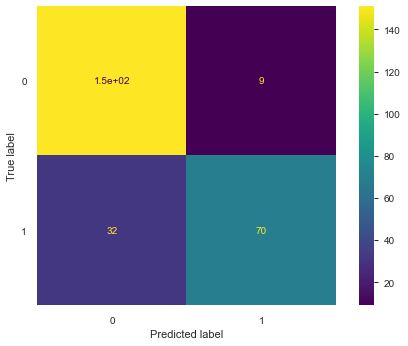

In [217]:
from sklearn.metrics import plot_confusion_matrix, classification_report
plot_confusion_matrix(CBC, x_test, y_test)
plt.show()

In [227]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.83      0.94      0.88       160
           1       0.89      0.69      0.77       102

    accuracy                           0.84       262
   macro avg       0.86      0.82      0.83       262
weighted avg       0.85      0.84      0.84       262

